In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
# from bioinfokit.analys import stat
import researchpy as rp
import numpy as np
import datetime
import fiona
from shapely.geometry import shape, Point, Polygon, MultiPolygon, LineString, MultiLineString
import shapefile

In [5]:

#read file, parse out the records and shapes shapefile_path = r'path/to/shapefile/'
sf = shapefile.Reader('./datasets/LION/LION.shp')

#grab the shapefile's field names (omit the first psuedo field) 
fields = [x[0] for x in sf.fields][1:]
records = sf.records()
shps = [s.points for s in sf.shapes()]

#write the records into a dataframe 
shapefile_dataframe = pd.DataFrame(columns=fields, data=records)

#add the coordinate data to a column called "coords" 
shapefile_dataframe = shapefile_dataframe.assign(coords=shps)


In [6]:
shapefile_dataframe.head()

,OBJECTID,Street,SAFStreetN,FeatureTyp,SegmentTyp,IncExFlag,RB_Layer,NonPed,TrafDir,TrafSrc,...,FromLeft,ToLeft,FromRight,ToRight,Join_ID,L_PD_Servi,R_PD_Servi,TRUCK_ROUT,Shape__Len,coords
0,1,EAST 168 STREET,,0,U,,B,,T,DOT,...,599,699,596,716,2251001000000,,,,396.030947,"[(-73.9034682815071, 40.8303620794707), (-73.9..."
1,2,WEST 192 STREET,,0,U,,B,,A,DOT,...,58,98,63,99,2798401000000,,,,279.360514,"[(-73.901202101452, 40.8666213684178), (-73.90..."
2,3,UNION AVENUE,,0,U,,B,,W,DOT,...,1017,1079,1016,1084,2728001000000,,,,618.327133,"[(-73.9011781129234, 40.8243971910923), (-73.9..."
3,4,UNION AVENUE,BEHAGEN PLAYGROUND COMFORT STA,0,U,,B,,W,DOT,...,0,0,0,0,21279502000000X,,,,618.327133,"[(-73.9011781129234, 40.8243971910923), (-73.9..."
4,5,UNION AVENUE,BEHAGEN PLAYGROUND FIELD NORTH,0,U,,B,,W,DOT,...,0,0,0,0,21279503000000X,,,,618.327133,"[(-73.9011781129234, 40.8243971910923), (-73.9..."


In [7]:
shapefile_dataframe.shape

(230558, 122)

In [8]:
east_168 = shapefile_dataframe[shapefile_dataframe.Street == 'UNION AVENUE']
coor = [row.coords for i, row in east_168.iterrows()]
lines = MultiLineString(coor)
len(coor)

103

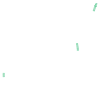

In [9]:
lines

In [10]:
streets = shapefile_dataframe.Street.unique()
len(streets)

10948

In [11]:
streets_df = pd.DataFrame(columns = ['Street', 'coords'])
for street in streets:
    s = shapefile_dataframe[shapefile_dataframe.Street == street]
    coor = [row.coords for i, row in s.iterrows()]
    lines = MultiLineString(coor)
    new_row = {'Street':street, 'coords':lines}
    streets_df = streets_df.append(new_row, ignore_index=True)

In [12]:
streets_df.shape

(10948, 2)

In [13]:
file_path = "./processed_street.csv"
data = pd.read_csv(file_path)
data.head()

/home/milica/.local/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3156: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,...,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5
0,2019-11-24,20:00,MANHATTAN,10006.0,40.70983,-74.01468,"(40.70983, -74.01468)",WEST STREET,ALBANY STREET,NaN,...,Passing Too Closely,NaN,NaN,NaN,4247215,Sedan,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN
1,2019-11-24,16:11,BROOKLYN,NaN,40.70029,-73.92904,"(40.70029, -73.92904)",CENTRAL AVENUE,NaN,NaN,...,Unspecified,NaN,NaN,NaN,4246795,4 dr sedan,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN
2,2019-11-24,12:20,BROOKLYN,11201.0,40.69119,-73.99780,"(40.69119, -73.9978)",ATLANTIC AVENUE,HICKS STREET,NaN,...,Unspecified,NaN,NaN,NaN,4246353,Sedan,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN
3,2019-09-26,13:07,BROOKLYN,11204.0,40.63291,-73.97957,"(40.63291, -73.97957)",43 STREET,17 AVENUE,NaN,...,Unspecified,NaN,NaN,NaN,4215020,Sedan,Sedan,NaN,NaN,NaN
4,2019-11-24,11:51,BRONX,NaN,40.85535,-73.91836,"(40.85535, -73.91836)",MAJOR DEEGAN EXPRESSWAY,NaN,NaN,...,Unspecified,NaN,NaN,NaN,4246365,Station Wagon/Sport Utility Vehicle,Sedan,NaN,NaN,NaN


In [14]:
index_names = data[(pd.isna(data["ON STREET NAME"]))].index
index_names.shape

(219999,)

In [15]:
for i in index_names:
    print(i)
    r = data.loc[[i]]
    point = Point(r['LONGITUDE'], r['LATITUDE'])
    d = []
    f = False
    for index, row in streets_df.iterrows():
        line = MultiLineString(row.coords)
        dist = line.distance(point)
        d.append((row.Street, dist))
        if dist < 1e-5:
            data.loc[i,'ON STREET NAME'] = row.Street
            print("Found " + row.Street)
            f = True
            break
    if not f:
        min_pair = min(d, key = lambda t: t[1])
        if min_pair[1] < 1e-3:
            data.loc[i,'ON STREET NAME'] = min_pair[0]
            print(min_pair)


787
('GATEWAY DRIVE', 0.0004832350951155905)
1168
('FRANKLIN D ROOSEVELT DRIVE', 0.00013157514216601416)
2018
('2000 CB BOUNDARY', 0.0002820708897054796)
4299
('FRANKLIN D ROOSEVELT DRIVE', 0.00013157514216601416)
8268
('GRAND CENTRAL PARKWAY', 0.00010717863323107872)
8377
('STUYVESANT OVAL', 0.00011383176120165823)
8957
('RICHMOND TERRACE', 0.00011959031137868748)
9511
('GATEWAY DRIVE', 0.0004832350951155905)
10289
('GATEWAY DRIVE', 0.0004832350951155905)
12472
('3 AVENUE', 0.0001729689523774575)
12590
('ALLEY', 0.00015733106601420617)
12872
('HAZEN STREET', 0.0001583104137433236)
12977
('GATEWAY DRIVE', 0.0005020325692820092)
13523
('GATEWAY DRIVE', 0.0006282028561089884)
13950
('BARTOW AVENUE', 0.00012184323949444402)
15489
('GATEWAY DRIVE', 0.0003687380434210667)
15584
('BARTOW AVENUE', 0.0001395908621520946)
17126
('GATEWAY DRIVE', 0.00040369743156151516)
17487
Found 31 STREET
17502
('WESTCHESTER AVENUE', 1.2331322538502628e-05)
17508
Found BEDFORD AVENUE
17510
Found 91 STREET
175

Found INTERNATIONAL AIRPORT CENTER BL
18303
('BRONXDALE AVENUE', 2.193969694360614e-05)
18313
('ASTORIA BOULEVARD', 1.639094339178444e-05)
18316
('42 STREET SHUTTLE LINE', 1.8534775017321328e-05)
18318
('LEFFERTS BOULEVARD', 1.1962403199428497e-05)
18319
('PARK AVENUE', 1.6855570589781377e-05)
18323
Found ATLANTIC AVENUE
18327
('NOSTRAND AVENUE', 1.769416581384361e-05)
18328
Found SOUTH AVENUE
18330
Found METROPOLITAN AVENUE
18334
('AVENUE U', 1.5790077715373148e-05)
18337
('MORGAN AVENUE', 1.99234452185417e-05)
18338
('HARPER AVENUE', 1.0706238154906383e-05)
18341
('BEACH 9 STREET', 1.917436404882298e-05)
18344
('AQUEDUCT AVENUE EAST', 1.3928463510887124e-05)
18346
Found POWELL STREET
18351
Found 65 AVENUE
18353
Found 132 STREET
18354
Found 39 AVENUE
18356
('DITMARS BOULEVARD', 2.0573805796371385e-05)
18357
('PRESIDENT STREET', 1.7474984604262785e-05)
18359
Found TAYLOR STREET
18361
Found ARGYLE ROAD
18363
('7 AVENUE', 1.1056355739614412e-05)
18365
Found THROOP AVENUE
18370
('FOREST H

Found AVENUE T
19172
('8 AVENUE LINE', 1.267959096254987e-05)
19175
('ATLANTIC AVENUE', 1.7748114215883218e-05)
19187
Found 29 STREET
19192
('BROADWAY', 1.0004930868804735e-05)
19197
('BOSTON ROAD', 1.3792908039268068e-05)
19200
Found GRAHAM AVENUE
19201
Found EAST 127 STREET
19204
Found FLUSHING AVENUE
19216
('EAST 6 STREET', 1.47380952585003e-05)
19218
('STANLEY AVENUE', 1.4481692603536932e-05)
19219
Found LENOX AVENUE
19227
('171 STREET', 2.07211376497384e-05)
19228
Found MCDONALD AVENUE
19236
Found EAST 14 STREET
19238
('FRESH POND ROAD', 1.6642431664061217e-05)
19242
('WHITE PLAINS ROAD', 2.3901586033675584e-05)
19243
('EAST 34 STREET', 2.1248772727273875e-05)
19245
('AVENUE I', 1.65119363097467e-05)
19253
('WEST 46 STREET', 1.8696259102329177e-05)
19256
('BROADWAY', 1.611703625267721e-05)
19258
('CONEY ISLAND AVENUE', 1.9374660825702638e-05)
19261
Found ROOSEVELT AVENUE
19262
Found BOSTON ROAD
19263
Found WEST 240 STREET
19269
('EAST 18 STREET', 2.543285691800996e-05)
19271
('HAN

Found MOFFAT STREET
20045
('CORBIN PLACE', 1.4529651921286808e-05)
20047
Found GRAVESEND NECK ROAD
20048
('FOUNTAIN AVENUE', 2.402703747532165e-05)
20049
('HAMILTON AVENUE', 4.732092641824236e-05)
20052
Found ST MARKS AVENUE
20055
Found CAMPUS ROAD
20057
('ATLANTIC AVENUE', 1.7611898417631866e-05)
20062
('EAST 64 STREET', 2.21085493025446e-05)
20069
Found 13 AVENUE
20071
Found BROADWAY
20073
Found 187 PLACE
20075
Found CENTRAL PARK NORTH
20077
Found 88 STREET
20078
Found UNION TURNPIKE
20084
Found HORACE HARDING EXPRESSWAY
20086
Found FOX STREET
20089
Found WEST 56 STREET
20092
Found OVINGTON AVENUE
20095
('EAST 150 STREET', 2.0152045381737413e-05)
20096
('STADIUM PLACE SOUTH', 1.3492486196734537e-05)
20097
Found MADISON AVENUE
20098
Found UNION AVENUE
20100
Found 153 STREET
20107
('AVENUE U', 1.949409102553448e-05)
20108
Found ALBION AVENUE
20113
Found EAST 226 STREET
20117
('FLATBUSH AVENUE', 2.4601639345566994e-05)
20124
('BARKER AVENUE', 1.871642756674375e-05)
20132
('AVENUE N', 1.

Found PUTNAM AVENUE
20833
Found WEST 39 STREET
20835
Found BROOKLYN AVENUE
20843
('105 STREET', 1.9504932315059327e-05)
20846
('31 AVENUE', 1.6456014443064203e-05)
20852
('91 STREET', 2.3958205483286304e-05)
20857
Found BEACH 11 STREET
20859
('39 AVENUE', 1.4806746723386783e-05)
20866
Found OCEAN PARKWAY
20868
('SURF AVENUE', 1.4534054120719735e-05)
20872
('EAST 231 STREET', 2.0292443732398148e-05)
20873
Found FULTON STREET
20874
('LEFFERTS AVENUE', 1.8200589019059064e-05)
20875
('NOSTRAND AVENUE', 1.6115413091771985e-05)
20876
('SANDS STREET BIKE PATH', 2.441375540596963e-05)
20882
('EAST 23 STREET', 1.768507979504789e-05)
20898
('SANDFORD STREET', 2.1997934479541297e-05)
20902
Found 145 STREET
20905
Found 6 AVENUE LINE
20910
('ATLANTIC AVENUE', 2.464297085005269e-05)
20913
('WEST 23 STREET', 1.8904721554468367e-05)
20917
('CLINTON STREET', 1.3733652378424442e-05)
20923
('WHITE PLAINS ROAD', 3.651499564783855e-05)
20929
('EXTERIOR STREET', 1.4064864690549905e-05)
20931
('PENNSYLVANIA 

Found LEXINGTON AVENUE LINE
21707
('WHITE PLAINS ROAD', 2.209443261694418e-05)
21708
('EAST GUN HILL ROAD', 2.027256646282151e-05)
21709
Found 85 STREET
21712
('ELDRIDGE STREET', 1.0633508370795782e-05)
21722
('79 STREET', 1.9616209837454107e-05)
21723
('SHORE ROAD', 5.687228449942492e-05)
21729
Found 61 STREET
21732
Found PENNSYLVANIA AVENUE
21734
('BAILEY AVENUE', 1.2060974631699112e-05)
21736
Found NOSTRAND AVENUE
21737
('7 AVENUE', 1.0059748652685372e-05)
21742
('31 STREET', 1.0730080305634193e-05)
21744
('BLAKE AVENUE', 1.8196136581453263e-05)
21747
Found BOSTON ROAD
21748
('ATLANTIC AVENUE', 3.221721839867835e-05)
21754
('FLATLANDS AVENUE', 1.6699752863612476e-05)
21758
Found WATER STREET
21759
Found HOE AVENUE
21767
('MYRTLE AVENUE', 1.861695714635183e-05)
21776
Found 146 PLACE
21781
Found CORONA AVENUE
21785
('RICHMOND AVENUE', 1.1053048229734118e-05)
21787
('SOUTH 3 STREET', 1.6686950220303652e-05)
21792
('3 AVENUE', 1.6788360247831666e-05)
21795
('85 DRIVE', 1.693276322204620

('MONTAUK AVENUE', 2.1617644860642674e-05)
22580
('87 AVENUE', 1.4088683558917422e-05)
22590
('7 AVENUE', 1.1116090734204362e-05)
22592
Found POWELL STREET
22593
Found BAYCHESTER AVENUE
22594
Found NOSTRAND AVENUE
22597
Found EAST 21 STREET
22603
Found EAST 8 STREET
22604
('8 AVENUE', 1.2848590595764991e-05)
22610
Found HYLAN BOULEVARD
22621
Found 9 AVENUE
22623
('NORTHERN BOULEVARD', 1.9545911938757656e-05)
22628
Found BLEECKER STREET
22630
Found AVENUE L
22634
Found HEYWARD STREET
22636
('EAST HOUSTON STREET', 1.7769221735709098e-05)
22650
('EAST 16 STREET', 1.7627706695097904e-05)
22658
('LURTING AVENUE', 5.3926065356919616e-05)
22662
Found ST MARKS PLACE
22665
Found 59 STREET
22666
('DUMONT AVENUE', 1.9018732565674893e-05)
22670
Found EAST 95 STREET
22682
Found EAST FORDHAM ROAD
22685
('WEST 135 STREET', 2.2192130646823313e-05)
22691
Found EAST 174 STREET
22692
('WEST 2 STREET', 2.1537423216569155e-05)
22695
Found FLATLANDS AVENUE
22703
('WEST 8 STREET', 1.8959423824617846e-05)
227

Found UNION TURNPIKE
23438
Found EMPIRE BOULEVARD
23442
Found KISSENA BOULEVARD
23444
Found OSBORN STREET
23445
('COLON AVENUE', 2.2811829204317456e-05)
23449
('91 STREET', 1.7908744329718756e-05)
23457
('MONTGOMERY STREET', 1.77159816406366e-05)
23465
Found EAST 27 STREET
23466
Found 58 STREET
23469
Found WEST 105 STREET
23470
Found FLATBUSH AVENUE
23472
Found MESEROLE STREET
23476
('256 STREET', 2.3169494041897423e-05)
23479
Found BAY RIDGE PARKWAY
23481
('BRONXWOOD AVENUE', 1.303771925130751e-05)
23483
('EAST 13 STREET', 2.1198652968471125e-05)
23485
('SOUTH CONDUIT AVENUE', 1.971593988885807e-05)
23487
('WEST 122 STREET', 2.1011835832685527e-05)
23489
('RICHMOND ROAD', 1.0333079281043797e-05)
23493
('55 STREET', 2.08049210721584e-05)
23496
Found EAST 230 STREET
23504
('GRAMERCY PARK SOUTH', 2.1625143201629825e-05)
23507
('EAST 25 STREET', 2.2031904139535596e-05)
23509
Found 63 STREET
23516
('UNION STREET', 1.978849894650238e-05)
23517
Found BRUSH AVENUE
23519
('4 AVENUE', 1.1418469

('ASHLAND PLACE', 2.7338945758223708e-05)
24221
('234 STREET', 1.3556465174591863e-05)
24225
('HILLSIDE AVENUE', 1.1687871280948219e-05)
24226
('BEACH 9 STREET', 2.3938777940459616e-05)
24228
Found WEST 238 STREET
24240
Found FT HAMILTON PARKWAY
24242
('WEST 125 STREET', 1.8467124915179045e-05)
24243
Found BRUCKNER BOULEVARD
24245
('EAST GUN HILL ROAD', 2.120787842908148e-05)
24254
('FLATLANDS AVENUE', 1.0710250606380946e-05)
24257
Found LYDIG AVENUE
24260
('JEFFERSON AVENUE', 1.5341512697965748e-05)
24265
Found FRESH POND ROAD
24266
('MESEROLE AVENUE', 1.5383367608181032e-05)
24274
Found LORIMER STREET
24279
('PARSONS BOULEVARD', 1.554265534580984e-05)
24280
Found OVINGTON AVENUE
24283
('ANDERSON AVENUE', 1.3994651289212818e-05)
24284
('GARFIELD PLACE', 2.0073203930721393e-05)
24287
Found CLINTON AVENUE
24291
Found CLAFLIN AVENUE
24301
('80 STREET', 1.7434370062568787e-05)
24302
('RICHMOND AVENUE', 2.8291073310236493e-05)
24307
('HOLLAND AVENUE', 1.5651688668297972e-05)
24309
('MONTRO

('41 ROAD', 1.9263868840770876e-05)
25005
('EAST 123 STREET', 1.856602271451078e-05)
25006
('CLINTON STREET', 1.6448660103388067e-05)
25015
('82 STREET', 2.122566415958843e-05)
25016
('MANGIN AVENUE', 1.0819443029791944e-05)
25019
Found 186 STREET
25022
Found EAST 137 STREET
25026
('PEARL STREET', 1.3151069303731546e-05)
25029
('SOMERS STREET', 1.667002424961073e-05)
25032
Found WEST 35 STREET
25036
('110 STREET', 1.85255025572592e-05)
25045
('EAGLE STREET', 2.114126348386334e-05)
25048
('PULASKI STREET', 1.595074288560885e-05)
25051
('PARSONS BOULEVARD', 1.9274728686673344e-05)
25052
('EAST 95 STREET', 2.0937983740395553e-05)
25058
Found EAST 174 STREET
25059
Found FLATLANDS AVENUE
25060
('PITKIN AVENUE', 1.7056501745291633e-05)
25064
('NORTHERN BOULEVARD', 1.7351901133406776e-05)
25070
('WASHINGTON AVENUE', 1.3617900393797627e-05)
25071
('WESTCHESTER AVENUE', 1.3776471219680124e-05)
25078
('60 STREET', 2.0068470951018954e-05)
25079
('HALE AVENUE', 1.9704364334247402e-05)
25093
Found 

Found VIRGIL PLACE
25970
('VANDERBILT AVENUE', 1.424781086166755e-05)
25971
('WEST 27 STREET', 2.102578291023506e-05)
25973
('WEST 48 STREET', 1.882152902785761e-05)
25975
Found 170 STREET
25982
Found GRAVESEND NECK ROAD
25986
('ROCKAWAY PARKWAY', 2.029645800783002e-05)
25990
('KNAPP STREET', 1.266830177969958e-05)
25992
Found NORTHERN BOULEVARD
25993
Found WEST 157 STREET
25996
Found GREENE AVENUE
25998
('RALPH AVENUE', 1.4709772946183012e-05)
25999
('MONTAUK AVENUE', 1.1250876275754771e-05)
26001
('EAST 26 STREET', 1.8807546159192746e-05)
26004
Found 197 STREET
26008
('LEXINGTON AVENUE', 1.411716655376159e-05)
26010
Found EAST 84 STREET
26015
Found EAST 138 STREET
26019
Found EAST 59 STREET
26029
Found 82 STREET
26031
Found PARK AVENUE
26036
Found UNION TURNPIKE
26038
Found 85 STREET
26045
Found ULMER STREET
26046
('MORRIS PARK AVENUE', 1.3743332896601582e-05)
26049
('MANHATTAN AVENUE', 1.5261315294383604e-05)
26050
Found DEAN STREET
26051
('NORTH END AVENUE', 2.150906759627584e-05)


('EAST 22 STREET', 1.8697253465042822e-05)
26754
('ESSEX STREET', 1.0047462121755026e-05)
26758
('3 AVENUE', 1.3441641261315272e-05)
26761
('32 STREET', 1.3740475868440589e-05)
26764
('PROSPECT PLACE', 1.3665517131242337e-05)
26767
Found EAST 94 STREET
26778
Found NEW YORK AVENUE
26782
Found 21 AVENUE
26784
('SOUTHERN BOULEVARD', 1.4084073658155783e-05)
26786
('COMMONWEALTH BOULEVARD', 2.130177798465001e-05)
26790
('84 STREET', 1.8903628342026378e-05)
26800
Found 6 AVENUE LINE
26801
('168 STREET', 1.2311562479767818e-05)
26802
('NOSTRAND AVENUE', 2.0250199106242565e-05)
26806
Found IRVING AVENUE
26813
Found 86 ST TRANSVERSE
26814
('MCGUINNESS BOULEVARD', 2.4867362342562473e-05)
26815
Found ANKENER AVENUE
26817
('SHEEPSHEAD BAY ROAD', 1.9021742450373987e-05)
26821
Found EAST 149 STREET
26822
Found WEST 46 STREET
26823
Found 3 AVENUE
26824
('EMPIRE BOULEVARD', 1.7304343345922232e-05)
26826
Found CORLEAR AVENUE
26827
('OCEAN AVENUE', 1.564737334921205e-05)
26835
('HILLSIDE AVENUE', 5.6799

('ROOSEVELT AVENUE', 1.7972445631910086e-05)
27605
Found NEPTUNE AVENUE
27606
Found CORONA AVENUE
27608
('VAN BUREN STREET', 1.6798238394434402e-05)
27609
Found STEPHENS AVENUE
27613
('DITMARS BOULEVARD', 1.4935877671893643e-05)
27615
Found 148 AVENUE
27617
('LINDEN BOULEVARD', 1.5465059827660362e-05)
27624
Found HYLAN BOULEVARD
27626
Found 64 STREET
27628
('3 AVENUE', 1.3887202213884417e-05)
27629
('56 STREET', 1.7352255037402322e-05)
27635
('PARK AVENUE', 1.707590483242154e-05)
27639
Found MADISON AVENUE
27643
('JAMAICA AVENUE', 1.5242565029615416e-05)
27644
('EAST 48 STREET', 1.852777811065535e-05)
27645
('200 STREET', 1.844457365060843e-05)
27658
('BLOOMINGDALE ROAD', 1.9495893200286675e-05)
27659
Found ECKFORD STREET
27666
Found FLUSHING AVENUE
27667
('ATLANTIC AVENUE', 1.8133800922161865e-05)
27669
('11 STREET', 1.904204896360567e-05)
27671
Found 7 STREET
27672
('EASTERN PARKWAY', 1.544242103183719e-05)
27673
('CHURCH AVENUE', 1.716309101534108e-05)
27679
('SEDGWICK AVENUE', 1.31

('WEST BROADWAY', 1.0423782829761992e-05)
28494
Found CORONA AVENUE
28503
('EAST 43 STREET', 3.448623392258443e-05)
28506
Found 98 STREET
28512
Found RICHMOND AVENUE
28514
('33 STREET', 1.1968151400958742e-05)
28516
('NOSTRAND AVENUE', 2.072539280777272e-05)
28517
Found BERGEN STREET
28519
('UNION STREET', 1.6746025159163407e-05)
28520
('NOSTRAND AVENUE', 1.540993532482857e-05)
28533
Found EAST 138 STREET
28542
Found PARSONS BOULEVARD
28552
Found LEFFERTS BOULEVARD
28555
Found AVENUE P
28558
('ALLEN STREET', 2.8710183996301747e-05)
28562
Found JAMAICA AVENUE
28565
Found UNION TURNPIKE
28566
Found EAST 31 STREET
28567
('EAST 23 STREET', 2.6763029842446078e-05)
28568
('MYRTLE AVENUE', 1.678256383601195e-05)
28569
Found ST NICHOLAS TERRACE
28570
('VICTORY BOULEVARD', 1.583593882273845e-05)
28571
('12 AVENUE', 1.0361094973798377e-05)
28574
Found BROADWAY
28575
Found ROOSEVELT AVENUE
28579
('NORTH MOORE STREET', 1.7923177131015324e-05)
28581
Found TROUTMAN STREET
28582
Found NOSTRAND AVENUE

('EAST TREMONT AVENUE', 2.0834286687943138e-05)
29281
('EMPIRE BOULEVARD', 1.9092733780957684e-05)
29285
('AUSTIN STREET', 1.811813724149322e-05)
29287
Found LUCERNE STREET
29289
('OVINGTON AVENUE', 1.846040928628243e-05)
29290
('BRONX BOULEVARD', 1.738962419512152e-05)
29293
Found 57 STREET
29295
Found BROADWAY
29304
('GEORGE STREET', 1.181227452762279e-05)
29306
('ORLOFF AVENUE', 2.376094498604778e-05)
29313
('LONGFELLOW AVENUE', 1.0409072105972008e-05)
29317
('ST JAMES PLACE', 1.5679772137009648e-05)
29319
Found WEST 161 STREET
29322
Found 112 ROAD
29326
('109 ROAD', 1.0449469434246822e-05)
29333
Found EAST 38 STREET
29334
('29 AVENUE', 2.159882270842054e-05)
29337
Found MONROE STREET
29339
Found MARCY AVENUE
29340
('FLATBUSH AVENUE', 2.2299840861419265e-05)
29344
('GATEWAY DRIVE', 0.0004832350951155905)
29347
('EASTCHESTER ROAD', 1.6341169656033286e-05)
29348
('EASTERN PARKWAY', 1.8423269594514898e-05)
29352
Found ST JOHNS LANE
29356
('LYDIG AVENUE', 1.8574252068455896e-05)
29360
(

('1 AVENUE', 1.1068385089031008e-05)
29988
Found BEACH 19 STREET
29991
Found MADISON AVENUE
29992
Found 3 AVENUE
29993
Found EAST 143 STREET
29995
('HIGH LINE', 1.0892679834408017e-05)
29997
('BRIGHTON 13 STREET', 1.2447753460874981e-05)
29999
Found 6 STREET
30001
Found EAST 179 STREET
30007
Found FREEPORT LOOP
30010
('7 AVENUE', 1.225826090548071e-05)
30020
Found EAST 31 STREET
30039
('78 STREET', 1.878714866390217e-05)
30050
('LUDLOW STREET', 1.4828376146290826e-05)
30054
Found BELLAMY LOOP
30059
('160 STREET', 2.5263000261157268e-05)
30061
Found 170 STREET
30068
Found 8 AVENUE
30074
Found AVENUE C
30079
('ARLINGTON AVENUE', 1.635288340134231e-05)
30083
('VAN DUZER STREET', 8.406647306208652e-05)
30098
('LORILLARD PLACE', 1.434506538165333e-05)
30105
('WEST 15 STREET', 1.8424022655516086e-05)
30106
('BROADWAY', 1.1002278473576361e-05)
30108
Found PARK AVENUE
30113
('MAPLE STREET', 1.5876463641420925e-05)
30115
('234 STREET', 1.3291299540547177e-05)
30116
Found BROADWAY
30123
('DEKALB

Found CONEY ISLAND AVENUE
30882
('2000 CB BOUNDARY', 3.3043631949909234e-05)
30883
('MCDONALD AVENUE', 1.9996429365322708e-05)
30884
('MACE AVENUE', 1.649048160478715e-05)
30889
('DELANOY AVENUE', 1.576260868013274e-05)
30891
('EAST 139 STREET', 2.2041439676871505e-05)
30892
('EAST 79 STREET', 2.0805103967481114e-05)
30894
('2 AVENUE', 1.0306561194365168e-05)
30898
Found WHITE PLAINS ROAD
30900
('ATLANTIC AVENUE', 1.6335837934747317e-05)
30903
Found BEDFORD AVENUE
30906
('AMBOY ROAD', 1.0190657441517948e-05)
30909
('3 AVENUE', 1.2311544381354358e-05)
30912
('PELHAM PARKWAY SOUTH', 6.703637586374674e-05)
30916
Found BROADWAY
30917
('NORTH PORTLAND AVENUE', 1.5261263199066652e-05)
30931
Found GEORGIA AVENUE
30936
Found METROPOLITAN AVENUE
30942
Found SHORE FRONT PARKWAY
30947
Found FLUSHING AVENUE
30949
Found ROCKAWAY BEACH BOULEVARD
30954
Found WORTMAN AVENUE
30958
Found EAST 57 STREET
30959
Found AVENUE T
30965
Found BARCLAY STREET
30969
('SURF AVENUE', 1.5585014914390433e-05)
30973
('

Found MONROE STREET
31713
('EAST 236 STREET', 2.139584869153833e-05)
31714
Found 4 PLACE
31727
('ROOSEVELT AVENUE', 1.642657523888071e-05)
31728
Found LONGWOOD AVENUE
31733
Found 20 AVENUE
31734
Found EAST 85 STREET
31735
('8 AVENUE LINE', 2.0197657513816278e-05)
31737
Found 53 STREET
31738
('CHAMBERS STREET', 1.843816081592814e-05)
31741
Found SOUTH PORTLAND AVENUE
31744
('UNDERHILL AVENUE', 1.6702565892881237e-05)
31745
Found BROAD STREET
31746
Found BROOME STREET
31747
('BURDEN CRESCENT', 2.988772568754597e-05)
31754
('8 AVENUE', 1.3627627666086108e-05)
31757
('RIVERSIDE DRIVE', 1.7503592938350994e-05)
31768
Found BROADWAY
31772
Found MYRTLE AVENUE
31777
Found FLATBUSH AVENUE
31778
Found MYRTLE AVENUE
31781
('EAST 72 STREET', 1.9415465771310897e-05)
31782
('CYPRESS AVENUE', 2.1134527424438235e-05)
31785
Found BEACH 62 STREET
31786
('BAY PARKWAY', 1.4764065363850833e-05)
31787
Found MADISON AVENUE
31788
Found EAST HOUSTON STREET
31793
Found EDGEWATER ROAD
31795
Found RHINELANDER AVEN

('WEST 149 STREET', 2.7218138812721005e-05)
32520
('UNION STREET', 1.373908558736367e-05)
32526
('FOSTER AVENUE', 1.1241569562076974e-05)
32530
Found HEATH AVENUE
32533
('BELL BOULEVARD', 1.2123226783077142e-05)
32543
Found EAST 7 STREET
32547
Found DIVISION AVENUE
32552
('PEARSALL AVENUE', 1.2764853020196093e-05)
32553
Found NORTHERN BOULEVARD
32556
Found 34 AVENUE
32557
Found SURF AVENUE
32558
Found BOSTON ROAD
32561
('WEST 15 STREET', 1.6985999054336432e-05)
32562
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
32566
Found AVENUE A
32577
Found CLERMONT AVENUE
32578
Found 3 AVENUE
32584
('EAST NEW YORK AVENUE', 1.832524443337412e-05)
32585
('WEBSTER AVENUE', 1.390193626797608e-05)
32587
('EAST 14 STREET', 1.8722574760056763e-05)
32591
Found WALTON AVENUE
32600
('232 STREET', 1.367880653150784e-05)
32602
('MAC DONOUGH STREET', 1.9988873612401535e-05)
32605
Found VAN SICLEN AVENUE
32606
('BAYCHESTER AVENUE', 0.00017967190136688248)
32609
('108 STREET', 1.2784643345457987e-05)
32611
('JE

('UTICA AVENUE', 1.9354681163504776e-05)
33290
Found EAST 121 STREET
33292
('145 AVENUE', 2.142299832523661e-05)
33296
('EAST 163 STREET', 1.6716791909902054e-05)
33308
Found 169 STREET
33309
('5 AVENUE', 1.0869459516166968e-05)
33314
Found WEST 155 STREET
33317
Found METROPOLITAN AVENUE
33318
('FRANKLIN D ROOSEVELT DRIVE', 9.117896264797509e-05)
33320
Found EAST 80 STREET
33324
Found WESTCHESTER AVENUE
33330
Found BEACH 59 STREET
33331
('130 STREET', 1.599527120684917e-05)
33333
Found LINDEN BOULEVARD
33336
Found STORY AVENUE
33339
Found 24 STREET
33345
Found EAST 185 STREET
33351
Found FORBELL STREET
33352
Found CROSS BAY BOULEVARD
33354
('VICTORY BOULEVARD', 1.699707065466056e-05)
33369
Found MERCER STREET
33374
('10 STREET', 2.07099861158376e-05)
33380
Found EDGEWATER ROAD
33388
('BAY RIDGE PARKWAY', 2.2768371468242393e-05)
33395
('133 AVENUE', 1.880192438448605e-05)
33398
Found DORCHESTER ROAD
33402
Found LINDEN BOULEVARD
33403
('OCEAN PARKWAY', 1.1864558932670973e-05)
33406
('NOR

('SOUNDVIEW AVENUE', 2.3602149568431556e-05)
34196
Found COMMONWEALTH AVENUE
34200
Found BRONXDALE AVENUE
34206
Found 21 AVENUE
34209
Found BROADWAY
34210
('NAMEOKE AVENUE', 1.8651888375210754e-05)
34212
('RUGBY ROAD', 2.5817423995897616e-05)
34213
('CENTRE STREET', 2.4312071975770433e-05)
34217
Found EAST 29 STREET
34218
('17 STREET', 2.8205683625003606e-05)
34230
('41 AVENUE', 1.541612623735348e-05)
34233
('50 STREET', 1.5698726405345866e-05)
34234
('WEST 45 STREET', 1.951311859106736e-05)
34248
Found EAST 51 STREET
34250
('RYDER STREET', 1.9214674619020294e-05)
34255
Found NEPTUNE AVENUE
34256
('JUNCTION BOULEVARD', 2.427866524107701e-05)
34270
('AVENUE O', 1.4142086988410215e-05)
34272
Found KINGS HIGHWAY
34275
('SCHOLES STREET', 1.782698244377611e-05)
34276
('62 STREET', 2.0189299254225915e-05)
34278
Found CRESCENT STREET
34283
Found EMMONS AVENUE
34286
Found ROCKAWAY PARKWAY
34288
('HORACE HARDING EXPRESSWAY', 1.6284188338751904e-05)
34291
('AINSLIE STREET', 1.939357425072339e-05

Found EASTERN PARKWAY
35081
('PARK AVENUE', 1.8834312655450327e-05)
35086
('5 AVENUE', 1.6361931503738467e-05)
35089
('57 ROAD', 1.064393770967035e-05)
35095
Found HORACE HARDING EXPRESSWAY
35096
Found HUTCHINSON RIVER PARKWAY
35098
('EAST 215 STREET', 1.9643425397774174e-05)
35101
('MONITOR STREET', 1.526439628662585e-05)
35107
Found ARTHUR AVENUE
35112
('WEST 29 STREET', 2.0048412337974866e-05)
35118
Found EAST 54 STREET
35123
Found ASHFORD STREET
35135
('EAST 132 STREET', 1.9715650415690372e-05)
35137
Found EAST 42 STREET
35140
('SOUTH 1 STREET', 2.0492174449296273e-05)
35142
('CENTRAL PARK SOUTH', 1.5569193384682047e-05)
35143
('NORTHERN BOULEVARD', 1.0877097047927097e-05)
35145
Found WESTCHESTER AVENUE
35150
('WEST 45 STREET', 2.7898519481880987e-05)
35151
Found VERNON BOULEVARD
35161
Found 93 STREET
35163
Found MEEKER AVENUE
35171
Found DEKALB AVENUE
35177
Found MORRISON AVENUE
35179
Found CITY ISLAND AVENUE
35180
Found 34 STREET
35183
Found 124 STREET
35185
('JUNCTION BOULEVARD'

Found 127 STREET
35942
Found JAMIE LANE
35945
Found EDGEWATER ROAD
35946
Found MINFORD PLACE
35949
('238 STREET', 1.1651315250725495e-05)
35953
Found SCHROEDERS AVENUE
35957
Found 179 PLACE
35958
('EAST GUN HILL ROAD', 2.3962960175302713e-05)
35964
('CLEARVIEW EXPRESSWAY', 2.026466672413868e-05)
35974
('62 STREET', 2.05041675856658e-05)
35976
('ROGERS AVENUE', 1.4417093380381543e-05)
35979
('HUTCHINSON RIVER PARKWAY EAST', 1.286580209919826e-05)
35980
('167 STREET', 2.465325275415941e-05)
35983
Found ST ANNS AVENUE
35984
('GRAND STREET', 1.511290768672107e-05)
35986
Found MCGUINNESS BOULEVARD
35987
Found MERRICK BOULEVARD
35990
Found LONG ISLAND EXPRESSWAY
35994
Found CLAY AVENUE
35997
Found 38 STREET
35999
Found AVENUE N
36001
('MONROE STREET', 2.045567462598964e-05)
36006
('ROGERS AVENUE', 1.3766401195188357e-05)
36017
('GREENWICH STREET', 1.3994994686062766e-05)
36020
Found ROOSEVELT AVENUE
36029
Found 168 PLACE
36032
('MAIN STREET', 1.8425932137664203e-05)
36040
Found SOUTHERN BOUL

('SOUTH 1 STREET', 2.3433429110564923e-05)
36742
('FULTON STREET', 1.9052565410262487e-05)
36754
('CYPRESS AVENUE', 1.0978964391039614e-05)
36758
('EAST 34 STREET', 1.730298034954151e-05)
36759
Found FLUSHING AVENUE
36760
Found HARRISON AVENUE
36768
('21 AVENUE', 1.0577277124893834e-05)
36774
('PARKSIDE AVENUE', 1.8713710567632544e-05)
36777
('79 STREET', 1.7768388097499917e-05)
36779
Found NORTHERN BOULEVARD
36784
Found 51 STREET
36792
Found LINWOOD STREET
36793
('BAINBRIDGE AVENUE', 1.0754298922757812e-05)
36794
Found FLATLANDS AVENUE
36799
('269 STREET', 2.536242730582894e-05)
36805
('21 STREET', 1.3586088253150662e-05)
36808
('BELL BOULEVARD', 1.8837986446045232e-05)
36809
('102 AVENUE', 1.8353894136502796e-05)
36810
Found EAST 99 STREET
36814
('90 STREET', 1.4193195602004264e-05)
36818
Found 20 AVENUE
36821
Found EAST TREMONT AVENUE
36822
('LUDLOW STREET', 1.1847625273935747e-05)
36823
Found CHURCH AVENUE
36825
Found FLATBUSH AVENUE
36826
('DOWNING STREET', 1.5069255281153683e-05)

('164 PLACE', 1.062225480554557e-05)
37596
Found SUTTER AVENUE
37602
Found 100 AVENUE
37612
Found FLATBUSH AVENUE
37613
('32 STREET', 1.0291157390006242e-05)
37620
('LUDLOW STREET', 1.3430716658698257e-05)
37622
('1 AVENUE', 1.0686468046366401e-05)
37627
Found WHITE PLAINS ROAD
37628
Found 68 STREET
37629
('11 AVENUE', 4.041878432531614e-05)
37631
('HOLLYWOOD AVENUE', 2.4988869495327265e-05)
37634
Found EAST 31 STREET
37640
Found 97 STREET
37650
('EAST 198 STREET', 1.8163733841168695e-05)
37651
('ROOSEVELT AVENUE', 1.6113563250782207e-05)
37658
Found BEACH 116 STREET
37659
Found 7 AVENUE
37661
Found HEMPSTEAD AVENUE
37662
('METROPOLITAN AVENUE', 2.7769381352335247e-05)
37665
Found BOSTON ROAD
37671
('FLATBUSH AVENUE', 1.4238080496511061e-05)
37672
Found ROCKAWAY BOULEVARD
37676
Found EAST 182 STREET
37680
Found HEMPSTEAD AVENUE
37683
('GREENWICH STREET', 1.2874701517720911e-05)
37685
('EAST 45 STREET', 2.0388521590402012e-05)
37688
('53 STREET', 2.1692249655638646e-05)
37691
('BEDFORD 

('WEST 57 STREET', 2.9916857082926867e-05)
38504
('53 AVENUE', 1.3310394500379222e-05)
38505
Found FLATLANDS AVENUE
38507
('ELMHURST AVENUE', 1.4694070844558342e-05)
38514
Found 37 AVENUE
38515
('HILLSIDE AVENUE', 1.2174762020080295e-05)
38516
('BAILEY AVENUE', 1.4056396361811184e-05)
38518
Found PAGE AVENUE
38521
('EAST 92 STREET', 1.9289723982230165e-05)
38527
Found PITKIN AVENUE
38529
Found SEAVIEW AVENUE
38541
('AMSTERDAM AVENUE', 1.1333805011739699e-05)
38546
('ORCHARD BEACH ROAD', 1.0429320017126266e-05)
38548
Found STORY AVENUE
38557
('EAST TREMONT AVENUE', 2.3513494606182393e-05)
38564
Found PEARL STREET
38567
('BAY STREET', 6.187039598148513e-05)
38572
Found 92 AVENUE
38583
Found HEWES STREET
38588
Found BROADWAY
38596
('LINDEN BOULEVARD', 1.7658597412820584e-05)
38599
('DE KRUIF PLACE', 1.295203469495243e-05)
38603
('EAST 80 STREET', 1.844953698383002e-05)
38605
Found 57 STREET
38608
('HAMILTON AVENUE', 1.3645495466876615e-05)
38615
('3 AVENUE', 1.2086170612279717e-05)
38617


('41 STREET', 1.014718345369e-05)
39369
Found EAST 156 STREET
39380
Found CHURCH AVENUE
39383
('GRAND AVENUE', 1.2571486669575186e-05)
39385
Found EAST 25 STREET
39386
Found 11 STREET
39392
Found EMMONS AVENUE
39394
Found STATE STREET
39395
('97 AVENUE', 1.6419431092060134e-05)
39402
Found LEFFERTS AVENUE
39404
('PARK AVENUE', 1.3367679493427756e-05)
39405
('85 DRIVE', 1.6724982803499558e-05)
39415
Found DAVIDSON AVENUE
39421
('HAUGHWOUT AVENUE', 1.8811089426840604e-05)
39423
Found HYLAN BOULEVARD
39449
('WILSON STREET', 1.653419544551765e-05)
39454
Found 86 ROAD
39460
Found STERLING PLACE
39461
('AVENUE C', 2.9343978809000123e-05)
39464
('MARION AVENUE', 1.3434547216295027e-05)
39465
Found ROCKAWAY AVENUE
39468
('EAST 83 STREET', 2.5050384040945677e-05)
39470
('GOWANUS EXPRESSWAY', 1.5552324740793063e-05)
39471
('MADISON AVENUE', 1.2127843498801162e-05)
39474
('ROGERS AVENUE', 1.5410631032047386e-05)
39477
('SOUTHERN BOULEVARD', 1.19834454014267e-05)
39478
Found HORATIO STREET
39479
F

Found BRINKERHOFF AVENUE
40212
('LAKEWOOD AVENUE', 1.541716510353552e-05)
40213
Found TILDEN AVENUE
40218
('EAST 20 STREET', 4.0143608359974286e-05)
40222
('DECATUR STREET', 1.3953356002643048e-05)
40224
('RALPH AVENUE', 1.591538973544029e-05)
40228
Found MANOR ROAD
40231
('95 STREET', 1.806039052207893e-05)
40238
('NEILL AVENUE', 1.6104824822618565e-05)
40240
Found MYRTLE AVENUE
40243
Found 172 STREET
40247
('WALTON STREET', 1.5146246000355181e-05)
40254
Found NORTHERN BOULEVARD
40256
('LINDEN BOULEVARD', 1.3578267245712662e-05)
40259
('GRINNELL PLACE', 1.9420967048154672e-05)
40260
('MEEKER AVENUE', 2.7795093756405364e-05)
40271
Found HOUSTON/ESSEX STREET LINE
40273
('5 AVENUE', 1.0743308967348405e-05)
40274
('BROADWAY', 1.94809167550475e-05)
40275
('198 STREET', 2.1647175265620344e-05)
40277
('50 STREET', 1.4350337398966235e-05)
40279
Found EAST TREMONT AVENUE
40285
Found WEST 86 STREET
40288
Found ST ANNS AVENUE
40291
Found 37 STREET
40295
('HANCOCK STREET', 1.7014143186465756e-05)

('PARK AVENUE', 1.2600455942825995e-05)
41093
Found WEST 36 STREET
41100
Found EAST 17 STREET
41101
('METROPOLITAN AVENUE', 1.3744470807041183e-05)
41102
('71 ROAD', 1.3776386279099788e-05)
41112
('BAYCHESTER AVENUE', 4.876065694209817e-05)
41115
('75 STREET', 2.1653424219118923e-05)
41116
Found EDGEWATER ROAD
41120
Found BEVERLEY ROAD
41125
Found CRESCENT STREET
41126
('ALLEN STREET', 3.054853174003789e-05)
41127
Found CONEY ISLAND AVENUE
41133
Found AVENUE J
41134
('NOBLE AVENUE', 1.2799825691050782e-05)
41138
Found BOWERY
41141
Found EAST 149 STREET
41142
('LINDEN BOULEVARD', 1.3667790025361326e-05)
41143
Found 94 AVENUE
41145
('EXTERIOR STREET', 1.11752738015196e-05)
41147
('EAST 91 STREET', 1.8265349295143003e-05)
41148
('4 AVENUE', 1.042028774641843e-05)
41153
('LIVINGSTON STREET', 1.9644257600435324e-05)
41155
('GRAND CENTRAL PARKWAY', 2.0893035196429194e-05)
41159
('FOOD CENTER DRIVE', 1.9062901290346224e-05)
41165
('SOUTHERN BOULEVARD', 1.0055149833882163e-05)
41171
Found 8 AV

('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
41973
('WEST 231 STREET', 1.8939145063045617e-05)
41975
Found WEST 118 STREET
41984
('FRANKLIN AVENUE', 1.405729400397614e-05)
41986
Found WEST 22 STREET
41988
Found BAY RIDGE PARKWAY
41990
('BEACH 54 STREET', 2.351522841129563e-05)
41991
Found MANHATTAN AVENUE
41992
('FLATBUSH AVENUE', 1.8321488103205518e-05)
41993
('AVENUE U', 1.301944490975337e-05)
41996
Found WEST 46 STREET
41998
Found BAY 50 STREET
42001
('FLATBUSH AVENUE', 4.651593330293837e-05)
42005
Found 153 STREET
42006
('PARK AVENUE', 1.2817422787198112e-05)
42009
('LENOX ROAD', 1.7600735719319516e-05)
42011
Found WEBSTER AVENUE
42013
('120 STREET', 2.4086914813702123e-05)
42015
('EAST 19 STREET', 1.693771467255801e-05)
42024
Found WEST 118 STREET
42025
Found 138 AVENUE
42033
Found KINGS HIGHWAY
42036
('NOSTRAND AVENUE', 1.6115413091771985e-05)
42038
('82 STREET', 1.7903028780760115e-05)
42045
Found PROSPECT PARK WEST
42057
Found ALLEN STREET
42059
('2010 CB BOUNDARY', 1.9668416

('MASPETH AVENUE', 1.8699904487035533e-05)
42805
('EAST 16 STREET', 1.4606189914796375e-05)
42820
Found LITTLE NECK PARKWAY
42822
Found EUCLID AVENUE
42832
Found 15 AVENUE
42833
('NOBLE AVENUE', 1.8685313092360917e-05)
42839
('84 STREET', 1.8379758085548798e-05)
42846
('DECATUR STREET', 1.658606275613269e-05)
42849
Found BEACH 110 STREET
42851
('STERLING PLACE', 1.9242135498943456e-05)
42864
Found 7 AVENUE
42866
('KINGS HIGHWAY', 1.0943911615683786e-05)
42870
Found WEST 125 STREET
42872
Found 70 ROAD
42873
('5 AVENUE', 1.2135405124036248e-05)
42874
Found CHRISTOPHER STREET
42877
('MADISON AVENUE', 1.4238616409351513e-05)
42878
Found WHITE PLAINS ROAD
42883
Found 181 STREET
42888
Found BRADDOCK AVENUE
42897
('FLATBUSH AVENUE', 1.58733239930527e-05)
42899
Found 49 STREET
42900
Found 92 STREET
42910
('EAST 173 STREET', 2.1992357588808596e-05)
42911
('JOHNSON AVENUE', 1.1220043689291221e-05)
42918
('RIVERDALE AVENUE', 1.8832778283423462e-05)
42922
('112 AVENUE', 2.060919464727859e-05)
4292

Found EAST 220 STREET
43632
('OCEAN AVENUE', 1.8610292416908087e-05)
43634
('MONTGOMERY STREET', 1.909707157742547e-05)
43636
('PARK PLACE', 1.75826924599917e-05)
43643
Found LEXINGTON AVENUE LINE
43661
('EAST 163 STREET', 1.898216134516975e-05)
43674
('BRUSH AVENUE', 1.9873203561076714e-05)
43679
Found GRAND CONCOURSE
43686
('GATES AVENUE', 1.1513620023301244e-05)
43687
('ORCHARD BEACH ROAD', 1.0429320017126266e-05)
43691
('73 STREET', 1.858041744625607e-05)
43693
Found CAROLL STREET
43695
('VICTORY BOULEVARD', 1.7246854317729377e-05)
43700
Found 8 AVENUE
43701
('EDSON AVENUE', 1.68386530985847e-05)
43704
Found MAHAN AVENUE
43706
Found WEST 46 STREET
43708
('FLATBUSH AVENUE', 2.3005438033994718e-05)
43709
Found FLATLANDS AVENUE
43710
('64 STREET', 2.4667990827226414e-05)
43713
('BELMONT AVENUE', 2.0292394235834755e-05)
43720
Found SEAVIEW AVENUE
43723
('WEST 44 STREET', 2.2861792237111353e-05)
43727
Found WEST 42 STREET
43729
('BOWERY', 1.380833367629705e-05)
43734
Found 8 AVENUE LINE

('AMSTERDAM AVENUE', 1.1570000156283767e-05)
44533
Found UTICA AVENUE
44539
('WEST 57 STREET', 2.0200947418060392e-05)
44543
('82 STREET', 1.6066889316496514e-05)
44550
('FARMERS BOULEVARD', 1.0994605186787523e-05)
44558
Found ATLANTIC AVENUE
44561
('WARD AVENUE', 1.408728504110064e-05)
44567
('NEW STREET', 1.0763925799924104e-05)
44572
('EAST 163 STREET', 1.9032736792252714e-05)
44576
('MYRTLE AVENUE', 1.6199882980149235e-05)
44582
Found AVENUE Y
44584
Found HUBBARD PLACE
44587
Found EAST 31 STREET
44591
Found 31 STREET
44592
Found HILLSIDE AVENUE
44602
Found WHITE PLAINS ROAD
44604
('EAST 92 STREET', 1.9495296120745653e-05)
44607
('SAYBROOK STREET', 1.0212942771306465e-05)
44623
Found EAST 21 STREET
44626
Found 56 ROAD
44633
('132 STREET', 1.910599512830621e-05)
44634
('EAST 235 STREET', 1.9463528154911803e-05)
44635
('EAST MOSHOLU PARKWAY SOUTH', 1.6850997675987627e-05)
44652
('BEACH 123 STREET', 2.000023181724136e-05)
44655
('EAST 43 STREET', 1.564352914376348e-05)
44657
('LIBERTY 

Found WEST 38 STREET
45406
('NOSTRAND AVENUE', 2.2599627805441133e-05)
45412
('ROOSEVELT AVENUE', 1.534733743486282e-05)
45419
Found FAILE STREET
45422
('VANDERBILT AVENUE', 2.019357352148411e-05)
45423
('FISH AVENUE', 1.7094026570170264e-05)
45429
('LINDEN PLACE', 1.8193640864870066e-05)
45431
Found UNION TURNPIKE
45437
('WEST 20 STREET', 2.203520511077547e-05)
45443
Found 37 AVENUE
45445
('WEST 36 STREET', 1.9369795005133062e-05)
45450
Found MYRTLE AVENUE
45453
('FULTON AVENUE', 1.0486308085633357e-05)
45458
('QUENTIN ROAD', 1.6605579823579006e-05)
45463
('MYRTLE AVENUE', 1.6400033368460778e-05)
45477
Found STARR STREET
45479
('AVENUE R', 1.6463172952524597e-05)
45480
('ELIOT AVENUE', 1.582952732772267e-05)
45484
Found LIVONIA AVENUE
45490
Found HUTCHINSON RIVER PARKWAY
45492
Found WEST 49 STREET
45496
('WAVERLY AVENUE', 1.9933978424427806e-05)
45497
('35 AVENUE', 2.1059839113553557e-05)
45499
Found VERNON AVENUE
45501
Found LIBERTY AVENUE
45505
('CHURCH AVENUE', 1.8974005232618526e-

Found NOSTRAND AVENUE
46221
('NASSAU AVENUE', 1.3645785327394609e-05)
46224
Found WEST 37 STREET
46230
('NARROWS ROAD NORTH', 1.4752351230875293e-05)
46232
('EAST 93 STREET', 2.1995754988463043e-05)
46233
('NOSTRAND AVENUE', 2.0509839521336932e-05)
46235
('CLOVE ROAD', 4.8519447617220634e-05)
46242
('GRAND STREET', 1.737770096644642e-05)
46250
Found 84 ROAD
46251
('CATON AVENUE', 1.3290426617619435e-05)
46252
('OVINGTON AVENUE', 1.8578470712866523e-05)
46254
Found OLD SLIP
46267
('WEST 31 STREET', 1.9119227038872197e-05)
46273
('JEROME AVENUE', 1.0387226025687449e-05)
46274
('BRUCKNER BOULEVARD', 1.7731712142522578e-05)
46275
('EASTERN PARKWAY LINE', 1.2096213743671277e-05)
46277
('RICHARDSON STREET', 1.341908465022318e-05)
46281
Found IRVING AVENUE
46282
Found 14 AVENUE
46284
('EAST 94 STREET', 1.3039325191355147e-05)
46286
('3 AVENUE', 1.209926259044358e-05)
46287
('DREISER LOOP', 1.5845150710708573e-05)
46288
('KEARNEY AVENUE', 1.3772513133275621e-05)
46290
('BEACH 54 STREET', 1.907

Found CT BOUNDARY
47921
('JOHN FINLEY WALK', 1.5754743768974576e-05)
47924
Found CROSS BRONX EXPRESSWAY
47933
('NORTHERN BOULEVARD', 1.6718112428068823e-05)
47943
('LONG ISLAND EXPWY ET 22 D EB', 3.1252937716687534e-05)
47954
Found STATEN ISLAND EXPRESSWAY
47963
('BROOKLYN QUEENS EXPRESSWAY', 1.026883424541949e-05)
47968
('WHITESTONE EXPRESSWAY', 1.922218945791045e-05)
47969
Found LONG ISLAND EXPRESSWAY
47982
('GRAND CENTRAL PARKWAY', 2.35767929866491e-05)
47996
Found CROSS BRONX EXPRESSWAY
47998
Found SHERIDAN BOULEVARD
48001
Found BELT PARKWAY
48003
('HARLEM RIVER DRIVE', 1.514314618181492e-05)
48012
Found BELT PARKWAY
48046
('FRANKLIN D ROOSEVELT DRIVE', 1.1569744360204658e-05)
48049
Found GRAND CENTRAL PARKWAY
48062
Found BELT PARKWAY
48067
('GRAND CENTRAL PARKWAY', 2.0979714470191696e-05)
48077
Found EAST 138 STREET
48091
Found BROOKLYN QUEENS EXPRESSWAY
48092
('VAN WYCK EXPRESSWAY', 3.177116384829283e-05)
48097
Found FRANKLIN D ROOSEVELT DRIVE
48100
('GOWANUS EXPRESSWAY', 1.77842

Found CROSS ISLAND PARKWAY
49624
Found BROOKLYN QUEENS EXPRESSWAY
49629
('AVENUE U', 1.713790958514005e-05)
49630
Found GRAND CENTRAL PARKWAY
49644
('LONG ISLAND EXPRESSWAY', 2.8140903620925307e-05)
49655
Found BRONX RIVER PARKWAY
49671
('GRAND CENTRAL PARKWAY', 2.481920594542522e-05)
49672
Found BELT PARKWAY
49683
Found 150 STREET
49686
('SHERIDAN BOULEVARD', 1.430154050752555e-05)
49691
Found GOWANUS EXPRESSWAY
49715
Found BRONX RIVER PARKWAY
49716
('LONG ISLAND EXPRESSWAY', 4.145131232274909e-05)
49722
Found CLEARVIEW EXPRESSWAY
49729
('65 AVENUE', 1.7033713673581936e-05)
49735
('BROOKLYN QUEENS EXPRESSWAY', 3.361149797079589e-05)
49746
Found GATEWAY DRIVE
49754
('FRANKLIN D ROOSEVELT DRIVE', 2.247177957350168e-05)
49760
Found HENRY HUDSON PARKWAY
49762
('BELT PARKWAY', 1.3583459935883074e-05)
49792
Found BROOKLYN QUEENS EXPRESSWAY WEST
49817
('BRUCKNER EXPRESSWAY', 1.4186506620512429e-05)
49833
Found GRAND CENTRAL PARKWAY
49844
('23 AVENUE', 1.7384065834175258e-05)
49849
('SHORE PA

Found VAN WYCK EXPRESSWAY
51556
('FRANKLIN D ROOSEVELT DRIVE', 1.0668702763974101e-05)
51560
Found NEPTUNE AVENUE
51568
('GRAND CENTRAL PARKWAY', 1.4821628722034597e-05)
51569
('LONG ISLAND EXPRESSWAY', 1.5462882912027935e-05)
51588
Found STRICKLAND AVENUE
51589
Found HENRY HUDSON PARKWAY
51612
Found BROOKLYN QUEENS EXPRESSWAY
51615
('LONG ISLAND EXPRESSWAY', 1.5813594140774322e-05)
51618
Found JACKIE ROBINSON PARKWAY
51650
Found BROOKLYN QUEENS EXPRESSWAY
51654
('BRONX RIVER PARKWAY', 4.077346412766984e-05)
51655
Found 32 AVENUE
51669
Found GRAND CENTRAL PARKWAY
51679
Found GRAND CENTRAL PARKWAY
51723
Found AIRTRAIN-JAMAICA STATION LINE
51731
('HENDERSON AVENUE', 1.8229574349548103e-05)
51743
Found CROSS BRONX EXPRESSWAY
51746
('LONG ISLAND EXPRESSWAY', 1.6862125498640203e-05)
51747
Found BROOKLYN QUEENS EXPRESSWAY
51752
Found BROOKLYN QUEENS EXPRESSWAY
51755
Found STATEN ISLAND EXPRESSWAY
51773
('BATCHELDER STREET', 1.1934748679465689e-05)
51776
Found FRANKLIN D ROOSEVELT DRIVE
51783

('GRAND CENTRAL PARKWAY', 1.62895167248145e-05)
53577
Found VAN WYCK EXPRESSWAY
53605
Found WILLIAMSBRIDGE ROAD
53619
('BELT PARKWAY', 2.767826688169671e-05)
53621
('BRUCKNER EXPRESSWAY', 1.4186506620512429e-05)
53623
('BROOKLYN QUEENS EXPRESSWAY', 1.0899903313186258e-05)
53624
('WEST 135 STREET', 1.794434192661887e-05)
53637
('HENRY HUDSON PARKWAY', 2.325004039199472e-05)
53642
Found BELT PARKWAY
53646
Found VAN WYCK EXPRESSWAY
53648
('FDR DRIVE EXIT 8 NORTHBOUND', 1.2591934195590692e-05)
53661
Found LIBERTY AVENUE
53665
('MORRIS PARK AVENUE', 1.5953061662165484e-05)
53684
Found BUTLER STREET
53693
Found FRANKLIN D ROOSEVELT DRIVE
53695
('137 ROAD', 1.878099127932984e-05)
53699
('STATEN ISLAND EXPRESSWAY', 1.225606518965605e-05)
53705
('CROSS BRONX EXPRESSWAY', 1.3243414031023528e-05)
53709
('HENRY HUDSON PARKWAY', 1.243063334648614e-05)
53719
Found GATEWAY DRIVE
53735
Found MOTT AVENUE
53740
Found 8 AVENUE
53764
Found BELT PARKWAY
53768
Found BELT PARKWAY
53781
Found JACKIE ROBINSON 

('GRAND CENTRAL PARKWAY', 1.224891124606041e-05)
55612
('LONG ISLAND EXPRESSWAY', 1.5462882912027935e-05)
55623
('BELT PARKWAY', 1.2048641034404117e-05)
55632
Found FRANKLIN D ROOSEVELT DRIVE
55636
Found GRAND CENTRAL PARKWAY
55658
Found JACKIE ROBINSON PARKWAY
55664
('GRAND CENTRAL PARKWAY', 3.2340282365404765e-05)
55679
Found CLEARVIEW EXPRESSWAY
55693
Found HARLEM RIVER DRIVE
55695
Found STATEN ISLAND EXPRESSWAY
55702
('BELT PARKWAY', 1.6724881658292087e-05)
55705
('BELT PARKWAY EXIT 20 EASTBOUND', 1.4492747480528358e-05)
55710
Found BELT PARKWAY
55723
Found BELT PARKWAY
55746
Found BROOKLYN QUEENS EXPRESSWAY
55748
Found HENRY HUDSON PARKWAY
55764
Found LONG ISLAND EXPRESSWAY
55768
('LONG ISLAND EXPRESSWAY', 1.0527674544253314e-05)
55775
Found METROPOLITAN AVENUE
55778
('GRAND CENTRAL PARKWAY', 4.2280881294415607e-05)
55780
('LONG ISLAND EXPRESSWAY', 1.0240636253957408e-05)
55797
Found BRONX RIVER PARKWAY
55811
Found SHERIDAN BOULEVARD
55824
('KEW GARDENS ROAD', 1.4031882906971019e-

Found SHORE FRONT PARKWAY
57242
('DUMONT AVENUE', 1.7903031027102804e-05)
57243
Found 48 STREET
57246
Found QUEENS BOULEVARD LINE
57247
Found COVERT STREET
57250
Found THIERIOT AVENUE
57253
Found NOSTRAND AVENUE
57255
('HOOVER AVENUE', 1.545367213561774e-05)
57257
('WEST 15 STREET', 1.964096162161623e-05)
57262
('WEST 105 STREET', 2.1559156426212618e-05)
57263
Found KENT AVENUE
57264
Found EMMONS AVENUE
57271
Found EAST 53 STREET
57273
('76 AVENUE', 1.0680989298535766e-05)
57277
Found WESTCHESTER AVENUE
57280
('ATLANTIC AVENUE', 1.9201548387410045e-05)
57291
Found HUGUENOT AVENUE
57297
('WEST 118 STREET', 2.0395895459289635e-05)
57299
('WEST 52 STREET', 2.0223872535491974e-05)
57306
Found CROSS BAY BOULEVARD
57316
('38 AVENUE', 1.8466408472437873e-05)
57319
Found SARATOGA AVENUE
57337
('ATLANTIC AVENUE', 1.6602446643652315e-05)
57338
Found TAYLOR AVENUE
57339
('AVENUE P', 1.8758134039210926e-05)
57341
('69 STREET', 1.4970894336264758e-05)
57342
Found ST MARKS AVENUE
57345
Found 5 AVENU

('AVENUE J', 1.7322438884495255e-05)
58172
Found PARSONS BOULEVARD
58176
Found EAST 4 STREET
58187
Found WESTCHESTER AVENUE
58210
Found 8 AVENUE LINE
58217
Found CENTRAL AVENUE
58218
('LANGSTON AVENUE', 1.2212823609443928e-05)
58221
Found FISH AVENUE
58222
Found AMSTERDAM AVENUE
58226
Found GRANDVIEW AVENUE
58229
Found FLATBUSH AVENUE
58233
('EAST 149 STREET', 1.9795474210815255e-05)
58235
('BAY STREET', 2.2427849641643998e-05)
58239
Found WHITE PLAINS ROAD
58243
Found ASTORIA BOULEVARD SOUTH
58244
Found EAST 90 STREET
58262
('NEVINS STREET', 1.3734954707128396e-05)
58266
('5 AVENUE', 1.113767969678436e-05)
58270
Found 13 AVENUE
58273
Found RYAWA AVENUE
58276
('PITKIN AVENUE', 1.4036614032674459e-05)
58277
Found WEST 43 STREET
58279
('37 AVENUE', 1.6397591978200406e-05)
58286
Found EAST 226 STREET
58287
('LEFFERTS AVENUE', 1.7494605641857116e-05)
58290
('PENNSYLVANIA AVENUE', 1.0372765975897903e-05)
58292
Found METROPOLITAN AVENUE
58304
('FULTON STREET', 1.883140908594414e-05)
58307
('

('NORTH 7 STREET', 1.3404848332889283e-05)
59124
Found WEST 96 STREET
59140
Found DECKER AVENUE
59142
Found 3 AVENUE
59148
Found BAYCHESTER AVENUE
59152
('REMSEN AVENUE', 2.0417382581691497e-05)
59154
Found JUNIUS STREET
59158
Found WEIRFIELD STREET
59160
Found 160 STREET
59167
Found EASTCHESTER ROAD
59169
Found 137 AVENUE
59170
('84 ROAD', 1.6200393263322986e-05)
59173
Found FARMERS BOULEVARD
59178
('WEST 43 STREET', 2.1050046348734885e-05)
59179
('HILLSIDE AVENUE', 1.3831405399775078e-05)
59182
Found BEACH 44 STREET
59185
Found WEST 42 STREET
59189
Found LIVONIA AVENUE
59192
('65 STREET', 1.0477921627288773e-05)
59194
Found CLYMER STREET
59196
Found GRAHAM AVENUE
59200
Found COLONIAL ROAD
59201
Found EAST 3 STREET
59209
('FT WASHINGTON AVENUE', 1.6411363471134568e-05)
59213
('WEST 18 STREET', 1.8992436719110054e-05)
59216
('DOSCHER STREET', 2.35969736821421e-05)
59222
Found BROADWAY
59228
('154 STREET', 2.2195461679388303e-05)
59232
('KOSCIUSZKO STREET', 1.8112131572266546e-05)
59235

('BROADWAY', 1.9429216773321125e-05)
59981
('KEATING PLACE', 1.2284108242441992e-05)
59983
Found FORBELL STREET
59995
('EAST 93 STREET', 2.475583075163153e-05)
60000
('71 AVENUE', 1.6260503471608514e-05)
60002
('EAST 24 STREET', 1.9323807656290145e-05)
60003
Found NASSAU STREET
60006
('SOUTH 4 STREET', 2.085639607128926e-05)
60010
Found CHURCH AVENUE
60024
Found BARBEY STREET
60026
Found TAYLOR AVENUE
60028
Found EAST ROAD
60030
Found NOSTRAND AVENUE
60032
Found CITY ISLAND AVENUE
60033
Found DITMARS BOULEVARD
60035
Found 108 STREET
60038
Found 61 STREET
60040
Found BRUCKNER BOULEVARD
60050
('DECATUR STREET', 1.3996189333323006e-05)
60053
('PARK AVENUE', 1.3446942733718756e-05)
60061
Found EAST GUN HILL ROAD
60062
('KINGS HIGHWAY', 1.3766958517182182e-05)
60064
('BEDFORD AVENUE', 1.8124681175687404e-05)
60078
('35 STREET', 1.4967479268483477e-05)
60084
Found 9 STREET
60091
('JEFFERSON AVENUE', 1.6242239720651795e-05)
60100
Found CHARLES STREET
60101
('MAGENTA STREET', 2.065384871453855

('1 AVENUE', 3.012165325875463e-05)
60912
Found HONEYWELL AVENUE
60917
Found EAST 35 STREET
60924
Found 10 AVENUE
60933
Found BRUCKNER BOULEVARD
60935
Found BRUCKNER BOULEVARD
60936
('VAN SICLEN AVENUE', 2.113129109096204e-05)
60937
Found 128 STREET
60939
('AVENUE J', 1.726571787901676e-05)
60941
Found SACKMAN STREET
60968
Found VICTORY BOULEVARD
60972
('MOTT STREET', 1.2368905400180831e-05)
60983
('6 AVENUE LINE', 1.1202530727247894e-05)
60990
('52 STREET', 2.2521476204246205e-05)
61003
('CLARENDON ROAD', 1.6408588827843593e-05)
61005
('WEST 45 STREET', 1.7938169667141922e-05)
61022
Found BOSTON ROAD
61027
('EASTCHESTER ROAD', 2.5670157471872063e-05)
61028
('WATSON AVENUE', 1.6847075362361655e-05)
61029
('EAST 119 STREET', 1.9974645729509518e-05)
61034
Found EASTERN PARKWAY
61035
Found ATLANTIC AVENUE
61038
Found BRUCKNER BOULEVARD
61040
('EAST TREMONT AVENUE', 1.6882686000573816e-05)
61041
('31 AVENUE', 1.7190188183217374e-05)
61043
('WYTHE AVENUE', 1.7333249015692823e-05)
61046
('GR

Found WILLOW ROAD EAST
61803
('BRUCKNER BOULEVARD', 1.8827494105960206e-05)
61809
Found SHELL ROAD
61811
Found ALLEY
61817
Found TIFFANY STREET
61820
Found ROCKAWAY PARKWAY
61827
('EAST 38 STREET', 1.6446206409965164e-05)
61830
('77 STREET', 1.804311556255027e-05)
61837
Found LIVERPOOL STREET
61847
Found 220 STREET
61848
Found WEST HOUSTON STREET
61849
('MANHATTAN AVENUE', 2.173035976056652e-05)
61857
Found BROOKLYN AVENUE
61862
Found DRIGGS AVENUE
61878
('POWERS AVENUE', 1.3196535967578592e-05)
61885
('FOREST AVENUE', 1.4281222108728381e-05)
61887
Found CLARENDON ROAD
61900
('WEST 46 STREET', 2.0193185417561128e-05)
61901
Found 228 STREET
61909
('76 AVENUE', 1.7312965443253753e-05)
61912
('FT WASHINGTON AVENUE', 1.779594769207917e-05)
61913
Found ROCKAWAY BEACH BOULEVARD
61918
Found GLENWOOD ROAD
61920
('BRONXWOOD AVENUE', 1.9851501251814703e-05)
61926
Found EAST 151 STREET
61928
('BAYCHESTER AVENUE', 0.0001550861871001292)
61929
('BALTIC STREET', 1.9330405187022873e-05)
61931
Found 1

('36 STREET', 1.332576260976571e-05)
62776
Found ATTORNEY STREET
62781
Found BRUCKNER BOULEVARD
62785
Found MEAD STREET
62788
Found LENOX AVENUE
62795
('RICHMOND AVENUE', 2.353231912121291e-05)
62798
Found 9 STREET
62799
Found CORNAGA AVENUE
62808
('METROPOLITAN AVENUE', 1.7545479861494808e-05)
62814
('ROCKAWAY BEACH BOULEVARD', 1.699774915566069e-05)
62816
Found NICHOLAS AVENUE
62821
('RIVINGTON STREET', 1.2906395576925362e-05)
62822
Found MYRTLE AVENUE
62823
('HEALY AVENUE', 1.792383583706123e-05)
62829
Found LEXINGTON AVENUE
62831
('QUEENS BOULEVARD', 1.3058761156315744e-05)
62839
('WEST 40 STREET', 1.9299685306844238e-05)
62846
('MORNINGSTAR ROAD', 1.1611400617686595e-05)
62848
Found GREENE AVENUE
62851
Found EAST 56 STREET
62855
('EAST 94 STREET', 1.8652117516791305e-05)
62860
('DEKALB AVENUE', 1.8820003981578287e-05)
62863
Found OCEAN PARKWAY
62872
('OCEAN AVENUE', 2.0575387597109124e-05)
62873
('40 AVENUE', 1.9736648274582594e-05)
62876
('MYRTLE AVENUE', 2.0032536627124702e-05)


('LA GUARDIA PLACE', 1.1429947681707495e-05)
63588
('EAST 11 STREET', 1.7068283805817785e-05)
63589
Found CROSS BAY BOULEVARD
63596
Found EAST 96 STREET
63599
Found STORY AVENUE
63603
('MORRIS PARK AVENUE', 1.8348449135726116e-05)
63607
Found LORIMER STREET
63608
('WEST 24 STREET', 2.0042489297837265e-05)
63611
('BATTERY PLACE', 0.00012392766452695096)
63622
Found 64 AVENUE
63623
Found 24 STREET
63625
Found FRANCIS LEWIS BOULEVARD
63634
('EAST 165 STREET', 1.759007208051004e-05)
63636
('RHINELANDER AVENUE', 1.713805325272027e-05)
63639
Found LAFAYETTE AVENUE
63646
Found 204 STREET
63647
('69 PLACE', 2.3437344828610415e-05)
63648
Found ROCKAWAY BEACH BOULEVARD
63649
Found CENTRE STREET
63653
Found HEMPSTEAD AVENUE
63663
('DEKALB AVENUE', 1.5775016576974426e-05)
63669
Found 51 STREET
63672
Found 88 AVENUE
63679
Found AVENUE Y
63680
Found LOMBARDY STREET
63684
Found MADISON AVENUE
63685
Found CONEY ISLAND AVENUE
63687
('EAST 144 STREET', 1.7497690392903493e-05)
63688
Found RICHMOND AVENUE

('1 AVENUE', 1.1918224679622562e-05)
64367
('WEST 23 STREET', 2.2177798155779006e-05)
64373
Found BERGEN STREET
64382
('9 AVENUE', 1.1564784973756423e-05)
64385
Found KISSENA BOULEVARD
64388
Found ATLANTIC AVENUE
64389
('TARGEE STREET', 1.0041546531169768e-05)
64392
Found PAGE AVENUE
64393
('REDFERN AVENUE', 1.7083880038966178e-05)
64397
Found WEST 125 STREET
64398
Found STARR STREET
64401
Found LEXINGTON AVENUE LINE
64402
Found ARLINGTON AVENUE
64409
Found RHINELANDER AVENUE
64414
('WEST 42 STREET', 2.027717186589073e-05)
64417
Found UNION TURNPIKE
64424
Found EAST FORDHAM ROAD
64426
('EASTERN PARKWAY LINE', 3.075694368805979e-05)
64428
Found IRT-1-BROADWAY/ 7 AVENUE LINE
64429
('QUINCY STREET', 1.439567339515693e-05)
64434
Found WEST 31 STREET
64435
('LINCOLN ROAD', 1.6668510124432303e-05)
64452
('GREENPOINT AVENUE', 1.8819150448534494e-05)
64458
('9 AVENUE', 1.8675544395087078e-05)
64461
Found WEST 137 STREET
64462
('BRONXDALE AVENUE', 1.9490930037947678e-05)
64463
Found MADISON AVE

Found AVENUE J
65232
Found 224 STREET
65238
Found ATLANTIC AVENUE
65244
('GILLMORE STREET', 3.199305434593873e-05)
65245
('48 STREET', 1.4716236440212514e-05)
65251
('RUTLAND ROAD', 1.3090561723657082e-05)
65255
('ARLINGTON AVENUE', 1.0981842892758132e-05)
65260
Found BOERUM PLACE
65261
Found WILDER AVENUE
65268
('6 AVENUE LINE', 1.3172132011420279e-05)
65282
Found NEPTUNE LANE
65285
Found PAGE PLACE
65288
Found PITKIN AVENUE
65290
('CALYER STREET', 1.4221674109771594e-05)
65293
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
65294
Found 83 STREET
65296
('DEGRAW STREET', 2.360010983093945e-05)
65303
('GRAND AVENUE', 1.0645795705061059e-05)
65304
('GREENE AVENUE', 1.913761359904251e-05)
65314
('58 AVENUE', 1.333286419547905e-05)
65315
('IRT-1-BROADWAY/ 7 AVENUE LINE', 1.1136025820350073e-05)
65325
('WEST 235 STREET', 3.308589453465821e-05)
65338
Found ATLANTIC AVENUE
65345
('110 ROAD', 1.5633734166306515e-05)
65355
('ATLANTIC AVENUE', 1.7443252694262073e-05)
65362
('80 STREET', 2.2251663

Found CHURCH AVENUE
66117
('WARREN STREET', 2.121989947290766e-05)
66124
('OCEAN PARKWAY', 2.431221357050411e-05)
66127
Found 35 AVENUE
66137
Found SCHERMERHORN STREET
66140
('SURF AVENUE', 1.5801816022581613e-05)
66145
Found 21 STREET
66152
('WEST 56 STREET', 2.053388672582994e-05)
66153
Found WEST 23 STREET
66154
('OLINVILLE AVENUE', 1.625152144732724e-05)
66155
Found 44 STREET
66158
Found HARROD AVENUE
66160
Found AVENUE V
66169
('FTELEY AVENUE', 1.7823057052206413e-05)
66170
('3 AVENUE', 1.974145445657921e-05)
66179
Found PROSPECT PLACE
66183
('84 STREET', 2.395580799313584e-05)
66185
Found LAFAYETTE AVENUE
66187
('153 STREET', 2.0170577167823515e-05)
66188
('WEST 16 STREET', 1.814541990497737e-05)
66189
('66 ROAD', 1.899631343573937e-05)
66190
Found WEST 31 STREET
66192
Found NOSTRAND AVENUE
66193
('CULVER LINE', 1.3292640125334876e-05)
66196
('139 STREET', 2.4681338377209864e-05)
66199
Found KINGS HIGHWAY
66200
('AUSTIN STREET', 1.7976233370531194e-05)
66204
('NEWTOWN AVENUE', 1.

Found WEST 48 STREET
66998
('ALMEDA AVENUE', 2.6664292045253287e-05)
66999
('BRUCKNER BOULEVARD', 1.0124154160407677e-05)
67000
('3 AVENUE', 1.542994922752259e-05)
67001
('EASTERN PARKWAY', 2.8697362055396826e-05)
67006
Found BEDFORD AVENUE
67012
Found 40 ROAD
67014
Found 138 STREET
67017
('BROADWAY', 1.1631237423780205e-05)
67021
('RANDALL AVENUE', 1.996527756033578e-05)
67027
('WEST 170 STREET', 1.8681036706510095e-05)
67028
Found EDGEWATER ROAD
67031
('WHITESTONE EXPRESSWAY', 3.91313160239046e-05)
67032
Found HENRY STREET
67034
('EASTERN PARKWAY', 2.8697362055396826e-05)
67041
('HUTCHINSON RIVER PARKWAY', 1.1382036292583858e-05)
67045
('160 STREET', 1.9687583608870994e-05)
67048
Found MORGAN AVENUE
67051
Found WEST 26 STREET
67055
Found 34 STREET
67071
Found BOSTON ROAD
67074
Found FOREST AVENUE
67075
('PACIFIC STREET', 1.6723800902834293e-05)
67077
('TAPSCOTT STREET', 1.7141594246641987e-05)
67078
('85 STREET', 1.8870881110607104e-05)
67080
Found 11 STREET
67083
Found AVENUE K
6708

('BERKELEY PLACE', 2.3221788512035146e-05)
67730
Found EAST 20 STREET
67731
Found 2 AVENUE
67736
('71 PLACE', 1.425253781058166e-05)
67740
('VANDERBILT AVENUE', 2.1040263810821806e-05)
67742
('WEST 117 STREET', 1.765999272901911e-05)
67743
('SUTTON STREET', 1.892816485610304e-05)
67744
('SENECA AVENUE', 1.96013686224195e-05)
67745
Found EAST 94 STREET
67747
Found BEACH 118 STREET
67753
Found GREENE AVENUE
67755
('HYLAN BOULEVARD', 1.263383618491608e-05)
67760
('WEBSTER AVENUE', 1.5130073314074078e-05)
67761
Found EAST 10 STREET
67763
('LINDEN BOULEVARD', 1.4578121572882675e-05)
67764
('8 AVENUE', 1.3219399459151361e-05)
67766
('STORY AVENUE', 1.512067032972978e-05)
67768
('DAHILL ROAD', 1.1161127263869057e-05)
67769
('EAST 58 STREET', 1.859571219484461e-05)
67770
('MYRTLE AVENUE', 2.3728720094157406e-05)
67772
('WEST BROADWAY', 1.2376452072242425e-05)
67774
('OCEAN AVENUE', 1.0294573877754677e-05)
67775
('DITMARS BOULEVARD', 1.1144074106228392e-05)
67778
Found BOUCK AVENUE
67780
('COMM

Found WEST 47 STREET
68514
('NEPTUNE LANE', 1.8296328823071767e-05)
68515
Found 5 AVENUE
68520
('STONE STREET', 1.8907093988830282e-05)
68532
Found 78 STREET
68539
Found EAST 229 STREET
68540
Found 5 AVENUE
68541
('ATLANTIC AVENUE', 1.2196445056212112e-05)
68545
('CHURCH AVENUE', 1.4441390065411558e-05)
68547
Found 20 AVENUE
68551
('3 AVENUE', 1.1427469280387107e-05)
68552
Found FOREST AVENUE
68554
('WILLIAMSBRIDGE ROAD', 1.855621370642497e-05)
68555
Found 39 AVENUE
68558
('JAMAICA AVENUE', 1.9177397287701634e-05)
68561
('EAST 233 STREET', 3.542931452812689e-05)
68562
('OCEAN PARKWAY', 1.1864558932670973e-05)
68572
('FARRAGUT ROAD', 1.5306737015534633e-05)
68576
Found COMMONWEALTH AVENUE
68580
('UNIONPORT ROAD', 1.2374099729935805e-05)
68582
('CENTRAL PARK SOUTH', 1.0555258222277235e-05)
68584
('METROPOLITAN AVENUE', 1.6411501009179472e-05)
68586
('DEGRAW STREET', 1.880843093446178e-05)
68589
Found 57 STREET
68593
Found 77 STREET
68596
('LINDEN BOULEVARD', 2.1561126892960565e-05)
68597

('FLATBUSH AVENUE', 2.145437082282089e-05)
69424
Found 163 STREET
69426
Found BRONX PARK EAST
69431
('SOUTH 4 STREET', 1.6808067824953765e-05)
69434
('70 STREET', 2.4758188096506702e-05)
69438
('WILLIS AVENUE', 1.4334085338889545e-05)
69439
Found EMMONS AVENUE
69443
Found WEST 125 STREET
69445
('BAILEY AVENUE', 1.2060974631699112e-05)
69452
Found HUTCHINSON RIVER PARKWAY
69454
('ROOSEVELT AVENUE', 1.2332380511930043e-05)
69464
Found 78 STREET
69474
('110 STREET', 2.167725095451201e-05)
69487
Found HILLSIDE AVENUE
69493
('PUGSLEY AVENUE', 1.8674336412753914e-05)
69504
Found STERLING PLACE
69505
Found CASTLE HILL AVENUE
69514
Found FULTON STREET
69516
('WEST 178 STREET', 1.5189575793112735e-05)
69518
Found WEST 19 STREET
69519
('PENNSYLVANIA AVENUE', 1.901582844378842e-05)
69520
('BERGEN STREET', 1.968389883013066e-05)
69532
('EAST 16 STREET', 1.6027204937084905e-05)
69536
('WEST 34 STREET', 2.0768086492386907e-05)
69544
Found ROCK STREET
69546
Found EAST 38 STREET
69553
Found 14 STREET


('QUEENS BOULEVARD LINE', 1.7563543925526345e-05)
70251
('FLATBUSH AVENUE', 1.9897230830278705e-05)
70255
Found EAST 7 STREET
70257
Found CONEY ISLAND AVENUE
70258
('CHAUNCEY STREET', 1.4511279502271287e-05)
70259
('EASTERN PARKWAY', 2.1014583047038268e-05)
70261
Found BERGEN STREET
70266
Found UNION TURNPIKE
70267
Found CORNAGA AVENUE
70274
('3 STREET', 1.900374375716189e-05)
70282
Found ASHLAND PLACE
70285
Found FT HAMILTON PARKWAY
70289
('CROWN STREET', 1.7568333291365527e-05)
70294
Found 18 AVENUE
70298
Found COLDEN STREET
70301
('80 ROAD', 1.453459580667132e-05)
70303
('SOUTH 2 STREET', 1.723668928143832e-05)
70306
('ROOSEVELT AVENUE', 1.8620943592423328e-05)
70308
('DEKALB AVENUE', 1.7391455286924298e-05)
70310
('EAST 116 STREET', 2.011307342937413e-05)
70311
Found AVENUE P
70312
('OLINVILLE AVENUE', 1.0798110131274011e-05)
70314
('116 STREET', 1.7537866823838092e-05)
70320
('55 ROAD', 1.6132636485040634e-05)
70322
('CENTRAL AVENUE', 2.366758527698902e-05)
70324
('114 STREET', 2.

('EAST 48 STREET', 2.0589320679996066e-05)
71121
('FLUSHING AVENUE', 1.8860988590367417e-05)
71123
('SOUTH 8 STREET', 1.966268215801857e-05)
71124
('WEST 230 STREET', 2.7262409940910083e-05)
71134
('8 STREET', 1.0650024940643707e-05)
71136
Found 13 AVENUE
71140
('WEST 37 STREET', 1.9732113982545292e-05)
71143
Found LINWOOD STREET
71148
Found 6 AVENUE LINE
71156
('FULTON STREET', 1.6219532321399137e-05)
71158
Found MILLER AVENUE
71161
Found BOSTON ROAD
71164
('BOSTON ROAD', 2.059233671331984e-05)
71168
('SOUTHERN BOULEVARD', 1.4861564975925881e-05)
71170
Found GRAND STREET
71173
Found STILLWELL AVENUE
71174
Found BRIGHTON 12 STREET
71175
('GATEWAY DRIVE', 0.0006282028561089884)
71185
('NASSAU AVENUE', 1.532893961254159e-05)
71191
('WHITE PLAINS ROAD', 1.0205739663077962e-05)
71194
Found PATCHEN AVENUE
71195
('WALWORTH STREET', 1.4361799852141856e-05)
71196
('EMMONS AVENUE', 1.6475944273112007e-05)
71197
Found WEST 21 STREET
71198
('BOSTON ROAD', 1.3334122086927276e-05)
71202
('KETCHAM S

Found WEST 29 STREET
72000
Found BROADWAY
72005
Found HIMROD STREET
72007
('94 STREET', 2.008179593372988e-05)
72008
Found 112 STREET
72009
('BAY RIDGE AVENUE', 1.9655579276403166e-05)
72019
Found HOME STREET
72020
Found ATLANTIC AVENUE
72021
('RALPH AVENUE', 3.303450097004466e-05)
72032
Found BELMONT AVENUE
72038
('PENNSYLVANIA AVENUE', 2.1955298579240216e-05)
72039
('PARK AVENUE', 1.1641205765664941e-05)
72040
('SEAGIRT BOULEVARD', 1.5386696868400202e-05)
72041
Found EAST 96 STREET
72048
('LAFAYETTE STREET', 2.015921810490865e-05)
72052
('43 AVENUE', 1.8653404131542967e-05)
72059
('FLATBUSH AVENUE', 2.691454865636751e-05)
72061
Found WEST 15 STREET
72067
('MOHEGAN AVENUE', 1.631943106585056e-05)
72070
Found KINGS HIGHWAY
72079
Found CONCORD AVENUE
72087
('3 AVENUE', 1.3556803489406525e-05)
72093
Found HESTER STREET
72096
('BIVONA STREET', 2.8520650550762716e-05)
72100
('EAST HOUSTON STREET', 1.685190992514275e-05)
72116
Found LINCOLN AVENUE
72118
Found EAST GUN HILL ROAD
72119
('HULL

Found 81 STREET
72915
Found WEST HOUSTON STREET
72920
('NORTHERN BOULEVARD', 1.627412971866577e-05)
72924
('BARRETTO STREET', 2.1433034025927207e-05)
72942
('WILLIS AVENUE', 1.132478506987128e-05)
72943
('LINDEN BOULEVARD', 1.5545629642703588e-05)
72944
('TIFFANY STREET', 1.2303070372563902e-05)
72945
('KINGSBRIDGE TERRACE', 1.4809405777447754e-05)
72948
('LORING AVENUE', 2.871257037985431e-05)
72951
Found BARTOW AVENUE
72954
Found BROADWAY
72956
('TOMPKINS AVENUE', 1.7889054796791505e-05)
72959
Found SHORE PARKWAY
72961
Found FRANKLIN STREET
72969
Found LINDEN BOULEVARD
72970
Found BARTOW AVENUE
72972
Found MCGUINNESS BOULEVARD
72973
('CENTRAL PARK SOUTH', 2.0755229328908575e-05)
72983
('EAST 99 STREET', 1.7369052514506984e-05)
72988
('EAST 152 STREET', 1.7090252148021156e-05)
72999
Found EDGEWATER ROAD
73003
Found FLATBUSH AVENUE
73004
('CADMAN PLAZA WEST', 1.1864796610319291e-05)
73013
('57 AVENUE', 1.8050190308974385e-05)
73016
Found 8 AVENUE
73017
('9 AVENUE', 1.0163483704990086e-

Found 72 DRIVE
73815
('8 AVENUE', 1.2143125862309867e-05)
73816
Found 8 AVENUE
73827
('LENOX AVENUE', 1.3250623257933915e-05)
73836
('NOSTRAND AVENUE', 1.823308758263956e-05)
73838
('69 PLACE', 1.790822553291438e-05)
73841
('AVENUE U', 1.6146792981671552e-05)
73843
('2000 CB BOUNDARY', 0.0002820708897054796)
73844
('62 STREET', 1.881136423680096e-05)
73850
Found GRAND STREET
73851
Found GELSTON AVENUE
73858
('BEACH CHANNEL DRIVE', 1.0618078203858957e-05)
73862
Found UNION TURNPIKE
73866
Found 172 STREET
73867
('MONTGOMERY STREET', 1.81108419882948e-05)
73869
('HENDRIX STREET', 1.6392590371606624e-05)
73870
('107 STREET', 2.2056703501876742e-05)
73876
('COMMONWEALTH AVENUE', 2.0567637053250553e-05)
73883
Found EAST TREMONT AVENUE
73884
Found EUCLID AVENUE
73887
Found CROSS BAY BOULEVARD
73892
Found LUDLOW STREET
73895
Found FILLMORE AVENUE
73896
Found 111 AVENUE
73899
('71 AVENUE', 1.4621646010030693e-05)
73900
('19 AVENUE', 1.1979593021661555e-05)
73907
Found 48 STREET
73908
Found 135 

('BUSHWICK AVENUE', 1.8732980550150037e-05)
74664
Found HILLSIDE AVENUE
74665
('127 STREET', 1.2000909868133712e-05)
74671
('EAST 213 STREET', 1.9547936263270713e-05)
74674
Found PENNSYLVANIA AVENUE
74675
Found 94 STREET
74688
Found WEST 35 STREET
74690
('CLARKSON AVENUE', 1.6193530251778394e-05)
74695
('WHITE PLAINS ROAD', 3.8601514413245926e-05)
74698
Found JEROME AVENUE
74704
Found KOSCIUSZKO STREET
74707
('AVENUE Y', 1.9685825961893975e-05)
74708
('THIERIOT AVENUE', 2.2958903119817662e-05)
74712
Found FULTON STREET
74716
('CASE STREET', 1.8662994667704943e-05)
74720
('KINGS HIGHWAY', 1.771555020713608e-05)
74721
Found BLEECKER STREET
74736
('MESEROLE STREET', 1.833719375760265e-05)
74739
Found EAST 54 STREET
74743
Found JEFFERSON AVENUE
74745
('EAST 50 STREET', 1.77144625186116e-05)
74747
('WATER STREET', 1.873520693501501e-05)
74753
Found 40 ROAD
74757
Found WEST 54 STREET
74758
('WILLOUGHBY STREET', 1.8755618092447324e-05)
74772
Found WEST FARMS ROAD
74779
Found ROGERS AVENUE
747

Found VAN WYCK EXPRESSWAY
76427
('GRAND CENTRAL PARKWAY', 1.2165711513207435e-05)
76441
Found GRAND CENTRAL PARKWAY
76442
Found BELT PARKWAY
76448
('PELHAM PARKWAY SOUTH', 1.708689854581735e-05)
76452
('BROOKLYN QUEENS EXPRESSWAY', 3.057566769637762e-05)
76457
('BRUCKNER EXPRESSWAY', 2.2885977431956284e-05)
76475
('GRAND CENTRAL PARKWAY', 1.722698536023009e-05)
76477
Found GOWANUS EXPRESSWAY
76478
('GRAND CENTRAL PARKWAY', 1.303535460670268e-05)
76486
('CROSS ISLAND PARKWAY', 2.3219236739501872e-05)
76508
('STATEN ISLAND EXPRESSWAY', 8.480090347272071e-05)
76513
('BRUCKNER EXPRESSWAY', 2.0845063763905063e-05)
76536
Found FRANKLIN D ROOSEVELT DRIVE
76548
('NORTHERN BOULEVARD', 1.6881958102700082e-05)
76564
('BELT PARKWAY', 2.1743351237030195e-05)
76569
('SHERIDAN BOULEVARD', 1.430154050752555e-05)
76573
('OCEAN PARKWAY', 1.0498285071089822e-05)
76577
Found VAN WYCK EXPRESSWAY
76586
('ARTHUR KILL ROAD', 1.666127485448587e-05)
76612
('GRAND CENTRAL PARKWAY', 2.2639742766614756e-05)
76624


Found ADA DRIVE
78219
('GRAND CENTRAL PARKWAY', 3.887895382045557e-05)
78224
('MOTHER GASTON BOULEVARD', 1.10298213498332e-05)
78251
Found GRAND CENTRAL PARKWAY
78266
Found BELT PARKWAY
78312
Found BROOKLYN QUEENS EXPRESSWAY
78316
Found LONG ISLAND EXPRESSWAY
78328
Found STATEN ISLAND EXPRESSWAY
78334
Found BROOKLYN QUEENS EXPRESSWAY
78336
Found METROPOLITAN AVENUE
78352
Found BROOKLYN QUEENS EXPRESSWAY
78360
Found BROOKLYN QUEENS EXPRESSWAY
78363
('GOWANUS EXPRESSWAY', 6.853626473604459e-05)
78368
('LONG ISLAND EXPRESSWAY', 1.721574316444522e-05)
78378
('BROOKLYN QUEENS EXPRESSWAY', 1.4519655360198278e-05)
78383
Found 45 AVENUE
78391
('FRANKLIN D ROOSEVELT DRIVE', 1.3181909661893811e-05)
78393
Found HENRY HUDSON PARKWAY
78395
Found GRAND CENTRAL PARKWAY
78400
Found VAN WYCK EXPRESSWAY
78412
Found BROOKLYN QUEENS EXPRESSWAY
78429
Found 2000 CB BOUNDARY
78437
Found 40 ROAD
78439
Found ATLANTIC AVENUE
78444
Found CROSS ISLAND PARKWAY
78455
('FRANKLIN D ROOSEVELT DRIVE', 1.318190966189381

('MOSHOLU PARKWAY', 4.599239847652368e-05)
79961
Found GRAND CENTRAL PARKWAY
79983
Found BRIGHTON 8 STREET
79985
('BELT PARKWAY', 1.2048641034404117e-05)
80004
('LONG ISLAND EXPRESSWAY', 2.0262894728547392e-05)
80013
Found HORACE HARDING EXPRESSWAY
80028
Found GRAND CENTRAL PARKWAY
80052
Found BROOKLYN QUEENS EXPRESSWAY
80066
Found CROSS ISLAND PARKWAY
80074
Found HUTCHINSON RIVER PARKWAY
80076
('LONG ISLAND EXPRESSWAY', 1.7814327898909924e-05)
80086
('EAST FORDHAM ROAD', 1.482987543109622e-05)
80090
Found ATLANTIC AVENUE
80100
Found BROOKLYN QUEENS EXPRESSWAY
80127
('FRANKLIN D ROOSEVELT DRIVE', 1.1941454955282733e-05)
80141
('SOUTH CONDUIT AVENUE', 1.735155795569842e-05)
80146
Found CROSS ISLAND PARKWAY
80159
Found LONG ISLAND EXPRESSWAY
80163
Found GRAND CENTRAL PARKWAY
80182
('EAST 117 STREET', 1.76795272375149e-05)
80184
('HUTCHINSON RIVER PARKWAY', 2.869264957293793e-05)
80203
Found ROOSEVELT AVENUE
80220
Found BELT PARKWAY
80232
Found FRANKLIN D ROOSEVELT DRIVE
80244
Found BELT 

Found 18 AVENUE
80981
('EAST 39 STREET', 1.8953562813908555e-05)
80986
Found 211 STREET
80988
Found 9 AVENUE
80992
('LENOX ROAD', 1.5122698452214942e-05)
80993
('WESTCHESTER AVENUE', 1.735814491077081e-05)
80995
Found 22 STREET
81003
Found CHURCH AVENUE
81005
('58 STREET', 1.7278447236206144e-05)
81007
('REMSEN AVENUE', 1.703128575572136e-05)
81013
Found BEACH AVENUE
81015
Found WEST 122 STREET
81020
Found GRAND AVENUE
81023
Found MYRTLE AVENUE
81025
('MAC DONOUGH STREET', 1.6121917637930818e-05)
81030
('EMPIRE BOULEVARD', 6.075931284579563e-05)
81035
Found ROGERS AVENUE
81039
Found 61 STREET
81041
('LANGDALE STREET', 1.1532396350109023e-05)
81048
Found ELDER AVENUE
81051
Found KINGS HIGHWAY
81053
Found HILLSIDE AVENUE
81054
Found 13 AVENUE
81057
('BOSTON ROAD', 1.491143660667948e-05)
81059
('AVENUE R', 1.3530794418518144e-05)
81061
Found 20 AVENUE
81068
Found BRONX PARK EAST
81074
Found PRESIDENT STREET
81076
Found HYLAN BOULEVARD
81084
('ELIOT AVENUE', 1.626224814994468e-05)
81086
('

Found WILLIAMS AVENUE
81800
('PARKSIDE AVENUE', 1.934024062614542e-05)
81803
Found BRIGGS AVENUE
81805
Found JEFFERSON AVENUE
81806
('PATCHEN AVENUE', 1.2088593815659229e-05)
81810
('BOSTON ROAD', 1.696268591958176e-05)
81816
Found MAC DONOUGH STREET
81817
Found BRUCKNER BOULEVARD
81821
('WEST 36 STREET', 2.0198586177020855e-05)
81823
Found ST NICHOLAS AVENUE
81829
('WHITE PLAINS ROAD', 2.956099253968661e-05)
81830
Found FLATBUSH AVENUE
81831
Found EAST 7 STREET
81834
('WESTCHESTER AVENUE', 1.3776471219680124e-05)
81845
('MADISON AVENUE', 4.695250498599519e-05)
81846
Found WEST 169 STREET
81852
('BOX STREET', 1.7418851920119246e-05)
81855
('NOSTRAND AVENUE', 1.6115413091771985e-05)
81858
Found CLYMER STREET
81859
('BAY RIDGE PLACE', 1.433231614365987e-05)
81862
Found VERNON BOULEVARD
81875
Found RIVERDALE AVENUE
81882
('ALMEDA AVENUE', 2.161004320414291e-05)
81883
('17 STREET', 2.5216835903638893e-05)
81884
('192 STREET', 2.1611262456366556e-05)
81885
('FARMERS BOULEVARD', 1.3145807506

Found 108 STREET
82666
('27 STREET', 1.3438203622268258e-05)
82672
('WEBSTER AVENUE', 1.2493253475867573e-05)
82673
Found 20 AVENUE
82677
Found FLATBUSH AVENUE
82678
('MYRTLE AVENUE', 1.809020204051903e-05)
82681
('TARGEE STREET', 1.0942044467848963e-05)
82683
('EAST 14 STREET', 1.926336682785902e-05)
82684
Found EAST 233 STREET
82686
('FARMERS BOULEVARD', 2.5567006538889975e-05)
82688
('HALSEY STREET', 1.1099504944312559e-05)
82689
('FULTON STREET', 1.4780186510843498e-05)
82691
Found 25 AVENUE
82695
('WILLOUGHBY AVENUE', 1.5536184368618962e-05)
82703
('EAST NEW YORK AVENUE', 1.8748966017515726e-05)
82706
('LIBERTY AVENUE', 1.4994984414266709e-05)
82712
('RHINELANDER AVENUE', 1.5330980930310924e-05)
82714
('ATLANTIC AVENUE', 1.2198746663944365e-05)
82716
Found WEST 116 STREET
82735
('WEST 56 STREET', 2.036845580001121e-05)
82738
('BRUCKNER BOULEVARD', 2.103832117058095e-05)
82739
('BAINBRIDGE AVENUE', 1.2669015132345125e-05)
82740
Found EAST 5 STREET
82746
('BEDFORD AVENUE', 1.3718810

('ALLEN STREET', 1.1745021449592643e-05)
83482
('LINDEN BOULEVARD', 1.5961892846817474e-05)
83483
('FOUNTAIN AVENUE', 2.3871405152118752e-05)
83484
Found FOSTER AVENUE
83485
('ROCKWELL PLACE', 1.9257078740058655e-05)
83487
Found FULTON STREET
83490
('AVENUE L', 1.8509056271196116e-05)
83491
('162 STREET', 1.7777553172147865e-05)
83492
('CONEY ISLAND AVENUE', 2.203404012747772e-05)
83495
Found CASTLETON AVENUE
83505
Found JEFFERSON AVENUE
83506
('137 STREET', 1.977065792047419e-05)
83508
('FENIMORE STREET', 1.7911754068264704e-05)
83509
Found 45 STREET
83514
('NORTHERN BOULEVARD', 1.663155156598508e-05)
83516
('94 STREET', 1.817753173664001e-05)
83517
('OVINGTON AVENUE', 1.6586494943100878e-05)
83521
('PROSPECT PLACE', 1.807170595441188e-05)
83526
Found WHITE PLAINS ROAD
83537
('PARK AVENUE', 1.4881932544075747e-05)
83542
('WEST 158 STREET', 1.998307031183062e-05)
83543
Found 69 AVENUE
83545
('WEST 45 STREET', 1.981844833351288e-05)
83547
('ELY AVENUE', 2.2502047824982444e-05)
83548
Fou

Found PROSPECT PARK WEST
84233
('42 STREET', 1.5830844005405613e-05)
84238
Found NORTH CONDUIT AVENUE
84240
Found BEDFORD AVENUE
84242
('76 AVENUE', 1.7312965443253753e-05)
84244
Found MEEKER AVENUE
84253
('HORACE HARDING EXPRESSWAY', 1.6111033020689402e-05)
84258
('STATEN ISLAND EXPRESSWAY', 1.0066554485747078e-05)
84261
Found UNION TURNPIKE
84266
Found BEACH CHANNEL DRIVE
84270
('RICHLAND AVENUE', 1.9851008347752834e-05)
84276
Found BEDFORD AVENUE
84278
('EAST 57 STREET', 2.029089882539348e-05)
84281
('CHURCH AVENUE', 1.5036015432347237e-05)
84290
Found NORTHERN BOULEVARD
84295
('95 AVENUE', 1.3480214750842688e-05)
84315
('AMSTERDAM AVENUE', 1.1396906341861638e-05)
84319
Found 244 STREET
84320
('54 STREET', 1.819952459064821e-05)
84326
Found NORWOOD AVENUE
84343
Found JAMAICA AVENUE
84348
('WEST 48 STREET', 2.0424789518326086e-05)
84349
Found BEACH CHANNEL DRIVE
84354
('FLATLANDS AVENUE', 1.3067229689434788e-05)
84359
Found EAST 17 STREET
84360
Found KOSCIUSZKO STREET
84367
Found FOR

('7 AVENUE', 1.3471426701258178e-05)
85058
Found 26 STREET
85060
Found EAST 81 STREET
85072
('LIVINGSTON STREET', 2.1111545615448345e-05)
85075
Found HEMPSTEAD AVENUE
85076
Found GREYSTONE AVENUE
85079
('49 AVENUE', 2.1941635992374947e-05)
85093
Found NORTHERN BOULEVARD
85100
('WEBSTER AVENUE', 3.592806846118015e-05)
85103
('EAST 215 STREET', 2.086860117926055e-05)
85105
('175 STREET', 2.0883835317790798e-05)
85114
('BEDFORD AVENUE', 1.5127426065721596e-05)
85129
('STRATFORD ROAD', 2.3723794678353974e-05)
85131
('123 AVENUE', 1.8662151163733415e-05)
85135
Found PENNSYLVANIA AVENUE
85145
('EAST BROADWAY', 1.4376603682067166e-05)
85146
('FOREST AVENUE', 2.1487997891244306e-05)
85149
Found 35 AVENUE
85150
Found EAST 67 STREET
85153
Found EAST 48 STREET
85155
Found 57 STREET
85156
('CONEY ISLAND AVENUE', 2.1792368894005485e-05)
85157
Found EAST 83 STREET
85160
Found HOE AVENUE
85162
('3 AVENUE', 1.3887202213884417e-05)
85166
('WEST 40 STREET', 1.6359469376665425e-05)
85173
Found PRESIDENT 

('172 STREET', 2.3095547123741164e-05)
85859
Found 2 AVENUE
85864
Found ST MARKS AVENUE
85870
Found STANTON STREET
85871
Found EAST 232 STREET
85873
('9 AVENUE', 1.1177250507530785e-05)
85877
Found CLARKSON AVENUE
85895
('EAST 3 STREET', 1.588012168766169e-05)
85896
('NORTHERN BOULEVARD', 1.412130693141516e-05)
85901
Found BROAD STREET
85902
('SOUNDVIEW AVENUE', 1.8742732327794558e-05)
85905
Found SPOFFORD AVENUE
85909
('KINGSBRIDGE TERRACE', 1.2465701912910756e-05)
85919
Found BRIDGE STREET
85921
('WEST 20 STREET', 2.233047556474884e-05)
85927
Found GREENWICH STREET
85930
Found HAMMERSLEY AVENUE
85931
('WEST 93 STREET', 2.495489926298361e-05)
85944
('KINGSBRIDGE AVENUE', 1.090421233924443e-05)
85957
('173 STREET', 1.2977347781593325e-05)
85962
Found CASTLE HILL AVENUE
85965
Found PILOT STREET
85966
Found AVENUE I
85969
('NORMAN AVENUE', 1.8428978974822706e-05)
85971
('EUCLID AVENUE', 1.7272066777990774e-05)
85976
Found LIBERTY AVENUE
85978
('LUDLOW STREET', 1.1873825521477614e-05)
859

Found EAST 26 STREET
86720
('ELIOT AVENUE', 1.5973303173719624e-05)
86727
('JAMAICA AVENUE', 1.6584969955886947e-05)
86730
Found EAST 37 STREET
86733
Found GRAND CENTRAL PARKWAY
86735
('DEAN STREET', 1.8933821084715006e-05)
86742
('110 STREET', 1.3998546094230698e-05)
86743
('AVENUE K', 1.2881492884048768e-05)
86745
Found EAST BURNSIDE AVENUE
86746
Found ATLANTIC AVENUE
86750
Found 170 STREET
86751
Found CLERMONT AVENUE
86753
Found ST MARKS PLACE
86754
Found EASTCHESTER ROAD
86757
('FORBELL STREET', 1.6278991190764908e-05)
86764
('102 STREET', 1.3020959133399259e-05)
86768
Found LORIMER STREET
86769
Found KOSCIUSZKO STREET
86770
Found 8 AVENUE
86773
Found FLATBUSH AVENUE
86774
('160 STREET', 2.0547473332893763e-05)
86790
('CONEY ISLAND AVENUE', 1.7225607369551228e-05)
86791
Found BEVERLEY ROAD
86793
('CRESCENT STREET', 2.2551859592371202e-05)
86801
Found 260 STREET
86809
('RIDGE STREET', 1.460768832478776e-05)
86815
('BROADWAY', 2.1361758342233225e-05)
86816
Found MADISON AVENUE
86823


('UNION STREET', 2.379423563407429e-05)
87471
Found IRVING PLACE
87476
('WEST 45 STREET', 2.03736876063797e-05)
87478
('EAST 124 STREET', 2.2223728931790993e-05)
87485
Found MORRIS PARK AVENUE
87486
('LENOX ROAD', 1.540578199213698e-05)
87492
('MADISON STREET', 1.0575140271627282e-05)
87494
Found WESTCHESTER AVENUE
87504
('RUGBY ROAD', 2.5817423995897616e-05)
87506
Found BOSTON ROAD
87513
('3 AVENUE', 1.689738682574835e-05)
87514
Found OCEAN AVENUE
87515
Found 24 AVENUE
87523
('WEST 40 STREET', 1.9608088968010347e-05)
87529
('PENNSYLVANIA AVENUE', 1.9340620539286495e-05)
87530
('CO-OP CITY BOULEVARD', 1.2438626620011225e-05)
87531
Found 6 AVENUE LINE
87537
('VAN WYCK EXPRESSWAY', 3.0704698827326345e-05)
87541
Found WEST 51 STREET
87542
('BROADWAY', 1.9687803801224683e-05)
87543
Found WEST 44 STREET
87544
('WEST 44 STREET', 2.1689932379278235e-05)
87546
('QUEENS BOULEVARD', 1.6752939884113922e-05)
87553
Found ELLIS AVENUE
87557
('BROADWAY', 1.042748868584932e-05)
87561
Found FLATBUSH AV

Found AVENUE R
88129
('MADISON STREET', 1.686934943115823e-05)
88137
Found KINGSLAND AVENUE
88145
('MAC DONOUGH STREET', 1.4650459334178483e-05)
88147
('AVENUE J', 1.3112633909187748e-05)
88152
Found HEYWARD STREET
88153
Found JUNCTION BOULEVARD
88155
('EAST 26 STREET', 2.1030721431951342e-05)
88156
Found VILLA AVENUE
88159
Found PENNSYLVANIA AVENUE
88168
Found 164 STREET
88177
('FRANKLIN AVENUE', 1.405729400397614e-05)
88186
('GRANT AVENUE', 1.290348628999963e-05)
88192
('RALPH AVENUE', 1.0638165776422993e-05)
88193
Found RUTLEDGE STREET
88196
('109 ROAD', 1.623518924217935e-05)
88205
('EAST 99 STREET', 1.828292282311901e-05)
88207
Found HANCOCK STREET
88211
Found NEPTUNE AVENUE
88214
Found NEPTUNE AVENUE
88216
Found WESTCHESTER AVENUE
88220
Found ROCKAWAY BOULEVARD
88223
('KINGS HIGHWAY', 1.497603814019745e-05)
88228
Found 100 STREET
88232
('ATLANTIC AVENUE', 1.8319446083110282e-05)
88234
Found WRIGHT STREET
88236
Found WEBSTER AVENUE
88238
('WEST 46 STREET', 2.067678638370919e-05)
8

('FLATBUSH AVENUE', 1.7845356768120302e-05)
88999
('2 AVENUE', 1.188669719647186e-05)
89001
Found WEST FORDHAM ROAD
89007
Found PENNSYLVANIA AVENUE
89011
('140 AVENUE', 2.024223738691673e-05)
89012
Found FOX STREET
89016
('EAST 222 STREET', 2.1541052979796815e-05)
89026
('PROSPECT AVENUE', 1.710881617193862e-05)
89027
('52 STREET', 2.2360802516410902e-05)
89032
Found SCHENECTADY AVENUE
89034
Found JEWEL AVENUE
89039
Found ROCKAWAY BOULEVARD
89040
Found MADISON AVENUE
89041
Found BEACH 136 STREET
89049
Found JAMAICA AVENUE
89051
('OCEAN AVENUE', 1.9641154304493774e-05)
89055
Found WEST 164 STREET
89058
Found CONEY ISLAND AVENUE
89062
Found 22 STREET
89068
('WEST 121 STREET', 2.0429836498769233e-05)
89069
Found HUMBOLDT STREET
89074
('78 AVENUE', 1.577446003066039e-05)
89077
('LINDEN BOULEVARD', 1.923325672371975e-05)
89091
Found LEFFERTS BOULEVARD
89092
('EAST 19 STREET', 2.0612956165849353e-05)
89097
Found LINDEN BOULEVARD
89114
Found 193 STREET
89116
('DITMARS BOULEVARD', 2.1860876819

Found DECATUR STREET
89843
('BROADWAY', 1.3456083033148646e-05)
89851
('WESTCHESTER AVENUE', 1.3631828560823191e-05)
89853
('LUDLOW STREET', 1.1833221242477047e-05)
89855
Found CONEY ISLAND AVENUE
89863
Found 186 LANE
89866
Found EASTERN PARKWAY
89867
Found PARK AVENUE
89868
Found ROGERS AVENUE
89872
('68 ROAD', 1.1299250448752977e-05)
89874
Found 111 STREET
89876
Found PROSPECT AVENUE
89880
Found 13 AVENUE
89882
Found HUMBOLDT STREET
89883
('DITMARS BOULEVARD', 2.186087681936765e-05)
89887
('NEREID AVENUE', 2.0411304211014213e-05)
89895
Found 60 PLACE
89896
('BOWERY', 1.2840548260461677e-05)
89899
Found WEST 29 STREET
89906
Found KISSENA BOULEVARD
89909
('37 AVENUE', 1.572674082656611e-05)
89912
Found 5 AVENUE
89915
('BRONXDALE AVENUE', 1.9889832003875567e-05)
89920
('OCEAN PARKWAY', 1.8222945565672347e-05)
89928
Found AMBOY ROAD
89930
Found OCEAN AVENUE
89936
Found FOREST HILL ROAD
89938
Found AQUEDUCT AVENUE WEST
89940
('YOUNG AVENUE', 1.6687710618205713e-05)
89942
('EAST 116 STREET

Found 31 AVENUE
90640
Found METROPOLITAN AVENUE
90645
Found DORIS STREET
90651
Found LEXINGTON AVENUE
90655
('CALYER STREET', 2.159842722959964e-05)
90658
Found 21 STREET
90660
('HUTCHINSON RIVER PARKWAY', 1.2787195281508012e-05)
90661
('BOSTON ROAD', 1.264989647432087e-05)
90665
Found EAST 1 STREET
90669
Found WEST 38 STREET
90675
('WEST 46 STREET', 2.171863723972876e-05)
90679
('LINDEN BOULEVARD', 1.5070612550459662e-05)
90680
Found FULTON STREET
90690
('2 PLACE', 1.741750366850275e-05)
90691
Found FLATBUSH AVENUE
90694
('SOUTHERN BOULEVARD', 1.0491949203140157e-05)
90700
('PARK PLACE', 1.6050903239705707e-05)
90704
('BROADWAY', 2.080813296284311e-05)
90714
('MOTT STREET', 1.3723915404283515e-05)
90716
('41 AVENUE', 1.4244436836373565e-05)
90717
Found 60 STREET
90724
('SEDDON STREET', 1.7839866880415595e-05)
90727
Found KENT AVENUE
90731
Found NORTHERN BOULEVARD
90739
Found EAST 102 STREET
90742
('EAST 95 STREET', 2.3123451367063424e-05)
90745
('GRAND CONCOURSE', 1.7388854054386152e-

('PRINCE STREET', 2.0341787043946736e-05)
91575
Found PEDESTRIAN PATH
91581
('ST PAULS PLACE', 1.643757818391017e-05)
91585
('NEPTUNE AVENUE', 1.9481540637712094e-05)
91592
('ST NICHOLAS AVENUE', 1.339374812153739e-05)
91594
('LINDEN BOULEVARD', 2.6231361296519287e-05)
91598
Found CONEY ISLAND AVENUE
91601
('64 STREET', 1.66964072399468e-05)
91616
Found 69 STREET
91628
Found EAST 107 STREET
91630
Found WOODHULL AVENUE
91634
('UNION STREET', 2.4545846389634577e-05)
91636
Found ITHACA STREET
91646
('46 STREET', 2.1372936565717427e-05)
91657
Found RALPH AVENUE
91659
('GATEWAY DRIVE', 0.0004915390710720264)
91661
('ELBERTSON STREET', 1.773202995147427e-05)
91678
Found 10 AVENUE
91680
('BEVERLEY ROAD', 1.693863687210362e-05)
91690
Found EAST 95 STREET
91692
Found EAST 48 STREET
91709
Found WEST 57 STREET
91715
Found ALSTYNE AVENUE
91728
('28 AVENUE', 1.4450073537331759e-05)
91733
('BOWERY', 1.282699791900069e-05)
91744
Found EAST 92 STREET
91754
Found EASTCHESTER ROAD
91758
('69 STREET', 2.

('BURKE AVENUE', 1.9986656457361768e-05)
92457
Found EAST 163 STREET
92465
('MORRIS AVENUE', 1.4576057059807585e-05)
92468
Found FLATLANDS AVENUE
92474
Found TRATMAN AVENUE
92476
Found IRT-1-BROADWAY/ 7 AVENUE LINE
92479
Found ATLANTIC AVENUE
92485
('WEST 34 STREET', 1.8316401745831503e-05)
92488
('MORGAN AVENUE', 1.6492086004760314e-05)
92491
('99 STREET', 2.1575679291929577e-05)
92496
('VAN SICKLEN STREET', 1.3061549977341249e-05)
92498
Found AMBOY ROAD
92499
('WYONA STREET', 2.8007037268941186e-05)
92500
Found 20 AVENUE
92504
Found DIAMOND STREET
92507
('BROOKLYN QUEENS EXPRESSWAY', 1.659357479428987e-05)
92509
Found BROADWAY
92525
Found COHANCY STREET
92529
Found GRAND STREET
92536
Found MERMAID AVENUE
92540
('BROADWAY', 2.1375050925069172e-05)
92551
Found CLARKSON AVENUE
92552
Found 9 AVENUE
92553
('BROADWAY', 1.7064017829963805e-05)
92558
('126 STREET', 1.7036203006267806e-05)
92560
('ILYSSA WAY', 1.07582522702e-05)
92563
Found WINTHROP STREET
92564
('DECATUR STREET', 1.058906525

Found WEST 8 STREET
93329
('NEW UTRECHT AVENUE', 1.6387933749372962e-05)
93330
('UNIVERSITY AVENUE', 1.1688977857988637e-05)
93337
('73 AVENUE', 1.4714552352600576e-05)
93338
Found STEINWAY STREET
93340
Found FREDERICK DOUGLASS BOULEVARD
93351
Found 74 STREET
93352
('NASSAU AVENUE', 1.3230307975677398e-05)
93354
Found HILLSIDE AVENUE
93356
('SENECA AVENUE', 2.413421434019533e-05)
93358
('QUEENS BOULEVARD', 1.195422881199514e-05)
93363
('MANOR ROAD', 1.978069282881853e-05)
93366
Found WEST 113 STREET
93368
Found ROCKAWAY AVENUE
93370
('WEST 47 STREET', 2.1034347911128562e-05)
93373
Found EASTCHESTER ROAD
93374
('BEDFORD AVENUE', 1.147718064992426e-05)
93377
Found EAST 149 STREET
93385
('WHITE PLAINS ROAD', 4.03288745713535e-05)
93386
Found EAST TREMONT AVENUE
93387
('DITMARS BOULEVARD', 1.6630102742204604e-05)
93391
('89 STREET', 1.9002664194453186e-05)
93392
Found NOSTRAND AVENUE
93396
('CEBRA AVENUE', 2.1339939159247485e-05)
93397
('FULTON STREET', 1.7635454986967403e-05)
93398
Found 

('SAND LANE', 1.4968480661915563e-05)
94195
('HERMANY AVENUE', 1.4803777970862927e-05)
94196
('EAST 9 STREET', 2.2357470471976213e-05)
94199
Found 111 STREET
94205
('NEWPORT AVENUE', 1.450185987139074e-05)
94211
Found BAY STREET
94214
Found CLEVELAND STREET
94215
('OVINGTON AVENUE', 2.292016814336423e-05)
94216
('EASTERN PARKWAY', 2.0474392471111306e-05)
94218
('EAST 233 STREET', 1.4283697312904078e-05)
94224
('KATONAH AVENUE', 2.142773722952155e-05)
94230
Found WEST 170 STREET
94239
Found WEST 116 STREET
94241
Found EUCLID AVENUE
94242
('AUDUBON AVENUE', 1.1659429231778487e-05)
94243
('CROSS BAY BOULEVARD', 1.4213706950926255e-05)
94246
('BERGEN STREET', 1.764096338820385e-05)
94247
('WEST 233 STREET', 2.3125869460097594e-05)
94248
Found CHAUNCEY STREET
94250
('RIVERSIDE DRIVE', 1.3534960265696633e-05)
94261
Found 82 STREET
94263
Found NORTHERN BOULEVARD
94264
Found LINDEN BOULEVARD
94265
('WEST 158 STREET', 2.2695447522845827e-05)
94266
('EAST 2 STREET', 2.012132737835053e-05)
94279


('HOWARD AVENUE', 3.985308158620861e-05)
95013
('HILLSIDE AVENUE', 1.1171538411258811e-05)
95017
Found EAST 110 STREET
95019
Found WEBB AVENUE
95023
('MELVIN AVENUE', 2.0586389617594246e-05)
95027
Found EAST GUN HILL ROAD
95029
('EAST 30 STREET', 1.8193095167699757e-05)
95035
Found ASHFORD STREET
95049
('EAST GUN HILL ROAD', 2.929360990414199e-05)
95059
Found 48 AVENUE
95061
Found EAST 65 STREET
95062
Found NEPTUNE AVENUE
95063
Found WEST 16 STREET
95068
Found JUNCTION BOULEVARD
95072
('NEPTUNE AVENUE', 3.6623527364735816e-05)
95073
Found 159 STREET
95075
Found PORT RICHMOND AVENUE
95076
('EAST 23 STREET', 2.837981480702556e-05)
95077
('74 STREET', 1.6752757141822137e-05)
95080
('87 ROAD', 1.5019067601564852e-05)
95084
('EAST 5 STREET', 1.9425665942362626e-05)
95085
('77 ROAD', 1.864022120811487e-05)
95093
Found HAMILTON TERRACE
95096
('CLIFTON PLACE', 1.4240988595857263e-05)
95097
Found EAST BROADWAY
95098
Found LA SALLE STREET
95101
Found JAMAICA AVENUE
95103
('BRITTON AVENUE', 1.319

Found GREENE AVENUE
95857
('EAST 129 STREET', 1.677073886898013e-05)
95859
Found 100 STREET
95860
Found 20 AVENUE
95861
Found EAST 149 STREET
95865
('11 AVENUE', 1.1739986480973047e-05)
95867
('RALPH AVENUE', 1.3093421940353537e-05)
95868
('CASTLE HILL AVENUE', 1.7615959039703697e-05)
95877
('37 AVENUE', 1.6539933332336454e-05)
95885
('ST NICHOLAS AVENUE', 2.1604124182633278e-05)
95886
('ERDMAN PLACE', 1.1607597262593465e-05)
95888
Found JUDGE STREET
95889
Found BERRY STREET
95890
Found FT WASHINGTON AVENUE
95897
Found WEST 57 STREET
95900
('LINCOLN PLACE', 2.049356315840752e-05)
95904
('54 STREET', 1.9609840095041748e-05)
95905
Found EAST 178 STREET
95909
('WEST 40 STREET', 1.878141481758546e-05)
95910
('NORTHERN BOULEVARD', 1.77030419969249e-05)
95914
('QUEENS BOULEVARD LINE', 1.689955653752085e-05)
95915
Found STRATTON STREET
95918
('EAST 106 STREET', 1.7239246510186598e-05)
95920
('EAST 140 STREET', 2.0764733200490007e-05)
95926
Found BEACH 110 STREET
95929
('EAST 217 STREET', 1.88

('UNION AVENUE', 1.240317254408251e-05)
96562
Found EAST 233 STREET
96564
Found 14 AVENUE
96572
('PARKSIDE AVENUE', 1.3293982629520234e-05)
96577
Found WESTCHESTER AVENUE
96582
Found WEST 109 STREET
96583
('AMBOY STREET', 1.4754189945438587e-05)
96590
('CLARENDON ROAD', 2.065983832757329e-05)
96594
Found HUMBOLDT STREET
96599
('IRT-1-BROADWAY/ 7 AVENUE LINE', 1.1136025820350073e-05)
96607
Found ELTON STREET
96610
Found 179 STREET
96611
('AVENUE O', 1.6859027421633126e-05)
96612
('EAST 94 STREET', 2.0714749459815814e-05)
96613
Found BRIDGE STREET
96614
Found MIDWOOD STREET
96619
('BRONX RIVER AVENUE', 1.8127547689632163e-05)
96622
Found 8 AVENUE
96623
('CYPRESS AVENUE', 1.7857084320054223e-05)
96630
('THOMAS STREET', 1.5791172324937237e-05)
96632
('89 ROAD', 1.2018070587125442e-05)
96633
('PUTNAM AVENUE', 1.9858483753440906e-05)
96634
('EAST 225 STREET', 2.1297433937494007e-05)
96635
('11 STREET', 1.8005577094163815e-05)
96642
('OCEAN AVENUE', 1.714160529998292e-05)
96643
('VICTORY BOUL

Found 57 STREET
97349
Found LEXINGTON AVENUE
97357
('GATES AVENUE', 1.5574566825078038e-05)
97365
Found KELLY STREET
97368
Found MARION STREET
97373
Found BEDFORD AVENUE
97374
Found JOHNSON AVENUE
97378
('RIVERDALE AVENUE', 1.3386575920984541e-05)
97382
Found 63 STREET LINE
97386
('RIVERSIDE DRIVE WEST', 1.7752629056993204e-05)
97387
Found GREENWICH STREET
97388
Found JAMAICA AVENUE
97391
Found ZEREGA AVENUE
97392
Found BOOTH MEMORIAL AVENUE
97396
('LEFFERTS BOULEVARD', 1.8632932402644677e-05)
97400
Found EVERGREEN AVENUE
97407
('EAST 92 STREET', 2.4302531987586052e-05)
97415
('EXTERIOR STREET', 1.0556135207452565e-05)
97423
Found TOMPKINS AVENUE
97432
('19 STREET', 1.7184396542151265e-05)
97435
('MCDONALD AVENUE', 2.225997308851522e-05)
97437
Found 76 STREET
97442
Found EAST 94 STREET
97462
('TINTON AVENUE', 1.0687447529143572e-05)
97463
('STEPHENS AVENUE', 1.611242867214268e-05)
97466
('GOLD ROAD', 1.6979462481359258e-05)
97469
('LINDEN BOULEVARD', 1.4616012027292775e-05)
97475
Found

Found EAST HOUSTON STREET
98175
Found WHITE PLAINS ROAD
98177
('FOSTER AVENUE', 1.4178103350696128e-05)
98181
('HIGHLAND AVENUE', 1.7674821679149645e-05)
98185
('WEST 40 STREET', 2.0308673783896704e-05)
98186
Found 7 AVENUE
98187
Found WEST 56 STREET
98188
Found 49 STREET
98192
Found OLINVILLE AVENUE
98198
('188 STREET', 2.2031687538081775e-05)
98204
('ASTORIA BOULEVARD', 1.640883486354633e-05)
98207
('RALPH AVENUE', 1.4324783723333827e-05)
98211
('MERRICK BOULEVARD', 1.773096643378131e-05)
98215
Found THOMAS S BOYLAND STREET
98221
Found SHARROTT AVENUE
98226
('LENOX ROAD', 1.4776264734469147e-05)
98228
Found 100 STREET
98238
('STERLING STREET', 1.729907510526612e-05)
98256
Found NOSTRAND AVENUE
98258
Found 110 STREET
98262
Found LLEWELLYN PLACE
98267
('EASTCHESTER ROAD', 6.864739406460463e-05)
98270
Found STARR STREET
98271
('234 PLACE', 1.3315935476207666e-05)
98275
('YATES AVENUE', 1.0460079593492096e-05)
98285
('EAST 139 STREET', 2.2059207862814665e-05)
98307
('GLEANE STREET', 2.12

('HULL AVENUE', 1.045986538260067e-05)
99052
Found 14 AVENUE
99053
('BROOK AVENUE', 1.156027207852654e-05)
99060
Found EAST 135 STREET
99064
Found LEFFERTS BOULEVARD
99067
Found 114 ROAD
99078
('LENOX AVENUE', 1.1409807132653248e-05)
99081
('CENTRE STREET', 1.2424834809198736e-05)
99082
Found BRONXDALE AVENUE
99098
Found CLIFTON PLACE
99099
('EAST 170 STREET', 1.8321437352818084e-05)
99105
Found WEST FORDHAM ROAD
99108
Found YATES AVENUE
99111
('EAST 42 STREET', 1.7580140936337587e-05)
99112
Found 73 AVENUE
99115
Found BOWERY
99121
('LAFAYETTE AVENUE', 1.764332912308559e-05)
99130
('WEST 45 STREET', 1.7873325903014e-05)
99133
('JOHNSON AVENUE', 1.729633862859386e-05)
99136
Found EAST 109 STREET
99138
('BEAUMONT AVENUE', 1.3088391813024725e-05)
99141
('EAST 163 STREET', 2.1020893152550222e-05)
99142
('EAST 163 STREET', 2.1020893152550222e-05)
99145
('MONTGOMERY STREET', 1.881611668880125e-05)
99148
Found MAIN STREET
99156
('CENTRAL PARK SOUTH', 1.908179467413404e-05)
99157
('GRAND AVENU

('64 STREET', 2.03747450992616e-05)
99865
Found 3 STREET
99868
Found AVENUE C
99869
('FULTON STREET', 1.5776007148783453e-05)
99870
Found HUDSON STREET
99876
('EASTERN PARKWAY', 1.6058605901117657e-05)
99878
Found BUSHWICK AVENUE
99879
('LAUREL HILL BOULEVARD', 1.9404831090794538e-05)
99881
('CROTONA PARK SOUTH', 1.952256720980553e-05)
99886
('BUSHWICK AVENUE', 5.527823509191667e-05)
99888
Found CYPRESS AVENUE
99889
('WEST 103 STREET', 2.230865093930446e-05)
99895
('WEST 55 STREET', 2.2335436056090062e-05)
99906
Found LEGION STREET
99909
Found SOUTH GOFF AVENUE
99917
('AVENUE U', 1.5240600249884194e-05)
99918
('WEST 237 STREET', 1.9340663296857545e-05)
99921
('AVENUE U', 1.301944490975337e-05)
99925
('JEROME AVENUE', 1.7657747346870096e-05)
99934
('ATLANTIC AVENUE', 1.5805459842673124e-05)
99935
('1 AVENUE', 1.2614042566393215e-05)
99938
('WEBSTER AVENUE', 1.2755852004620808e-05)
99945
Found FT WASHINGTON AVENUE
99947
Found EAST 14 STREET
99949
Found WEST 23 STREET
99951
('EAST 5 STREE

('EAST 24 STREET', 2.3338156436074085e-05)
100630
('BROADWAY', 1.7033078201131298e-05)
100631
('EAST 82 STREET', 1.934276553827515e-05)
100634
Found 89 STREET
100638
Found 99 STREET
100639
Found WEST 29 STREET
100643
Found WILSON AVENUE
100647
Found NOSTRAND AVENUE
100649
Found AVENUE N
100652
('WASHINGTON AVENUE', 3.3616332519863584e-05)
100654
('GRAND AVENUE', 1.4846172563637538e-05)
100656
Found 150 STREET
100658
Found 5 AVENUE
100662
Found 8 AVENUE
100670
('WILLIS AVENUE', 2.2628049579841688e-05)
100674
('BRYANT AVENUE', 1.7083939696340976e-05)
100689
Found BOSTON ROAD
100693
('HOPE STREET', 2.076280204830988e-05)
100694
('VAN NEST AVENUE', 1.8734344193847388e-05)
100695
Found 57 STREET
100701
('UNION AVENUE', 1.5801320505077942e-05)
100711
('14 AVENUE', 1.1415721007987315e-05)
100721
Found BARKLEY AVENUE
100722
('RICHMOND AVENUE', 5.5340766249409086e-05)
100728
('GREENE AVENUE', 1.4215322903439735e-05)
100729
Found 55 STREET
100744
Found EAST 64 STREET
100748
Found EAST 138 STREET

('FULTON STREET', 1.558151008754172e-05)
101422
('WEST 25 STREET', 1.6070448297410174e-05)
101426
('EAST 163 STREET', 1.750913399169399e-05)
101428
('SARATOGA AVENUE', 1.8333331440278504e-05)
101440
('3 STREET', 1.900374375716189e-05)
101442
Found UNIONPORT ROAD
101450
('NORTHERN BOULEVARD', 1.7461121870014132e-05)
101455
Found 185 STREET
101459
Found FLATBUSH AVENUE
101460
('BLAKE AVENUE', 1.7673416414158057e-05)
101464
Found ROCKAWAY PARKWAY
101469
Found BAY 46 STREET
101471
('ANDERSON AVENUE', 1.083925804232806e-05)
101477
Found RANDALL AVENUE
101481
('AVENUE W', 1.600597492469134e-05)
101482
('101 STREET', 2.0399781078836327e-05)
101488
Found 1 AVENUE
101493
Found BRUCKNER BOULEVARD
101497
Found ALLENDALE STREET
101498
Found WEST 12 STREET
101499
Found WEST 43 STREET
101500
('METROPOLITAN AVENUE', 1.9483289719889534e-05)
101503
Found 37 STREET
101504
('EAST 106 STREET', 2.0403547909432872e-05)
101511
Found EAST 223 STREET
101513
('117 STREET', 1.8622884539705654e-05)
101516
Found W

Found WEST 41 STREET
102227
('ATLANTIC AVENUE', 2.4598322569857988e-05)
102228
('ROYCE PLACE', 3.874378274204914e-05)
102229
Found SCHOLES STREET
102232
('SPRINGFIELD BOULEVARD', 2.373927914371172e-05)
102234
Found WEST 43 STREET
102235
('WEST 36 STREET', 1.9509691794963954e-05)
102247
Found FLATLANDS 8 STREET
102252
Found CENTRAL PARK NORTH
102253
('ASTORIA BOULEVARD', 1.8550751014241275e-05)
102255
Found 188 STREET
102261
('114 STREET', 2.28060071207469e-05)
102262
('QUEENS BOULEVARD', 1.195422881199514e-05)
102265
('WASHINGTON AVENUE', 1.986414557788805e-05)
102275
('EAST 144 STREET', 1.738197263681847e-05)
102276
('JAMAICA AVENUE', 1.647141696429934e-05)
102287
Found BARTOW AVENUE
102289
('FREDERICK DOUGLASS BOULEVARD', 1.6272046530460846e-05)
102296
Found EAST 9 STREET
102298
('WEST 55 STREET', 1.82270508399094e-05)
102301
Found STILLWELL AVENUE
102303
('QUENTIN ROAD', 1.615660666596825e-05)
102305
('GRAND STREET', 1.629495786007537e-05)
102311
('PALADINO AVENUE', 1.70327556867722

Found AVENUE N
102962
Found FULTON STREET
102964
('CLEVELAND STREET', 1.938479540465721e-05)
102966
Found BRADFORD STREET
102969
('WHITE PLAINS ROAD', 2.5202768075377124e-05)
102970
Found LAFONTAINE AVENUE
102976
('ATLANTIC AVENUE', 1.8615696918290256e-05)
102977
Found NORTH CONDUIT AVENUE
102978
Found VICTORY BOULEVARD
102985
Found MONTROSE AVENUE
102986
('KNOLLS CRESCENT', 1.1628991185071734e-05)
102987
('CRESCENT AVENUE', 1.4403925028329938e-05)
102991
('MADISON STREET', 1.5702226851373034e-05)
102995
Found UTICA AVENUE
102996
('EAST 117 STREET', 1.8950108905548425e-05)
102997
('45 AVENUE', 1.4595392607312007e-05)
102999
('142 STREET', 2.0260686463544875e-05)
103001
Found FRANCIS LEWIS BOULEVARD
103008
('72 STREET', 1.6922926865213244e-05)
103021
('EAST FORDHAM ROAD', 2.249303781909092e-05)
103023
Found EAST 129 STREET
103031
Found SPRINGFIELD BOULEVARD
103034
('PARKCHESTER ROAD', 1.601551714053132e-05)
103041
('SCHENECTADY AVENUE', 1.8231714070703533e-05)
103047
('159 STREET', 1.47

('COMMONWEALTH AVENUE', 2.2372159085254713e-05)
103767
Found EAST 138 STREET
103774
('167 STREET', 2.5700511461176733e-05)
103776
('UNION TURNPIKE', 1.1432202931506285e-05)
103778
Found 82 STREET
103779
Found WEST 51 STREET
103780
Found 9 AVENUE
103782
('FOUNTAIN AVENUE', 2.058513835393846e-05)
103784
('DECKER AVENUE', 1.5639406003847113e-05)
103788
('EAST 35 STREET', 1.6935255704927867e-05)
103794
Found 76 STREET
103798
('WEST 40 STREET', 1.8136114900802777e-05)
103801
Found EAST GUN HILL ROAD
103804
('WEST 41 STREET', 2.3026934037578296e-05)
103811
Found CHURCH AVENUE
103820
('WEST 44 STREET', 1.950575044471799e-05)
103824
Found METROPOLITAN AVENUE
103827
('FLATBUSH AVENUE', 2.416569380794091e-05)
103830
('127 PLACE', 2.327970941972312e-05)
103835
('RICHMOND HILL ROAD', 1.6334580125813344e-05)
103840
Found OCEAN PARKWAY
103852
('EAST GUN HILL ROAD', 1.882621211774842e-05)
103855
Found PARK AVENUE
103858
('1 AVENUE', 1.1996320359892251e-05)
103860
Found WASHINGTON AVENUE
103861
('HILL

Found BENSON AVENUE
104554
('CARLTON AVENUE', 1.4596380218362417e-05)
104556
('95 STREET', 1.8390549216352273e-05)
104560
('GREENWICH STREET', 1.4428802327612813e-05)
104561
('WEST 46 STREET', 2.4296560035352896e-05)
104562
('GLENWOOD ROAD', 1.5867426073228405e-05)
104568
Found HOOK CREEK BOULEVARD
104569
Found NORTHERN BOULEVARD
104578
('43 AVENUE', 1.3655603361819046e-05)
104579
('51 STREET', 1.9431751992947195e-05)
104580
('ST MARKS AVENUE', 1.766770718474353e-05)
104581
Found HOUSTON/ESSEX STREET LINE
104582
Found PROSPECT PARK WEST
104589
Found EAST 10 STREET
104598
Found EAST 16 STREET
104600
Found WHIPPLE STREET
104603
Found AVENUE J
104606
('BOND STREET', 1.9809861945054674e-05)
104609
Found FLATBUSH AVENUE
104611
Found MARCY AVENUE
104617
('3 STREET', 1.900374375716189e-05)
104619
Found WESTCHESTER AVENUE
104622
Found JEROME STREET
104623
('LACONIA AVENUE', 1.1830525878665133e-05)
104624
('ST NICHOLAS AVENUE', 1.1328800973393575e-05)
104627
Found EAST 12 STREET
104632
('224 ST

Found NEPTUNE AVENUE
105341
('PELHAM PARKWAY SOUTH', 1.710676717477356e-05)
105342
('EAST 103 STREET', 1.9637446988089373e-05)
105348
Found STILLWELL AVENUE
105356
('SOUTHERN BOULEVARD', 1.0584784050956906e-05)
105359
('INDEPENDENCE AVENUE', 1.046033500669374e-05)
105372
('MERRICK BOULEVARD', 2.119597898439697e-05)
105374
Found 48 STREET
105388
('ROOSEVELT AVENUE', 1.65114840415425e-05)
105389
('GRAND CONCOURSE', 1.5100402677572294e-05)
105390
Found BROADWAY
105391
Found 79 STREET
105392
('SEIGEL STREET', 1.633887316513511e-05)
105394
('AVENUE W', 1.08693348659733e-05)
105398
Found LINDEN BOULEVARD
105401
('EAST 16 STREET', 1.8046503412779534e-05)
105405
('2010 CB BOUNDARY', 2.8355505480554114e-05)
105409
('65 AVENUE', 1.3805463588989488e-05)
105417
Found RALPH AVENUE
105419
('EAST 22 STREET', 2.0057122432865422e-05)
105421
('YORK AVENUE', 1.6551657530442144e-05)
105423
Found EAST 136 STREET
105425
Found MAC DONOUGH STREET
105428
('CHESTER COURT', 1.8217885047108076e-05)
105429
('WHITE

Found 35 STREET
106184
Found KINGSLAND AVENUE
106188
Found BEACH 32 STREET
106191
('EAST 232 STREET', 2.431055920472218e-05)
106192
Found 99 STREET
106194
Found SEDDON STREET
106196
Found EAST 174 STREET
106204
('SARATOGA AVENUE', 1.4200382878545805e-05)
106206
Found BROOKVILLE BOULEVARD
106213
('EAST 156 STREET', 2.1284189069188502e-05)
106221
('WEST 173 STREET', 1.9332375627039825e-05)
106228
('BOSTON ROAD', 1.5109150858913344e-05)
106232
Found WEST 169 STREET
106238
Found MAIN STREET
106239
Found ATLANTIC AVENUE
106247
('MILFORD STREET', 1.2377970940601767e-05)
106250
Found NEWKIRK AVENUE
106255
Found 86 STREET
106260
Found 38 AVENUE
106265
Found EAST 163 STREET
106266
('HILLSIDE AVENUE', 1.5625676378101677e-05)
106268
Found EAST 149 STREET
106270
('EAST 9 STREET', 1.771248060793934e-05)
106277
Found PURDY AVENUE
106285
('BROADWAY', 2.268422899800112e-05)
106289
('FLATBUSH AVENUE', 1.9686881892679134e-05)
106291
('NASSAU AVENUE', 1.6372172349489767e-05)
106292
('BAISLEY BOULEVARD', 

Found MARCUS GARVEY BOULEVARD
107002
('1 AVENUE', 1.0971529157869326e-05)
107004
('AUTUMN AVENUE', 2.254544615871188e-05)
107009
('EXETER STREET', 1.6780407115134392e-05)
107011
Found FLATBUSH AVENUE
107012
('BROADWAY', 1.9828970746552933e-05)
107013
('BOGART STREET', 2.2186228224595178e-05)
107014
('BRONXDALE AVENUE', 1.9768913072680088e-05)
107017
('EAST 28 STREET', 1.8620661835791617e-05)
107023
Found LINCOLN AVENUE
107030
('HERBERT STREET', 1.5249048083431155e-05)
107040
('MADISON AVENUE', 1.146036184961147e-05)
107041
('NATIONAL STREET', 1.1732555800389498e-05)
107044
('135 AVENUE', 1.5523544291981278e-05)
107045
Found ST PAULS PLACE
107052
('7 AVENUE', 1.3471426701258178e-05)
107054
('TROY AVENUE', 1.6564583327914146e-05)
107056
Found CONEY ISLAND AVENUE
107062
('PARK DRIVE EAST', 2.576360446575239e-05)
107069
Found AMSTERDAM AVENUE
107075
('10 AVENUE', 1.4932859152582315e-05)
107076
('SURF AVENUE', 1.4534054120719735e-05)
107077
('KENT AVENUE', 2.5751327167732093e-05)
107079
('7

('COLUMBIA STREET', 1.0235924356184873e-05)
107811
Found EAST 126 STREET
107812
Found WEST 39 STREET
107813
('EASTCHESTER ROAD', 1.091399350370832e-05)
107815
Found FLATBUSH AVENUE EXTENSION
107819
Found EAST 135 STREET
107820
Found STATE STREET
107821
Found EAST BROADWAY
107824
('RALPH AVENUE', 1.683569399013524e-05)
107827
('BUSHWICK AVENUE', 5.527823509191667e-05)
107829
('61 STREET', 1.897276512332015e-05)
107843
('BALTIC STREET', 1.946868359469287e-05)
107844
('6 STREET', 2.0518455529873014e-05)
107845
Found AVENUE Y
107846
('EAST 141 STREET', 1.7637639737374228e-05)
107848
('6 AVENUE LINE', 1.5581779468419662e-05)
107849
('MILTON STREET', 1.891907590660126e-05)
107851
Found FT HAMILTON PARKWAY
107852
('200 STREET', 1.788370985543976e-05)
107856
('HORACE HARDING EXPRESSWAY', 1.8803656159634916e-05)
107863
Found 21 AVENUE
107865
('34 AVENUE', 2.15486066122117e-05)
107875
Found EAST 220 STREET
107876
Found BROADWAY
107878
('3 PLACE', 1.646030025343721e-05)
107881
('139 AVENUE', 1.57

('86 AVENUE', 1.675012041640019e-05)
108580
Found 21 STREET
108590
Found EAST 84 STREET
108591
Found CLOVER PLACE
108600
('VAN WYCK EXPRESSWAY', 1.349581611412418e-05)
108603
Found WEST 18 STREET
108607
Found BRIDGEWATER STREET
108613
('HART STREET', 1.830883195883277e-05)
108616
Found PUTNAM AVENUE
108618
Found EAST 218 STREET
108619
Found WEST 2 STREET
108623
Found DEKALB AVENUE
108626
Found ZEREGA AVENUE
108627
Found JUNCTION BOULEVARD
108629
Found NORTHERN BOULEVARD
108630
('METROPOLITAN AVENUE', 1.8099668948395725e-05)
108634
Found WEST 168 STREET
108638
Found STERLING PLACE
108639
('EAST 149 STREET', 1.804202701089057e-05)
108641
('FLATBUSH AVENUE', 2.0310152687275516e-05)
108645
Found BEACH 104 STREET
108650
Found STARLING AVENUE
108651
Found OLMSTEAD AVENUE
108653
('WEST 49 STREET', 2.0465214341305282e-05)
108655
('FARMERS BOULEVARD', 1.5955817135241513e-05)
108663
Found TENBROECK AVENUE
108666
('BAY 37 STREET', 1.0377900505763838e-05)
108667
('218 STREET', 1.0323062784168192e-

Found AUTUMN AVENUE
109373
('ROOSEVELT AVENUE', 1.7157864895523238e-05)
109379
('80 STREET', 1.9476797634783568e-05)
109382
('64 STREET', 1.8231331884184786e-05)
109392
('EAST 17 STREET', 1.8930317374093108e-05)
109394
Found EAST 222 STREET
109396
('3 AVENUE', 1.2141861454037423e-05)
109397
Found GLENMORE AVENUE
109401
('SOUTH AVENUE', 1.202713445395816e-05)
109403
Found SUTTER AVENUE
109410
('76 STREET', 1.964409636811116e-05)
109412
Found 5 AVENUE
109414
('6 AVENUE LINE', 1.0149527278587985e-05)
109415
('20 AVENUE', 1.2629115326577168e-05)
109416
Found WOODWARD AVENUE
109424
('NORMAN AVENUE', 1.4246882726862635e-05)
109425
('199 STREET', 2.222382423143409e-05)
109440
Found BEACH 26 STREET
109441
('MACON STREET', 1.717518042458938e-05)
109447
Found NEW LOTS AVENUE
109448
Found RUMSON ROAD
109451
('WASHINGTON AVENUE', 1.3617900393797627e-05)
109452
('DECATUR STREET', 1.918204538716546e-05)
109460
('THORNYCROFT AVENUE', 1.754165879730123e-05)
109467
Found WEST 169 STREET
109474
('EAST 1

('MOTHER GASTON BOULEVARD', 2.0769643658037748e-05)
110190
Found 14 AVENUE
110203
Found EAST 161 STREET
110209
('CLARK STREET LINE', 1.5929432745625713e-05)
110211
Found CLARK STREET LINE
110212
Found BOWNE STREET
110213
Found CONEY ISLAND AVENUE
110214
('CHESHIRE PLACE', 1.0602275676070853e-05)
110216
Found GRAND ARMY PLAZA
110217
('37 AVENUE', 1.6539933332336454e-05)
110220
Found BROAD STREET
110222
Found 50 STREET
110228
('EAST 30 STREET', 2.1962282676055656e-05)
110229
('RUTLAND ROAD', 1.4176419846394189e-05)
110234
Found LEGION STREET
110261
('MADISON AVENUE BRIDGE', 1.176317062628416e-05)
110268
('NEPTUNE AVENUE', 1.7922530189073717e-05)
110280
Found EAST 23 STREET
110287
('3 STREET', 1.900374375716189e-05)
110294
Found WEST 36 STREET
110296
Found SOUTHERN BOULEVARD
110306
('MILTON STREET', 1.661635926459395e-05)
110309
('WEST 125 STREET', 2.1414881257842025e-05)
110311
('MAIN STREET', 2.306583946211455e-05)
110312
Found MANHATTAN AVENUE
110315
('GRANT AVENUE', 1.6039495658733516

('36 AVENUE', 1.4274743155651193e-05)
111010
Found BILLINGS PLACE
111013
Found FRANKLIN AVENUE
111015
Found BAY PARKWAY
111018
Found EAST 19 STREET
111019
Found WEST 12 STREET
111028
Found 74 STREET
111030
('BAXTER AVENUE', 1.6732061914139422e-05)
111031
Found BOSTON ROAD
111048
('FRANCIS LEWIS BOULEVARD', 1.8769827741834933e-05)
111053
Found CLARKSON AVENUE
111059
('EDGECOMBE AVENUE', 4.635269271188796e-05)
111064
Found AVENUE N
111068
Found WEST 30 STREET
111069
Found WEST 12 STREET
111075
Found CONEY ISLAND AVENUE
111084
Found ROGERS AVENUE
111089
Found 3 AVENUE
111092
Found NEPTUNE AVENUE
111104
Found WEST 57 STREET
111106
('130 STREET', 2.440413286783883e-05)
111108
Found BAYCHESTER AVENUE
111109
('SOUTHERN BOULEVARD', 1.997324839612069e-05)
111111
Found MARCY AVENUE
111113
Found ROCKAWAY BOULEVARD
111116
Found SPRINGFIELD BOULEVARD
111119
('SHORE FRONT PARKWAY', 3.1989116926395834e-05)
111124
('65 STREET', 1.3651923428010576e-05)
111125
('149 AVENUE', 1.971591504544523e-05)
11113

('WEST 207 STREET', 1.8023818794054632e-05)
111934
Found NEW HAVEN AVENUE
111936
('BROADWAY', 1.7039953071598862e-05)
111938
('WEST 21 STREET', 2.1851894810280262e-05)
111943
Found 9 AVENUE
111947
('CHAUNCEY STREET', 1.4197169628145783e-05)
111953
('95 STREET', 1.770378506065093e-05)
111958
('9 AVENUE', 1.3519543927224447e-05)
111959
('WEST 230 STREET', 2.1550430134688876e-05)
111967
('EAST BROADWAY', 1.0060172515258769e-05)
111971
Found MADISON AVENUE
111972
Found 164 PLACE
111973
('LEONARD STREET', 1.982217280375219e-05)
111978
Found ADAMS STREET
112002
Found BEACH CHANNEL DRIVE
112005
('WEST 34 STREET', 2.3129281818232885e-05)
112012
Found EAST 198 STREET
112016
('EAST 125 STREET', 1.6962388625583965e-05)
112017
Found JAMAICA AVENUE
112019
('COLLEGE POINT BOULEVARD', 2.4048765156566122e-05)
112021
('LONG ISLAND EXPRESSWAY', 1.2441331137796305e-05)
112023
Found AVENUE C
112025
Found FAIRBURY AVENUE
112026
('HAMPTON STREET', 1.9248883440673253e-05)
112029
('EAST 91 STREET', 2.22262222

Found QUEENS BOULEVARD LINE
112695
Found LENOX AVENUE
112699
('EAST 119 STREET', 1.8020977079525284e-05)
112703
('HICKS STREET', 1.3431336394596868e-05)
112704
Found RICHMOND AVENUE
112705
('IRT-1-BROADWAY/ 7 AVENUE LINE', 1.3996372140237047e-05)
112709
Found GRAND STREET
112716
('EAST 132 STREET', 2.093762957324019e-05)
112718
('RICHMOND TERRACE', 1.6565219095209672e-05)
112722
('QUEENS BOULEVARD', 1.195422881199514e-05)
112728
Found NEW LOTS AVENUE
112732
Found ADAMS STREET
112735
('FARRAGUT ROAD', 1.9267315018488627e-05)
112738
('6 AVENUE LINE', 1.1930219876566123e-05)
112749
('VAN WICKLEN ROAD', 1.3446218028567071e-05)
112756
('WAKEMAN PLACE', 1.8201870909166426e-05)
112762
('RICHMOND AVENUE', 2.0617331214867744e-05)
112763
('EAST 149 STREET', 2.0664826254289936e-05)
112769
('62 STREET', 1.1194592259244579e-05)
112771
Found OCEAN AVENUE
112773
('3 AVENUE BRIDGE', 2.632506971282611e-05)
112780
('FT HAMILTON PARKWAY', 1.4827416045629602e-05)
112781
Found CLOVE ROAD
112785
Found WEST 

Found WEST 47 STREET
113577
('GATEWAY DRIVE', 0.0003434115815424957)
113578
('83 STREET', 2.1692105895727183e-05)
113584
('33 STREET', 1.1730731482776233e-05)
113587
Found CANAL STREET
113588
Found JERICHO TURNPIKE
113589
('EAST TREMONT AVENUE', 2.1817369606722657e-05)
113595
('EAST 201 STREET', 1.4527902587778538e-05)
113597
('1 STREET', 2.139938764344459e-05)
113598
('WEST 43 STREET', 1.5775003883807874e-05)
113609
Found NORTHERN BOULEVARD
113611
('LINCOLN AVENUE', 2.1519275787774794e-05)
113615
Found 24 STREET
113618
('MENAHAN STREET', 1.7525081817853507e-05)
113626
('MIDLAND PARKWAY', 1.7314743406276856e-05)
113629
('EAST 122 STREET', 2.2107055102634654e-05)
113631
('WEST 207 STREET', 1.775620880273826e-05)
113633
('BATTERY PLACE', 0.00012392766452695096)
113637
Found NORTHERN BOULEVARD
113638
Found EAST 156 STREET
113644
('MYRTLE AVENUE', 1.7219383704637737e-05)
113647
('FOREST AVENUE', 1.6485417564639243e-05)
113651
Found OCEAN AVENUE
113652
Found ROCKAWAY PARKWAY
113655
Found NO

Found BAY RIDGE PARKWAY
114421
Found MARCY AVENUE
114422
Found GRATTAN STREET
114432
('RICHMOND HILL ROAD', 1.6334580125813344e-05)
114433
Found CENTRAL AVENUE
114440
Found WEST 142 STREET
114442
('42 STREET', 1.4035691517519493e-05)
114447
('FLATBUSH AVENUE', 1.694135680552816e-05)
114448
Found 6 AVENUE
114454
('QUEENS PLAZA SOUTH', 1.4857391940998112e-05)
114455
('EAST 14 STREET', 2.0762129798567645e-05)
114460
Found CENTRAL PARK NORTH
114464
Found METROPOLITAN AVENUE
114471
Found LAFAYETTE STREET
114472
('WEST STREET', 1.3734964595758072e-05)
114474
('DENMAN STREET', 2.3792265230514318e-05)
114478
Found KNAPP STREET
114487
('EAST 169 STREET', 3.7812867586789536e-05)
114489
Found PARK PLACE
114495
('EAST 12 STREET', 1.756359394839858e-05)
114496
Found EAST TREMONT AVENUE
114501
('HUMPHREYS STREET', 2.1999268550849694e-05)
114502
('MACON STREET', 1.4150856981569265e-05)
114509
Found IRT-1-BROADWAY/ 7 AVENUE LINE
114510
Found CLARENDON ROAD
114514
Found HILL STREET
114518
Found UNION T

Found OCEAN PARKWAY
115261
('WEST 228 STREET', 1.649978318401471e-05)
115262
('PELHAM PARKWAY SOUTH', 6.703637586374674e-05)
115264
Found READE STREET
115268
Found MULINER AVENUE
115275
('RICHMOND AVENUE', 1.023114082710757e-05)
115277
('HILLSIDE AVENUE', 1.6816151860188466e-05)
115283
Found AVENUE OF THE AMERICAS
115287
Found WALL STREET
115289
Found CROTONA PARKWAY
115290
Found WEST 29 STREET
115294
('HILLSIDE AVENUE', 1.1687871280948219e-05)
115295
('ADAMS STREET', 2.040851420378588e-05)
115299
('RICHMOND AVENUE', 5.5340766249409086e-05)
115305
('PORT RICHMOND AVENUE', 1.3058624243813866e-05)
115308
Found EAST 32 STREET
115311
Found 5 AVENUE
115314
Found ST PAULS PLACE
115316
('RIVER AVENUE', 1.0971706790625042e-05)
115320
('21 AVENUE', 2.3900690377925375e-05)
115321
('RUTLAND ROAD', 1.5809260864589086e-05)
115334
('VAN BUREN STREET', 1.5810810835216856e-05)
115335
('WEST 56 STREET', 2.257759806130408e-05)
115348
('LINCOLN PLACE', 1.7228603959444273e-05)
115350
('MEEKER AVENUE', 2.3

('FULTON STREET', 1.631421681510001e-05)
116135
Found 10 AVENUE
116141
Found BAY PARKWAY
116143
('BROADWAY', 1.580644654056176e-05)
116149
Found LEXINGTON AVENUE LINE
116155
Found CONEY ISLAND AVENUE
116158
Found 30 AVENUE
116165
('73 AVENUE', 1.368397457368683e-05)
116168
Found JEFFERSON AVENUE
116169
('BAYCHESTER AVENUE', 2.1150594826107202e-05)
116172
Found SEDGWICK AVENUE
116174
('SOUTH CONDUIT AVENUE', 1.7449201766751874e-05)
116175
Found MURRAY STREET
116178
Found MASPETH AVENUE
116180
Found LIVINGSTON STREET
116184
Found AVENUE K
116186
('MORRIS PARK AVENUE', 2.0324713928092056e-05)
116187
Found 3 AVENUE
116189
('WEST 51 STREET', 1.9539091911598307e-05)
116193
Found GRAHAM AVENUE
116197
('JAMAICA AVENUE', 1.6630156112643383e-05)
116200
Found BAYCHESTER AVENUE
116212
Found MYRTLE AVENUE
116215
('203 STREET', 2.17354132544998e-05)
116216
('EAST 35 STREET', 2.1093248985640878e-05)
116237
('134 AVENUE', 1.3641123438666153e-05)
116242
Found OCEAN AVENUE
116254
Found DE WITT AVENUE
11

('HALSEY STREET', 1.7478857865635755e-05)
116987
Found 5 AVENUE
116989
('34 AVENUE', 1.8784666902434808e-05)
116991
Found RICHMOND AVENUE
116993
('RICHMOND AVENUE', 2.8291073310236493e-05)
116997
('CONEY ISLAND AVENUE', 1.534808062927253e-05)
116999
Found AVENUE C
117000
Found STEWART AVENUE
117007
('146 STREET', 1.8312080258017514e-05)
117008
('74 STREET', 1.6725189742016424e-05)
117014
('83 STREET', 1.8124596499612614e-05)
117016
('BROADWAY', 1.0234443817876556e-05)
117020
('82 DRIVE', 1.374775531644897e-05)
117022
Found GRAND CONCOURSE
117023
Found EAST 207 STREET
117032
Found EAST 30 STREET
117037
Found 2 AVENUE
117038
('FLUSHING AVENUE', 1.385434986108944e-05)
117039
('2 AVENUE', 1.288603117184849e-05)
117040
('50 STREET', 1.7920931998089477e-05)
117042
Found ROOSEVELT AVENUE
117045
('NORTH 11 STREET', 2.0192020973868464e-05)
117046
Found BAYCHESTER AVENUE
117048
('34 AVENUE', 2.140761504585993e-05)
117054
Found KINGS HIGHWAY
117055
('21 STREET', 1.0036239444914915e-05)
117064
('B

('5 AVENUE', 1.0734514925230574e-05)
117818
('BROADWAY', 4.753350509476242e-05)
117822
('88 STREET', 1.787131135438939e-05)
117826
('AVENUE M', 1.6877795707065634e-05)
117840
Found HIGHLAND BOULEVARD
117842
Found WEST 36 STREET
117845
Found WEST 28 STREET
117847
('DUMONT AVENUE', 1.546041691487414e-05)
117848
('ELIZABETH STREET', 1.040256066782821e-05)
117855
Found EAST 89 STREET
117863
('CHARTER ROAD', 1.7615082357323272e-05)
117870
('EAST 161 STREET', 2.162304394227454e-05)
117875
('GRAND STREET', 1.4673496964683789e-05)
117889
Found 58 STREET
117896
('BROADWAY', 1.9025944494157985e-05)
117898
('42 STREET', 2.202408796623588e-05)
117904
('EAST 149 STREET', 2.089908376633723e-05)
117908
('WEST 21 STREET', 1.9853294523283963e-05)
117913
('EAST 98 STREET', 2.126115263949691e-05)
117917
('COSTCO ESPLANADE', 9.040604981623672e-05)
117918
('NORTHERN BOULEVARD', 1.7071807651340622e-05)
117936
('FAIRBURY AVENUE', 1.7583206757974166e-05)
117938
Found EAST FORDHAM ROAD
117940
('80 STREET', 1.6

Found HEGEMAN AVENUE
118694
Found SOUTHERN BOULEVARD
118696
('MADISON AVENUE', 1.2174359232482593e-05)
118697
Found AVENUE Z
118699
('FULTON STREET', 1.6432167689913016e-05)
118703
Found EAST 106 STREET
118712
('3 AVENUE', 1.1256927847381303e-05)
118717
Found DITMARS BOULEVARD
118726
('5 STREET', 1.6626332878364216e-05)
118727
Found WEST 54 STREET
118734
('WEST 56 STREET', 1.8909690712758566e-05)
118736
Found MAUJER STREET
118737
Found MADISON STREET
118738
Found WILSON AVENUE
118739
Found FLUSHING AVENUE
118740
('WEST 82 STREET', 2.5096816597562432e-05)
118749
Found NAPLES TERRACE
118750
('LINDEN STREET', 1.67692645796353e-05)
118752
('LEXINGTON AVENUE', 1.1036868508962674e-05)
118755
('FLATLANDS AVENUE', 1.825632659669365e-05)
118759
('EAST 14 STREET', 1.6972651796077075e-05)
118770
Found BRUCKNER BOULEVARD
118778
Found JEWEL STREET
118787
Found ALABAMA AVENUE
118801
Found LONGWOOD AVENUE
118805
('METROPOLITAN AVENUE', 1.8476083006809685e-05)
118817
('CHERRY AVENUE', 1.90354351019421

('EASTERN PARKWAY', 2.178147680246884e-05)
119493
('HYLAN BOULEVARD', 1.2872340860739854e-05)
119497
('WEST 67 STREET', 2.245962104263488e-05)
119499
('EAST 94 STREET', 1.8836260901366284e-05)
119507
Found EAST 117 STREET
119519
('MERRICK BOULEVARD', 1.9805397698876053e-05)
119520
('BROOME STREET', 2.047958128146695e-05)
119526
Found EAST 15 STREET
119527
Found WEST 13 STREET
119531
Found EAST 7 STREET
119534
('LINDEN STREET', 1.223345722569004e-05)
119535
Found WEST 89 STREET
119538
Found NEPTUNE AVENUE
119539
('SKILLMAN STREET', 1.8001925493509147e-05)
119544
Found 60 AVENUE
119549
Found BAYCHESTER AVENUE
119552
Found 7 AVENUE
119560
Found 60 STREET
119567
Found SOUTH 3 STREET
119574
('MARLBOROUGH ROAD', 2.2212917795672046e-05)
119583
('1 AVENUE', 1.4773618031337854e-05)
119588
Found CONEY ISLAND AVENUE
119591
Found WHITE PLAINS ROAD
119593
('FREDERICK DOUGLASS BOULEVARD', 1.302958453811511e-05)
119595
('EAST 4 STREET', 2.094493637709925e-05)
119597
Found 2 AVENUE
119602
('MANHATTAN 

('WEST 49 STREET', 2.097384007387605e-05)
120329
('5 AVENUE', 1.12192778089079e-05)
120333
Found 162 STREET
120343
('CALHOUN AVENUE', 1.816516726374209e-05)
120344
Found WEST 163 STREET
120345
('EAST BROADWAY', 1.5218459379787211e-05)
120346
('EAST 58 STREET', 1.2133058121583803e-05)
120349
('BAYCHESTER AVENUE', 1.620698774105248e-05)
120355
('BEACH 101 STREET', 2.067783000929708e-05)
120358
Found 86 STREET
120359
Found DITMAS AVENUE
120365
Found WEST 132 STREET
120366
Found UNIVERSITY AVENUE
120367
('WYTHE AVENUE', 2.254065176626398e-05)
120372
('LEXINGTON AVENUE LINE', 1.2971885459168664e-05)
120377
('WYTHE AVENUE', 1.0809258496842813e-05)
120378
('8 AVENUE', 1.0892490954326438e-05)
120382
('KIMBALL STREET', 1.8976816547540317e-05)
120386
Found FRANCIS LEWIS BOULEVARD
120396
Found BROADWAY
120400
Found RICHMOND AVENUE
120403
Found 168 STREET
120410
('43 STREET', 2.1201805499945867e-05)
120411
('ROBERT F KENNEDY BRIDGE', 5.823893384555682e-05)
120414
('BAY STREET', 1.594072105559762e-

('WEST 46 STREET', 2.0322914056809646e-05)
121129
('JOHNSON AVENUE', 1.540513047102468e-05)
121132
('BLAKE AVENUE', 1.899604381532563e-05)
121133
('BERGEN STREET', 2.0260324067943303e-05)
121134
('PLEASANT AVENUE', 1.3707581741397839e-05)
121143
Found EDGEWATER ROAD
121150
('RHINELANDER AVENUE', 2.0615694442800866e-05)
121151
Found 73 STREET
121152
Found PAGE AVENUE
121163
Found 127 STREET
121164
('ARDEN AVENUE', 1.775175154950345e-05)
121172
('DRAKE STREET', 2.1434782151298236e-05)
121175
('KNICKERBOCKER AVENUE', 2.553629242330105e-05)
121192
Found BOWERY
121193
('MARCUS GARVEY BOULEVARD', 1.6715516821410766e-05)
121197
('64 AVENUE', 1.601934746766169e-05)
121200
('EAST MOSHOLU PARKWAY SOUTH', 1.529690805991915e-05)
121202
Found ROOSEVELT AVENUE
121205
('BROADWAY', 1.8776921944089042e-05)
121212
Found 223 STREET
121217
('MYRTLE AVENUE', 1.5600902329209333e-05)
121221
('WEST SHORE EXPRESSWAY', 5.03169403900955e-05)
121222
Found 1 AVENUE
121223
Found 79 STREET
121226
Found ALBANY CRESCE

Found EAST 80 STREET
122012
('EASTMAN STREET', 1.1802482122406623e-05)
122018
Found CANAL STREET
122021
('RIVERSIDE DRIVE', 9.36916347395103e-05)
122023
('GRAND CENTRAL PARKWAY', 1.3426157287437343e-05)
122030
Found BAINBRIDGE STREET
122033
('MADISON STREET', 1.6150926393549077e-05)
122034
('STATEN ISLAND EXPRESSWAY', 1.1993801964310618e-05)
122038
('ORCHARD STREET', 1.0490514822661733e-05)
122042
('NORTHERN BOULEVARD', 1.74132007699372e-05)
122043
Found SACKET AVENUE
122045
('31 STREET', 1.0002710801740214e-05)
122046
('WEST 31 STREET', 1.9195426515669142e-05)
122050
Found GRAHAM AVENUE
122052
Found RICHMOND AVENUE
122058
('52 AVENUE', 1.5059765361529615e-05)
122061
Found WEST 1 STREET
122062
Found 79 STREET
122071
Found BELMONT AVENUE
122074
Found BROOME STREET
122081
('HOLLY AVENUE', 1.3691514299637472e-05)
122082
Found BUSHWICK AVENUE
122084
Found NEEDHAM AVENUE
122093
('98 STREET', 2.1167132938582528e-05)
122098
Found WEST 70 STREET
122101
Found 18 AVENUE
122104
Found EAST TREMONT

('167 STREET', 2.779502887521148e-05)
122856
('ROCKAWAY AVENUE', 2.3745584012175653e-05)
122857
('EAST 19 STREET', 2.111328208212704e-05)
122861
Found 65 STREET
122870
Found 73 STREET
122873
('NORTHERN BOULEVARD', 1.8974826076130696e-05)
122874
('ETNA STREET', 1.65195234538476e-05)
122877
Found FLATBUSH AVENUE
122878
('ST JAMES PLACE', 1.720031222447171e-05)
122879
Found JERSEY STREET
122881
Found EXTERIOR STREET
122882
('WEST 37 STREET', 1.6600273907452292e-05)
122892
('MONITOR STREET', 1.8480666583848665e-05)
122896
('AVENUE J', 1.7642461752396147e-05)
122905
('107 STREET', 1.6334869165096178e-05)
122911
('ROEBLING STREET', 1.1288358341223574e-05)
122916
('AVENUE H', 2.0117592447249974e-05)
122917
Found CRESCENT STREET
122918
('WEST 48 STREET', 2.07524456734422e-05)
122919
Found 13 STREET
122922
Found VANDERBILT AVENUE
122924
('EASTERN PARKWAY', 2.0045255959903387e-05)
122927
('WEST 30 STREET', 2.0694219875138718e-05)
122936
Found HILLSIDE AVENUE
122951
Found EASTERN PARKWAY
122952
(

Found 39 AVENUE
123665
('CENTRAL PARK SOUTH', 1.9428344032398413e-05)
123668
Found MERRICK BOULEVARD
123675
('89 AVENUE', 1.5165777512321498e-05)
123684
('WEBSTER AVENUE', 1.0289082991036917e-05)
123685
('LEFFERTS AVENUE', 1.5430931699033723e-05)
123688
Found 26 AVENUE
123690
('QUINN STREET', 2.385056606614393e-05)
123691
Found 14 AVENUE
123697
('OCEAN PARKWAY', 1.6250971664666376e-05)
123701
Found KOREAN WAR VETS PARKWAY
123702
Found KISSENA BOULEVARD
123704
('BROADWAY', 5.027146121628953e-05)
123713
('WEST 5 STREET', 1.160418940096207e-05)
123717
('ATLANTIC AVENUE', 2.0905082384520613e-05)
123718
Found HINSDALE STREET
123722
Found 44 STREET
123724
Found WEST 34 STREET
123728
('FULTON AVENUE', 1.618402543825927e-05)
123731
('VAN WYCK EXPRESSWAY', 1.7993779521949437e-05)
123736
Found FOSTER AVENUE
123754
('RICHMOND HILL ROAD', 2.8363534858026717e-05)
123760
('WEST 49 STREET', 1.9445922385979717e-05)
123761
Found WEST 49 STREET
123765
Found EAST 28 STREET
123766
Found 77 STREET
123767
(

Found PENNSYLVANIA AVENUE
124424
('EAST 27 STREET', 1.0041734824173936e-05)
124430
('BEDFORD AVENUE', 2.0463260193453518e-05)
124431
('METROPOLITAN AVENUE', 1.970081436300978e-05)
124433
Found NOSTRAND AVENUE
124435
Found 188 STREET
124436
Found WATER STREET
124438
('FLUSHING AVENUE', 1.66685625589552e-05)
124444
('JEFFERSON AVENUE', 1.4378044044786463e-05)
124466
('18 AVENUE', 1.6990181681548568e-05)
124469
('EXTERIOR STREET', 1.4064750998143428e-05)
124473
('INTERVALE AVENUE', 1.827410568208902e-05)
124475
('UNION AVENUE', 2.1096526640493065e-05)
124477
Found WEST 42 STREET
124479
('UNIVERSITY AVENUE', 1.4025728274528606e-05)
124487
Found PARK AVENUE
124494
Found CHESTNUT STREET
124496
Found 5 AVENUE
124497
Found NOSTRAND AVENUE
124498
('OCEAN PARKWAY', 1.9836477329337746e-05)
124502
Found EAST 166 STREET
124508
Found 30 AVENUE
124511
('GRAND CENTRAL PARKWAY', 7.47046160918707e-05)
124516
Found EMPIRE BOULEVARD
124521
Found BEDFORD AVENUE
124522
Found ROOSEVELT AVENUE
124526
('GATES 

('GLENMORE AVENUE', 1.6366927576968802e-05)
125313
('111 STREET', 2.184008196636977e-05)
125314
('GATES AVENUE', 1.8052789090448178e-05)
125316
('MYRTLE AVENUE', 1.671070005684718e-05)
125317
Found BRONXDALE AVENUE
125320
Found EAST 79 STREET
125321
Found EAST 3 STREET
125328
Found BOWERY
125330
('EAST 28 STREET', 2.279300268028849e-05)
125331
Found BROADWAY
125336
('EAST 15 STREET', 1.7370836222926588e-05)
125346
('JACOBUS STREET', 1.0037239653629428e-05)
125351
Found EAST 119 STREET
125352
('WOODHAVEN BOULEVARD', 2.2425082218281275e-05)
125354
('FLATLANDS AVENUE', 1.2217252074422923e-05)
125363
Found MYRTLE AVENUE
125365
('BAY STREET', 1.858050975682492e-05)
125368
('AVENUE T', 1.4767584587333164e-05)
125369
('HILLSIDE AVENUE', 1.7195221298535683e-05)
125380
('MONAHAN AVENUE', 1.871931247916913e-05)
125383
Found WHITNEY AVENUE
125386
Found OCEAN AVENUE
125387
('JEROME AVENUE', 1.128786274119512e-05)
125389
Found ELDER AVENUE
125390
('STEDMAN PLACE', 1.556693681536863e-05)
125393
Foun

('CITY ISLAND AVENUE', 2.7051105598143113e-05)
126137
('BROADWAY', 1.0019718290696982e-05)
126141
Found 168 PLACE
126145
Found EDGEWATER ROAD
126151
Found 8 AVENUE
126157
Found 222 STREET
126161
Found ROCKAWAY BOULEVARD
126164
Found SURF AVENUE
126165
('NORTHERN BOULEVARD', 1.0877097047927097e-05)
126167
Found EAST 132 STREET
126171
Found WASHINGTON AVENUE
126176
('AMBOY ROAD', 2.4340300881621837e-05)
126178
Found SHAKESPEARE AVENUE
126179
('LACONIA AVENUE', 1.0264385699884795e-05)
126180
('AMSTEL BOULEVARD', 4.245117063617295e-05)
126184
('FERNDALE AVENUE', 1.679949217026439e-05)
126186
Found 80 STREET
126193
Found EAST 15 STREET
126195
('EASTERN PARKWAY LINE', 1.2096213743671277e-05)
126197
('69 STREET', 1.6021779319456828e-05)
126203
('GRANT AVENUE', 2.2374652613437317e-05)
126204
Found WEST 114 STREET
126206
Found FLATLANDS AVENUE
126214
Found WEST 175 STREET
126217
Found NEW HAVEN AVENUE
126221
('SEDGWICK AVENUE', 1.7445767139630777e-05)
126225
('EAST 36 STREET', 2.117677772929185

Found EAST 104 STREET
126972
('HUNTS POINT AVENUE', 1.841889834167666e-05)
126981
('WEST 31 STREET', 1.6030445114682675e-05)
126986
('NORTH 4 STREET', 2.040410428880637e-05)
126989
('WORTMAN AVENUE', 1.3746694106756979e-05)
126990
('HUDSON STREET', 1.7119532484424758e-05)
126999
('5 AVENUE', 1.085625734087531e-05)
127005
Found EAST 17 STREET
127009
('PITKIN AVENUE', 1.4656356727252325e-05)
127013
Found NORTHERN BOULEVARD
127016
('GATEWAY DRIVE', 0.0004832350951155905)
127023
Found FLATBUSH AVENUE
127024
Found GATES AVENUE
127034
Found 8 AVENUE
127036
('WATCHOGUE ROAD', 1.759336287957525e-05)
127037
('149 AVENUE', 1.7405234526678816e-05)
127038
Found LEFFERTS BOULEVARD
127046
('MILLER AVENUE', 1.5466764648758188e-05)
127050
Found COLUMBUS AVENUE
127055
Found EAST 95 STREET
127066
('EAST 20 STREET', 4.518928950101989e-05)
127069
('SUTTER AVENUE', 1.7102440294228475e-05)
127074
Found EAST 19 STREET
127079
Found CENTRAL AVENUE
127083
Found JAMAICA AVENUE
127086
Found THOMAS S BOYLAND STREE

('ADELPHI STREET', 2.0417452814153088e-05)
127806
('HILLSIDE AVENUE', 1.8070709091502595e-05)
127814
Found EAST HOUSTON STREET
127819
('9 AVENUE', 1.4275568886671011e-05)
127827
('HOE AVENUE', 1.3238027457995395e-05)
127833
Found EAST 77 STREET
127836
Found MADISON AVENUE
127837
Found CROSBY STREET
127840
('LEXINGTON AVENUE', 1.2532370335518775e-05)
127844
('WAYNE AVENUE', 1.4785996648450697e-05)
127846
Found 39 STREET
127847
Found EAST TREMONT AVENUE
127848
Found 2 AVENUE
127849
Found GATEWAY BOULEVARD
127850
Found BARTOW AVENUE
127851
Found 19 STREET
127852
Found RALPH AVENUE
127855
Found LAFAYETTE AVENUE
127861
('WEST 165 STREET', 1.9437838033809052e-05)
127863
('FRANKLIN AVENUE', 1.4248913597481295e-05)
127865
('AVENUE H', 1.5335075332084088e-05)
127866
('COMSTOCK AVENUE', 1.0511431237624436e-05)
127867
Found WHEELER AVENUE
127871
Found FARMERS BOULEVARD
127873
Found HILLSIDE AVENUE
127874
('BOONE AVENUE', 1.330396655313993e-05)
127876
('BRIGGS AVENUE', 1.1988652701440167e-05)
1278

Found 92 STREET
128577
('RICHMOND HILL ROAD', 2.5807836261304005e-05)
128579
('WEST 45 STREET', 1.981844833351288e-05)
128581
Found 64 STREET
128584
('WATER STREET', 1.3903152510484451e-05)
128588
('HERKIMER STREET', 1.613559588979517e-05)
128590
Found WEST 121 STREET
128591
Found BAY 47 STREET
128593
('EAST 19 STREET', 1.25826912162859e-05)
128598
Found DENMAN STREET
128599
Found DIVISION AVENUE
128602
('150 STREET', 2.114191115104984e-05)
128603
('2 STREET', 2.1548391296685654e-05)
128607
('ST JOHNS PLACE', 1.5658564447047453e-05)
128608
('87 AVENUE', 1.524481588635049e-05)
128619
('HILLSIDE AVENUE', 1.5625676378101677e-05)
128620
Found EAST 117 STREET
128624
('EUCLID AVENUE', 2.3868158542778548e-05)
128627
Found WEST 176 STREET
128634
('WILLIAMSBRIDGE ROAD', 2.335835053166646e-05)
128642
Found CARROLL STREET
128647
('WEST 36 STREET', 1.6781612872839627e-05)
128651
Found CHAPEL STREET
128653
('UNION TURNPIKE', 1.7584462629368834e-05)
128657
('WEST 173 STREET', 2.4580138360285223e-05)

('EAST NEW YORK AVENUE', 1.3889608368604607e-05)
129384
('ORCHARD STREET', 1.0490514822661733e-05)
129388
('BROADWAY', 2.1101603394436128e-05)
129390
Found MADISON AVENUE
129394
('THROOP AVENUE', 1.664093692098849e-05)
129398
('WYCKOFF STREET', 1.71031924764003e-05)
129401
('EAST 144 STREET', 1.2813290657780292e-05)
129405
Found CRUGER AVENUE
129406
('EAST 89 STREET', 2.0028218402855495e-05)
129417
Found ATLANTIC AVENUE
129421
Found SHORE PARKWAY
129423
Found KISSENA BOULEVARD
129426
Found FOREST AVENUE
129427
('TAAFFE PLACE', 1.4209482507098807e-05)
129428
('BROADWAY', 6.514205548765528e-05)
129429
('258 STREET', 2.0914864050669728e-05)
129434
('70 STREET', 2.4758188096506702e-05)
129436
Found ROSSVILLE AVENUE
129457
('34 STREET', 1.663490701737285e-05)
129460
Found LINWOOD STREET
129461
Found WEST 34 STREET
129463
('EAST 39 STREET', 1.7265930913334372e-05)
129478
Found BAY 49 STREET
129492
Found KINGS HIGHWAY
129504
Found EAST 42 STREET
129506
('WEST 55 STREET', 2.2335436056090062e-0

('NEWBOLD AVENUE', 1.918741981075313e-05)
130225
Found HESTER STREET
130227
Found KINGS HIGHWAY
130230
Found NOSTRAND AVENUE
130239
Found ROCHESTER AVENUE
130240
('ORIENTAL BOULEVARD', 1.7370834771625388e-05)
130244
Found BROADWAY
130245
('ATKINS AVENUE', 1.9704361789818312e-05)
130250
('BEACH 63 STREET', 1.5479482706490033e-05)
130254
('NOSTRAND AVENUE', 1.820732735242955e-05)
130258
Found AVENUE U
130262
Found GLENWOOD ROAD
130263
Found HUNTS POINT AVENUE
130264
('LINDEN BOULEVARD', 2.5033160640981144e-05)
130265
('WHITTIER STREET', 1.5770935264614344e-05)
130266
Found CARMINE STREET
130268
('5 AVENUE', 1.0358148804284356e-05)
130269
('FULTON STREET', 1.6432167689913016e-05)
130271
('2010 CB BOUNDARY', 1.9668416975253058e-05)
130280
('GRAND STREET', 1.8129105727678737e-05)
130282
Found 40 STREET
130286
Found BURKE AVENUE
130287
('38 STREET', 2.0672201736295212e-05)
130288
Found LOUIS NINE BOULEVARD
130294
('MIDDLETOWN ROAD', 2.0039517018042178e-05)
130306
('MARION AVENUE', 1.55974228

('WALTON AVENUE', 1.4247784826505547e-05)
130990
Found GLENWOOD ROAD
130993
Found WESTCHESTER AVENUE
130998
Found ORIENTAL BOULEVARD
130999
Found CATON AVENUE
131000
Found EAST 116 STREET
131004
Found LONGWOOD AVENUE
131006
Found QUEENS BOULEVARD LINE
131009
('FORD STREET', 1.438317619213264e-05)
131017
('40 STREET', 2.0359858154845273e-05)
131018
('RALPH AVENUE', 1.553853045832296e-05)
131027
Found CLARKSON AVENUE
131032
Found UTICA AVENUE
131033
('UNION TURNPIKE', 1.7584462629368834e-05)
131039
('AVENUE U', 4.034779435715755e-05)
131042
('FOREST AVENUE', 2.0252874912207616e-05)
131045
('BEVERLEY ROAD', 1.4694850056964433e-05)
131062
Found SEDGWICK AVENUE
131072
Found NOSTRAND AVENUE
131075
('CULVER LINE', 1.3292640125334876e-05)
131078
('ROCKAWAY AVENUE', 1.667960002058844e-05)
131086
('WEST 26 STREET', 1.798064890418558e-05)
131096
Found WEST KINGSBRIDGE ROAD
131106
('HILLMAN AVENUE', 1.417019579640736e-05)
131108
Found MORRIS AVENUE
131111
Found 70 STREET
131112
('LONGWOOD AVENUE',

Found BRIGHTON BEACH AVENUE
131882
Found 48 AVENUE
131883
Found HEMLOCK STREET
131884
Found 52 STREET
131885
Found BRUSH AVENUE
131891
('WEST 225 STREET', 1.855490112664436e-05)
131901
('RICHMOND TERRACE', 1.418323119581879e-05)
131908
Found WEST 54 STREET
131912
Found CHESTNUT STREET
131916
Found 205 STREET
131918
('CLEARVIEW EXPRESSWAY', 2.614319541643599e-05)
131919
Found MUSKET STREET
131920
('ATLANTIC AVENUE', 2.2493063082900567e-05)
131926
('119 AVENUE', 1.6073291721710834e-05)
131929
Found HYLAN BOULEVARD
131930
Found METROPOLITAN AVENUE
131932
Found HALSEY STREET
131934
('NEWPORT AVENUE', 2.0596218583342792e-05)
131937
Found AVENUE M
131941
Found QUEENS BOULEVARD
131944
Found EAST GUN HILL ROAD
131946
('HOOK CREEK BOULEVARD', 1.0104350353233997e-05)
131948
Found BOSTON ROAD PLZ HOUSES PED PATH
131953
Found NOSTRAND AVENUE
131957
Found 15 AVENUE
131959
Found NORTH 9 STREET
131960
('73 AVENUE', 1.6266663773748826e-05)
131969
('CHAMBERS STREET', 1.9364517648368028e-05)
131970
Foun

Found GRAND STREET
132607
('LYDIG AVENUE', 1.6352078740032908e-05)
132609
('2010 CB BOUNDARY', 1.9668416975253058e-05)
132613
('ARTHUR AVENUE', 1.078525551578771e-05)
132614
Found 179 STREET
132620
Found HALSEY STREET
132622
('FOREST AVENUE', 1.4082320590976157e-05)
132623
Found EAST 80 STREET
132629
('DISTRICT BOUNDARY', 1.3660745457702613e-05)
132638
Found CYPRESS AVENUE
132639
Found BARKER AVENUE
132649
Found 247 STREET
132650
('BUTLER PLACE', 1.6203056647799367e-05)
132655
('FORBELL STREET', 2.091619169246613e-05)
132659
Found 22 STREET
132664
('HALLECK STREET', 1.251590722031353e-05)
132668
Found 136 ROAD
132669
('WEST 119 STREET', 1.84260374447588e-05)
132679
('AVENUE D', 1.168988062126324e-05)
132685
('RIVERSIDE DRIVE', 9.36916347395103e-05)
132692
Found GRAND STREET
132693
Found 162 STREET
132695
Found BOSTON ROAD
132701
Found UNION AVENUE
132702
('TROY AVENUE', 1.1670090756586962e-05)
132709
Found 13 AVENUE
132712
('111 STREET', 2.0969706109537847e-05)
132713
Found ELDRIDGE ST

Found EAST 14 STREET
133377
Found WEST 29 STREET
133380
Found NOSTRAND AVENUE
133382
Found SEIGEL STREET
133388
Found 56 ROAD
133392
('WEST 44 STREET', 1.9545960408226732e-05)
133397
('SCHAEFER STREET', 1.4310850257816084e-05)
133401
Found WILSON AVENUE
133407
Found EAST 115 STREET
133409
('WHITE PLAINS ROAD', 2.0773442318271022e-05)
133413
('81 STREET', 1.7183576742220098e-05)
133414
Found 188 STREET
133415
('OCEAN AVENUE', 2.1876144213103114e-05)
133420
('SHEPHERD AVENUE', 2.006146949551691e-05)
133423
('74 STREET', 1.6523630778928684e-05)
133426
Found AMBOY ROAD
133437
('PARKER STREET', 2.2199750029092922e-05)
133440
Found LINDEN BOULEVARD
133441
Found 142 STREET
133445
Found SAMPSON AVENUE
133446
Found BRUCKNER BOULEVARD
133447
('UNION AVENUE', 1.5710636672293733e-05)
133448
('HORACE HARDING EXPRESSWAY', 1.939126291325526e-05)
133452
Found 86 STREET
133457
Found AVENUE U
133463
Found EAST 187 STREET
133464
Found FLATBUSH AVENUE
133465
Found 259 STREET
133468
Found EAST 3 STREET
133

('PARK AVENUE', 1.0280203864313173e-05)
134151
Found EAST 42 STREET
134152
('43 AVENUE', 1.3687692100764343e-05)
134153
Found METROPOLITAN AVENUE
134163
('CLARKSON AVENUE', 1.72525988125891e-05)
134171
('HORACE HARDING EXPRESSWAY', 1.2236470595154763e-05)
134173
('164 STREET', 1.9383352393405777e-05)
134176
('FULTON STREET', 1.58492339148469e-05)
134179
Found UNNAMED STREET
134182
Found AVENUE J
134186
Found FT HAMILTON PARKWAY
134188
('EAST 25 STREET', 1.7831177726048795e-05)
134190
Found 72 STREET
134202
Found FLATBUSH AVENUE
134204
('COOPER AVENUE', 5.955814152350952e-05)
134207
Found MERRICK BOULEVARD
134213
('STEINWAY STREET', 1.2845973480686456e-05)
134220
Found WEST 167 STREET
134221
('SOUTH 3 STREET', 1.657886810089292e-05)
134225
Found CONNER STREET
134229
('BRIGHTON 11 STREET', 1.1987210589212862e-05)
134232
('7 AVENUE', 1.2080252946122545e-05)
134233
Found PRESIDENT STREET
134235
('LEXINGTON AVENUE LINE', 1.2143255545088256e-05)
134236
('AVENUE Y', 1.8687585733219735e-05)
13

('PITKIN AVENUE', 1.7727082756179677e-05)
134871
('SCHOLES STREET', 1.4827741876577674e-05)
134872
('144 STREET', 1.9236093923033237e-05)
134873
('EAST 165 STREET', 2.096071025944102e-05)
134874
('LEXINGTON AVENUE LINE', 1.0907341085492984e-05)
134876
Found EAST 103 STREET
134885
('162 STREET', 1.8376392855329852e-05)
134886
('HILLSIDE AVENUE', 1.4294335891274278e-05)
134892
('BRONX RIVER AVENUE', 1.1778803811131018e-05)
134893
Found 88 STREET
134896
('WEST 44 STREET', 2.2861792237111353e-05)
134897
Found SEAGIRT BOULEVARD
134898
('UNION STREET', 2.2946799807721703e-05)
134900
('BRONXDALE AVENUE', 1.9490930037947678e-05)
134902
('1 AVENUE', 1.3427242417607327e-05)
134909
Found DELANCEY STREET
134912
Found 3 AVENUE
134915
Found PARK AVENUE
134917
('LIBERTY AVENUE', 1.6442670343706894e-05)
134926
('EAST 87 STREET', 2.2135412863071548e-05)
134927
Found WEST 99 STREET
134938
('2 AVENUE', 1.1264466715186132e-05)
134939
('BRONX BOULEVARD', 1.7993332779476852e-05)
134941
Found LAURELTON PARKW

('LAFAYETTE AVENUE', 1.921953782708205e-05)
135654
Found RALPH AVENUE
135656
('STRATFORD AVENUE', 1.712353115717102e-05)
135657
Found 190 STREET
135658
Found 105 AVENUE
135660
('BARBEY STREET', 1.5847872796474528e-05)
135661
('MANHATTAN AVENUE', 1.8975433151903092e-05)
135664
('PARKSIDE AVENUE', 1.3417331684525615e-05)
135665
Found BROAD STREET
135666
Found SOUTH AVENUE
135668
('93 STREET', 2.0566976267213707e-05)
135673
('GRAND STREET', 2.0909292880818918e-05)
135674
('FLATBUSH AVENUE', 1.920269887472331e-05)
135680
Found MONTGOMERY AVENUE
135681
Found 88 STREET
135684
('MADISON AVENUE', 1.4740750355980883e-05)
135685
Found 77 STREET
135688
Found ASTORIA BOULEVARD SOUTH
135697
('KNICKERBOCKER AVENUE', 2.127590642503594e-05)
135698
('155 STREET', 1.580884723550508e-05)
135705
Found WHITE PLAINS ROAD
135707
Found FRANKLIN AVENUE
135709
('RALPH AVENUE', 1.673970782268353e-05)
135714
('CENTRAL AVENUE', 1.902888628384356e-05)
135715
Found GRAND STREET
135716
Found PARK AVENUE
135724
Found 

('7 AVENUE', 1.2625312449765839e-05)
136497
('NORFOLK STREET', 1.081849507631147e-05)
136498
Found DEPEW AVENUE
136506
('DITMARS BOULEVARD', 1.4935877671893643e-05)
136510
Found 92 STREET
136512
('18 AVENUE', 1.7360108922627262e-05)
136513
('3 AVENUE', 2.000816536264208e-05)
136523
('UNION STREET', 2.0405992073718198e-05)
136540
Found 121 STREET
136542
Found LEXINGTON AVENUE LINE
136543
Found GREENE AVENUE
136548
('RANDALL AVENUE', 1.6102276282575532e-05)
136563
Found BARTOW AVENUE
136566
('GRAND AVENUE', 1.4071084569932335e-05)
136567
Found RANDALL AVENUE
136569
('ROCKAWAY AVENUE', 2.0081775138856262e-05)
136577
Found BURKE AVENUE
136578
('COLEMAN STREET', 1.9526279551207977e-05)
136584
('3 AVENUE', 1.1107754567267334e-05)
136587
Found 20 AVENUE
136589
Found RICHMOND AVENUE
136591
('CENTRAL PARK SOUTH', 1.9428344032398413e-05)
136593
Found WHITE PLAINS ROAD
136594
Found JULES DRIVE
136596
('TELLER AVENUE', 1.0294482561485044e-05)
136599
Found EAST 7 STREET
136603
('HILLSIDE AVENUE', 1

('86 AVENUE', 1.8189060765596925e-05)
137312
Found MYRTLE AVENUE
137313
('MERRIMAN AVENUE', 2.0397652104933245e-05)
137315
Found CARLTON AVENUE
137323
('UNIVERSITY AVENUE', 1.3804790061330538e-05)
137326
('BRITTON STREET', 1.7423113465225912e-05)
137327
Found WEST 126 STREET
137333
Found 46 STREET
137336
Found ANDERSON AVENUE
137337
Found 66 STREET
137342
('FAIRVIEW AVENUE', 2.2629922016912146e-05)
137344
Found HORACE HARDING EXPRESSWAY
137351
Found RICHMOND AVENUE
137355
('10 AVENUE', 1.061738721791399e-05)
137362
Found FLATBUSH AVENUE EXTENSION
137366
('DITMAS AVENUE', 1.3068324676238795e-05)
137367
('BRYANT AVENUE', 1.5057438222283973e-05)
137369
Found EAST 163 STREET
137372
('BEACH 20 STREET', 1.992489439184979e-05)
137374
Found 5 AVENUE
137378
('FULTON STREET', 1.360713267091497e-05)
137381
('PARSONS BOULEVARD', 1.7114390652561033e-05)
137384
Found WEST 174 STREET
137386
('DICKENS STREET', 1.974224867841841e-05)
137387
('WEST 23 STREET', 2.046627478781498e-05)
137389
Found EAST 16

('86 ST TRANSVERSE', 1.1286853636887726e-05)
138005
('COOPER AVENUE', 1.922203460659148e-05)
138007
('NEW YORK AVENUE', 1.0621481257239086e-05)
138008
('EAST 156 STREET', 1.8933252345757374e-05)
138011
Found EAST 108 STREET
138013
('LINDEN STREET', 1.437829538923652e-05)
138020
('6 AVENUE LINE', 1.540272776415351e-05)
138022
Found 6 AVENUE LINE
138026
Found MANSION STREET
138027
('63 STREET', 1.2515680654759306e-05)
138029
('EAST 92 STREET', 1.5246804392850166e-05)
138039
Found THIERIOT AVENUE
138040
Found TERRACE VIEW AVENUE
138042
('WEST 39 STREET', 2.0117668360862393e-05)
138043
Found WEST FORDHAM ROAD
138047
Found EAST 135 STREET
138050
Found 75 AVENUE
138065
Found CATHERINE STREET
138066
Found CROPSEY AVENUE
138072
('WEST 34 STREET', 1.9321233217253174e-05)
138074
('GRAND CENTRAL PARKWAY', 1.5339469489478605e-05)
138075
('RIDGE AVENUE', 1.3379339526574575e-05)
138079
('3 AVENUE', 1.2650885275452975e-05)
138080
Found ARCHER AVENUE
138081
('ST JOHNS PLACE', 1.5858424984393034e-05)
1

('4 AVENUE', 1.0897383912925443e-05)
138848
Found 111 AVENUE
138852
Found LINDEN BOULEVARD
138853
Found ATLANTIC AVENUE
138857
('RALPH AVENUE', 1.572327669785969e-05)
138859
Found WEST 51 STREET
138864
('BEACH 20 STREET', 1.3553404756493459e-05)
138866
Found BARTOW AVENUE
138867
Found 85 DRIVE
138872
('BROADWAY', 1.3450324285103856e-05)
138876
('BARRY STREET', 1.99198648091979e-05)
138885
('VICTORY BOULEVARD', 1.7039546898019405e-05)
138886
Found EAST 28 STREET
138887
Found 75 STREET
138903
('55 ROAD', 1.6132636485040634e-05)
138904
Found EAST 8 STREET
138905
('HUTCHINSON RIVER PARKWAY', 1.1382036292583858e-05)
138909
('DEKALB AVENUE', 1.295020590592174e-05)
138911
('VOORHIES AVENUE', 1.75235302383029e-05)
138916
Found MYRTLE AVENUE
138922
('31 AVENUE', 1.8647684183381495e-05)
138923
('NEPTUNE AVENUE', 1.7507740702243024e-05)
138926
('RIDGE BOULEVARD', 1.8179513181021115e-05)
138928
('FLATBUSH AVENUE', 1.6889791639040457e-05)
138932
('182 STREET', 1.4137084107701071e-05)
138933
('CATON

('ROCKAWAY AVENUE', 2.265260181599982e-05)
139699
('7 AVENUE', 1.3787182488672614e-05)
139702
Found OCEAN AVENUE
139703
('10 AVENUE', 1.0930840462057753e-05)
139705
Found WEST 38 STREET
139707
Found NOSTRAND AVENUE
139708
Found LACONIA AVENUE
139709
('MCDONALD AVENUE', 1.6238351757726458e-05)
139713
Found EAST 138 STREET
139719
('9 AVENUE', 1.1177250507530785e-05)
139722
('ATLANTIC AVENUE', 1.642090357851762e-05)
139725
Found PRINCE STREET
139728
('CENTRAL AVENUE', 1.9123653177460744e-05)
139735
Found UNION TURNPIKE
139738
('BROADWAY', 2.1437776183940866e-05)
139750
('PENNSYLVANIA AVENUE', 1.6810733842943803e-05)
139751
Found NEW HAVEN AVENUE
139752
Found MAURICE AVENUE
139755
('157 STREET', 1.8634107717040675e-05)
139759
('BATH AVENUE', 2.035054621185251e-05)
139761
('SCHOLES STREET', 1.3983415695143909e-05)
139766
('JAMAICA AVENUE', 1.3132719682523337e-05)
139770
('BATTERY PLACE', 0.00012392766452695096)
139772
('PARK AVENUE', 1.0005479479991183e-05)
139777
Found DORSEY STREET
139779

Found EAST 89 STREET
140548
('MACON STREET', 1.8487114889550277e-05)
140550
('CALHOUN AVENUE', 2.4568176488310378e-05)
140552
Found LINCOLN PLACE
140553
Found SOUTH AVENUE
140570
('EAST 132 STREET', 1.8751809848825198e-05)
140574
('SUTTON PLACE', 1.497822098066951e-05)
140575
('ROCKAWAY PARKWAY', 2.0683122846999163e-05)
140580
('ARTHUR KILL ROAD', 2.1846985856892833e-05)
140586
Found AVENUE N
140587
Found 65 ST TRANSVERSE
140589
Found LUDLOW STREET
140598
('EAST 140 STREET', 2.034260184132199e-05)
140599
('SOUTH 2 STREET', 1.8314584697716562e-05)
140608
('3 AVENUE', 1.1752556466282667e-05)
140610
('CASTLETON AVENUE', 1.383532260360648e-05)
140613
('BEVERLY ROAD', 1.9514649974778738e-05)
140616
Found VIREO AVENUE
140617
('LUDLOW STREET', 1.5145956731992446e-05)
140618
('EAST TREMONT AVENUE', 1.7610606889608093e-05)
140623
('17 AVENUE', 2.2381911622587048e-05)
140625
('50 AVENUE', 1.602999552718138e-05)
140626
('HEMPSTEAD AVENUE', 1.9004436205097e-05)
140630
Found HEATH AVENUE
140632
('B

('SOUTHERN BOULEVARD', 1.4715933022273583e-05)
141458
('227 STREET', 1.073803549815632e-05)
141469
('GATES AVENUE', 1.8574227997882403e-05)
141471
('70 STREET', 1.8830973156350677e-05)
141472
('37 ROAD', 1.5922337167495893e-05)
141475
Found DITMARS BOULEVARD
141478
('84 STREET', 1.4249066881839683e-05)
141483
('AVENUE U', 1.301944490975337e-05)
141485
Found EAST 21 STREET
141491
('3 AVENUE', 1.2772655388092586e-05)
141494
Found HAVEMEYER STREET
141506
('EAST 213 STREET', 2.4889960226491942e-05)
141510
Found EAST 162 STREET
141511
Found KNICKERBOCKER AVENUE
141516
('ATLANTIC AVENUE', 2.0475118327620003e-05)
141517
('7 AVENUE', 1.3368169800556848e-05)
141519
Found 39 AVENUE
141520
Found BERRIMAN STREET
141522
Found 8 AVENUE
141525
('UNION AVENUE', 1.2265397530381779e-05)
141527
('84 STREET', 2.155014610516593e-05)
141531
('OCEAN AVENUE', 1.602837558423435e-05)
141534
Found 65 ST TRANSVERSE
141535
Found 20 AVENUE
141538
Found SPRINGFIELD BOULEVARD
141541
Found ADAM CLAYTON POWELL JR BOULE

Found 37 AVENUE
142311
('KNAPP STREET', 1.7646524359524053e-05)
142318
Found WILSON AVENUE
142326
('JUNCTION BOULEVARD', 2.216494384164119e-05)
142329
('BOYD AVENUE', 1.6939105565338943e-05)
142330
Found 235 COURT
142334
('WEST 40 STREET', 1.816442731201581e-05)
142338
('60 DRIVE', 1.7971742348162614e-05)
142341
Found BRUCKNER BOULEVARD
142343
Found 26 AVENUE
142355
Found MURDOCK AVENUE
142366
('BROADWAY', 1.9143231813181697e-05)
142368
Found CENTRAL PARK NORTH
142369
('TAPSCOTT STREET', 2.3208803233684767e-05)
142373
Found RIVINGTON STREET
142382
Found MOSEL AVENUE
142383
Found FORLEY STREET
142384
Found 31 AVENUE
142390
('111 STREET', 2.184008196636977e-05)
142393
('BROADWAY', 1.2059008079433363e-05)
142394
Found BRUSH AVENUE
142395
('WEST 38 STREET', 2.1752208236899703e-05)
142396
Found MAIN STREET
142405
('CLARKSON AVENUE', 1.7436873466847225e-05)
142406
('2 AVENUE', 1.2136138510212789e-05)
142412
('NEW DORP LANE', 1.6979694493217947e-05)
142415
Found LYDIG AVENUE
142416
('WEST 48 

Found 86 STREET
143186
Found SUNNYSIDE AVENUE
143191
('BROADWAY', 1.2301357348234933e-05)
143193
Found BRUCKNER BOULEVARD
143196
('EAST 22 STREET', 1.819587380287793e-05)
143197
('ALBANY AVENUE', 1.146131090870836e-05)
143198
('SPRING STREET', 2.0152467020257007e-05)
143200
('145 AVENUE', 1.887094028120825e-05)
143219
('CLASSON AVENUE', 1.0111198896301835e-05)
143220
('ADAM CLAYTON POWELL JR BOULEVARD', 1.1668047189362616e-05)
143223
Found SURF AVENUE
143224
Found ALTER AVENUE
143225
Found EUCLID AVENUE
143226
('KENT AVENUE', 1.795026470377078e-05)
143227
Found BRADDOCK AVENUE
143235
('9 STREET', 1.8163237971091063e-05)
143236
Found EAST 19 STREET
143237
('AVENUE B', 1.3450314121055183e-05)
143239
('QUEENS BOULEVARD', 1.195422881199514e-05)
143244
('READE STREET', 1.8025527921506963e-05)
143248
Found FOSTER AVENUE
143251
('EAST 106 STREET', 2.1436132319534635e-05)
143257
('WEST 22 STREET', 2.221446302466871e-05)
143259
('EAST 138 STREET', 2.0717049460509034e-05)
143262
('HILLMAN AVENUE

('EAST 30 STREET', 2.136650816665611e-05)
144010
('VYSE AVENUE', 1.3987352980001043e-05)
144015
('SOUTH 3 STREET', 1.857301833817417e-05)
144018
('DORCHESTER ROAD', 1.540417888080704e-05)
144019
('WEBSTER AVENUE', 1.2493253475867573e-05)
144021
Found WHITE PLAINS ROAD
144022
('LEGION STREET', 1.349984402810488e-05)
144028
('FLATBUSH AVENUE', 1.6929900687064767e-05)
144034
('54 AVENUE', 1.8588122744015617e-05)
144038
('EAST KINGSBRIDGE ROAD', 1.8383127823332858e-05)
144041
('4 AVENUE', 3.139575006211797e-05)
144048
('COLUMBIA STREET', 1.2525193615973033e-05)
144051
('HOBART STREET', 1.2355487841846714e-05)
144053
Found WEBSTER AVENUE
144054
('NEPTUNE AVENUE', 1.6456292612723812e-05)
144058
('140 STREET', 1.782958834041792e-05)
144059
Found 144 PLACE
144060
Found EAST 177 STREET
144062
('WEST FORDHAM ROAD', 1.1912281508472136e-05)
144067
('FISH AVENUE', 2.147194871619908e-05)
144069
('RALPH AVENUE', 1.5180338318186224e-05)
144074
('57 STREET', 1.751823384004571e-05)
144075
Found 58 STREE

Found STANLEY AVENUE
144815
('LEXINGTON AVENUE LINE', 1.0320432675986703e-05)
144819
Found FLUSHING AVENUE
144820
('WEST 231 STREET', 1.8939145063045617e-05)
144822
('99 STREET', 1.989380512087666e-05)
144825
('METRO NORTH-HARLEM/HUDSON LINES', 1.8011765897623803e-05)
144828
Found 165 STREET
144831
Found MYRTLE AVENUE
144837
Found EAST 161 STREET
144845
('ARTHUR KILL ROAD', 2.07106575578294e-05)
144854
Found GRAND STREET
144860
Found WEST 37 STREET
144872
Found 49 STREET
144874
Found WEST 111 STREET
144880
Found THIERIOT AVENUE
144889
Found MYRTLE AVENUE
144890
('MADISON STREET', 1.5163924762758022e-05)
144895
('PENNSYLVANIA AVENUE', 1.9659198880738754e-05)
144897
('FLUSHING AVENUE', 1.0031249663061188e-05)
144898
Found PITKIN AVENUE
144899
('80 STREET', 2.396947373558367e-05)
144902
('37 AVENUE', 1.8046010541752695e-05)
144908
Found 60 STREET
144911
('KINGS HIGHWAY', 1.6684684663871562e-05)
144913
('GREEN STREET', 1.5595430313610986e-05)
144914
Found EAST 187 STREET
144915
Found RICHM

('GELSTON AVENUE', 1.0414225529375922e-05)
145687
('LINDEN BOULEVARD', 1.2271393053725197e-05)
145692
Found SUTPHIN BOULEVARD
145693
Found PITKIN AVENUE
145694
('101 AVENUE', 1.7467278620651843e-05)
145702
('LEXINGTON AVENUE', 1.0724330574564509e-05)
145715
Found HARMAN STREET
145718
('SHEFFIELD AVENUE', 1.735598383595775e-05)
145719
('CLARENDON ROAD', 1.597482258545715e-05)
145720
Found EAST 37 STREET
145723
('10 AVENUE', 1.1269832077597177e-05)
145726
('WOODSIDE AVENUE', 1.6294699904106985e-05)
145728
Found EAST 96 STREET
145732
('NORTH MOORE STREET', 2.2001209922489112e-05)
145738
('WEST 156 STREET', 2.1110270367640974e-05)
145742
Found BARTOW AVENUE
145744
('NEPTUNE AVENUE', 1.6009125001324753e-05)
145755
('WEST 48 STREET', 1.933997849586667e-05)
145757
Found EAST NEW YORK AVENUE
145759
Found 21 STREET
145764
('SEYMOUR AVENUE', 2.3742807331876326e-05)
145765
('FRANKLIN STREET', 1.6117424163978482e-05)
145766
('WADSWORTH AVENUE', 1.4531591611671817e-05)
145781
Found SUTPHIN BOULEVAR

Found FLATBUSH AVENUE
146509
Found BRONXWOOD AVENUE
146516
('MATILDA AVENUE', 1.224677096727967e-05)
146520
Found 131 STREET
146523
Found SUTTER AVENUE
146525
Found EAST 172 STREET
146529
Found STRATFORD AVENUE
146533
Found DYER AVENUE
146535
Found CLINTON STREET
146537
Found EDGEWATER ROAD
146538
('KOSCIUSZKO STREET', 1.5488277001639496e-05)
146544
Found FOSTER AVENUE
146548
('WINCHESTER BOULEVARD', 1.2679531063146883e-05)
146549
('OCEAN PARKWAY', 1.7448128524036408e-05)
146550
('FARMERS BOULEVARD', 1.2019211182460541e-05)
146554
('75 STREET', 1.231089590211091e-05)
146555
Found SCRIBNER AVENUE
146561
('PIERCE AVENUE', 1.6318535916408224e-05)
146566
Found RALPH AVENUE
146568
('HEWES STREET', 1.5412401972631475e-05)
146569
Found FLATBUSH AVENUE
146571
Found WASHINGTON AVENUE
146576
Found ADAM CLAYTON POWELL JR BOULEVARD
146580
Found SENECA AVENUE
146581
Found FARMERS BOULEVARD
146582
Found 147 AVENUE
146584
('DELANCEY STREET', 1.860097131772245e-05)
146592
Found MCGUINNESS BOULEVARD
14

('MURRAY STREET', 1.9014302182592494e-05)
147425
('31 AVENUE', 1.7678680400545244e-05)
147427
('NOBLE STREET', 1.6705935667088154e-05)
147443
Found PROSPECT AVENUE
147444
('FRANKLIN AVENUE', 1.5253243414200659e-05)
147445
Found EAST 223 STREET
147450
Found MCGUINNESS BOULEVARD
147451
('WEST 44 STREET', 1.9762620943782705e-05)
147452
Found ATLANTIC AVENUE
147461
Found EAST 23 STREET
147463
('HERKIMER STREET', 2.0057724929749043e-05)
147474
('RALPH AVENUE', 1.2920290422912495e-05)
147495
('LACONIA AVENUE', 1.3132995220646237e-05)
147496
('18 AVENUE', 1.127804550882211e-05)
147498
('CONEY ISLAND AVENUE', 2.38854731491032e-05)
147500
Found HAWTHORNE STREET
147501
Found LAKEWOOD AVENUE
147503
('SEDGWICK AVENUE', 8.217787140027881e-05)
147508
Found RIVERDALE AVENUE
147513
('WEST 57 STREET', 2.9916857082926867e-05)
147515
Found 2 AVENUE
147519
('WATSON AVENUE', 1.8341674579115433e-05)
147522
('35 AVENUE', 1.610365974426916e-05)
147523
('KIMBALL STREET', 2.146264827851706e-05)
147525
('RALPH A

Found EAST 13 STREET
148280
('HENRY STREET', 1.2350040335575143e-05)
148282
Found FLATBUSH AVENUE
148285
('BROADWAY', 1.914215597276407e-05)
148286
('SHORE PARKWAY', 1.8651897933089057e-05)
148290
('1 STREET', 1.1880686559438971e-05)
148295
Found WEST 160 STREET
148297
('WEST 83 STREET', 1.9344912129346045e-05)
148298
('BROADWAY', 2.8335124233348956e-05)
148301
Found BRIDGE STREET
148302
Found 20 AVENUE
148311
('MAIN STREET', 1.4122228084586321e-05)
148312
('CROSS BRONX EXPWY ET 6 A EB', 1.69614247691272e-05)
148316
Found 104 AVENUE
148319
('OCEAN AVENUE', 2.1794438669194097e-05)
148322
('BARCLAY STREET', 2.0104386299358457e-05)
148323
Found NEW UTRECHT AVENUE
148324
('OCEAN PARKWAY', 1.1320807275605321e-05)
148327
('COYLE STREET', 1.9815958706160682e-05)
148331
Found HULL AVENUE
148340
Found EAST 178 STREET
148342
Found GLENWOOD ROAD
148344
('SEAGIRT AVENUE', 1.2816350775768582e-05)
148347
('158 STREET', 2.0546781260853065e-05)
148354
Found 118 AVENUE
148362
Found CROPSEY AVENUE
14836

Found CRESCENT STREET
149195
('HOE AVENUE', 1.2442732402210006e-05)
149205
Found EAST 7 STREET
149210
('EMERSON PLACE', 1.582387646438412e-05)
149216
('HESTER STREET', 2.055062348111784e-05)
149217
('AVENUE Y', 1.8976184976956284e-05)
149219
('WEST 56 STREET', 2.257759806130408e-05)
149223
('EAST 82 STREET', 2.349204836734719e-05)
149226
Found WEST 51 STREET
149233
Found BOERUM STREET
149235
('WEST 31 STREET', 1.628174851715006e-05)
149241
('EAST 28 STREET', 1.905423764076596e-05)
149242
('JUNCTION BOULEVARD', 2.2286641488114147e-05)
149244
Found KINGSTON AVENUE
149247
('WHITE PLAINS ROAD', 1.6233133948748982e-05)
149254
Found 210 STREET
149259
('GRAHAM AVENUE', 1.8852470914579346e-05)
149262
Found BEDFORD AVENUE
149268
('MARCY AVENUE', 2.5246502931773096e-05)
149269
Found VERNON BOULEVARD
149271
('LEXINGTON AVENUE LINE', 2.0553661587304483e-05)
149281
Found WEST 18 STREET
149287
('MOTT AVENUE', 1.87065874838631e-05)
149296
('ROCKAWAY PARKWAY', 1.9585972873290957e-05)
149297
('VAN WYCK

Found NAMEOKE STREET
149988
Found 12 AVENUE
149994
Found 56 STREET
149998
('ONDERDONK AVENUE', 2.2623309868225365e-05)
150003
Found KINGSLEY AVENUE
150017
('5 AVENUE', 1.2797948316540632e-05)
150019
('EAST 18 STREET', 1.786411702915034e-05)
150021
('VOORHIES AVENUE', 1.84595203873453e-05)
150030
('70 STREET', 1.591254788881601e-05)
150032
Found WEST 27 STREET
150036
Found ADELPHI STREET
150039
('SHERIDAN BOULEVARD', 1.3167176003762623e-05)
150040
Found DRY HARBOR ROAD
150041
('86 ST TRANSVERSE', 1.1379365068706755e-05)
150043
('LINDEN BOULEVARD', 1.549945291596287e-05)
150045
('DEAN STREET', 1.8933821084715006e-05)
150046
('3 AVENUE', 1.6228297248667694e-05)
150052
Found BROADWAY
150056
Found CONEY ISLAND AVENUE
150066
Found 82 STREET
150078
('3 AVENUE', 1.7004716876324753e-05)
150081
('CENTRAL AVENUE', 1.9288610320121924e-05)
150087
('RICHMOND TERRACE', 1.8333653946941356e-05)
150089
('WEST 44 STREET', 1.8226533055490463e-05)
150090
Found WATER STREET
150091
Found EDGEWATER ROAD
15009

Found EAST NEW YORK AVENUE
150868
('125 STREET', 2.2475607526735507e-05)
150869
Found EAST 55 STREET
150870
Found HYLAN BOULEVARD
150878
Found STRICKLAND AVENUE
150880
Found TIFFANY STREET
150882
('COOPER STREET', 1.2238867705452902e-05)
150884
Found 135 STREET
150885
Found 1 AVENUE
150887
Found BROADWAY
150896
('2 AVENUE', 1.6813824646475217e-05)
150897
('ST NICHOLAS AVENUE', 1.2672228580157259e-05)
150898
('MANHATTAN AVENUE', 1.9262887988479883e-05)
150899
('LEXINGTON AVENUE LINE', 1.2143255545088256e-05)
150910
Found BARTOW AVENUE
150913
Found EAST 58 STREET
150916
Found 85 STREET
150920
('93 AVENUE', 1.644975399250981e-05)
150927
Found 7 AVENUE
150931
Found MADISON STREET
150935
('BROADWAY', 2.4148539092093607e-05)
150946
Found 173 STREET
150951
Found NORTH MADA AVENUE
150962
Found ST NICHOLAS AVENUE
150966
Found PRATT AVENUE
150967
Found LOMBARDY STREET
150970
Found ATKINS AVENUE
150977
('MCBRIDE STREET', 1.1117821044879798e-05)
150979
Found 6 AVENUE LINE
150981
Found FLATBUSH AVE

('EAST 28 STREET', 1.9801509450460993e-05)
151770
Found SAND LANE
151771
('ATLANTIC AVENUE', 2.770445659814577e-05)
151772
Found MCGRAW AVENUE
151773
Found ROCKAWAY PARKWAY
151776
Found LINCOLN AVENUE
151780
('DONGAN AVENUE', 1.2441407472745253e-05)
151781
('LIBERTY AVENUE', 2.4320662145028526e-05)
151783
('BRIDGEWATER STREET', 1.888859098331013e-05)
151787
('ROBERT F KENNEDY BRIDGE', 5.823893384555682e-05)
151794
Found GUY R BREWER BOULEVARD
151796
('EAST 45 STREET', 1.4296555254093597e-05)
151801
('WEST 90 STREET', 2.2316216595537476e-05)
151802
Found ROCKAWAY BOULEVARD
151806
('LAFAYETTE STREET', 2.0001932156622392e-05)
151809
Found RIDGE BOULEVARD
151817
('CHURCH AVENUE', 1.8031472671915477e-05)
151825
('AVENUE K', 1.5031183459818364e-05)
151827
Found 31 STREET
151835
Found ROCKAWAY BOULEVARD
151836
Found 20 AVENUE
151837
Found WEST 156 STREET
151838
Found WEST 141 STREET
151840
('BROADWAY', 1.3972060948139535e-05)
151848
('SMITH STREET', 1.0898742872253366e-05)
151852
('9 STREET',

('20 AVENUE', 1.0114708607813279e-05)
152629
('EAST 27 STREET', 1.5476845310759926e-05)
152630
('EAST 21 STREET', 1.7510775693970133e-05)
152634
Found VARICK AVENUE
152637
('LEXINGTON AVENUE LINE', 1.0320432675986703e-05)
152645
Found BROADWAY
152647
Found TILLOTSON AVENUE
152654
Found 169 STREET
152656
Found ERICSSON STREET
152661
('GRAND AVENUE', 2.113061418749536e-05)
152662
('4 AVENUE', 1.1283412018267865e-05)
152663
Found SOUTH 1 STREET
152666
('ASTORIA BOULEVARD', 1.640883486354633e-05)
152668
Found FOSTER AVENUE
152669
Found WESTCHESTER AVENUE
152676
('BOWERY', 2.0308545731982492e-05)
152699
Found EAST 34 STREET
152711
Found KENT AVENUE
152712
Found BEACH 19 STREET
152714
Found LINCOLN ROAD
152719
('ASHFORD STREET', 2.0626034656625875e-05)
152720
('AMITY STREET', 1.976032208481449e-05)
152726
Found TRINITY AVENUE
152730
Found SHORE PARKWAY
152733
('14 AVENUE', 1.381789670396438e-05)
152739
('EAST BROADWAY', 1.9311903353657162e-05)
152746
Found BARCLAY STREET
152748
Found 13 AVEN

('FLATBUSH AVENUE', 1.8663422885757764e-05)
153453
Found BAINBRIDGE STREET
153456
Found BUTLER PLACE
153457
Found 64 PLACE
153458
Found 74 AVENUE
153461
('KELLY STREET', 1.5217139130071493e-05)
153462
('STADIUM PLACE SOUTH', 1.3492486196734537e-05)
153463
('FOREST AVENUE', 2.8898531050305547e-05)
153465
Found FLATBUSH AVENUE
153482
Found RICHMOND TERRACE
153486
('UNIVERSITY AVENUE', 1.719822041509077e-05)
153488
('MCGUINNESS BOULEVARD', 2.4744444456903595e-05)
153490
('EAST 125 STREET', 2.1270183885173938e-05)
153495
('GLENMORE AVENUE', 1.8284654340754963e-05)
153497
Found EAST 181 STREET
153504
Found EAST 26 STREET
153505
Found MOTT AVENUE
153506
('BROADWAY', 1.9117997204875197e-05)
153512
Found MYRTLE AVENUE
153513
('ELIZABETH STREET', 1.0845181172611427e-05)
153523
Found MASPETH AVENUE
153526
('GARRISON AVENUE', 1.1501242570858808e-05)
153529
Found BAY 8 STREET
153530
('ZEREGA AVENUE', 1.6327074579094634e-05)
153531
('62 STREET', 1.2724810257699723e-05)
153532
('WEST 10 STREET', 1.5

Found ANN STREET
154273
('WEST 37 STREET', 2.027371351239007e-05)
154274
Found 101 AVENUE
154275
Found CONDUIT BOULEVARD
154276
('JUNCTION BOULEVARD', 2.427866524107701e-05)
154277
('ESPLANADE', 1.194779188969953e-05)
154278
Found HURON STREET
154281
('HEMPSTEAD AVENUE', 2.0978783829182734e-05)
154284
('222 STREET', 1.8817700721455486e-05)
154285
('EAST 44 STREET', 2.1552316789860606e-05)
154286
Found 13 AVENUE
154287
Found ATLANTIC AVENUE
154288
Found STEINWAY STREET
154293
Found LIBERTY AVENUE
154297
Found 110 STREET
154304
('96 STREET', 1.8499856130144568e-05)
154308
('WEST 225 STREET', 1.855490112664436e-05)
154310
Found 37 AVENUE
154314
('BAY 35 STREET', 1.2993208937951414e-05)
154316
Found EAST 11 STREET
154317
('MERRICK BOULEVARD', 2.0260604526833658e-05)
154318
('CROSBY STREET', 1.382327211745577e-05)
154322
('WEST 177 STREET', 1.8750933350055495e-05)
154325
Found 12 AVENUE
154336
Found WESTCHESTER AVENUE
154337
Found RICHMOND AVENUE
154338
('EASTCHESTER ROAD', 4.53268064851187

Found GALLATIN PLACE
155053
('BEDFORD AVENUE', 1.308734573943731e-05)
155054
Found BARBEY STREET
155055
('30 AVENUE', 2.074113502818683e-05)
155057
('AVENUE R', 1.8769110359131904e-05)
155065
Found LINDEN BOULEVARD
155066
Found CONEY ISLAND AVENUE
155073
Found CROPSEY AVENUE
155074
('RIVERDALE AVENUE', 1.407331882730196e-05)
155075
Found MAIN STREET
155078
Found HUTCHINSON RIVER PARKWAY EAST
155081
('WEST 27 STREET', 2.051537474602095e-05)
155089
Found 112 STREET
155090
('43 AVENUE', 1.5164840466194664e-05)
155095
Found BOSTON ROAD
155101
('ORIENTAL BOULEVARD', 1.7370834771625388e-05)
155107
Found WEST 5 STREET
155109
('9 AVENUE', 1.2478588497740492e-05)
155111
Found EAST 137 STREET
155112
Found 25 AVENUE
155114
('WEST 218 STREET', 1.770696605636401e-05)
155117
('METROPOLITAN AVENUE', 1.824385021106651e-05)
155119
Found 72 AVENUE
155120
Found TOMPKINS AVENUE
155125
('NASSAU AVENUE', 1.7361372333073317e-05)
155126
('WHITE PLAINS ROAD', 1.4292543888677912e-05)
155134
('6 AVENUE LINE', 1.

Found BAY 29 STREET
155872
('SEDGWICK AVENUE', 4.2027657941854694e-05)
155881
Found DUMONT AVENUE
155882
Found 16 AVENUE
155886
Found SENECA AVENUE
155896
Found WEST 228 STREET
155904
('3 AVENUE', 2.0719375698466474e-05)
155908
Found BEACH STREET
155909
Found ELIOT AVENUE
155912
Found MANHATTAN AVENUE
155920
Found CAMPUS PLACE
155924
Found TIBBETT AVENUE
155926
('EASTERN PARKWAY', 1.5916415103121897e-05)
155930
Found IRT-1-BROADWAY/ 7 AVENUE LINE
155932
Found FT HAMILTON PARKWAY
155937
('15 STREET', 1.6951280266996318e-05)
155938
('MADISON AVENUE', 1.0434643521841198e-05)
155941
('ROYCE PLACE', 3.874378274204914e-05)
155943
Found FORD STREET
155944
('THOMAS S BOYLAND STREET', 2.1376398879741533e-05)
155945
Found 16 AVENUE
155946
Found 20 AVENUE
155950
('ASTORIA BOULEVARD SOUTH', 1.9326983770540624e-05)
155953
Found OCEAN AVENUE
155954
('JAMAICA AVENUE', 1.224890604436464e-05)
155958
('35 AVENUE', 1.5853347846160708e-05)
155968
Found 224 STREET
155980
('EAST 225 STREET', 2.1543775608724

Found LIBERTY AVENUE
156747
Found MIDLAND PARKWAY
156750
('AVENUE O', 1.5979976013794464e-05)
156752
('SPRING STREET', 1.693505854937021e-05)
156753
('KNAPP STREET', 1.266830177969958e-05)
156760
('MINNIEFORD AVENUE', 2.250407638429517e-05)
156762
Found EAST 21 STREET
156765
Found WEST 29 STREET
156766
Found WALTON STREET
156771
('WEST 26 STREET', 2.2833443405107546e-05)
156774
Found EAST 27 STREET
156775
('12 ROAD', 1.9915023068392497e-05)
156777
Found 75 STREET
156778
('BROADWAY', 1.6097366670682646e-05)
156780
Found 91 AVENUE
156788
('BURKE AVENUE', 1.684094939493688e-05)
156789
('RUTLAND ROAD', 1.519291251842589e-05)
156797
('WEST 116 STREET', 1.887215466898423e-05)
156798
Found 15 AVENUE
156799
('95 AVENUE', 2.268519866217621e-05)
156803
('WEST 125 STREET', 2.1723663736653684e-05)
156804
('164 PLACE', 1.8734434557107723e-05)
156811
('PEARL STREET', 1.9110845632367846e-05)
156820
('TINTON AVENUE', 1.5014874173416057e-05)
156822
('MACOMBS ROAD', 2.2601062481257384e-05)
156823
Found 

Found AVENUE M
157536
('2 AVENUE', 1.045077823257597e-05)
157539
('BLEECKER STREET', 1.5480503733055e-05)
157550
('99 STREET', 2.2535042908343894e-05)
157562
('115 AVENUE', 1.4775031220708293e-05)
157567
Found AVENUE N
157569
('WEST 36 STREET', 1.9510309938135837e-05)
157571
Found EAST 24 STREET
157578
Found ALEXANDER AVENUE
157586
Found WEST 43 STREET
157588
('8 AVENUE', 1.003836993914728e-05)
157591
('EASTERN PARKWAY', 1.8321880706731396e-05)
157596
('STUART STREET', 1.9211951430675987e-05)
157603
Found 3 AVENUE
157609
('EAST 18 STREET', 1.4980037856738166e-05)
157610
('NOSTRAND AVENUE', 1.5668593957204834e-05)
157616
('LAFAYETTE AVENUE', 1.6508026765886235e-05)
157617
('114 PLACE', 1.277893381309855e-05)
157623
Found ALSTYNE AVENUE
157627
('HOOK CREEK BOULEVARD', 1.4822484397218967e-05)
157628
Found AVENUE H
157629
('EAST 29 STREET', 1.2823127244193115e-05)
157632
('230 PLACE', 1.1398806301205895e-05)
157641
Found EAST 163 STREET
157648
Found 199 STREET
157660
('117 STREET', 1.78473

('WEST 40 STREET', 2.0856926690131174e-05)
158422
('NOSTRAND AVENUE', 1.7814685614441552e-05)
158427
('SOUTH CONDUIT AVENUE', 1.9497538542486396e-05)
158428
('BARKER AVENUE', 1.679377037762811e-05)
158432
Found 61 STREET
158442
('NEPTUNE AVENUE', 1.576617451395918e-05)
158443
('EAST 28 STREET', 2.3763908225391937e-05)
158448
Found 83 STREET
158449
('BEACH 20 STREET', 1.4429166995510624e-05)
158459
Found WEST 34 STREET
158463
Found COYLE STREET
158467
('WEST 5 STREET', 1.374986095351705e-05)
158470
('BAISLEY BOULEVARD', 1.045134311784606e-05)
158474
Found EAST 37 STREET
158479
Found WEST 124 STREET
158490
('EAST 3 STREET', 1.9379755191272278e-05)
158499
('EAST 229 STREET', 1.9760261127532484e-05)
158500
Found JOHNSON AVENUE
158501
Found SUNNYSIDE AVENUE
158505
('BEACH 22 STREET', 1.3411123670815153e-05)
158506
Found LAWRENCE STREET
158508
Found 2 AVENUE
158511
('NOSTRAND AVENUE', 1.3169441393685432e-05)
158515
Found WEST 36 STREET
158518
('BOSTON ROAD', 4.493476323138591e-05)
158519
Fou

('WEST END AVENUE', 1.667702751357431e-05)
159221
Found HENLEY ROAD
159223
('WEST 116 STREET', 2.0805801388855556e-05)
159229
Found JAMAICA AVENUE
159232
Found 52 STREET
159237
('BUSHWICK AVENUE', 2.3897223104958633e-05)
159238
('ROCKAWAY AVENUE', 1.7639617684488415e-05)
159251
('CROPSEY AVENUE', 1.8326571482480195e-05)
159252
('77 STREET', 1.7680975184855143e-05)
159254
Found EAST 168 STREET
159258
Found MADISON AVENUE
159264
('WEST 40 STREET', 2.3457211487096105e-05)
159272
('WESTCHESTER AVENUE', 1.9774202372726782e-05)
159274
('81 STREET', 1.912834536873221e-05)
159284
('58 STREET', 1.7663208867477232e-05)
159295
('RICHARDSON STREET', 1.341908465022318e-05)
159298
Found QUINCY STREET
159300
Found WESTCHESTER AVENUE
159302
('AVENUE U', 1.534151986216688e-05)
159303
('90 STREET', 1.8584164225880813e-05)
159304
('6 AVENUE LINE', 1.1351641901162014e-05)
159305
('ELLIS AVENUE', 1.6207967727074506e-05)
159306
Found 4 STREET
159308
('37 AVENUE', 1.5252406457660056e-05)
159324
Found 60 STRE

('REVIEW AVENUE', 2.23704497592531e-05)
160014
('237 STREET', 2.2035094736972632e-05)
160017
('KENT AVENUE', 2.072171119640135e-05)
160018
('DECATUR STREET', 1.5491252131759035e-05)
160023
Found 218 PLACE
160024
('189 STREET', 2.0748228677549585e-05)
160025
Found RICHMOND AVENUE
160027
Found HIGHVIEW AVENUE
160028
Found EAST 214 STREET
160030
Found FULTON STREET
160040
Found AVENUE M
160041
('WEST 54 STREET', 1.8854634946900934e-05)
160046
('HILLSIDE AVENUE', 1.58865348397177e-05)
160052
Found DONIZETTI PLACE
160053
('GATEWAY DRIVE', 0.0005020325692820092)
160056
('BERGEN STREET', 1.7852605306598828e-05)
160059
Found GRAND STREET
160061
Found MEEKER AVENUE
160063
Found EAST 5 STREET
160066
Found 3 AVENUE
160068
('EAST 55 STREET', 1.393056868858985e-05)
160069
Found 144 AVENUE
160070
Found MAGENTA STREET
160073
('7 AVENUE', 1.1637033936378192e-05)
160078
('8 AVENUE', 1.3490387096954984e-05)
160088
Found OCEAN VIEW AVENUE
160094
('ALLEN STREET', 3.141174991256039e-05)
160096
Found NORTHE

('FLATBUSH AVENUE', 1.730530349861732e-05)
160834
Found 156 AVENUE
160836
Found BROADWAY
160837
Found KENT AVENUE
160838
('VICTORY BOULEVARD', 1.4320421195466282e-05)
160839
Found EAST 32 STREET
160850
('CROWN STREET', 1.8153894592856736e-05)
160852
Found WEST 27 STREET
160853
Found 8 AVENUE
160858
Found CHURCH AVENUE
160863
('CROTONA AVENUE', 3.805728810615267e-05)
160864
Found EDENWALD AVENUE
160865
Found OCEAN AVENUE
160866
Found JAMAICA AVENUE
160868
Found EAST TREMONT AVENUE
160878
Found BROADWAY
160880
('EAST 20 STREET', 4.551151875478237e-05)
160882
('2 AVENUE', 1.25419301099638e-05)
160887
('6 AVENUE LINE', 1.0129931376389967e-05)
160889
Found WEST 48 STREET
160894
Found 46 AVENUE
160898
Found CLOSE AVENUE
160905
('PENNSYLVANIA AVENUE', 2.5219722888806253e-05)
160907
Found 146 STREET
160910
Found WEBSTER AVENUE
160913
Found QUENTIN ROAD
160914
('PEARL STREET', 1.6715086911432466e-05)
160918
('ROOSEVELT AVENUE', 1.7157864895523238e-05)
160926
('EAST 180 STREET', 2.03038129772395

('SEAVIEW AVENUE', 2.0136242508513327e-05)
161704
('WEST 18 STREET', 1.6075474722238934e-05)
161708
Found OCEAN AVENUE
161711
('57 AVENUE', 1.526897428393858e-05)
161714
Found CRESTON AVENUE
161721
('ARNOW PLACE', 1.8784319544665978e-05)
161725
('STATEN ISLAND EXPRESSWAY', 3.535704850464207e-05)
161732
Found AVENUE L
161733
('BRUCKNER BOULEVARD', 1.3201034522342973e-05)
161740
('SPRINGFIELD BOULEVARD', 1.3894174824347117e-05)
161742
Found EAST KINGSBRIDGE ROAD
161743
('HOWARD STREET', 1.834502462941018e-05)
161744
Found 99 STREET
161753
('LINDEN BOULEVARD', 1.3840425037255005e-05)
161755
('HILLSIDE AVENUE', 1.1171538411258811e-05)
161758
('WOODRUFF AVENUE', 1.7333421196840858e-05)
161762
Found HORACE HARDING EXPRESSWAY
161770
Found EAST TREMONT AVENUE
161772
Found WOOSTER STREET
161782
Found 42 STREET
161785
Found SPRINGFIELD BOULEVARD
161787
Found WEST 17 STREET
161790
('EAST GUN HILL ROAD', 3.5438266356736114e-05)
161791
('EAST 224 STREET', 2.918905628483007e-05)
161795
('SHERIDAN BO

('BEACH 4 STREET', 2.675056102630201e-05)
162550
Found EAST 38 STREET
162557
Found LORIMER STREET
162568
Found WESTCHESTER AVENUE
162569
Found ATLANTIC AVENUE
162570
('ROSS STREET', 1.7557932371194036e-05)
162574
('37 AVENUE', 1.709491052130083e-05)
162575
('NOSTRAND AVENUE', 1.6115413091771985e-05)
162577
('SOUTH AVENUE', 1.8083381580656378e-05)
162578
Found ASHFORD STREET
162581
Found GREENFIELD AVENUE
162582
('EAST 9 STREET', 1.1693560431524459e-05)
162586
('READE STREET', 2.0528820125209058e-05)
162595
('WEBSTER AVENUE', 1.8144563296776266e-05)
162604
Found MANHATTAN AVENUE
162606
('ROCKAWAY BOULEVARD', 1.4112377210493201e-05)
162609
('DIVISION AVENUE', 1.7961226386652466e-05)
162614
('147 DRIVE', 1.647524384879773e-05)
162616
('PARSONS BOULEVARD', 2.0846696352776514e-05)
162618
('RICHMOND HILL ROAD', 1.6334580125813344e-05)
162620
('84 STREET', 1.2631935200781409e-05)
162626
('ESSEX STREET', 1.0709264659972027e-05)
162627
('146 TERRACE', 1.4928345410599669e-05)
162630
('CANAL STRE

('EAST GUN HILL ROAD', 3.315694540921279e-05)
163343
Found TOWNSEND AVENUE
163344
('EAST 147 STREET', 1.9810100379764317e-05)
163345
Found PENNSYLVANIA AVENUE
163347
Found FRESH POND ROAD
163349
Found COOPER AVENUE
163352
('EAST 32 STREET', 1.4799615717945173e-05)
163353
('MIDWOOD STREET', 1.7506420260219777e-05)
163354
('KINGS HIGHWAY', 5.072300291364651e-05)
163359
Found CROSS BAY BOULEVARD
163360
Found LAFAYETTE AVENUE
163362
('METROPOLITAN AVENUE', 1.649580716311188e-05)
163363
('PULASKI STREET', 2.0101134244814564e-05)
163368
Found EAST 98 STREET
163370
Found WHITE PLAINS ROAD
163371
('WEST 113 STREET', 1.9963814446650355e-05)
163378
Found CONEY ISLAND AVENUE
163386
Found BAYCHESTER AVENUE
163389
('MANIDA STREET', 2.205865689235483e-05)
163392
Found WEST 57 STREET
163393
('37 AVENUE', 1.5204609051775939e-05)
163398
Found BAY 43 STREET
163399
Found 155 STREET
163405
Found ATLANTIC AVENUE
163407
Found WEST 37 STREET
163409
Found 3 AVENUE
163411
('98 STREET', 1.9005307319355658e-05)


Found AVERY AVENUE
164137
Found LORILLARD PLACE
164141
('EAST 116 STREET', 1.9387197167103417e-05)
164145
Found INTERNATIONAL AIRPORT CENTER BL
164152
Found EAST 3 STREET
164160
('EAST 163 STREET', 2.071269430119717e-05)
164170
Found EAST 12 STREET
164173
('40 STREET', 2.0611436022200333e-05)
164175
Found 162 STREET
164179
('WESTCHESTER AVENUE', 1.7715796518577477e-05)
164187
('MAIN STREET', 1.8473679630401586e-05)
164188
('QUEENS BOULEVARD', 3.264114472700713e-05)
164200
('FULTON STREET', 1.6233820284460987e-05)
164202
Found CATALPA AVENUE
164204
('WEST 42 STREET', 2.3292474670804937e-05)
164206
Found DYRE AVENUE
164211
('BRAGG STREET', 1.748462613943157e-05)
164214
Found WEST 50 STREET
164216
Found HUTCHINSON RIVER PARKWAY
164217
Found ESSEX STREET
164220
Found LEFFERTS BOULEVARD
164221
Found EAST NEW YORK AVENUE
164224
('JAMAICA AVENUE', 1.891608119840635e-05)
164226
('EAST TREMONT AVENUE', 1.7843015060662612e-05)
164230
Found 51 STREET
164232
Found VAN SICKLEN STREET
164238
Found A

('STOCKHOLM STREET', 1.303768728313994e-05)
164923
Found EAST 149 STREET
164924
('93 STREET', 1.7302059285502663e-05)
164925
('1 AVENUE', 2.4726512586183605e-05)
164929
('EAST 122 STREET', 2.0178859486203934e-05)
164936
Found EAST 63 STREET
164937
('RICHMOND AVENUE', 2.055758046189137e-05)
164938
Found LONGFELLOW AVENUE
164945
('LAFAYETTE STREET', 1.419572895967586e-05)
164946
Found CLASSON AVENUE
164950
('EASTERN PARKWAY LINE', 1.2096213743671277e-05)
164952
('WEST 55 STREET', 2.0482870432371425e-05)
164957
Found MYRTLE AVENUE
164961
('STANTON STREET', 2.295432613913429e-05)
164962
('WEST 57 STREET', 1.8812183552384682e-05)
164967
Found FT HAMILTON PARKWAY
164973
('PELHAM PARKWAY SOUTH', 2.0039765267587647e-05)
164974
('MAIDEN LANE', 2.136176400063312e-05)
164975
('BLONDELL AVENUE', 2.0523625151556935e-05)
164976
('BUSHWICK AVENUE', 1.970285695256567e-05)
164977
Found CLEARVIEW EXPRESSWAY
164979
('HUDSON STREET', 1.1509497384969247e-05)
164987
Found CLERMONT AVENUE
164990
Found WHITE 

Found SCHENECTADY AVENUE
165685
Found MCDONALD AVENUE
165695
('BROADWAY', 1.0271038658669573e-05)
165698
('EAST 6 STREET', 2.141781403275088e-05)
165699
('GEORGIA AVENUE', 1.8855203859325293e-05)
165700
Found EAST 7 STREET
165703
('EAST 82 STREET', 1.6922103043325274e-05)
165707
('BROADWAY', 2.015498292806296e-05)
165709
('CASTLE HILL AVENUE', 1.742394227033349e-05)
165710
Found 41 STREET
165717
Found 1 AVENUE
165721
('EAST 16 STREET', 1.6022090086477415e-05)
165722
('EASTERN PARKWAY', 1.878257354213687e-05)
165731
('85 STREET', 1.8806440252838907e-05)
165733
Found WEST 23 STREET
165740
Found EDGEWATER ROAD
165746
Found LAWRENCE AVENUE
165747
Found EAST 66 STREET
165766
('AUBURN PLACE', 1.6857543805350612e-05)
165767
Found NOSTRAND AVENUE
165769
('WALLACE AVENUE', 1.2521883190060978e-05)
165771
('4 AVENUE', 1.6432184645842996e-05)
165774
('HARROD AVENUE', 1.6205362086564008e-05)
165775
('EAST 14 STREET', 2.0999838876960253e-05)
165776
Found 223 STREET
165788
Found WEST 49 STREET
165799

Found ST EDWARDS STREET
166522
('94 STREET', 1.6460027100467004e-05)
166523
Found BARNES AVENUE
166525
('EAST 54 STREET', 1.7940526654932248e-05)
166527
Found WEST 19 STREET
166528
('SARATOGA AVENUE', 1.6410974999875714e-05)
166531
('ARTHUR KILL ROAD', 1.1592361777635517e-05)
166537
Found MAPLE STREET
166538
Found WESTCHESTER AVENUE
166545
Found LEGION STREET
166549
Found CHERRY AVENUE
166553
('GREENPOINT AVENUE', 1.710307601068575e-05)
166568
Found BRUCKNER BOULEVARD
166575
('8 AVENUE', 1.1800134666149822e-05)
166576
('MYRTLE AVENUE', 1.7490241781053315e-05)
166583
('COOPER SQUARE', 1.4759151183317219e-05)
166587
('76 AVENUE', 1.0465470348448007e-05)
166591
Found EAST 106 STREET
166600
Found CRESCENT STREET
166603
('MAC DONOUGH STREET', 1.7365649010231263e-05)
166610
Found 3 AVENUE
166615
('127 STREET', 1.6231615840474252e-05)
166617
Found VERMONT STREET
166622
('EAST 120 STREET', 2.1152339048223565e-05)
166623
('MAIN STREET', 1.063950913054715e-05)
166624
('VICTORY BOULEVARD', 1.8679

('CONDUIT BOULEVARD', 2.125596416109798e-05)
167394
Found EAST 96 STREET
167396
Found BAY STREET
167398
Found EAST 210 STREET
167407
Found MILLER AVENUE
167410
Found EAST 21 STREET
167418
('NEWKIRK AVENUE', 1.2760971737315287e-05)
167419
Found SUTTER AVENUE
167421
Found HUMBOLDT STREET
167423
Found UNION TURNPIKE
167430
Found QUEENS BOULEVARD LINE
167431
Found RICHMOND AVENUE
167435
Found BROADWAY
167436
('WEST 38 STREET', 1.805383997122141e-05)
167445
('AVENUE X', 1.5552708555378585e-05)
167451
Found HILLSIDE AVENUE
167452
Found ROCKAWAY BOULEVARD
167456
('83 STREET', 1.831311442325778e-05)
167459
Found WEST 78 STREET
167462
Found EAST 35 STREET
167465
('BRUCKNER BOULEVARD', 1.3055258401898104e-05)
167466
('SOUTH STREET', 2.2355929471880683e-05)
167469
('117 STREET', 2.3454611259031228e-05)
167471
Found EAST 98 STREET
167474
('PALADINO AVENUE', 1.4006250871889332e-05)
167475
Found EAST TREMONT AVENUE
167482
('BLEECKER STREET', 1.1698701985540652e-05)
167483
Found 147 AVENUE
167494
('9

('8 STREET', 1.8586856066663424e-05)
168293
Found BEDFORD AVENUE
168298
('EAST 32 STREET', 2.1199165181568003e-05)
168300
('LORTEL AVENUE', 1.1805741427370562e-05)
168306
('CORONA AVENUE', 6.964298196025601e-05)
168307
Found AVENUE D
168316
Found WATTS STREET
168319
('SEDGWICK AVENUE', 1.2077547876492854e-05)
168326
('ATLANTIC AVENUE', 1.7056748889415376e-05)
168328
('LACONIA AVENUE', 1.4786415757964886e-05)
168329
Found BRIGHTON 4 STREET
168333
('HAIGHT STREET', 1.9015564415511246e-05)
168351
Found FRANCIS LEWIS BOULEVARD
168352
Found CONEY ISLAND AVENUE
168361
Found WEST 161 STREET
168368
('MORRIS PARK AVENUE', 1.691877600824502e-05)
168372
Found NORTHERN BOULEVARD
168376
Found JEROME AVENUE
168381
('LYDIG AVENUE', 1.8630754615161604e-05)
168384
('35 AVENUE', 1.2679591712183879e-05)
168385
('4 AVENUE', 1.2655078036917524e-05)
168392
('EAST 149 STREET', 1.7189751913111457e-05)
168395
('BRONXDALE AVENUE', 1.274552961469297e-05)
168398
Found GRAND AVENUE
168403
('42 STREET', 2.272529726

('ROOSEVELT AVENUE', 1.2829105624790788e-05)
169129
('CRESCENT STREET', 1.6081908599329767e-05)
169134
('EMPIRE BOULEVARD', 1.507842453256247e-05)
169136
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
169143
Found ARGYLE ROAD
169148
Found 8 AVENUE
169150
Found SACKMAN STREET
169154
('AVENUE M', 1.8879466420884232e-05)
169156
Found BRUCKNER BOULEVARD
169157
Found MASPETH AVENUE
169162
Found NORTH 6 STREET
169166
('WASHINGTON AVENUE', 1.0186093979738346e-05)
169179
('10 AVENUE', 1.3865475134191372e-05)
169185
Found EAST 13 STREET
169186
('FLATBUSH AVENUE', 1.5063000302506919e-05)
169190
Found WALTON AVENUE
169193
Found EAST 25 STREET
169195
Found EAST 53 STREET
169198
Found 79 STREET
169200
('23 AVENUE', 2.0056733414993128e-05)
169203
Found RALPH AVENUE
169208
Found SOUTH AVENUE
169228
('MAIDEN LANE', 2.136176400063312e-05)
169229
('EASTERN PARKWAY LINE', 1.2096213743671277e-05)
169237
('MCDONALD AVENUE', 1.4564526050050305e-05)
169245
Found 13 AVENUE
169246
('COMMERCE STREET', 1.6144475

Found EAST 7 STREET
170013
('EAST 26 STREET', 2.1030721431951342e-05)
170015
Found LEONARD STREET
170017
Found BENEDICT AVENUE
170018
Found ARCHER AVENUE
170019
('WEST 16 STREET', 2.094271608630929e-05)
170022
Found MYRTLE AVENUE
170031
('EAST 85 STREET', 1.5792873334004023e-05)
170032
Found 10 AVENUE
170033
Found FRESH POND ROAD
170040
Found NEWBOLD AVENUE
170041
Found GLEN STREET
170050
Found WEST 45 STREET
170057
('MONTGOMERY AVENUE', 1.5786543222224674e-05)
170059
Found 14 AVENUE
170060
('HENRY STREET', 1.6007753162409055e-05)
170062
Found EAST 13 STREET
170066
('8 STREET', 2.0048313490791274e-05)
170069
('47 AVENUE', 2.1800141930620517e-05)
170071
Found 8 AVENUE LINE
170072
Found ROCKAWAY BOULEVARD
170073
('5 AVENUE', 1.2309443204549663e-05)
170074
('FLATBUSH AVENUE', 2.179432344555808e-05)
170076
Found OCEAN AVENUE
170083
Found BROADWAY
170096
('WEST 116 STREET', 2.0458974103178473e-05)
170098
('WEST 8 STREET', 1.595671870420245e-05)
170106
Found WEST 79 STREET
170116
Found TIBBE

('6 AVENUE LINE', 1.3089739790777445e-05)
170874
('HIGHLAND BOULEVARD', 1.4654769325233615e-05)
170875
('WATERS PLACE', 1.8216148469996778e-05)
170877
Found HALSEY STREET
170882
('EAST 21 STREET', 1.6251365587840973e-05)
170884
('MADISON STREET', 1.0575140271627282e-05)
170886
('260 STREET', 1.4150762475230621e-05)
170891
('WEST 190 STREET', 1.988477563495312e-05)
170895
Found EAST 152 STREET
170902
Found 6 AVENUE LINE
170903
Found WOODHULL STREET
170917
('EAST 175 STREET', 2.1546240312224286e-05)
170927
Found LOGAN AVENUE
170928
('1 AVENUE', 2.0501930021321344e-05)
170931
('ATLANTIC AVENUE', 1.9201548387410045e-05)
170933
('EAST KINGSBRIDGE ROAD', 2.1615855092404723e-05)
170936
('BEACH CHANNEL DRIVE', 1.4956175241199307e-05)
170938
Found GREENPOINT AVENUE
170941
('WASHINGTON AVENUE', 1.1008611191007485e-05)
170943
Found METROPOLITAN AVENUE
170950
('BARRY STREET', 1.485475574202591e-05)
170951
('NOSTRAND AVENUE', 1.7981312056964686e-05)
170959
('84 DRIVE', 1.5310523152435913e-05)
17096

Found BAINBRIDGE STREET
171726
('UNION STREET', 2.1783606196786383e-05)
171739
Found BRUCKNER BOULEVARD
171741
('WEST 237 STREET', 1.994226313899513e-05)
171750
('MARCUS GARVEY BOULEVARD', 1.4868011177717615e-05)
171751
Found CONEY ISLAND AVENUE
171754
Found EAST 51 STREET
171761
('MANHATTAN AVENUE', 1.4213542046964454e-05)
171772
Found WEST 9 STREET
171777
Found SACKET AVENUE
171778
Found GREENE AVENUE
171781
Found WALKER STREET
171785
('122 STREET', 1.2913256513763018e-05)
171790
Found FLUSHING AVENUE
171794
Found UNION AVENUE
171798
('EAST 79 STREET', 1.9293245494523947e-05)
171799
Found LEXINGTON AVENUE LINE
171801
Found 52 ROAD
171803
('BROADWAY', 1.125392724239718e-05)
171804
('UTOPIA PARKWAY', 1.9362064665502244e-05)
171807
('MILL ROAD', 1.145893053129986e-05)
171811
('JAMAICA LINE', 3.22629891249087e-05)
171814
('BANKER STREET', 1.9067758339384624e-05)
171822
Found BATH AVENUE
171825
Found GOLLER PLACE
171826
('103 AVENUE', 1.7644664455161247e-05)
171830
Found ROCKAWAY PARKWAY


('KELLY STREET', 1.5217139130071493e-05)
172530
Found AVENUE I
172538
Found PLEASANT AVENUE
172539
('DUNLOP AVENUE', 1.7260232578869877e-05)
172543
Found MERRICK BOULEVARD
172545
Found 110 STREET
172550
('243 STREET', 1.7799251353374038e-05)
172553
('108 STREET', 1.3190426240008527e-05)
172557
('15 AVENUE', 1.2661592141721576e-05)
172558
('BRIGHTON 7 STREET', 1.741327630859668e-05)
172559
Found VAN SICLEN AVENUE
172562
('18 AVENUE', 1.6987074617512454e-05)
172570
('BOSTON ROAD', 1.653129115542647e-05)
172581
('FRANKLIN AVENUE', 2.2747220109597328e-05)
172583
Found AQUEDUCT AVENUE WEST
172598
('LINDEN BOULEVARD', 2.6231361296519287e-05)
172601
Found ARLINGTON PLACE
172604
('18 AVENUE', 1.7391683664935075e-05)
172611
('OCEAN AVENUE', 2.1972664119687123e-05)
172612
('ST MARKS PLACE', 2.1064111547097738e-05)
172614
('EMPIRE BOULEVARD', 1.8896612395602585e-05)
172619
Found TARGEE STREET
172622
('VICTORY BOULEVARD', 1.7039546898019405e-05)
172627
('VAN SICLEN AVENUE', 2.113129109096204e-05)


('STATEN ISLAND EXPRESSWAY', 1.032960198755456e-05)
173256
Found EAST 174 STREET
173258
('WEST 49 STREET', 1.4928659715832971e-05)
173260
Found DUFFIELD STREET
173268
Found BRONXWOOD AVENUE
173273
Found 3 AVENUE
173280
('WHITE PLAINS ROAD', 1.96035806884744e-05)
173287
('PENNSYLVANIA AVENUE', 2.7039563938090507e-05)
173288
Found GRAND STREET
173292
('GRAMERCY PARK SOUTH', 1.9572089023767008e-05)
173295
('EAST 54 STREET', 2.0033561013565813e-05)
173296
('ST MARKS AVENUE', 1.8157163982021297e-05)
173297
('HILLSIDE AVENUE', 3.843900333347534e-05)
173304
Found LAIGHT STREET
173306
('BERGEN STREET', 1.805306507251139e-05)
173308
Found UTICA AVENUE
173312
('WEST 42 STREET', 2.027717186589073e-05)
173324
('KENT AVENUE', 1.0148087465605513e-05)
173326
Found STADIUM AVENUE
173327
Found HILLSIDE AVENUE
173330
Found LAFAYETTE AVENUE
173332
Found PULASKI STREET
173333
('EAST 5 STREET', 1.0232113732018011e-05)
173338
('WEST 22 STREET', 1.610982535398755e-05)
173341
Found 212 STREET
173343
Found DYC

Found CHURCH AVENUE
174016
Found 8 AVENUE
174022
('STATEN ISLAND EXPRESSWAY', 1.5869511762394282e-05)
174023
Found CROTONA PARK NORTH
174025
('ERICSSON PLACE', 1.8601381194081167e-05)
174029
Found NORTH END AVENUE
174031
('PRESIDENT STREET', 1.7490834163116704e-05)
174032
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
174034
Found MEMPHIS AVENUE
174038
Found EAST 88 STREET
174044
Found WEST 17 STREET
174051
Found FLUSHING AVENUE
174052
Found EAST 32 STREET
174053
('HILLSIDE AVENUE', 1.58865348397177e-05)
174055
('149 AVENUE', 1.723281400032933e-05)
174070
Found FLATBUSH AVENUE
174073
('HILLSIDE AVENUE', 1.710432821444194e-05)
174074
Found 41 ROAD
174076
Found NOSTRAND AVENUE
174078
Found EAST 15 STREET
174080
Found GARRISON AVENUE
174085
('BOSTON ROAD', 1.4350900961161021e-05)
174086
('HART STREET', 1.6960538420249127e-05)
174087
Found CARLTON AVENUE
174088
('21 AVENUE', 1.0132945152202748e-05)
174095
('NEW LOTS AVENUE', 1.6123249149765324e-05)
174097
('WARREN STREET', 1.16658773250884

Found FLATBUSH AVENUE EXTENSION
174828
('PUTNAM AVENUE', 1.9221870254166372e-05)
174834
Found 33 AVENUE
174836
('BARRETTO STREET', 2.164556465505422e-05)
174839
('LINDEN BOULEVARD', 3.4722345565716325e-05)
174843
('SHORE DRIVE', 2.333233643521049e-05)
174844
('EBBITTS AVENUE', 1.9820274886032468e-05)
174854
('ST JOHNS PLACE', 2.1775205741233855e-05)
174856
Found VICTORY BOULEVARD
174868
Found AVENUE C
174877
('60 ROAD', 1.3877408119965968e-05)
174883
Found 110 STREET
174886
('234 STREET', 1.3468269562601995e-05)
174890
Found FLATBUSH AVENUE EXTENSION
174906
Found WEST 45 STREET
174908
Found VAN DUZER STREET
174909
Found MAIN STREET
174927
('AVENUE I', 1.8026587672584322e-05)
174928
('AVENUE U', 1.301944490975337e-05)
174930
Found BUSHWICK AVENUE
174932
('VERNON BOULEVARD', 1.9654073060558395e-05)
174933
Found JUNIPER VALLEY ROAD
174934
Found KINGS HIGHWAY
174938
Found 6 AVENUE LINE
174941
('SHORE BOULEVARD', 1.8537383482017475e-05)
174945
('EAST 11 STREET', 1.373059797860171e-05)
17495

('JAVA STREET', 1.5514349860850967e-05)
175711
('HOOKER PLACE', 1.745831131194397e-05)
175713
('ROEBLING STREET', 1.731615756723195e-05)
175714
Found WALWORTH STREET
175728
Found EAST 25 STREET
175744
('EAST 31 STREET', 1.9078992827954655e-05)
175745
Found NORTH 5 STREET
175749
('WAYNE AVENUE', 1.3253745312595735e-05)
175752
('FT HAMILTON PARKWAY', 2.0065389585359726e-05)
175755
('TROY AVENUE', 1.4864394708426807e-05)
175762
('STATEN ISLAND EXPRESSWAY', 1.4362563924977335e-05)
175763
('181 STREET', 1.56865527692957e-05)
175772
('JAMAICA AVENUE', 1.4929762685724941e-05)
175774
Found 13 AVENUE
175775
Found 232 STREET
175776
Found 3 AVENUE
175782
('BEACH CHANNEL DRIVE', 1.8686558758180465e-05)
175783
('14 STREET', 1.74832796694617e-05)
175788
('HERBERT STREET', 1.5249048083431155e-05)
175790
Found EAST 68 STREET
175791
('ROCKAWAY BOULEVARD', 2.1234236840628768e-05)
175801
('MANHATTAN AVENUE', 1.5709728500290953e-05)
175803
('WOODROW ROAD', 1.037887669435474e-05)
175805
('UNION STREET', 1.

('VICTORY BOULEVARD', 1.583593882273845e-05)
176457
Found GARFIELD PLACE
176460
('164 STREET', 1.9383352393405777e-05)
176461
('DEVOE STREET', 1.8758776667051685e-05)
176462
('149 AVENUE', 1.6630775711046875e-05)
176463
('VAN SICLEN AVENUE', 2.108072506736088e-05)
176470
Found 83 STREET
176474
Found SANFORD AVENUE
176478
('MORRIS PARK AVENUE', 1.5020117720817203e-05)
176480
Found EAST 13 STREET
176482
('ASTOR AVENUE', 1.7775706407089482e-05)
176483
('STATEN ISLAND EXPRESSWAY', 1.2930742178487177e-05)
176488
Found EAST 4 STREET
176491
Found WEST 26 STREET
176496
('EAST 37 STREET', 2.0198562543538955e-05)
176498
Found 37 STREET
176499
('HALSEY STREET', 1.0284703722041747e-05)
176502
('WEST 227 STREET', 2.2975148716697285e-05)
176505
Found 34 STREET
176506
Found 94 STREET
176510
('SCHENECTADY AVENUE', 1.4612575069094173e-05)
176511
Found WEST 168 STREET
176516
('154 STREET', 2.6993662274032507e-05)
176522
('CONDUIT BOULEVARD', 3.654171988257217e-05)
176523
Found TRINITY AVENUE
176525
('25

('EAST 22 STREET', 2.161627764856417e-05)
177218
('WATERS PLACE', 1.6233510028972942e-05)
177224
Found LIBERTY AVENUE
177225
Found ASH AVENUE
177233
('103 STREET', 2.4670107142001528e-05)
177236
('EAST 11 STREET', 1.3654911647401124e-05)
177241
('NELSON AVENUE', 1.4795340507783416e-05)
177259
('EAST 56 STREET', 1.0170701484132848e-05)
177263
('HENRY STREET', 1.7902275932523127e-05)
177269
Found 3 AVENUE
177274
Found BEDFORD AVENUE
177275
Found EAST 125 STREET
177276
('83 STREET', 2.3628461771202966e-05)
177279
Found BROADWAY
177281
('ATLANTIC AVENUE', 2.3964631037975454e-05)
177286
('ROOSEVELT AVENUE', 1.583955517699936e-05)
177293
Found EASTCHESTER ROAD
177298
Found CHURCH AVENUE
177300
('MARATHON PARKWAY', 2.122886190470046e-05)
177303
Found BAINBRIDGE AVENUE
177307
('HENDRIX STREET', 2.449458965724181e-05)
177308
('HAWTHORNE STREET', 1.7826642978876605e-05)
177310
Found EAST 56 STREET
177315
('SOUTH 2 STREET', 2.206951057851427e-05)
177318
('LAFAYETTE AVENUE', 1.3787472612909425e-05

Found ATLANTIC AVENUE
178109
Found STATEN ISLAND EXPRESSWAY
178120
Found BOSTON ROAD
178121
('ST MARKS PLACE', 2.1064111547097738e-05)
178130
Found RICHMOND TERRACE
178131
Found NORTHERN BOULEVARD
178137
('GUNTHER AVENUE', 2.3660264885603883e-05)
178140
('MEEKER AVENUE', 1.6064644349636423e-05)
178142
Found VELTMAN AVENUE
178143
('184 PLACE', 1.930384717851311e-05)
178145
Found PARSONS BOULEVARD
178146
('NORWOOD AVENUE', 1.884941031374734e-05)
178148
Found WEST 54 STREET
178157
Found COOPER STREET
178162
('BAY 20 STREET', 1.1566513297426752e-05)
178164
Found 10 STREET
178165
('179 STREET', 2.4840223752076816e-05)
178169
Found HILLSIDE AVENUE
178170
Found LINCOLN ROAD
178172
('NORTHERN BOULEVARD', 1.6577477828100987e-05)
178180
('HAMILTON AVENUE', 4.732092641824236e-05)
178182
('BROADWAY', 1.0290220064628505e-05)
178187
Found 155 STREET
178194
('164 STREET', 1.2799013752214933e-05)
178195
('DITMARS BOULEVARD', 1.1144074106228392e-05)
178196
('254 STREET', 1.3419130096121689e-05)
178203


('98 STREET', 1.4520530447598577e-05)
178846
('PARK LANE SOUTH', 1.7030796223935852e-05)
178847
Found FAIRMOUNT PLACE
178861
('LEFFERTS PLACE', 1.8881636033639216e-05)
178863
('WEST 50 STREET', 2.1622177862602068e-05)
178865
Found UNION STREET
178870
Found KINGS HIGHWAY
178874
('67 STREET', 1.916338196274714e-05)
178877
Found ALBANY AVENUE
178883
('BEDFORD AVENUE', 1.842083624540407e-05)
178887
Found BARBEY STREET
178892
('WEST 144 STREET', 2.0067224335823904e-05)
178900
Found 123 STREET
178903
Found WEST 42 STREET
178905
('KOSCIUSZKO STREET', 1.6900452666836646e-05)
178909
Found JUNCTION BOULEVARD
178916
('FOREST AVENUE', 2.0682973064803327e-05)
178925
Found 2 AVENUE
178926
('BELKNAP STREET', 1.920723131553324e-05)
178928
('BAY 43 STREET', 1.2249241836835396e-05)
178929
('EAST 191 STREET', 2.3165002304115814e-05)
178934
('ROCKAWAY BOULEVARD', 2.0984831296210967e-05)
178935
('175 STREET', 2.3399549067578856e-05)
178950
Found ROCKAWAY BEACH BOULEVARD
178961
('45 AVENUE', 1.3358617637601

Found STERLING STREET
179650
Found 11 STREET
179656
Found ROOSEVELT AVENUE
179658
('OCEAN VIEW AVENUE', 1.6720354714203078e-05)
179661
('FOREST AVENUE', 2.0945929550173552e-05)
179663
('PITKIN AVENUE', 1.802430110620748e-05)
179665
Found TEN EYCK STREET
179666
Found PONTON AVENUE
179672
('BAYCHESTER AVENUE', 0.0001550861871001292)
179673
Found 5 AVENUE
179676
('4 AVENUE', 1.6432184645842996e-05)
179677
Found 144 ROAD
179680
Found MYRTLE AVENUE
179681
('9 AVENUE', 1.0785614943876515e-05)
179683
('RALPH AVENUE', 1.5180338318186224e-05)
179689
('EAST 149 STREET', 1.8460449893421267e-05)
179693
('GOUVERNEUR AVENUE', 1.5657868146115803e-05)
179694
('WOODHAVEN BOULEVARD', 5.241783880508508e-05)
179701
('EAST 223 STREET', 2.217062448261227e-05)
179709
Found EAST 139 STREET
179710
Found 70 STREET
179719
Found WEST 51 STREET
179733
('WALTON ROAD', 1.9850178395038397e-05)
179737
('WALLABOUT STREET', 1.7474589583310446e-05)
179738
('WEST 46 STREET', 2.4250797484683867e-05)
179748
('DEKALB AVENUE'

Found SUYDAM PLACE
180469
('CENTRAL AVENUE', 1.5025312236215266e-05)
180484
Found WATSON PLACE
180485
('MANHATTAN AVENUE', 2.2112254003859806e-05)
180497
('WHITESTONE EXPRESSWAY', 1.2897088614149515e-05)
180502
Found JUNIUS STREET
180505
Found MURDOCK AVENUE
180509
('SHEFFIELD AVENUE', 2.438534109563317e-05)
180512
Found BUSHWICK AVENUE
180513
('64 AVENUE', 3.480653152957434e-05)
180526
Found 169 STREET
180527
('15 AVENUE', 1.5113205069520104e-05)
180536
('WEST 57 STREET', 1.9886880586572057e-05)
180538
('EAST 55 STREET', 1.684675401547376e-05)
180542
('ROCKAWAY PARKWAY', 1.666298898863264e-05)
180544
Found WEST SHORE EXPRESSWAY
180550
('ALBANY AVENUE', 1.888248769336646e-05)
180554
('STATEN ISLAND EXPWY ET 9 EB', 1.0652719568602158e-05)
180555
Found BRUCKNER BOULEVARD
180556
('MORRIS AVENUE', 1.2282579403614809e-05)
180559
Found HOE AVENUE
180563
('ARLINGTON AVENUE', 1.7941945472318153e-05)
180564
Found UNION TURNPIKE
180567
Found NEW HAVEN AVENUE
180570
('COZINE AVENUE', 1.4203898292

Found ATLANTIC AVENUE
181333
Found BOWERY
181340
Found EAST 53 STREET
181344
Found NEEDHAM AVENUE
181350
Found MULBERRY STREET
181353
Found EAST 39 STREET
181355
('WEST 43 STREET', 1.9414329200049122e-05)
181357
('COLDEN AVENUE', 1.5657681357468377e-05)
181358
Found VICTORY BOULEVARD
181360
('EAST 12 STREET', 1.992298017533414e-05)
181365
('BROADWAY', 2.1873812217865893e-05)
181366
('EAST 18 STREET', 2.0423413501995727e-05)
181368
('BRIGHAM STREET', 1.532114957387415e-05)
181369
('EAST 177 STREET', 4.35115501893527e-05)
181370
('FLATBUSH AVENUE', 1.913739864049561e-05)
181375
Found BROADWAY
181382
('EAST TREMONT AVENUE', 1.6426500168494124e-05)
181385
('EAST 169 STREET', 1.8765332702462613e-05)
181387
Found RICHMOND AVENUE
181393
Found PRINCE STREET
181394
Found LINCOLN AVENUE
181399
Found PENNSYLVANIA AVENUE
181402
Found SEAVIEW AVENUE
181416
('64 STREET', 1.963063250212678e-05)
181421
Found ALBEMARLE ROAD
181425
Found CROPSEY AVENUE
181426
Found DEAN STREET
181427
Found KAPPOCK STREE

Found ROCKAWAY BEACH BOULEVARD
182111
('GREENPOINT AVENUE', 1.659866476958264e-05)
182120
Found WILSON AVENUE
182121
Found HANSON PLACE
182137
('163 STREET', 1.8741807650079874e-05)
182139
Found GRAND CONCOURSE
182140
Found WEST 37 STREET
182142
Found EAST 7 STREET
182145
Found 8 AVENUE
182150
Found WEST 38 STREET
182158
('SEAMAN AVENUE', 1.3742151881468317e-05)
182160
Found BAY PARKWAY
182161
('10 STREET', 1.0331047866713724e-05)
182164
('PARK PLACE', 2.5335601484975766e-05)
182170
('EAST 204 STREET', 1.998419508387296e-05)
182171
Found GREYSTONE AVENUE
182173
('65 STREET', 1.7493120111764007e-05)
182174
Found WEST 42 STREET
182175
('MENAHAN STREET', 1.8951435596734476e-05)
182176
Found 12 AVENUE
182184
Found METROPOLITAN AVENUE
182186
Found 7 AVENUE
182187
('SPRAGUE AVENUE', 1.8658603113020598e-05)
182190
('128 STREET', 1.4019221299887047e-05)
182191
Found EVERGREEN AVENUE
182200
Found EAST 106 STREET
182203
Found 37 AVENUE
182205
Found 263 STREET
182212
('WESTCHESTER AVENUE', 1.6930

Found EAST 12 STREET
183000
Found FULTON STREET
183004
Found MORRIS PARK AVENUE
183008
Found WHITE PLAINS ROAD
183010
('BEACH STREET', 1.9192482357257088e-05)
183013
Found LITTLE CLOVE ROAD
183016
Found EAST 224 STREET
183018
Found STEINWAY STREET
183022
('45 STREET', 2.0726586941036227e-05)
183038
Found LIVINGSTON STREET
183044
Found EAST 153 STREET
183046
Found BAY 29 STREET
183048
Found DECATUR STREET
183049
Found BROADWAY
183053
('BAYCHESTER AVENUE', 4.876065694209817e-05)
183057
Found FLATBUSH AVENUE
183066
('WATTS STREET', 1.5871880046166435e-05)
183072
('LEXINGTON AVENUE LINE', 1.6180708051809805e-05)
183074
Found EAST 143 STREET
183078
('LINCOLN AVENUE', 1.983957565632e-05)
183080
('BROADWAY', 1.0236177048727656e-05)
183087
Found RICHMOND AVENUE
183092
('WOODHAVEN BOULEVARD', 3.595980130426876e-05)
183093
('THOMSON AVENUE', 1.8221335337629708e-05)
183095
('WATERS PLACE', 1.6233510028972942e-05)
183099
('FULTON STREET', 1.962403211075969e-05)
183104
('BOSTON ROAD', 1.00702874953

Found ST MARKS AVENUE
183845
Found CONKLIN AVENUE
183847
('CENTRAL PARK SOUTH', 1.9331420454558538e-05)
183848
('30 PLACE', 1.6909290075196367e-05)
183850
('METROPOLITAN AVENUE', 1.534488310353212e-05)
183851
('DITMARS BOULEVARD', 1.6630102742204604e-05)
183852
Found CARROLL STREET
183854
Found BROADWAY
183864
('VAN WYCK EXPRESSWAY', 1.6807263957333293e-05)
183865
Found WOODBINE STREET
183871
('CHURCH AVENUE', 1.5533714518920317e-05)
183873
Found AVENUE H
183880
('ROBERT F KENNEDY BRIDGE', 5.823893384555682e-05)
183886
('EAST 55 STREET', 2.128721093657366e-05)
183887
('BARTHOLDI STREET', 1.6602038857364352e-05)
183892
('WEST 40 STREET', 1.8103091640102275e-05)
183898
('2 AVENUE', 1.3939600380158466e-05)
183905
('77 PLACE', 1.8270250486677718e-05)
183907
Found WALDRON STREET
183908
('CLARKSON AVENUE', 1.9460288610004412e-05)
183909
Found EAST 235 STREET
183910
('EAST 183 STREET', 1.953085365325941e-05)
183912
('CHESTER STREET', 1.1615412191681078e-05)
183915
Found LITTLE NECK PARKWAY
18

Found JAMAICA AVENUE
184597
('PARK PLACE', 1.6893509114897507e-05)
184604
Found HOWARD AVENUE
184610
Found AVENUE Z
184618
('40 STREET', 2.1612659219797452e-05)
184623
('AMSTERDAM AVENUE', 1.315013033160476e-05)
184626
('BAYCHESTER AVENUE', 4.876065694209817e-05)
184634
('STANLEY AVENUE', 1.5770557149994736e-05)
184636
('RICHMOND AVENUE', 1.023114082710757e-05)
184638
('SUTTER AVENUE', 1.4626464120451559e-05)
184639
Found LINCOLN AVENUE
184640
Found RIVINGTON STREET
184642
('BEDFORD AVENUE', 1.6360145752072435e-05)
184648
Found EAST 233 STREET
184649
Found NORTHERN BOULEVARD
184654
('BLAKE AVENUE', 1.5350529447911325e-05)
184657
('MORRIS AVENUE', 1.2107709643198572e-05)
184660
('34 AVENUE', 1.144086868598524e-05)
184662
Found EAST 166 STREET
184663
Found EAST 172 STREET
184665
Found HYLAN BOULEVARD
184668
('2000 CB BOUNDARY', 1.712874905670037e-05)
184669
('SNEDIKER AVENUE', 2.326720530417187e-05)
184670
('QUEENS BOULEVARD', 1.195422881199514e-05)
184673
('ROCKAWAY AVENUE', 1.962899992

('TILLARY STREET', 4.652488784489128e-05)
185426
Found GRASSMERE TERRACE
185432
Found STANLEY AVENUE
185434
('EAST NEW YORK AVENUE', 1.3977517066147586e-05)
185438
('NORWOOD AVENUE', 1.8722735802655304e-05)
185441
('4 AVENUE', 1.0802700584127567e-05)
185442
('BAYCHESTER AVENUE', 2.5770863919399227e-05)
185443
('FREEMAN STREET', 1.8051450351951583e-05)
185446
Found RUTLAND ROAD
185447
('EAST 21 STREET', 1.6614638421758984e-05)
185467
('SOUTH STREET', 3.577991547836641e-05)
185468
('VAN WYCK EXPRESSWAY', 1.9289301768804404e-05)
185470
('8 AVENUE LINE', 1.57687790057538e-05)
185471
('NOSTRAND AVENUE', 1.7106131701803036e-05)
185474
Found 161 STREET
185486
('HORACE HARDING EXPRESSWAY', 1.6379106043802595e-05)
185487
Found GOLD STREET
185489
Found WEST 18 STREET
185495
Found FLATBUSH AVENUE
185496
Found BRINSMADE AVENUE
185497
Found 7 STREET
185504
Found EAST HOUSTON STREET
185516
('WEST 125 STREET', 1.9268326340605742e-05)
185522
('BEACH 59 STREET', 1.8124167605288126e-05)
185523
Found FOR

Found FLATBUSH AVENUE
186377
('EAST 57 STREET', 2.0284330130476298e-05)
186380
('NORTHERN BOULEVARD', 1.9545911938757656e-05)
186386
Found DITMARS BOULEVARD
186390
('ADAM CLAYTON POWELL JR BOULEVARD', 1.1530694472633454e-05)
186392
('COLLEGE POINT BOULEVARD', 1.4689955259244705e-05)
186395
('WEST SHORE EXPRESSWAY', 1.1595267907666888e-05)
186396
('BROOKVILLE BOULEVARD', 1.2392982805127805e-05)
186401
Found EMMONS AVENUE
186405
Found EAST 117 STREET
186407
('COLUMBUS CIRCLE', 9.314288744950136e-05)
186408
Found 20 AVENUE
186417
Found FOREST AVENUE
186419
('ROOSEVELT AVENUE', 1.5510528571547716e-05)
186422
Found COSTER STREET
186426
Found WEST 159 STREET
186430
Found CROSBY STREET
186441
('RICHMOND AVENUE', 5.235844989430973e-05)
186443
('42 STREET', 1.4539761387057566e-05)
186450
('HIMROD STREET', 1.2139030140829459e-05)
186457
Found CONKLIN AVENUE
186467
Found 20 AVENUE
186468
Found EAST 237 STREET
186469
('IMLAY STREET', 1.5412169297534824e-05)
186470
('EAST 91 STREET', 2.260098980560

('86 STREET', 2.145415463500857e-05)
187171
('WEST 46 STREET', 1.9029458018537394e-05)
187172
('RICHMOND AVENUE', 2.618315563133451e-05)
187180
('TAYLOR AVENUE', 1.7088973106820922e-05)
187188
('OCEAN AVENUE', 2.1387820713466717e-05)
187190
Found CHAMBERS STREET
187194
Found 138 STREET
187203
('WEST 52 STREET', 1.7913873556529033e-05)
187207
('65 STREET', 1.7192063040368838e-05)
187216
('HIGHLAWN AVENUE', 1.592174344960579e-05)
187218
Found AMBOY ROAD
187219
Found EAST 138 STREET
187222
('FAILE STREET', 2.597253957992515e-05)
187223
Found 17 AVENUE
187227
('ADRIAN AVENUE', 1.3321436334029373e-05)
187229
('EAST BROADWAY', 1.6426779400945457e-05)
187230
Found DRIVEWAY
187235
('1 AVENUE', 1.4012713009592693e-05)
187241
('33 STREET', 1.5834101815403542e-05)
187244
('CATON AVENUE', 1.4552786016770018e-05)
187246
Found PENNSYLVANIA AVENUE
187247
('COOPER AVENUE', 1.922203460659148e-05)
187251
Found 248 STREET
187253
('BUSHWICK AVENUE', 1.8711404836683986e-05)
187257
('WYATT STREET', 2.059504

('EAST 100 STREET', 2.263849290189737e-05)
187992
('SOUND STREET', 1.3341035747651006e-05)
187998
Found OCEAN AVENUE
188000
Found EAST 3 STREET
188003
Found BAILEY AVENUE
188004
('WEST 40 STREET', 1.7888129113704695e-05)
188007
Found MORRIS AVENUE
188010
('SEDGWICK AVENUE', 1.6887231192765672e-05)
188011
('102 STREET', 2.0451128203359375e-05)
188012
('166 PLACE', 1.6717325229172328e-05)
188016
('BERKELEY PLACE', 1.727896157730897e-05)
188022
Found 164 STREET
188025
Found WEST 125 STREET
188033
('CROTONA PARK EAST', 1.4939917449987597e-05)
188039
Found HYLAN BOULEVARD
188043
Found ESSEX STREET
188047
Found EAST 42 STREET
188051
('NOSTRAND AVENUE', 1.824166202317182e-05)
188053
('DELANCEY STREET', 1.6825136569593043e-05)
188054
Found DUPONT STREET
188055
('HIGHLAND AVENUE', 1.5695630597783197e-05)
188056
('SUYDAM STREET', 1.2586537947608094e-05)
188059
('MCDONALD AVENUE', 2.327391875193103e-05)
188069
('OGDEN AVENUE', 1.2739228404118228e-05)
188073
Found DE WITT AVENUE
188076
Found CITY 

Found EAST 42 STREET
188836
('20 AVENUE', 1.1887961223267936e-05)
188840
Found NOSTRAND AVENUE
188845
('MARCY AVENUE', 2.6033097794109605e-05)
188849
Found MANHATTAN AVENUE
188851
Found 73 AVENUE
188852
('36 AVENUE', 1.9856703533518255e-05)
188855
Found BAY RIDGE AVENUE
188866
Found JAMAICA AVENUE
188868
('2 AVENUE', 1.2947926457901962e-05)
188871
('CHAUNCEY STREET', 1.4197169628145783e-05)
188875
('50 AVENUE', 1.91181499082619e-05)
188883
Found AINSLIE STREET
188887
Found OCEAN AVENUE
188889
Found AVENUE C
188891
('BROADWAY', 1.8685927681629165e-05)
188892
Found NEPTUNE AVENUE
188899
Found MYRTLE AVENUE
188900
Found FOREST AVENUE
188903
('71 STREET', 1.7320745139485172e-05)
188911
('ALMEDA AVENUE', 2.3717353578426117e-05)
188917
('NEVINS STREET', 1.0803905621741069e-05)
188926
Found PARSONS BOULEVARD
188932
Found NORTHERN BOULEVARD
188934
('MAURICE AVENUE', 1.2233158745353884e-05)
188937
('ST JOHNS PLACE', 1.8894367558079563e-05)
188947
('NEPTUNE AVENUE', 1.5903752956088765e-05)
18895

Found ASTORIA BOULEVARD
189677
('69 ROAD', 1.3494902338424891e-05)
189683
('CLINTON AVENUE', 2.0825039587362923e-05)
189685
('ELDERT LANE', 1.911124957538338e-05)
189687
Found MORRIS PARK AVENUE
189691
Found WATERS PLACE
189693
('RITTER PLACE', 1.6006566062920146e-05)
189698
('WEST 49 STREET', 1.882918781277702e-05)
189701
('BARCLAY STREET', 2.2565004669568817e-05)
189703
('BAISLEY BOULEVARD', 1.3453929444286124e-05)
189705
('METROPOLITAN AVENUE', 1.9483289719889534e-05)
189710
Found SCHENCK AVENUE
189711
Found METCALF AVENUE
189714
('BOSTON ROAD', 5.0902925141072394e-05)
189724
('GATES AVENUE', 1.6669987290173233e-05)
189725
('WEST 27 STREET', 2.102578291023506e-05)
189726
('GRAND CENTRAL PARKWAY', 1.5339469489478605e-05)
189728
Found CARLISLE STREET
189729
('CANARSIE ROAD', 1.871329961401563e-05)
189730
Found 89 AVENUE
189735
Found 3 STREET
189738
('HEATH AVENUE', 1.0333154896809291e-05)
189746
Found WEST 96 STREET
189751
Found COLLEGE POINT BOULEVARD
189753
Found SURF AVENUE
189762


Found AVENUE Z
190512
('HOWARD AVENUE', 1.457136065013724e-05)
190523
('98 STREET', 1.8375087375975998e-05)
190524
('WEST 43 STREET', 1.8150211684331394e-05)
190526
('RICHMOND TERRACE', 1.496452171482533e-05)
190531
('METROPOLITAN AVENUE', 1.5975901317433905e-05)
190536
Found WEBSTER AVENUE
190539
('SPRINGFIELD BOULEVARD', 1.4098063904517597e-05)
190541
('FRANCIS LEWIS BOULEVARD', 2.4069909808548774e-05)
190543
('210 STREET', 1.9272160213667038e-05)
190546
Found BROOKLYN AVENUE
190552
('WILCOX STREET', 1.752250262906834e-05)
190560
('FLATBUSH AVENUE', 1.972793521782518e-05)
190561
Found EAST 23 STREET
190568
Found AVENUE X
190571
Found CROWN STREET
190572
Found EAST 125 STREET
190580
Found 109 STREET
190585
('WEST 125 STREET', 1.8467124915179045e-05)
190590
('RALPH AVENUE', 1.5797735085580755e-05)
190595
Found 55 STREET
190596
('243 STREET', 1.3578529319423046e-05)
190603
Found LINDEN BOULEVARD
190605
Found WEST 33 STREET
190608
Found 203 STREET
190611
Found QUEENS BOULEVARD LINE
19061

Found WEST 26 STREET
191268
Found BROADWAY
191274
Found EAST 163 STREET
191280
('TERRACE VIEW AVENUE', 1.0880367227145947e-05)
191282
('KINGSLAND AVENUE', 2.0661757745768334e-05)
191284
Found 41 AVENUE
191285
Found NOSTRAND AVENUE
191289
Found STEUBEN AVENUE
191299
Found STEINWAY STREET
191300
Found WEST SHORE EXPRESSWAY
191302
('FLATBUSH AVENUE', 2.0879333795157718e-05)
191305
('FRANCIS LEWIS BOULEVARD', 2.1513246175278298e-05)
191306
('PRENTISS AVENUE', 2.0080371042658947e-05)
191309
Found 90 STREET
191312
('WEST 39 STREET', 2.0162164448671244e-05)
191314
('72 AVENUE', 2.5357925652408813e-05)
191323
Found EAST 214 STREET
191333
('EAST 115 STREET', 1.983427072244922e-05)
191337
Found 94 AVENUE
191341
('RUGBY ROAD', 1.5162193051919396e-05)
191344
Found CONCORD AVENUE
191345
('WEST 55 STREET', 2.2335436056090062e-05)
191349
Found WEST 44 STREET
191350
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
191356
('FULTON STREET', 1.580561344612843e-05)
191360
('BEACH 59 STREET', 1.4205226063793

('GLEBE AVENUE', 1.0696056674102374e-05)
192113
Found RICHMOND AVENUE
192121
('12 AVENUE', 1.5384533892196105e-05)
192122
('HYLAN BOULEVARD', 1.0626485988724283e-05)
192123
('100 STREET', 2.2404099200847482e-05)
192125
Found FRANKLIN STREET
192126
Found SUTPHIN BOULEVARD
192133
Found WEST 27 STREET
192141
Found 147 AVENUE
192144
Found WYONA STREET
192146
('CARROLL STREET', 1.9181473104831293e-05)
192147
Found LEFFERTS AVENUE
192148
('FLATBUSH AVENUE', 4.651593330293837e-05)
192156
('128 STREET', 1.4019221299887047e-05)
192164
('WEST 57 STREET', 2.045134502105357e-05)
192174
('WOODBINE STREET', 1.281623137011396e-05)
192179
Found BROOME STREET
192181
Found WEST 10 STREET
192183
('KINGS HIGHWAY', 1.7318784045049234e-05)
192188
('WICKHAM AVENUE', 1.8451746337995654e-05)
192191
Found FLATBUSH AVENUE
192193
('SUTTER AVENUE', 3.37227780938227e-05)
192194
('EASTCHESTER ROAD', 1.2934058555608037e-05)
192197
('PARSONS BOULEVARD', 2.10476760688373e-05)
192198
Found COOPER AVENUE
192209
('CRESCEN

('46 AVENUE', 1.8966291544193377e-05)
192916
('BELVIDERE STREET', 1.2066034452508208e-05)
192928
('ROCKAWAY PARKWAY', 1.560819256160119e-05)
192934
('FRANCIS LEWIS BOULEVARD', 2.2648061305183034e-05)
192936
Found 134 AVENUE
192940
Found REEDS MILL LANE
192941
('RIVERDALE AVENUE', 1.1474920260204637e-05)
192942
Found ALLERTON AVENUE
192947
Found EDGEWATER ROAD
192952
('OXFORD STREET', 1.5156427572996074e-05)
192962
('NELSON STREET', 2.8359199710646936e-05)
192964
Found BARBEY STREET
192971
('METROPOLITAN AVENUE', 1.534488310353212e-05)
192972
Found 150 PLACE
192974
('BEACH 20 STREET', 1.3553404756493459e-05)
192978
Found EAST 5 STREET
192980
('74 STREET', 1.6523630778928684e-05)
192982
('WEST 26 STREET', 1.6861787936013907e-05)
192983
('HUDSON RIVER GREENWAY', 5.098725349756481e-05)
192990
Found SCHENCK AVENUE
192997
Found VAN NEST AVENUE
193000
Found 267 STREET
193002
('RALPH AVENUE', 1.830362629539946e-05)
193007
Found 4 PLACE
193011
('MILES AVENUE', 0.00011106245429918463)
193014
Fou

('116 STREET', 1.8700322347800105e-05)
193742
('BARRY STREET', 1.30635233844408e-05)
193747
('FLATBUSH AVENUE', 1.4238080496511061e-05)
193750
Found EAST 39 STREET
193753
('EAST 116 STREET', 1.895145519936124e-05)
193760
Found 37 AVENUE
193762
('GRAND CENTRAL PARKWAY', 2.6545212212366207e-05)
193763
('WOODHULL AVENUE', 1.7383709951158154e-05)
193764
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
193772
Found CHURCH AVENUE
193774
Found TAYLOR STREET
193775
('11 AVENUE', 1.4745029607577588e-05)
193779
Found 58 AVENUE
193785
Found AUDUBON AVENUE
193792
Found EAST 184 STREET
193803
Found HORACE HARDING EXPRESSWAY
193810
('RALPH AVENUE', 1.3274443991395312e-05)
193814
Found EAST 50 STREET
193816
('FLATBUSH AVENUE EXTENSION', 2.1492526365734846e-05)
193818
Found FENTON AVENUE
193820
Found WEST SHORE EXPRESSWAY
193825
('KATONAH AVENUE', 1.794256358746623e-05)
193834
('ALEXANDER AVENUE', 1.0236481618938505e-05)
193839
('HARBOR ROAD', 1.1691104579184243e-05)
193840
Found WEST 42 STREET
193841
F

('ROCKAWAY AVENUE', 1.9628999928979795e-05)
194532
Found CENTRE STREET
194535
('RIVER AVENUE', 1.2695745608811815e-05)
194540
('37 ROAD', 1.5922337167495893e-05)
194542
Found WEST 186 STREET
194546
Found EAST 12 STREET
194548
Found 83 AVENUE
194551
Found 108 STREET
194553
('RICHMOND AVENUE', 5.5340766249409086e-05)
194559
Found RICHMOND TERRACE
194561
('ASCH LOOP', 8.375651690577776e-05)
194562
('PARKSIDE AVENUE', 1.8713710567632544e-05)
194564
Found 180 STREET
194567
('LINDEN BOULEVARD', 1.765112501784205e-05)
194569
('EAST 20 STREET', 4.6563366093776606e-05)
194570
Found YATES AVENUE
194573
('EAST 36 STREET', 2.1685815990767753e-05)
194574
('EAST 16 STREET', 1.5985184351186135e-05)
194579
('WEST KINGSBRIDGE ROAD', 5.392626811771568e-05)
194581
Found PARKSIDE AVENUE
194585
Found WEST 51 STREET
194588
Found WEST 51 STREET
194590
Found BRONX BOULEVARD
194601
Found 107 AVENUE
194607
('MARCUS GARVEY BOULEVARD', 2.1266239491029492e-05)
194617
Found MANHATTAN AVENUE
194625
Found 116 STREET


Found BERGEN STREET
195394
('AVENUE U', 1.773508081104893e-05)
195403
('DRIVEWAY', 1.3297970159352607e-05)
195404
('TELLER AVENUE', 1.3241799716650162e-05)
195406
Found UNION AVENUE
195407
Found 198 STREET
195411
('PITMAN AVENUE', 1.7867511156106795e-05)
195416
Found TARGEE STREET
195418
Found FRANCIS LEWIS BOULEVARD
195428
('BAILEY AVENUE', 1.1819055021641157e-05)
195429
('122 STREET', 1.8713818532790117e-05)
195430
('BEAUMONT AVENUE', 1.3195751173255218e-05)
195431
('NORTH 11 STREET', 2.0895552640014973e-05)
195432
Found 94 AVENUE
195435
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
195438
Found EAST 40 STREET
195439
Found EAST 182 STREET
195440
Found OLIVER STREET
195450
Found EMMONS AVENUE
195456
('WEST 190 STREET', 2.164012909416308e-05)
195461
('MURRAY STREET', 2.9276345190446328e-05)
195469
Found EDGEWATER ROAD
195470
Found EAST 149 STREET
195473
('NOSTRAND AVENUE', 1.1133641273190984e-05)
195476
('WESTCHESTER AVENUE', 1.2274340365721821e-05)
195478
Found GLENWOOD ROAD
195482
(

Found 61 STREET
196237
('RESERVOIR AVENUE', 1.1468764108387477e-05)
196240
('GREENE STREET', 1.086824496912339e-05)
196242
('ELIZABETH STREET', 1.040256066782821e-05)
196247
('UTICA AVENUE', 1.678548233929517e-05)
196250
Found WATER STREET
196252
('2010 CB BOUNDARY', 1.9668416975253058e-05)
196263
Found BROADWAY
196277
Found WINTER AVENUE
196281
Found 65 STREET
196283
('CARPENTER AVENUE', 1.6954911651019063e-05)
196287
Found EAST 3 STREET
196288
Found 65 STREET
196291
Found NORTHERN BOULEVARD
196295
('WEST 23 STREET', 2.2177798155779006e-05)
196296
Found BOND STREET
196301
Found BROOKVILLE BOULEVARD
196310
('ORCHARD STREET', 1.046547584811256e-05)
196316
('FORT PLACE', 1.7077187819278325e-05)
196326
('WEST 12 STREET', 2.254734166337571e-05)
196327
('RICHMOND AVENUE', 5.5340766249409086e-05)
196335
Found WEST 44 STREET
196339
Found DONLEY AVENUE
196353
('132 AVENUE', 1.868698738907266e-05)
196355
Found RALPH AVENUE
196362
Found EAST 159 STREET
196372
Found WEST 8 STREET
196373
Found WAS

Found WYTHE AVENUE
197024
('FOREST AVENUE', 1.3402955422564816e-05)
197029
('188 STREET', 2.2031687538081775e-05)
197032
Found TAYLOR AVENUE
197034
Found 58 STREET
197038
Found BRUCKNER BOULEVARD
197040
('WADSWORTH AVENUE', 1.4243687284591593e-05)
197041
('37 AVENUE', 1.595675614311385e-05)
197045
Found WALLACE AVENUE
197047
Found 86 STREET
197048
Found LUDLOW STREET
197049
Found WEST 116 STREET
197054
('PENNSYLVANIA AVENUE', 2.161403080078912e-05)
197055
('MEREDITH AVENUE', 1.2139313542864515e-05)
197056
Found RICHMOND AVENUE
197058
('MYRTLE AVENUE', 1.8869797232220305e-05)
197062
('BOSTON ROAD', 2.0297971265951366e-05)
197065
('BOSTON ROAD', 1.491143660667948e-05)
197067
('117 STREET', 1.7403630050212028e-05)
197068
Found 166 STREET
197069
Found EAST 14 STREET
197071
('PENNSYLVANIA AVENUE', 1.8918244174985303e-05)
197072
('30 AVENUE', 1.7381851176331954e-05)
197073
('ORCHARD BEACH ROAD', 1.0429320017126266e-05)
197075
('BROOKLYN AVENUE', 1.9813052748930717e-05)
197077
('MONTAUK STREE

('EAST 224 STREET', 1.6298258428450428e-05)
197834
Found DITMARS BOULEVARD
197838
('WOODHAVEN BOULEVARD', 1.7302323911634532e-05)
197844
('PARK AVENUE', 1.1721717075116718e-05)
197848
Found AVENUE M
197849
('OLMSTEAD AVENUE', 1.5364393819499e-05)
197850
Found ELTON STREET
197859
Found EAST 51 STREET
197864
Found 34 AVENUE
197868
Found THROGS NECK EXPRESSWAY
197870
Found ROOSEVELT AVENUE
197871
('ADAM CLAYTON POWELL JR BOULEVARD', 1.1668047189362616e-05)
197873
('NEWPORT STREET', 1.7266890619621276e-05)
197879
Found CHARLES STREET
197886
('WEST 57 STREET', 2.0634640897558158e-05)
197888
Found 80 STREET
197890
('78 STREET', 2.027061580511649e-05)
197894
('LOGAN STREET', 3.162623421550572e-05)
197897
Found EAST 7 STREET
197898
Found WEST 31 STREET
197907
Found AVENUE U
197911
Found GRAHAM AVENUE
197916
('EAST 210 STREET', 1.837934802562501e-05)
197917
('NEW YORK AVENUE', 1.7723473482399612e-05)
197920
('MEEKER AVENUE', 1.750851543339947e-05)
197926
Found 84 STREET
197938
('102 STREET', 2.

('HILLSIDE AVENUE', 1.1866437537145452e-05)
198682
Found HARRISON STREET
198684
('BANK STREET', 1.3049097191576191e-05)
198689
('1 AVENUE', 1.3172103829233795e-05)
198692
('FOSTER AVENUE', 1.5894041130616986e-05)
198693
Found CLEARVIEW EXPRESSWAY
198694
Found BEDFORD AVENUE
198701
('30 ROAD', 2.4961211988793575e-05)
198708
('NORTHERN BOULEVARD', 1.0049715682351554e-05)
198709
('EDGEWATER STREET', 3.07217304827944e-05)
198715
Found 20 AVENUE
198716
('EAST 13 STREET', 1.911360350894922e-05)
198717
Found SHARROTTS ROAD
198720
('9 AVENUE', 1.4508335067453537e-05)
198726
('104 STREET', 1.928694350582183e-05)
198731
Found FT HAMILTON PARKWAY
198738
Found WEST 176 STREET
198743
('EAST 163 STREET', 1.8149808144283696e-05)
198744
('NATIONAL DRIVE', 2.1452678800301467e-05)
198757
('SCHENECTADY AVENUE', 1.0774062084077443e-05)
198761
('MAPLE STREET', 1.6635415242541424e-05)
198769
('SOUTHERN BOULEVARD', 2.1632747740207502e-05)
198770
('AVENUE P', 1.462210413590458e-05)
198784
Found 10 AVENUE
1987

Found LINDEN BOULEVARD
199575
('209 STREET', 2.102026728349248e-05)
199576
Found 108 STREET
199579
('NASHVILLE BOULEVARD', 1.0670244753993456e-05)
199583
Found THIERIOT AVENUE
199587
('PROSPECT AVENUE', 1.1860095227265e-05)
199590
('DRIVEWAY', 1.3297970159352607e-05)
199591
Found FULTON STREET
199592
Found BEACH CHANNEL DRIVE
199598
Found UTICA AVENUE
199599
('EAST 23 STREET', 1.566738840982291e-05)
199606
('59 STREET', 2.3091966512954515e-05)
199617
Found MANOR AVENUE
199618
Found WEST 54 STREET
199619
Found ROCKAWAY BOULEVARD
199622
('PUTNAM AVENUE', 1.39199612855382e-05)
199624
('NORTH GANNON AVENUE', 4.1875359788246154e-05)
199626
('VICTORY BOULEVARD', 1.583593882273845e-05)
199631
('EASTCHESTER ROAD', 1.6930213222783805e-05)
199632
('14 AVENUE', 1.4477160318713756e-05)
199636
('MILL AVENUE', 1.9181825349207176e-05)
199640
Found EAST 23 STREET
199644
('162 STREET', 2.098728559526044e-05)
199646
('JEROME AVENUE', 1.0707251993718243e-05)
199653
('MADISON STREET', 1.2002726690904942e-

Found EAST 86 STREET
200381
('6 AVENUE LINE', 1.1342415361745445e-05)
200383
('79 STREET', 1.9513768192126465e-05)
200386
Found WILSON STREET
200388
('LIBERTY AVENUE', 1.548416148717119e-05)
200395
('LIBERTY AVENUE', 1.1577531613318426e-05)
200399
Found CLARKSON AVENUE
200400
('87 STREET', 1.856438639749433e-05)
200409
('WEST 45 STREET', 1.7368421394399644e-05)
200411
('MERRICK BOULEVARD', 1.773096643378131e-05)
200416
('EAST 91 STREET', 1.8386736648467858e-05)
200418
('CHURCH AVENUE', 1.8425805394820762e-05)
200426
Found FOSTER AVENUE
200429
('WEST 26 STREET', 1.885933918007384e-05)
200430
('63 STREET', 2.2282806520943995e-05)
200434
('ROCKAWAY PARKWAY', 1.9585972873290957e-05)
200435
('WEST 114 STREET', 1.94629098417055e-05)
200438
Found CRUGER AVENUE
200441
Found SOUTH AVENUE
200444
('7 AVENUE', 1.7269887271820825e-05)
200454
('EAST 78 STREET', 1.997445168364593e-05)
200456
Found QUEENS BOULEVARD LINE
200464
('BAY RIDGE AVENUE', 2.1658561675764023e-05)
200466
Found WEST 231 STREET
2

('80 STREET', 1.2395114960290247e-05)
201333
('OCEAN AVENUE', 1.403771500534093e-05)
201335
Found NEW UTRECHT AVENUE
201336
('BROADWAY', 1.006666444443339e-05)
201337
('7 AVENUE', 1.312559391546446e-05)
201340
('JUNCTION BOULEVARD', 2.053830856940793e-05)
201341
Found FRANCIS LEWIS BOULEVARD
201346
('EAST 13 STREET', 1.995611938025618e-05)
201349
('74 STREET', 1.7110543918587468e-05)
201350
Found AMSTERDAM AVENUE
201370
('STANTON STREET', 2.295432613913429e-05)
201379
('GATEWAY DRIVE', 0.00034779822580259826)
201389
('63 STREET', 2.090851158878115e-05)
201390
Found MORRIS PARK AVENUE
201399
Found 6 AVENUE LINE
201404
('LAFAYETTE AVENUE', 1.7266434051807162e-05)
201407
Found CONEY ISLAND AVENUE
201409
Found BODINE STREET
201411
('91 PLACE', 2.1916773179725053e-05)
201412
Found LIBERTY AVENUE
201416
('FULTON STREET', 1.9862067255136428e-05)
201418
('BRIGHAM STREET', 2.080331304444595e-05)
201419
('JAMAICA AVENUE', 1.1754861157582438e-05)
201421
('CONNECTOR', 5.815032147316886e-05)
201427

('74 STREET', 2.5526662961306603e-05)
202106
('PAGE AVENUE', 1.2704086636031688e-05)
202112
Found EAST 149 STREET
202116
('WEST 33 STREET', 1.674446753437325e-05)
202128
('164 STREET', 1.9383352393405777e-05)
202130
('FLATBUSH AVENUE', 5.638325662976226e-05)
202132
('LINDEN BOULEVARD', 1.864454098489712e-05)
202147
('30 PLACE', 1.5884125557254967e-05)
202148
('LACONIA AVENUE', 1.1416500822521977e-05)
202151
('CASTLE HILL AVENUE', 2.093222668689952e-05)
202152
('HENDRICKS AVENUE', 1.5290533202926684e-05)
202154
Found EAST 31 STREET
202155
Found 84 DRIVE
202159
Found RIDGE BOULEVARD
202160
Found MONTROSE AVENUE
202166
('GREENPOINT AVENUE', 1.6697345406350687e-05)
202168
('141 AVENUE', 1.6191256447362065e-05)
202177
Found GRAND CENTRAL PARKWAY
202188
('BROADWAY', 2.0354104135367716e-05)
202196
('100 STREET', 1.8681605263991968e-05)
202197
('CONEY ISLAND AVENUE', 1.74863226584316e-05)
202206
Found 12 AVENUE
202208
('AMBOY ROAD', 2.0671741353782016e-05)
202216
('BAYCHESTER AVENUE', 2.005356

Found AVENUE J
202828
Found 86 STREET
202836
('LEXINGTON AVENUE LINE', 1.123910678635258e-05)
202837
Found MYRTLE AVENUE
202839
Found AVENUE S
202840
('SHORE PARKWAY', 2.500073423912898e-05)
202850
Found 4 AVENUE
202855
('LOTT AVENUE', 1.7019535038962056e-05)
202862
Found LEGGETT AVENUE
202863
Found EAST 101 STREET
202865
('3 AVENUE', 1.1359878401674012e-05)
202867
Found WEST 147 STREET
202869
('OCEAN PARKWAY', 1.1044679200112366e-05)
202871
Found BRUCKNER BOULEVARD
202874
Found HORACE HARDING EXPRESSWAY
202883
('WEST 140 STREET', 1.9745037194458957e-05)
202893
Found MULBERRY STREET
202901
('WILLIAMS AVENUE', 1.7558970524422354e-05)
202903
Found PEARSALL AVENUE
202905
Found MARCUS GARVEY BOULEVARD
202908
Found VICTORY BOULEVARD
202912
Found 40 STREET
202913
Found 85 STREET
202915
Found TWIN PINES DRIVE
202917
Found AMSTERDAM AVENUE
202924
Found EAST 224 STREET
202928
Found RICHMOND ROAD
202933
Found EAST 180 STREET
202934
('DEKALB AVENUE', 1.8820003981578287e-05)
202937
('EAST 197 STRE

Found HAMPTON STREET
203827
Found EVERGREEN AVENUE
203831
Found ROCKAWAY BOULEVARD
203833
('MCDONALD AVENUE', 1.0871576417310296e-05)
203837
Found BROADWAY
203838
('OCEAN PARKWAY', 1.1041212563782827e-05)
203840
('EAST 85 STREET', 1.5238835434715258e-05)
203842
Found CORTELYOU ROAD
203844
('SARATOGA AVENUE', 1.1640882072921192e-05)
203847
('76 AVENUE', 1.7312965443253753e-05)
203848
Found RICHMOND AVENUE
203853
Found BEACH 115 STREET
203862
Found 70 AVENUE
203868
Found 95 STREET
203869
Found EAST 235 STREET
203871
Found 87 ROAD
203875
('BEACH CHANNEL DRIVE', 1.5436057642490108e-05)
203876
('EASTCHESTER ROAD', 1.6341169656033286e-05)
203877
Found BEACH CHANNEL DRIVE
203878
Found ST ANNS AVENUE
203879
('DEKALB AVENUE', 1.109608027882433e-05)
203880
('FAHY AVENUE', 1.0251732088151111e-05)
203896
('OCEAN AVENUE', 2.0571586292193166e-05)
203905
Found WEST 32 STREET
203910
Found KINGSLAND AVENUE
203912
Found BEACH 129 STREET
203915
('BROADWAY', 1.0586551632329406e-05)
203919
Found ALBEMARLE 

('FOOD CENTER DRIVE', 1.9062901290346224e-05)
204692
Found 6 AVENUE LINE
204701
Found 85 ROAD
204708
Found SEDGWICK AVENUE
204712
('31 AVENUE', 1.6526268341243883e-05)
204714
('BEVERLEY ROAD', 1.4385045958252673e-05)
204719
('WEST 23 STREET', 2.2177798155779006e-05)
204722
('BRIDGETOWN STREET', 1.3919689690323227e-05)
204727
Found BEACH 20 STREET
204728
('EAST 117 STREET', 1.7604653669962328e-05)
204736
Found EASTCHESTER ROAD
204747
('LAUREL HILL BOULEVARD', 1.538381230888732e-05)
204752
Found WEST 225 STREET
204760
('WEST 125 STREET', 1.8467124915179045e-05)
204765
('BEACH 19 STREET', 1.432814840426461e-05)
204769
Found WEST 25 STREET
204775
('ATLANTIC AVENUE', 1.936590256527222e-05)
204776
('HUNTS POINT AVENUE', 1.3555822399554223e-05)
204778
('WALDRON AVENUE', 1.1089998492118255e-05)
204781
('EAST 19 STREET', 2.067185901084574e-05)
204784
Found NORTHERN BOULEVARD
204786
('VAN CORTLANDT PARK EAST', 3.1671977908041066e-05)
204789
('AUDUBON AVENUE', 1.0670141984399792e-05)
204799
('2 A

('EAST 172 STREET', 2.0167573155242422e-05)
205653
('EAST BURNSIDE AVENUE', 4.196103845585162e-05)
205669
('WEBSTER AVENUE', 1.7940309412835588e-05)
205678
('COMMERCE STREET', 1.445140027005891e-05)
205690
Found FLATBUSH AVENUE
205697
Found OCEAN PARKWAY
205708
Found FLATLANDS AVENUE
205709
('MCDONALD AVENUE', 1.984502495120348e-05)
205722
('90 AVENUE', 1.4064799191576735e-05)
205728
Found JEROME STREET
205739
('SCHLEY AVENUE', 1.583761349559199e-05)
205741
('BROADWAY', 1.927450493031904e-05)
205742
Found WEST 125 STREET
205745
Found 50 STREET
205756
('BELAIR ROAD', 1.7245002412460492e-05)
205765
('MORNINGSTAR ROAD', 1.1611400617686595e-05)
205766
('EAST 23 STREET', 1.768507979504789e-05)
205768
Found EUCLID AVENUE
205773
Found WEBSTER AVENUE
205777
Found EAST GUN HILL ROAD
205782
('43 STREET', 2.2246882578789e-05)
205783
('FARRAGUT ROAD', 1.3169709473995438e-05)
205785
('NOSTRAND AVENUE', 1.4094674488529855e-05)
205792
('SOUTHERN BOULEVARD', 2.2153149723209087e-05)
205794
('EAST 7 STR

('PARK AVENUE', 1.6395037213932275e-05)
206525
('LENOX ROAD', 1.9194396693968584e-05)
206526
('11 AVENUE', 1.2256130881727273e-05)
206528
('PARK AVENUE', 1.683483742601201e-05)
206529
Found HINSDALE STREET
206537
('LAMBERTS LANE', 1.883190990773577e-05)
206543
('WALLACE AVENUE', 1.4024705011450403e-05)
206550
('2 AVENUE', 1.7180948925324194e-05)
206551
('SOUTH CONDUIT AVENUE', 1.778615008986998e-05)
206553
Found GRAND CONCOURSE
206556
Found WEST 125 STREET
206561
('LIVINGSTON STREET', 1.920425871045691e-05)
206564
Found MARCY AVENUE
206566
('3 AVENUE BRIDGE', 2.632506971282611e-05)
206567
Found WINTER AVENUE
206579
Found MIDDLETOWN ROAD
206581
('42 AVENUE', 1.7793935673930084e-05)
206582
Found DITMAS AVENUE
206587
('MOTT STREET', 1.3117005713244742e-05)
206591
Found JEWEL STREET
206594
('WEST 1 STREET', 1.6381813340883834e-05)
206599
('EAST 108 STREET', 1.8049211222006912e-05)
206601
Found KENT AVENUE
206604
Found WEST 125 STREET
206605
('CONNECTOR', 2.0262068417767965e-05)
206608
('ST

('MAIDEN LANE', 2.1049822185820143e-05)
207354
('DEAN STREET', 1.835790517385703e-05)
207370
('MOTHER GASTON BOULEVARD', 2.0183399031081973e-05)
207379
('WEST 42 STREET', 1.9915345467027914e-05)
207380
('55 ROAD', 1.6132636485040634e-05)
207381
('JEROME AVENUE', 1.6912309049944412e-05)
207390
('UNIONPORT ROAD', 1.84649280461777e-05)
207391
Found EAST 57 STREET
207394
Found 97 PLACE
207397
Found 5 AVENUE
207401
('CENTRAL AVENUE', 1.815210383592277e-05)
207404
('LEFFERTS BOULEVARD', 2.2720808917088965e-05)
207407
('EAST 80 STREET', 2.223968751329987e-05)
207408
('WEST 59 STREET', 2.571866427300559e-05)
207411
Found 13 AVENUE
207414
Found 44 AVENUE
207416
('MCDONALD AVENUE', 2.225997308851522e-05)
207421
Found NOSTRAND AVENUE
207426
('PUTNAM AVENUE', 1.0940073138202761e-05)
207438
Found GRATTAN STREET
207442
('DIVISION AVENUE', 1.5643061404635536e-05)
207443
('62 STREET', 1.758254917503562e-05)
207445
Found PONTIAC STREET
207451
Found CLAREMONT AVENUE
207455
('CROPSEY AVENUE', 2.724950256

Found KINGS HIGHWAY
208287
Found CLAREMONT PARKWAY
208307
('BOWERY', 1.170472430188487e-05)
208314
Found PORT RICHMOND AVENUE
208315
Found WOODHULL AVENUE
208318
Found PARK AVENUE
208319
('AUTUMN AVENUE', 1.983104262669135e-05)
208323
Found 216 STREET
208332
('EAST 38 STREET', 2.339032015278645e-05)
208334
('QUEENS BOULEVARD LINE', 1.5261007725935528e-05)
208335
Found 216 STREET
208341
('LIBERTY AVENUE', 1.1915623976203198e-05)
208345
Found 54 AVENUE
208346
('AVENUE P', 1.4124276224927711e-05)
208371
('AVENUE X', 1.4967817739071335e-05)
208387
('MESEROLE STREET', 1.62055808808207e-05)
208388
Found 93 STREET
208391
('BORINQUEN PLACE', 1.691303491395064e-05)
208393
('248 STREET', 1.5199758150217168e-05)
208395
Found EAST 29 STREET
208407
('104 STREET', 2.4204090386368817e-05)
208411
('NOSTRAND AVENUE', 1.599933109057728e-05)
208420
('EAST 57 STREET', 1.0212710866309576e-05)
208422
Found WASHINGTON AVENUE
208426
Found ROCKAWAY PARKWAY
208429
Found 167 STREET
208430
('BROADWAY', 1.87769219

('SUTTER AVENUE', 1.4626464120451559e-05)
209055
Found NORTHERN BOULEVARD
209057
('DEKALB AVENUE', 1.4930307344286778e-05)
209064
Found WEST 1 STREET
209065
Found NOSTRAND AVENUE
209066
('BAILEY AVENUE', 1.1805422048206152e-05)
209068
('EAST 185 STREET', 2.073678544258196e-05)
209071
('EAST 151 STREET', 2.0018755173395995e-05)
209077
('112 STREET', 1.792163595260407e-05)
209081
Found 11 AVENUE
209082
('LINDEN BOULEVARD', 1.5545629642703588e-05)
209083
('100 STREET', 1.5145689029192497e-05)
209086
('EAST 19 STREET', 1.6420579754462904e-05)
209089
('223 STREET', 1.213230957993448e-05)
209097
('EAST 180 STREET', 1.633178203026407e-05)
209098
Found WEST 50 STREET
209101
Found ROOSEVELT AVENUE
209106
('97 AVENUE', 1.3883868050584869e-05)
209107
Found GRAND AVENUE
209108
('BROADWAY', 2.1304602473232617e-05)
209113
('227 STREET', 1.4349656315267046e-05)
209115
('LENOX AVENUE', 1.0910628024728709e-05)
209127
('WAYNE AVENUE', 1.077562476108036e-05)
209129
Found DITMARS BOULEVARD
209130
Found OC

('EAST 125 STREET', 1.7402664201271983e-05)
209906
('KEAP STREET', 1.2898881462940615e-05)
209908
('HOLLIS COURT BOULEVARD', 2.16781012519836e-05)
209926
('EAST GUN HILL ROAD', 2.0613013564695873e-05)
209931
('EAST 66 STREET', 1.2333518264731358e-05)
209932
('TAYLOR AVENUE', 1.555984085633289e-05)
209933
Found 49 STREET
209941
Found TAYLOR AVENUE
209944
Found GREENWICH STREET
209949
Found ALDUS STREET
209950
Found ROOSEVELT AVENUE
209952
Found EAST 174 STREET
209958
('LAFAYETTE AVENUE', 1.565820671873258e-05)
209965
Found QUENTIN ROAD
209966
('103 STREET', 1.7962644119830242e-05)
209972
('ROCKAWAY AVENUE', 1.4492549981620816e-05)
209979
Found WEST 126 STREET
209982
('94 AVENUE', 1.4535713057887578e-05)
209985
('EAST 14 STREET', 1.5077241567274317e-05)
209989
('QUINCY AVENUE', 2.354045894289783e-05)
209991
('UNIONPORT ROAD', 1.5222037419249458e-05)
209997
Found AVENUE S
209998
Found 188 STREET
210003
('165 STREET', 2.392774159891585e-05)
210008
Found EAST 53 STREET
210009
Found EAST 233

('HYLAN BOULEVARD', 1.0002950977140297e-05)
210673
Found EDGEWATER ROAD
210678
Found GRAND STREET
210681
('AVENUE J', 1.7678827639852586e-05)
210683
('3 AVENUE', 1.689738682574835e-05)
210684
Found NAMEOKE STREET
210688
Found WEST 2 STREET
210689
Found WEST 120 STREET
210692
Found ROCKAWAY BOULEVARD
210704
('GOLD ROAD', 1.6929409052431626e-05)
210705
Found 114 AVENUE
210706
('EAST 5 STREET', 1.7212861536476312e-05)
210708
Found WEST 24 STREET
210710
('5 AVENUE', 1.0034627244085579e-05)
210715
Found INDUSTRIAL LOOP
210721
Found EAST 157 STREET
210736
Found LAWRENCE STREET
210740
Found 233 STREET
210742
Found WEST 30 STREET
210743
('WEST 162 STREET', 1.8478662965608126e-05)
210745
('NOSTRAND AVENUE', 2.146419086677097e-05)
210751
Found HAVEMEYER STREET
210760
('77 STREET', 1.548104158349565e-05)
210764
Found FOREST AVENUE
210773
Found MYRTLE AVENUE
210774
('WEST STREET', 1.2089894947243641e-05)
210776
Found CORTELYOU ROAD
210784
('SHERLOCK PLACE', 1.2798052543466772e-05)
210786
Found EAS

('EAST 32 STREET', 1.9574058494383053e-05)
211490
Found LIBERTY AVENUE
211493
('KINGSLAND AVENUE', 1.5197680803797149e-05)
211502
Found ELIZABETH STREET
211506
Found 6 AVENUE LINE
211508
('2010 CB BOUNDARY', 0.00046537123798408704)
211513
('TOWNSEND AVENUE', 1.1154237567054403e-05)
211518
('FLATBUSH AVENUE', 1.5722171423323683e-05)
211522
('PITKIN AVENUE', 1.4983616553476737e-05)
211523
Found LEGION STREET
211524
('NARROWS ROAD NORTH', 1.4752351230875293e-05)
211525
('LINDEN BOULEVARD', 1.5070612550459662e-05)
211529
('BUSHWICK AVENUE', 1.6844395964463678e-05)
211530
Found 117 STREET
211531
('ATLANTIC AVENUE', 1.466134004583137e-05)
211533
Found EAST 187 STREET
211541
('89 STREET', 1.8030942401861892e-05)
211549
('VICTORY BOULEVARD', 1.583593882273845e-05)
211552
Found FLATBUSH AVENUE
211555
('EAST GUN HILL ROAD', 2.929360990414199e-05)
211562
('RICHMOND AVENUE', 2.618315563133451e-05)
211571
Found BEDFORD AVENUE
211581
('BRIGHTON AVENUE', 6.10476470101286e-05)
211582
Found BARKLEY AVE

Found ASHLAND PLACE
212401
Found NORTHERN BOULEVARD
212405
Found SOUTH 2 STREET
212410
('MAIN STREET', 1.2609033736161897e-05)
212417
Found 8 AVENUE
212418
('47 STREET', 2.3286116421564277e-05)
212426
('VERNON AVENUE', 1.7732653099152544e-05)
212430
Found LIBERTY AVENUE
212433
('SNEDIKER AVENUE', 1.5140349479378012e-05)
212436
('ANTHONY STREET', 1.8893482779747884e-05)
212438
('CLARKSON AVENUE', 1.9460288610004412e-05)
212444
('144 ROAD', 2.0479294663029774e-05)
212455
('JEROME AVENUE', 1.0165046092155608e-05)
212456
Found ALSTYNE AVENUE
212463
('FULTON STREET', 1.4570585617327346e-05)
212468
('WEST 68 STREET', 2.0362129279232033e-05)
212471
('BRIGHTON 2 STREET', 2.372820828058439e-05)
212473
Found EAST 15 STREET
212483
Found VERNON BOULEVARD
212484
('HUGUENOT AVENUE', 1.5276083161353283e-05)
212486
('JEROME AVENUE', 2.0381980781949024e-05)
212490
Found 130 STREET
212493
Found WEST 29 STREET
212500
Found GREEN STREET
212506
('78 STREET', 1.8773373348614795e-05)
212508
Found REEVE PLACE

('BRUNER AVENUE', 1.4117183162302386e-05)
213289
Found MYRTLE AVENUE
213291
Found WILLOUGHBY STREET
213299
Found BRIGHTON BEACH AVENUE
213300
('BROADWAY', 2.2712587463528902e-05)
213301
('3 AVENUE', 1.5626981466772884e-05)
213304
('GRAFTON STREET', 2.0480388560935848e-05)
213305
('3 AVENUE', 1.2772655388092586e-05)
213310
Found BARTOW AVENUE
213311
('WEST 230 STREET', 3.976039604193644e-05)
213313
Found 3 AVENUE
213318
('UNION TURNPIKE', 1.8515875845067233e-05)
213324
('EAST TREMONT AVENUE', 1.342844123066024e-05)
213325
('MCDONALD AVENUE', 1.8394909762355057e-05)
213328
('CONEY ISLAND AVENUE', 1.677543418339714e-05)
213334
Found MANIDA STREET
213337
('EAST 20 STREET', 2.9426034050782162e-05)
213339
Found 14 STREET/CANARSIE LINE
213345
('VERMONT STREET', 1.8219708983958977e-05)
213346
('EAST 22 STREET', 2.0066910384315704e-05)
213348
('CROTONA PARK EAST', 1.1452084896181093e-05)
213353
('OCEAN PARKWAY', 1.1041212563782827e-05)
213356
Found EAST NEW YORK AVENUE
213358
Found EAST 174 STR

Found 158 STREET
214157
Found VANDALIA AVENUE
214170
Found FT WASHINGTON AVENUE
214173
('CLASSON AVENUE', 1.4984135164909902e-05)
214176
('WEBSTER AVENUE', 1.603217974638527e-05)
214181
Found MANOR AVENUE
214182
('WATER STREET', 2.589198117715976e-05)
214192
('BROOKLYN QUEENS EP ET 32 B WB', 2.8545028131754974e-05)
214197
('BERGEN STREET', 1.94146758633708e-05)
214199
('RUTLEDGE STREET', 1.3359582040212068e-05)
214200
Found EAST 22 STREET
214202
('BEACH 116 STREET', 1.5849336091441644e-05)
214203
('60 STREET', 1.3476398793090003e-05)
214207
('MEEKER AVENUE', 1.750851543339947e-05)
214208
('YORK AVENUE', 1.5409570480168497e-05)
214216
('LIBERTY AVENUE', 1.3102203403268998e-05)
214221
Found JAY AVENUE
214224
Found BEACH 56 STREET
214225
('NOSTRAND AVENUE', 1.9529072172332877e-05)
214229
('EAST 58 STREET', 1.83006497075109e-05)
214235
('ROCKAWAY PARKWAY', 2.1535250055287718e-05)
214242
('MERRICK BOULEVARD', 2.185447261694122e-05)
214247
Found NORTHERN BOULEVARD
214260
Found ESSEX STREET
2

('67 STREET', 3.905195032894689e-05)
215060
('119 AVENUE', 2.2458611953298237e-05)
215062
Found DORCHESTER ROAD
215070
('190 STREET', 2.036109995002281e-05)
215071
('83 STREET', 1.7002614274891523e-05)
215073
('NEWKIRK AVENUE', 1.632500026443752e-05)
215074
Found FOX STREET
215076
('EAST 115 STREET', 2.000732211373195e-05)
215084
Found HILLSIDE AVENUE
215086
Found WEST 126 STREET
215087
Found KELLY STREET
215091
Found 9 AVENUE
215105
Found NOSTRAND AVENUE
215109
('QUEENS BOULEVARD LINE', 1.7563543925526345e-05)
215111
('98 STREET', 1.6552096867985052e-05)
215116
('WHITE PLAINS ROAD', 1.8510174651068222e-05)
215117
Found 20 AVENUE
215118
Found WEST 34 STREET
215121
('SARATOGA AVENUE', 1.2597493939724322e-05)
215124
('6 STREET', 1.8958540002766007e-05)
215125
('COOPER SQUARE', 1.7235670069089587e-05)
215128
Found MORRIS PARK AVENUE
215129
Found WEST 75 STREET
215135
Found LEXINGTON AVENUE LINE
215137
Found EAST 49 STREET
215138
('ROCKAWAY BOULEVARD', 1.821067777249254e-05)
215141
Found 4

('YORK AVENUE', 1.3116926558052672e-05)
215893
Found EAST 69 STREET
215898
Found WEST 230 STREET
215899
('EAST 46 STREET', 2.1095172215750802e-05)
215900
('AVENUE C', 1.9085491592832255e-05)
215905
('AVENUE P', 1.778850015938849e-05)
215909
Found FREEMAN STREET
215914
('NICOLLS AVENUE', 1.8353000776895724e-05)
215916
Found NEW LOTS AVENUE
215917
Found DONGAN AVENUE
215919
Found ATLANTIC AVENUE
215922
Found WEST 116 STREET
215924
('JUNCTION BOULEVARD', 2.047227308510694e-05)
215927
('MYRTLE AVENUE', 1.788996704458349e-05)
215929
('PARK DRIVE NORTH', 1.1946664083274167e-05)
215930
('EAST 180 STREET', 1.7969848911529556e-05)
215935
Found WESTCHESTER AVENUE
215943
Found 5 AVENUE
215946
Found IRT-1-BROADWAY/ 7 AVENUE LINE
215948
Found EAST 37 STREET
215949
Found GLEANE STREET
215950
('RALPH AVENUE', 2.0057007184755155e-05)
215960
Found EXTERIOR STREET
215962
Found 84 AVENUE
215963
('NOSTRAND AVENUE', 1.6587325297479504e-05)
215964
('WEBSTER AVENUE', 1.6870098645845947e-05)
215966
('JAMAICA 

('FOREST AVENUE', 1.5181263528132622e-05)
216591
('29 STREET', 1.4020533150236219e-05)
216595
Found EDGEWATER ROAD
216596
Found ST PETERS AVENUE
216601
Found FLATBUSH AVENUE
216604
('62 STREET', 1.863575566336722e-05)
216605
('BUHRE AVENUE', 1.756686417478422e-05)
216607
('UTICA AVENUE', 1.2293057805777906e-05)
216608
('8 AVENUE', 1.3102911695877793e-05)
216610
Found FREDERICK DOUGLASS BOULEVARD
216614
('BAY RIDGE AVENUE', 1.9938365105781513e-05)
216615
Found EAST 94 STREET
216617
('ST NICHOLAS AVENUE', 1.3348811545517197e-05)
216619
('BOSTON ROAD', 2.091218246242272e-05)
216635
('LEXINGTON AVENUE', 1.8052528160558013e-05)
216637
('GUY R BREWER BOULEVARD', 2.1824878348145396e-05)
216645
Found GUY R BREWER BOULEVARD
216647
('BRONX RIVER AVENUE', 2.4953623941315796e-05)
216649
Found ATKINS AVENUE
216653
('PLEASANTVIEW STREET', 1.6899746117811654e-05)
216655
Found ROCKAWAY BEACH BOULEVARD
216663
('MYRTLE AVENUE', 1.4736148468485747e-05)
216664
Found CONKLIN AVENUE
216666
Found ESSEX STREE

('WEBSTER AVENUE', 1.4208163582897979e-05)
217481
Found ST JOHNS PLACE
217483
('BOSTON ROAD', 1.5610756709531513e-05)
217484
('CRUGER AVENUE', 2.0684947534326467e-05)
217485
Found THROOP AVENUE
217488
('EAST 103 STREET', 2.004821179052678e-05)
217489
('CAFFREY AVENUE', 1.5319489731061073e-05)
217493
('BEACH CHANNEL DRIVE', 1.792685223385403e-05)
217504
('EAST BROADWAY', 1.5937418064985618e-05)
217506
Found EAST GUN HILL ROAD
217511
('9 AVENUE', 1.3574600410555476e-05)
217517
Found 48 STREET
217521
('98 STREET', 1.9960249956337426e-05)
217523
Found 12 AVENUE
217525
Found HUNTINGTON STREET
217527
('EASTERN PARKWAY', 1.807672228075804e-05)
217528
('SOUTHERN BOULEVARD', 1.4802222972471781e-05)
217533
('EAST 17 STREET', 3.1731575013527216e-05)
217543
('NEWBOLD AVENUE', 1.7649874873932468e-05)
217545
('ROOSEVELT AVENUE', 1.376188666040996e-05)
217549
Found EAST NEW YORK AVENUE
217552
Found AVENUE N
217556
Found 126 STREET
217557
Found MONROE STREET
217566
('BAY PARKWAY', 1.0964471484216266e-

('BRONX BOULEVARD', 1.3301168625019233e-05)
218363
('GRAND CONCOURSE', 3.31004016250245e-05)
218366
('HALPERIN AVENUE', 1.664850527540156e-05)
218373
Found 6 AVENUE LINE
218377
('METROPOLITAN AVENUE', 1.524998372528764e-05)
218379
('PLEASANT AVENUE', 1.3725870819173235e-05)
218386
('91 AVENUE', 1.728295653832033e-05)
218387
('EAST 138 STREET', 2.0850820212359632e-05)
218392
Found ATLANTIC AVENUE
218393
Found ARTHUR KILL ROAD
218394
Found BRUCKNER BOULEVARD
218395
Found AVERY AVENUE
218396
Found HORACE HARDING EXPRESSWAY
218399
Found UTICA AVENUE
218407
('ERICSSON PLACE', 2.0052123763258513e-05)
218412
('UNION HALL STREET', 1.749166529292702e-05)
218421
Found 69 STREET
218428
Found 58 ROAD
218429
('ROGERS AVENUE', 1.922394621412157e-05)
218444
('FRANKLIN AVENUE', 1.4619682032597625e-05)
218452
('SHORE ROAD', 1.1882794507283446e-05)
218456
('WEST 164 STREET', 1.8574805042861853e-05)
218457
Found HORACE HARDING EXPRESSWAY
218458
('EAST 94 STREET', 2.0813335839752098e-05)
218459
('2 AVENUE

('STOCKHOLM STREET', 1.0017536489710952e-05)
219296
('WEST 26 STREET', 1.8006066162383044e-05)
219297
Found FRANCIS LEWIS BOULEVARD
219300
('ERICSSON PLACE', 2.0052123763258513e-05)
219302
Found BRONXDALE AVENUE
219309
Found CENTRAL AVENUE
219315
('EAST 122 STREET', 2.0853678118732125e-05)
219316
Found OLINVILLE AVENUE
219317
Found PITKIN AVENUE
219318
Found EAST 18 STREET
219321
Found HEATH AVENUE
219323
('WEST 187 STREET', 2.8417171889294447e-05)
219324
('WEST 111 STREET', 1.8945432509441343e-05)
219325
('104 STREET', 2.0498034354883558e-05)
219326
('CAFFREY AVENUE', 1.4572565492777276e-05)
219333
Found CASTLE HILL AVENUE
219336
Found WESTCHESTER AVENUE
219337
Found 192 STREET
219338
('RICHMOND TERRACE', 1.3712358315201844e-05)
219340
('CROSS ISLAND PARKWAY', 1.8687964853765097e-05)
219344
('MANHATTAN BRIDGE LINE', 2.29975529923474e-05)
219354
Found WEST 169 STREET
219358
Found BAYCHESTER AVENUE
219362
Found MERMAID AVENUE
219369
Found 3 AVENUE
219376
('MYRTLE AVENUE', 1.854173570557

('WATSON AVENUE', 2.018923885025446e-05)
220117
Found EAST 98 STREET
220130
Found LINDEN BOULEVARD
220143
('ATLANTIC AVENUE', 1.800240857285551e-05)
220144
Found EAST TREMONT AVENUE
220151
('AVENUE U', 1.4973136492143358e-05)
220157
Found SOUTH MARKET STREET
220160
Found 70 STREET
220183
('164 PLACE', 2.494144027817444e-05)
220184
Found CORONA AVENUE
220185
('BROADWAY', 1.9276813794235016e-05)
220186
('7 AVENUE', 1.0328274965395234e-05)
220191
('WEST SHORE EXPRESSWAY', 1.093461643969896e-05)
220194
Found PHILIP AVENUE
220204
('18 AVENUE', 1.339639203869909e-05)
220212
Found 66 STREET
220214
Found PELHAM PARKWAY NORTH
220216
Found WEST END AVENUE
220218
Found CLARKSON AVENUE
220228
('WEST 237 STREET', 1.751530330748015e-05)
220230
('MORGAN AVENUE', 1.3029898569092618e-05)
220232
Found COYLE STREET
220235
('NORTHERN BOULEVARD', 1.788244271549588e-05)
220240
('5 AVENUE', 1.0490469286281086e-05)
220244
('EVERGREEN AVENUE', 1.8370450303329694e-05)
220247
Found 100 STREET
220250
('COLLEGE PO

('3 AVENUE', 1.320218457710134e-05)
221071
('3 AVENUE', 1.1322757444656871e-05)
221077
('FOREST AVENUE', 1.1307522896235023e-05)
221082
('LEXINGTON AVENUE LINE', 1.4464643395331298e-05)
221098
Found ROCKAWAY PARKWAY
221103
('EAST 115 STREET', 2.000732211373195e-05)
221104
Found BARTOW AVENUE
221107
('PELHAM PARKWAY SOUTH', 6.703637586374674e-05)
221116
('UNION STREET', 1.89500963410968e-05)
221118
Found HIMROD STREET
221119
('WHITE PLAINS ROAD', 1.718923612156538e-05)
221121
Found OCEAN VIEW AVENUE
221128
('NORTH 5 STREET', 1.736320304613967e-05)
221133
('STANTON STREET', 1.9449486987370276e-05)
221136
Found WOODBINE STREET
221138
Found 41 STREET
221142
('EAST 149 STREET', 1.842374984651109e-05)
221145
Found 91 STREET
221154
Found WEST 97 STREET
221155
('HYLAN BOULEVARD', 1.4848620739438425e-05)
221157
('8 STREET', 1.7595727432050736e-05)
221160
Found EAST 19 STREET
221162
('LORING AVENUE', 1.9917199736465654e-05)
221171
Found MASON AVENUE
221175
('HIGHLAND BOULEVARD', 1.35429886019319

Found EAST 13 STREET
221924
('PUTNAM AVENUE', 1.250726922303656e-05)
221933
('215 STREET', 1.632668115200214e-05)
221935
Found WEST 55 STREET
221937
('ROCKAWAY PARKWAY', 1.886903704215438e-05)
221944
('MC LAUGHLIN AVENUE', 1.5762866122980634e-05)
221945
('CRESCENT STREET', 1.071718388128563e-05)
221948
Found EAST 40 STREET
221952
('DIAMOND STREET', 2.170478316638934e-05)
221957
('TIBBETT AVENUE', 1.157531564931023e-05)
221958
Found PROSPECT PLACE
221961
Found AVENUE J
221964
('STRATFORD AVENUE', 1.4850604121485062e-05)
221968
Found WEST 30 STREET
221971
('FOREST AVENUE', 1.9694702614447266e-05)
221973
('DEBS PLACE', 1.6174008493658943e-05)
221975
Found QUEENS BOULEVARD
221976
('WILSON AVENUE', 1.906113652311585e-05)
221984
('KINGS HIGHWAY', 4.4869018385943206e-05)
221985
Found WEST 85 STREET
221990
Found INTERNATIONAL AIRPORT CENTER BL
221992
('EAST 6 STREET', 1.6076108964129237e-05)
221995
Found 49 STREET
221999
Found 211 STREET
222006
Found ATLANTIC AVENUE
222007
('59 STREET', 1.5016

Found 34 AVENUE
222659
('FISH AVENUE', 1.8704093746448212e-05)
222660
Found HANCOCK STREET
222663
('VICTORY BOULEVARD', 1.958709888430434e-05)
222667
('SHEEPSHEAD BAY ROAD', 1.939701399445654e-05)
222669
Found 74 STREET
222672
('BAILEY AVENUE', 1.270514137573944e-05)
222673
('BEDFORD AVENUE', 1.0822939273409616e-05)
222678
('172 STREET', 2.0514975566873206e-05)
222680
('34 AVENUE', 1.3156771519862319e-05)
222684
('HIGHLAND BOULEVARD', 1.533473832851861e-05)
222686
('WEST 116 STREET', 2.247848091002074e-05)
222695
Found 58 AVENUE
222711
('WEST 26 STREET', 1.6861787936013907e-05)
222712
Found BARTOW AVENUE
222715
Found 23 AVENUE
222718
('WILSON AVENUE', 1.4295623121608189e-05)
222725
('144 STREET', 1.3203109175571263e-05)
222726
('WEST 235 STREET', 1.0840392169419839e-05)
222730
Found NECKAR AVENUE
222731
('WEST 42 STREET', 2.1472073762016135e-05)
222735
Found EAST 45 STREET
222739
Found DICKENS STREET
222743
('WASHINGTON AVENUE', 1.3229988848767314e-05)
222746
Found WEST 125 STREET
2227

Found PENNSYLVANIA AVENUE
223547
Found CROTONA PARK NORTH
223548
('96 AVENUE', 1.909991694751003e-05)
223549
Found METROPOLITAN AVENUE
223553
Found FRANCIS LEWIS BOULEVARD
223571
Found HOLLYWOOD AVENUE
223578
('SOUTH OXFORD STREET', 1.5778877129605026e-05)
223582
('200 STREET', 2.942764272271245e-05)
223593
Found UNDERHILL AVENUE
223596
Found STARLING AVENUE
223600
('BECK STREET', 1.102262344412898e-05)
223605
('GRAND AVENUE', 1.7511889528158125e-05)
223610
('64 ROAD', 1.536545890038739e-05)
223624
('111 STREET', 1.6144846830353118e-05)
223630
('WETHEROLE STREET', 1.804874592278076e-05)
223633
('271 STREET', 2.190231599091548e-05)
223636
Found 8 AVENUE
223649
('104 STREET', 2.046488464576016e-05)
223652
Found LYVERE STREET
223657
Found UTICA AVENUE
223663
('EAST 179 STREET', 1.9817287727185238e-05)
223664
('BAYARD STREET', 1.56688133997095e-05)
223665
('WEST 232 STREET', 1.3174352210203949e-05)
223671
Found WHITE PLAINS ROAD
223673
('CHAMBERS STREET', 1.9791500119195054e-05)
223676
Fou

('HOYT AVENUE SOUTH', 2.207913761661366e-05)
224346
Found WEST 230 STREET
224347
('WEST 17 STREET', 1.7565225110049056e-05)
224350
('RALEIGH STREET', 1.096869210134448e-05)
224354
('TINTON AVENUE', 1.3798481541238632e-05)
224355
Found FLATLANDS AVENUE
224359
Found HAVEMEYER AVENUE
224360
Found JAMAICA AVENUE
224365
Found BRUCKNER BOULEVARD
224373
Found MONROE AVENUE
224380
('BAY RIDGE PARKWAY', 2.1016152498771603e-05)
224385
('BRIGHTON 6 STREET', 1.9809550299265652e-05)
224400
Found HYLAN BOULEVARD
224404
('EAST 116 STREET', 2.1226297336675263e-05)
224410
('52 AVENUE', 1.633178005287618e-05)
224416
('CHAMBERS STREET', 1.8238572901144602e-05)
224418
('AVENUE T', 1.6463613108064204e-05)
224420
('REMSEN AVENUE', 2.122823180260187e-05)
224427
('WESTCHESTER AVENUE', 1.9046801253318293e-05)
224428
Found ROCKAWAY BEACH BOULEVARD
224431
('FRANCIS LEWIS BOULEVARD', 1.7077256211194716e-05)
224435
('AVENUE U', 1.1068111960656444e-05)
224437
Found AVENUE N
224443
Found CLERMONT AVENUE
224446
('CUR

('HILLSIDE AVENUE', 1.8819247667319345e-05)
225220
('JEWEL AVENUE', 1.790938844832832e-05)
225227
('VAN SICKLEN STREET', 1.026096071096384e-05)
225231
Found ONDERDONK AVENUE
225233
Found RICHMOND AVENUE
225238
('TROY AVENUE', 1.9908848267745925e-05)
225249
Found AVENUE A
225255
Found WILLOUGHBY AVENUE
225257
('DIX AVENUE', 2.0259728244368516e-05)
225262
Found LIBERTY AVENUE
225263
Found CROMWELL AVENUE
225267
Found OCEAN AVENUE
225271
Found DE REIMER AVENUE
225272
Found NORTH 10 STREET
225277
('BROADWAY', 1.7814323000063012e-05)
225279
Found 7 AVENUE
225282
Found AVENUE J
225288
('JAMAICA AVENUE', 1.5212671062843944e-05)
225291
Found GOLD STREET
225294
('55 DRIVE', 1.783670400261058e-05)
225303
('57 AVENUE', 2.6350654940254282e-05)
225304
Found EAST 48 STREET
225306
('NICHOLS AVENUE', 2.1073935151372778e-05)
225307
Found AVENUE V
225309
Found 65 ST TRANSVERSE
225310
Found WEST 39 STREET
225323
Found GATES AVENUE
225324
('AVENUE L', 1.2032658924326123e-05)
225326
('6 AVENUE LINE', 1.304

Found WEST 35 STREET
226052
Found PECK SLIP
226053
Found WEST BROADWAY
226055
Found 163 STREET
226057
Found MCDONALD AVENUE
226058
Found CONEY ISLAND AVENUE
226059
Found 221 STREET
226067
('MOTT STREET', 1.5707062960990348e-05)
226074
('18 STREET', 1.7259176819030865e-05)
226086
('178 STREET', 2.3813838119961918e-05)
226087
Found SOUTH OAK DRIVE
226089
('BROADWAY', 2.2075537242844407e-05)
226096
('80 STREET', 2.1134638337747818e-05)
226105
('188 STREET', 1.24826690988769e-05)
226106
Found NEPTUNE AVENUE
226111
('DELANCEY STREET', 1.923513169970263e-05)
226113
Found JAMAICA AVENUE
226117
Found 70 ROAD
226123
Found CONEY ISLAND AVENUE
226125
('5 AVENUE', 1.0279695179015745e-05)
226126
('SULLIVAN STREET', 1.3336185670908985e-05)
226128
Found 90 STREET
226129
('WARD AVENUE', 1.6338180054650472e-05)
226134
Found WEST 65 STREET
226136
('MEEKER AVENUE', 2.8243382280786305e-05)
226137
('WEST 24 STREET', 1.7966645954735272e-05)
226138
Found 104 STREET
226139
('91 AVENUE', 1.728295653832033e-05)

('60 STREET', 2.1971135554952964e-05)
226848
('BROADWAY', 2.9548244514118414e-05)
226849
Found CROSS ISLAND PARKWAY
226856
Found WEST 116 STREET
226857
('RICHMOND HILL ROAD', 1.2608364933300913e-05)
226858
('57 AVENUE', 1.8050190308974385e-05)
226867
Found BAY PARKWAY
226868
Found FLATBUSH AVENUE
226870
Found CROTONA PARKWAY
226876
Found SPRINGFIELD BOULEVARD
226887
('LINCOLN AVENUE', 2.0629207398086594e-05)
226888
('RALPH AVENUE', 1.4324783723333827e-05)
226892
('NOME AVENUE', 1.8861213717705094e-05)
226893
Found CHURCH AVENUE
226897
Found MCGRAW AVENUE
226902
Found 56 STREET
226906
('2 AVENUE', 1.4643218046269952e-05)
226917
Found KINGS HIGHWAY
226924
Found 37 AVENUE
226929
('8 AVENUE LINE', 1.1475696420018021e-05)
226933
Found VAN HORN STREET
226936
Found BELL BOULEVARD
226938
('NORTHERN BOULEVARD', 1.7747430851141936e-05)
226943
Found LORIMER STREET
226946
Found 213 STREET
226956
Found WATKINS STREET
226957
Found BAY PARKWAY
226961
('MOTT AVENUE', 1.9025540667141552e-05)
226962
Fou

('SMITH STREET', 1.3439106470669503e-05)
227735
('TRUXTON STREET', 1.4865703826025196e-05)
227739
('ARTHUR AVENUE', 1.300169836918363e-05)
227744
Found FLATBUSH AVENUE
227745
('METROPOLITAN AVENUE', 1.4525463400414565e-05)
227746
Found 16 AVENUE
227748
Found 53 STREET
227751
Found WEST 172 STREET
227755
Found EASTERN PARKWAY
227760
('WEST 46 STREET', 1.7691945710352623e-05)
227764
('30 STREET', 1.1382455805178019e-05)
227766
Found ROCKAWAY BOULEVARD
227768
Found BARTOW AVENUE
227774
('RICHMOND AVENUE', 2.8291073310236493e-05)
227776
('MORRISON AVENUE', 1.7002812449399004e-05)
227777
('EASTERN PARKWAY', 1.1656833653439026e-05)
227788
Found EAST TREMONT AVENUE
227789
('OCEAN AVENUE', 2.5751940855686445e-05)
227791
('6 AVENUE', 1.0509638985425374e-05)
227799
('WEST 114 STREET', 1.8245927524395165e-05)
227800
('161 STREET', 1.6663420597989694e-05)
227803
Found CORONA AVENUE
227806
Found WEST 58 STREET
227807
('ROOSEVELT AVENUE', 1.7972445631910086e-05)
227812
('BEACH 90 STREET', 2.03857102

('114 STREET', 2.1337436761147176e-05)
228637
('114 STREET', 2.105777555319183e-05)
228640
Found KINGS HIGHWAY
228641
Found BROADWAY
228644
Found EAST 85 STREET
228645
Found WEST 57 STREET
228647
Found 141 STREET
228648
Found NORTHERN BOULEVARD
228651
Found IRT-1-BROADWAY/ 7 AVENUE LINE
228657
('CONEY ISLAND AVENUE', 1.5796485976938988e-05)
228661
Found HYLAN BOULEVARD
228673
('170 STREET', 2.066725404744693e-05)
228682
('45 STREET', 1.5701928272497925e-05)
228689
Found CROSS BAY BOULEVARD
228692
Found ROCKAWAY BEACH BOULEVARD
228698
Found LEXINGTON AVENUE
228699
('HANSON PLACE', 1.8782866493226353e-05)
228702
('CROTONA PARK EAST', 1.4939917449987597e-05)
228705
('OCEAN PARKWAY BIKE PATH', 3.08461416338223e-05)
228706
Found WEST 42 STREET
228707
Found ROOSEVELT AVENUE
228711
Found CENTRAL AVENUE
228712
Found 110 STREET
228717
('EASTERN PARKWAY', 1.418917075478028e-05)
228721
Found 25 AVENUE
228728
Found WASHINGTON STREET
228732
('EAST 30 STREET', 1.8479498683907913e-05)
228735
('EAST G

Found UNION TURNPIKE
229413
('WEST 140 STREET', 1.4188076512921164e-05)
229414
('BAY PARKWAY', 1.0964471484216266e-05)
229415
('STARLING AVENUE', 1.708142864913339e-05)
229425
Found GREENE AVENUE
229431
('FLATBUSH AVENUE', 1.90955205891516e-05)
229439
('EASTCHESTER ROAD', 1.0018346741678001e-05)
229442
Found SCHENECTADY AVENUE
229455
('43 AVENUE', 1.769677843557538e-05)
229456
Found LINCOLN PLACE
229459
('MULBERRY STREET', 1.3211520673568489e-05)
229461
Found 12 AVENUE
229462
Found CORTELYOU ROAD
229464
Found JAMAICA AVENUE
229468
('WEST 225 STREET', 2.211316964656497e-05)
229469
Found 83 AVENUE
229478
Found VAN DUZER STREET
229481
Found METROPOLITAN AVENUE
229484
('CLINTON AVENUE', 3.761288337720519e-05)
229485
Found EAST 48 STREET
229486
Found WATSON AVENUE
229493
('BRIGHTON 11 STREET', 1.0553322976603656e-05)
229504
('WEST 107 STREET', 1.6719917472625803e-05)
229505
Found UNION TURNPIKE
229509
Found EAST GUN HILL ROAD
229525
('GRAVESEND NECK ROAD', 1.014103468309283e-05)
229528
('7 

('RALPH AVENUE', 1.907066003819159e-05)
230264
Found SUMPTER STREET
230266
('53 STREET', 2.1971734851889022e-05)
230269
('RICHMOND AVENUE', 1.4115600600690912e-05)
230274
Found CROPSEY AVENUE
230277
('LITTLE NECK PARKWAY', 1.958454649880373e-05)
230282
Found LINCOLN AVENUE
230283
('AVENUE U', 1.9794652271445434e-05)
230284
('BROADWAY', 1.8561236885528575e-05)
230290
('BEDFORD AVENUE', 1.6993794800539092e-05)
230297
Found RICHMOND ROAD
230298
Found HARPER STREET
230302
('OCEAN PARKWAY', 1.86012341306006e-05)
230303
Found EMPIRE BOULEVARD
230304
Found HEALY AVENUE
230311
Found AVENUE P
230312
Found STILLWELL AVENUE
230317
Found TARGEE STREET
230322
Found BOSTON ROAD
230329
Found 86 STREET
230332
('42 STREET', 1.1843847824675127e-05)
230334
Found WESTCHESTER AVENUE
230341
('WEBSTER AVENUE', 1.3193071649885481e-05)
230342
Found OCEAN PARKWAY
230343
Found SHARROTT AVENUE
230345
Found AVENUE X
230347
('VAN WYCK EXPRESSWAY', 1.7993779521949437e-05)
230349
Found LENOX ROAD
230350
Found 60 STRE

('FORBELL STREET', 2.267787690413009e-05)
231064
('EAST 28 STREET', 1.7079407595515906e-05)
231065
Found NORTHERN BOULEVARD
231068
Found EAST TREMONT AVENUE
231073
Found LURTING AVENUE
231081
Found FT HAMILTON PARKWAY
231083
Found 41 STREET
231085
Found 66 DRIVE
231093
Found PUTNAM AVENUE
231095
Found OCEAN AVENUE
231097
Found NOSTRAND AVENUE
231098
Found 5 AVENUE
231099
('EAST 162 STREET', 1.9270307647115313e-05)
231101
Found CHESTER STREET
231106
Found 263 STREET
231112
('EAST 28 STREET', 1.9622582691943042e-05)
231118
Found MYRTLE AVENUE
231119
('FOOD CENTER DRIVE', 1.9062901290346224e-05)
231120
Found 3 AVENUE
231122
Found 49 STREET
231125
('EAST 233 STREET', 1.3657437455591879e-05)
231144
Found 58 ROAD
231160
('EAST TREMONT AVENUE', 1.7173406724701878e-05)
231165
Found 57 AVENUE
231168
('SOUTH AVENUE', 1.0479398128488157e-05)
231178
Found ROCKAWAY BOULEVARD
231180
Found WEST KINGSBRIDGE ROAD
231182
('CONCOURSE VILLAGE EAST', 1.2306144112039922e-05)
231183
Found CLERMONT AVENUE
231

('5 AVENUE', 1.0720679446753386e-05)
231890
('HYLAN BOULEVARD', 1.791178937988325e-05)
231892
Found METROPOLITAN AVENUE
231897
('READE STREET', 1.8869289958351405e-05)
231900
('HYLAN BOULEVARD', 1.9707211144398104e-05)
231904
Found EAST 159 STREET
231907
('BEACH STREET', 2.0911408221931922e-05)
231911
Found EAST 138 STREET
231914
Found CROMWELL AVENUE
231919
('EAST 149 STREET', 2.0288499035184977e-05)
231921
Found 112 STREET
231923
('WEST 162 STREET', 2.2218375745899177e-05)
231941
('EAST TREMONT AVENUE', 4.403931433504459e-05)
231951
Found 1 AVENUE
231957
('CROPSEY AVENUE', 1.1353101868600548e-05)
231958
Found LEXINGTON AVENUE LINE
231962
Found HAMPTON STREET
231980
('EAST 234 STREET', 1.8355239998416885e-05)
231986
('RICHMOND TERRACE', 1.808618547595752e-05)
231987
('2 AVENUE', 1.468666026564909e-05)
231995
Found 8 AVENUE
231997
('FT HAMILTON PARKWAY', 1.2352334207992156e-05)
231999
Found LINDEN BOULEVARD
232007
('LANDER AVENUE', 1.6798644363671498e-05)
232010
Found 164 STREET
232011

Found WEST 28 STREET
232705
('FOREST AVENUE', 1.4266654294651623e-05)
232708
('SEAVIEW AVENUE', 1.971809683163003e-05)
232712
Found 72 AVENUE
232713
('DEBBIE STREET', 4.2826673332922275e-05)
232719
('MERMAID AVENUE', 1.9655738884268613e-05)
232720
('ASHLAND PLACE', 2.7338945758223708e-05)
232721
Found FLUSHING AVENUE
232726
('VAN SICLEN AVENUE', 1.98752910155653e-05)
232736
('MADISON STREET', 1.5113226999593077e-05)
232738
('DIX AVENUE', 1.872788012458353e-05)
232739
('BUSSING AVENUE', 1.843657308587534e-05)
232740
Found DITMARS BOULEVARD
232742
('30 AVENUE', 1.895586547251052e-05)
232752
Found LINDEN BOULEVARD
232755
Found CROTONA AVENUE
232759
('EAST 27 STREET', 1.876058708217046e-05)
232776
Found RICHMOND AVENUE
232781
Found METROPOLITAN AVENUE
232784
('EAST GUN HILL ROAD', 3.1930591305018974e-05)
232787
Found EAST 21 STREET
232793
('KINGSBOROUGH 7 WALK', 1.2251564188976272e-05)
232797
('WEST 112 STREET', 2.1879722951612412e-05)
232799
('59 STREET', 1.534032618916189e-05)
232814
('8

Found UTOPIA PARKWAY
233624
Found 59 AVENUE
233630
Found TOMPKINS AVENUE
233637
('BRIGHTON 4 STREET', 2.2146174333484092e-05)
233641
Found WYCKOFF AVENUE
233646
Found EAST 38 STREET
233648
('LINDEN STREET', 1.0490372215025347e-05)
233651
Found IRWIN AVENUE
233659
Found JAMAICA AVENUE
233666
('EAST 13 STREET', 1.4434048844177054e-05)
233676
('37 AVENUE', 1.549635624344627e-05)
233683
('2 AVENUE', 1.257344668452028e-05)
233687
Found PALMER AVENUE
233688
Found 127 STREET
233700
Found 55 AVENUE
233707
Found WEST 43 STREET
233708
('8 AVENUE', 1.4154831946294531e-05)
233711
Found EAST MOSHOLU PARKWAY NORTH
233714
Found 6 AVENUE LINE
233715
('HULL STREET', 1.2689764921793759e-05)
233720
Found FLATBUSH AVENUE
233722
Found EAST 105 STREET
233725
Found BRONX PARK EAST
233726
('ARTHUR AVENUE', 1.0832416858233974e-05)
233728
Found EAST 82 STREET
233736
Found GRANGER STREET
233739
Found GATES AVENUE
233740
Found BAY STREET
233746
('CHURCH AVENUE', 1.538799668175855e-05)
233749
('NORTHERN BOULEVARD'

Found VANDERBILT AVENUE
234443
('OCEAN PARKWAY', 1.7376563890405545e-05)
234446
('42 AVENUE', 1.4366265127252388e-05)
234452
('NEW YORK AVENUE', 1.5941535813958454e-05)
234458
Found WEST 19 STREET
234460
('9 AVENUE', 1.1564784973756423e-05)
234462
('CROSBY AVENUE', 2.2848563444241814e-05)
234464
('HICKS STREET', 1.0860703395549762e-05)
234465
('161 STREET', 2.0502508837474053e-05)
234477
('87 STREET', 1.9063766283187193e-05)
234478
('GATEWAY DRIVE', 0.0004832350951155905)
234486
('ROCKAWAY PARKWAY', 2.4032646530585558e-05)
234487
Found WESTCHESTER AVENUE
234492
Found WEST 56 STREET
234496
Found AVENUE N
234511
Found MURDOCK AVENUE
234531
('GATEWAY DRIVE', 0.0005020325692820092)
234532
Found 193 STREET
234539
('EAST 128 STREET', 1.3749072931874075e-05)
234545
Found 245 STREET
234547
('AVENUE U', 1.6146792981671552e-05)
234555
('CORNELIA STREET', 1.3902588519122384e-05)
234557
('OGDEN AVENUE', 1.1938461874424833e-05)
234559
('BEVERLEY ROAD', 1.3289749643565626e-05)
234561
Found UTICA AVE

Found WEST 57 STREET
235321
('UTICA AVENUE', 1.538131555380744e-05)
235323
('175 STREET', 2.224378849293383e-05)
235327
('EASTERN PARKWAY', 1.5651175443446558e-05)
235329
('31 STREET', 1.2961786645954864e-05)
235334
Found BATH AVENUE
235335
('COLUMBUS CIRCLE', 9.314288744950136e-05)
235338
Found 72 AVENUE
235340
Found 208 STREET
235347
('KOREAN WAR VETS PARKWAY', 2.916882352512259e-05)
235349
Found UTICA AVENUE
235352
Found ATLANTIC AVENUE
235355
('HOME STREET', 1.696034996941162e-05)
235356
('WEST 250 STREET', 1.3509126237103894e-05)
235358
('RANDALL AVENUE', 1.5331132117781938e-05)
235360
('LINDEN BOULEVARD', 1.678800944707771e-05)
235361
('MORRIS PARK AVENUE', 1.5490998188152e-05)
235362
Found 82 ROAD
235365
('BURCHELL ROAD', 1.4915951131746914e-05)
235369
('AMSTERDAM AVENUE', 1.0078086731202006e-05)
235382
Found 178 STREET
235386
Found 5 AVENUE
235388
('OSBORN STREET', 2.1498358437466282e-05)
235391
Found EAST 5 STREET
235392
Found EAST 35 STREET
235394
Found ALDUS STREET
235397
Fo

Found TOMPKINS AVENUE
236250
('METROPOLITAN AVENUE', 1.701296568399818e-05)
236252
Found MILL AVENUE
236257
Found 123 STREET
236259
Found LYNCH STREET
236264
('FOSTER AVENUE', 1.6784898698731282e-05)
236269
('GRAHAM AVENUE', 1.8472456095063266e-05)
236270
('BROADWAY', 1.9687803801224683e-05)
236271
Found UTOPIA PARKWAY
236274
Found BROADWAY
236275
('BOLLER AVENUE', 3.389028776223216e-05)
236276
('215 PLACE', 1.754637196238483e-05)
236279
('54 STREET', 2.1192243592182795e-05)
236280
Found EAST 29 STREET
236281
('ROCKAWAY PARKWAY', 1.8634537970355758e-05)
236283
Found PAGE AVENUE
236285
Found BARTOW AVENUE
236286
Found VASSAR STREET
236287
Found 57 STREET
236289
Found BRUCKNER BOULEVARD
236290
Found CITY ISLAND AVENUE
236296
('WEST 234 STREET', 1.9488272344402598e-05)
236297
Found WEST 113 STREET
236305
('REMSEN AVENUE', 1.859197119286085e-05)
236306
('81 STREET', 2.3770885743928596e-05)
236307
Found SEABURY PLACE
236313
Found WEST 112 STREET
236315
('CROSS BAY BOULEVARD', 2.394011605972

('59 STREET', 1.7834653815898132e-05)
237066
Found ELKMONT AVENUE
237067
('70 STREET', 1.5665639742745534e-05)
237071
('6 AVENUE', 1.7577402793806035e-05)
237072
('GRAND AVENUE', 2.113061418749536e-05)
237074
Found GREENE AVENUE
237078
Found BAY 44 STREET
237084
('3 AVENUE', 1.689738682574835e-05)
237085
('WEST 144 STREET', 1.8257631585650022e-05)
237088
('13 AVENUE', 1.2546519089148227e-05)
237091
Found ROCKAWAY PARKWAY
237094
('EAST TREMONT AVENUE', 2.0038989962496544e-05)
237099
('WEST 145 STREET', 1.9198238411185032e-05)
237101
Found EAST 100 STREET
237103
('OVINGTON AVENUE', 1.8263052949525553e-05)
237107
('WYCKOFF AVENUE', 2.043137574711847e-05)
237112
('NORTH PORTLAND AVENUE', 1.5261263199066652e-05)
237115
Found BROADWAY
237118
('ST GEORGES CRESCENT', 1.4705356276975342e-05)
237124
('BOSTON ROAD', 1.5852926201876123e-05)
237125
Found BOERUM STREET
237127
Found HENRY STREET
237132
('ROEBLING STREET', 1.838406733746003e-05)
237133
Found LINDEN BOULEVARD
237135
Found MANHATTAN AVE

Found 44 STREET
237893
('ARLO ROAD', 3.711558418345184e-05)
237895
Found AUDUBON AVENUE
237899
Found HALSEY STREET
237900
('WESTCHESTER AVENUE', 1.7220964354081793e-05)
237907
Found 2 AVENUE
237913
('AMBOY STREET', 2.4498088248480773e-05)
237920
('FOREST AVENUE', 1.6775924353533292e-05)
237926
('FLATBUSH AVENUE', 2.3718679816742808e-05)
237933
('STEINWAY STREET', 1.2091641367607593e-05)
237934
('TROY AVENUE', 1.4584227363101277e-05)
237936
('EAST 28 STREET', 1.905423764076596e-05)
237937
Found WEST 31 STREET
237942
('BRADLEY AVENUE', 2.196122165081168e-05)
237944
('LINDEN BOULEVARD', 1.8205652084438657e-05)
237947
Found EAST 149 STREET
237948
('BEACH 20 STREET', 1.4848281452131979e-05)
237950
('NORTH 6 STREET', 1.771535811774451e-05)
237954
Found GELSTON AVENUE
237955
Found PENNSYLVANIA AVENUE
237966
('3 AVENUE', 1.3873380459031549e-05)
237969
Found 207 STREET
237973
('NORTH 11 STREET', 2.1917556198378817e-05)
237976
('EAST 9 STREET', 2.3280736524098005e-05)
237990
Found BEACH CHANNEL 

('SEAVIEW AVENUE', 3.3075295666242904e-05)
238762
Found GRAND ARMY PLAZA
238765
('VIETOR AVENUE', 1.2718529584554645e-05)
238766
Found 1 AVENUE
238769
Found EAST 52 STREET
238770
('DRIVEWAY', 7.39035404913277e-05)
238771
('10 STREET', 1.0331047866713724e-05)
238773
Found WEST 230 STREET
238774
('WEST 24 STREET', 1.9251477066754928e-05)
238776
Found 5 AVENUE
238782
('PURDY STREET', 1.5333951915992053e-05)
238789
('STEINWAY STREET', 1.3818703895057573e-05)
238793
Found FATHER CAPODANNO BOULEVARD
238805
('CROPSEY AVENUE', 2.7249502562331807e-05)
238807
('150 STREET', 1.9827645992054098e-05)
238817
Found 6 AVENUE
238821
Found RICHMOND AVENUE
238823
Found FULTON AVENUE
238824
('EAST 38 STREET', 1.963268087956158e-05)
238827
Found EAST 42 STREET
238829
('WEST STREET', 2.1069605072587843e-05)
238832
Found RICHMOND AVENUE
238835
('9 AVENUE', 1.1564784973756423e-05)
238845
('64 STREET', 2.1204939568225938e-05)
238846
('FRANCIS LEWIS BOULEVARD', 1.8639119744735153e-05)
238847
Found ATLANTIC AVEN

('CORSA AVENUE', 2.1618689523365077e-05)
239620
Found ST JOHNS PLACE
239622
('BROADWAY', 1.8577490076126374e-05)
239629
('LINDEN BOULEVARD', 1.54679274274878e-05)
239631
('2 AVENUE', 1.6543025833772564e-05)
239634
Found BAYCHESTER AVENUE
239639
Found WYATT STREET
239647
Found 203 STREET
239650
Found JAVA STREET
239660
Found 5 AVENUE
239662
Found 8 AVENUE
239666
('34 ROAD', 1.8235277001719408e-05)
239670
('FLATBUSH AVENUE', 2.0384456380979825e-05)
239675
Found 102 STREET
239678
('69 PLACE', 1.7505514191363627e-05)
239679
('SOUTH AVENUE', 2.0995372495853896e-05)
239680
Found 173 STREET
239683
('WADSWORTH TERRACE', 1.2573867890529082e-05)
239684
('11 AVENUE', 1.2371369109751362e-05)
239685
('LANGDALE STREET', 1.3988583850830171e-05)
239686
Found ROGERS AVENUE
239691
Found WEST 66 STREET
239703
('WEST 71 STREET', 2.00019470749351e-05)
239704
('RICHMOND AVENUE', 1.4372852301949571e-05)
239705
('WESTCHESTER AVENUE', 2.872984438365171e-05)
239707
Found RICHMOND TERRACE
239710
Found 2 AVENUE
2

Found EAST 25 STREET
240411
('COOPER AVENUE', 1.9285522107495122e-05)
240413
Found 3 AVENUE
240421
('LINDEN STREET', 1.4164812337120019e-05)
240423
('CLASSON AVENUE', 1.4242253092749292e-05)
240427
Found FLATBUSH AVENUE
240429
('CLARENCE AVENUE', 2.0698496911224002e-05)
240431
('7 AVENUE', 1.1116090734204362e-05)
240432
('SCHENCK AVENUE', 1.6910362965641296e-05)
240435
Found BAXTER STREET
240440
('MASPETH AVENUE', 1.4466450471624612e-05)
240441
Found UNION TURNPIKE
240443
Found BARTOW AVENUE
240455
Found FLATBUSH AVENUE
240466
Found CENTRAL AVENUE
240468
('85 STREET', 1.893403778655794e-05)
240475
Found ST PAULS AVENUE
240479
('8 AVENUE', 1.1707656310351621e-05)
240487
('ADEE AVENUE', 1.8724427552150906e-05)
240492
Found WEST 57 STREET
240493
Found WEST 42 STREET
240502
('AVENUE R', 1.5657046502448826e-05)
240518
Found 79 PLACE
240519
('BEACH CHANNEL DRIVE', 1.6970704565649328e-05)
240524
Found RICHMOND AVENUE
240526
Found WHITE PLAINS ROAD
240527
('EASTCHESTER ROAD', 1.001834674167800

Found FULTON STREET
241225
('198 STREET', 1.833749221916511e-05)
241229
Found BATCHELDER STREET
241233
('WESTCHESTER AVENUE', 1.7220964354081793e-05)
241236
Found HORACE HARDING EXPRESSWAY
241241
('VAN SICLEN AVENUE', 1.8427117044413493e-05)
241242
('8 AVENUE', 1.0962681183518045e-05)
241249
Found WEST 39 STREET
241250
Found GRAND CONCOURSE
241253
Found EDGECOMBE AVENUE
241254
Found RANDALL AVENUE
241258
Found PARK AVENUE
241262
('RICHMOND HILL ROAD', 1.6334580125813344e-05)
241263
('EAST 56 STREET', 1.4131407416513184e-05)
241264
('72 DRIVE', 1.610687826644245e-05)
241267
('MONTGOMERY STREET', 1.513331479239738e-05)
241275
Found GRAND STREET
241278
Found ROSSVILLE AVENUE
241279
('WHITE STREET', 1.883948060937409e-05)
241280
('3 AVENUE', 1.1841269144481401e-05)
241289
Found 97 ST TRANSVERSE
241290
('GATEWAY DRIVE', 0.0004832350951155905)
241295
('103 AVENUE', 2.1550916986438888e-05)
241299
Found EAST TREMONT AVENUE
241304
('SPRING STREET', 1.8190901871704684e-05)
241307
Found MULINER A

('EAST 58 STREET', 2.172458295590792e-05)
242160
Found WEST 239 STREET
242161
Found EAST 45 STREET
242164
('MYRTLE AVENUE', 1.7533163355011077e-05)
242170
Found 5 AVENUE
242176
Found 160 STREET
242178
('FOSTER AVENUE', 2.0194213468231126e-05)
242183
('CASTLE HILL AVENUE', 1.0046967592520975e-05)
242185
Found 57 AVENUE
242187
('EAST GUN HILL ROAD', 1.8351681059648745e-05)
242189
('POINT BREEZE PLACE', 1.6961886359647593e-05)
242198
Found PARKER STREET
242207
Found HYLAN BOULEVARD
242208
Found LEXINGTON AVENUE LINE
242211
('ROGERS AVENUE', 1.841509401940413e-05)
242214
Found STEINWAY STREET
242221
Found 5 AVENUE
242227
('RICHMOND TERRACE', 1.5068530481875626e-05)
242232
('WEST 21 STREET', 2.099764845349833e-05)
242235
('LAKE STREET', 1.3505028470512743e-05)
242240
Found MULBERRY STREET
242243
Found KINGSTON AVENUE
242245
('GRAND CENTRAL PARKWAY', 1.6235277336994285e-05)
242246
('CALAMUS AVENUE', 1.619566450912844e-05)
242251
Found ARCHER STREET
242254
('WEST 25 STREET', 1.863581113441368

('OGDEN AVENUE', 1.1267981228843258e-05)
242966
('BAYCHESTER AVENUE', 2.8810035538837857e-05)
242967
Found 59 AVENUE
242969
Found GREENE AVENUE
242970
('PARSONS BOULEVARD', 2.1739116310393872e-05)
242999
('ROOSEVELT AVENUE', 1.779055423726713e-05)
243003
('LAFAYETTE STREET', 1.1803367009939687e-05)
243009
Found HICKS STREET
243011
('DUANE STREET', 1.643550868285591e-05)
243012
Found BRUCKNER BOULEVARD
243016
Found EXTERIOR STREET
243023
('SPARTAN AVENUE', 1.939851117520954e-05)
243027
Found DRIGGS AVENUE
243030
('PARKSIDE AVENUE', 2.0642145507259917e-05)
243031
('EAST 233 STREET', 2.045576992228034e-05)
243035
('HENDRIX STREET', 1.6392590371606624e-05)
243038
('EAST 59 STREET', 1.905606064556036e-05)
243040
('QUEENS BOULEVARD', 1.8601973934913834e-05)
243047
Found EAST 217 STREET
243048
('SEAGIRT AVENUE', 1.2816350775768582e-05)
243053
Found SHORE PARKWAY
243064
('8 AVENUE', 1.0161277778075086e-05)
243069
('74 STREET', 1.5045562850293336e-05)
243070
('EAST 20 STREET', 4.432738504837931

Found BEDFORD AVENUE
243792
Found NEWKIRK AVENUE
243796
Found HYLAN BOULEVARD
243798
('PRINCE STREET', 2.400800016374887e-05)
243811
('SUTPHIN BOULEVARD', 1.8497486101360037e-05)
243816
Found NORTHERN BOULEVARD
243817
Found WELLER LANE
243820
('PINE STREET', 2.357684973817538e-05)
243824
Found EAST 215 STREET
243828
('QUEENS BOULEVARD', 5.8776347144719554e-05)
243833
Found PIERCE AVENUE
243835
('LUDLOW STREET', 1.3533036463462636e-05)
243840
Found SKILLMAN STREET
243843
('WEST 49 STREET', 1.9880367692120396e-05)
243851
('143 STREET', 2.200744378630546e-05)
243857
Found KENT AVENUE
243866
Found ALBANY AVENUE
243867
('EAST 32 STREET', 1.5103798057883772e-05)
243871
Found AVENUE A
243872
Found WEST 42 STREET
243877
Found MYRTLE AVENUE
243880
('THOMPSON STREET', 1.0615894324360442e-05)
243886
Found EAST 35 STREET
243888
Found CUNARD AVENUE
243896
Found 26 AVENUE
243901
('EGGERT PLACE', 1.6556454847761962e-05)
243902
Found WINDEMERE AVENUE
243904
Found SOUTH 2 STREET
243916
Found EAST 157 S

('WOOLLEY AVENUE', 1.3850238371374415e-05)
244633
Found GRAND CENTRAL PARKWAY
244636
('HILLSIDE AVENUE', 1.2793240769484791e-05)
244637
Found WICKHAM AVENUE
244639
('MYRTLE AVENUE', 1.888636942256934e-05)
244640
('RICHMOND HILL ROAD', 1.9118257920307618e-05)
244641
('EAST 12 STREET', 1.6601595080213678e-05)
244644
Found OCEAN AVENUE
244645
Found BEDFORD AVENUE
244654
('BROADWAY', 2.209020077454182e-05)
244660
('CLARKSON AVENUE', 1.9460288610004412e-05)
244662
('88 LANE', 1.1187933498766302e-05)
244666
('ALDUS STREET', 1.4814215971334359e-05)
244672
Found LIBERTY AVENUE
244675
Found BAYCHESTER AVENUE
244682
Found 1 AVENUE
244683
Found EAST 27 STREET
244686
('CHURCH AVENUE', 1.625854917252825e-05)
244687
('PUTNAM AVENUE', 1.472086626147603e-05)
244689
Found RICHMOND AVENUE
244702
('GRANITE AVENUE', 1.3086782594331673e-05)
244703
('70 STREET', 1.855979248228329e-05)
244708
Found ST PAULS AVENUE
244711
('NICHOLS AVENUE', 3.375543873688879e-05)
244712
Found LINCOLN PLACE
244715
Found EAST 1

Found 86 STREET
245366
('MARCUS GARVEY BOULEVARD', 2.2270021885392385e-05)
245369
Found HILLSIDE AVENUE
245372
('18 AVENUE', 1.1126820741295027e-05)
245386
Found HYLAN BOULEVARD
245387
('BAY 44 STREET', 1.2583578327572971e-05)
245393
Found AVENUE P
245394
('KOSSUTH AVENUE', 1.3120327643424042e-05)
245396
Found 50 AVENUE
245404
('FRANCIS LEWIS BOULEVARD', 2.3543018635578064e-05)
245406
('1 AVENUE', 1.0212557747553107e-05)
245407
Found CASTLE HILL AVENUE
245410
Found 71 AVENUE
245411
('KINGS HIGHWAY', 5.0075431437650584e-05)
245412
Found 31 AVENUE
245416
('HIGHLAND BOULEVARD', 1.4654769325233615e-05)
245418
Found CROWN STREET
245419
Found JAMAICA AVENUE
245422
Found BRUCKNER BOULEVARD
245423
('KINGS HIGHWAY', 1.5407883307915418e-05)
245424
('81 STREET', 2.076354554196608e-05)
245428
Found SEYMOUR AVENUE
245429
Found 57 AVENUE
245436
Found 146 STREET
245437
('FRANKLIN STREET', 1.8736403771737052e-05)
245439
('88 STREET', 1.709600404494869e-05)
245446
('TOMPKINS AVENUE', 2.019090764460768e

Found GRAFTON STREET
246143
Found CROSS BAY BOULEVARD
246151
('MADISON AVENUE', 1.459410287211512e-05)
246153
('NEWTON STREET', 1.5166691154028735e-05)
246154
('EAST 93 STREET', 1.5892182778273544e-05)
246176
('CHURCH AVENUE', 1.6695772938297986e-05)
246182
Found MYRTLE AVENUE
246196
('HANCOCK STREET', 1.520767447698926e-05)
246198
Found SNYDER AVENUE
246203
('GRAND STREET', 1.9847682737863083e-05)
246212
('EAST 37 STREET', 2.138906402079006e-05)
246215
('FARRINGTON STREET', 1.9857311414042126e-05)
246216
Found BRUSH AVENUE
246218
Found BLAKE AVENUE
246225
('EAST 58 STREET', 2.1972279696817318e-05)
246227
Found 25 AVENUE
246229
Found 88 STREET
246233
('BROADWAY', 2.0598064381721547e-05)
246234
Found 86 STREET
246235
Found DAVIDSON AVENUE
246241
('HALSEY STREET', 1.4193540903621502e-05)
246248
('ARTHUR KILL ROAD', 1.602696271457682e-05)
246253
Found 3 AVENUE
246255
('SOUTH PORTLAND AVENUE', 1.716672795544654e-05)
246256
('36 STREET', 1.2959102120461312e-05)
246263
Found GRANT AVENUE
246

('WILLIAMSBRIDGE ROAD', 1.9124270026959413e-05)
246924
('BROADWAY', 1.0039262083169987e-05)
246925
('59 STREET', 1.378843688721887e-05)
246927
Found MANHATTAN BRIDGE LINE
246929
('WEST 118 STREET', 1.905916535821789e-05)
246931
Found BEDFORD AVENUE
246933
('DRIVEWAY', 7.39035404913277e-05)
246937
('BRONX RIVER AVENUE', 7.869976796022044e-05)
246939
('AVON STREET', 2.0764633782007893e-05)
246948
('BRONX RIVER AVENUE', 7.869976796022044e-05)
246957
('NORMAN STREET', 1.4608327525551952e-05)
246959
('BEACH 40 STREET', 2.4985202093327762e-05)
246961
Found SEDGWICK AVENUE
246963
('STATEN ISLAND EXPRESSWAY', 1.0066554485747078e-05)
246966
('EASTCHESTER ROAD', 1.1895677850913347e-05)
246969
Found 83 AVENUE
246988
Found WYCKOFF AVENUE
246989
('FREDERICK DOUGLASS BOULEVARD', 1.3556403454510381e-05)
246990
('SOUTH GANNON AVENUE', 2.1233283718496134e-05)
246997
Found NEWEL STREET
246998
Found 81 STREET
246999
Found BROADWAY
247000
('ELTON STREET', 2.2268998663505608e-05)
247002
('224 STREET', 1.14

('9 AVENUE', 1.0553764635232788e-05)
247632
('STATEN ISLAND EXPRESSWAY', 1.5199677530867595e-05)
247638
Found ECKFORD STREET
247641
Found 75 AVENUE
247642
Found RUTLAND ROAD
247646
('EAST FORDHAM ROAD', 1.8301331912813047e-05)
247654
('MANOR ROAD', 1.558861537195132e-05)
247662
('BAISLEY BOULEVARD', 1.390978770119476e-05)
247663
Found EAST 148 STREET
247669
('HERMANY AVENUE', 1.4803777970862927e-05)
247670
Found GLENMORE AVENUE
247676
('EAST HOUSTON STREET', 1.6471730606396297e-05)
247677
('GLEBE AVENUE', 1.3499266115903733e-05)
247679
('EAST 199 STREET', 2.00712711789119e-05)
247690
('GATEWAY DRIVE', 0.0004832350951155905)
247692
Found 15 STREET
247695
Found BOSTON ROAD
247702
('WEST SHORE EXPRESSWAY', 1.9756375953608284e-05)
247704
('MAURICE AVENUE', 1.1255436401280962e-05)
247708
Found UNIVERSITY AVENUE
247709
Found BROADWAY
247711
('WEST 56 STREET', 2.257759806130408e-05)
247715
Found SOUTHERN BOULEVARD
247717
Found SIMONSON AVENUE
247721
('CONEY ISLAND AVENUE', 2.2424944314274123e

('JUNCTION BOULEVARD', 2.0553827896051185e-05)
248555
('ORIENTAL BOULEVARD', 1.7370834771625388e-05)
248570
Found FOREST AVENUE
248577
('BUSHWICK AVENUE', 1.970285695256567e-05)
248585
Found JEFFERSON AVENUE
248587
Found EAST 13 STREET
248589
('EAST 138 STREET', 2.1219817224074783e-05)
248591
('JOHNSON AVENUE', 1.0032464161849474e-05)
248592
Found CONEY ISLAND AVENUE
248593
Found BEDFORD AVENUE
248595
Found SNYDER AVENUE
248597
('105 AVENUE', 1.8970878616819118e-05)
248603
('EAST 65 STREET', 1.2902101249775367e-05)
248605
Found ROOSEVELT AVENUE
248607
('OCEAN AVENUE', 2.059845442323203e-05)
248615
Found LA SALLE STREET
248618
Found EAST 13 STREET
248619
('WEST 235 STREET', 1.0840392169419839e-05)
248622
('WEST 144 STREET', 1.9479885147456674e-05)
248624
('EAST 3 STREET', 1.872205087408863e-05)
248625
Found 147 ROAD
248627
('UNION TURNPIKE', 1.6110226517660684e-05)
248629
Found BRONX BOULEVARD
248630
('FULTON STREET', 1.6992676011863206e-05)
248631
Found 31 AVENUE
248633
Found FRESH PON

('ARTHUR KILL ROAD', 2.0425395477841696e-05)
249323
('WEST 59 STREET', 2.0452472953608138e-05)
249325
Found THROOP AVENUE
249327
('5 AVENUE', 1.878962521782828e-05)
249336
Found JACKSON AVENUE
249338
Found DUMONT AVENUE
249339
('FLATLANDS AVENUE', 1.571621034549158e-05)
249340
Found EAST 155 STREET
249345
Found BEACH CHANNEL DRIVE
249349
('JACKSON AVENUE', 1.0247033711089418e-05)
249350
('FLATBUSH AVENUE', 2.5598278770884704e-05)
249351
Found ATLANTIC AVENUE
249353
('METROPOLITAN AVENUE', 1.8843739971850706e-05)
249356
('QUEENS BOULEVARD', 1.195422881199514e-05)
249357
Found BAY STREET
249358
('220 PLACE', 1.2179913063642385e-05)
249360
Found 168 PLACE
249361
('EAST 19 STREET', 2.382668878094368e-05)
249364
('EASTERN PARKWAY', 2.0316842104411837e-05)
249368
Found HILLSIDE AVENUE
249370
('LAFAYETTE AVENUE', 1.558107081008985e-05)
249372
Found ADAMS STREET
249377
Found EAST 153 STREET
249378
Found COLUMBUS AVENUE
249379
('PENNSYLVANIA AVENUE', 2.6424794433936953e-05)
249383
('74 STREET',

Found WEST 25 STREET
250055
('MAIN STREET', 1.3725816794204602e-05)
250067
Found ROCKAWAY BOULEVARD
250072
('KENT AVENUE', 2.0086752260460962e-05)
250077
('77 STREET', 1.769049067126781e-05)
250090
('WEST 36 STREET', 1.949360009828541e-05)
250092
Found RICHMOND AVENUE
250103
Found 56 STREET
250111
('ATLANTIC AVENUE', 1.6330213812261635e-05)
250114
Found IRT-1-BROADWAY/ 7 AVENUE LINE
250119
Found 183 STREET
250120
Found QUEENS PLAZA NORTH
250127
('77 STREET', 1.6635002648667634e-05)
250128
Found WEST 43 STREET
250150
('OCEAN PARKWAY', 1.1041212563782827e-05)
250153
Found AVENUE J
250154
('SOUTH STREET', 2.2355929471880683e-05)
250158
('AMSTERDAM AVENUE', 1.0813815780487797e-05)
250163
Found 138 STREET
250168
('91 AVENUE', 1.6360377585896705e-05)
250171
Found 188 STREET
250172
('NASSAU AVENUE', 1.322572219772231e-05)
250176
('FLATBUSH AVENUE', 1.681460448110074e-05)
250178
('FLATBUSH AVENUE', 1.458563452803656e-05)
250186
Found 46 AVENUE
250189
Found ALLERTON AVENUE
250195
('BERKELEY PLA

Found 94 STREET
250900
Found WEST 129 STREET
250906
Found FRANCIS LEWIS BOULEVARD
250907
('MYRTLE AVENUE', 1.77682078932896e-05)
250919
Found 11 AVENUE
250922
Found BLONDELL AVENUE
250923
('CONEY ISLAND AVENUE', 1.74863226584316e-05)
250924
Found HYLAN BOULEVARD
250929
Found EAST 229 STREET
250930
('EAST 231 STREET', 2.103997005176563e-05)
250943
Found GATES AVENUE
250952
Found NEW UTRECHT AVENUE
250955
('CORONA AVENUE', 1.1114513903187902e-05)
250956
Found EAST 23 STREET
250960
('BEACH CHANNEL DRIVE', 1.7657297070659346e-05)
250961
('ROGERS AVENUE', 2.130587854847076e-05)
250965
Found BAY 19 STREET
250967
('HORACE HARDING EXPRESSWAY', 1.5300184205745708e-05)
250969
('WORTMAN AVENUE', 1.8984418621761838e-05)
250975
('83 STREET', 2.0695557340663483e-05)
250980
Found WEST 5 STREET
250982
('FLATBUSH AVENUE', 4.651593330293837e-05)
250984
Found 3 AVENUE
250990
('HILLSIDE AVENUE', 1.7293979847909982e-05)
251003
('RICHMOND HILL ROAD', 1.2608364933300913e-05)
251006
('WEST 46 STREET', 2.22379

Found 84 STREET
251747
('FULTON AVENUE', 1.2759151599551047e-05)
251748
('49 STREET', 1.8229398963015932e-05)
251749
Found THOMAS S BOYLAND STREET
251754
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
251757
('WEST 207 STREET', 1.834385811169147e-05)
251758
('WEST 193 STREET', 2.0142788611173787e-05)
251761
Found BRONX PARK EAST
251764
('GLENWOOD ROAD', 1.581282499158856e-05)
251766
('6 AVENUE', 1.1910034357106366e-05)
251771
Found JEFFERSON PLACE
251780
Found HILLSIDE AVENUE
251783
Found EAST 21 STREET
251784
('BATTERY PLACE', 8.954422466275636e-05)
251788
Found 5 AVENUE
251791
('OCEAN AVENUE', 2.216103016653518e-05)
251795
('OCEAN AVENUE', 1.9504867254823194e-05)
251797
Found DISTRICT BOUNDARY
251798
('FOREST HILL ROAD', 3.895176339094301e-05)
251799
Found MORRIS AVENUE
251802
Found 5 AVENUE
251805
('WOODHAVEN BOULEVARD', 4.574061163038161e-05)
251815
Found CENTRAL AVENUE
251816
('MORGAN AVENUE', 1.9935159901168093e-05)
251817
('BROADWAY', 1.373653773624729e-05)
251821
('JAMAICA AVEN

Found EMPIRE BOULEVARD
252619
('FRANCIS LEWIS BOULEVARD', 2.7067695625656565e-05)
252621
('FLATBUSH AVENUE', 1.4282387562199759e-05)
252624
('GRAND STREET', 2.3040560596608847e-05)
252635
Found EAST 161 STREET
252638
('DUMONT AVENUE', 1.5615369604538438e-05)
252640
Found 168 STREET
252642
('1 AVENUE', 1.0212557747553107e-05)
252643
Found BARUCH DRIVE
252646
('EAST 30 STREET', 1.7600255260940048e-05)
252650
('97 AVENUE', 1.6445185481988542e-05)
252654
('FOREST AVENUE', 2.1076079775327528e-05)
252661
Found HAVEMEYER STREET
252664
Found CANNON AVENUE
252667
('EAST 42 STREET', 2.164601860632529e-05)
252670
Found WEST 7 STREET
252674
('100 STREET', 1.8047583565697608e-05)
252675
Found 20 AVENUE
252679
('4 AVENUE', 1.392019880724955e-05)
252691
Found BURCHELL AVENUE
252695
Found BOSTON ROAD
252700
Found ROCKAWAY BEACH BOULEVARD
252702
('WILLIAMSBRIDGE ROAD', 2.1395662185099245e-05)
252708
Found 2 AVENUE
252714
('WEBB AVENUE', 1.3747425007676077e-05)
252718
('9 AVENUE', 1.2202299816829772e-05

('NOSTRAND AVENUE', 1.845524014784649e-05)
253462
('230 STREET', 1.0481171571587902e-05)
253465
Found WEST 35 STREET
253468
Found LAFAYETTE STREET
253470
('MADISON AVENUE', 1.2211392782054042e-05)
253472
Found FOREST AVENUE
253476
Found DEKALB AVENUE
253477
Found PARK AVENUE
253486
Found ROCKAWAY AVENUE
253487
('37 AVENUE', 1.7130328808636115e-05)
253492
('CHAMBERS STREET', 2.056070273935096e-05)
253498
Found 8 AVENUE
253501
('217 STREET', 2.4263471855307727e-05)
253502
Found 86 ROAD
253503
('PELHAM PARKWAY SOUTH', 6.703637586374674e-05)
253504
Found MIDDLETOWN ROAD
253505
('WEST 181 STREET', 2.2882663225682384e-05)
253511
Found BROADWAY
253516
('BELMONT AVENUE', 1.3776682770797125e-05)
253521
Found SUYDAM STREET
253524
('SOUTHERN BOULEVARD', 1.1329833260249716e-05)
253525
('3 AVENUE', 1.775786246611145e-05)
253527
('ASTOR AVENUE', 1.939783894696326e-05)
253529
('FLATBUSH AVENUE', 2.0953295679772463e-05)
253533
Found DEKALB AVENUE
253535
Found WEST 168 STREET
253541
Found STEUBEN STREE

('BOSTON ROAD', 1.5109150858913344e-05)
254266
Found TENNIS COURT
254267
Found 42 STREET
254273
('GATEWAY DRIVE', 0.0004832350951155905)
254278
('98 STREET', 1.8375087375975998e-05)
254281
('ARTHUR KILL ROAD', 1.4489323585413923e-05)
254282
('WYATT STREET', 2.0595042255446936e-05)
254288
Found 60 STREET
254292
Found 6 AVENUE LINE
254300
('JAMAICA AVENUE', 1.5068811681254661e-05)
254303
Found GRAHAM AVENUE
254318
('EAST 128 STREET', 1.3749072931874075e-05)
254324
('WEST 6 STREET', 1.740805636230954e-05)
254330
('MAPLE STREET', 1.7337009396766863e-05)
254336
Found VICTORY BOULEVARD
254338
Found WEST 230 STREET
254339
('FLUSHING AVENUE', 2.6400409224581116e-05)
254340
('PAULDING AVENUE', 1.0826448586185385e-05)
254346
('HOLLIS AVENUE', 1.9701640337831184e-05)
254347
Found ONDERDONK AVENUE
254349
Found DECATUR AVENUE
254355
('NEW LOTS AVENUE', 1.3206722786466195e-05)
254359
('CROMWELL AVENUE', 1.979385419455776e-05)
254362
('61 STREET', 1.7899688546800762e-05)
254363
Found 14 AVENUE
254364

('ATLANTIC AVENUE', 1.4625737347660071e-05)
255075
('WEST 5 STREET', 2.222741130147565e-05)
255079
Found MADISON AVENUE
255082
Found 2 AVENUE
255089
Found BAY 20 STREET
255090
('BATCHELDER STREET', 1.9254301904877e-05)
255095
('81 STREET', 1.697732838669312e-05)
255096
('42 STREET', 1.712642780559931e-05)
255098
Found LIBERTY AVENUE
255100
('EAST 95 STREET', 1.642825964451173e-05)
255102
Found EAST 169 STREET
255108
('JENNINGS STREET', 4.2757868214907626e-05)
255111
Found QUEENS BOULEVARD
255112
('ST MARKS AVENUE', 1.9958945305965027e-05)
255114
('BRUCKNER BOULEVARD', 1.4524416129386066e-05)
255118
('43 STREET', 1.9597218957888823e-05)
255119
('115 AVENUE', 1.7142918903468805e-05)
255120
Found GRAND CENTRAL PARKWAY
255131
('OCEAN AVENUE', 1.4029684937758997e-05)
255133
Found RECTOR PLACE
255134
Found EAST 215 STREET
255139
Found 24 AVENUE
255144
('6 AVENUE LINE', 1.3915207571653697e-05)
255147
Found FOREST AVENUE
255148
('WEST 47 STREET', 2.068473107411677e-05)
255149
('BARNES AVENUE',

('MERRYMOUNT STREET', 1.1154055717684815e-05)
255964
('WEST 131 STREET', 1.8720968120150866e-05)
255966
Found 72 STREET
255967
Found CASANOVA STREET
255974
Found 19 STREET
255984
('METROPOLITAN AVENUE', 1.6411501009179472e-05)
255985
('DEKALB AVENUE', 1.1154500544171619e-05)
255987
('EAST 53 STREET', 1.611899543561575e-05)
255988
('COLUMBIA STREET', 1.4356513861093567e-05)
255992
('40 STREET', 1.9862985846084404e-05)
255999
('HERKIMER STREET', 1.8092406068263693e-05)
256001
Found EAST 93 STREET
256003
('FOX STREET', 1.6120105578973344e-05)
256006
Found EAST 58 STREET
256008
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
256009
('FLATBUSH AVENUE', 5.638325662976226e-05)
256012
Found HIMROD STREET
256018
('8 AVENUE LINE', 1.744799214279636e-05)
256022
('146 STREET', 1.8312080258017514e-05)
256027
Found WEST 182 STREET
256029
Found FRONT STREET
256030
Found 78 STREET
256032
('3 STREET', 1.9185318251854872e-05)
256034
Found FLATLANDS AVENUE
256035
('EAST 210 STREET', 2.1345020944356153e-05

('PULASKI STREET', 1.859979069325009e-05)
256747
Found 101 AVENUE
256748
('30 AVENUE', 3.039566833748474e-05)
256750
('RALPH AVENUE', 2.1126300610829117e-05)
256762
Found WEST 59 STREET
256772
('11 AVENUE', 1.2243857424687653e-05)
256774
('BEACH 129 STREET', 2.1601315925036662e-05)
256781
('STANHOPE STREET', 1.1742323094902079e-05)
256782
Found EAST 198 STREET
256783
Found DUNCAN STREET
256785
Found BROADWAY
256787
('WEST 48 STREET', 1.866783421094161e-05)
256789
Found EAST 9 STREET
256793
('6 AVENUE LINE', 1.3919428232769317e-05)
256796
Found ST MARKS PLACE
256797
Found OCEAN AVENUE
256807
Found 30 AVENUE
256812
Found NORTHERN BOULEVARD
256814
('QUEENS BOULEVARD LINE', 1.8117072734963437e-05)
256816
('HEBERTON AVENUE', 1.5545678172611744e-05)
256824
('KISSENA BOULEVARD', 2.6300915092829538e-05)
256828
Found JAVA STREET
256832
Found 47 STREET
256839
('RUGBY ROAD', 2.2944144592083416e-05)
256842
('DAHILL ROAD', 2.1988993873169673e-05)
256845
('78 STREET', 2.1288346304193824e-05)
256848


Found PUTNAM AVENUE
257631
('TOMPKINS AVENUE', 1.6790918553273354e-05)
257632
Found PIERCE AVENUE
257635
Found KINGSLAND AVENUE
257642
('ST FELIX AVENUE', 1.5283685935968774e-05)
257644
('KNOLLS CRESCENT', 1.7557310014461444e-05)
257651
('MEAD STREET', 1.6213585320442358e-05)
257654
('MULBERRY AVENUE', 1.4796198410382254e-05)
257663
('BELMONT AVENUE', 1.544999636061442e-05)
257665
Found CHURCH STREET
257669
Found 38 AVENUE
257672
Found MONROE STREET
257680
Found 110 STREET
257681
('BROOKLYN AVENUE', 1.999769040453643e-05)
257684
('WARSOFF PLACE', 1.7448028703804714e-05)
257687
('WASHINGTON STREET', 1.7848845984183154e-05)
257692
Found ELM AVENUE
257695
Found VICTORY BOULEVARD
257701
Found BLAKE AVENUE
257703
('WHITE PLAINS ROAD', 2.4806650754339995e-05)
257705
Found SENECA AVENUE
257708
('SCHENECTADY AVENUE', 2.2233456971340612e-05)
257710
Found DYRE AVENUE
257717
Found EAST TREMONT AVENUE
257718
Found 60 LANE
257719
('PARK PLACE', 1.7216463876360036e-05)
257725
('FLATBUSH AVENUE', 2.0

('RICHMOND AVENUE', 1.023114082710757e-05)
258517
('5 AVENUE', 1.5918526555583474e-05)
258519
('80 STREET', 2.003523160677564e-05)
258520
Found MOTT STREET
258522
('147 STREET', 1.74434973319894e-05)
258533
('CROPSEY AVENUE', 3.1292036946079135e-05)
258535
('RICHMOND AVENUE', 1.0864461802477048e-05)
258540
('MADISON AVENUE', 1.5676622221878358e-05)
258545
('WEIRFIELD STREET', 1.372083250928658e-05)
258549
('WEST 83 STREET', 1.835555711818721e-05)
258550
('WEXFORD TERRACE', 1.685400984195533e-05)
258552
Found SILVER STREET
258558
('166 STREET', 1.6343112361841483e-05)
258560
Found MADISON AVENUE
258569
('WASHINGTON AVENUE', 1.652611291421175e-05)
258573
('MEMPHIS AVENUE', 2.1741223833161676e-05)
258587
('NORTHERN BOULEVARD', 1.6577477828100987e-05)
258588
Found EAST 28 STREET
258600
('RANGE STREET', 1.411576178153303e-05)
258614
Found BOYD AVENUE
258617
('130 AVENUE', 1.6438577773634845e-05)
258624
Found COLLEGE AVENUE
258625
('CLOVE ROAD', 2.0496051295946967e-05)
258626
('EAST 40 STREE

Found VAN DAM STREET
259349
('WEST 109 STREET', 1.8563081241315438e-05)
259361
Found NORTHERN BOULEVARD
259362
Found NOSTRAND AVENUE
259365
Found NOSTRAND AVENUE
259371
Found SOUTH 5 STREET
259377
('230 STREET', 1.1162390264277896e-05)
259380
('EAST 116 STREET', 1.6558698649434444e-05)
259383
Found BEACH 9 STREET
259393
Found UNIVERSITY AVENUE
259395
('NORTHERN BOULEVARD', 1.6041987703900592e-05)
259397
Found EAST 157 STREET
259403
('BUSHWICK AVENUE', 1.5927045263859496e-05)
259404
Found RIVINGTON STREET
259406
Found PARK DRIVE EAST
259410
('EAST 34 STREET', 1.9285382499121422e-05)
259411
Found WEST KINGSBRIDGE ROAD
259419
Found PRESIDENT STREET
259420
Found 116 AVENUE
259432
Found 72 STREET
259434
('HUTCHINSON RIVER GREENWAY', 1.6831525325574923e-05)
259440
('WESTCHESTER AVENUE', 1.5368392967312508e-05)
259445
('147 AVENUE', 1.903008005655006e-05)
259446
Found WEST 48 STREET
259449
Found EAST 45 STREET
259452
Found 92 STREET
259453
Found WEST 42 STREET
259454
Found 71 STREET
259457
Fo

Found 45 AVENUE
260223
('EAST 232 STREET', 1.8220718888574037e-05)
260225
('179 STREET', 1.9075566608467233e-05)
260226
Found 72 STREET
260228
('GREYSTONE AVENUE', 1.405166274215363e-05)
260230
Found EDGEWATER ROAD
260232
('81 STREET', 1.7257157859386303e-05)
260238
('WEST 52 STREET', 1.4394910710465841e-05)
260247
('WHITE PLAINS ROAD', 3.822775627801703e-05)
260258
('FLORENCE PLACE', 1.286832268902433e-05)
260263
('BELL BOULEVARD', 1.1039492401095535e-05)
260267
Found 72 STREET
260273
('FLATBUSH AVENUE', 1.9897230830278705e-05)
260287
Found FOREST AVENUE
260298
Found 121 STREET
260308
('LIBERTY STREET', 1.4996004200643018e-05)
260309
Found 149 AVENUE
260310
Found 144 AVENUE
260313
Found SARATOGA AVENUE
260321
('168 STREET', 1.7429062740236003e-05)
260326
Found WALTON AVENUE
260332
Found EDGEWATER ROAD
260335
('EAST 42 STREET', 1.951662849381139e-05)
260337
Found WEST 82 STREET
260345
('RALPH AVENUE', 1.2181163386412248e-05)
260348
Found WHITE PLAINS ROAD
260352
('HARMAN STREET', 1.354

('57 ROAD', 1.4491645101939106e-05)
261121
Found EASTCHESTER ROAD
261126
Found 41 AVENUE
261130
('CENTRE STREET', 1.738936648473708e-05)
261136
('ROGERS AVENUE', 1.3159732888672407e-05)
261137
('STUYVESANT AVENUE', 2.1176854207326487e-05)
261139
('LINDEN BOULEVARD', 2.2667849011938696e-05)
261143
('77 STREET', 1.8746897877475376e-05)
261144
('EMMONS AVENUE', 1.639828134992924e-05)
261147
Found 5 AVENUE
261152
Found GRANT AVENUE
261154
('HEMPSTEAD AVENUE', 1.5629746656684433e-05)
261160
Found 65 ST TRANSVERSE
261161
Found SUTTER AVENUE
261165
Found EAST 26 STREET
261174
Found CRESCENT STREET
261175
Found 117 ROAD
261176
Found FOREST AVENUE
261177
Found WEST 125 STREET
261182
Found STEVENSON PLACE
261183
('35 AVENUE', 1.7657436315827246e-05)
261188
Found FULTON STREET
261203
('FLUSHING AVENUE', 1.996225316107833e-05)
261204
('MONTEREY AVENUE', 1.140965960525531e-05)
261207
('61 STREET', 2.2247991807246658e-05)
261210
('NASSAU AVENUE', 1.352441907911223e-05)
261214
('3 AVENUE', 1.68973868

('AMSTERDAM AVENUE', 1.192137168621297e-05)
262023
('119 AVENUE', 1.3415896099182575e-05)
262024
Found HYLAN BOULEVARD
262025
('39 STREET', 1.8717241671449993e-05)
262030
Found SOUTHERN BOULEVARD
262041
('LINDEN STREET', 1.0194714797031494e-05)
262042
Found EAST 5 STREET
262043
('7 AVENUE', 1.2465488378846123e-05)
262046
Found MAIN STREET
262049
('BANK STREET', 1.5556569819397733e-05)
262050
('EAST 224 STREET', 2.02374299381589e-05)
262052
('80 STREET', 2.1109623869839633e-05)
262059
('FOREST AVENUE', 1.6123765822919563e-05)
262061
('BOSTON ROAD', 1.2214594629440554e-05)
262062
Found NORTH END AVENUE
262069
('AVENUE Y', 1.9685825961893975e-05)
262071
Found ORIENT AVENUE
262091
Found SOUTHERN BOULEVARD
262106
('BROADWAY', 1.5031218749375754e-05)
262108
Found NEPTUNE AVENUE
262115
Found NEPTUNE AVENUE
262120
('WEST 41 STREET', 1.765610824771627e-05)
262123
Found WEST 49 STREET
262132
Found LIBERTY STREET
262137
Found EAST 38 STREET
262156
Found EAST 3 STREET
262158
Found SPRINGFIELD BOUL

('ELLIS AVENUE', 1.7962100630513547e-05)
262894
Found MAIN STREET
262895
('EAST 51 STREET', 2.3468140330225355e-05)
262900
('BAYCHESTER AVENUE', 2.517813779390076e-05)
262901
('68 AVENUE', 1.6051983822160274e-05)
262903
Found WEST 59 STREET
262914
('WEST 45 STREET', 1.7910933113717516e-05)
262916
Found MANTON STREET
262918
('MAIDEN LANE', 1.9990134659699617e-05)
262920
('ENGLEWOOD AVENUE', 2.8903382359992603e-05)
262931
('NEW DORP LANE', 2.0782615176051737e-05)
262943
('EAST 36 STREET', 1.589775050348196e-05)
262945
Found HILLSIDE AVENUE
262946
('EAST 32 STREET', 2.0205746756314253e-05)
262951
Found STATEN ISLAND EXPRESSWAY
262952
('WHITE PLAINS ROAD', 1.3797968464474016e-05)
262955
('ROGERS AVENUE', 1.2626996702382138e-05)
262959
Found 117 STREET
262970
('AVENUE P', 1.830803908274933e-05)
262972
('30 STREET', 1.550294462341496e-05)
262980
Found 148 STREET
262992
('EAST 15 STREET', 1.611832034149037e-05)
262996
('BRUNSWICK AVENUE', 1.3327385089825163e-05)
262999
Found EAST 108 STREET
2

Found 227 STREET
263750
('RICHMOND AVENUE', 5.5340766249409086e-05)
263751
('68 PLACE', 1.700803287844664e-05)
263753
Found GRAND CONCOURSE
263761
Found 50 AVENUE
263762
('NORTHERN BOULEVARD', 1.0065443555163437e-05)
263764
Found WEST 57 STREET
263765
('FRANKLIN AVENUE', 1.4048933454067525e-05)
263767
('2 AVENUE', 1.2367223862367475e-05)
263769
Found EAST TREMONT AVENUE
263775
Found WEST 147 STREET
263777
('BARTOW AVENUE', 0.0001395908621520946)
263783
('148 AVENUE', 1.6321965145157637e-05)
263785
Found NORTHERN BOULEVARD
263790
('SHORE PARKWAY', 4.4788602520794154e-05)
263795
('3 AVENUE', 1.6092794391021003e-05)
263796
('EAST 57 STREET', 2.029089882539348e-05)
263798
('WEST 158 STREET', 2.2046079142872237e-05)
263799
('WEST 82 STREET', 2.0639346826838255e-05)
263805
Found 136 AVENUE
263808
('WHITE PLAINS ROAD', 1.3452509735503826e-05)
263812
('SOUTHERN BOULEVARD', 3.95168567257073e-05)
263813
('LIBERTY AVENUE', 1.802723203577006e-05)
263814
Found STEPHENS AVENUE
263816
('BUSHWICK AVEN

Found EVELETH ROAD
264460
('HORACE HARDING EXPRESSWAY', 1.6284188338751904e-05)
264469
('VAN DAM STREET', 2.251846836972756e-05)
264476
('UTOPIA PARKWAY', 1.5404977041502767e-05)
264478
Found 179 STREET
264479
('FRESH MEADOW LANE', 1.624727920986057e-05)
264480
Found EAST 8 STREET
264481
Found AMBOY ROAD
264483
('WHITESTONE EXPRESSWAY', 1.7680652942303026e-05)
264486
Found 115 STREET
264487
('BRONXDALE AVENUE', 1.7826850663412163e-05)
264489
('SPRING STREET', 1.693505854937021e-05)
264491
('WEST 43 STREET', 2.06417236966363e-05)
264492
Found VAN BUREN STREET
264493
('WEST 116 STREET', 1.6580307469783927e-05)
264495
Found CENTRAL AVENUE
264499
Found NEWKIRK AVENUE
264500
('BLAKE AVENUE', 1.7447101120094585e-05)
264511
('74 STREET', 1.5941342764348207e-05)
264514
Found EAST 27 STREET
264516
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
264523
('PELHAM PARKWAY SOUTH', 6.703637586374674e-05)
264531
('WEST 115 STREET', 1.8452836845766056e-05)
264532
Found EAST 14 STREET
264538
Found NORTH 

('193 STREET', 1.8131889332333954e-05)
265229
Found HOWARD AVENUE
265242
Found ROCHESTER AVENUE
265243
Found TAAFFE PLACE
265246
('LONG STREET', 2.1539706608734928e-05)
265248
('BUSHWICK AVENUE', 2.1181429469810327e-05)
265250
Found 30 STREET
265258
('BROADWAY', 1.1881584835166544e-05)
265259
('FORBELL STREET', 1.9761497207144244e-05)
265261
Found GATES AVENUE
265264
Found HIMROD STREET
265266
Found BROADWAY
265268
('HINSDALE STREET', 0.00025795317183280477)
265269
('HENLEY ROAD', 1.4726915535904065e-05)
265276
Found HYLAN BOULEVARD
265277
('EAST 13 STREET', 1.8771229855561986e-05)
265280
Found 91 STREET
265284
('EAST 31 STREET', 2.062345056612542e-05)
265289
('EAST 52 STREET', 1.8077212393310652e-05)
265295
('167 STREET', 1.694221018509554e-05)
265298
('EAST 82 STREET', 2.0357442101629206e-05)
265306
Found 20 AVENUE
265310
Found VERNON BOULEVARD
265313
Found JUNCTION BOULEVARD
265315
('EAST TREMONT AVENUE', 2.1653459349014694e-05)
265320
('ASTORIA BOULEVARD', 1.8488818219462602e-05)
2

('SPRINGFIELD BOULEVARD', 2.87291416100685e-05)
266012
('EAST 149 STREET', 1.842374984651109e-05)
266022
('201 STREET', 1.49794502601454e-05)
266024
Found VICTORY BOULEVARD
266025
Found BAINBRIDGE AVENUE
266026
('WEBSTER AVENUE', 1.2100089407377195e-05)
266034
('WYTHE AVENUE', 1.2622500353641561e-05)
266035
('EAST 13 STREET', 1.64058904407846e-05)
266039
('RUTLEDGE STREET', 1.275986991506568e-05)
266041
Found WEST 34 STREET
266045
Found BROOKLYN QUEENS EXPRESSWAY WEST
266056
('ATLANTIC AVENUE', 3.576847397370267e-05)
266058
('EAST 58 STREET', 2.0230858453312475e-05)
266062
Found 233 STREET
266064
Found FRISBY AVENUE
266068
('ALLERTON AVENUE', 1.573365508012633e-05)
266074
('TILLOTSON AVENUE', 1.657268743733699e-05)
266079
('162 STREET', 1.7084920788308317e-05)
266080
Found 95 STREET
266082
('SHEEPSHEAD BAY ROAD', 1.929017840439109e-05)
266089
Found EAST 26 STREET
266092
('NEWKIRK AVENUE', 1.301918568211513e-05)
266103
('WASHINGTON AVENUE', 1.2034291824587356e-05)
266104
('EAST 1 STREET

('18 AVENUE', 1.4394594245432773e-05)
266870
Found ATLANTIC AVENUE
266871
Found STATEN ISLAND EXPRESSWAY
266876
Found BROADWAY
266879
Found ECKFORD STREET
266881
('EAST 46 STREET', 1.3832984473045637e-05)
266892
('ATLANTIC AVENUE', 1.9468323158943125e-05)
266896
Found EAST 142 STREET
266902
('STARR STREET', 1.4018462651505335e-05)
266906
Found 4 AVENUE
266914
Found GRAND STREET
266916
Found PRESIDENT STREET
266919
Found 69 ROAD
266920
('ROCKAWAY BEACH BOULEVARD', 1.3054796451944351e-05)
266923
('MYRTLE AVENUE', 1.4765547515634717e-05)
266924
('STATEN ISLAND EXPRESSWAY', 1.8595336106172713e-05)
266931
Found PARK PLACE
266933
('OCEAN PARKWAY', 1.6250971664666376e-05)
266934
Found FT HAMILTON PARKWAY
266940
('GRAND CONCOURSE', 1.1926603763457406e-05)
266943
('EAST 7 STREET', 1.730763175419951e-05)
266944
('EAST 5 STREET', 1.9105064740059428e-05)
266947
('EAST 59 STREET', 2.103825682380874e-05)
266955
Found ATLANTIC AVENUE
266960
('AVENUE U', 1.364916125574501e-05)
266968
('EAST 129 STREET

Found GRAND STREET
267693
Found LIBERTY AVENUE
267703
Found FLATBUSH AVENUE
267710
('WEST 173 STREET', 2.5206990646825194e-05)
267711
('FOREST AVENUE', 1.6775924353533292e-05)
267714
Found 161 STREET
267715
Found COYLE STREET
267716
('42 STREET', 2.0565307174609805e-05)
267719
Found WILSON AVENUE
267724
Found KINGSLAND AVENUE
267736
Found INDIA STREET
267740
('ATLANTIC AVENUE', 1.2196445056212112e-05)
267744
('WEST 39 STREET', 2.1058294136198654e-05)
267747
Found FOREST AVENUE
267750
Found 58 ROAD
267762
Found BROADWAY
267763
('WILSON AVENUE', 2.045712074146026e-05)
267765
('JEROME AVENUE', 1.6912309049944412e-05)
267768
('THOMPSON STREET', 1.1988924780351499e-05)
267781
Found PARK AVENUE
267784
('WYTHE AVENUE', 1.3175312325897643e-05)
267785
('HEYWARD STREET', 1.3603342416834218e-05)
267786
('BUTLER STREET', 1.9582067548301753e-05)
267791
Found 102 ROAD
267792
Found HEGEMAN AVENUE
267793
('CYPRESS HILLS STREET', 3.864111325171732e-05)
267796
('ASTORIA BOULEVARD', 1.688863899059317e-05

('RICHARDSON STREET', 1.658865024372204e-05)
268519
('MCDONALD AVENUE', 1.1788385653745154e-05)
268520
Found EAST 96 STREET
268521
('MOTT STREET', 1.0116867818352713e-05)
268523
Found CROPSEY AVENUE
268528
('WEST 96 STREET', 1.8026450373990384e-05)
268531
('MORNINGSTAR ROAD', 1.1183213374253756e-05)
268533
Found WEST 34 STREET
268536
Found EAST 42 STREET
268542
('88 STREET', 1.8694124939120957e-05)
268544
('WEST 24 STREET', 2.3288085720044837e-05)
268555
('ROCKAWAY BEACH BOULEVARD', 7.910374138130515e-05)
268562
Found VANDERBILT AVENUE
268565
('AVENUE U', 1.534151986216688e-05)
268569
Found 69 AVENUE
268574
Found AVENUE Z
268576
Found 15 AVENUE
268579
('THOMAS S BOYLAND STREET', 1.8101272040264456e-05)
268580
Found HYLAN BOULEVARD
268582
Found CENTRAL AVENUE
268586
('SOUTHERN BOULEVARD', 1.5459406449529878e-05)
268587
('42 AVENUE', 2.0024913320698984e-05)
268588
Found SCHENECTADY AVENUE
268592
('46 STREET', 2.2739375037158857e-05)
268596
('BAY 20 STREET', 1.0753567014613593e-05)
268597

('CRUGER AVENUE', 1.3830906241879855e-05)
269399
Found HERKIMER STREET
269400
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
269405
Found 9 STREET
269406
Found 2 AVENUE
269410
('NORTHERN BOULEVARD', 1.7109715995399636e-05)
269418
Found EAST 112 STREET
269423
Found AVENUE D
269427
('ASTORIA BOULEVARD', 1.7720730908455494e-05)
269428
Found EAST 13 STREET
269437
('NOSTRAND AVENUE', 1.9210991916099046e-05)
269448
('164 STREET', 1.4713707902901315e-05)
269450
Found 84 DRIVE
269457
Found GRANDVIEW AVENUE
269460
Found 251 STREET
269461
('7 AVENUE', 1.16569195357137e-05)
269463
Found CROSBY STREET
269467
Found BARTOW AVENUE
269470
Found WEST END AVENUE
269472
('3 AVENUE', 3.2957548950707966e-05)
269475
('HERKIMER STREET', 1.7641438253064965e-05)
269478
('AMBOY STREET', 2.361404974108509e-05)
269479
Found EAST 53 STREET
269484
('CHURCH AVENUE', 1.9544103264113902e-05)
269492
Found MAIN STREET
269498
Found WEST 53 STREET
269499
Found WEST 8 STREET
269502
Found CATON AVENUE
269508
('EAST 211 STRE

Found GREAVES LANE
270209
Found PARK AVENUE
270211
Found FENTON AVENUE
270215
Found FRANKLIN AVENUE
270219
('GATES AVENUE', 1.7496705099946268e-05)
270230
Found FULTON STREET
270231
('WEST 79 STREET', 2.090250058412746e-05)
270232
Found DYCKMAN STREET
270246
Found WEST 43 STREET
270252
Found 7 AVENUE
270256
('UNIVERSITY AVENUE', 1.1850860785216287e-05)
270263
('LEWIS AVENUE', 1.49210855957111e-05)
270268
('EAST 36 STREET', 1.7182482912367124e-05)
270270
('BRUCKNER BOULEVARD', 1.2756526313714654e-05)
270283
Found UNIVERSITY AVENUE
270292
('4 AVENUE', 1.3280745912864585e-05)
270298
Found SCHROEDERS AVENUE
270315
Found BEADEL STREET
270316
Found 9 AVENUE
270318
Found HILLSIDE AVENUE
270319
Found 37 AVENUE
270320
('WEST 57 STREET', 2.9667721907580178e-05)
270330
('GRANT AVENUE', 1.9641409853471298e-05)
270337
Found HAVILAND AVENUE
270338
Found 17 ROAD
270345
Found 23 AVENUE
270353
('HALSEY STREET', 1.6876790064173425e-05)
270359
('CLOVE ROAD', 1.719271142879629e-05)
270361
('HOYT AVENUE SO

Found 65 STREET
271129
('92 STREET', 1.4375554483699924e-05)
271130
('STATEN ISLAND EXPRESSWAY', 3.535704850464207e-05)
271136
('HUNTS POINT AVENUE', 1.8295982090532287e-05)
271137
Found HARMAN STREET
271143
Found WEST 39 STREET
271147
Found WHITE PLAINS ROAD
271152
Found AVENUE X
271159
Found CLAY AVENUE
271161
Found 56 PLACE
271162
('CLASSON AVENUE', 1.253611843461381e-05)
271172
('OCEAN AVENUE', 1.5282920329968766e-05)
271173
Found SMITH STREET
271185
('GATEWAY DRIVE', 0.0004832350951155905)
271195
('EAST 21 STREET', 1.4579293425593148e-05)
271196
('261 STREET', 1.9271740116057856e-05)
271197
Found BRUCKNER BOULEVARD
271198
('LINDEN STREET', 1.0432730714130022e-05)
271203
Found 6 AVENUE LINE
271204
Found 79 PLACE
271208
Found CARROLL STREET
271211
Found VICTORY BOULEVARD
271212
Found 9 AVENUE
271215
('FOREST AVENUE', 1.3969903871706625e-05)
271218
Found STATEN ISLAND EXPRESSWAY
271219
Found WEST 47 STREET
271220
Found EAST 118 STREET
271225
('LOGAN STREET', 1.94441781340854e-05)
271

('162 STREET', 1.4759788489757206e-05)
271975
('LIBERTY AVENUE', 1.6442670343706894e-05)
271977
Found 5 AVENUE
271979
Found EAST 14 STREET
271988
Found 5 AVENUE
271990
('CLOVE ROAD', 1.9660138795769265e-05)
271994
Found HANCOCK STREET
271995
Found 167 STREET
272000
Found MORGAN AVENUE
272007
Found 5 AVENUE
272010
('EAST 54 STREET', 2.024655680511125e-05)
272011
('57 AVENUE', 1.3689323369043049e-05)
272017
Found SCRIBNER AVENUE
272019
('CROPSEY AVENUE', 2.8736183230421657e-05)
272021
('108 STREET', 1.9094786195302732e-05)
272023
('CORTELYOU ROAD', 1.5376639124900346e-05)
272029
Found MADISON AVENUE
272032
Found NOSTRAND AVENUE
272033
('REMSEN AVENUE', 1.6490574715281187e-05)
272036
('EXCHANGE PLACE', 2.129340261567509e-05)
272038
('WEST 180 STREET', 1.87878549197428e-05)
272040
Found 21 STREET
272041
('EAST 10 STREET', 2.1330641728797415e-05)
272054
Found DEKALB AVENUE
272060
('COLLEGE AVENUE', 1.1007778939068316e-05)
272061
Found ADELPHI STREET
272062
('FARRAGUT ROAD', 1.76101457345358

('82 STREET', 2.5204720726354846e-05)
272843
Found MAC DOUGAL STREET
272850
('BLEECKER STREET', 1.2396988715163692e-05)
272856
('UNION STREET', 2.0373069799607506e-05)
272883
('VOORHIES AVENUE', 1.705536069198382e-05)
272886
Found 6 AVENUE
272888
('GRAND CENTRAL PARKWAY', 1.658706403338092e-05)
272891
Found MADISON STREET
272904
('EAST 165 STREET', 1.905813234260039e-05)
272908
Found EAST 91 STREET
272909
Found 88 STREET
272915
Found MYRTLE AVENUE
272916
('WASHINGTON AVENUE', 1.1691081346190568e-05)
272920
Found BAYCHESTER AVENUE
272921
('HILLSIDE AVENUE', 1.2633336211830365e-05)
272925
Found CARPENTER AVENUE
272929
Found WEST 173 STREET
272932
('WEST 125 STREET', 1.6695670167929e-05)
272942
('ROCKAWAY BEACH BOULEVARD', 1.808079092316221e-05)
272949
Found KINGS HIGHWAY
272951
('STOCKHOLM STREET', 1.4342132309771696e-05)
272953
Found 3 AVENUE
272954
('80 STREET', 1.9476797634783568e-05)
272959
('WEST 54 STREET', 1.913308151851e-05)
272960
Found 6 AVENUE LINE
272963
Found DELANCEY STREET

('SPRINGFIELD BOULEVARD', 1.3156149897323877e-05)
273654
('VICTORY BOULEVARD', 1.583593882273845e-05)
273668
Found 76 STREET
273681
Found WEST 181 STREET
273683
Found CLOVERDALE BOULEVARD
273691
('VERNON AVENUE', 1.712351283012456e-05)
273693
Found 20 AVENUE
273709
('7 AVENUE', 1.2465488378846123e-05)
273711
Found 65 STREET
273734
('CHURCH AVENUE', 1.595878621934959e-05)
273735
('7 AVENUE', 1.2465488378846123e-05)
273736
('STATEN ISLAND EXPRESSWAY', 1.5869511762394282e-05)
273739
('CENTRE STREET', 1.2424834809198736e-05)
273740
Found MAIN STREET
273742
('EASTCHESTER ROAD', 6.864739406460463e-05)
273750
Found JERICHO TURNPIKE
273753
('OCEAN PARKWAY', 1.6250971664666376e-05)
273759
('EAST NEW YORK AVENUE', 1.5378560923540954e-05)
273761
Found COOPER STREET
273764
Found EAST 17 STREET
273766
('EAST 122 STREET', 2.123960259528704e-05)
273768
Found LAWTON AVENUE
273769
('FLATBUSH AVENUE', 1.1850412577239203e-05)
273774
('PENNSYLVANIA AVENUE', 2.019127886930711e-05)
273778
('WEST 10 STREET',

('107 STREET', 1.6684727501882898e-05)
274525
('WEST 44 STREET', 1.81517964132062e-05)
274527
Found 47 STREET
274532
('UNION STREET', 1.1948219806480515e-05)
274539
Found NORTHERN BOULEVARD
274544
('BRONX BOULEVARD', 6.678250156246617e-05)
274545
('JAMAICA AVENUE', 1.6757129412240122e-05)
274550
Found OCEAN VIEW AVENUE
274553
Found CARLTON AVENUE
274554
Found FT INDEPENDENCE STREET
274555
('RIDGE STREET', 1.794525535408196e-05)
274556
('PUTNAM AVENUE', 1.9097538255147617e-05)
274557
Found EAST 3 STREET
274558
('9 AVENUE', 1.3192602870656803e-05)
274559
('STEINWAY STREET', 1.6881454036506515e-05)
274561
Found WEST 34 STREET
274564
Found WHITESTONE EXPRESSWAY
274568
Found 84 STREET
274570
('RENEE PLACE', 1.3631831381276579e-05)
274573
('NORTH 11 STREET', 1.9552921885479408e-05)
274576
Found AVENUE X
274577
('SANFORD AVENUE', 1.7031914471721363e-05)
274581
('11 AVENUE', 1.6121572985339728e-05)
274583
('EAST 12 STREET', 1.4109648145156478e-05)
274587
Found FLATLANDS AVENUE
274589
Found WES

Found AVENUE V
275344
('ELBERTSON STREET', 1.972946416396311e-05)
275345
('NORTHERN BOULEVARD', 1.7993535855980823e-05)
275353
('NORTHERN BOULEVARD', 1.7071807651340622e-05)
275355
('WEST 137 STREET', 2.232096425163987e-05)
275364
('1 STREET', 1.828979249541317e-05)
275368
Found 113 AVENUE
275369
Found BROADWAY
275370
Found RESERVOIR AVENUE
275373
Found EMMONS AVENUE
275382
Found REMSEN AVENUE
275387
Found MCDONALD AVENUE
275388
('77 STREET', 1.5026586468938213e-05)
275390
Found STANLEY AVENUE
275397
('65 STREET', 2.1865453494163068e-05)
275399
('CROSBY AVENUE', 2.0624979425414955e-05)
275402
Found WEST 204 STREET
275403
Found GRAND ARMY PLAZA OVAL
275406
Found EAST 2 STREET
275408
('LOTT AVENUE', 1.510272345695818e-05)
275410
Found EAST 34 STREET
275412
Found HYLAN BOULEVARD
275413
Found STOCKHOLM STREET
275414
('EAST BROADWAY', 1.6426779400945457e-05)
275415
Found 187 STREET
275428
('UNION STREET', 2.4112287081806405e-05)
275432
Found DUPONT STREET
275433
('DEAN STREET', 2.1747877340

('WEST 149 STREET', 1.8771580970586615e-05)
276181
Found MACE AVENUE
276186
('95 AVENUE', 1.8138698859146905e-05)
276188
('EAST TREMONT AVENUE', 1.8646622623359036e-05)
276191
Found HORACE HARDING EXPRESSWAY
276192
Found 69 STREET
276194
('FARMERS BOULEVARD', 1.505828193250843e-05)
276198
Found KNICKERBOCKER AVENUE
276199
('SOUTHERN BOULEVARD', 1.1719134858708191e-05)
276210
Found EAST 24 STREET
276214
('CONEY ISLAND AVENUE', 2.258450149833797e-05)
276219
('WEST SHORE EXPRESSWAY', 1.0182686615870382e-05)
276224
('BAY STREET', 6.187039598148513e-05)
276230
('WEST 58 STREET', 1.2866108020260993e-05)
276235
Found NORTHERN BOULEVARD
276238
Found PEROT STREET
276240
('UNION STREET', 1.6726818657840135e-05)
276243
('ESSEX STREET', 1.2653740834326315e-05)
276246
Found BEDELL STREET
276247
('PARK PLACE', 2.0183904335215863e-05)
276249
('OTIS AVENUE', 1.66971674753948e-05)
276250
('DIVISION AVENUE', 1.7961226386652466e-05)
276252
Found AVENUE F
276253
Found GRAND AVENUE
276254
('DEKALB AVENUE',

('BRUCKNER BOULEVARD', 1.5481641390534464e-05)
277053
Found SPRUCE STREET
277063
Found JERICHO TURNPIKE
277077
('STATEN ISLAND EXPRESSWAY', 1.5869511762394282e-05)
277082
('QUEENS BOULEVARD', 1.5343610974838405e-05)
277085
('EAST 13 STREET', 2.141684697690135e-05)
277087
('3 AVENUE', 2.8415128552478197e-05)
277096
('CHURCH AVENUE', 1.8974005232618526e-05)
277098
Found BROADWAY
277099
('EAST 17 STREET', 3.0477480890328297e-05)
277101
('BOSTON ROAD', 1.379793261472423e-05)
277106
Found OTIS AVENUE
277111
('47 STREET', 2.1369387135770325e-05)
277114
Found AVENUE D
277117
('EAST 65 STREET', 1.8408807095867943e-05)
277119
('PARK AVENUE', 1.1808881822729093e-05)
277122
('FOREST AVENUE', 1.9909905149223513e-05)
277135
Found CROSBY AVENUE
277137
Found WILLOUGHBY AVENUE
277140
Found CLINTON AVENUE
277144
('EAST HOUSTON STREET', 1.9691527801711887e-05)
277150
Found CRESTON AVENUE
277152
('ALBANY AVENUE', 1.2919425348139957e-05)
277153
Found AVENUE Y
277156
Found REMSEN AVENUE
277161
('BUSHWICK A

('8 AVENUE', 1.105510392861172e-05)
277987
('FRONT STREET', 3.525995321387275e-05)
277989
('BROADWAY', 1.3370796683330108e-05)
277995
('BOWERY', 1.4210703350523542e-05)
277998
Found TENBROECK AVENUE
278000
Found AVENUE H
278002
Found WEST 96 STREET
278003
('CENTRAL PARK SOUTH', 2.049116940553107e-05)
278005
Found WEST END AVENUE
278006
('MOHEGAN AVENUE', 1.148804474228789e-05)
278008
('CENTRAL PARK SOUTH', 1.9428344032398413e-05)
278010
('WEST 125 STREET', 2.025825613827592e-05)
278015
('ST MARKS PLACE', 1.646142980649354e-05)
278018
Found BOLLER AVENUE
278022
Found STATE STREET
278023
('ELBERTSON STREET', 1.8317319936025248e-05)
278033
('EAST 15 STREET', 2.2590996963346387e-05)
278040
Found ROEBLING STREET
278041
('LENOX AVENUE', 1.0892961459735054e-05)
278042
Found EAST 21 STREET
278044
Found 23 STREET
278047
Found PEARSON PLACE
278064
('SCHURZ AVENUE', 1.9223861624558382e-05)
278067
('ST JOHNS PLACE', 0.00016899352397995682)
278075
Found 80 STREET
278077
('GARRISON AVENUE', 1.150124

('VICTORY BOULEVARD', 1.7246854317729377e-05)
278799
Found 106 ROAD
278800
Found LEFFERTS BOULEVARD
278803
('SPRING STREET', 1.4555530224651732e-05)
278806
Found PENNSYLVANIA AVENUE
278809
('WEST 50 STREET', 1.0873567377050742e-05)
278810
('ARLENE STREET', 1.3152072678046592e-05)
278815
Found STATEN ISLAND EXPRESSWAY
278816
('EAST 211 STREET', 1.84143442019046e-05)
278818
Found 11 STREET
278825
('LINDEN BOULEVARD', 2.3929922877172344e-05)
278827
('HUDSON RIVER GREENWAY', 4.259446961739339e-05)
278828
Found MARCY AVENUE
278833
Found 2010 CB BOUNDARY
278842
Found WEST 119 STREET
278843
Found EAST 168 STREET
278844
('MOTHER GASTON BOULEVARD', 1.5165425049046147e-05)
278848
Found 101 AVENUE
278849
Found FOREST AVENUE
278851
Found MONTROSE AVENUE
278852
Found NOSTRAND AVENUE
278853
Found 9 AVENUE
278854
('FOREST AVENUE', 1.2172304834628563e-05)
278863
Found BOWERY
278864
Found WEST 42 STREET
278870
Found SOUNDVIEW AVENUE
278874
('THROOP AVENUE', 1.1097897686575452e-05)
278875
('ATLANTIC AVE

('SUTTER AVENUE', 1.9018491471436346e-05)
279715
Found 25 AVENUE
279722
('EAST 19 STREET', 2.2688997554388574e-05)
279732
('HILLSIDE AVENUE', 1.29789679154108e-05)
279738
Found 3 STREET
279744
('CLINTON AVENUE', 1.2381932446756747e-05)
279746
('EAST 178 STREET', 1.951862171250367e-05)
279748
('EAST 235 STREET', 2.0723625296049885e-05)
279750
Found INTERVALE AVENUE
279754
('167 STREET', 1.7436499840023213e-05)
279755
('BROADWAY', 1.0002067917092518e-05)
279758
Found UNION TURNPIKE
279761
Found BAY RIDGE AVENUE
279763
('FRANCIS LEWIS BOULEVARD', 1.260540186451445e-05)
279772
('QUEENS BOULEVARD', 1.195422881199514e-05)
279774
Found BERGEN STREET
279775
('PITKIN AVENUE', 1.2121726245646311e-05)
279780
('66 STREET', 1.8408346731597017e-05)
279795
('NORMAN STREET', 1.5627541230739145e-05)
279800
Found SHORE FRONT PARKWAY
279802
Found 104 STREET
279805
('SCRIBNER AVENUE', 1.8262722880004668e-05)
279806
('FOREST AVENUE', 1.5417031982919797e-05)
279808
Found 3 AVENUE
279813
('BAY RIDGE AVENUE',

('MYRTLE AVENUE', 1.800763261399971e-05)
280616
Found WEST 58 STREET
280620
('WEST 51 STREET', 1.820796021580516e-05)
280625
Found OCEAN AVENUE
280627
('EAST 12 STREET', 1.9075110319158346e-05)
280629
('BROADWAY', 1.4766323960755419e-05)
280630
('EAST 36 STREET', 2.07853990513484e-05)
280634
('STRICKLAND AVENUE', 1.404730819971711e-05)
280641
('78 STREET', 2.2725450024980812e-05)
280642
Found MAIDEN LANE
280644
('WEST FORDHAM ROAD', 5.605119270118599e-05)
280645
('78 ROAD', 6.992784389732699e-05)
280662
Found WEST 58 STREET
280663
('BUSHWICK AVENUE', 2.3897223104958633e-05)
280667
Found BARCLAY STREET
280668
('7 AVENUE', 1.0110158071821632e-05)
280671
('GRAND CENTRAL PARKWAY', 9.212053585924185e-05)
280678
Found EAST 15 STREET
280683
('JENNINGS STREET', 1.208597974615558e-05)
280685
Found ATLANTIC AVENUE
280687
('GRACE COURT', 1.8108287254043655e-05)
280689
Found PAULDING AVENUE
280690
('7 AVENUE', 1.2152984888114169e-05)
280692
Found KENT AVENUE
280695
('4 AVENUE', 1.1482534042944926e

('HYLAN BOULEVARD', 1.3126700758324897e-05)
281484
('WEST 40 STREET', 1.8103091640102275e-05)
281490
Found WASHINGTON STREET
281496
('102 ROAD', 1.7569587834890435e-05)
281499
Found 3 AVENUE
281509
Found 78 AVENUE
281513
('HEALY AVENUE', 1.792383583706123e-05)
281514
Found EAST 141 STREET
281522
Found EAST 37 STREET
281527
('88 STREET', 1.8877112187117122e-05)
281529
('WHEELER AVENUE', 2.038538319119051e-05)
281532
Found STATEN ISLAND EXPRESSWAY
281533
('WEST 57 STREET', 1.747437933984108e-05)
281539
('BOSTON ROAD', 1.4902329252146727e-05)
281542
('EAST 20 STREET', 1.8416698506798075e-05)
281543
Found SEMINOLE AVENUE
281546
Found 3 AVENUE
281553
Found GEORGE STREET
281555
('ORIENTAL BOULEVARD', 1.7370834771625388e-05)
281563
Found EAST 105 STREET
281571
Found DITMAS AVENUE
281572
Found EAST 48 STREET
281574
Found 4 AVENUE
281575
Found EAST 187 STREET
281579
Found EDSON AVENUE
281581
Found LEXINGTON AVENUE LINE
281582
Found NARROWS ROAD NORTH
281583
('LEFFERTS AVENUE', 2.028404781591020

Found LEONARD STREET
282426
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
282428
Found CONNECTOR
282435
('GARRISON AVENUE', 1.1501242570858808e-05)
282436
Found BROADWAY
282437
('BERKELEY PLACE', 1.9060122124187892e-05)
282438
Found WEBSTER AVENUE
282442
('55 AVENUE', 1.637656661468437e-05)
282444
Found LEGION STREET
282446
Found VYSE AVENUE
282448
('CENTRAL PARK SOUTH', 1.908179467413404e-05)
282450
('WEST 28 STREET', 2.3070787012231007e-05)
282451
Found 175 STREET
282453
('LEXINGTON AVENUE', 1.0439149411251739e-05)
282457
('BENHAM STREET', 2.3074016069830196e-05)
282462
('SOUTH STREET', 1.1474910942780245e-05)
282464
('EAST 23 STREET', 3.134623707709154e-05)
282465
('RALPH AVENUE', 1.830362629539946e-05)
282468
('ROCHESTER AVENUE', 1.1808279685507426e-05)
282469
Found EAST 93 STREET
282472
('BROADWAY', 1.006666444443339e-05)
282476
Found 8 AVENUE
282481
('EAST 13 STREET', 1.9608595005533944e-05)
282487
Found DRY HARBOR ROAD
282495
Found ATLANTIC AVENUE
282507
('53 AVENUE', 1.3106841

Found HILLSIDE AVENUE
283201
Found 126 STREET
283203
('ST JOHNS PLACE', 0.00016899352397995682)
283206
('EAST 52 STREET', 2.0573514316660232e-05)
283208
('NORTHERN BOULEVARD', 1.8949515827684563e-05)
283228
('WESTCHESTER AVENUE', 3.48349116481456e-05)
283231
('PARK AVENUE', 1.6855570589781377e-05)
283233
Found PRATT AVENUE
283235
('WEST 48 STREET', 2.1522644348467274e-05)
283239
('201 STREET', 2.114593036818279e-05)
283240
('47 AVENUE', 1.7181904451839324e-05)
283245
Found BOWERY
283248
Found HUMBOLDT STREET
283251
Found 3 AVENUE
283264
('WEST SHORE PARKWAY', 1.6701990504899992e-05)
283274
('40 STREET', 1.733359769311217e-05)
283282
Found 105 AVENUE
283286
('WEST 129 STREET', 2.2104146956946687e-05)
283289
Found UNION HALL STREET
283291
Found 123 AVENUE
283292
Found EBONY COURT
283293
Found 2 AVENUE
283297
('NEW YORK AVENUE', 2.2884203596068064e-05)
283301
('WILLOUGHBY AVENUE', 1.312808648075533e-05)
283307
Found HUTCHINSON RIVER PARKWAY EAST
283311
Found BAY 50 STREET
283316
('LEFFERT

Found WEST 189 STREET
284047
('DITMARS BOULEVARD', 1.4935877671893643e-05)
284050
Found METROPOLITAN AVENUE
284057
Found GREENE AVENUE
284063
('3 AVENUE', 1.1256927847381303e-05)
284064
Found 9 AVENUE
284065
Found 26 AVENUE
284068
Found WEST 71 STREET
284073
Found CONNER STREET
284076
Found DICTUM COURT
284086
('DECATUR STREET', 1.7576238006675806e-05)
284090
('DANIELS STREET', 1.8731679372942757e-05)
284092
('EAST 225 STREET', 1.8605867187351044e-05)
284094
('RUTLEDGE STREET', 1.4522465627418534e-05)
284095
('STATEN ISLAND EXPRESSWAY', 8.19826981030354e-05)
284096
Found BROADWAY
284097
Found IRT-1-BROADWAY/ 7 AVENUE LINE
284105
('TILLARY STREET', 4.1306376719273175e-05)
284113
('EAST 158 STREET', 1.7345912865236335e-05)
284117
Found CROPSEY AVENUE
284127
('PEARL STREET', 1.6715086911432466e-05)
284135
Found EAST 167 STREET
284145
('PORT RICHMOND AVENUE', 1.3740059746348601e-05)
284147
('WHITE PLAINS ROAD', 2.0773442318271022e-05)
284149
('111 AVENUE', 1.8428854749685697e-05)
284150
('

('68 STREET', 1.5929206059654897e-05)
284841
('STAGE LANE', 1.842684587665695e-05)
284846
('EAST 54 STREET', 1.642418941437389e-05)
284847
('NEW LOTS AVENUE', 1.7120527225610628e-05)
284852
Found GREENE AVENUE
284856
Found UTOPIA PARKWAY
284858
Found BLONDELL AVENUE
284865
Found 10 AVENUE
284866
('MAPLE STREET', 1.9782412621176218e-05)
284868
Found CALDWELL AVENUE
284869
('CYPRESS AVENUE', 1.608724761058335e-05)
284873
Found DIAMOND STREET
284878
('KETCHAM STREET', 1.827740115808545e-05)
284881
('EAST 35 STREET', 1.9717527372866197e-05)
284885
Found KISSENA BOULEVARD
284888
('FLATBUSH AVENUE', 1.8122383607967606e-05)
284894
('CLAREMONT PARKWAY', 1.6682579639987498e-05)
284903
('MERRICK BOULEVARD', 2.048897500456674e-05)
284904
('76 AVENUE', 1.0465470348448007e-05)
284906
Found EAST 84 STREET
284911
('59 STREET', 2.1955400687792434e-05)
284917
('GRAND STREET', 2.0604877188633818e-05)
284919
Found CLINTON AVENUE
284921
Found TRYON AVENUE
284939
Found 57 STREET
284940
Found LIBERTY AVENUE

Found AVENUE P
285674
('AMSTEL BOULEVARD', 1.8543580670455826e-05)
285683
Found GRAND CONCOURSE
285686
('ELDER AVENUE', 1.50874031292723e-05)
285691
('GEORGIA AVENUE', 1.7523703726191552e-05)
285697
('LUDLAM PLACE', 1.0842046557735593e-05)
285699
Found ROOSEVELT AVENUE
285703
Found EAST 7 STREET
285706
('GUY R BREWER BOULEVARD', 1.7763151382381452e-05)
285708
('WEST 230 STREET', 2.3136456044244106e-05)
285709
('BALTIC STREET', 1.0263467725864395e-05)
285717
('EAST 91 STREET', 1.9133843195033104e-05)
285718
Found GRAHAM AVENUE
285720
Found WEST 10 STREET
285724
Found BEACH CHANNEL DRIVE
285727
Found CITY ISLAND AVENUE
285730
Found FOREST AVENUE
285731
('180 STREET', 2.7808592102929338e-05)
285732
('BRUNER AVENUE', 2.1938262697977333e-05)
285736
Found 150 STREET
285738
('PRESIDENT STREET', 1.9075457573795324e-05)
285741
Found BAY RIDGE AVENUE
285742
('5 AVENUE', 1.1046190866632246e-05)
285751
('KINGSBRIDGE TERRACE', 2.694700879974708e-05)
285759
('97 PLACE', 2.3017926274805823e-05)
28576

Found KINGS HIGHWAY
286499
Found BROOKVILLE BOULEVARD
286500
Found READE STREET
286503
('WEST 25 STREET', 1.7262789349822425e-05)
286504
('CONEY ISLAND AVENUE', 1.7225607369551228e-05)
286505
('MACON STREET', 1.540346258162129e-05)
286507
Found GRAND AVENUE
286510
('GLENWOOD ROAD', 1.5662350438496137e-05)
286516
Found CITY ISLAND AVENUE
286518
Found ALEXANDER AVENUE
286530
('IRVING AVENUE', 2.1525969705034916e-05)
286534
('HILLSIDE AVENUE', 1.4301987555064801e-05)
286537
('150 STREET', 1.6660818378880393e-05)
286540
Found GREENPOINT AVENUE
286542
('72 PLACE', 1.070359029030176e-05)
286551
('RICHMOND AVENUE', 2.031820173068765e-05)
286559
Found UNION TURNPIKE
286563
('KISSENA BOULEVARD', 2.839448753454946e-05)
286565
Found ROEBLING STREET
286566
('RIVERSIDE DRIVE', 3.5390427749792155e-05)
286567
Found 8 AVENUE
286568
('MARLBOROUGH ROAD', 2.2212917795672046e-05)
286572
('DOSCHER STREET', 2.35969736821421e-05)
286578
('46 STREET', 1.9655091110884832e-05)
286580
Found OCEAN AVENUE
286582
F

Found FT HAMILTON PARKWAY
287388
('FLATBUSH AVENUE', 1.5691279611933216e-05)
287395
Found FOREST HILL ROAD
287398
('ALBANY STREET', 5.4005091182413835e-05)
287400
('NORTHERN BOULEVARD', 1.7088520619950047e-05)
287403
('MCDONALD AVENUE', 1.8359130934021534e-05)
287404
Found CROPSEY AVENUE
287405
('BUSHWICK HOUSES PEDESTRIAN PATH', 2.1365266735845576e-05)
287409
('FRESH POND ROAD', 1.6642431664061217e-05)
287415
('VICTORY BOULEVARD', 1.9095998227391113e-05)
287418
('EAST 17 STREET', 1.0675123026332576e-05)
287422
('DRAKE STREET', 1.5298048552624305e-05)
287425
('SHEPHERD AVENUE', 2.2165900639965227e-05)
287431
('MYRTLE AVENUE', 1.5469958131750602e-05)
287433
('LINDEN BOULEVARD', 2.969024496689622e-05)
287439
Found 223 STREET
287442
('LOGAN STREET', 2.422715311317754e-05)
287450
('GATEWAY DRIVE', 0.0004832350951155905)
287451
Found WEST 35 STREET
287454
Found EAST 124 STREET
287457
('7 AVENUE', 1.2436698420158639e-05)
287459
('MADISON AVENUE', 1.3822917037514755e-05)
287460
Found 12 AVENU

Found PENNSYLVANIA AVENUE
288213
Found GORDON STREET
288219
('HYLAN BOULEVARD', 1.2889716921234279e-05)
288231
('101 AVENUE', 1.623509790689315e-05)
288235
Found MADISON AVENUE
288237
('HOWARD AVENUE', 3.849973184014033e-05)
288238
('WARREN STREET', 1.6576229958924338e-05)
288239
Found 3 AVENUE
288242
('WEST 125 STREET', 2.0442046923487596e-05)
288244
('EAST 116 STREET', 2.053603403884273e-05)
288246
('FOSTER AVENUE', 1.4178103350696128e-05)
288249
('EAST 210 STREET', 1.837934802562501e-05)
288252
Found 130 AVENUE
288256
Found 7 AVENUE
288258
('43 STREET', 2.321594188035896e-05)
288265
('75 STREET', 2.50434112104592e-05)
288268
('BATTERY PLACE', 0.00012392766452695096)
288275
('WEST 48 STREET', 1.933997849586667e-05)
288279
Found 40 AVENUE
288292
Found 60 STREET
288295
('2 AVENUE', 1.488286611145434e-05)
288300
('HYLAN BOULEVARD', 1.0626485988724283e-05)
288309
Found 13 AVENUE
288312
Found 47 STREET
288315
Found 6 AVENUE LINE
288317
('CROTONA PARK EAST', 1.4939917449987597e-05)
288319


('48 STREET', 1.3642654255409863e-05)
289020
('WEST 17 STREET', 2.1159451576716117e-05)
289027
Found 172 STREET
289032
('BAYCHESTER AVENUE', 1.38933107638939e-05)
289043
Found BRONX PARK EAST
289053
('PARKSIDE AVENUE', 1.7466420612719132e-05)
289054
Found WATSON AVENUE
289057
('WHITE PLAINS ROAD', 1.7340377563934565e-05)
289060
Found WEST 47 STREET
289063
('SPRING STREET', 1.843379807525427e-05)
289066
('SOUTH CONDUIT AVENUE', 1.7300375654222905e-05)
289070
Found HAUSMAN STREET
289071
('PORT RICHMOND AVENUE', 1.3190784723601667e-05)
289073
Found 18 AVENUE
289075
('78 STREET', 1.796746265957662e-05)
289090
Found OCEAN PARKWAY
289095
Found 37 AVENUE
289098
Found 102 AVENUE
289104
Found VICTORY BOULEVARD
289111
('164 STREET', 2.0254152647169135e-05)
289113
Found 82 STREET
289123
Found 8 AVENUE
289125
Found 58 STREET
289127
('LEWIS AVENUE', 1.2865933348541486e-05)
289131
Found COZINE AVENUE
289133
('ST NICHOLAS AVENUE', 1.4425999691213955e-05)
289135
('7 AVENUE', 1.4961975119272552e-05)
28

Found SOUTH CONDUIT AVENUE
289928
Found FLATBUSH AVENUE
289932
Found STEUBEN STREET
289936
Found 160 STREET
289949
('84 PLACE', 1.9460637690246467e-05)
289954
('WEST SHORE EXPRESSWAY', 5.350401849560507e-05)
289957
('SUTTER AVENUE', 1.7392389382944317e-05)
289961
('RICHMOND TERRACE', 1.909608897319299e-05)
289967
('5 AVENUE', 1.5022593593945782e-05)
289974
Found 65 STREET
289975
('CORLEAR AVENUE', 1.163088945975096e-05)
289980
('BAY RIDGE PARKWAY', 2.6121675445032455e-05)
289981
Found FULTON STREET
289982
('7 AVENUE', 1.2465488378846123e-05)
289984
('MCGUINNESS BOULEVARD', 1.6870587129579536e-05)
289988
Found WEST 125 STREET
289989
Found ATLANTIC AVENUE
289995
('CENTRAL PARK SOUTH', 1.8626672401979698e-05)
289998
('LORIMER STREET', 1.802501978964951e-05)
290002
('VAN WYCK EXPRESSWAY', 1.7993779521949437e-05)
290004
Found 135 AVENUE
290006
Found EAST 149 STREET
290017
('FT WASHINGTON AVENUE', 1.0183353791964926e-05)
290020
('CLAY AVENUE', 1.2123968700443295e-05)
290021
('BROADWAY', 1.27

('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
290769
('BARKER AVENUE', 1.5523033738117603e-05)
290781
('VARICK AVENUE', 2.0221813607482352e-05)
290790
('ATLANTIC AVENUE', 2.464297085005269e-05)
290791
('116 AVENUE', 1.5392216491043165e-05)
290797
Found WAINWRIGHT AVENUE
290805
Found MYRTLE AVENUE
290807
('BROADWAY', 1.4943985718828282e-05)
290808
('31 STREET', 1.0002710801740214e-05)
290812
Found EAST 70 STREET
290813
('RICHMOND AVENUE', 2.8291073310236493e-05)
290818
Found 9 AVENUE
290820
Found PRESIDENT STREET
290821
Found AMBOY ROAD
290823
Found WEST 39 STREET
290825
('FLATBUSH AVENUE', 1.458563452803656e-05)
290826
('MOORE STREET', 1.542380619271778e-05)
290838
Found EAST 21 STREET
290845
('MANHATTAN AVENUE', 2.1754051526332102e-05)
290846
Found WEST 66 STREET
290848
Found NOSTRAND AVENUE
290849
('ELIOT AVENUE', 1.5770559823453944e-05)
290858
('BROADWAY', 1.0389004023514181e-05)
290864
Found BRONXDALE AVENUE
290867
('BRUCKNER EXPRESSWAY', 4.519276207277376e-05)
290869
('POST AVENU

Found 95 STREET
291705
('WEST 57 STREET', 1.0415041608903739e-05)
291707
('EAST 14 STREET', 1.52695885623285e-05)
291711
('FLATBUSH AVENUE', 4.651593330293837e-05)
291717
('ALLEN STREET', 5.081240837481144e-05)
291730
Found WEST 46 STREET
291731
Found JEWETT AVENUE
291734
Found 217 STREET
291737
Found EAST 124 STREET
291740
('EAST 57 STREET', 2.2996063721711438e-05)
291743
('CENTRE STREET', 2.4312071975770433e-05)
291746
Found EASTCHESTER ROAD
291750
Found BAY PARKWAY
291753
Found HILL STREET
291754
Found DEVOE STREET
291755
Found VICTORY BOULEVARD
291759
Found 136 AVENUE
291760
Found WEST 231 STREET
291761
('LYDIG AVENUE', 1.807271875600142e-05)
291766
Found FLUSHING AVENUE
291768
Found FT HAMILTON PARKWAY
291772
('CONEY ISLAND AVENUE', 1.9703214369814368e-05)
291778
Found WEST 43 STREET
291782
('BARTOW AVENUE', 1.4479764667705579e-05)
291783
Found BRADFORD STREET
291785
('LINWOOD STREET', 2.359420022622105e-05)
291789
('21 AVENUE', 1.8322951043588454e-05)
291792
('BROADWAY', 1.980823

('SPRING STREET', 1.6926334578349936e-05)
292548
('81 STREET', 1.8041572203362155e-05)
292549
('OVINGTON AVENUE', 2.110134486609127e-05)
292554
Found WEST AVENUE
292557
('AVENUE W', 1.858259684896202e-05)
292559
Found NORTH 5 STREET
292562
Found OCEAN AVENUE
292563
('268 STREET', 2.5408318822778485e-05)
292565
Found ASTORIA BOULEVARD
292569
('10 AVENUE', 1.254727568869225e-05)
292572
('6 STREET', 1.6915147407274175e-05)
292573
Found CONEY ISLAND AVENUE
292584
('BEACH 69 STREET', 1.5601787308028327e-05)
292586
('68 AVENUE', 1.7543446737215716e-05)
292590
('COFFEY STREET', 1.7563536979406908e-05)
292591
('OAKLAND PLACE', 1.6976598163394923e-05)
292594
('190 STREET', 2.036109995002281e-05)
292596
('6 STREET', 1.780171647729083e-05)
292611
Found AVENUE P
292613
Found GREENE AVENUE
292618
('QUENTIN ROAD', 1.8637641013297253e-05)
292629
('BRYANT AVENUE', 1.6370479043611485e-05)
292634
Found EAST 28 STREET
292636
Found WEST 125 STREET
292642
Found MAIN STREET
292646
('EAST 25 STREET', 2.28673

('3 AVENUE', 1.542994922752259e-05)
293349
Found AMBOY ROAD
293350
('AVENUE A', 1.2864552180982988e-05)
293352
Found EASTERN PARKWAY
293354
Found 266 STREET
293357
Found 171 STREET
293358
Found WEST 45 STREET
293359
('BENCHLEY PLACE', 1.4276674886851167e-05)
293362
('WEST 3 STREET', 2.2676307813436562e-05)
293366
('EAST 91 STREET', 2.0253235842672263e-05)
293373
Found 6 AVENUE LINE
293374
('FULTON STREET', 1.6432167689913016e-05)
293375
('SEDGWICK AVENUE', 2.2299505831958372e-05)
293380
Found VERNON BOULEVARD
293382
Found MADISON STREET
293394
Found MC CLEAN AVENUE
293402
('SNEDIKER AVENUE', 1.8323792264192135e-05)
293403
('YORK AVENUE', 2.1747736714159794e-05)
293411
('6 AVENUE LINE', 1.0742956059067727e-05)
293413
('ST NICHOLAS AVENUE', 1.1643237072740174e-05)
293414
('CARROLL STREET', 1.9061786726434862e-05)
293415
('CORTELYOU ROAD', 1.7043847685705324e-05)
293420
('25 AVENUE', 2.0085705679741535e-05)
293421
('DELANCEY STREET', 1.9109532615328712e-05)
293427
('EAST TREMONT AVENUE', 

Found DAHLGREN PLACE
294312
('LORIMER STREET', 2.537639469643999e-05)
294314
('BRONX RIVER AVENUE', 2.4953623941315796e-05)
294317
Found LENOX AVENUE
294318
Found EAST 158 STREET
294320
('EAST 29 STREET', 1.6127998893339852e-05)
294330
('EAST 26 STREET', 1.8217035406057418e-05)
294337
('READE STREET', 1.8025527921506963e-05)
294338
('MANOR ROAD', 1.3153554359538826e-05)
294341
Found 29 STREET
294342
('RICHMOND AVENUE', 1.1984213058760368e-05)
294347
('57 STREET', 2.0830386720894533e-05)
294359
Found HOLLAND AVENUE
294361
Found 102 STREET
294362
('RICHMOND AVENUE', 2.618315563133451e-05)
294370
Found WOODBINE STREET
294374
Found FOREST AVENUE
294378
('BRUCKNER BOULEVARD', 1.9399227647318593e-05)
294379
('EAST FORDHAM ROAD', 1.8888679432026614e-05)
294380
Found WEST 144 STREET
294391
Found EAST 5 STREET
294398
('FARMERS BOULEVARD', 1.3145807506503008e-05)
294407
('4 AVENUE', 1.0467364663563682e-05)
294408
('AMBOY ROAD', 2.4340300881621837e-05)
294409
('53 AVENUE', 1.4584679241696454e-05)

('JACKSON AVENUE', 1.0702325056317582e-05)
295214
('96 STREET', 1.6170635548759483e-05)
295218
Found WEST 35 STREET
295220
('WALLACE AVENUE', 1.5695240385690745e-05)
295228
Found GRAND AVENUE
295231
Found MARCY AVENUE
295232
('HEYWARD STREET', 1.3259152955672985e-05)
295236
('HARRISON STREET', 1.7578321426908513e-05)
295237
Found LONGFELLOW AVENUE
295238
('229 DRIVE SOUTH', 2.203418197277412e-05)
295247
('3 AVENUE', 1.0734299955672923e-05)
295250
Found 168 PLACE
295254
Found CHURCH AVENUE
295259
('MCGUINNESS BOULEVARD', 2.925947473947357e-05)
295265
('DISTRICT BOUNDARY', 1.1689943699568888e-05)
295284
('EAST TREMONT AVENUE', 2.0964857689436493e-05)
295293
('BAY PARKWAY', 1.4335362491666794e-05)
295294
('BARTOW AVENUE', 0.00011796220485908645)
295300
('COLUMBIA STREET', 1.0776542605201382e-05)
295307
('FULTON AVENUE', 1.2805103541867206e-05)
295310
Found WASHINGTON AVENUE
295312
('CRESCENT STREET', 2.14395877703005e-05)
295314
Found 87 AVENUE
295318
('WEST 40 STREET', 1.6359469376665425

('AVENUE M', 1.4489503588473756e-05)
295983
('SOUTH AVENUE', 5.040573155903803e-05)
295984
('86 STREET', 1.9646826329955526e-05)
295987
('JACKSON AVENUE', 1.3730577886147601e-05)
295988
Found EAST 6 STREET
295993
('SETON PLACE', 1.9398018888672323e-05)
295994
('SOUTH AVENUE', 1.3431779039801624e-05)
295997
('WEST 57 STREET', 1.8812183552384682e-05)
295999
('EAST 28 STREET', 2.0401018119855883e-05)
296000
Found CARROLL STREET
296006
Found 222 STREET
296009
('PECK AVENUE', 2.508236481298575e-05)
296030
('AMBOY ROAD', 1.589716463678315e-05)
296037
('72 STREET', 1.5487313093151986e-05)
296040
('FULTON STREET', 1.6036956670230905e-05)
296050
Found EAST 85 STREET
296061
Found LINDEN BOULEVARD
296066
Found WEST FARMS ROAD
296068
('EAST 165 STREET', 1.0400239897261932e-05)
296071
('20 AVENUE', 1.7778967137005824e-05)
296073
('HALE AVENUE', 1.4345379868146435e-05)
296079
Found 2 AVENUE
296082
('193 STREET', 1.0754434489423202e-05)
296084
('NEW HAVEN AVENUE', 1.8532473258324946e-05)
296085
Found

Found 172 STREET
296807
('KINGS HIGHWAY', 1.61092575187184e-05)
296811
('OCEAN AVENUE', 2.7558151098548928e-05)
296820
('BEDFORD AVENUE', 1.842083624540407e-05)
296828
('FENIMORE STREET', 1.9678565531260666e-05)
296841
('BROADWAY', 2.0330186112383693e-05)
296844
Found WEST 51 STREET
296848
('HUGHES AVENUE', 1.1068485921502332e-05)
296850
('EAST 3 STREET', 1.5673884982348218e-05)
296853
('UNION STREET', 1.8381144612391366e-05)
296854
('EAST 21 STREET', 1.626660632987594e-05)
296856
('AMBOY ROAD', 2.0609134863660257e-05)
296857
('LIBERTY AVENUE', 1.6442670343706894e-05)
296867
('LOGAN STREET', 1.1014132670373942e-05)
296872
Found BELL BOULEVARD
296879
Found BEACH CHANNEL DRIVE
296881
('38 STREET', 1.5305662681922337e-05)
296882
Found HALSEY STREET
296892
('147 STREET', 1.5165777297094303e-05)
296895
('GEORGIA AVENUE', 1.4529915228110303e-05)
296897
('MYRTLE AVENUE', 1.8156666454027212e-05)
296898
Found EAST 183 STREET
296900
Found JAVA STREET
296901
Found FLATLANDS AVENUE
296902
Found 14

Found WEST 43 STREET
297554
('RANDALL AVENUE', 1.3070478750149635e-05)
297570
('LAFAYETTE AVENUE', 1.9615884819602645e-05)
297572
Found WAVERLY AVENUE
297574
('HAMILTON AVENUE', 3.221869784659539e-05)
297575
('3 AVENUE', 1.9425676154364623e-05)
297577
('RICHMOND AVENUE', 2.618315563133451e-05)
297585
('WEST 172 STREET', 2.0184206340051438e-05)
297588
('HILLSIDE AVENUE', 3.3371564957383856e-05)
297589
Found BARTOW AVENUE
297590
Found BROADWAY
297594
Found SOUTHERN BOULEVARD
297602
('OCEAN PARKWAY', 1.1041212563782827e-05)
297603
Found 3 AVENUE
297605
Found GROVE STREET
297612
('ITHACA STREET', 1.926330360083018e-05)
297614
('MORGAN AVENUE', 1.905014741316591e-05)
297618
('UNION STREET', 1.804333386781179e-05)
297620
Found MYRTLE AVENUE
297623
Found STEINWAY STREET
297629
('JUNCTION BOULEVARD', 1.8093738487620364e-05)
297639
Found EAST 85 STREET
297649
('WEST 135 STREET', 1.9865699792014565e-05)
297651
('TARGEE STREET', 1.0881068467180996e-05)
297652
('HERKIMER STREET', 1.875497234357303

Found MERRICK BOULEVARD
298402
('BROADWAY', 2.145684710391398e-05)
298404
('EAST 11 STREET', 1.9924309017357805e-05)
298409
Found QUEENS BOULEVARD
298411
('NORTHERN BOULEVARD', 1.77030419969249e-05)
298419
('BROADWAY', 2.774179421989996e-05)
298420
('ELIOT AVENUE', 1.5973303173719624e-05)
298423
('WEST 65 STREET', 2.2130111466106056e-05)
298426
('7 AVENUE', 1.053136743211951e-05)
298429
Found JEROME AVENUE
298433
Found BROADWAY
298438
('37 AVENUE', 1.522086958709455e-05)
298445
Found BRONXDALE AVENUE
298455
('BOSTON ROAD', 1.2488527377539737e-05)
298458
('MARKET STREET', 1.888958745223141e-05)
298461
Found WEST 68 STREET
298471
('STANHOPE STREET', 1.0398973048684848e-05)
298472
Found WALLABOUT STREET
298474
Found AVENUE L
298478
('BRUCKNER BOULEVARD', 1.277300602792816e-05)
298493
Found WILLOUGHBY STREET
298497
Found 3 AVENUE
298500
Found WESTCHESTER AVENUE
298502
Found EAST 46 STREET
298503
('OCEAN AVENUE', 1.5217855431780561e-05)
298506
('36 STREET', 2.0617855146152857e-05)
298509
('

('DRIGGS AVENUE', 1.6619471735854584e-05)
299337
Found FLUSHING AVENUE
299347
('EAST TREMONT AVENUE', 1.8979236430530497e-05)
299351
Found EAST 17 STREET
299355
('EAST 16 STREET', 1.8102141392189363e-05)
299357
Found VAN SICLEN AVENUE
299363
('40 STREET', 1.691025950851237e-05)
299365
Found 145 ROAD
299367
Found MERRICK BOULEVARD
299381
Found 38 STREET
299386
Found EAST 57 STREET
299387
('GREENE AVENUE', 1.8605638121526047e-05)
299392
Found BOSTON ROAD
299395
('BARRETTO STREET', 2.164556465505422e-05)
299403
Found EAST 14 STREET
299412
Found PARSONS BOULEVARD
299415
('WEST 120 STREET', 1.845003851991623e-05)
299419
('QUEENS BOULEVARD', 4.12931575415951e-05)
299421
('BRIGHTON 11 STREET', 1.1171634371984491e-05)
299424
Found EAST 18 STREET
299425
('131 AVENUE', 2.0642150629301865e-05)
299429
Found THOMAS S BOYLAND STREET
299430
Found GUY R BREWER BOULEVARD
299437
Found 65 ST TRANSVERSE
299442
('EAST 73 STREET', 2.0375187893783703e-05)
299443
Found 72 STREET
299446
Found AVENUE OF THE AME

('GUIDER AVENUE', 2.002104566303019e-05)
300236
Found INDUSTRIAL LOOP
300238
Found FOREST HILL ROAD
300248
('POST AVENUE', 2.1915940501827093e-05)
300251
Found 97 AVENUE
300262
Found CLOVE ROAD
300263
('ROOSEVELT AVENUE', 1.812209511155906e-05)
300265
Found 148 AVENUE
300273
Found FLATLANDS AVENUE
300277
('7 AVENUE', 1.309809595697347e-05)
300278
('82 STREET', 1.432008870185957e-05)
300279
Found 145 STREET
300280
Found 3 AVENUE
300284
('EAST 117 STREET', 2.219875937160225e-05)
300293
('1 AVENUE', 6.007059936538567e-05)
300294
Found 234 STREET
300298
('RUTLAND ROAD', 1.4631648242635392e-05)
300300
Found SUTTER AVENUE
300301
Found WARREN STREET
300307
('MOTT STREET', 1.4050578798593224e-05)
300317
('HYLAN BOULEVARD', 1.3133048543160263e-05)
300318
Found 5 AVENUE
300322
('KNAPP STREET', 1.0177164511193465e-05)
300327
('NATIONAL STREET', 1.2015331543014699e-05)
300328
Found HUBERT STREET
300334
('MAPLE PARKWAY', 1.6323506143734424e-05)
300335
Found HYLAN BOULEVARD
300340
('FLATBUSH AVENUE'

('SOUTH PORTLAND AVENUE', 1.2270502128160072e-05)
301164
Found SIDEVIEW AVENUE
301166
Found NORTHERN BOULEVARD
301167
Found MARCONI PLACE
301173
Found RICHMOND AVENUE
301174
('GEORGIA AVENUE', 2.2369876731979312e-05)
301175
Found EAST 58 STREET
301176
Found OCEAN AVENUE
301185
Found 1 AVENUE
301187
Found GREENPOINT AVENUE
301188
('HOLLYWOOD AVENUE', 1.9312755906581253e-05)
301190
('RICHMOND AVENUE', 1.5405486765978046e-05)
301201
('EAST 163 STREET', 2.071269430119717e-05)
301203
Found AVENUE L
301207
Found HOBART AVENUE
301220
Found 3 AVENUE
301221
Found BEDFORD AVENUE
301222
('73 AVENUE', 1.4117465223467816e-05)
301226
('KISSENA BOULEVARD', 2.470272421452478e-05)
301227
Found 168 STREET
301228
('GRAND AVENUE', 2.0071357388560733e-05)
301229
Found WOODHAVEN BOULEVARD
301231
('RIDGE STREET', 1.460768832478776e-05)
301235
Found BEACH 56 STREET
301239
('WHITE PLAINS ROAD', 1.643391576290763e-05)
301243
('227 STREET', 1.506477766582894e-05)
301244
Found 40 ROAD
301247
Found 2000 CB BOUNDAR

Found 21 STREET
301942
Found CONEY ISLAND AVENUE
301944
('GRAND CENTRAL PARKWAY', 1.815822097720839e-05)
301952
('WEST DRIVE', 2.0864177984708747e-05)
301959
('WEST 4 STREET', 1.9283037579364393e-05)
301964
('FLATBUSH AVENUE', 2.2431891860934655e-05)
301969
('EAST 215 STREET', 1.9859920077614304e-05)
301971
Found ASHFORD STREET
301972
Found WEST 23 STREET
301976
('IRT-1-BROADWAY/ 7 AVENUE LINE', 1.0868536983661692e-05)
301978
Found RALPH AVENUE
301984
('WEST 34 STREET', 1.920083736930385e-05)
301995
Found 7 AVENUE
302001
('HUGUENOT AVENUE', 1.5999926634809947e-05)
302004
('JAMAICA AVENUE', 1.5488277818215347e-05)
302012
Found EAST 38 STREET
302013
('WEST 19 STREET', 1.9833993072071344e-05)
302021
Found BEDFORD AVENUE
302023
Found LENOX AVENUE
302029
('ROCKAWAY AVENUE', 2.627698790909944e-05)
302032
Found BEACH 8 STREET
302038
Found SUTTER AVENUE
302043
Found LINDEN BOULEVARD
302044
('EAST 13 STREET', 1.9633048224600365e-05)
302067
('ST MARKS AVENUE', 1.8036295017745203e-05)
302069
('EM

('SENECA AVENUE', 1.7352474435231176e-05)
302891
Found EAST 47 STREET
302894
('WARWICK STREET', 1.9744417748043652e-05)
302895
Found BRUCKNER BOULEVARD
302901
('BROADWAY', 1.586702784191225e-05)
302902
('WEST 53 STREET', 1.9590256619620638e-05)
302903
('41 AVENUE', 1.6497180136363255e-05)
302904
('EAST 102 STREET', 1.9873280486107235e-05)
302915
('WEST 145 STREET', 2.002293186312689e-05)
302924
('9 STREET', 3.2236430619268624e-05)
302925
Found 37 AVENUE
302928
('PARK AVENUE', 1.185410398666914e-05)
302931
Found CPW 100 APPROACH
302934
('SOUNDVIEW AVENUE', 2.2320885447176862e-05)
302943
('MAPES AVENUE', 1.3413003957017828e-05)
302957
('WYTHE AVENUE', 1.2220830116228979e-05)
302959
('86 STREET', 2.4081187359147364e-05)
302960
Found ATLANTIC AVENUE
302961
Found HILLSIDE AVENUE
302968
('EAST 132 STREET', 1.792971906672525e-05)
302980
Found WEST 37 STREET
302986
Found MOORE STREET
302987
Found ERASMUS STREET
302988
('WEST 100 STREET', 1.72479073257865e-05)
303000
Found POWELL AVENUE
303002


Found ARTHUR KILL ROAD
303750
('CHURCH AVENUE', 1.638553463544263e-05)
303754
Found PARK AVENUE
303756
('123 STREET', 1.5262965421902334e-05)
303762
('MURDOCK AVENUE', 1.4886677133613062e-05)
303763
Found LAFAYETTE STREET
303764
Found WEST 13 STREET
303766
Found 5 AVENUE
303768
Found EAST 94 STREET
303769
Found BAY PARKWAY
303775
Found RICHMOND AVENUE
303778
Found NEW LOTS AVENUE
303779
Found WEST 123 STREET
303780
('96 STREET', 1.2217788729589294e-05)
303784
Found RICHMOND AVENUE
303787
('3 AVENUE', 1.4531707494372617e-05)
303790
('7 AVENUE', 1.2141395030810988e-05)
303798
('99 STREET', 1.3595389076937854e-05)
303801
Found BRONX PARK EAST
303805
('COMMONWEALTH BOULEVARD', 1.6992794585672364e-05)
303813
('74 STREET', 1.4570555664528937e-05)
303814
('WEST 57 STREET', 1.8197660753060958e-05)
303826
Found WHITE PLAINS ROAD
303829
('BROADWAY', 2.3894365709619663e-05)
303834
Found EAST 21 STREET
303835
Found PROSPECT AVENUE
303836
('FOREST AVENUE', 1.624977038238425e-05)
303841
('EAST 172 S

('LIBERTY AVENUE', 2.0370309952511722e-05)
304679
Found EAST 53 STREET
304684
Found FRANKLIN STREET
304685
Found SULLIVAN STREET
304701
Found 3 AVENUE
304711
('WEST 57 STREET', 2.0200947418060392e-05)
304718
Found METROPOLITAN AVENUE
304722
('BRUCKNER BOULEVARD', 1.9248280002733726e-05)
304725
('EAST 95 STREET', 1.9263525065890464e-05)
304726
Found 25 AVENUE
304727
('EAST 188 STREET', 1.7394457691899524e-05)
304731
('EAST 181 STREET', 1.945540986370993e-05)
304739
('CADMAN PLAZA EAST', 2.8406881937496512e-05)
304740
Found METROPOLITAN AVENUE
304742
('DORIAN COURT', 1.5130119456839698e-05)
304746
('ELIZABETH STREET', 1.3533864151139029e-05)
304748
Found BEDFORD AVENUE
304752
Found AVENUE S
304757
Found METROPOLITAN AVENUE
304759
('HORACE HARDING EXPRESSWAY', 1.1950134068857855e-05)
304760
Found EAST 24 STREET
304762
Found WEBSTER AVENUE
304763
('231 STREET', 1.3056041249591869e-05)
304768
Found 34 AVENUE
304776
('164 STREET', 1.99047439677614e-05)
304783
('8 AVENUE', 1.1256840529797856e

Found FLATBUSH AVENUE
305494
Found 86 DRIVE
305495
Found 43 AVENUE
305496
Found EASTCHESTER ROAD
305497
('8 AVENUE', 1.2848590595764991e-05)
305500
Found PORT RICHMOND AVENUE
305503
('HILLSIDE AVENUE', 3.2965542971419135e-05)
305510
Found CROSS BAY BOULEVARD
305512
('BROADWAY', 2.6366127808886306e-05)
305514
Found 80 STREET
305519
('EAST 51 STREET', 1.9965488834171854e-05)
305526
('EAST 134 STREET', 1.686649351911826e-05)
305531
('EAST BROADWAY', 1.811924530110604e-05)
305542
('EAST BROADWAY', 1.811924530110604e-05)
305543
Found 97 STREET
305545
('NORTH 6 STREET', 2.102764348871669e-05)
305550
('EAST 164 STREET', 1.927976090064276e-05)
305553
Found EAST 172 STREET
305559
Found BAINBRIDGE STREET
305563
Found JAMAICA AVENUE
305569
Found ATLANTIC AVENUE
305576
Found AVENUE D
305579
Found OLMSTEAD AVENUE
305583
('FLATBUSH AVENUE', 2.549959435271303e-05)
305589
Found SUTTON STREET
305592
('LEXINGTON AVENUE LINE', 1.0495856392277175e-05)
305612
Found BELMONT AVENUE
305616
Found WEST 64 STREE

('EAST 169 STREET', 3.7812867586789536e-05)
306361
('EAST 236 STREET', 1.5610528642541744e-05)
306363
('WEST 53 STREET', 2.460041491403094e-05)
306371
('7 AVENUE', 1.206981634461636e-05)
306374
Found GROVE STREET
306376
Found PAGE AVENUE
306383
('ALBANY AVENUE', 1.6288021739021188e-05)
306387
Found EASTCHESTER ROAD
306395
('MAHAN AVENUE', 2.3907134300504775e-05)
306401
Found EAST 56 STREET
306402
('WEST 34 STREET', 1.6529092471777188e-05)
306407
('ESSEX STREET', 1.2106581002649865e-05)
306420
('6 STREET', 1.780171647729083e-05)
306423
('EASTERN PARKWAY LINE', 1.2096213743671277e-05)
306424
('FLATLANDS AVENUE', 1.5792124590422303e-05)
306425
Found WEST 171 STREET
306426
Found BAILEY AVENUE
306427
Found EAST 10 STREET
306449
('COOPER AVENUE', 1.558906268309834e-05)
306455
('BOND STREET', 1.1658336651359138e-05)
306457
Found WHITE PLAINS ROAD
306460
Found 190 STREET
306461
Found UNION TURNPIKE
306463
('BROADWAY', 4.38052729848741e-05)
306465
('BRYANT AVENUE', 2.319300580482138e-05)
306467

('HORNELL LOOP', 2.5054872095566705e-05)
307297
Found MARCY AVENUE
307301
('38 ROAD', 1.4105901371564344e-05)
307308
('EAST GUN HILL ROAD', 3.315694540921279e-05)
307313
('BRONX PARK SOUTH', 1.665493410671136e-05)
307314
('NOSTRAND AVENUE', 2.1754476703776925e-05)
307316
Found WILLOWBROOK ROAD
307322
('FLATBUSH AVENUE', 2.314812729350576e-05)
307323
('BUSHWICK AVENUE', 2.0905908463597762e-05)
307327
('51 AVENUE', 1.377032684843733e-05)
307328
('READE STREET', 1.6945077240319648e-05)
307332
('CROPSEY AVENUE', 2.2620126872244898e-05)
307337
('LIBERTY AVENUE', 1.5311846987120945e-05)
307341
Found 89 STREET
307345
Found 20 AVENUE
307362
Found BLONDELL AVENUE
307363
Found 1 AVENUE
307368
('AMSTERDAM AVENUE', 1.0410037013164884e-05)
307376
('228 STREET', 1.3307703783646918e-05)
307383
Found FULTON STREET
307390
('OTIS AVENUE', 1.599911922425073e-05)
307392
Found TROY AVENUE
307413
Found 164 STREET
307423
('VAN BRUNT STREET', 1.3110365616687616e-05)
307431
Found WALKER STREET
307432
('SIMPSON

('1 AVENUE', 2.2960268128767768e-05)
308154
Found WHITE PLAINS ROAD
308156
('WEST 37 STREET', 1.8569670039971706e-05)
308158
('KENT AVENUE', 1.858552217947472e-05)
308162
Found ALBANY AVENUE
308176
Found 8 AVENUE
308177
Found THROGS NECK BOULEVARD
308179
Found 73 STREET
308182
Found GREENPOINT AVENUE
308186
Found EDGEWATER ROAD
308189
Found FOCH BOULEVARD
308190
Found 71 STREET
308194
Found NORTHERN BOULEVARD
308199
('7 AVENUE', 1.0059748652685372e-05)
308200
Found EAST 34 STREET
308207
('ESSEX STREET', 1.422424886667623e-05)
308209
Found BARTOW AVENUE
308215
Found EAST TREMONT AVENUE
308218
('WAYNE AVENUE', 1.077562476108036e-05)
308235
('69 STREET', 1.718547723517204e-05)
308236
('CANAL STREET', 2.1699995349085305e-05)
308244
Found 5 AVENUE
308250
Found WEST 237 STREET
308254
('FULTON STREET', 1.8258089139496152e-05)
308257
('30 AVENUE', 1.4571103202031183e-05)
308259
Found 111 AVENUE
308260
Found 3 AVENUE
308262
('METROPOLITAN AVENUE', 1.9483289719889534e-05)
308263
('KNICKERBOCKER 

('AVENUE P', 1.6738954730446866e-05)
309003
Found EAST 14 STREET
309009
('VICTORY BOULEVARD', 2.625956770251082e-05)
309013
('217 STREET', 1.2792055871051316e-05)
309014
Found EAST 58 STREET
309015
Found BOSTON ROAD
309024
Found 165 STREET
309025
('VICTORY BOULEVARD', 1.583593882273845e-05)
309028
('NEWPORT STREET', 1.6783872800257847e-05)
309029
('118 STREET', 1.2923908981826696e-05)
309033
('NOSTRAND AVENUE', 1.8722405065125215e-05)
309034
Found EAST 98 STREET
309039
Found OCEAN AVENUE
309047
Found 10 AVENUE
309051
('COLEMAN STREET', 2.058242314073467e-05)
309055
('CATON AVENUE', 1.672523753990914e-05)
309057
('MARTENSE AVENUE', 1.0116106250483339e-05)
309062
('COLLEGE POINT BOULEVARD', 1.4689955259244705e-05)
309064
('COLLEGE POINT BOULEVARD', 2.3552264643169216e-05)
309072
('RALPH AVENUE', 1.1522992662372522e-05)
309078
Found EAST 52 STREET
309084
Found FULTON STREET
309089
('65 STREET', 1.666766981492907e-05)
309091
('BEACH 20 STREET', 1.4429166995510624e-05)
309093
Found LINDEN S

Found BEADEL STREET
309929
Found WEST 50 STREET
309930
('WEST 236 STREET', 1.8749996098552857e-05)
309937
('EAST 14 STREET', 1.0760990856698127e-05)
309941
('GRAND CENTRAL PARKWAY', 2.4795843569317605e-05)
309945
('BRIGHTON AVENUE', 4.207275194019004e-05)
309946
('BALCOM AVENUE', 2.563329261946381e-05)
309949
Found EAST 153 STREET
309959
Found HESTER STREET
309962
('BUSHWICK AVENUE', 1.7811019971317934e-05)
309966
Found BEACH CHANNEL DRIVE
309974
Found ALBEMARLE ROAD
309977
Found 46 AVENUE
309985
Found EUCLID AVENUE
309994
('1 AVENUE', 2.0504595739439847e-05)
309995
Found FRESH POND ROAD
309996
Found EAST 95 STREET
310005
('RANDALL AVENUE', 1.9865094147611474e-05)
310008
Found COLDEN AVENUE
310022
Found MADISON AVENUE
310023
Found BAY STREET
310026
('WEST 83 STREET', 2.1140232192714475e-05)
310031
('PROSPECT AVENUE', 1.724356218811996e-05)
310039
('CLAY STREET', 1.6607190220804523e-05)
310047
Found BEDFORD AVENUE
310048
('LLEWELLYN PLACE', 1.1392550432669056e-05)
310050
('MACKENZIE STR

Found ATLANTIC AVENUE
310948
('60 STREET', 1.9143153651331224e-05)
310954
Found WEST 43 STREET
310956
('COOLIDGE AVENUE', 1.3120107640227704e-05)
310958
Found 8 AVENUE
310959
('NOSTRAND AVENUE', 1.6094150998802978e-05)
310962
('107 STREET', 1.412825359509309e-05)
310963
Found BRIGHTON BEACH AVENUE
310967
Found 91 AVENUE
310968
('EAST 13 STREET', 1.9721221789927833e-05)
310975
Found BERKELEY PLACE
310976
Found NORTHERN BOULEVARD
310978
Found 20 AVENUE
310979
Found IRWIN AVENUE
310980
('10 AVENUE', 1.5407566866261322e-05)
310985
Found HILLSIDE AVENUE
310987
Found FROST STREET
310989
Found BROADWAY
311000
('WEST 68 STREET', 1.9733928461772775e-05)
311009
('GILES PLACE', 1.014910398378355e-05)
311010
('UTICA AVENUE', 1.3786135710172703e-05)
311013
Found BRIGHTON 3 STREET
311022
Found MILL ROAD
311031
Found LORIMER STREET
311032
('ARMSTRONG AVENUE', 1.6676037994718524e-05)
311033
Found EAST 53 STREET
311041
('79 STREET', 1.5617821063665472e-05)
311047
Found ROGERS AVENUE
311050
('HYLAN BOUL

('18 AVENUE', 1.2040939233288825e-05)
311901
('71 STREET', 1.9787216226195405e-05)
311902
('JAMAICA AVENUE', 1.5317651518812258e-05)
311915
Found 6 AVENUE LINE
311916
Found BAY PARKWAY
311918
('LEFFERTS BOULEVARD', 2.8486314046830958e-05)
311940
('EAST 149 STREET', 2.2078392179475894e-05)
311947
Found FULTON STREET
311949
Found NOSTRAND AVENUE
311953
Found ROCKAWAY BOULEVARD
311954
Found MARCY AVENUE
311958
('EAST 144 STREET', 1.7497690392903493e-05)
311960
('SHELL ROAD', 3.214826500581603e-05)
311963
Found JERICHO TURNPIKE
311970
('TAYLOR AVENUE', 2.168879992390266e-05)
311971
Found UTICA AVENUE
311975
('WEST FORDHAM ROAD', 1.1912281508472136e-05)
311977
('RICHMOND HILL ROAD', 4.078084806305482e-05)
311990
('METROPOLITAN AVENUE', 1.9483289719889534e-05)
311991
('BARTOW AVENUE', 1.6670212306159986e-05)
311995
('BEDFORD AVENUE', 1.7211467920005492e-05)
311996
Found KINGS HIGHWAY
311997
('OLINVILLE AVENUE', 1.1068627463391822e-05)
311998
('WEBSTER AVENUE', 1.1664107998513866e-05)
311999


('FLATBUSH AVENUE', 1.4238080496511061e-05)
312779
('CULVER LINE', 1.3292640125334876e-05)
312780
('48 STREET', 1.6100155346241443e-05)
312785
Found BEACH CHANNEL DRIVE
312795
('LINDEN BOULEVARD', 1.8422456248177623e-05)
312796
('STILLWELL AVENUE', 1.616483017865339e-05)
312798
Found NEILSON STREET
312805
('LUDLOW STREET', 1.594678324744726e-05)
312808
Found STEINWAY STREET
312813
Found FOSTER AVENUE
312816
Found WEBSTER AVENUE
312821
Found BAY PARKWAY
312836
('WILLOW POND ROAD', 1.4719560136417676e-05)
312842
('GUY R BREWER BOULEVARD', 1.8976021345085295e-05)
312843
('JEFFERSON AVENUE', 1.733382647624526e-05)
312844
('WOODBINE STREET', 1.536615581341933e-05)
312846
('MEEKER AVENUE', 1.3369689522086208e-05)
312847
Found CLARK STREET LINE
312848
('3 AVENUE', 1.2760090847166522e-05)
312854
('VARET STREET', 1.7413456098302766e-05)
312856
Found HOLLYWOOD AVENUE
312869
('LINDEN BOULEVARD', 1.6603577898355793e-05)
312880
Found EAST GUN HILL ROAD
312882
('HOBART AVENUE', 1.7010227048995326e-0

Found AINSLIE STREET
313609
Found 84 DRIVE
313610
('WEST 178 STREET', 2.125500528598505e-05)
313620
Found BARCLAY STREET
313623
Found 148 ROAD
313624
('ROOSEVELT AVENUE', 1.578389081757304e-05)
313628
Found NOSTRAND AVENUE
313633
('WEST 28 STREET', 2.1892630873993772e-05)
313637
('90 AVENUE', 1.5048374824870171e-05)
313638
('ELTON STREET', 1.7880199722226314e-05)
313641
('BRIGHTON 1 STREET', 1.529249062067901e-05)
313649
Found BARUCH DRIVE
313650
Found WASHINGTON AVENUE
313651
('EAST 161 STREET', 1.787435879957473e-05)
313656
Found 37 AVENUE
313658
('ATLANTIC AVENUE', 1.2395839914182007e-05)
313661
('EAST 173 STREET', 1.714183396399289e-05)
313662
Found 84 STREET
313669
('MERMAID AVENUE', 1.7970025860102016e-05)
313674
Found 168 STREET
313680
('NOSTRAND AVENUE', 1.4453730639898803e-05)
313689
Found MORRIS PARK AVENUE
313690
('EAST GUN HILL ROAD', 2.929360990414199e-05)
313692
Found NORTHERN BOULEVARD
313693
Found NORTHERN BOULEVARD
313694
Found CROSS ISLAND PARKWAY
313697
('FULTON STRE

('BOSTON ROAD', 1.266477647555288e-05)
314444
('DECKER AVENUE', 1.0711976117370461e-05)
314445
('NORTHERN BOULEVARD', 7.776619231833469e-05)
314451
('GATEWAY DRIVE', 0.0005020325692820092)
314467
Found NORTHERN BOULEVARD
314474
('PULASKI STREET', 1.6850608835193818e-05)
314476
('NEW UTRECHT AVENUE', 1.5534256015584957e-05)
314479
('IRT-1-BROADWAY/ 7 AVENUE LINE', 1.3688070105406615e-05)
314481
Found WEST 79 STREET
314483
('CHESTER STREET', 1.1615412191681078e-05)
314489
Found EAST 140 STREET
314491
('BAY STREET', 1.9029675627168446e-05)
314499
('CHAMBERS STREET', 1.8238572901144602e-05)
314502
Found 14 AVENUE
314503
Found GANSEVOORT STREET
314504
Found 20 AVENUE
314507
Found 16 AVENUE
314511
Found ROOSEVELT AVENUE
314514
Found BEDFORD AVENUE
314521
Found WALDO AVENUE
314522
Found MADISON AVENUE
314527
Found 5 AVENUE
314533
Found CLINTON AVENUE
314536
Found 158 STREET
314538
Found EAST 8 STREET
314540
('BROADWAY', 2.0773535147478783e-05)
314542
Found BRUCKNER BOULEVARD
314543
Found 36 S

Found 7 AVENUE
315274
Found FULTON STREET
315283
Found TILDEN AVENUE
315285
Found 144 ROAD
315287
('ALBEE AVENUE', 1.95666238417142e-05)
315290
('FOSTER AVENUE', 1.4260569769823494e-05)
315292
('HARRISON AVENUE', 1.5800018872847286e-05)
315295
Found CROTONA AVENUE
315299
Found BRUCKNER BOULEVARD
315301
('FULTON STREET', 1.8108159023821075e-05)
315302
Found CATALPA AVENUE
315304
('MANHATTAN AVENUE', 2.0539465566295833e-05)
315305
('VILLAGE ROAD', 1.816625214900645e-05)
315309
Found CONEY ISLAND AVENUE
315310
('RALPH AVENUE', 2.3239363451221538e-05)
315311
('SOUTH AVENUE', 2.0995372495853896e-05)
315313
Found CONEY ISLAND AVENUE
315314
Found 162 STREET
315315
('RICHMOND AVENUE', 5.5340766249409086e-05)
315316
('WEST 82 STREET', 2.1866998038376576e-05)
315317
Found EAST 173 STREET
315327
Found DREW STREET
315332
Found 3 AVENUE
315335
('QUEENS BOULEVARD', 1.3058761156315744e-05)
315336
('101 STREET', 1.8601332778718217e-05)
315338
('PRESTON COURT', 1.580245993013983e-05)
315342
Found TARGE

('GATEWAY DRIVE', 0.0004832350951155905)
316052
Found MESEROLE STREET
316054
('76 ROAD', 1.4714511741876944e-05)
316056
Found 95 STREET
316073
('98 STREET', 2.062614868726529e-05)
316083
('ARLENE STREET', 1.3200749575074635e-05)
316091
Found CONEY ISLAND AVENUE
316092
('EASTERN PARKWAY LINE', 1.2096213743671277e-05)
316094
('BUSHWICK AVENUE', 1.7811019971317934e-05)
316102
('MANIDA STREET', 1.3613943013350248e-05)
316119
Found POWELL STREET
316120
Found POST ROAD
316122
('CARPENTER AVENUE', 1.1339713170037742e-05)
316124
Found COLLEGE POINT BOULEVARD
316125
Found EAST 193 STREET
316129
('HILLSIDE AVENUE', 3.0393399510657014e-05)
316130
Found LAFAYETTE AVENUE
316136
Found 57 ROAD
316143
('EAST 235 STREET', 1.844003538878901e-05)
316147
Found ROOSEVELT AVENUE
316148
('EAST 4 STREET', 2.333782955352588e-05)
316157
Found 150 STREET
316158
('KOSCIUSZKO STREET', 1.814018413235504e-05)
316160
Found WYCKOFF AVENUE
316162
Found RUSSELL STREET
316169
Found SAND LANE
316171
Found FLUSHING AVENUE


('BAY PARKWAY', 1.2232423006707049e-05)
316887
Found WEST 111 STREET
316889
('EAST 3 STREET', 1.872543162962022e-05)
316895
Found WEST 125 STREET
316897
('QUEENS BOULEVARD', 1.195422881199514e-05)
316902
('PALMETTO STREET', 1.127007054909311e-05)
316905
Found WEST 77 STREET
316913
('SOUTH AVENUE', 1.1562197148289849e-05)
316917
('SUMNER HOUSES PEDESTRIAN PATH', 1.3292368303109764e-05)
316919
Found GUYON AVENUE
316931
Found 8 AVENUE
316933
('EAST KINGSBRIDGE ROAD', 1.7406585261668507e-05)
316936
Found AVENUE I
316937
Found DUANE STREET
316938
('3 STREET', 1.0695854985034165e-05)
316944
('FLATBUSH AVENUE', 1.9686881892679134e-05)
316945
Found WEST 42 STREET
316946
('ORCHARD STREET', 1.0665145091677666e-05)
316948
('SOUTH CONDUIT AVENUE', 1.6418572932062186e-05)
316950
('REMSEN AVENUE', 1.703128575572136e-05)
316953
('3 AVENUE', 1.0502645024432067e-05)
316956
Found CONEY ISLAND AVENUE
316959
('WESTCHESTER AVENUE', 1.4299890200988024e-05)
316961
('HOUSMAN AVENUE', 1.0979699851432855e-05)
3

('EAST 28 STREET', 1.8048760860827783e-05)
317684
('FRANKLIN STREET', 2.2757262678474976e-05)
317694
Found 55 STREET
317695
Found GRAND AVENUE
317697
('94 STREET', 1.8653133011377783e-05)
317699
('FULTON STREET', 1.8286609889926194e-05)
317700
('WEST 44 STREET', 1.855832086821827e-05)
317708
('WEST 44 STREET', 2.2479321718284608e-05)
317710
Found BEACH CHANNEL DRIVE
317720
('7 AVENUE', 1.0697845696632274e-05)
317721
Found JAY STREET
317722
('UNION STREET', 1.8503532589504043e-05)
317729
Found FRANCIS LEWIS BOULEVARD
317731
('ALLEN STREET', 1.5720406336903403e-05)
317734
('149 AVENUE', 1.6770428819615532e-05)
317738
Found KINGS HIGHWAY
317742
('94 STREET', 1.8881021355947404e-05)
317748
('ARTHUR KILL ROAD', 1.1901402511516612e-05)
317753
Found EAST 102 STREET
317770
Found 76 AVENUE
317771
('FT HAMILTON PARKWAY', 1.1438649639045042e-05)
317774
('WEST 7 STREET', 1.7072840571813796e-05)
317776
Found GRAND CENTRAL PARKWAY
317777
('SEDGWICK AVENUE', 1.6332043315806053e-05)
317786
('WEST 39 S

('DALNY ROAD', 1.027191754421369e-05)
318521
Found BROADWAY
318531
Found GREENPOINT AVENUE
318534
Found WEST 38 STREET
318535
('BEACH 20 STREET', 1.3342718415953785e-05)
318538
('241 STREET', 2.0956152014221375e-05)
318540
Found WARWICK STREET
318544
('CHAMBERS STREET', 1.9791500119195054e-05)
318548
Found WEST 33 STREET
318549
Found EAST 55 STREET
318550
Found MANOR AVENUE
318557
Found OAK POINT AVENUE
318561
Found WESTWOOD AVENUE
318564
Found EAST FORDHAM ROAD
318565
Found WEBSTER AVENUE
318567
('EAST 175 STREET', 1.799442736273217e-05)
318571
('111 AVENUE', 1.7290261802185483e-05)
318574
('CHURCH AVENUE', 1.653375680843363e-05)
318583
('EAST 129 STREET', 1.8435081205725435e-05)
318584
('BAILEY AVENUE', 1.2008247321180047e-05)
318587
('68 AVENUE', 1.592407661156034e-05)
318588
('PROSPECT AVENUE', 1.5045741552577311e-05)
318596
Found FOSTER AVENUE
318599
('HOUSTON/ESSEX STREET LINE', 1.883750656569903e-05)
318602
Found 63 STREET LINE
318604
Found 107 STREET
318609
Found JAMAICA AVENUE

('GRAND STREET', 1.8471317101909363e-05)
319347
Found EAST 165 STREET
319348
Found AVENUE V
319350
('AMBOY ROAD', 1.7084161056006244e-05)
319353
('209 STREET', 2.2153896702658787e-05)
319356
('JEROME STREET', 2.043930887641578e-05)
319365
Found 120 AVENUE
319368
Found PATCHEN AVENUE
319369
('WEST 35 STREET', 2.0000181861394726e-05)
319373
('WEST 65 STREET', 1.8087999250445834e-05)
319376
('94 STREET', 1.9040918172582297e-05)
319379
Found WATSON AVENUE
319383
('WEST 116 STREET', 1.623459256256159e-05)
319385
('WEBB AVENUE', 1.4938816509103588e-05)
319401
Found 71 STREET
319402
('AVENUE U', 1.7548569933608437e-05)
319403
Found FOREST AVENUE
319408
Found 188 STREET
319410
('23 AVENUE', 1.796273186957193e-05)
319411
('CONEY ISLAND AVENUE', 2.243547817846731e-05)
319414
Found PROSPECT PARK WEST
319422
('MYRTLE AVENUE', 1.77034540615246e-05)
319423
Found BROADWAY
319424
Found WEST FORDHAM ROAD
319425
('WEST 68 STREET', 1.958049805298255e-05)
319426
('EAST 168 STREET', 1.2097920423134912e-05)

('ROCKAWAY PARKWAY', 1.8973060974498206e-05)
320129
('BOWERY', 1.2480057155781226e-05)
320135
('EAST 233 STREET', 2.065875329462702e-05)
320142
Found 4 AVENUE
320144
Found SLAIGHT STREET
320145
('125 STREET', 2.044591706683043e-05)
320157
('EAST GUN HILL ROAD', 2.2630540770524157e-05)
320160
('GRANT AVENUE', 2.394552716883858e-05)
320165
Found GRAND STREET
320173
Found BROADWAY
320175
Found 59 DRIVE
320182
('QUEENS BOULEVARD', 1.195422881199514e-05)
320184
Found EAST 117 STREET
320185
('NORTHERN BOULEVARD', 1.1454334239069875e-05)
320186
('NEREID AVENUE', 1.8896485765654457e-05)
320194
('TIFFANY STREET', 1.0793385388203544e-05)
320199
('58 AVENUE', 1.7219822400543687e-05)
320201
('EAST 118 STREET', 1.9884436279893032e-05)
320205
Found WEST 42 STREET
320209
Found MOORE STREET
320213
('EAST NEW YORK AVENUE', 1.6625498724863532e-05)
320219
('NORTHERN BOULEVARD', 1.7602981584421328e-05)
320229
Found 67 AVENUE
320235
('MANHATTAN COURT', 1.561101142996523e-05)
320240
Found JERICHO TURNPIKE
3

Found BAY 43 STREET
320961
Found MERRICK BOULEVARD
320965
Found CROTONA AVENUE
320968
Found VAN NEST AVENUE
320973
('3 AVENUE', 1.9425676154364623e-05)
320975
('FLATBUSH AVENUE', 3.885448972621252e-05)
320980
('GOWANUS EXPRESSWAY', 1.602993616169447e-05)
320981
('EAST 23 STREET', 2.899635188928926e-05)
320985
('QUEENS BOULEVARD', 1.195422881199514e-05)
320988
Found 2 AVENUE
320992
('82 STREET', 1.6984843555593052e-05)
320993
('HAROLD STREET', 1.7109559413944453e-05)
320997
Found 78 ROAD
320998
('WEST 24 STREET', 1.9012313839035025e-05)
320999
('32 AVENUE', 1.7388179725564628e-05)
321000
Found 37 AVENUE
321002
Found BROADWAY
321004
Found 20 AVENUE
321006
Found VAN STREET
321009
Found EAST 7 STREET
321020
('2 AVENUE', 1.0607790107499865e-05)
321023
('260 STREET', 1.732973952964941e-05)
321024
('DEKALB AVENUE', 1.4060156169499413e-05)
321028
Found GATES AVENUE
321033
Found VARET STREET
321035
('BELL BOULEVARD', 1.7991121855641054e-05)
321037
Found INDIA STREET
321040
Found 150 ROAD
321048

Found EAST 31 STREET
321830
('JEROME AVENUE', 1.244367656352674e-05)
321837
('UNION AVENUE', 1.2265397530381779e-05)
321838
Found COLLEGE AVENUE
321840
('CONKLIN AVENUE', 1.8746321230785075e-05)
321841
('MAURICE AVENUE', 1.1324806594584598e-05)
321848
Found BEACH 114 STREET
321854
Found MARCY AVENUE
321857
Found MORGAN AVENUE
321863
Found WEST 42 STREET
321868
Found JOHNSON AVENUE
321870
('NEW UTRECHT AVENUE', 1.3704687042584279e-05)
321873
('96 STREET', 1.9263388352143414e-05)
321875
('JAMAICA AVENUE', 1.5250228039683694e-05)
321877
('QUEENS BOULEVARD', 1.195422881199514e-05)
321878
('ALSTYNE AVENUE', 1.0286505147345997e-05)
321879
Found COMMERCE AVENUE
321880
('WARREN STREET', 2.0525216355488803e-05)
321884
('FREDERICK DOUGLASS BOULEVARD', 1.4635161187887293e-05)
321885
Found LINDEN BOULEVARD
321886
('AMBOY ROAD', 1.22268775135303e-05)
321888
Found WEST 176 STREET
321893
('1 AVENUE', 1.2840714134581803e-05)
321895
('EAST 20 STREET', 4.518928950101989e-05)
321899
('1 AVENUE', 2.374041

('MASPETH AVENUE', 1.4211024648979699e-05)
322665
Found 5 AVENUE
322667
Found MACON STREET
322675
('BROADWAY', 1.0435820400359115e-05)
322677
Found ROOSEVELT AVENUE
322678
('LINDEN BOULEVARD', 1.765112501784205e-05)
322680
Found 101 AVENUE
322682
('RICHMOND AVENUE', 1.1984213058760368e-05)
322686
('39 AVENUE', 1.4848074242211907e-05)
322687
('NEW UTRECHT AVENUE', 1.6703207065531848e-05)
322693
Found RICHMOND AVENUE
322696
Found BRONXWOOD AVENUE
322700
Found 106 ROAD
322733
('FLUSHING AVENUE', 1.2512105059867178e-05)
322741
Found FOREST AVENUE
322748
Found EAST 137 STREET
322751
Found UTICA AVENUE
322755
Found HART STREET
322756
Found EAST 233 STREET
322762
('69 LANE', 2.257439425288772e-05)
322763
Found ROCKAWAY PARKWAY
322768
('3 AVENUE', 1.413806305388605e-05)
322781
Found WEST 51 STREET
322782
Found QUEENS BOULEVARD
322785
('QUEENS BOULEVARD', 1.5343610974838405e-05)
322786
Found 208 STREET
322799
('PARK AVENUE', 1.970360779077949e-05)
322800
Found AVENUE U
322801
Found WEST 76 STRE

('SUMMIT STREET', 1.8821810341694775e-05)
323549
('EAST TREMONT AVENUE', 6.50806961612755e-05)
323551
('AVENUE D', 1.3936005203212459e-05)
323559
Found BEACH 24 STREET
323560
Found 3 AVENUE
323561
('88 AVENUE', 1.8949977220643626e-05)
323568
('WOODHAVEN BOULEVARD', 1.9539425445327822e-05)
323576
('MOFFAT STREET', 1.0794273534506566e-05)
323578
('GRAND STREET', 1.3800875741327401e-05)
323581
Found 5 AVENUE
323583
('FARRAGUT ROAD', 1.5815571762034132e-05)
323584
('NORWOOD AVENUE', 2.286599728473457e-05)
323585
Found CHURCH AVENUE
323590
Found MILES AVENUE
323595
Found 46 AVENUE
323599
('NORTHERN BOULEVARD', 1.3730452908849226e-05)
323603
Found MERRICK BOULEVARD
323604
('MADISON AVENUE', 1.2350470224756888e-05)
323613
Found EMPIRE BOULEVARD
323620
Found 138 STREET
323624
('EAST 36 STREET', 1.811275257730789e-05)
323631
Found 20 AVENUE
323632
Found BRIGHTON 12 STREET
323633
('CLINTON STREET', 1.1492748536192409e-05)
323642
Found ASTOR AVENUE
323644
Found 53 DRIVE
323646
('RICHMOND AVENUE',

('WEST 161 STREET', 1.950083216484625e-05)
324384
Found BEACH 32 STREET
324386
('MARSH AVENUE', 5.596581469510326e-05)
324389
Found MAIN STREET
324390
('EAST 194 STREET', 2.0135994387669797e-05)
324397
('12 STREET', 2.0922707754297108e-05)
324398
Found DUMONT AVENUE
324402
Found 83 STREET
324410
('EAST 86 STREET', 1.9535012273248487e-05)
324411
('WEST 44 STREET', 1.855832086821827e-05)
324417
('MOTT STREET', 1.1691127228668553e-05)
324421
('LEFFERTS AVENUE', 1.948227423703412e-05)
324422
Found DIVISION AVENUE
324423
Found EAST 119 STREET
324425
('BRONX RIVER AVENUE', 1.642699161202135e-05)
324428
('GRAHAM AVENUE', 2.4326113173149977e-05)
324429
('CANAL STREET', 1.1291717317010589e-05)
324430
('FRANKLIN AVENUE', 1.482014598927249e-05)
324434
Found GUY R BREWER BOULEVARD
324435
('3 AVENUE', 1.1011843321350884e-05)
324445
Found EAST 55 STREET
324446
('BARTOW AVENUE', 1.879342323269581e-05)
324450
('AVENUE M', 1.7669213748943512e-05)
324454
Found HYLAN BOULEVARD
324459
('88 AVENUE', 1.4979

Found 6 AVENUE LINE
325191
Found HOLLIS AVENUE
325197
Found GOETHALS ROAD NORTH
325199
Found FRESH POND ROAD
325206
('STERLING PLACE', 1.3029120857331762e-05)
325207
Found 31 AVENUE
325229
Found AVENUE I
325236
('RIVERDALE AVENUE', 1.0156244661494319e-05)
325239
Found WEST 125 STREET
325244
Found NEWPORT STREET
325246
('OCEAN PARKWAY', 1.77393318198225e-05)
325248
('EAST 104 STREET', 1.952071546637799e-05)
325250
('7 STREET', 1.78676821542005e-05)
325251
Found PACIFIC STREET
325252
('SCRIBNER AVENUE', 1.731251614278494e-05)
325254
Found GRAND CONCOURSE
325256
('7 AVENUE', 1.2848785533383302e-05)
325264
Found FULTON STREET
325266
('9 AVENUE', 1.1486334611126494e-05)
325270
Found FREDERICK DOUGLASS BOULEVARD
325277
Found FLATBUSH AVENUE
325278
('SHARON AVENUE', 1.1092725490421063e-05)
325284
Found MONTGOMERY STREET
325285
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
325286
('AMSTERDAM AVENUE', 1.1396906341861638e-05)
325293
Found WEST 65 STREET
325294
('RALPH AVENUE', 3.560645649762433

('28 AVENUE', 1.4450073537331759e-05)
326030
('NORTHERN BOULEVARD', 1.4292316100107166e-05)
326038
Found FULTON STREET
326040
Found DITMARS BOULEVARD
326041
Found MOTT STREET
326047
('RIVERSIDE DRIVE', 9.36916347395103e-05)
326056
('RIVERSIDE DRIVE', 9.36916347395103e-05)
326064
('ASHLAND PLACE', 2.73199499733556e-05)
326065
Found 1 AVENUE
326070
('216 STREET', 1.7570035346619226e-05)
326072
('NOSTRAND AVENUE', 1.7481738976948587e-05)
326078
('EAST 14 STREET', 1.1750071975208699e-05)
326080
Found BEADEL STREET
326088
('GREENPOINT AVENUE', 1.7026855321754984e-05)
326097
('FREDERICK DOUGLASS BOULEVARD', 1.997584136692165e-05)
326100
('BROOME STREET', 2.126848622084036e-05)
326107
('SPRINGFIELD BOULEVARD', 1.2782263598197361e-05)
326113
Found DITMARS BOULEVARD
326116
('HARRISON AVENUE', 1.6666162157235996e-05)
326117
('WEST KINGSBRIDGE ROAD', 7.261748042368582e-05)
326118
Found EAST 86 STREET
326124
('ROBERT F KENNEDY BRIDGE', 5.823893384555682e-05)
326125
('67 STREET', 1.4804664462896064

('COLLEGE POINT BOULEVARD', 1.4689955259244705e-05)
326796
('STEINWAY STREET', 1.3025901112200045e-05)
326797
Found WILDER AVENUE
326803
('MADISON AVENUE', 1.2811288495877715e-05)
326807
('101 AVENUE', 1.3301247651013254e-05)
326816
('56 STREET', 1.8827774180532037e-05)
326830
Found AVENUE L
326836
Found JAMAICA AVENUE
326841
('SOUTHERN BOULEVARD', 1.6053091698529375e-05)
326842
Found WEST 58 STREET
326844
('WARING AVENUE', 1.941455952795549e-05)
326847
Found PARK AVENUE
326860
Found MERRICK BOULEVARD
326864
('CLAY AVENUE', 1.0676248403088122e-05)
326866
Found 21 STREET
326871
('GRAND CENTRAL PARKWAY', 1.594983521797496e-05)
326873
('MADISON AVENUE', 1.1304558277656824e-05)
326889
('EAST 58 STREET', 1.859192670861436e-05)
326897
('WEST 31 STREET', 1.9499787243180473e-05)
326898
('183 STREET', 1.2988554569802866e-05)
326899
('NORTHERN BOULEVARD', 1.0065443555163437e-05)
326900
('AVENUE T', 1.4792572918689798e-05)
326902
('EAST 29 STREET', 1.969539023479775e-05)
326903
Found EAST 47 STRE

Found JUNIUS STREET
327650
('GRAHAM AVENUE', 1.7686325653316203e-05)
327653
Found FOREST AVENUE
327655
('RIVERDALE AVENUE', 1.551665850794988e-05)
327667
Found WEST 127 STREET
327668
Found 20 AVENUE
327676
('TROY AVENUE', 1.0090611269864153e-05)
327679
('VICTORY BOULEVARD', 1.583593882273845e-05)
327681
Found BOSTON ROAD
327686
Found STATEN ISLAND EXPRESSWAY
327687
Found STARR STREET
327692
Found WHITE PLAINS ROAD
327693
Found BRUCKNER BOULEVARD
327694
('METROPOLITAN AVENUE', 1.8738464202636754e-05)
327707
('SCHENECTADY AVENUE', 1.0579288850596392e-05)
327713
Found EAST 228 STREET
327718
('78 STREET', 1.9339851789758985e-05)
327724
Found EAST 224 STREET
327725
('EAST 12 STREET', 2.1026610354594087e-05)
327733
('HERKIMER STREET', 1.9156702170826397e-05)
327736
('BROADWAY', 2.6993342908947447e-05)
327744
('AVENUE X', 1.8388871584701514e-05)
327746
('EAST 134 STREET', 1.933466994130968e-05)
327748
Found EAST 12 STREET
327753
('COLUMBUS AVENUE', 5.4328256220965084e-05)
327757
Found 87 STRE

Found EAST 54 STREET
328584
('WEST 29 STREET', 1.727053064829693e-05)
328591
('SHEFFIELD AVENUE', 2.0516806688082274e-05)
328600
('BRYANT AVENUE', 1.8856250202478643e-05)
328602
('WEST 3 STREET', 2.0049932812134224e-05)
328604
Found WESTCHESTER AVENUE
328609
Found 2 AVENUE
328610
Found AVENUE U
328622
('MULBERRY STREET', 1.1534682015292518e-05)
328626
('NOSTRAND AVENUE', 1.460652502348429e-05)
328629
Found BOWERY
328631
Found CONEY ISLAND AVENUE
328637
Found PEARL STREET
328644
Found FOREST AVENUE
328645
Found WEST 160 STREET
328650
Found EAST 187 STREET
328654
('WINTHROP STREET', 1.9220354136551104e-05)
328655
Found EAST 65 STREET
328658
('EAST 163 STREET', 2.071269430119717e-05)
328661
Found THOMPSON STREET
328666
Found CLINTON AVENUE
328668
Found ELDRIDGE STREET
328682
Found JAMAICA AVENUE
328683
Found WEST 131 STREET
328686
Found KNICKERBOCKER AVENUE
328689
Found CROPSEY AVENUE
328690
Found EAST 132 STREET
328691
Found 3 AVENUE
328697
Found IRT-1-BROADWAY/ 7 AVENUE LINE
328702
Foun

('FLATBUSH AVENUE', 1.2998868659343707e-05)
329408
('BROADWAY', 4.414969218066643e-05)
329416
Found NORTHERN BOULEVARD
329418
('TUSKEGEE AIRMEN WAY', 1.678103040710739e-05)
329422
('245 STREET', 1.1941511712609348e-05)
329423
('STRAUSS STREET', 2.159954026356341e-05)
329426
('DUMONT AVENUE', 1.5287470070764504e-05)
329427
Found LISK AVENUE
329429
Found 35 AVENUE
329449
('207 STREET', 2.0655255911909066e-05)
329455
Found WEST 73 STREET
329458
Found EAST 93 STREET
329460
Found NORTH 10 STREET
329471
Found 6 STREET
329476
('COOPER AVENUE', 1.2289764073996184e-05)
329482
('LINDEN BOULEVARD', 1.765112501784205e-05)
329486
('NEW YORK AVENUE', 1.6854626646106917e-05)
329491
Found WEST 52 STREET
329492
Found 51 STREET
329494
Found WEST 38 STREET
329495
Found CARLTON AVENUE
329496
Found 222 STREET
329501
Found CEDAR AVENUE
329516
('7 AVENUE', 1.2349399189450418e-05)
329518
('DEAN STREET', 1.7062342286477306e-05)
329521
Found EAST 156 STREET
329526
('103 ROAD', 1.940611183717999e-05)
329527
('CL

('METROPOLITAN AVENUE', 1.794144661029562e-05)
330282
('PARK AVENUE', 1.3058229341851433e-05)
330285
Found PAERDEGAT 5 STREET
330286
Found HUMBOLDT STREET
330289
Found IRT-1-BROADWAY/ 7 AVENUE LINE
330290
('SOUTH CONDUIT AVENUE', 1.7406817076591356e-05)
330296
Found TIFFANY STREET
330309
('8 AVENUE', 1.0827840419880587e-05)
330316
('EAST 156 STREET', 2.065795598407793e-05)
330319
Found TOMPKINS AVENUE
330325
Found ASTORIA BOULEVARD NORTH
330340
Found BROADWAY
330341
Found NORTHERN BOULEVARD
330347
('PARK PLACE', 1.9743643086843933e-05)
330350
Found ROCHAMBEAU AVENUE
330351
('CLARENDON ROAD', 1.6020262243519325e-05)
330361
('MONTAUK STREET', 2.2884807080243338e-05)
330362
Found 57 STREET
330364
('ROCKLAND AVENUE', 1.9158039245713553e-05)
330365
Found CROSS ISLAND PARKWAY
330368
Found CROSS BAY BOULEVARD
330370
Found WILSON AVENUE
330372
Found HANCOCK STREET
330380
('EAST 119 STREET', 2.3651039733261773e-05)
330388
Found 255 STREET
330390
Found EAST 14 STREET
330392
Found ROOSEVELT AVENU

Found EAST 57 STREET
331191
('79 STREET', 1.7768388097499917e-05)
331193
('METROPOLITAN AVENUE', 2.202966816892612e-05)
331195
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
331196
Found NEPTUNE AVENUE
331197
Found NORTHERN BOULEVARD
331198
('6 AVENUE LINE', 1.2578409967329125e-05)
331199
('GUY R BREWER BOULEVARD', 1.6270218453945368e-05)
331200
Found WASHINGTON AVENUE
331206
('111 STREET', 1.8341706385724632e-05)
331209
('72 STREET', 1.9060985037396106e-05)
331213
Found BROADWAY
331214
Found FOREST AVENUE
331224
('8 AVENUE', 1.0508423228215605e-05)
331230
Found MACE AVENUE
331232
('DEKALB AVENUE', 1.4362687884105955e-05)
331241
('EAST 59 STREET', 1.1358506272842744e-05)
331246
('SEDGWICK AVENUE', 1.0871765423896001e-05)
331250
Found TOMLINSON AVENUE
331259
Found 44 AVENUE
331269
('5 AVENUE', 1.3792569992579179e-05)
331270
Found SUTTER AVENUE
331271
('BAINBRIDGE STREET', 1.7815033930256006e-05)
331279
('BROADWAY', 1.4680136093711106e-05)
331291
('WEST END AVENUE', 1.0831866414075738e-0

('105 STREET', 1.9504932315059327e-05)
332064
('HENDRICKSON PLACE', 1.4779578493016807e-05)
332081
('247 STREET', 1.5379600804250168e-05)
332082
Found GREENFIELD AVENUE
332084
Found FRANCIS LEWIS BOULEVARD
332085
('CONCORD AVENUE', 1.5510559161805615e-05)
332086
Found 78 STREET
332087
Found EAST 117 STREET
332095
Found BROADWAY
332097
Found 3 AVENUE
332101
Found WEST 54 STREET
332103
Found LEONARD STREET
332110
Found UTICA AVENUE
332111
('68 STREET', 1.9155347937011656e-05)
332115
Found WEST 149 STREET
332119
Found 231 STREET
332124
('HONE AVENUE', 1.738396073592018e-05)
332125
('MONTAUK AVENUE', 2.359188952720778e-05)
332130
Found 168 PLACE
332134
('BOONE AVENUE', 1.330396655313993e-05)
332144
Found 5 AVENUE
332161
('MARCY AVENUE', 1.662875158596581e-05)
332167
Found BROADWAY
332171
('WEST 134 STREET', 1.955491169273385e-05)
332172
Found 8 AVENUE
332174
('MORGAN AVENUE', 1.905014741316591e-05)
332178
Found BAY STREET
332186
Found EAST 151 STREET
332188
('84 STREET', 1.4249066881839683

Found WREN PLACE
332957
('JUNCTION BOULEVARD', 2.216494384164119e-05)
332962
Found EAST 12 STREET
332966
Found DIGNEY AVENUE
332971
Found 57 AVENUE
332976
('AVENUE D', 7.819532180362e-05)
332977
('EAST 9 STREET', 1.962879297362748e-05)
332981
('WEST SHORE EXPRESSWAY', 1.5655800582768944e-05)
332983
Found DELANCEY STREET
332996
Found EASTERN PARKWAY
332998
Found MADISON AVENUE
333003
Found 60 ROAD
333004
('BUSHWICK AVENUE', 1.934116165743338e-05)
333006
('BAILEY AVENUE', 1.1448159650336152e-05)
333010
('EAST 28 STREET', 1.0972809389443668e-05)
333012
Found 24 STREET
333019
('WEST 134 STREET', 1.7873674498786424e-05)
333020
('EAST 5 STREET', 2.0548872395631487e-05)
333024
Found MARCUS GARVEY BOULEVARD
333032
Found QUEENS BOULEVARD LINE
333037
('93 AVENUE', 1.644975399250981e-05)
333038
('ACADEMY STREET', 2.0237457742588367e-05)
333040
('43 AVENUE', 1.4896279691620016e-05)
333044
('EAST 213 STREET', 2.1295013137254748e-05)
333047
('DUDLEY AVENUE', 1.191346375907599e-05)
333052
('BELL BOUL

('QUEENS BOULEVARD LINE', 1.8749092858304446e-05)
333783
('3 AVENUE', 1.0942671337666823e-05)
333787
('PENNSYLVANIA AVENUE', 2.023329828075516e-05)
333790
Found 37 AVENUE
333794
('9 AVENUE', 1.167141215963242e-05)
333804
('WEST 106 STREET', 0.00014873226775101428)
333808
('JEROME STREET', 2.052232866229864e-05)
333815
('WEST 82 STREET', 2.5096816597562432e-05)
333818
Found SEGUINE AVENUE
333822
('5 AVENUE', 1.3711214948151895e-05)
333824
('VAN WYCK EXPRESSWAY', 2.0610990881232633e-05)
333826
Found EAST 138 STREET
333834
('WOODHAVEN BOULEVARD', 1.641575726183116e-05)
333841
Found SOUTH 3 STREET
333843
Found KOREAN WAR VETS PARKWAY
333851
Found 61 STREET
333852
Found 6 AVENUE
333853
('ARTHUR KILL ROAD', 2.9622036591158924e-05)
333859
Found EAST 27 STREET
333864
Found EXTERIOR STREET
333867
Found AVENUE Y
333869
('MADISON STREET', 1.3335504033853604e-05)
333871
Found WEST 79 STREET
333873
('EAST 91 STREET', 2.2092098249857815e-05)
333878
('DRIGGS AVENUE', 1.0602967336127788e-05)
333887
Fo

('82 STREET', 1.9630100166404603e-05)
334596
Found HYLAN BOULEVARD
334598
Found HART STREET
334602
Found 72 AVENUE
334605
('CENTRAL PARK SOUTH', 1.7875596853502467e-05)
334611
Found 3 AVENUE
334628
('WYCKOFF AVENUE', 2.1165570092318843e-05)
334630
('LITTLE NECK PARKWAY', 1.6607099613503415e-05)
334641
('80 AVENUE', 1.748919975291448e-05)
334642
('MCDONALD AVENUE', 1.0871576417310296e-05)
334648
Found 69 AVENUE
334650
Found EAST 27 STREET
334655
Found EAST 94 STREET
334660
Found 7 AVENUE
334665
Found MADISON AVENUE
334666
Found WHITNEY AVENUE
334669
('MARATHON PARKWAY', 1.2664454756287693e-05)
334672
('PARK AVENUE', 1.1808881822729093e-05)
334673
Found 3 AVENUE
334674
('SENECA AVENUE', 1.9858222323182124e-05)
334678
Found HOFFMAN STREET
334681
Found GRAND STREET
334689
('DITMARS BOULEVARD', 1.8513010301443814e-05)
334700
('BEDFORD AVENUE', 1.4143302893055928e-05)
334702
('WEST 57 STREET', 4.080470883272543e-05)
334703
('NORTHERN BOULEVARD', 1.7540727000021017e-05)
334707
('JAMAICA AVENU

('RUPERT AVENUE', 1.910797784531495e-05)
335441
('ELBERTSON STREET', 1.932340226787417e-05)
335453
('EAST 51 STREET', 1.961382621130734e-05)
335458
Found EAST 39 STREET
335461
Found MAUJER STREET
335470
Found 69 STREET
335471
('BAY PARKWAY', 1.0892785922273967e-05)
335472
('MYRTLE AVENUE', 1.7534186285103393e-05)
335481
Found BARTOW AVENUE
335484
('FAIRBURY AVENUE', 1.3277426019676242e-05)
335486
Found 199 STREET
335489
Found FOREST AVENUE
335491
Found CHURCH AVENUE
335501
('NEW UTRECHT AVENUE', 1.1040770966515526e-05)
335514
Found HYLAN BOULEVARD
335518
('WEST 225 STREET', 1.855490112664436e-05)
335521
Found JAY AVENUE
335522
Found JAMAICA AVENUE
335524
Found BROADWAY
335526
('OCEAN AVENUE', 1.9433662371620153e-05)
335540
('GRAND CONCOURSE', 1.4963787245164606e-05)
335541
('HILLSIDE AVENUE', 1.3444428462088766e-05)
335542
('WEST 175 STREET', 2.0755832513123055e-05)
335543
Found GROVE STREET
335544
Found LEXINGTON AVENUE LINE
335546
Found NORTH CONDUIT AVENUE
335548
Found EAST 168 STRE

('BAY STREET', 2.047697788286147e-05)
336337
Found 127 STREET
336340
Found BOUCK AVENUE
336345
('AVENUE U', 1.5271800556106256e-05)
336353
Found EAST 42 STREET
336357
Found 35 STREET
336363
Found DORSEY STREET
336367
('TILLARY STREET', 4.652488784489128e-05)
336378
Found LIBERTY AVENUE
336380
('HARROD AVENUE', 1.8506845417817572e-05)
336381
('WILLOWBROOK ROAD', 1.6886491341058413e-05)
336386
Found 80 STREET
336393
Found MONTROSE AVENUE
336395
('UTICA AVENUE', 1.9218465557279273e-05)
336396
('GRAND STREET', 2.020889719059506e-05)
336399
('PIONEER STREET', 2.1526345516942857e-05)
336404
('MYRTLE AVENUE', 1.8214235761095683e-05)
336406
Found HERZL STREET
336408
Found WESTCHESTER AVENUE
336411
('UTICA AVENUE', 1.666374248786475e-05)
336412
Found REMSEN AVENUE
336414
Found ACADEMY STREET
336419
Found EAST 117 STREET
336423
Found MADISON AVENUE
336426
Found WEST 36 STREET
336427
('SOUTHERN BOULEVARD', 1.2240036054471244e-05)
336431
Found BEACH 85 STREET
336433
Found HORACE HARDING EXPRESSWAY

('ADAM CLAYTON POWELL JR BOULEVARD', 1.2369172324864723e-05)
337178
Found EAST 110 STREET
337186
Found 87 AVENUE
337187
('157 STREET', 2.2464717523284895e-05)
337190
Found OCEAN AVENUE
337194
('SUTPHIN BOULEVARD', 2.1586283990579625e-05)
337196
('52 AVENUE', 1.377062891965235e-05)
337197
Found 41 AVENUE
337200
('LINDEN BOULEVARD', 1.4312678415451006e-05)
337201
Found MONROE STREET
337207
('BRONXWOOD AVENUE', 1.6381726854700768e-05)
337214
('ALLERTON AVENUE', 1.6361292375272618e-05)
337218
Found STILLWELL AVENUE
337219
Found NOSTRAND AVENUE
337223
Found EAST 224 STREET
337225
Found LAFAYETTE AVENUE
337226
('QUINCY STREET', 1.4791101263537108e-05)
337227
Found WEST 193 STREET
337232
Found CORTELYOU ROAD
337233
('WEST 12 STREET', 1.6314554299849706e-05)
337234
Found HARMAN STREET
337240
Found 58 STREET
337242
('METROPOLITAN AVENUE', 1.524998372528764e-05)
337249
('EAST 11 STREET', 1.3612568700315018e-05)
337260
('12 STREET', 1.1822019882440088e-05)
337264
('KINGSBRIDGE AVENUE', 1.23735098

Found AMBOY ROAD
337974
Found 8 AVENUE
337975
Found HYLAN BOULEVARD
337978
('GUY R BREWER BOULEVARD', 1.7221967421684824e-05)
337981
('69 ROAD', 1.499950112406179e-05)
337985
Found 38 AVENUE
337987
Found WEST 22 STREET
337989
('BUSHWICK AVENUE', 1.970285695256567e-05)
337993
('59 STREET', 2.153104244857485e-05)
337994
Found KRIER PLACE
337997
('WEST 44 STREET', 2.003153299626735e-05)
337998
('EAST NEW YORK AVENUE', 1.6625498724863532e-05)
338007
Found 65 STREET
338008
('87 ROAD', 1.941149100163595e-05)
338011
Found JAVA STREET
338012
('CONSELYEA STREET', 1.5863272171226675e-05)
338014
Found SHEFFIELD AVENUE
338016
('HOLLIS AVENUE', 1.8176811640868264e-05)
338021
('8 AVENUE', 1.0568054318064516e-05)
338022
Found EMPIRE BOULEVARD
338023
('CEDAR STREET', 1.669829984434246e-05)
338024
Found 49 STREET
338025
('ROCKWELL PLACE', 2.2069536592780122e-05)
338026
('BARRETTO STREET', 2.1433034025927207e-05)
338027
('BUSHWICK AVENUE', 1.5927045263859496e-05)
338028
Found ANDREWS AVENUE SOUTH
338036

('NORTH 14 STREET', 1.0528417321990192e-05)
338796
Found 8 AVENUE
338805
('EAST 197 STREET', 1.8160635814291305e-05)
338809
('MAPLE AVENUE', 1.5866536013619558e-05)
338824
('MOTHER GASTON BOULEVARD', 1.550973147454619e-05)
338826
('COLUMBUS AVENUE', 1.0570164697033557e-05)
338832
Found BRIGHTON 6 STREET
338833
Found TOMPKINS AVENUE
338844
Found AVENUE T
338845
Found REMSEN AVENUE
338850
Found EAST 128 STREET
338851
Found 92 STREET
338853
('HOLLAND AVENUE', 2.175933746932118e-05)
338858
Found EAST 217 STREET
338860
('VAN NAME AVENUE', 1.5781845681342635e-05)
338861
('FOREST AVENUE', 2.0682973064803327e-05)
338866
Found NORTHERN BOULEVARD
338867
('8 AVENUE LINE', 1.1475696420018021e-05)
338868
('ATLANTIC AVENUE', 2.107001496832628e-05)
338869
('REEDS MILL LANE', 1.076225868833077e-05)
338875
Found STRATTON STREET
338878
Found 34 AVENUE
338881
Found GRAND CENTRAL PARKWAY
338891
('149 STREET', 1.7782138093340738e-05)
338893
Found 6 STREET
338896
Found 5 AVENUE
338903
Found GERRY STREET
338

Found 157 STREET
339662
('BRONXWOOD AVENUE', 1.0772688557796825e-05)
339664
Found HILLSIDE AVENUE
339668
('WEST 49 STREET', 2.1907149607748745e-05)
339669
Found JEFFERSON AVENUE
339671
Found SUTTER AVENUE
339678
('BROADWAY', 1.2722767265389349e-05)
339681
Found ORLOFF AVENUE
339687
('BRIGHTON 1 STREET', 1.674067050951255e-05)
339688
('86 STREET', 1.8408795541785687e-05)
339689
('NEPTUNE AVENUE', 1.6456292612723812e-05)
339691
('STILLWELL AVENUE', 1.5273328126339956e-05)
339694
Found BARCLAY STREET
339696
Found 10 AVENUE
339698
('LAFAYETTE AVENUE', 1.7114717332089574e-05)
339701
('FLATBUSH AVENUE', 1.509056217306615e-05)
339706
('WEST SHORE EXPRESSWAY', 2.0938230319669304e-05)
339712
('GRACE AVENUE', 2.1918574543282886e-05)
339714
('EAST 18 STREET', 1.8227097682321382e-05)
339718
Found NARROWS ROAD NORTH
339719
Found LUDLOW STREET
339720
Found HILLSIDE AVENUE
339724
('ANTHONY STREET', 1.752121441559302e-05)
339725
Found CARPENTER AVENUE
339726
('GLENWOOD ROAD', 1.643887898477791e-05)
33

('AVENUE D', 1.3936005203212459e-05)
340496
Found OGDEN AVENUE
340500
Found 111 STREET
340503
('HENRY STREET', 1.4957996590872068e-05)
340507
Found EAST 94 STREET
340509
Found WEST 31 STREET
340512
('MT OLIVET CRESCENT', 2.112454859702031e-05)
340514
('VESEY STREET', 1.914175180506223e-05)
340515
('ROCKAWAY PARKWAY', 1.9210164466759992e-05)
340523
('BROADWAY', 1.4482094893542166e-05)
340527
('135 STREET', 2.0368477124348737e-05)
340529
('STATEN ISLAND EXPRESSWAY', 1.032960198755456e-05)
340532
('WASHINGTON AVENUE', 1.0776965726063921e-05)
340533
('TROY AVENUE', 1.1466153192703303e-05)
340544
('JAMAICA AVENUE', 1.6431139918980684e-05)
340545
Found WASHINGTON AVENUE
340550
('NORTHERN BOULEVARD', 1.836963980256588e-05)
340551
('NORTHERN BOULEVARD', 1.9364099481548558e-05)
340564
('CROSBY AVENUE', 2.0624979425414955e-05)
340565
Found LENOX AVENUE
340568
('PENNSYLVANIA AVENUE', 2.5219722888806253e-05)
340574
('KENT AVENUE', 1.795026470377078e-05)
340579
('FOREST AVENUE', 1.750463019938073e-

Found JAMAICA AVENUE
341274
('BROADWAY', 2.190380792984004e-05)
341280
Found EAST 49 STREET
341284
Found BRUCKNER BOULEVARD
341291
('CLEVELAND STREET', 1.9262977463110614e-05)
341292
Found WEST 181 STREET
341293
Found AVENUE D
341294
('FLATBUSH AVENUE', 2.100085651496201e-05)
341297
('PARKVILLE AVENUE', 1.6489306712900697e-05)
341299
('EAST 95 STREET', 1.6614447922700054e-05)
341304
Found BENNETT AVENUE
341306
Found VAN BUREN STREET
341308
('OCEAN AVENUE', 2.1794438669194097e-05)
341314
('SARATOGA AVENUE', 1.2720282605284498e-05)
341318
Found CLOVE ROAD
341320
('ROGERS AVENUE', 1.5243370008504246e-05)
341323
Found 86 STREET
341330
('HALSEY STREET', 1.381034036557602e-05)
341331
('EAST 21 STREET', 2.001786044382337e-05)
341351
('WEST 163 STREET', 1.9803250560916623e-05)
341355
('2 AVENUE', 1.2367223862367475e-05)
341364
('ELIZABETH STREET', 1.3164404849533558e-05)
341369
Found FTELEY AVENUE
341372
Found 65 STREET
341379
Found UNION STREET
341383
('WEST 114 STREET', 1.94629098417055e-05)

('QUEENS BOULEVARD', 1.998288178491309e-05)
342172
Found UNION TURNPIKE
342180
Found VOORHIES AVENUE
342184
Found BUSHWICK AVENUE
342187
Found FULTON STREET
342190
Found WILLIAMSBRIDGE ROAD
342191
('WEST STREET', 1.9046265350116598e-05)
342192
('RICHMOND AVENUE', 3.686400473796488e-05)
342196
Found CRESCENT STREET
342203
Found 215 STREET
342206
Found 11 AVENUE
342210
Found VERMONT STREET
342212
('SPRING STREET', 1.896394821520893e-05)
342216
Found 36 AVENUE
342222
Found EAST 120 STREET
342223
Found MYRTLE AVENUE
342235
Found 52 STREET
342237
('FLATLANDS AVENUE', 1.403081243725577e-05)
342238
Found 5 AVENUE
342240
Found HIGHLAND PLACE
342241
Found STERLING PLACE
342245
('UNION STREET', 1.6827446507966953e-05)
342246
Found LEE AVENUE
342250
('SCHENECTADY AVENUE', 1.4480732875575384e-05)
342251
('JAY STREET', 1.8790548502011326e-05)
342254
('EAST 47 STREET', 2.3435953205395114e-05)
342255
('EAST 46 STREET', 1.9936625813214923e-05)
342256
Found WATER STREET
342258
('EAST 5 STREET', 1.37461

('ROCKAWAY PARKWAY', 2.309390415140617e-05)
343034
Found TAAFFE PLACE
343041
Found NORTHERN BOULEVARD
343048
('FLUSHING AVENUE', 1.4935792452759966e-05)
343052
('VYSE AVENUE', 1.2607178322822383e-05)
343075
Found SEDGWICK AVENUE
343079
('76 AVENUE', 1.0465470348448007e-05)
343080
('BAY PARKWAY', 1.1805642604676922e-05)
343085
('WEST 165 STREET', 1.9134629616738046e-05)
343087
('FLUSHING AVENUE', 1.199772121985757e-05)
343091
Found HUTCHINSON RIVER GREENWAY
343093
('97 AVENUE', 1.706849335994161e-05)
343095
Found NOSTRAND AVENUE
343097
Found SKILLMAN AVENUE
343098
('6 AVENUE LINE', 1.8034966590285826e-05)
343102
Found BOND STREET
343103
('SCHERMERHORN STREET', 1.954624506638044e-05)
343108
('PIERCE AVENUE', 1.562758779508386e-05)
343112
('ADAM CLAYTON POWELL JR BOULEVARD', 1.2982059602372417e-05)
343117
('LINDEN BOULEVARD', 1.3083596965308244e-05)
343130
('GRAHAM AVENUE', 1.7201560682768494e-05)
343132
('WILSON AVENUE', 1.9627281843256965e-05)
343135
Found LEWIS AVENUE
343141
Found 60 S

('GRAND AVENUE', 2.2385990499147732e-05)
343877
Found 6 AVENUE LINE
343880
Found MARCY AVENUE
343884
Found METROPOLITAN AVENUE
343886
Found 141 STREET
343888
Found 55 STREET
343889
('61 AVENUE', 1.999378473089947e-05)
343899
Found CASTLETON AVENUE
343901
Found WEST 173 STREET
343903
('ROCKAWAY PARKWAY', 1.7546216956898527e-05)
343904
('86 ST TRANSVERSE', 1.3407728520111737e-05)
343908
Found CROSS BAY BOULEVARD
343912
('ROCKAWAY AVENUE', 2.3745584012175653e-05)
343913
Found 65 STREET
343916
('WEST 164 STREET', 1.6486703114643467e-05)
343917
('71 STREET', 1.9887518538051826e-05)
343918
('ORLOFF AVENUE', 1.372123433288911e-05)
343922
Found 43 STREET
343925
('ORCHARD BEACH ROAD', 1.0429320017126266e-05)
343926
('KINGSTON AVENUE', 1.5165840948027277e-05)
343928
Found 201 STREET
343933
('SUMMERFIELD STREET', 1.4495355930398742e-05)
343935
('FLATBUSH AVENUE', 4.651593330293837e-05)
343937
Found WEST RALEIGH AVENUE
343938
Found EAST TREMONT AVENUE
343942
Found WEST 188 STREET
343944
Found 164 

Found MOTT STREET
344632
Found 253 STREET
344644
('GATES AVENUE', 1.2662727764712884e-05)
344646
('AMBOY STREET', 1.7334147066788683e-05)
344650
Found RICHMOND AVENUE
344654
Found 23 AVENUE
344658
Found UTICA AVENUE
344664
Found WEST 37 STREET
344665
('BUSHWICK AVENUE', 1.1810922988458585e-05)
344668
Found EAST 42 STREET
344669
('AMBOY ROAD', 2.0086429141129778e-05)
344671
('KISSENA BOULEVARD', 1.044425708578654e-05)
344676
Found WEST 238 STREET
344679
('MOORE STREET', 1.593042332200894e-05)
344683
Found WEST 64 STREET
344685
('PALMETTO STREET', 1.189663463765808e-05)
344688
Found MYRTLE AVENUE
344697
Found 2 AVENUE
344698
('BEACH 66 STREET', 1.4534681278828816e-05)
344699
Found 72 STREET
344702
Found GATES AVENUE
344705
('HILLSIDE AVENUE', 1.536043903481197e-05)
344707
Found MANIDA STREET
344712
Found EAST 42 STREET
344715
Found POWERS STREET
344720
('YOUNG AVENUE', 1.6687710618205713e-05)
344721
('WEST STREET', 1.6054029187168354e-05)
344725
Found ASTORIA BOULEVARD
344728
('EAST 21 S

Found FLATLANDS AVENUE
345440
Found BEDFORD AVENUE
345451
Found 37 STREET
345453
('114 STREET', 2.0967244517154267e-05)
345454
('109 AVENUE', 1.4109017191529653e-05)
345458
Found FULTON STREET
345459
('SOUTHERN BOULEVARD', 1.6285964452123444e-05)
345462
('146 STREET', 1.4945819507562336e-05)
345469
Found INWOOD STREET
345470
Found GREENPOINT AVENUE
345473
('BROADWAY', 1.0836464649156795e-05)
345481
Found SOUTH 5 STREET
345486
('265 STREET', 1.8401185676716165e-05)
345490
('FOSTER AVENUE', 1.3575405955338364e-05)
345493
('BELL BOULEVARD', 1.8173181217380715e-05)
345497
('133 STREET', 2.3202166359266978e-05)
345500
Found SCHENECTADY AVENUE
345503
('EAST TREMONT AVENUE', 0.00024740018996752543)
345505
('OCEAN PARKWAY', 1.8754823995265534e-05)
345517
Found ATLANTIC AVENUE
345521
('FLATBUSH AVENUE', 4.651593330293837e-05)
345526
Found COLUMBUS AVENUE
345530
('123 STREET', 1.3429251077575675e-05)
345533
Found SCHENCK AVENUE
345540
Found EAST 52 STREET
345542
('RICHMOND HILL ROAD', 1.96068717

('EAST 38 STREET', 1.963268087956158e-05)
346271
Found CROTONA PARKWAY
346273
Found CAFFREY AVENUE
346274
('EASTERN PARKWAY LINE', 6.180105244639721e-05)
346275
Found KINGS HIGHWAY
346277
('EAST 5 STREET', 1.4367289532167062e-05)
346278
Found CRUGER AVENUE
346279
('YORK AVENUE', 2.1991735989935036e-05)
346280
('BRIGHTON 12 STREET', 1.1793807828041108e-05)
346285
('OCEAN AVENUE', 2.1794438669194097e-05)
346286
('FLUSHING AVENUE', 5.509521543210977e-05)
346287
Found EAST 149 STREET
346288
Found 143 ROAD
346290
Found PENNSYLVANIA AVENUE
346291
Found INTERNATIONAL AIRPORT CENTER BL
346293
('47 STREET', 2.1369387135770325e-05)
346295
('EAST 52 STREET', 1.8694588430009604e-05)
346297
Found LINDEN BOULEVARD
346312
Found CHURCH AVENUE
346314
Found EAST TREMONT AVENUE
346315
Found FULTON STREET
346319
('142 STREET', 2.0260686463544875e-05)
346320
Found 8 AVENUE
346326
('ST JAMES PLACE', 1.2706085018004697e-05)
346327
Found AVON STREET
346329
('NURGE AVENUE', 1.1113200201722342e-05)
346335
Found

Found PARKSIDE AVENUE
347083
Found EAST 69 STREET
347085
Found GUNTHER AVENUE
347088
('CONEY ISLAND AVENUE', 1.6139048444441264e-05)
347091
('EAST TREMONT AVENUE', 1.878834292525204e-05)
347093
('SETON AVENUE', 2.2440636479607516e-05)
347095
Found WEST 66 STREET
347100
Found LINDEN STREET
347101
('STANTON STREET', 2.2756553898938496e-05)
347104
('UNION STREET', 1.9975623860578422e-05)
347112
Found EVERGREEN AVENUE
347113
Found HONE AVENUE
347114
('PARSONS BOULEVARD', 1.834688842187112e-05)
347117
('BROOKVILLE BOULEVARD', 1.2392982805127805e-05)
347119
Found FOREST AVENUE
347122
Found SOUTH AVENUE
347126
Found HERBERT STREET
347132
Found ALABAMA AVENUE
347142
('BOOTH MEMORIAL AVENUE', 1.9125503450242264e-05)
347147
('HONE AVENUE', 2.1478302523273407e-05)
347149
Found ORCHARD STREET
347151
Found METROPOLITAN AVENUE
347155
Found BARUCH DRIVE
347166
('METROPOLITAN AVENUE', 1.583763062840232e-05)
347179
('PLYMOUTH STREET', 1.7858240629709844e-05)
347182
Found CARPENTER AVENUE
347183
('21 AV

Found FANNING STREET
347928
('CARLTON AVENUE', 2.5230264917822377e-05)
347934
('ATLANTIC AVENUE', 1.8319446083110282e-05)
347939
Found GRAND ARMY PLAZA
347943
Found 83 STREET
347949
('164 STREET', 1.8155104812946237e-05)
347950
Found 76 AVENUE
347953
Found EAST 222 STREET
347955
('MESEROLE AVENUE', 1.6050913367971524e-05)
347961
('EAST 31 STREET', 2.062345056612542e-05)
347963
('WEST 33 STREET', 2.2803640979560758e-05)
347968
Found WEST 45 STREET
347973
Found 138 STREET
347974
Found CHURCH AVENUE
347977
('130 STREET', 1.7032082438221846e-05)
347982
('21 DRIVE', 1.974360417935093e-05)
347987
Found EAST 24 STREET
347988
Found MYRTLE AVENUE
347991
('NOSTRAND AVENUE', 1.599933109057728e-05)
347999
Found AVENUE L
348002
Found EAST 169 STREET
348008
Found 111 AVENUE
348009
('36 STREET', 1.3335699150749697e-05)
348013
Found GREENE AVENUE
348014
('WEST 35 STREET', 1.9740465743220955e-05)
348015
Found PENNSYLVANIA AVENUE
348017
('SOUTH 3 STREET', 1.5607119357298044e-05)
348024
Found SOUTHERN BO

Found WEST 42 STREET
348844
Found GRAVETT ROAD
348846
Found 72 STREET
348847
Found MASPETH AVENUE
348848
Found QUINCY STREET
348851
('EAST 13 STREET', 2.0608989229392313e-05)
348853
Found FOSTER AVENUE
348854
Found WEST 23 STREET
348856
('36 AVENUE', 1.5933895947263494e-05)
348859
Found WOODHAVEN BOULEVARD
348868
Found BRISTOW STREET
348878
('HYLAN BOULEVARD', 1.0206603574759818e-05)
348880
('JEFFERSON AVENUE', 1.733382647624526e-05)
348881
('ROCKAWAY PARKWAY', 2.4348854435679868e-05)
348882
Found LINCOLN ROAD
348883
Found OCEAN AVENUE
348884
('EAST 220 STREET', 1.7135171859558903e-05)
348887
Found 37 AVENUE
348888
Found AVENUE H
348892
('CHRYSTIE STREET', 1.7779643221458024e-05)
348895
Found WEST 163 STREET
348904
('PENNSYLVANIA AVENUE', 2.5400164861042218e-05)
348911
('EAST 233 STREET', 1.4574804091384649e-05)
348917
('BROOKVILLE BOULEVARD', 2.568217993607749e-05)
348919
Found ROSSVILLE AVENUE
348935
('PAERDEGAT 12 STREET', 1.0160897130608716e-05)
348936
Found MANHATTAN AVENUE
348938

('66 STREET', 1.8995461655989892e-05)
349659
('HORACE HARDING EXPRESSWAY', 1.4269636322359284e-05)
349661
Found AVENUE N
349672
('WEST 207 STREET', 1.961368000477159e-05)
349675
('EAST 141 STREET', 2.0278700038256232e-05)
349676
('BROAD STREET', 1.7738451329683955e-05)
349679
('HOWARD AVENUE', 1.014072513542795e-05)
349682
('ROBERT F KENNEDY BRIDGE', 5.823893384555682e-05)
349687
('AVENUE L', 1.7720445523608606e-05)
349688
Found DEKALB AVENUE
349689
('BRUCKNER EXPRESSWAY', 1.7798308527232467e-05)
349694
('FLATLANDS AVENUE', 1.1750165491479313e-05)
349698
('69 PLACE', 2.352466830756566e-05)
349701
Found BEDFORD AVENUE
349703
('FLATLANDS AVENUE', 1.0710250606380946e-05)
349715
('168 STREET', 1.871635925576297e-05)
349716
Found AVENUE K
349718
('EAST 212 STREET', 2.1293681824853146e-05)
349722
('PARKVIEW LOOP', 2.2718691500660493e-05)
349724
('145 STREET', 2.185547156123433e-05)
349731
('14 AVENUE', 1.788155112077221e-05)
349739
Found WEST 143 STREET
349746
Found EAST 204 STREET
349753
Fo

('WEST 39 STREET', 2.0124806779016595e-05)
350550
Found COLLEGE AVENUE
350558
Found NEPTUNE AVENUE
350559
('QUEENS BOULEVARD LINE', 1.803583605640529e-05)
350561
('VICTORY BOULEVARD', 1.583593882273845e-05)
350566
('MOTT STREET', 1.8047524154080967e-05)
350580
Found NEWTOWN AVENUE
350581
('WOODBINE AVENUE', 1.1415527484164253e-05)
350583
('150 ROAD', 1.8596105093805507e-05)
350584
Found HUGHES AVENUE
350593
('31 AVENUE', 1.940348442734982e-05)
350599
('3 AVENUE', 1.24672402202923e-05)
350603
('GRAND CENTRAL PARKWAY', 1.658706403338092e-05)
350607
Found 41 STREET
350608
('BEDFORD AVENUE', 1.2918577621117792e-05)
350612
Found ASTORIA BOULEVARD NORTH
350619
Found EAST 27 STREET
350621
('QUEENS BOULEVARD', 1.82613984265699e-05)
350622
('ORCHARD BEACH ROAD', 1.0429320017126266e-05)
350626
('93 STREET', 1.5235815376188111e-05)
350630
Found EAST 228 STREET
350631
('LIBERTY AVENUE', 1.4994984414266709e-05)
350633
('ESSEX STREET', 1.2973180247583009e-05)
350635
('149 STREET', 2.4270768279660034

Found WEST 129 STREET
351375
Found AVENUE J
351376
('WALL STREET', 2.3009026723041067e-05)
351377
Found 135 PLACE
351388
Found EAST 84 STREET
351389
('WEST 45 STREET', 4.15211113540604e-05)
351390
Found PROSPECT PARK WEST
351395
Found CORONA AVENUE
351396
('WEST 30 STREET', 1.722938840179057e-05)
351404
('7 AVENUE', 1.0739699040427396e-05)
351417
Found GLEANE STREET
351418
('EAST 116 STREET', 2.017842446359927e-05)
351422
('EAST 143 STREET', 2.2646750003718283e-05)
351424
('GATEWAY DRIVE', 0.0005020325692820092)
351428
('HARBOR ROAD', 1.1813863212163535e-05)
351430
('WEST 47 STREET', 1.7432618609904057e-05)
351435
Found 88 AVENUE
351441
('JOURNEAY STREET', 1.6066985379619533e-05)
351447
Found PARK PLACE
351450
('GRAND AVENUE', 1.356890117748844e-05)
351453
('BURKE AVENUE', 2.048631681978198e-05)
351454
('37 ROAD', 1.5922337167495893e-05)
351457
Found BEDFORD AVENUE
351462
('EMERSON PLACE', 1.4988773640273297e-05)
351463
Found EAST 35 STREET
351465
('FORT PLACE', 1.7077187819278325e-05)

('LAFAYETTE AVENUE', 1.5584664074717262e-05)
352190
Found 5 AVENUE
352193
Found HUNTERS POINT AVENUE
352199
('BOSTON ROAD', 3.313306859584507e-05)
352204
Found 67 STREET
352205
('EAST 53 STREET', 2.3643450466494076e-05)
352211
Found 8 AVENUE
352214
('WEST 52 STREET', 1.4788945622403475e-05)
352224
Found HIMROD STREET
352225
('EASTERN PARKWAY', 1.6190370343068667e-05)
352226
('HUTCHINSON RIVER PARKWAY EAST', 2.8149901072670398e-05)
352235
Found SENECA AVENUE
352236
Found EAST 12 STREET
352239
('CANNON AVENUE', 1.5739257964852407e-05)
352245
Found NEPTUNE AVENUE
352254
('CLASSON AVENUE', 1.0491298882702916e-05)
352261
('CLINTONVILLE STREET', 1.74111466864062e-05)
352262
Found WEST 154 STREET
352265
('EAST 55 STREET', 1.684675401547376e-05)
352267
('97 STREET', 1.3553209367430974e-05)
352271
Found WHITWELL PLACE
352285
('OCEAN AVENUE', 1.7385003584362425e-05)
352286
('EAST GUN HILL ROAD', 2.0766746328918636e-05)
352290
Found BAY PARKWAY
352295
('2 AVENUE', 1.182484244472041e-05)
352298
('

Found 58 STREET
353043
('2010 CB BOUNDARY', 1.9668416975253058e-05)
353045
Found DOUGLAS AVENUE
353052
('LIVONIA AVENUE', 1.5830649100969463e-05)
353056
('RICHMOND AVENUE', 5.5340766249409086e-05)
353057
Found AVIATION ROAD
353060
('137 AVENUE', 2.051056094827101e-05)
353062
Found WEST 36 STREET
353067
('WEST 55 STREET', 2.1407871744990796e-05)
353068
Found 5 AVENUE
353069
Found 124 STREET
353070
('WALNUT AVENUE', 1.377341627467503e-05)
353071
('UNION AVENUE', 1.3380072375015637e-05)
353078
('TENBROECK AVENUE', 2.042097149822853e-05)
353079
Found SOUTHERN BOULEVARD
353086
Found 59 STREET
353090
Found WEST 42 STREET
353092
Found SEABURY STREET
353094
Found MAPES AVENUE
353097
('93 STREET', 1.4813468606572781e-05)
353104
Found 5 AVENUE
353110
('GRAND STREET', 1.966092967304504e-05)
353115
Found EAST 53 STREET
353116
('DEKALB AVENUE', 1.1164268298116614e-05)
353118
Found VICTORY BOULEVARD
353122
Found RICHARDSON STREET
353124
('BRUCKNER BOULEVARD', 1.4369408044139177e-05)
353128
Found 71 

Found 80 STREET
353811
('CENTRAL AVENUE', 2.1968575597155297e-05)
353812
('EAST 15 STREET', 1.3325485197104498e-05)
353813
Found OCEAN AVENUE
353823
('FOSTER AVENUE', 1.3144549461446841e-05)
353824
Found WILSON AVENUE
353825
('MANHATTAN BRIDGE LINE', 1.8753964973397817e-05)
353832
Found WEST 34 STREET
353836
('LUDLOW STREET', 1.4828376146290826e-05)
353837
Found WARWICK STREET
353839
('NOSTRAND AVENUE', 1.5990290171332493e-05)
353841
Found 39 STREET
353846
('RIDGE STREET', 1.2395153947210706e-05)
353847
Found ROOSEVELT AVENUE
353848
('JEROME AVENUE', 1.6912309049944412e-05)
353854
('ROCKWELL PLACE', 1.9257078740058655e-05)
353855
('NORTON DRIVE', 1.8949445466404464e-05)
353857
('BERGEN STREET', 1.7141936035168545e-05)
353863
('SOUTHERN BOULEVARD', 1.2240036054471244e-05)
353870
Found 18 AVENUE
353872
Found LINDEN STREET
353876
Found COLUMBIA STREET
353877
Found WEST 52 STREET
353878
Found NORTHERN BOULEVARD
353882
('ALCOTT PLACE', 8.178926909344746e-05)
353885
Found OAKLAND PLACE
35388

('VAN SICLEN AVENUE', 1.8506503383707864e-05)
354565
Found ROOSEVELT AVENUE
354567
('CANAL STREET', 2.272296132538352e-05)
354568
Found EAST 18 STREET
354575
Found 22 AVENUE
354581
('EAST 8 STREET', 2.2661941715268725e-05)
354582
Found CENTRAL PARK NORTH
354585
Found ROCKAWAY PARKWAY
354601
Found BRIGHTON 7 STREET
354604
('209 STREET', 2.1789037337190866e-05)
354610
Found WEBSTER AVENUE
354612
Found INTERNATIONAL AIRPORT CENTER BL
354613
Found WEST 57 STREET
354616
Found ELTON STREET
354617
('EAST 42 STREET', 1.951662849381139e-05)
354618
('8 AVENUE', 1.2239073087143468e-05)
354621
('EAST 223 STREET', 1.6896729306958726e-05)
354622
Found RALPH AVENUE
354629
('UNION STREET', 1.9932414890955445e-05)
354634
Found BEACH CHANNEL DRIVE
354637
Found MYRTLE AVENUE
354641
Found UNION TURNPIKE
354644
Found BOSTON ROAD
354649
Found WEST 96 STREET
354652
('ADAM CLAYTON POWELL JR BOULEVARD', 1.288094851838597e-05)
354655
('AVENUE V', 1.5000265306806045e-05)
354656
Found 8 AVENUE
354657
Found 140 AV

Found WEST SHORE EXPRESSWAY
355367
Found 1 AVENUE
355369
('EAST FORDHAM ROAD', 2.1867239552860068e-05)
355370
Found COLUMBUS AVENUE
355373
Found 80 STREET
355386
Found EAST 31 STREET
355392
('182 STREET', 1.603834630374579e-05)
355400
Found 164 PLACE
355404
Found BUTLER STREET
355406
('PARK AVENUE', 1.1486597319542518e-05)
355410
Found ROCKAWAY BOULEVARD
355416
('9 AVENUE', 1.1564784973756423e-05)
355429
Found KOREAN WAR VETS PARKWAY
355436
('LUDLOW STREET', 1.4828376146290826e-05)
355437
Found 89 STREET
355439
Found 8 AVENUE LINE
355442
('WINTHROP STREET', 1.9220354136551104e-05)
355443
('ROCKAWAY BOULEVARD', 4.922393576415223e-05)
355445
('HANCOCK STREET', 1.4375168120240947e-05)
355447
Found HOWARD AVENUE
355448
('METROPOLITAN AVENUE', 1.534488310353212e-05)
355449
Found EAST 21 STREET
355451
('UNION TURNPIKE', 1.3006509083670592e-05)
355454
('JEWEL AVENUE', 1.8039504023693375e-05)
355457
('KINGSBRIDGE AVENUE', 1.090421233924443e-05)
355464
Found SEWARD AVENUE
355468
('73 PLACE', 1.

('BRADFORD STREET', 2.318626567726038e-05)
356131
Found WEST 176 STREET
356132
Found 5 AVENUE
356133
('WESTCHESTER AVENUE', 1.9774202372726782e-05)
356134
('BOSTON ROAD', 1.5109150858913344e-05)
356136
('PATCHEN AVENUE', 2.0171962754071012e-05)
356144
('HERKIMER STREET', 1.8472188620615477e-05)
356150
('FLATLANDS AVENUE', 1.3549316542176167e-05)
356158
('SOUTH AVENUE', 1.5854857173246636e-05)
356164
Found FLATBUSH AVENUE
356169
('BEACH 63 STREET', 1.4524349532177672e-05)
356171
('BROADWAY', 1.272778659606918e-05)
356175
Found METROPOLITAN AVENUE
356178
Found LIBERTY AVENUE
356185
Found FLATBUSH AVENUE
356189
Found NORTHPORT LANE
356191
('WATER STREET', 1.6015740315296765e-05)
356195
('GATEWAY DRIVE', 0.0006282028561089884)
356196
('IRT-1-BROADWAY/ 7 AVENUE LINE', 2.4182805939277348e-05)
356200
Found BAYCHESTER AVENUE
356206
('WEST 60 STREET', 1.7056692923615517e-05)
356212
Found KISSENA BOULEVARD
356215
Found 9 AVENUE
356222
Found WITHERS STREET
356224
Found WEST 71 STREET
356227
('188

('ROCKAWAY AVENUE', 1.4110261263379382e-05)
356996
Found EAST 26 STREET
356998
('STATEN ISLAND EXPRESSWAY', 1.1993801964310618e-05)
357000
Found BROADWAY
357004
Found BEACH CHANNEL DRIVE
357014
('MURRAY STREET', 2.1633540361428936e-05)
357018
('79 STREET', 1.9513768192126465e-05)
357024
('11 AVENUE', 1.1217894560805292e-05)
357028
('W SHR EXPWY NB EN ARTHUR KILL RD', 2.515014123110867e-05)
357030
Found 14 AVENUE
357038
('BARTOW AVENUE', 4.8327760797864344e-05)
357041
('OCEAN AVENUE', 2.1106087250330083e-05)
357048
Found KINGSTON AVENUE
357055
('VAN WYCK EXPRESSWAY', 1.7993779521949437e-05)
357060
('25 STREET', 2.1147236009886794e-05)
357061
Found RICHMOND ROAD
357062
Found WEST 142 STREET
357063
Found PAGE AVENUE
357066
('MYRTLE AVENUE', 1.6616153354404145e-05)
357073
('FOREST AVENUE', 2.0682973064803327e-05)
357079
Found 167 STREET
357088
Found 247 STREET
357089
('BEACH 20 STREET', 1.771715593163364e-05)
357090
('EAST 119 STREET', 1.8020977079525284e-05)
357096
('84 ROAD', 2.060694108

('93 STREET', 1.755678387596959e-05)
357791
Found 146 STREET
357793
Found PARSONS BOULEVARD
357798
('PAULDING AVENUE', 1.0512090758538892e-05)
357802
('ATLANTIC AVENUE', 1.6584119978790052e-05)
357804
('PENNSYLVANIA AVENUE', 2.1688649913461528e-05)
357807
Found 9 STREET
357810
('177 STREET', 3.896050460052457e-05)
357816
Found GRANT AVENUE
357819
('EAST 44 STREET', 2.168618840168778e-05)
357821
Found GRAMERCY PARK NORTH
357825
Found WEST SHORE EXPRESSWAY
357828
Found AVENUE N
357830
Found CHESTNUT STREET
357831
Found CARROLL STREET
357835
('EAST 40 STREET', 2.0001876894716227e-05)
357837
('FATHER CAPODANNO BOULEVARD', 1.2312312591566349e-05)
357840
Found WEST 136 STREET
357843
Found 37 AVENUE
357845
Found 162 STREET
357852
('8 STREET', 2.5686123246104563e-05)
357855
Found ROOSEVELT AVENUE
357860
('47 STREET', 2.5559495588384628e-05)
357863
('CLAFLIN AVENUE', 1.2457126100688423e-05)
357865
Found HOWARD AVENUE
357866
Found EDGEWATER STREET
357870
Found AMSTERDAM AVENUE
357872
Found ESSEX

('BARUCH DRIVE', 1.8202509715274176e-05)
358591
('167 STREET', 1.6884248003344874e-05)
358594
('EAST 55 STREET', 1.8953177712499664e-05)
358597
Found NEW YORK AVENUE
358603
('JEROME AVENUE', 1.0707251993718243e-05)
358606
Found AVENUE K
358608
('METROPOLITAN AVENUE', 1.534488310353212e-05)
358609
('CONEY ISLAND AVENUE', 1.5133801636645252e-05)
358610
Found BRONXDALE AVENUE
358612
('8 AVENUE', 1.2694017576558116e-05)
358614
Found BAY RIDGE PARKWAY
358618
Found COURT STREET
358619
('BAY PARKWAY', 1.0964471484216266e-05)
358628
('WEST 36 STREET', 2.094742608392023e-05)
358631
Found GRAFTON STREET
358633
('OCEAN AVENUE', 2.380160130016195e-05)
358635
('FRESH POND ROAD', 1.6642431664061217e-05)
358637
('FLATBUSH AVENUE', 2.2995534252556067e-05)
358645
Found CROWN STREET
358657
('EAST 161 STREET', 2.0764145834618337e-05)
358658
Found 76 STREET
358672
Found AVERY AVENUE
358679
('OCEAN AVENUE', 2.2000771096228955e-05)
358681
Found AVENUE K
358684
('AVENUE U', 1.5846017833997205e-05)
358687
Fou

('4 AVENUE', 1.6432184645842996e-05)
359474
Found 3 STREET
359477
('WHITE PLAINS ROAD', 1.0673859432006995e-05)
359481
('WEST 38 STREET', 1.9098190360016045e-05)
359485
Found MAZEAU STREET
359487
Found EAST 45 STREET
359489
Found CARPENTER AVENUE
359495
('LAMBERTS LANE', 1.690726277403254e-05)
359499
('AVENUE U', 1.8059542873357017e-05)
359501
Found MANHATTAN AVENUE
359502
Found MAC DONOUGH STREET
359505
Found SUTTER AVENUE
359509
('WORTH STREET', 1.5699464831369996e-05)
359513
('WEST 159 STREET', 1.7742945873118708e-05)
359519
('UNION TURNPIKE', 1.5841228573001285e-05)
359521
('87 ROAD', 1.3067698411980195e-05)
359529
('LEONARD STREET', 2.2329530465725696e-05)
359533
Found ARCHER AVENUE
359539
Found 268 STREET
359553
Found 65 STREET
359555
('WEST 56 STREET', 1.9856260884623957e-05)
359556
('VICTORY BOULEVARD', 1.0858602843735941e-05)
359560
Found EAST 42 STREET
359563
('43 STREET', 1.110335366878383e-05)
359565
('EASTCHESTER ROAD', 2.5670157471872063e-05)
359568
('RICHMOND AVENUE', 2.

('39 STREET', 1.0368270738576523e-05)
360303
('VAN DAM STREET', 2.251846836972756e-05)
360304
Found BROADWAY
360308
('BAY RIDGE PARKWAY', 2.124795656521434e-05)
360310
('EASTERN PARKWAY', 1.8423872014278778e-05)
360311
Found EAST 13 STREET
360312
('3 AVENUE', 1.012315736207339e-05)
360320
Found LONG STREET
360321
('OGDEN AVENUE', 1.1267981228843258e-05)
360322
Found ATLANTIC AVENUE
360329
Found EAST 101 STREET
360332
('LEXINGTON AVENUE LINE', 1.0073666749044702e-05)
360336
Found FOREST AVENUE
360337
('103 STREET', 2.0594623176296874e-05)
360351
('QUEENS BOULEVARD', 1.195422881199514e-05)
360354
Found WEST 181 STREET
360355
Found EAST 56 STREET
360356
('EAST 124 STREET', 1.775309841574444e-05)
360361
Found BOLLER AVENUE
360363
('86 ST TRANSVERSE', 1.1286853636887726e-05)
360368
('CHERRY STREET', 1.5415703598806297e-05)
360380
Found 35 AVENUE
360384
Found 118 STREET
360385
('FOREST AVENUE', 1.4082320590976157e-05)
360388
Found GEORGIA AVENUE
360390
Found 256 STREET
360393
Found WEST 48 S

Found WEST 31 STREET
361145
('JAMAICA AVENUE', 2.110847828010172e-05)
361147
Found LOTT AVENUE
361155
('CITY ISLAND AVENUE', 1.681418905837336e-05)
361157
('SOUTH AVENUE', 1.1562197148289849e-05)
361164
('WEST 124 STREET', 2.5069562432825522e-05)
361168
('VICTORY BOULEVARD', 1.583593882273845e-05)
361169
('8 AVENUE', 1.2350042084245179e-05)
361171
('HURON STREET', 1.4499271382934711e-05)
361179
Found FAHY AVENUE
361182
Found NORTHERN BOULEVARD
361185
('TROUTMAN STREET', 1.5262793183672776e-05)
361190
Found CROSBY STREET
361194
Found EAST 18 STREET
361196
Found JAMAICA AVENUE
361199
Found EAST 26 STREET
361205
Found SEYMOUR AVENUE
361206
Found BRIGHTWATER COURT
361208
Found BROADWAY
361216
('EASTERN PARKWAY', 1.6274193844520436e-05)
361218
Found 7 AVENUE
361219
('WEST END AVENUE', 1.066837679304292e-05)
361221
('64 STREET', 1.7789132824648458e-05)
361229
Found PELHAM PARKWAY NORTH
361242
Found EAST 172 STREET
361244
('LIBERTY STREET', 1.4996004200643018e-05)
361245
Found EXTERIOR STREET

('REVIEW AVENUE', 2.2635992562262462e-05)
361963
('EAST 23 STREET', 3.0279546366460513e-05)
361969
('VAN BUREN STREET', 1.9207495438251484e-05)
361975
('33 STREET', 1.4484478438446928e-05)
361980
('6 AVENUE LINE', 1.062561150401644e-05)
361985
Found GREENE AVENUE
361988
('ADEE AVENUE', 1.9106405441613045e-05)
361990
('73 STREET', 1.8565850220462914e-05)
361992
('BRIGHTON 5 STREET', 1.2659860493608732e-05)
361994
('21 AVENUE', 1.0008200799023106e-05)
361996
Found RALPH AVENUE
362001
Found WEST 37 STREET
362005
('RALPH AVENUE', 2.145328333727221e-05)
362011
('UTOPIA PARKWAY', 1.5404977041502767e-05)
362012
('ATLANTIC AVENUE', 1.7556632691883655e-05)
362015
('LINDEN BOULEVARD', 1.75601188424063e-05)
362016
Found SOUTH AVENUE
362019
('NORMAN STREET', 1.009893310226769e-05)
362024
Found ARCADIA PLACE
362027
('DITMAS AVENUE', 1.474893959516385e-05)
362031
('JAMAICA AVENUE', 1.4204091258750302e-05)
362037
Found 2 AVENUE
362041
Found 8 AVENUE
362047
('ASTORIA BOULEVARD', 1.8488818219462602e-05

Found WEST 43 STREET
362720
Found EAST 42 STREET
362730
Found EAST 98 STREET
362731
('ATLANTIC AVENUE', 1.936590256527222e-05)
362732
Found WEST END AVENUE
362733
Found FULTON STREET
362736
('WEST FORDHAM ROAD', 1.5627754352503763e-05)
362741
Found DOWNING STREET
362746
('GRAND AVENUE', 1.2425272736363144e-05)
362749
('JOHNSON AVENUE', 1.646547307414291e-05)
362751
Found NEPTUNE AVENUE
362754
Found CITY ISLAND AVENUE
362755
Found SPRUCE STREET
362756
('BRYANT AVENUE', 1.9087482483929236e-05)
362757
('WEST 97 STREET', 1.583348438517028e-05)
362758
Found WEST 57 STREET
362759
('TINTON AVENUE', 1.0728460755415517e-05)
362760
Found CHURCH AVENUE
362761
('3 AVENUE', 1.1332832825102565e-05)
362762
Found METROPOLITAN AVENUE
362766
('VANDALIA AVENUE', 9.907899792643543e-05)
362774
Found DRIVEWAY
362775
('AVENUE S', 1.6524981780874304e-05)
362778
Found EAST 19 STREET
362779
('8 AVENUE', 1.1849304761801954e-05)
362781
('WEST 91 STREET', 1.717817106473361e-05)
362790
Found BROADWAY
362791
('WEST 

('WEST 32 STREET', 1.865791606327542e-05)
363503
('PROSPECT PLACE', 1.8066295794434657e-05)
363505
('TIBBETT AVENUE', 1.5050932102400608e-05)
363506
Found BUSHWICK AVENUE
363507
('CANNON PLACE', 1.13231613041641e-05)
363508
Found PENNSYLVANIA AVENUE
363509
Found LENOX ROAD
363514
Found TOMPKINS AVENUE
363516
('METROPOLITAN AVENUE', 1.680222014036e-05)
363527
('RICHARDSON STREET', 1.935688429496847e-05)
363531
('GATES AVENUE', 1.5500977680128815e-05)
363533
Found WEST STREET
363535
('MORNINGSTAR ROAD', 1.1800382880477034e-05)
363536
Found FURMAN STREET
363538
Found OCEAN AVENUE
363539
('WEST 42 STREET', 2.027717186589073e-05)
363548
Found EAST 125 STREET
363550
Found GLASSBORO AVENUE
363552
Found 1 AVENUE
363561
('7 AVENUE', 1.884826633228235e-05)
363566
('EAST 48 STREET', 1.6381329569948434e-05)
363572
Found OCEAN AVENUE
363573
('AVENUE A', 1.5276666259600077e-05)
363578
('84 DRIVE', 2.007949962922977e-05)
363579
('STERLING PLACE', 1.8661811067235976e-05)
363581
('SUMMERFIELD STREET', 

('NEW STREET', 1.0763925799924104e-05)
364223
('PINE STREET', 2.0900450221479116e-05)
364226
('103 AVENUE', 1.625837351499526e-05)
364231
('70 STREET', 2.4758188096506702e-05)
364240
('DECATUR STREET', 1.0609461891272081e-05)
364242
('MIDLAND PARKWAY', 7.209384071223765e-05)
364248
Found 3 AVENUE
364249
Found NEW HAVEN AVENUE
364251
('WESTCHESTER AVENUE', 1.4140918299461871e-05)
364252
Found SETON AVENUE
364254
('LURTING AVENUE', 1.453092805082855e-05)
364258
Found ADAM CLAYTON POWELL JR BOULEVARD
364260
('WEST 122 STREET', 2.154018389808183e-05)
364262
('220 STREET', 1.4764253563698466e-05)
364265
('DECATUR AVENUE', 1.4387635387054385e-05)
364269
Found EAST 213 STREET
364271
Found WEST 35 STREET
364273
('ATLANTIC AVENUE', 1.9468323158943125e-05)
364277
('SHELL ROAD', 4.384278818498506e-05)
364280
('STATEN ISLAND EXPRESSWAY', 1.295129941942842e-05)
364291
Found WEST 26 STREET
364293
Found NORTHERN BOULEVARD
364295
('104 AVENUE', 1.640119905137698e-05)
364296
('92 STREET', 2.04524906874

('GERARD AVENUE', 1.4944192969954031e-05)
365057
Found KINGS HIGHWAY
365058
('5 AVENUE', 1.3892561088333158e-05)
365059
Found WEST 49 STREET
365065
Found 43 AVENUE
365080
('HAWTHORNE STREET', 1.714526233561345e-05)
365083
Found BROADWAY
365090
Found ARTHUR KILL ROAD
365092
Found AVENUE C
365093
('EAST 86 STREET', 1.9922990713197762e-05)
365095
Found WEST 42 STREET
365097
Found BRUCKNER BOULEVARD
365101
Found DEAN STREET
365105
('CARMINE STREET', 1.615673219058114e-05)
365110
('EASTERN PARKWAY LINE', 1.2096213743671277e-05)
365112
Found PARK AVENUE
365113
('METROPOLITAN AVENUE', 1.6073164863302548e-05)
365118
Found WEST 135 STREET
365122
Found 218 STREET
365128
('ARNOW AVENUE', 1.544885309491484e-05)
365138
Found 61 STREET
365145
Found CLARKSON AVENUE
365147
('VALENTINE AVENUE', 1.0372480528896547e-05)
365156
('WHITE PLAINS ROAD', 1.396929793315404e-05)
365160
Found CHURCH AVENUE
365166
Found 77 PLACE
365167
('LAFAYETTE AVENUE', 1.83423197096137e-05)
365169
Found CANARSIE ROAD
365170
Fo

('MADISON AVENUE', 1.0610340394462353e-05)
365920
('FRAME PLACE', 2.194544640233096e-05)
365922
('BROADWAY', 1.7790678072867492e-05)
365927
Found FLATLANDS AVENUE
365929
('ROOSEVELT AVENUE', 1.794529783799481e-05)
365933
Found FLATBUSH AVENUE
365935
Found AMBOY ROAD
365945
Found LEE AVENUE
365946
('BURKE AVENUE', 1.697508911497826e-05)
365947
('BOWERY', 1.3906538952526117e-05)
365955
('1 AVENUE', 5.4843942302161975e-05)
365959
Found ASTOR AVENUE
365964
('NEW UTRECHT AVENUE', 1.0473698633067441e-05)
365967
Found EDGEWATER ROAD
365972
Found WEST 119 STREET
365973
('BROADWAY', 1.0809595122487292e-05)
365981
Found CHAPIN PARKWAY
365984
Found GREENE AVENUE
365987
Found NORTHERN BOULEVARD
365989
Found WEST 135 STREET
365990
Found WEST 148 STREET
365995
Found FORBELL STREET
365997
Found 3 STREET
366004
Found PENNSYLVANIA AVENUE
366005
('HYLAN BOULEVARD', 1.4340003362151437e-05)
366010
('WEST 68 STREET', 1.762444662280921e-05)
366011
Found WEST 57 STREET
366021
('WEST SHORE EXPRESSWAY', 1.0475

Found 26 AVENUE
366729
('7 AVENUE', 1.166784500064951e-05)
366733
Found HOOPER STREET
366734
Found WEST 79 STREET
366736
Found FREEMAN STREET
366737
Found EVERGREEN AVENUE
366738
Found 2 AVENUE
366743
('METROPOLITAN AVENUE', 1.583763062840232e-05)
366744
Found CLINTON AVENUE
366745
Found FARMERS BOULEVARD
366746
('20 AVENUE', 1.2891406736137249e-05)
366751
('SCHENECTADY AVENUE', 1.0579288850596392e-05)
366752
Found WALDRON STREET
366755
Found 5 AVENUE
366766
('EAST 31 STREET', 1.980384401208346e-05)
366770
('65 PLACE', 2.307717369191814e-05)
366773
('EAST GUN HILL ROAD', 3.08357433887894e-05)
366779
Found 9 STREET
366787
('GOLD STREET', 1.3192193157935229e-05)
366793
('HYLAN BOULEVARD', 1.0230789535923997e-05)
366797
Found 91 AVENUE
366799
Found HARLEM RIVER DRIVE
366806
Found LEONARD STREET
366807
Found LEWIS AVENUE
366814
Found ST ANNS AVENUE
366815
Found EAST 51 STREET
366816
Found 194 STREET
366820
Found WEST KINGSBRIDGE ROAD
366822
('VAN SICKLEN STREET', 1.5694043391073018e-05)
36

Found SNEDIKER AVENUE
367611
('JERICHO TURNPIKE', 5.512467898818842e-05)
367612
Found MADISON AVENUE
367614
Found LA SALLE STREET
367616
('18 AVENUE', 1.3353734804411115e-05)
367622
Found 242 STREET
367623
('BEAVER STREET', 2.0252929748299084e-05)
367626
('VANDALIA AVENUE', 7.005529061885646e-05)
367627
('STONE STREET', 1.703011065374261e-05)
367637
Found SOMERS STREET
367638
Found DR M L KING JR EXPRESSWAY
367643
Found FLATBUSH AVENUE
367644
('KENT AVENUE', 2.8021277811979074e-05)
367645
('MAIDEN LANE', 2.0361516379980114e-05)
367647
('BUSHWICK AVENUE', 1.8661846577128772e-05)
367650
Found EAST 219 STREET
367652
Found WEST 47 STREET
367659
Found JAY STREET
367662
Found WEST 158 STREET
367671
('AMSTERDAM AVENUE', 1.417117176392362e-05)
367675
('16 AVENUE', 1.2294127304220684e-05)
367676
Found WEST 36 STREET
367678
Found EAST 18 STREET
367680
Found EAST 18 STREET
367688
('IRT-1-BROADWAY/ 7 AVENUE LINE', 1.308212033445445e-05)
367700
('SUTTON PLACE', 1.1487469028799547e-05)
367707
Found 

('BELL BOULEVARD', 1.799578388857046e-05)
368460
Found 105 AVENUE
368461
('WASHINGTON AVENUE', 1.4150535452492183e-05)
368462
('CONEY ISLAND AVENUE', 1.3682303036481573e-05)
368464
('14 AVENUE', 1.4526070566871714e-05)
368470
Found 148 AVENUE
368476
Found 264 STREET
368480
Found STANLEY AVENUE
368485
Found STILLWELL AVENUE
368487
('HERKIMER STREET', 1.613559588979517e-05)
368493
('QUEENS BOULEVARD LINE', 3.3060027789271744e-05)
368495
Found WORTH STREET
368496
('HALSEY STREET', 1.6587276980601438e-05)
368497
Found BRIGHTON 4 STREET
368505
Found 3 AVENUE
368508
('WYTHE AVENUE', 2.1009632392374854e-05)
368514
Found ALSTYNE AVENUE
368518
Found LINDEN BOULEVARD
368526
('EAST 98 STREET', 2.0742884049836105e-05)
368528
('63 STREET', 1.6569057123397074e-05)
368545
Found GATES AVENUE
368547
Found BRUCKNER BOULEVARD
368548
Found 37 ROAD
368550
Found ATLANTIC AVENUE
368555
('1 AVENUE', 2.8878723325048726e-05)
368558
Found WEST 57 STREET
368559
('KATONAH AVENUE', 1.502697354643564e-05)
368560
('V

('WHEELER AVENUE', 1.5236007104907135e-05)
369266
('EMMONS AVENUE', 1.647429807235843e-05)
369267
Found NEWKIRK AVENUE
369273
Found INTERVALE AVENUE
369275
Found EAST 56 STREET
369277
Found VERNON BOULEVARD
369290
('RALPH AVENUE', 1.273592981653535e-05)
369293
('EAST 39 STREET', 3.323131455869824e-05)
369309
Found WEST 81 STREET
369310
Found STATEN ISLAND EXPRESSWAY
369313
Found CONEY ISLAND AVENUE
369315
Found DISTRICT BOUNDARY
369316
('CLINTON STREET', 1.2111094494841903e-05)
369317
Found ANN STREET
369323
Found NORTH CONDUIT AVENUE
369324
('MCDONALD AVENUE', 2.2299408827167735e-05)
369328
Found AVENUE J
369329
Found BEDFORD AVENUE
369332
Found ROCKAWAY AVENUE
369335
Found NORTHERN BOULEVARD
369349
Found EAST 139 STREET
369354
Found EAST 85 STREET
369368
Found ATLANTIC AVENUE
369369
Found FOREST AVENUE
369372
('FLUSHING AVENUE', 1.4935792452759966e-05)
369378
Found WEST 35 STREET
369384
('BOSTON ROAD', 1.821845408028965e-05)
369385
('CONEY ISLAND AVENUE', 1.4531894749023286e-05)
3694

Found RICHMOND AVENUE
370138
Found EAST 42 STREET
370141
('WEST 36 STREET', 1.9509691794963954e-05)
370152
('AVENUE U', 1.643498593160151e-05)
370153
Found JUNCTION BOULEVARD
370155
('CHAMBERS STREET', 1.8238572901144602e-05)
370158
Found MOTT AVENUE
370165
('EAST 57 STREET', 1.6790301476547577e-05)
370166
('60 STREET', 2.083979992216631e-05)
370172
('184 STREET', 2.2891978820471546e-05)
370176
('EAST 10 STREET', 1.7551410558937987e-05)
370179
Found 5 AVENUE
370189
('FRESH POND ROAD', 2.163575076307151e-05)
370193
('ELTON STREET', 2.5485740226810746e-05)
370206
Found JEFFERSON AVENUE
370208
('BARCLAY AVENUE', 1.532735021549621e-05)
370209
('5 AVENUE', 1.2526181299911331e-05)
370211
('97 AVENUE', 1.5515909915848495e-05)
370215
('BEACH CHANNEL DRIVE', 1.8107320959783678e-05)
370216
('8 AVENUE LINE', 1.1562904330892279e-05)
370219
Found EAST 26 STREET
370223
('EAST MOSHOLU PARKWAY SOUTH', 1.929206713274482e-05)
370226
('BARNES AVENUE', 1.7125395516892363e-05)
370233
Found PITKIN AVENUE
37

('SUTTER AVENUE', 1.6618086758724712e-05)
371091
('FREDERICK DOUGLASS BOULEVARD', 1.2317584685564657e-05)
371093
('SCHENECTADY AVENUE', 2.054822139203029e-05)
371094
('SPENCER STREET', 2.004556581635572e-05)
371097
Found MERRICK BOULEVARD
371102
('QUENTIN ROAD', 1.7220021867368303e-05)
371107
('SHORE PARKWAY', 4.4788602520794154e-05)
371113
('UNION TURNPIKE', 1.3006509083670592e-05)
371116
Found EAST 108 STREET
371118
Found EAST 92 STREET
371121
('HYLAN BOULEVARD', 1.5899808519326642e-05)
371124
Found 197 STREET
371129
('EAST 4 STREET', 2.373718737140819e-05)
371131
Found HARKNESS AVENUE
371132
('PARSONS BOULEVARD', 1.2975530670123069e-05)
371133
('FOSTER AVENUE', 1.6043961832408474e-05)
371135
Found FLATLANDS AVENUE
371137
Found CRUGER AVENUE
371142
('230 STREET', 1.0671529226631643e-05)
371149
Found AMBOY STREET
371153
Found BUSHWICK AVENUE
371157
Found MORNINGSTAR ROAD
371172
Found 32 AVENUE
371178
('88 AVENUE', 1.7103541021135727e-05)
371179
Found SPRING STREET
371181
('MASPETH AVE

('BRADFORD STREET', 1.9953474311984542e-05)
371935
Found VAN DOREN STREET
371938
('FAR ROCKAWAY BOULEVARD', 0.00010745757442415779)
371943
('MADISON AVENUE', 1.0278606021244965e-05)
371948
('88 AVENUE', 1.1049305237939205e-05)
371949
('EAST 7 STREET', 2.3674440020674093e-05)
371951
Found EASTERN PARKWAY
371953
Found ROOSEVELT AVENUE
371964
('ROCKAWAY PARKWAY', 2.263752747539348e-05)
371966
('10 AVENUE', 1.231005572096474e-05)
371967
('PLATINUM AVENUE', 4.319578555514737e-05)
371970
Found 120 AVENUE
371975
('14 AVENUE', 1.737698538221744e-05)
371982
Found BEDFORD AVENUE
371987
Found 69 AVENUE
371995
Found CARPENTER AVENUE
372001
('RALPH AVENUE', 1.273592981653535e-05)
372010
Found PURDY STREET
372011
('PENNYFIELD AVENUE', 2.2599919257750634e-05)
372024
('HILLSIDE AVENUE', 1.6342245524827463e-05)
372027
('BUSHWICK AVENUE', 1.970285695256567e-05)
372029
Found 5 AVENUE
372036
Found FT WASHINGTON AVENUE
372039
('ROEBLING STREET', 1.7621811472112805e-05)
372045
('MERRICK BOULEVARD', 2.018336

('EASTCHESTER ROAD', 1.907452531808858e-05)
372793
('234 STREET', 1.240955229760294e-05)
372795
('OCEAN PARKWAY', 1.7751807631230112e-05)
372803
('WEST 55 STREET', 1.750143522149992e-05)
372804
Found HIMROD STREET
372809
Found FREEPORT LOOP
372827
('UTICA AVENUE', 2.127562587977051e-05)
372831
Found WEST STREET
372838
Found 29 STREET
372846
('RALPH AVENUE', 1.553853045832296e-05)
372855
('9 AVENUE', 1.0075954882660599e-05)
372860
Found WEST 16 STREET
372868
('CORNELIA AVENUE', 1.573170653650989e-05)
372870
Found MONTROSE AVENUE
372874
Found LINDEN BOULEVARD
372877
Found 7 AVENUE
372878
Found HUGUENOT AVENUE
372884
Found 70 STREET
372891
Found 39 STREET
372899
('AVENUE U', 1.324771656304481e-05)
372903
('WILLOUGHBY STREET', 1.8755618092447324e-05)
372904
('9 AVENUE', 1.586061206708609e-05)
372907
Found JEFFERSON STREET
372909
('ARTHUR KILL ROAD', 1.1592361777635517e-05)
372911
('RIVERDALE AVENUE', 1.620835138899119e-05)
372912
Found WOOSTER STREET
372913
('3 AVENUE', 1.1256927847381303e

Found AMERSFORT PLACE
373610
('STATEN ISLAND EXPRESSWAY', 1.5199677530867595e-05)
373611
('RICHMOND ROAD', 1.0339471454040623e-05)
373612
Found CROTONA AVENUE
373619
('LINDEN STREET', 1.6211565470725116e-05)
373621
('VESEY STREET', 3.3081683803570825e-05)
373638
Found ATLANTIC AVENUE
373640
('PLATINUM AVENUE', 4.319578555514737e-05)
373643
Found TIBBETT AVENUE
373645
('FLATLANDS AVENUE', 1.2703963476790244e-05)
373647
Found EAST 42 STREET
373649
('BEDFORD AVENUE', 1.2092723358954435e-05)
373652
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
373656
Found FREDERICK DOUGLASS BOULEVARD
373663
('90 STREET', 2.3599020170739843e-05)
373666
Found STATEN ISLAND EXPRESSWAY
373670
('FLATLANDS AVENUE', 1.1439530146090696e-05)
373685
('UNIVERSITY AVENUE', 1.698429913761182e-05)
373687
('FAILE STREET', 2.1093363090625697e-05)
373688
Found BAINBRIDGE AVENUE
373704
('STATEN ISLAND EXPRESSWAY', 3.535704850464207e-05)
373706
('EAST 4 STREET', 1.5438867675910654e-05)
373710
('BOGART STREET', 2.3533225728

Found ST NICHOLAS AVENUE
374504
Found FLATLANDS AVENUE
374510
Found WEST 27 STREET
374522
('LIBERTY AVENUE', 1.7156679718101086e-05)
374523
Found UNION STREET
374525
('WEST 25 STREET', 1.6070448297410174e-05)
374528
Found 67 AVENUE
374531
('NORTHERN BOULEVARD', 1.7540727000021017e-05)
374534
Found 31 STREET
374537
Found GRAND CONCOURSE
374538
Found 31 AVENUE
374541
('ASTORIA BOULEVARD', 1.9046136568837233e-05)
374542
('94 STREET', 2.20174370720761e-05)
374553
('KINGSBRIDGE AVENUE', 1.4509262216423182e-05)
374557
Found STATEN ISLAND EXPRESSWAY
374558
('ROCKAWAY BOULEVARD', 1.7529727626210184e-05)
374564
Found GUERNSEY STREET
374565
('JEWEL AVENUE', 4.047044588853521e-05)
374568
('EMMONS AVENUE', 7.165967656584111e-05)
374573
Found 23 AVENUE
374584
Found CLARKSON AVENUE
374588
('FRANCIS LEWIS BOULEVARD', 1.943914882652903e-05)
374596
('CONVENT AVENUE', 1.6634011259225665e-05)
374600
Found EAST 9 STREET
374602
Found RICHMOND TERRACE
374604
('EAST 59 STREET', 1.7854854432367848e-05)
374608

Found EAST 98 STREET
375405
('METROPOLITAN AVENUE', 2.2567327399850933e-05)
375407
Found SPENCER DRIVE
375413
Found GRAVESEND NECK ROAD
375417
Found BROADWAY
375422
('CENTRAL PARK SOUTH', 2.049116940553107e-05)
375424
('31 AVENUE', 1.7588657577307552e-05)
375428
('ATLANTIC AVENUE', 1.539936650580074e-05)
375429
Found GRAHAM AVENUE
375431
('EAST 89 STREET', 2.0185194500924648e-05)
375433
('EAST FORDHAM ROAD', 2.3602091657077492e-05)
375434
Found QUEENS BOULEVARD LINE
375436
Found DELANOY AVENUE
375437
Found LIGHT STREET
375439
('FRANKLIN STREET', 1.8924913089453267e-05)
375445
Found CONEY ISLAND AVENUE
375448
('JUNCTION BOULEVARD', 1.80323108035257e-05)
375450
('FLATLANDS AVENUE', 1.0725034229492616e-05)
375451
Found JUNCTION BOULEVARD
375452
Found DEAN STREET
375456
('JEROME AVENUE', 1.128786274119512e-05)
375457
('CULVER LINE', 1.3292640125334876e-05)
375462
('STATEN ISLAND EXPRESSWAY', 1.2930742178487177e-05)
375463
('47 AVENUE', 1.763287330821694e-05)
375464
('CANAL STREET', 1.72824

('LIVONIA AVENUE', 1.4909194423705944e-05)
376280
('EAST 30 STREET', 1.7600255260940048e-05)
376281
('LINDEN BOULEVARD', 1.883364218572667e-05)
376284
Found EAST 23 STREET
376289
('NEEDHAM AVENUE', 1.6107639696802213e-05)
376290
Found FARRAGUT ROAD
376302
Found LIBERTY AVENUE
376310
('43 STREET', 1.7207174770852036e-05)
376316
('WEST 39 STREET', 1.7185735176986866e-05)
376320
('UNION STREET', 1.5492784499091113e-05)
376321
Found WEST 225 STREET
376322
('KENT AVENUE', 2.5751327167732093e-05)
376325
Found EAST 14 STREET
376327
Found KOREAN WAR VETS PARKWAY
376332
Found MALCOLM X BOULEVARD
376333
Found EAST 144 STREET
376334
Found EAST 42 STREET
376337
Found ROGERS AVENUE
376342
('AVENUE U', 1.6809116593189182e-05)
376344
Found VICTORY BOULEVARD
376346
Found ALDUS STREET
376347
Found 83 STREET
376348
Found BEACH 113 STREET
376349
('GRAND STREET', 1.8913483529595e-05)
376350
Found EMPIRE BOULEVARD
376351
Found 37 AVENUE
376367
('86 ROAD', 1.726161204398791e-05)
376369
('LOUIS NINE BOULEVAR

Found CROSS ISLAND PARKWAY
377160
Found 76 STREET
377162
('EAST 30 STREET', 1.960791827055026e-05)
377163
('RICHMOND AVENUE', 1.953115950826146e-05)
377168
Found WEST BROADWAY
377175
Found UNION TURNPIKE
377176
Found 73 STREET
377180
Found RICHMOND AVENUE
377182
('GRAHAM AVENUE', 2.0274580344590075e-05)
377184
('JUNCTION BOULEVARD', 1.9273075289516378e-05)
377185
('5 AVENUE', 1.0022948251801008e-05)
377189
('VICTORY BOULEVARD', 1.8679086646481614e-05)
377192
Found 7 AVENUE
377197
Found EAST 229 STREET
377202
Found ROOSEVELT AVENUE
377209
('REMSEN AVENUE', 2.3623887307219362e-05)
377214
Found WEST 51 STREET
377219
('HOME STREET', 1.885082694174113e-05)
377220
('PARSONS BOULEVARD', 2.0561216632444054e-05)
377223
('ALBANY STREET', 1.106522845507433e-05)
377234
('89 STREET', 1.1599020589482327e-05)
377235
('BROADWAY', 2.1859980295752564e-05)
377237
Found HILLSIDE AVENUE
377238
Found NARROWS ROAD NORTH
377242
('WEST 36 STREET', 2.2408303038911086e-05)
377244
('MANHATTAN BRIDGE LINE', 2.0418

Found WOODHAVEN BOULEVARD
377913
('EAST 149 STREET', 1.9178149259841044e-05)
377917
Found EAST 15 STREET
377923
Found FLATBUSH AVENUE
377924
Found EAST 12 STREET
377925
('MARCY AVENUE', 2.1533869279373546e-05)
377927
('SHEEPSHEAD BAY ROAD', 2.0746577348733476e-05)
377937
('ROCKAWAY AVENUE', 2.2629035363844858e-05)
377953
('WEST 30 STREET', 1.7612108741425864e-05)
377956
Found BAINBRIDGE AVENUE
377962
('EAST 2 STREET', 1.4651676185042293e-05)
377967
('MILLER AVENUE', 1.5466764648758188e-05)
377969
Found CARPENTER AVENUE
377972
Found WEST 159 STREET
377974
Found SCHOLES STREET
377980
('BLOOMINGDALE ROAD', 1.7413686438859907e-05)
377982
('ASHLAND PLACE', 1.3988374638406547e-05)
377988
Found EAST 12 STREET
377994
('UNION TURNPIKE', 1.464485214309367e-05)
378000
Found AMETHYST STREET
378004
('NORTHERN BOULEVARD', 1.6041987703900592e-05)
378009
Found EAST TREMONT AVENUE
378011
('80 STREET', 1.746417179470046e-05)
378012
('SPRINGFIELD BOULEVARD', 1.6669788352237375e-05)
378013
Found HYLAN BOU

('91 STREET', 1.7312378581465154e-05)
378785
('14 AVENUE', 1.4526070566871714e-05)
378787
('159 STREET', 2.1360827973948906e-05)
378794
('EAST 229 STREET', 2.3934806253924187e-05)
378795
('CRESCENT STREET', 1.8384079123176244e-05)
378796
('WEST 137 STREET', 1.851866262884288e-05)
378797
('WEST END AVENUE', 1.0086841297887137e-05)
378798
Found 41 AVENUE
378802
Found UNION STREET
378818
Found WEST 189 STREET
378819
('BOSTON ROAD', 1.5616061370752238e-05)
378821
Found SOUTH AVENUE
378822
('VICTORY BOULEVARD', 1.583593882273845e-05)
378824
('IRT-1-BROADWAY/ 7 AVENUE LINE', 1.2645602114640272e-05)
378827
('WEST 160 STREET', 2.1450787291156723e-05)
378839
Found LINDEN BOULEVARD
378848
('EAST 98 STREET', 1.8118788411788283e-05)
378849
Found LIBERTY AVENUE
378851
('STADIUM PLACE SOUTH', 1.3492486196734537e-05)
378855
('EASTCHESTER ROAD', 1.9064918353569882e-05)
378856
('WINANT AVENUE', 1.699929008330404e-05)
378858
Found WEST 118 STREET
378860
('BEDFORD AVENUE', 1.2325011923452836e-05)
378866


Found EAST 29 STREET
379647
Found KINGS HIGHWAY
379650
Found BEACH 124 STREET
379655
('GLENWOOD ROAD', 1.723911074454585e-05)
379656
Found EAST 59 STREET
379662
('SPRUCE STREET', 2.028018922971709e-05)
379664
('93 STREET', 2.1423384561952423e-05)
379666
('MARTIN AVENUE', 1.4048624190269912e-05)
379667
Found WEST 174 STREET
379668
Found WEST 51 STREET
379669
Found BARCLAY STREET
379670
('LINCOLN PLACE', 1.7158870471921063e-05)
379671
('SANTIAGO STREET', 2.1529336151601563e-05)
379672
Found EAST 31 STREET
379673
Found SOUTHERN BOULEVARD
379677
('SCHOLES STREET', 1.472817735606624e-05)
379686
('5 AVENUE', 1.1761269675705169e-05)
379687
('RYERSON STREET', 2.2261263700425786e-05)
379691
Found 19 AVENUE
379692
('SPRINGFIELD BOULEVARD', 1.4098063904517597e-05)
379695
('WEST 123 STREET', 2.0150933971690133e-05)
379699
('WESTCHESTER AVENUE', 1.6243101780427612e-05)
379709
('GRAHAM AVENUE', 1.4134414250269733e-05)
379713
Found 4 AVENUE
379715
('HORACE HARDING EXPRESSWAY', 1.599523109593591e-05)


Found ROCKAWAY BEACH BOULEVARD
380452
('VICTORY BOULEVARD', 1.583593882273845e-05)
380454
Found EAST 225 STREET
380455
('CONNECTOR', 1.0906458919538134e-05)
380459
('PIERREPONT STREET', 1.6539823497213334e-05)
380465
Found WEST 57 STREET
380470
('87 STREET', 2.0181421778383445e-05)
380471
('WEST 225 STREET', 2.0861555868241796e-05)
380475
('108 STREET', 1.6142760290719463e-05)
380479
('WOODBINE STREET', 1.531045869296049e-05)
380480
('WHITE PLAINS ROAD', 2.3901586033675584e-05)
380488
('TROUTMAN STREET', 1.1514486267368479e-05)
380489
Found BROOKLYN QUEENS EXPRESSWAY WEST
380491
('SOUTHERN BOULEVARD', 1.4196551175501103e-05)
380492
Found MOTT STREET
380495
('AMSTERDAM AVENUE', 1.2276601406428551e-05)
380500
Found EMMONS AVENUE
380501
Found EAST 210 STREET
380505
('BROADWAY', 2.222925422527776e-05)
380506
('STEWART AVENUE', 1.9548574296442714e-05)
380515
('BAY STREET', 1.794704607027381e-05)
380516
('CLASSON AVENUE', 1.0111198896301835e-05)
380517
('SHEEPSHEAD BAY ROAD', 1.7247190021409

Found STATEN ISLAND EXPRESSWAY
381262
Found 76 AVENUE
381266
Found AVENUE X
381271
('EAST 165 STREET', 2.096186845694221e-05)
381273
Found 68 STREET
381277
('GEORGE STREET', 1.362913985538378e-05)
381296
('EAST 69 STREET', 2.782557620564638e-05)
381297
('WEST 122 STREET', 2.2435996137396373e-05)
381303
Found NORMAN AVENUE
381305
('CORLEAR AVENUE', 1.4847961055581527e-05)
381307
Found ROCKWELL PLACE
381308
Found SANFORD AVENUE
381326
Found EAST 161 STREET
381327
('UTICA AVENUE', 1.9374204555946107e-05)
381328
Found 161 STREET
381333
Found LENOX ROAD
381334
('CLINTON STREET BIKE PATH', 1.5169886486211845e-05)
381337
('CROPSEY AVENUE', 2.7249502562331807e-05)
381338
Found MANHATTAN COLLEGE PARKWAY
381339
Found ROCKAWAY AVENUE
381341
('BANNER AVENUE', 1.6315013757626415e-05)
381348
Found NORTHERN BOULEVARD
381350
Found JACKSON AVENUE
381351
('PEARE PLACE', 2.366279395421488e-05)
381354
('BROADWAY', 2.0354104135367716e-05)
381356
Found KENILWORTH PLACE
381359
('EAST 12 STREET', 1.8053336587

('176 STREET', 1.9816064045437524e-05)
382049
Found CONEY ISLAND AVENUE
382050
Found OCEAN PARKWAY
382054
Found PITKIN AVENUE
382058
('BRISTOL STREET', 1.9714517790694688e-05)
382059
('LINDEN STREET', 1.1592189276905066e-05)
382064
('GREENPOINT AVENUE', 1.8584292902940848e-05)
382065
('18 AVENUE', 1.5246342413434386e-05)
382066
Found FLATLANDS AVENUE
382069
('HAWTHORN AVENUE', 1.5570007354303637e-05)
382075
('STRAUSS STREET', 1.647901793871826e-05)
382076
('GLENWOOD ROAD', 1.3653990391961783e-05)
382081
('GREENPOINT AVENUE', 3.378186059995648e-05)
382084
Found 28 STREET
382089
Found BRIDGE STREET
382092
('173 STREET', 2.114791396067006e-05)
382095
('WEST 23 STREET', 2.612288257729277e-05)
382098
Found UNIVERSITY AVENUE
382102
Found EAST 126 STREET
382103
('WEST 26 STREET', 2.1121911554204068e-05)
382108
Found CASSIDY PLACE
382112
('18 AVENUE', 1.5246342413434386e-05)
382121
Found 4 AVENUE
382125
('METROPOLITAN AVENUE', 2.0766510530340202e-05)
382129
('WEST 23 STREET', 1.522516016629772

Found NORTHERN BOULEVARD
382815
('116 AVENUE', 1.4515721831410261e-05)
382822
Found 18 AVENUE
382850
Found FLUSHING AVENUE
382851
Found WASHINGTON AVENUE
382853
('LYNCH STREET', 1.3939546047789763e-05)
382860
('EAST 74 STREET', 2.140224133085156e-05)
382861
('JUNCTION BOULEVARD', 2.216494384164119e-05)
382863
('AVENUE D', 1.7301837959067666e-05)
382870
('FREEDOM AVENUE', 1.65360326594093e-05)
382873
('WEST SHORE EXPRESSWAY', 1.6989327501068436e-05)
382874
Found HOMECREST AVENUE
382879
Found DEKALB AVENUE
382889
('HORACE HARDING EXPRESSWAY', 1.5300184205745708e-05)
382890
('168 STREET', 2.18570641165422e-05)
382893
Found LINDEN BOULEVARD
382897
('KINGS HIGHWAY', 1.4140883757701614e-05)
382898
('BROOKLYN AVENUE', 1.7605531307905076e-05)
382899
Found 7 AVENUE
382900
('EDSON AVENUE', 2.4035758297808642e-05)
382912
('14 AVENUE', 1.4083757089227492e-05)
382925
('STEINWAY STREET', 1.1839450767526146e-05)
382926
('MANHATTAN AVENUE', 2.1754051526332102e-05)
382936
('SCHENECTADY AVENUE', 1.63050

Found BAY PARKWAY
383647
Found ST ANNS AVENUE
383649
Found 44 DRIVE
383651
('SEBA AVENUE', 1.192334896968503e-05)
383657
('WEST 31 STREET', 1.8406954420932494e-05)
383664
('93 STREET', 1.8847811293713214e-05)
383674
('FOOD CENTER DRIVE', 1.9062901290346224e-05)
383676
('ASTORIA BOULEVARD', 1.5003728910402623e-05)
383680
('FENIMORE STREET', 1.819251695622736e-05)
383681
('PARSONS BOULEVARD', 1.153483417574482e-05)
383686
Found 7 AVENUE
383687
('FARMERS BOULEVARD', 1.1550370863806387e-05)
383689
('8 AVENUE', 1.1256840529797856e-05)
383695
Found VERMONT STREET
383696
Found BAY STREET
383697
('BUSHWICK AVENUE', 2.03991611829782e-05)
383700
Found 6 AVENUE LINE
383702
('IRELAND STREET', 1.4524475443044332e-05)
383707
('BAILEY AVENUE', 1.4928801660275687e-05)
383709
('SHORE PARKWAY', 3.9456290584663045e-05)
383711
('WEST 37 STREET', 1.9732113982545292e-05)
383715
Found EAST 17 STREET
383717
('WEST 207 STREET', 2.1377104001696668e-05)
383726
Found FLATBUSH AVENUE
383730
('8 AVENUE', 1.40806111

('MORRIS PARK AVENUE', 1.4622492036545263e-05)
384421
('PIKE STREET', 2.231076085421399e-05)
384422
('EAST 118 STREET', 1.9425376118419783e-05)
384423
Found FT HAMILTON PARKWAY
384424
Found 22 AVENUE
384426
('BERKELEY PLACE', 1.966563475603585e-05)
384431
('10 STREET', 1.0331047866713724e-05)
384434
Found RICHMOND AVENUE
384443
('MANHATTAN AVENUE', 1.593855778726961e-05)
384447
('BARTOW AVENUE', 0.00011796220485908645)
384449
Found KINGS HIGHWAY
384452
Found NORTH CONDUIT AVENUE
384455
Found WEST 42 STREET
384459
Found EAST 115 STREET
384465
('BEDFORD AVENUE', 1.73448074165825e-05)
384490
Found HESTER STREET
384493
Found BROADWAY
384499
Found EAST TREMONT AVENUE
384506
Found 7 AVENUE
384507
('CONEY ISLAND AVENUE', 1.9009349873203648e-05)
384518
Found ORCHARD STREET
384519
('WEST 16 STREET', 1.8938110042199495e-05)
384524
('BROADWAY', 1.0389004023514181e-05)
384528
('260 STREET', 2.28972792883947e-05)
384533
('DALY AVENUE', 1.2552271963461828e-05)
384538
('93 STREET', 2.174050293031702e

Found 49 STREET
385392
Found FURMAN AVENUE
385399
('CONEY ISLAND AVENUE', 1.3412665281962176e-05)
385405
Found MCGUINNESS BOULEVARD
385408
Found NOSTRAND AVENUE
385409
('CONEY ISLAND AVENUE', 2.1750887854571317e-05)
385410
Found STANTON STREET
385411
Found WEST 24 STREET
385414
('STATEN ISLAND EXPRESSWAY', 1.9772738922174922e-05)
385418
Found 8 AVENUE
385422
('115 STREET', 1.9686616393029247e-05)
385428
Found BEACH 37 STREET
385430
Found 69 STREET
385432
('MYRTLE AVENUE', 1.8150456089147515e-05)
385433
('EAST 14 STREET', 2.0916808599961603e-05)
385437
('HENRY STREET', 1.6753385600273253e-05)
385441
('EAST 36 STREET', 1.642133001384297e-05)
385443
('JACKSON AVENUE', 1.0245190792760694e-05)
385448
('ROCKAWAY PARKWAY', 1.6855666122873844e-05)
385449
Found 39 AVENUE
385450
Found ROCKAWAY PARKWAY
385454
('WEST 65 STREET', 1.8087999250445834e-05)
385457
('41 AVENUE', 1.60634076160171e-05)
385458
('BELL BOULEVARD', 1.7991121855641054e-05)
385461
('EAST 180 STREET', 2.2318720772268183e-05)
385

('BUELL STREET', 2.357348466401656e-05)
386207
Found 35 AVENUE
386208
('RIVINGTON STREET', 1.834172928502508e-05)
386223
Found MAIN STREET
386226
('RICHMOND AVENUE', 2.8291073310236493e-05)
386228
Found 86 STREET
386234
('WYCKOFF STREET', 1.6066694246675042e-05)
386236
('WEST 145 STREET', 2.226607957743124e-05)
386238
Found BEVERLEY ROAD
386241
Found 41 AVENUE
386253
Found 14 AVENUE
386254
Found FLATLANDS 9 STREET
386259
('PULASKI AVENUE', 1.2417828427752123e-05)
386260
('3 AVENUE', 1.8014839356508723e-05)
386267
Found EAST 95 STREET
386271
Found KINGS COLLEGE PLACE
386279
('BROADWAY', 1.2928750766988824e-05)
386281
('160 STREET', 1.1942635574600867e-05)
386288
('30 AVENUE', 2.0983171778534413e-05)
386289
('EAST 42 STREET', 1.976183690427857e-05)
386290
('RANDALL AVENUE', 1.625987285008293e-05)
386292
Found HARPER STREET
386293
('EAST 40 STREET', 1.888946494457961e-05)
386299
('EAST 15 STREET', 1.9214755036233472e-05)
386300
Found PRESIDENT STREET
386307
('PARK AVENUE', 1.5456421904009

Found NEW LOTS AVENUE
387048
('WEST 43 STREET', 1.8416151318057078e-05)
387064
('EAST 123 STREET', 1.7867688128043456e-05)
387068
('FRANCIS LEWIS BOULEVARD', 2.66796292846343e-05)
387070
Found EAST 166 STREET
387072
('FLATBUSH AVENUE', 2.1811747168324158e-05)
387075
('REVIEW AVENUE', 1.6846288847925665e-05)
387076
('MESEROLE STREET', 1.629295729530814e-05)
387078
('LUDLOW STREET', 1.3136869048913457e-05)
387087
('MORRIS AVENUE', 1.1677681518933622e-05)
387089
Found WEST 151 STREET
387095
Found LEWIS AVENUE
387101
Found QUEENS BOULEVARD
387107
('110 STREET', 2.0901259669898396e-05)
387112
('FRANKLIN AVENUE', 1.482014598927249e-05)
387119
('ATLANTIC AVENUE', 1.3026082294257587e-05)
387123
('CHURCH AVENUE', 1.546499961094939e-05)
387127
('FOREST AVENUE', 1.997721933678729e-05)
387129
Found EAST 43 STREET
387132
Found EAST 99 STREET
387134
Found 167 STREET
387139
('WEST 143 STREET', 2.162473589080442e-05)
387161
('CATHERINE SLIP', 9.28132963762295e-05)
387173
('247 STREET', 2.2743169259927

Found 56 TERRACE
387975
('GRAHAM AVENUE', 1.7507244558419543e-05)
387981
('HENRY STREET', 1.6652886804335822e-05)
387984
('VYSE AVENUE', 1.897320930269278e-05)
387987
Found 87 STREET
387991
Found OCEAN PARKWAY
387992
('MARCY AVENUE', 2.0679283212451134e-05)
387994
Found WEST 21 STREET
387996
('EAST TREMONT AVENUE', 3.769652435942741e-05)
388000
('162 STREET', 2.098728559526044e-05)
388001
Found WESTCHESTER AVENUE
388021
Found BROADWAY
388030
Found FOSTER AVENUE
388032
Found 8 AVENUE
388038
('WEST 82 STREET', 1.9298154652776913e-05)
388040
('LUDLOW STREET', 1.4853741977801285e-05)
388042
('ONDERDONK AVENUE', 1.960869628525657e-05)
388044
Found NORTHERN BOULEVARD
388049
('RIDGE STREET', 1.2395153947210706e-05)
388052
('CYPRESS AVENUE', 1.8959207059374206e-05)
388055
('DEKALB AVENUE', 1.963424302893502e-05)
388063
('53 STREET', 1.961291660812472e-05)
388065
Found BLEECKER STREET
388068
('WEST 30 STREET', 2.097239012118299e-05)
388069
Found CHAUNCEY STREET
388070
('HARMAN STREET', 1.171679

('AVENUE N', 1.5001995555888693e-05)
388831
Found CHURCH AVENUE
388832
('CROTONA PARKWAY', 1.2618204950933053e-05)
388833
Found WESTCHESTER AVENUE
388838
('11 AVENUE', 1.6635824129789154e-05)
388843
('52 STREET', 1.5082032119910902e-05)
388844
Found FLATBUSH AVENUE
388852
('MONTGOMERY STREET', 2.0309430299673512e-05)
388853
Found RICHMOND TERRACE
388856
('LEXINGTON AVENUE LINE', 1.0907341085492984e-05)
388857
('BROADWAY', 1.749720342299443e-05)
388860
('ROCKAWAY BEACH BOULEVARD', 7.910374138130515e-05)
388862
Found 48 AVENUE
388871
('66 STREET', 2.0156549246861816e-05)
388872
Found 26 AVENUE
388874
Found FULTON STREET
388881
('MADISON AVENUE', 1.1993344691644378e-05)
388895
Found 48 STREET
388896
Found 21 AVENUE
388897
Found CONEY ISLAND AVENUE
388902
('LEXINGTON AVENUE LINE', 1.021648544885877e-05)
388903
('BARTOW AVENUE', 4.8327760797864344e-05)
388912
Found 23 AVENUE
388914
Found HOE AVENUE
388918
('LOGAN STREET', 2.238134515001561e-05)
388920
Found SIMPSON STREET
388922
('5 AVENUE'

('METROPOLITAN AVENUE', 3.0503231199525876e-05)
389646
('STEINWAY STREET', 1.1059815496502107e-05)
389652
Found DITMAS AVENUE
389653
Found 2 AVENUE
389657
Found 3 AVENUE
389663
('ALLEY', 1.670626023315351e-05)
389664
Found HOOK CREEK BOULEVARD
389669
Found OAK POINT AVENUE
389670
('FLATBUSH AVENUE', 2.029802714232041e-05)
389678
('MORGAN AVENUE', 1.99234452185417e-05)
389682
('FULTON STREET', 1.648105979346665e-05)
389689
('FLATBUSH AVENUE', 2.3042637862611557e-05)
389702
Found TAAFFE PLACE
389704
('58 AVENUE', 1.46493280609056e-05)
389710
('EAST 37 STREET', 1.1225963239859112e-05)
389711
Found WASHINGTON AVENUE
389714
('6 AVENUE LINE', 3.6193803883545773e-05)
389718
('208 STREET', 2.244372408578319e-05)
389719
('23 AVENUE', 1.8912846929412375e-05)
389721
('76 STREET', 1.5750431310182485e-05)
389723
('COOPER STREET', 1.0551093809062302e-05)
389727
('EAST 183 STREET', 1.659933085322659e-05)
389730
('3 AVENUE', 2.0160655037311962e-05)
389733
Found 5 AVENUE
389734
Found EAST 12 STREET
389

Found PENNSYLVANIA AVENUE
390532
('EAST 163 STREET', 1.661260586944561e-05)
390533
Found 5 AVENUE
390535
('ERICSSON PLACE', 2.0052123763258513e-05)
390539
Found KENILWORTH PLACE
390543
Found 46 STREET
390544
Found QUENTIN ROAD
390545
Found 103 AVENUE
390546
Found 13 STREET
390564
('VICTORY BOULEVARD', 1.583593882273845e-05)
390565
Found NIPPON AVENUE
390566
Found 85 ROAD
390567
Found IRT-1-BROADWAY/ 7 AVENUE LINE
390568
Found WEST 76 STREET
390570
Found WILSON AVENUE
390576
Found BROADWAY
390578
Found WEST 123 STREET
390585
Found UNION STREET
390588
Found 3 AVENUE
390591
Found LAWTON STREET
390592
('VERONICA PLACE', 1.40000979818824e-05)
390594
('JUNCTION BOULEVARD', 2.1458267782782626e-05)
390599
('SEDGWICK AVENUE', 1.9903064535244592e-05)
390600
('METROPOLITAN AVENUE', 1.9483289719889534e-05)
390606
Found EAST 21 STREET
390609
('EAST TREMONT AVENUE', 2.307138439867016e-05)
390611
Found STANLEY AVENUE
390612
Found CHURCH AVENUE
390613
Found PROSPECT AVENUE
390623
('NORTH 9 STREET', 1.

('EAST 204 STREET', 1.7735539259834654e-05)
391350
('BELMONT AVENUE', 1.2108996947486418e-05)
391361
Found SCHOLES STREET
391363
('CLARKSON AVENUE', 1.9210314408568276e-05)
391365
('BAYONNE BRIDGE APPROACH', 1.521849541242282e-05)
391375
Found CITY ISLAND AVENUE
391377
('7 AVENUE', 1.0131471480943236e-05)
391385
Found EAST 14 STREET
391386
Found WOODRUFF AVENUE
391390
Found METROPOLITAN AVENUE
391398
Found WHITE PLAINS ROAD
391403
Found BROADWAY
391404
('HANCOCK STREET', 1.0429193080488809e-05)
391413
('SEIGEL STREET', 1.222197942943582e-05)
391414
Found 155 STREET
391419
('MENAHAN STREET', 1.184034932419116e-05)
391424
('6 AVENUE LINE', 1.2019681993255033e-05)
391426
Found NEPTUNE AVENUE
391429
('34 STREET', 1.4151244768594841e-05)
391431
('UNION TURNPIKE', 1.4452398510515152e-05)
391434
('MYRTLE AVENUE', 1.872779717291215e-05)
391438
Found 5 AVENUE
391449
('PARSONS BOULEVARD', 1.1827523406158149e-05)
391453
('WEST 38 STREET', 1.5405924051622843e-05)
391457
Found NORTHERN BOULEVARD
39

('WEST SHORE EXPRESSWAY', 3.971763835098269e-05)
392262
('11 AVENUE', 1.2405520017980166e-05)
392268
Found ROOSEVELT AVENUE
392270
('ST JOHNS PLACE', 1.6945557546787182e-05)
392277
Found WHITE PLAINS ROAD
392278
('FLATBUSH AVENUE', 2.7365270752184e-05)
392280
('KISSEL AVENUE', 1.5165322889971745e-05)
392282
('ROCKAWAY AVENUE', 1.5606587578664122e-05)
392283
('ST MARKS PLACE', 2.1375860686506055e-05)
392291
('KENT AVENUE', 1.0148087465605513e-05)
392296
Found 161 STREET
392297
('DURYEA PLACE', 1.6453419618418212e-05)
392300
('EAST 20 STREET', 4.0143608359974286e-05)
392303
Found 115 DRIVE
392304
('ROOSEVELT AVENUE', 1.859796198843808e-05)
392306
('ROCKAWAY BOULEVARD', 1.965407215075587e-05)
392307
('WILLIS AVENUE', 1.0601845087417887e-05)
392308
('EMPIRE BOULEVARD', 1.5084266980074067e-05)
392316
('TOMPKINS AVENUE', 2.4055176841282594e-05)
392321
('34 AVENUE', 1.3277033905429074e-05)
392329
Found AVENUE V
392333
('REMSEN AVENUE', 2.1049185663829655e-05)
392339
('SPRING STREET', 1.692633

('FLATBUSH AVENUE', 2.4961593491557247e-05)
393012
('HARLEM RIVER DRIVE', 1.5478084663525373e-05)
393016
Found BAY PARKWAY
393020
('WORTH STREET', 2.0999992976646627e-05)
393026
Found BROADWAY
393027
('WEST 35 STREET', 1.9480248497555933e-05)
393028
Found FAILE STREET
393032
('EAST 124 STREET', 2.211607910928135e-05)
393033
Found IRVING PLACE
393034
('PARK AVENUE', 2.5064583243512585e-05)
393039
Found WEST 36 STREET
393041
Found COLLEGE AVENUE
393048
('EAST 18 STREET', 1.9728882237724673e-05)
393051
('EAST 102 STREET', 1.865477193205735e-05)
393052
Found 58 ROAD
393054
('55 AVENUE', 2.0206248451829445e-05)
393072
Found FLATLANDS AVENUE
393080
('HAVEMEYER STREET', 1.1305619176669334e-05)
393082
Found EAST 218 STREET
393085
('RUTLAND ROAD', 1.7576328112868126e-05)
393086
('EAST 138 STREET', 2.034602528334128e-05)
393087
Found 103 AVENUE
393094
('ALVERSON AVENUE', 1.2682603121250023e-05)
393095
Found 127 STREET
393096
Found WEST 149 STREET
393116
('FULTON STREET', 1.8990215056257537e-05)


('ST NICHOLAS AVENUE', 1.877931282786759e-05)
393792
Found RALPH AVENUE
393793
Found JAMAICA AVENUE
393796
Found FOREST AVENUE
393798
Found ROOSEVELT AVENUE
393806
('W SHR EXPWY NB EN ARTHUR KILL RD', 2.515014123110867e-05)
393808
Found AVENUE M
393810
('129 AVENUE', 1.8509493567672537e-05)
393812
('EAST 14 STREET', 1.990980439645563e-05)
393813
Found 6 AVENUE LINE
393819
Found 60 STREET
393822
('VAN WYCK EXPRESSWAY', 1.4317433746850466e-05)
393824
('69 DRIVE', 1.8165382617789045e-05)
393829
('THAMES STREET', 1.950579528702922e-05)
393840
Found WEST 195 STREET
393859
Found HYLAN BOULEVARD
393861
Found DRYSDALE STREET
393864
Found 4 AVENUE
393868
('SUNSET AVENUE', 1.689494149373314e-05)
393873
('WEST 34 STREET', 2.047801071641149e-05)
393876
Found UNION TURNPIKE
393880
Found TRINITY AVENUE
393882
('WEST 116 STREET', 1.9774507512009398e-05)
393883
Found HUMBOLDT STREET
393888
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
393890
('FLATLANDS AVENUE', 1.2217252074422923e-05)
393895
Found E

('FOREST AVENUE', 1.5181263528132622e-05)
394566
('BRUNER AVENUE', 2.2826500304259936e-05)
394568
Found BROADWAY
394576
('VOORHIES AVENUE', 1.771278585289587e-05)
394578
Found RUTLAND ROAD
394579
Found 158 STREET
394581
('EAST TREMONT AVENUE', 1.8242585315882963e-05)
394583
Found KISSEL AVENUE
394584
('ROCKAWAY BOULEVARD', 4.942085006098455e-05)
394592
Found CONEY ISLAND AVENUE
394595
('GRAND CENTRAL PARKWAY', 2.6545212212366207e-05)
394602
('130 STREET', 1.52462442330505e-05)
394607
('90 STREET', 1.8919984447406155e-05)
394608
('VAN LOON STREET', 1.0275653017074863e-05)
394609
Found EAST GUN HILL ROAD
394619
('WATERS PLACE', 1.6233510028972942e-05)
394622
('CHESTNUT STREET', 1.9651583599443804e-05)
394624
Found CRESCENT STREET
394632
('WASHINGTON AVENUE', 1.6136138214832536e-05)
394633
('BUSHWICK AVENUE', 1.8705723010531414e-05)
394634
('21 STREET', 1.1793291583140363e-05)
394636
('LINCOLN AVENUE', 2.2809591216170124e-05)
394637
Found WEST 27 STREET
394643
Found COLD SPRING ROAD
39464

Found MCDONALD AVENUE
395512
Found EAST 53 STREET
395522
('PROSPECT AVENUE', 1.4791261693805302e-05)
395535
('CASS PLACE', 2.1048844081239724e-05)
395537
Found 65 PLACE
395552
('WEST 79 STREET', 1.540137963345725e-05)
395556
('BRIGHTON 11 STREET', 1.0553322976603656e-05)
395560
('BROADWAY', 1.2228140195997066e-05)
395564
('WEST 129 STREET', 1.6163320985812333e-05)
395567
Found BEACH CHANNEL DRIVE
395570
('CLINTON STREET', 1.1637029043667996e-05)
395572
Found AUTUMN AVENUE
395574
('YELLOWSTONE BOULEVARD', 3.143326759950086e-05)
395589
('ATLANTIC AVENUE', 1.528690397715782e-05)
395592
('OCEAN AVENUE', 1.3931102234567848e-05)
395597
('85 DRIVE', 1.7469582148012235e-05)
395603
('WEST 40 STREET', 2.2004817799107037e-05)
395604
Found WEST END AVENUE
395606
('LEXINGTON AVENUE LINE', 1.6650030562387495e-05)
395610
Found 3 AVENUE
395618
('76 STREET', 2.1389982155046187e-05)
395620
Found RICHMOND AVENUE
395629
Found FLUSHING LINE
395630
('102 STREET', 1.7484652098161944e-05)
395635
('EASTERN PAR

('WEST 230 STREET', 3.0722227320971984e-05)
396362
('92 STREET', 1.8393530234077902e-05)
396365
Found 7 AVENUE
396368
Found EAST 50 STREET
396370
Found 90 STREET
396371
Found 27 STREET
396374
Found FULTON STREET
396375
Found WEST 112 STREET
396379
('WILLIAMSBRIDGE ROAD', 1.63747069763609e-05)
396383
('AMADOR STREET', 1.0163208325924329e-05)
396387
('145 STREET', 1.1892475889999142e-05)
396396
('157 STREET', 1.9555515784460594e-05)
396397
Found RAWLINS AVENUE
396398
('WEST 46 STREET', 2.0595048957673333e-05)
396399
Found WEST 140 STREET
396411
('EAST 3 STREET', 1.9945510427868734e-05)
396416
('UTICA AVENUE', 1.3819646812714572e-05)
396417
Found ST JOHNS PLACE
396419
('QUEENS BOULEVARD', 1.195422881199514e-05)
396423
Found 28 AVENUE
396430
('LACONIA AVENUE', 1.3347389492105522e-05)
396432
Found CARLTON AVENUE
396435
Found GATES AVENUE
396438
Found LIBERTY STREET
396446
('EAST 3 STREET', 1.8626902937345902e-05)
396448
('EAST 12 STREET', 1.7631166275182734e-05)
396450
('STATEN ISLAND EXPRE

Found WARSOFF PLACE
397253
('ORCHARD STREET', 1.4616647993699323e-05)
397265
Found 26 AVENUE
397266
('ARTHUR KILL ROAD', 1.602696271457682e-05)
397271
Found 123 STREET
397273
Found 50 STREET
397278
Found 5 AVENUE
397286
('PENNSYLVANIA AVENUE', 2.1517896145216943e-05)
397287
Found JERICHO TURNPIKE
397297
('WEST SHORE EXPRESSWAY', 1.8666123019660028e-05)
397298
Found BOARDWALK
397305
Found LIVINGSTON STREET
397310
Found WEST SHORE EXPRESSWAY
397319
('MEISNER AVENUE', 1.4197647665014616e-05)
397321
Found WASHINGTON AVENUE
397326
Found WEST 57 STREET
397328
('HOMELAWN STREET', 1.826799356173345e-05)
397335
Found MAUJER STREET
397339
('EAST 4 STREET', 1.9783114175041217e-05)
397343
Found 6 AVENUE LINE
397349
Found HEWES STREET
397355
Found 5 AVENUE
397357
('135 AVENUE', 1.783687070924797e-05)
397358
Found 65 PLACE
397360
Found FLUSHING AVENUE
397362
('SULLIVAN STREET', 1.092267110041687e-05)
397363
('64 STREET', 2.0200933369131163e-05)
397364
Found COMMERCIAL STREET
397365
Found SUTTER AVEN

Found WALLABOUT STREET
398109
Found MONROE AVENUE
398115
Found 105 STREET
398124
('6 AVENUE LINE', 1.1947007500369567e-05)
398138
('CADMAN PLAZA WEST', 1.1864796610319291e-05)
398145
('GRAND CENTRAL PARKWAY', 2.258835102550898e-05)
398152
('TROY AVENUE', 1.32358503466686e-05)
398156
Found LAWRENCE STREET
398159
Found GRATTAN STREET
398164
('BOSTON ROAD', 1.653129115542647e-05)
398165
Found 3 AVENUE
398168
Found 47 STREET
398177
Found EAST 120 STREET
398178
('179 STREET', 1.912216973125191e-05)
398183
('7 AVENUE', 1.2215622024056744e-05)
398189
Found 103 AVENUE
398195
('158 STREET', 1.1713990553247231e-05)
398196
('WEST 127 STREET', 2.3764380300636778e-05)
398201
('ST NICHOLAS AVENUE', 1.2342876850745294e-05)
398203
Found MELVILLE STREET
398208
('1 AVENUE', 1.552152478955999e-05)
398215
('PELHAM PARKWAY SOUTH', 1.4367593701029302e-05)
398217
('QUEENS BOULEVARD LINE', 1.803583605640529e-05)
398219
Found 69 PLACE
398227
('CENTRAL PARK SOUTH', 1.0555258222277235e-05)
398229
Found ROCKAWAY 

('SPRUCE STREET', 1.899166033429754e-05)
398934
('EAST 38 STREET', 1.7088935702708847e-05)
398940
('STATE STREET', 1.3495087970804971e-05)
398950
Found 2 AVENUE
398951
Found HENRY STREET
398955
Found CORONA AVENUE
398957
Found LAFAYETTE STREET
398963
Found EAST 54 STREET
398969
('CEDAR AVENUE', 1.2445658739832881e-05)
398982
Found LINDEN BOULEVARD
398985
Found TIBBETT AVENUE
398986
Found COLUMBUS AVENUE
398990
('GRAND STREET', 1.5446935542608173e-05)
398992
('ABINGDON ROAD', 1.9618166695168398e-05)
398999
Found WEST 84 STREET
399004
('EAST FORDHAM ROAD', 1.950843013539931e-05)
399009
Found BROADWAY
399010
('WEST 37 STREET', 1.5812905650041062e-05)
399012
Found 37 AVENUE
399013
Found WEST 129 STREET
399014
('MOTT STREET', 1.0779172798289249e-05)
399015
Found STANHOPE STREET
399017
Found LEXINGTON AVENUE LINE
399018
('QUEENS BOULEVARD LINE', 1.803583605640529e-05)
399022
Found FARRINGTON STREET
399023
Found MAPLE PARKWAY
399026
Found WYCKOFF AVENUE
399038
Found JEWEL AVENUE
399042
Found 

('EAST 21 STREET', 1.970738596309287e-05)
399864
Found 59 STREET
399865
('NEW YORK AVENUE', 1.9789142606786524e-05)
399880
('8 AVENUE', 1.162713486120802e-05)
399881
('BEACH 98 STREET', 2.1037912204537694e-05)
399889
('85 AVENUE', 1.3224404947246619e-05)
399893
Found GLENWOOD ROAD
399894
('WEBSTER AVENUE', 1.225152326546109e-05)
399895
Found 103 AVENUE
399897
('CORSA AVENUE', 2.472567730389305e-05)
399898
Found WILLIAMSBRIDGE ROAD
399901
Found WEST 29 STREET
399902
('BOSCOMBE AVENUE', 1.3454527984317403e-05)
399903
Found SEGUINE AVENUE
399908
Found 172 STREET
399909
('FLUSHING AVENUE', 1.3086641294051645e-05)
399921
('86 STREET', 1.8114741862302414e-05)
399922
Found GORDON STREET
399927
Found METROPOLITAN AVENUE
399928
Found ATLANTIC AVENUE
399930
('PARK AVENUE', 1.2600455942825995e-05)
399941
('63 STREET', 1.5783181881546626e-05)
399943
('VICTORY BOULEVARD', 1.583593882273845e-05)
399945
Found KELLY BOULEVARD
399951
('ATLANTIC AVENUE', 1.539936650580074e-05)
399955
('SOUTH 3 STREET', 

('38 AVENUE', 1.815759567383784e-05)
400720
Found EAST 32 STREET
400725
('NEPTUNE AVENUE', 1.6456292612723812e-05)
400727
Found ASTORIA BOULEVARD
400728
Found JUNCTION BOULEVARD
400731
Found QUENTIN ROAD
400739
Found IRVING AVENUE
400742
Found BROADWAY
400744
Found WEST 11 STREET
400746
('UNIVERSITY AVENUE', 1.1978725712358467e-05)
400750
('WEST 59 STREET', 1.7609432985443073e-05)
400754
Found WEST 47 STREET
400755
('WEST 29 STREET', 2.058688307167308e-05)
400759
('MARSHALL ROAD', 0.00028770182752356645)
400763
Found AVENUE U
400766
('WEST 50 STREET', 1.925916496516946e-05)
400768
Found VYSE AVENUE
400771
Found ROOSEVELT AVENUE
400772
Found ROOSEVELT AVENUE
400775
Found 181 STREET
400778
('SPRINGFIELD BOULEVARD', 1.2782263598197361e-05)
400784
Found VASSAR STREET
400788
('SPRINGFIELD BOULEVARD', 1.023933688703603e-05)
400792
('PELHAM PARKWAY SOUTH', 1.418737383737357e-05)
400807
Found ROCKAWAY AVENUE
400808
Found 35 STREET
400809
('EAST 172 STREET', 1.6535632011017018e-05)
400815
Found

('EAST GUN HILL ROAD', 1.7560295620973564e-05)
401569
('EAST 23 STREET', 2.2626688155466486e-05)
401570
('COMMERCIAL STREET', 1.398037742859244e-05)
401571
Found WEST 39 STREET
401577
('38 AVENUE', 1.4612209960481838e-05)
401578
('LINDEN BOULEVARD', 1.4049729097506113e-05)
401581
('STATEN ISLAND EXPRESSWAY', 1.0066554485747078e-05)
401586
Found PEARL STREET
401587
('WEST 139 STREET', 1.9584173463817482e-05)
401592
('NORTH 4 STREET', 2.186190804107363e-05)
401594
Found 31 STREET
401596
('BRISBIN STREET', 2.5890129077738045e-05)
401600
('EAST 108 STREET', 1.9900584297118565e-05)
401603
('HOE AVENUE', 1.2442732402210006e-05)
401608
Found 227 STREET
401610
Found BEDFORD AVENUE
401614
Found LIBERTY AVENUE
401617
Found NECKAR AVENUE
401621
Found BROADWAY
401624
('59 AVENUE', 1.832688679300846e-05)
401628
Found NORTH CONDUIT AVENUE
401634
('FLUSHING LINE', 1.0027169139344395e-05)
401639
('3 AVENUE', 1.2304944987867388e-05)
401647
('EAST 8 STREET', 1.4817935837562814e-05)
401654
Found 91 STREE

Found 69 AVENUE
402447
Found VILLAGE ROAD
402453
('PUTNAM AVENUE', 1.6873403389821125e-05)
402456
('EMPIRE BOULEVARD', 1.8430901976650326e-05)
402472
('201 STREET', 2.0262679183469147e-05)
402475
Found BANKER STREET
402476
Found CLINTON AVENUE
402478
Found 10 AVENUE
402484
('RUGBY ROAD', 1.5656238952596365e-05)
402486
('KOREAN WAR VETS PARKWAY', 2.5494237684200484e-05)
402488
Found SNEDIKER AVENUE
402501
Found 88 STREET
402503
('PHILIP AVENUE', 1.0369375721198836e-05)
402511
Found FLUSHING AVENUE
402518
('STEINWAY STREET', 1.3025901112200045e-05)
402521
('EAST 179 STREET', 1.9238898632720097e-05)
402522
Found MANHATTAN AVENUE
402523
('MERMAID AVENUE', 1.722993482208903e-05)
402528
('106 STREET', 1.5934073343076116e-05)
402538
Found 83 STREET
402540
('EASTERN PARKWAY', 1.6653856466632263e-05)
402542
Found MADISON AVENUE
402548
Found 246 STREET
402554
('DEKALB AVENUE', 1.1527304917740312e-05)
402557
('4 AVENUE', 1.2281659028237398e-05)
402561
('BROADWAY', 1.429839914638326e-05)
402566
('

Found MCGUINNESS BOULEVARD
403228
('WEST 45 STREET', 4.3214495062538974e-05)
403231
Found PROSPECT AVENUE
403234
Found 161 STREET
403236
('CONEY ISLAND AVENUE', 1.957050070476484e-05)
403250
('WEST 23 STREET', 2.2177798155779006e-05)
403253
('54 AVENUE', 1.8772392315078114e-05)
403256
Found WESTCHESTER AVENUE
403260
('CROPSEY AVENUE', 2.4538820775036066e-05)
403262
Found DRIGGS AVENUE
403272
('HIGHLAND AVENUE', 1.6226833907439894e-05)
403273
('WEST 52 STREET', 2.1806587900349107e-05)
403277
Found EAST 143 STREET
403280
('MENAHAN STREET', 1.130468344192926e-05)
403284
Found FULTON STREET
403290
('BATH AVENUE', 2.1828432549917706e-05)
403293
Found WEST 46 STREET
403303
('EAST 53 STREET', 1.808648291565968e-05)
403305
('HILLSIDE AVENUE', 1.1687871280948219e-05)
403309
Found JERICHO TURNPIKE
403313
('WEST 16 STREET', 1.5448210801198154e-05)
403317
Found 5 AVENUE
403321
Found 65 ST TRANSVERSE
403325
('144 STREET', 1.3203109175571263e-05)
403327
Found FLATBUSH AVENUE
403335
('WEST 128 STREET

('EAST 57 STREET', 2.08487994138552e-05)
404085
Found MORNINGSTAR ROAD
404088
('127 AVENUE', 1.8402880578252474e-05)
404093
Found EAST 14 STREET
404097
Found QUEENS BOULEVARD
404099
Found VALENTINE AVENUE
404103
('OTIS AVENUE', 1.089726627735223e-05)
404108
Found 7 AVENUE
404109
('THOMAS S BOYLAND STREET', 1.5042465059692609e-05)
404111
Found EAST 98 STREET
404113
Found WEST 148 STREET
404119
Found AVENUE T
404121
('METROPOLITAN AVENUE', 1.8476083006809685e-05)
404124
('LUDLOW STREET', 1.4828376146290826e-05)
404130
Found EAST 93 STREET
404139
Found 1 AVENUE
404140
('AVENUE U', 1.6067035360490913e-05)
404143
('JEROME AVENUE', 2.0381980781949024e-05)
404160
Found 133 AVENUE
404162
Found 175 STREET
404164
('LINDEN BOULEVARD', 1.9206035308615852e-05)
404166
Found 6 AVENUE LINE
404176
Found BERKELEY PLACE
404178
('EAST 162 STREET', 1.888698889799019e-05)
404181
('EXTERIOR STREET', 1.11752738015196e-05)
404189
('NEWPORT STREET', 1.744349670187265e-05)
404190
Found MYRTLE AVENUE
404197
Found

('5 AVENUE', 1.1379356808068122e-05)
404990
('EAST NEW YORK AVENUE', 1.8944228520446147e-05)
404991
Found UTICA AVENUE
404993
('SOUTH CONDUIT AVENUE', 2.0183889362678513e-05)
404994
('CONEY ISLAND AVENUE', 2.4522041580438518e-05)
404995
Found EAST 184 STREET
404997
('STATEN ISLAND EXPRESSWAY', 1.0066554485747078e-05)
405003
('HURON STREET', 1.4451997419468029e-05)
405010
('137 STREET', 1.8125070953074183e-05)
405013
('8 AVENUE', 1.3447518979513209e-05)
405014
('2 AVENUE', 1.6813824646475217e-05)
405017
('DISTRICT BOUNDARY', 6.158493313698601e-05)
405024
('PARKSIDE AVENUE', 1.9536267589126002e-05)
405029
Found BRUCKNER BOULEVARD
405030
('WATER STREET', 6.222608139684998e-05)
405033
('ROSEDALE AVENUE', 1.642692714251295e-05)
405037
Found 57 ROAD
405040
Found DOSCHER STREET
405042
Found 8 AVENUE
405043
Found 9 STREET
405044
('BAY STREET', 2.0995248854447118e-05)
405047
('HILLSIDE AVENUE', 1.7867039253195485e-05)
405048
Found SOUTH 3 STREET
405052
('VICTORY BOULEVARD', 1.4683922983557469e-

('ADA DRIVE', 1.643317884956767e-05)
405801
('EAST 29 STREET', 1.709565392104226e-05)
405804
('ROCKWELL PLACE', 1.8926724199974205e-05)
405805
('26 STREET', 1.4266641076820624e-05)
405806
('30 AVENUE', 2.0229050895654047e-05)
405807
('PENNSYLVANIA AVENUE', 1.271242540758155e-05)
405808
('HOWARD AVENUE', 2.8789678892671844e-05)
405816
Found UNION STREET
405817
('OCEAN AVENUE', 1.900504702328691e-05)
405819
Found INTERNATIONAL AIRPORT CENTER BL
405826
('FOSTER AVENUE', 1.5894041130616986e-05)
405828
Found HYLAN BOULEVARD
405838
('NEW UTRECHT AVENUE', 1.0689332828826491e-05)
405849
('MICKLE AVENUE', 2.2176305069825e-05)
405850
('BAINBRIDGE AVENUE', 1.0754298922757812e-05)
405855
Found BARCLAY STREET
405856
('32 AVENUE', 1.7386655507483213e-05)
405859
Found BROADWAY
405860
('74 STREET', 1.6725189742016424e-05)
405865
('ROCKAWAY BOULEVARD', 4.922393576415223e-05)
405872
Found EAST 69 STREET
405874
('EAST 59 STREET', 2.103825682380874e-05)
405876
('CLARENDON ROAD', 2.0408651286237365e-05)
40

('CATON AVENUE', 1.6647337585450105e-05)
406554
('WEST 25 STREET', 2.1479414286260634e-05)
406559
('137 STREET', 1.945200647562651e-05)
406560
('UNION AVENUE', 2.1514863374667716e-05)
406569
Found WEST 136 STREET
406581
('43 STREET', 1.6202423303581855e-05)
406593
('COLLEGE POINT BOULEVARD', 1.0365684704420391e-05)
406597
('ALBANY AVENUE', 2.1393964528691322e-05)
406599
('SOUTH CONDUIT AVENUE', 2.8093086320685256e-05)
406602
Found MARCY AVENUE
406604
Found FORSYTH STREET
406613
Found CONEY ISLAND AVENUE
406614
('SHORE BOULEVARD', 2.1409369854012116e-05)
406622
Found EAST 132 STREET
406623
('8 AVENUE', 1.0993295956950027e-05)
406633
('60 ROAD', 1.5128883053342037e-05)
406644
Found YORK STREET
406651
Found EAST 54 STREET
406653
('ROOSEVELT AVENUE', 1.5438030098923703e-05)
406655
Found NORTHERN BOULEVARD
406657
('AVON ROAD', 1.642026607804968e-05)
406659
('HOUSTON/ESSEX STREET LINE', 1.7871478770933576e-05)
406660
Found HORACE HARDING EXPRESSWAY
406666
('IRVING AVENUE', 1.604653703856882e

('5 AVENUE', 1.1761269675705169e-05)
407513
('TUSKEGEE AIRMEN WAY', 1.1031762528224348e-05)
407517
Found WEST 42 STREET
407520
('EAST 232 STREET', 1.8104694388847185e-05)
407522
Found MASPETH AVENUE
407525
('LINDEN BOULEVARD', 1.8422456248177623e-05)
407532
Found EAST 86 STREET
407533
Found EAST 116 STREET
407538
('ASHLAND PLACE', 2.3245349250688562e-05)
407541
('35 AVENUE', 1.7400267819604977e-05)
407545
Found LEXINGTON AVENUE LINE
407547
('CHURCH AVENUE', 1.7603398286740947e-05)
407553
('SOUTHERN BOULEVARD', 3.95168567257073e-05)
407557
Found 8 AVENUE
407559
Found WILLIAMS PLACE
407560
Found 2 AVENUE
407562
Found LAFAYETTE AVENUE
407563
('EAST 11 STREET', 1.867202697751366e-05)
407568
Found BROADWAY
407571
('NEPTUNE AVENUE', 1.5263143574777026e-05)
407572
('ROCKAWAY BOULEVARD', 1.4112377210493201e-05)
407573
Found AVENUE A
407575
('214 STREET', 2.3295246344283642e-05)
407577
Found 114 ROAD
407580
('SEAVIEW AVENUE', 2.628680146223658e-05)
407586
('COLUMBUS AVENUE', 1.0636582678283979e

Found GROVE AVENUE
408356
Found MADSEN AVENUE
408357
Found 150 STREET
408364
('BEACH CHANNEL DRIVE', 2.1829815381462223e-05)
408365
('WESTCHESTER AVENUE', 1.730887533634261e-05)
408375
('ASCH LOOP', 0.0003537984472280459)
408396
Found SEDGWICK AVENUE
408404
Found 111 AVENUE
408407
('FT HAMILTON PARKWAY', 1.8181873502776883e-05)
408410
Found EAST 91 STREET
408414
('WEST SHORE EXPRESSWAY', 0.0006675160993812369)
408417
('1 AVENUE', 1.8798895215423718e-05)
408425
('ROCKAWAY BOULEVARD', 1.7922082570965096e-05)
408427
Found FLATBUSH AVENUE EXTENSION
408428
('6 AVENUE', 1.2981173196077873e-05)
408429
Found GARDNER AVENUE
408433
('PAGE AVENUE', 1.9505901058665128e-05)
408439
Found MAYFLOWER AVENUE
408444
('EMPIRE BOULEVARD', 2.0474866923004606e-05)
408447
('41 STREET', 2.1347696734575596e-05)
408450
('EASTERN PARKWAY LINE', 1.2096213743671277e-05)
408453
Found 1 AVENUE
408454
('EAST 173 STREET', 2.2324294364604315e-05)
408455
('PARKSIDE AVENUE', 1.6661454791511615e-05)
408462
('SUYDAM STREET'

('5 AVENUE', 1.423487074471788e-05)
409264
('ADAM CLAYTON POWELL JR BOULEVARD', 1.1815310223901658e-05)
409270
('149 DRIVE', 1.7304015715693028e-05)
409278
('JAMAICA AVENUE', 1.921890045287355e-05)
409279
Found JEROME AVENUE
409291
('7 AVENUE', 1.790709005829455e-05)
409299
('PITKIN AVENUE', 1.6286679035487354e-05)
409300
Found NOSTRAND AVENUE
409303
('NEW DORP LANE', 1.6979694493217947e-05)
409314
Found 8 AVENUE
409325
('PRESIDENT STREET', 2.001044708620182e-05)
409327
Found MYRTLE AVENUE
409328
('WEST 154 STREET', 2.0413535135784785e-05)
409331
('9 AVENUE', 1.4093145931493694e-05)
409335
Found EAST TREMONT AVENUE
409338
Found KINGS HIGHWAY
409341
('PROSPECT AVENUE', 1.346350742208348e-05)
409342
Found EASTCHESTER ROAD
409344
Found 84 STREET
409350
('WILLOWBROOK ROAD', 1.1145072605054578e-05)
409353
('9 AVENUE', 1.0081401518319573e-05)
409360
('MULBERRY AVENUE', 1.694021609149457e-05)
409369
Found 70 ROAD
409370
Found PINEHURST AVENUE
409380
Found NORTH CONDUIT AVENUE
409381
Found HOF

Found 86 STREET
410178
('188 STREET', 2.4739531333381025e-05)
410189
Found BAYCHESTER AVENUE
410190
Found HERKIMER STREET
410192
('30 AVENUE', 1.7254237142332787e-05)
410195
('137 STREET', 1.977065792047419e-05)
410200
('RICHMOND ROAD', 1.2765208734805975e-05)
410208
Found BROADWAY
410212
('EAST 5 STREET', 2.1941989482470886e-05)
410218
('WEST 57 STREET', 2.200973890804026e-05)
410219
('219 STREET', 1.5566598614085143e-05)
410224
Found 12 AVENUE
410225
('BELMONT AVENUE', 1.4314639888027667e-05)
410227
('SURF AVENUE', 1.5709536792811503e-05)
410230
Found MAIDEN LANE
410238
Found 79 STREET
410241
('KENT AVENUE', 1.5111803883620591e-05)
410242
Found BEACH CHANNEL DRIVE
410244
Found WEST 115 STREET
410245
Found WEST 41 STREET
410246
('1 AVENUE', 3.333534183212503e-05)
410249
('FAILE STREET', 1.828342369136233e-05)
410254
('FLATBUSH AVENUE', 1.5864693154609932e-05)
410256
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
410261
('BROADWAY', 3.4703015529540506e-05)
410267
('WEST 58 STREET', 1.7

('DITMARS BOULEVARD', 1.1144074106228392e-05)
411034
Found ROOSEVELT AVENUE
411035
Found PINE STREET
411043
Found BOSTON ROAD
411048
('WEST 2 STREET', 2.1537423216569155e-05)
411049
('NEPTUNE AVENUE', 1.708142033791802e-05)
411055
Found GLEANE STREET
411056
Found MANHATTAN BRIDGE LINE
411057
Found QUEENS BOULEVARD
411062
Found WEST 57 STREET
411063
Found 144 AVENUE
411070
('JAMAICA AVENUE', 1.9371319721662812e-05)
411074
Found EMMONS AVENUE
411075
Found SAUNDERS STREET
411078
('DITMARS BOULEVARD', 1.4638758686124034e-05)
411083
Found NOSTRAND AVENUE
411093
('STEWART STREET', 1.2940618958056131e-05)
411094
Found WEST 56 STREET
411098
Found 75 STREET
411099
('GATEWAY DRIVE', 0.0004832350951155905)
411103
Found MADISON AVENUE
411106
Found MADISON AVENUE
411108
Found GRAND STREET
411114
('8 AVENUE', 1.2715567165554013e-05)
411121
Found MANHATTAN AVENUE
411123
('MANHATTAN AVENUE', 1.7393255684099277e-05)
411126
Found ALLERTON AVENUE
411130
('70 STREET', 1.2118095670282292e-05)
411131
Found 

Found EAST 40 STREET
411944
Found BROADWAY
411948
Found WEST 53 STREET
411950
Found 7 AVENUE
411956
('BUSHWICK AVENUE', 2.3069938596445587e-05)
411959
Found INTERNATIONAL AIRPORT CENTER BL
411966
('WEST 23 STREET', 1.847318308237342e-05)
411970
('3 AVENUE', 1.2467197596091781e-05)
411971
('VICTORY BOULEVARD', 1.493141495640455e-05)
411981
('BAINBRIDGE STREET', 1.887059050864075e-05)
411982
Found 74 STREET
411989
Found ROOSEVELT AVENUE
412000
('LEXINGTON AVENUE LINE', 1.4284001585416188e-05)
412003
('RICHMOND AVENUE', 5.5340766249409086e-05)
412006
('FLATBUSH AVENUE', 3.885448972621252e-05)
412013
('30 STREET', 1.978754534317599e-05)
412018
Found WEST 51 STREET
412019
Found CHURCH AVENUE
412020
Found EAST 103 STREET
412023
Found 218 STREET
412030
('SUTTER AVENUE', 1.9191144223919557e-05)
412036
Found 10 AVENUE
412042
('VICTORY BOULEVARD', 1.586201573035903e-05)
412044
Found FULTON STREET
412047
('97 AVENUE', 1.8693446165691187e-05)
412048
('TOMPKINS AVENUE', 1.2890410637985965e-05)
4120

('WALLACE AVENUE', 1.9525834074006585e-05)
412794
('234 STREET', 1.050402079840704e-05)
412795
('DITMARS BOULEVARD', 1.4711697214384707e-05)
412800
('66 STREET', 2.120643257032517e-05)
412803
('CHURCH AVENUE', 1.6216778522391812e-05)
412806
('JEWETT AVENUE', 2.169544329459183e-05)
412808
('6 AVENUE LINE', 1.0659007910192608e-05)
412809
Found AMBOY ROAD
412823
Found WEST 47 STREET
412824
Found 105 STREET
412827
Found 173 STREET
412837
('LUDLOW STREET', 1.594678324744726e-05)
412838
Found EAST 34 STREET
412844
('WARREN STREET', 1.0676432460938134e-05)
412848
Found NOSTRAND AVENUE
412849
Found MAGENTA STREET
412854
Found BROOKLYN AVENUE
412863
('NOSTRAND AVENUE', 1.8784822025382752e-05)
412864
('2 AVENUE', 1.264553534743535e-05)
412866
('NORTHERN BOULEVARD', 1.7724483894155534e-05)
412867
('EAST 138 STREET', 2.1241725207075878e-05)
412869
Found NEW YORK AVENUE
412880
('37 AVENUE', 1.6397591978200406e-05)
412885
('MOTT AVENUE', 1.9025540667141552e-05)
412888
('170 STREET', 1.50599196349790

('WYTHE AVENUE', 1.1562164773781024e-05)
413617
Found ADAM CLAYTON POWELL JR BOULEVARD
413622
Found BEDFORD AVENUE
413624
Found BOWERY
413631
Found WEST 137 STREET
413632
('EAST 30 STREET', 2.138140928184242e-05)
413633
Found ASTORIA BOULEVARD
413634
Found EAST 21 STREET
413643
Found 8 AVENUE
413644
('BEDFORD AVENUE', 1.705473389391404e-05)
413648
('EAST 61 STREET', 1.8814147048503524e-05)
413661
('PHYLLIS COURT', 2.240979853649814e-05)
413666
('SOUTHERN BOULEVARD', 1.2806467174163176e-05)
413674
Found WEST 43 STREET
413677
('64 STREET', 2.03747450992616e-05)
413684
('BROADWAY', 1.0755419634373595e-05)
413686
Found ASTORIA BOULEVARD SOUTH
413693
('EAST 151 STREET', 2.0546235317086593e-05)
413696
('HUDSON STREET', 1.1509497384969247e-05)
413701
Found 21 STREET
413705
Found WESTERVELT AVENUE
413706
('2 AVENUE', 1.1449404565126667e-05)
413711
('BROADWAY', 1.4259430253319728e-05)
413714
Found EMMONS AVENUE
413718
('LIBERTY AVENUE', 1.6909377156556298e-05)
413723
('RICHMOND AVENUE', 5.53407

('WEST 12 STREET', 1.632843236295551e-05)
414471
('7 AVENUE', 1.399277711082499e-05)
414476
Found PACIFIC STREET
414483
('64 STREET', 1.8916392998980828e-05)
414487
Found MERRICK BOULEVARD
414502
('37 DRIVE', 1.6883664268130936e-05)
414506
('NORTHERN BOULEVARD', 1.8949515827684563e-05)
414511
('CAFFREY AVENUE', 1.5214492986110866e-05)
414512
Found ONDERDONK AVENUE
414513
('AVENUE U', 1.301944490975337e-05)
414516
Found BAY 28 STREET
414521
('BOWERY', 1.3290838503522609e-05)
414522
('FARMERS BOULEVARD', 2.541784415845054e-05)
414525
('FURMAN STREET', 2.4553616217414088e-05)
414527
('LINDEN BOULEVARD', 2.969024496689622e-05)
414532
('MARCY AVENUE', 1.7893924789636027e-05)
414534
Found WEST 62 STREET
414543
Found CHAMBERS STREET
414547
('MADISON AVENUE', 1.1946909216850982e-05)
414552
('GREENPOINT AVENUE', 1.659866476958264e-05)
414553
('PRESIDENT STREET', 2.0906990139623733e-05)
414556
('OLD FULTON STREET', 1.9536587399670717e-05)
414559
Found EAST 29 STREET
414560
('GUY R BREWER BOULEVA

('NEW YORK AVENUE', 2.255309647440276e-05)
415278
Found HILLSIDE AVENUE
415279
Found PINE STREET
415282
Found 84 DRIVE
415292
Found VYSE AVENUE
415295
Found PITKIN AVENUE
415303
Found 2 AVENUE
415305
Found 50 AVENUE
415311
Found PITKIN AVENUE
415315
('ST JAMES PLACE', 1.673824108174595e-05)
415316
('ALLEN STREET', 1.4825597284342051e-05)
415318
Found ROOSEVELT AVENUE
415323
('EAST 93 STREET', 2.51222872740485e-05)
415327
Found BEDFORD AVENUE
415330
('AVENUE N', 1.8795762156224785e-05)
415335
Found BAXTER STREET
415339
('BAY STREET', 2.354496424283913e-05)
415340
('112 ROAD', 1.9641206069927802e-05)
415345
('ST ANNS AVENUE', 1.1404621211736444e-05)
415349
('MADISON AVENUE', 1.2350470224756888e-05)
415352
Found BEACH 100 STREET
415357
('80 STREET', 2.23059289640536e-05)
415365
Found BUSHWICK AVENUE
415367
Found EAST 37 STREET
415371
('WEST 44 STREET', 2.122691167272609e-05)
415372
Found GRAND AVENUE
415376
('5 AVENUE', 1.0353595837641762e-05)
415377
Found CRUGER AVENUE
415387
('WEST 37 S

('PARK AVENUE', 1.543164279138172e-05)
416141
Found WEST STREET
416145
Found ROOSEVELT AVENUE
416146
('NORTHERN BOULEVARD', 1.6718112428068823e-05)
416153
('TAPSCOTT STREET', 2.0912200480993615e-05)
416154
Found WESTWOOD AVENUE
416155
Found WEST 129 STREET
416156
Found HYLAN BOULEVARD
416160
('JAMAICA AVENUE', 1.797876410572226e-05)
416165
('WEST 71 STREET', 1.53890810763754e-05)
416166
('ST JOHNS PLACE', 1.7539570183412603e-05)
416167
('LINDEN BOULEVARD', 1.765112501784205e-05)
416170
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
416179
('CROTONA AVENUE', 1.2201249784854708e-05)
416183
('EAST 211 STREET', 8.732398225070473e-05)
416184
('JOHN STREET', 2.204616430787841e-05)
416185
('LEXINGTON AVENUE LINE', 1.3146486800105672e-05)
416190
Found GRAND AVENUE
416191
('CHATHAM SQUARE', 1.845318414167855e-05)
416194
('EVELETH ROAD', 1.0588885588253996e-05)
416196
Found THROGS NECK EXPRESSWAY
416198
Found WILLIAMS AVENUE
416207
Found WEST 82 STREET
416211
('EAST 50 STREET', 1.760089017604638

('EAST 27 STREET', 1.8477570679308516e-05)
416956
Found HARDY STREET
416957
Found WINTHROP STREET
416962
Found 54 AVENUE
416964
('EAST 175 STREET', 2.16678925284333e-05)
416966
('WEST 12 STREET', 1.3327814315895884e-05)
416967
Found INTERVALE AVENUE
416968
Found QUEENS BOULEVARD LINE
416970
Found 73 STREET
416973
('FLUSHING LINE', 1.8571396104111166e-05)
416987
('VICTORY BOULEVARD', 1.583593882273845e-05)
416988
Found 190 STREET
416989
Found BROADWAY
416992
('CATON AVENUE', 1.378554813262589e-05)
416995
Found 118 ROAD
416999
Found 41 AVENUE
417000
('EAST 170 STREET', 1.901588455604937e-05)
417006
Found SIMPSON STREET
417011
('WEST 207 STREET', 2.0451057549769757e-05)
417013
Found DENMAN STREET
417015
Found CORONA AVENUE
417037
('2010 CB BOUNDARY', 1.9668416975253058e-05)
417047
('QUEENS BOULEVARD', 1.195422881199514e-05)
417048
('WILLIAMS AVENUE', 1.9670631845885576e-05)
417052
Found 111 AVENUE
417055
Found 102 STREET
417059
('EAST 128 STREET', 2.147090532794989e-05)
417061
Found EAST 

('5 AVENUE', 1.197818361263651e-05)
417748
Found MONTGOMERY STREET
417751
('7 AVENUE', 1.0131471480943236e-05)
417753
Found BANK STREET
417759
Found METROPOLITAN AVENUE
417760
('UTICA AVENUE', 1.6430382826145306e-05)
417762
Found WILLOUGHBY AVENUE
417763
('5 AVENUE', 1.004795040994537e-05)
417764
Found EAST 94 STREET
417765
Found WEST 21 STREET
417768
Found WALKER STREET
417773
Found BEDFORD AVENUE
417777
('HYLAN BOULEVARD', 1.0002950977140297e-05)
417778
Found EASTCHESTER ROAD
417789
Found WEBSTER AVENUE
417800
('DRIVEWAY', 4.096630958509573e-05)
417805
('56 STREET', 1.9144772442064283e-05)
417807
('WEST 10 STREET', 1.906396410791639e-05)
417813
Found CONEY ISLAND AVENUE
417814
Found SHEEPSHEAD BAY ROAD
417821
('WARREN STREET', 2.1833451370891593e-05)
417833
('BEMENT AVENUE', 2.068146854104567e-05)
417835
('FOX STREET', 1.5382886806114906e-05)
417845
('FOREST AVENUE', 1.509057854603425e-05)
417850
Found COLUMBIA STREET
417852
Found OCEAN AVENUE
417861
('WEST 49 STREET', 2.097384007387

Found BAY RIDGE AVENUE
418606
('SOUTHERN BOULEVARD', 1.6596496292892936e-05)
418611
Found BROADWAY
418615
Found MCDONALD AVENUE
418618
('90 STREET', 1.8748446467771154e-05)
418620
Found NOSTRAND AVENUE
418621
('EAST 14 STREET', 1.925870800862152e-05)
418627
Found ATLANTIC AVENUE
418639
('FLUSHING LINE', 0.00014762204185192677)
418640
Found EAST 48 STREET
418642
Found FLATBUSH AVENUE
418643
('FLATLANDS AVENUE', 1.723940547858699e-05)
418645
Found BROAD STREET
418648
Found MELROSE STREET
418650
('SOUTH 9 STREET', 1.9708661881344974e-05)
418656
Found 4 AVENUE
418662
Found UNION STREET
418663
('WEST 40 STREET', 2.2004817799107037e-05)
418664
Found GASKELL ROAD
418666
('LINDEN BOULEVARD', 1.4425112965360387e-05)
418673
('199 STREET', 1.1649381774769534e-05)
418675
('PIKE STREET', 1.4131057582718423e-05)
418681
Found 16 AVENUE
418682
('RICHMOND AVENUE', 2.8291073310236493e-05)
418691
Found MAGAW PLACE
418693
Found SHORE ROAD
418695
('WILLETS POINT BOULEVARD', 1.1488001034688988e-05)
418697
(

('WEST 154 STREET', 2.2197598698444337e-05)
419419
Found HANCOCK STREET
419420
('45 AVENUE', 1.6897068774511372e-05)
419421
Found EAST RALEIGH AVENUE
419422
('CLARENDON ROAD', 1.8501518221874417e-05)
419429
('ROCKAWAY PARKWAY', 2.3526912170847046e-05)
419434
Found BEACH CHANNEL DRIVE
419436
Found PACIFIC STREET
419443
('FRANKLIN AVENUE', 1.4506442899373202e-05)
419445
('EAST 29 STREET', 1.685333799319149e-05)
419451
('BENNETT AVENUE', 1.4716139582079254e-05)
419455
Found 8 AVENUE LINE
419457
('GLENMORE AVENUE', 1.7527075205602982e-05)
419459
Found FLATBUSH AVENUE
419461
Found WINANT PLACE
419471
('SPRINGFIELD BOULEVARD', 1.1913946700681492e-05)
419475
Found EAST 139 STREET
419476
Found WEST 39 STREET
419478
Found EAST 44 STREET
419488
Found THOMPSON STREET
419492
('9 AVENUE', 1.7136009868217e-05)
419496
Found WHITE PLAINS ROAD
419498
Found HEMLOCK STREET
419511
Found 97 STREET
419523
('CHURCH AVENUE', 1.6506697687286068e-05)
419524
Found 237 STREET
419525
('CHURCH AVENUE', 1.6631913893

Found EAST 93 STREET
420294
Found 72 STREET
420295
('SOUTHERN BOULEVARD', 2.5416765083313728e-05)
420297
Found BROADWAY
420306
Found FOSTER AVENUE
420308
('MAIN STREET', 1.8745976367621566e-05)
420309
Found CHESTNUT STREET
420317
('AMSTERDAM AVENUE', 1.170560647623605e-05)
420318
('EAST 50 STREET', 2.1169473694888632e-05)
420319
Found 9 AVENUE
420327
('EMMONS AVENUE', 1.5455100839601772e-05)
420337
('FOSTER AVENUE', 2.1417329218273474e-05)
420341
('42 AVENUE', 1.7333579760907246e-05)
420343
('WEST 36 STREET', 1.9903588698119745e-05)
420344
('FRISBY AVENUE', 1.5570495108154712e-05)
420345
Found BROADWAY
420358
Found TOMPKINS AVENUE
420361
Found 79 STREET
420368
Found EAST 138 STREET
420370
Found WEST 51 STREET
420381
Found WEST 163 STREET
420382
Found BROADWAY
420386
Found EAST 116 STREET
420387
Found BARD AVENUE
420388
('STATEN ISLAND EXPRESSWAY', 1.0220579025018203e-05)
420392
('WEST 118 STREET', 1.696483224299662e-05)
420397
Found IRVINE STREET
420399
('1 AVENUE', 1.378192748284508e-

Found 113 STREET
421120
Found 5 AVENUE
421122
('ELIZABETH STREET', 1.3533864151139029e-05)
421127
('NASSAU AVENUE', 1.5212771200161138e-05)
421128
Found RAMP
421133
('ATLANTIC AVENUE', 1.936590256527222e-05)
421142
Found SUMPTER STREET
421146
('WESTCHESTER AVENUE', 1.2514637440979398e-05)
421156
('VALENCIA AVENUE', 1.829480088797064e-05)
421159
('EAST 43 STREET', 1.7364976118502235e-05)
421161
Found 198 STREET
421164
('130 STREET', 1.696640216242e-05)
421166
Found 223 STREET
421169
('BOSTON ROAD', 1.738367297927586e-05)
421171
('VAN WYCK EXPRESSWAY', 1.8887851816492936e-05)
421175
Found LIBERTY AVENUE
421176
Found 94 STREET
421178
('16 AVENUE', 1.163172561745181e-05)
421187
Found HEBERTON AVENUE
421198
('VERNON BOULEVARD', 1.2113658289713202e-05)
421199
('OLINVILLE AVENUE', 1.2536432947331836e-05)
421201
Found 178 STREET
421207
Found 21 STREET
421213
('ASTORIA BOULEVARD SOUTH', 1.7616991254456842e-05)
421214
Found BEDFORD AVENUE
421215
Found 148 ROAD
421222
('PARKVILLE AVENUE', 1.43917

('BAY STREET', 3.584158916681997e-05)
421955
Found MAIN STREET
421959
Found MYRTLE AVENUE
421961
('COLDEN AVENUE', 2.1737354109614473e-05)
421965
('6 AVENUE LINE', 1.1028591774397899e-05)
421966
Found OCEAN AVENUE
421975
Found FLATBUSH AVENUE
421986
Found SANDRA LANE
421991
Found 57 STREET
421992
Found NORTHERN BOULEVARD
422000
Found 17 STREET
422001
('WALNUT AVENUE', 1.377341627467503e-05)
422007
('89 AVENUE', 1.7849802028971998e-05)
422010
('KENT AVENUE', 1.692199374083323e-05)
422022
Found 88 PLACE
422025
('PARK AVENUE', 1.3044470959276839e-05)
422033
('FOREST AVENUE', 1.4082320590976157e-05)
422038
Found ROCKAWAY BOULEVARD
422040
Found MULBERRY STREET
422045
Found INTERNATIONAL AIRPORT CENTER BL
422046
('WEST 20 STREET', 1.7279470594384738e-05)
422048
Found WYONA STREET
422049
('EAST FORDHAM ROAD', 1.0364429565941441e-05)
422053
Found ATLANTIC AVENUE
422060
Found 125 STREET
422065
Found PRESIDENT STREET
422067
Found 5 AVENUE
422068
('LINDEN BOULEVARD', 1.66664330456666e-05)
422070


Found EAST 96 STREET
422742
('166 PLACE', 2.0427187546299203e-05)
422744
Found 7 AVENUE
422746
('WEST 129 STREET', 2.0391404520183906e-05)
422750
('WEST 12 STREET', 2.2137394003156434e-05)
422757
('NORTH 12 STREET', 2.2832138033066826e-05)
422760
('DWIGHT STREET', 1.0290135500666346e-05)
422765
Found CONCORD AVENUE
422768
Found 20 AVENUE
422773
Found OCEAN AVENUE
422774
Found 2 AVENUE
422785
('35 AVENUE', 1.7400267819604977e-05)
422788
('AMSTERDAM AVENUE', 1.2141490027612071e-05)
422792
('FOREST HILL ROAD', 1.8544669309246044e-05)
422795
('64 STREET', 2.428032880039169e-05)
422798
('223 STREET', 1.2792154211763441e-05)
422802
('EAST 138 STREET', 0.0002937954845874443)
422803
('VANDERBILT AVENUE', 1.424781086166755e-05)
422805
('BEACH 20 STREET', 1.3553404756493459e-05)
422808
Found NORTHERN BOULEVARD
422811
('SULLIVAN STREET', 1.3225638191390201e-05)
422815
('WEST 231 STREET', 1.7615060306271146e-05)
422821
('TROUTMAN STREET', 1.0187666772944652e-05)
422822
('LEWIS AVENUE', 1.286593334

('JULES DRIVE', 2.1184382871579173e-05)
423642
('EASTCHESTER ROAD', 1.3794434837300755e-05)
423643
Found FOREST AVENUE
423645
('BEDFORD AVENUE', 1.564448791639968e-05)
423648
Found 6 AVENUE LINE
423650
Found WEST END AVENUE
423652
Found WILLIAMSBRIDGE ROAD
423654
('CROPSEY AVENUE', 2.7249502562331807e-05)
423657
('1 AVENUE', 1.5615215455923155e-05)
423663
('RICHMOND AVENUE', 2.618315563133451e-05)
423664
Found MYRTLE AVENUE
423666
('ALLENDALE STREET', 2.5769955480534526e-05)
423671
Found ROCKAWAY PARKWAY
423683
('WEST 144 STREET', 2.1782937328215166e-05)
423684
Found AMBOY ROAD
423686
('MYRTLE AVENUE', 1.6400033368460778e-05)
423688
Found MEEKER AVENUE
423690
Found EAST 149 STREET
423695
('PARK AVENUE', 1.8430370299087923e-05)
423698
Found JEROME AVENUE
423700
Found SUFFOLK STREET
423706
Found 1 AVENUE
423709
('AVENUE K', 1.3580909861006923e-05)
423711
Found 3 AVENUE
423719
Found WEST 144 STREET
423723
Found 99 AVENUE
423742
Found BAINBRIDGE STREET
423744
('ATLANTIC AVENUE', 1.93659025

Found KLONDIKE AVENUE
424396
Found 57 AVENUE
424408
Found CENTRE STREET
424412
('PITKIN AVENUE', 1.5528322206093896e-05)
424413
('21 STREET', 1.2762542510348769e-05)
424425
('EAST HOUSTON STREET', 1.940229990606282e-05)
424428
Found QUEENS MIDTOWN TUNNEL
424446
('28 STREET', 1.0303454606553905e-05)
424449
('34 AVENUE', 1.8154067960926857e-05)
424452
Found 87 ROAD
424455
('BAINBRIDGE STREET', 2.0840284342481913e-05)
424463
Found 11 AVENUE
424470
('WEST 51 STREET', 2.038821310010669e-05)
424473
('BROADWAY', 1.7869497698641798e-05)
424478
('3 AVENUE', 1.386704608529526e-05)
424479
('33 AVENUE', 2.0223653710283217e-05)
424486
Found LAFAYETTE AVENUE
424487
Found BRIGHTON 8 STREET
424489
Found VAN SICLEN AVENUE
424496
('EAST GUN HILL ROAD', 3.08357433887894e-05)
424498
Found BAY SHORE AVENUE
424501
Found CORRELL AVENUE
424504
Found CANAL STREET
424521
('HOLLIS AVENUE', 1.7047350966016494e-05)
424522
Found WEST 37 STREET
424528
('SOUNDVIEW AVENUE', 1.9718234487086883e-05)
424531
('ROGERS AVEN

Found 195 PLACE
425228
Found GRAHAM AVENUE
425234
('FLUSHING AVENUE', 1.921280352956072e-05)
425236
Found SOUTH 4 STREET
425241
('WOODWARD AVENUE', 1.9264565697044594e-05)
425243
Found PACIFIC STREET
425251
Found 2 AVENUE
425257
Found EAST NEW YORK AVENUE
425258
Found HIMROD STREET
425261
Found BROADWAY
425266
Found AVENUE S
425274
('1 AVENUE', 1.2840714134581803e-05)
425277
Found WEST 57 STREET
425284
('REGINA LANE', 2.0106345836790612e-05)
425287
Found EAST 117 STREET
425289
Found WARWICK STREET
425296
('142 STREET', 0.00013626148722657787)
425303
Found FOREST AVENUE
425304
('BUSHWICK AVENUE', 2.0767730263620597e-05)
425307
('AVENUE B', 0.00010653203681183468)
425317
Found 48 STREET
425318
('WEST 28 STREET', 2.2091854749246505e-05)
425322
('CHURCH AVENUE', 2.040069480447549e-05)
425324
('70 STREET', 1.4853631366833216e-05)
425325
('WEST 84 STREET', 2.254211287045226e-05)
425327
Found STRATTON STREET
425333
Found CONDUIT BOULEVARD
425334
('159 STREET', 2.2560152365455435e-05)
425336
(

('EAST 34 STREET', 2.148820808882167e-05)
426038
('WEST 18 STREET', 1.5282024560957967e-05)
426042
Found HINSDALE STREET
426043
Found BUSHWICK AVENUE
426047
Found EAST 29 STREET
426058
('229 DRIVE SOUTH', 1.1203470942317649e-05)
426066
('HUDSON STREET', 2.264146241763164e-05)
426074
('BROADWAY', 4.3317178272396566e-05)
426078
Found BRIGHTON BEACH AVENUE
426080
Found BRUNER AVENUE
426082
Found GRAND STREET
426084
('130 AVENUE', 1.5243002845730107e-05)
426085
('WEST 125 STREET', 1.903260678611817e-05)
426086
('3 AVENUE', 1.1256927847381303e-05)
426087
('EAST TREMONT AVENUE', 1.3134745155902605e-05)
426091
('186 LANE', 1.541606954038742e-05)
426092
('EAST GUN HILL ROAD', 3.5438266356736114e-05)
426101
Found MERRICK BOULEVARD
426103
('COLLEGE POINT BOULEVARD', 1.5997689699024417e-05)
426105
Found EAST 29 STREET
426107
('23 AVENUE', 1.542761447245276e-05)
426110
('BROADWAY', 1.4766323960755419e-05)
426111
Found LEXINGTON AVENUE LINE
426114
('SUYDAM STREET', 1.3161017766679373e-05)
426115
Fo

('SCHORR DRIVE', 2.1403630805105983e-05)
426871
('LINDEN BOULEVARD', 1.763281408044459e-05)
426879
Found 186 LANE
426884
('AVENUE C', 1.0420270491690172e-05)
426892
('KINGSLAND AVENUE', 1.3694837302872693e-05)
426895
('168 STREET', 2.1701680533062128e-05)
426896
('WEST 57 STREET', 1.5904743163281455e-05)
426900
Found 99 STREET
426910
('50 STREET', 2.170386853206345e-05)
426912
Found EAST 143 STREET
426914
Found CANAL STREET
426916
Found LONGFELLOW AVENUE
426919
('111 STREET', 2.184008196636977e-05)
426921
('REVIEW AVENUE', 2.134421116170498e-05)
426925
('BELMONT AVENUE', 1.4990125437424898e-05)
426930
Found EAST 96 STREET
426932
('43 STREET', 1.4760815100997908e-05)
426936
Found 9 AVENUE
426938
Found 8 AVENUE
426943
('WEST 170 STREET', 1.791021583669598e-05)
426947
Found EAST 99 STREET
426952
('164 STREET', 1.2126036960556329e-05)
426953
('WASHINGTON AVENUE', 1.4206911159070065e-05)
426955
('EAST 199 STREET', 1.8614469392654e-05)
426958
Found WEST 130 STREET
426973
Found FLATBUSH AVENU

('35 STREET', 1.0578294234953467e-05)
427835
('39 STREET', 1.8929131597326143e-05)
427837
Found RICHMOND AVENUE
427838
('CENTRE STREET', 1.0023928808176973e-05)
427852
Found 86 STREET
427859
('WEST 161 STREET', 2.0349943446050648e-05)
427860
Found WINTHROP STREET
427864
Found FOREST AVENUE
427876
('GLENWOOD STREET', 2.083228186946644e-05)
427877
('3 AVENUE', 1.5482684452479935e-05)
427883
('FULTON STREET', 1.9049585897605643e-05)
427889
Found FENIMORE STREET
427893
Found RALPH AVENUE
427894
Found HALSEY STREET
427895
('86 STREET', 2.0969943657678713e-05)
427898
('86 STREET', 1.823439786650926e-05)
427901
('FLATBUSH AVENUE', 1.4473000433525249e-05)
427903
Found BRUCKNER BOULEVARD
427909
('66 PLACE', 1.5809695499847314e-05)
427915
('FRANKLIN STREET', 1.732189462643807e-05)
427917
('OVINGTON AVENUE', 2.2147097258822584e-05)
427919
Found LOUIS NINE BOULEVARD
427920
('PENNSYLVANIA AVENUE', 2.3583687110042408e-05)
427921
('HIMROD STREET', 1.162516914350079e-05)
427922
('21 AVENUE', 1.2156798

('CARROLL STREET', 1.781340208398355e-05)
428691
('WEST 61 STREET', 1.6459702303000107e-05)
428692
Found NOSTRAND AVENUE
428706
Found EDISON AVENUE
428710
('BRISTOL STREET', 1.745580342473527e-05)
428716
Found FLATLANDS AVENUE
428717
Found FLUSHING AVENUE
428718
('EAST 12 STREET', 1.7533438162354326e-05)
428719
Found EAST 26 STREET
428722
Found WARING AVENUE
428732
Found FLATLANDS AVENUE
428743
Found 15 AVENUE
428747
Found KINGS HIGHWAY
428749
('WASHINGTON AVENUE', 1.8726936622740294e-05)
428755
('ROGERS AVENUE', 2.118270743833823e-05)
428759
Found RIDGEWOOD AVENUE
428760
Found NORTHERN BOULEVARD
428766
('140 STREET', 1.568672647515104e-05)
428770
('BRADHURST AVENUE', 1.4192651284732546e-05)
428772
('EAST 149 STREET', 2.2078392179475894e-05)
428774
('EAST 52 STREET', 1.655165649145386e-05)
428778
('WEST 157 STREET', 1.9264408256806735e-05)
428780
('10 STREET', 1.0690666581543664e-05)
428782
('WILLIS AVENUE', 1.515841727309477e-05)
428790
('GRAND STREET', 1.954897821446226e-05)
428794
F

Found 74 STREET
429528
('WEST 23 STREET', 1.8705245346895755e-05)
429531
Found ROGERS AVENUE
429538
('BEDFORD AVENUE', 2.403325036953385e-05)
429542
('WEST 143 STREET', 2.0706901198217957e-05)
429556
Found 23 AVENUE
429568
Found 5 AVENUE
429580
('BAYCHESTER AVENUE', 0.0001550861871001292)
429585
Found QUEENS BOULEVARD LINE
429586
Found WASHINGTON AVENUE
429589
Found EAST 151 STREET
429591
Found EAST 4 STREET
429592
('ALLERTON AVENUE', 1.573365508012633e-05)
429601
('WEST 36 STREET', 1.9930505075960765e-05)
429607
('FULTON STREET', 1.7677047964145138e-05)
429614
('WASHINGTON STREET', 1.1356806551250454e-05)
429622
('GARY COURT', 1.610760860277529e-05)
429623
('WILSON AVENUE', 1.8557220722770504e-05)
429626
Found WEST 56 STREET
429627
('WEST END AVENUE', 1.372390119929809e-05)
429638
Found HALSEY STREET
429639
Found SPRINGFIELD BOULEVARD
429642
Found 8 AVENUE
429643
('EAST 204 STREET', 2.0252149091329372e-05)
429651
Found 10 AVENUE
429655
Found 31 STREET
429658
('MIDWOOD STREET', 1.51651

('EAST 179 STREET', 1.8789266378305392e-05)
430406
('AUSTIN STREET', 2.192603910572789e-05)
430420
Found PELHAM PARKWAY NORTH
430423
('BEDFORD AVENUE', 1.2092723358954435e-05)
430427
Found WEST 79 STREET
430433
('7 AVENUE', 1.166784500064951e-05)
430438
('NORTHERN BOULEVARD', 1.77030419969249e-05)
430439
('MADISON AVENUE', 1.1031366260264059e-05)
430444
Found 37 AVENUE
430446
Found WEST 30 STREET
430448
Found ROCKAWAY BEACH BOULEVARD
430450
('ATLANTIC AVENUE', 1.5405489884391393e-05)
430452
('14 ROAD', 1.8104133279146855e-05)
430463
Found 87 AVENUE
430465
Found RIVERDALE AVENUE
430467
('BEACH CHANNEL DRIVE', 2.1829815381462223e-05)
430469
('KINGS HIGHWAY', 1.0487231994753682e-05)
430473
('FOOD CENTER DRIVE', 1.9062901290346224e-05)
430474
Found 196 STREET
430475
('BAINBRIDGE AVENUE', 1.63288976226739e-05)
430476
Found NORTH 6 STREET
430483
Found NARROWS ROAD NORTH
430486
('ROOSEVELT AVENUE', 1.7070625823397886e-05)
430487
('77 STREET', 1.1350059288126015e-05)
430495
Found 102 ROAD
4304

('BRUCKNER BOULEVARD', 2.103832117058095e-05)
431290
Found FURMAN AVENUE
431292
Found 8 AVENUE
431297
Found CITY ISLAND AVENUE
431300
Found SHORE PARKWAY
431302
Found EAST 13 STREET
431304
('WHITE PLAINS ROAD', 2.1985895880379088e-05)
431311
('NASSAU STREET', 1.31043909801656e-05)
431315
('EAST 98 STREET', 1.968032667769742e-05)
431330
('DISTRICT BOUNDARY', 1.1011561652128511e-05)
431339
('UTICA AVENUE', 1.1318516308145e-05)
431345
Found LAFAYETTE AVENUE
431346
Found 10 AVENUE
431347
Found BEACH 62 STREET
431349
Found WILSON AVENUE
431350
Found NURGE AVENUE
431352
('CASANOVA STREET', 1.6498552331184936e-05)
431355
Found MALTA STREET
431356
('LEXINGTON AVENUE LINE', 1.3524292298618064e-05)
431357
Found 86 STREET
431361
('OCEAN AVENUE', 2.144222375103355e-05)
431371
Found DEAN STREET
431372
('CLOVE ROAD', 1.9927920640843475e-05)
431375
('CLARENDON ROAD', 1.7153914809434913e-05)
431376
('CONEY ISLAND AVENUE', 1.9703214369814368e-05)
431377
Found EASTCHESTER ROAD
431385
Found WEST 133 STRE

Found VAN SICLEN AVENUE
432126
('EAST 17 STREET', 1.3210144837151621e-05)
432136
Found AMBOY ROAD
432137
Found 37 STREET
432142
Found AVENUE W
432144
('84 STREET', 2.2608461452869705e-05)
432148
Found HOUSTON/ESSEX STREET LINE
432155
Found PELHAM PARKWAY NORTH
432156
('112 STREET', 1.9084309132421896e-05)
432158
Found HOLLIS AVENUE
432166
('50 AVENUE', 1.608531720291282e-05)
432167
('WEST 31 STREET', 1.9097996335457537e-05)
432175
('EAST 42 STREET', 1.9712843262435205e-05)
432176
('207 STREET', 2.269101257774063e-05)
432178
('PACIFIC STREET', 5.292996916190161e-05)
432188
('GRAND CONCOURSE', 1.8880480870451147e-05)
432189
Found FLATLANDS AVENUE
432192
Found 137 STREET
432198
('WILLOUGHBY AVENUE', 1.302879723588575e-05)
432204
Found EDGEWATER ROAD
432206
Found MARCY AVENUE
432209
('21 STREET', 1.3176862439864194e-05)
432212
('HILLSIDE AVENUE', 1.331557556950341e-05)
432215
('ELM AVENUE', 1.3439296033007276e-05)
432217
Found SOUTH 3 STREET
432218
Found COLLEGE POINT BOULEVARD
432220
Foun

('OCEAN AVENUE', 2.034505110844159e-05)
432888
('EAST 120 STREET', 1.8208000170233425e-05)
432895
Found BROOKLYN QUEENS EXPRESSWAY WEST
432900
('RIVERSIDE DRIVE', 1.585228072593204e-05)
432907
('EAST 56 STREET', 2.2113385046285478e-05)
432911
Found GRAND CENTRAL PARKWAY
432914
Found WEST 119 STREET
432920
('77 AVENUE', 1.5873922338226643e-05)
432921
Found 112 AVENUE
432922
('LUDLOW STREET', 1.028825907559576e-05)
432928
Found WEST 42 STREET
432938
Found WEST 177 STREET
432941
('BROADWAY', 2.4138735869297126e-05)
432945
('NORTHERN BOULEVARD', 1.0065443555163437e-05)
432946
Found JAMAICA AVENUE
432948
Found GEORGIA AVENUE
432952
Found 158 STREET
432963
Found GRAHAM AVENUE
432967
Found EAST 50 STREET
432969
('LINDEN STREET', 1.2301281943223538e-05)
432972
('MORRIS PARK AVENUE', 1.634299108588774e-05)
432975
('GRAND CENTRAL PARKWAY', 1.935303904254698e-05)
432983
Found 82 STREET
432984
('FT WASHINGTON AVENUE', 1.779594769207917e-05)
432993
Found VANDERBILT AVENUE
432996
('BEDFORD AVENUE', 

Found BAY RIDGE PARKWAY
433839
('89 STREET', 1.695417138482884e-05)
433840
('SPRING STREET', 1.9572498606769484e-05)
433843
('RICHMOND AVENUE', 2.4760196929690172e-05)
433844
('EAST 2 STREET', 1.873547630502234e-05)
433851
Found JAMAICA AVENUE
433852
Found ROCKAWAY BOULEVARD
433853
Found BEACH 68 STREET
433860
Found DEKALB AVENUE
433864
('CORSA AVENUE', 1.7487856970175805e-05)
433865
('STATEN ISLAND EXPRESSWAY', 1.0066554485747078e-05)
433871
Found 15 STREET
433873
Found DELANCEY STREET
433876
('184 STREET', 1.4522262404124316e-05)
433877
Found 6 AVENUE LINE
433878
('86 STREET', 1.956026295864605e-05)
433884
Found WESTERVELT AVENUE
433894
Found GREENE AVENUE
433896
('110 STREET', 2.5926753563718616e-05)
433902
('7 AVENUE', 2.1646658389017736e-05)
433905
('WEST 118 STREET', 2.1565070268719426e-05)
433910
Found 2 AVENUE
433911
('TINTON AVENUE', 1.4551822654490034e-05)
433915
Found WEST 47 STREET
433918
('UTICA AVENUE', 1.648009238618275e-05)
433921
('ELIOT AVENUE', 1.789293585782865e-05)

Found 111 STREET
434669
('LINDEN BOULEVARD', 2.022263975678172e-05)
434675
Found 60 STREET
434681
('32 AVENUE', 1.6494542134325088e-05)
434686
('61 STREET', 1.580328065693891e-05)
434688
Found WEST 53 STREET
434693
('KOREAN WAR VETS PARKWAY', 1.6839099893383756e-05)
434696
Found EAST 84 STREET
434698
('CONNECTOR', 1.7314098009641778e-05)
434704
('8 STREET', 1.9211297262015648e-05)
434706
('32 STREET', 1.0090635887630574e-05)
434712
('NORTHERN BOULEVARD', 1.965296723469006e-05)
434714
Found FULTON STREET
434718
('RANDALL AVENUE', 1.4021015591368345e-05)
434720
('SPRINGFIELD BOULEVARD', 1.4554312290265918e-05)
434723
('WEIRFIELD STREET', 1.301951596652192e-05)
434727
Found BARTOW AVENUE
434730
('METROPOLITAN AVENUE', 1.9298925938939553e-05)
434743
('TROUTMAN STREET', 1.6089565721393726e-05)
434752
Found PULASKI AVENUE
434757
Found EAST 153 STREET
434761
('92 STREET', 1.8311421669212454e-05)
434765
('EAST 49 STREET', 1.7292265614104106e-05)
434766
('MIDWOOD STREET', 1.56657759140032e-05)


('46 STREET', 1.661933443323624e-05)
435569
Found BEACH 41 STREET
435572
Found STAFFORD AVENUE
435574
('72 STREET', 1.837685119037802e-05)
435575
('TERRACE VIEW AVENUE', 1.7637303175301474e-05)
435576
Found ST MARKS AVENUE
435578
Found ROCKWELL PLACE
435581
('27 STREET', 1.2162331668165954e-05)
435584
('DANIEL LOW TERRACE', 2.0009493717462795e-05)
435588
Found OCEAN PARKWAY
435590
Found WEBB AVENUE
435591
Found WEST 57 STREET
435595
Found OCEAN AVENUE
435598
('WEST 27 STREET', 1.8432665281957903e-05)
435599
Found 66 STREET
435606
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
435607
Found HULL AVENUE
435613
Found LENOX AVENUE
435616
Found EAST 42 STREET
435618
Found FLUSHING AVENUE
435623
('FLATBUSH AVENUE', 4.651593330293837e-05)
435625
Found CROFT PLACE
435628
('CLINTON STREET', 1.444094165209207e-05)
435631
('1 AVENUE', 2.4726512586183605e-05)
435633
Found INTERNATIONAL AIRPORT CENTER BL
435634
('70 STREET', 2.2328724801364113e-05)
435639
('ELTON STREET', 4.0627463713472144e-05)
435

('COLUMBUS CIRCLE', 9.314288744950136e-05)
436392
('HILLSIDE AVENUE', 1.6791064414488065e-05)
436394
('JEROME AVENUE', 1.0086343984665679e-05)
436397
('104 AVENUE', 2.2561902255014675e-05)
436399
Found KINGS HIGHWAY
436404
Found ASTORIA BOULEVARD SOUTH
436405
('MACE AVENUE', 1.6049652014120753e-05)
436406
('BOWERY', 1.2573300074062418e-05)
436408
Found 5 AVENUE
436410
('CROSS BRONX EXPWY ET 6 A EB', 1.69614247691272e-05)
436412
('SOUTH MARKET STREET', 1.5736566688980507e-05)
436422
Found INTERNATIONAL AIRPORT CENTER BL
436423
Found EAST 52 STREET
436425
('WEST 39 STREET', 1.661108658736892e-05)
436429
Found ESSEX STREET
436433
('NORMAN AVENUE', 1.8167158687136305e-05)
436436
Found CRUGER AVENUE
436440
Found 4 AVENUE
436441
Found WEST 12 STREET
436443
('72 STREET', 1.8441633373541272e-05)
436447
Found WEST 54 STREET
436448
('CALHOUN AVENUE', 2.141238570525586e-05)
436453
Found BEDFORD AVENUE
436454
('SOUTH 4 STREET', 1.906809021567917e-05)
436455
Found WEST 57 STREET
436460
('SOUTH COND

Found FLATLANDS AVENUE
437233
('AVENUE C', 1.2423319005124238e-05)
437238
('EAST 34 STREET', 1.9177242034084753e-05)
437240
Found ATLANTIC AVENUE
437242
Found LUDLOW STREET
437251
Found NORTHERN BOULEVARD
437269
('EAST 53 STREET', 2.1635713129397706e-05)
437275
('WEST 52 STREET', 2.3497813728053657e-05)
437277
Found BARD AVENUE
437278
('FRANCIS LEWIS BOULEVARD', 2.5336510124823963e-05)
437279
Found JEROME AVENUE
437280
('EAST 214 STREET', 1.8996442711316576e-05)
437283
('DYCKMAN STREET', 2.2768609570986294e-05)
437285
Found ROCKAWAY PARKWAY
437288
('NEREID AVENUE', 2.0411304211014213e-05)
437289
('168 STREET', 2.2597948839988283e-05)
437293
('BAILEY AVENUE', 1.1605301333113823e-05)
437295
('JEFFERSON AVENUE', 1.739522988379922e-05)
437299
('EAST 26 STREET', 1.9462533711057416e-05)
437302
('229 DRIVE SOUTH', 1.1568057037708591e-05)
437304
('BATCHELDER STREET', 2.0209149170411e-05)
437309
Found MCBRIDE STREET
437310
Found 6 AVENUE LINE
437312
Found WHITTIER STREET
437317
Found VANDERBILT

('FLATBUSH AVENUE', 2.2431891860934655e-05)
438107
Found STEINWAY STREET
438123
Found FLATBUSH AVENUE
438124
('WEST 118 STREET', 1.9252965399720737e-05)
438125
('78 STREET', 2.18674188442968e-05)
438128
Found ROCKAWAY PARKWAY
438131
('DUANE STREET', 1.8378759917694427e-05)
438134
('FOREST AVENUE', 1.997721933678729e-05)
438135
('LAKE STREET', 1.7855137334978765e-05)
438140
Found ADEE AVENUE
438143
Found MANHATTAN AVENUE
438144
Found WATTS STREET
438150
Found 39 AVENUE
438158
('EAST 58 STREET', 1.6674267948783665e-05)
438159
('FOREST AVENUE', 1.997721933678729e-05)
438168
('94 STREET', 1.786078080244192e-05)
438174
Found 34 AVENUE
438182
('219 STREET', 1.0382193051260607e-05)
438189
Found 75 STREET
438193
('EASTCHESTER ROAD', 1.0018346741678001e-05)
438198
('WEST 184 STREET', 1.5584534904628415e-05)
438203
('60 AVENUE', 1.5802231965634884e-05)
438204
Found ST MARKS AVENUE
438210
('DEGRAW STREET', 1.84157104664872e-05)
438211
Found MORGAN AVENUE
438212
('FRANKLIN AVENUE', 1.5718373853768

('SNYDER AVENUE', 1.8694539812862278e-05)
439027
Found 52 STREET
439028
Found RUTLAND ROAD
439029
Found EAST 56 STREET
439031
('SUTPHIN BOULEVARD', 1.9245253348176655e-05)
439033
('4 AVENUE', 1.1482534042944926e-05)
439038
Found FULTON STREET
439049
('PENNSYLVANIA AVENUE', 2.1688649913461528e-05)
439052
('BETHUNE STREET', 2.1062553045330763e-05)
439053
Found 69 STREET
439063
('KELLY BOULEVARD', 1.1666622405107769e-05)
439075
('EAST 226 STREET', 2.3110141560512248e-05)
439084
('EAST 40 STREET', 1.7419390400126154e-05)
439086
Found BROADWAY
439090
('BROADWAY', 1.4042723976514215e-05)
439103
Found SHORE FRONT PARKWAY
439107
('EAST 4 STREET', 2.24575348863266e-05)
439108
Found NORTHERN BOULEVARD
439111
('FURMAN AVENUE', 1.1111865000464969e-05)
439117
Found 98 STREET
439119
('ARLO ROAD', 1.840399635521484e-05)
439128
('JEROME AVENUE', 1.2806182262586841e-05)
439141
Found 5 AVENUE
439145
Found ASTOR AVENUE
439146
('STERLING PLACE', 1.80592063290308e-05)
439150
('NORTHERN BOULEVARD', 1.527716

('5 AVENUE', 1.2359427336614428e-05)
439996
Found 221 STREET
439998
('STATEN ISLAND EXPRESSWAY', 1.1346954331131904e-05)
440001
Found LINWOOD STREET
440005
('BROADWAY', 2.0330186112383693e-05)
440006
Found NOSTRAND AVENUE
440007
('EAST NEW YORK AVENUE', 1.9069692040979067e-05)
440009
('EAST 21 STREET', 1.7510775693970133e-05)
440013
Found CASTLETON AVENUE
440020
Found 7 AVENUE
440021
('ROOSEVELT AVENUE', 1.6535499686999226e-05)
440024
('NORTHERN BOULEVARD', 1.965296723469006e-05)
440027
Found EAST 31 STREET
440034
('CENTRAL PARK SOUTH', 1.9130063866099476e-05)
440042
Found ALBANY CRESCENT
440043
Found RUSSEK DRIVE
440044
Found BROADWAY
440048
('EAST 10 STREET', 1.8845772482555444e-05)
440049
('41 AVENUE', 1.3334639836212836e-05)
440054
Found WORTMAN AVENUE
440058
Found WEST 231 STREET
440066
Found LAYTON STREET
440073
Found SHILOH STREET
440074
Found BRIGHTON BEACH AVENUE
440077
('ST MARYS AVENUE', 1.1831341817471853e-05)
440083
Found AVENUE W
440086
('39 AVENUE', 1.4552666771501106e-0

Found MAC DOUGAL STREET
440877
Found NORTHERN BOULEVARD
440881
Found VICTORY BOULEVARD
440882
Found 155 STREET
440883
('EAST GUN HILL ROAD', 1.7723161695137524e-05)
440895
('EAST 4 STREET', 1.7313780803076286e-05)
440896
('105 AVENUE', 1.58820490135409e-05)
440899
('MAIN STREET', 2.1742591379895483e-05)
440901
Found 37 AVENUE
440902
Found HUMBOLDT STREET
440905
('GRAHAM AVENUE', 1.7648206141169853e-05)
440909
('69 AVENUE', 1.756433382790241e-05)
440915
('SOUTH AVENUE', 1.3431779039801624e-05)
440926
Found WEST 19 STREET
440935
('EAST 29 STREET', 1.7906799169242607e-05)
440944
('9 AVENUE', 1.2588797690077094e-05)
440952
Found CONEY ISLAND AVENUE
440953
('CARLTON AVENUE', 2.5230264917822377e-05)
440955
Found ASTORIA BOULEVARD
440960
Found 12 STREET
440979
Found BROADWAY
440980
('8 AVENUE', 1.3209291266660654e-05)
440981
('RICHMOND AVENUE', 2.8291073310236493e-05)
440985
('WEST 116 STREET', 1.623459256256159e-05)
440988
('CATHERINE STREET', 1.7448247715347454e-05)
440989
Found YELLOWSTONE

('MAJOR DEEGAN EXPWY ET 4 NB', 1.6739181169044563e-05)
441647
('NEDRA LANE', 2.194804549899261e-05)
441655
Found PARK PLACE
441658
Found HILLSIDE AVENUE
441659
('WEST 48 STREET', 1.933997849586667e-05)
441662
Found ASTORIA BOULEVARD
441663
Found 69 STREET
441665
('BROADWAY', 1.798552142609918e-05)
441677
Found WEST 36 STREET
441681
Found DITMARS BOULEVARD
441687
Found BAYCHESTER AVENUE
441690
Found GRAND CENTRAL PARKWAY
441701
('28 AVENUE', 1.4450073537331759e-05)
441705
Found 5 AVENUE
441710
('BRIGHTON 8 STREET', 1.334458931336031e-05)
441711
Found METROPOLITAN AVENUE
441721
('ANDES PLACE', 1.5250799047786613e-05)
441725
('98 STREET', 1.903525208200155e-05)
441727
('PRINCE STREET', 1.9463391548516313e-05)
441730
('EAST 121 STREET', 2.164031742247052e-05)
441731
Found NORMAN AVENUE
441735
('HEMPSTEAD AVENUE', 1.965211337944583e-05)
441737
Found MANHATTAN AVENUE
441739
('AVENUE P', 1.8909304251931935e-05)
441753
Found WEST 215 STREET
441761
('OCEAN CREST BOULEVARD', 1.2025988923173962e-

Found LENOX AVENUE
442531
Found JEFFERSON STREET
442535
('WEST 31 STREET', 1.8030819304003678e-05)
442536
('EAST 133 STREET', 3.104357208267768e-05)
442537
('WEST 43 STREET', 2.172054813523916e-05)
442540
Found EAST BROADWAY
442541
Found DREW STREET
442546
Found CROPSEY AVENUE
442548
Found TIBBETT AVENUE
442555
Found EAST 21 STREET
442561
('132 STREET', 1.910599512830621e-05)
442562
('MARCUS GARVEY BOULEVARD', 2.2270021885392385e-05)
442564
('EAST 28 STREET', 1.7387678630226922e-05)
442568
Found SACKETT STREET
442570
('7 AVENUE', 1.5191884125922246e-05)
442579
Found ATLANTIC AVENUE
442581
Found MAIN STREET
442591
Found CONEY ISLAND AVENUE
442592
Found HALSEY STREET
442596
Found PALISADE AVENUE
442600
('WEIRFIELD STREET', 1.407462800441765e-05)
442603
('41 AVENUE', 1.3918457511916062e-05)
442604
Found AVENUE M
442612
('SOUTH 1 STREET', 2.080862778142441e-05)
442615
Found ASTORIA BOULEVARD
442616
('WEST 207 STREET', 2.2629233173257378e-05)
442617
Found CRUGER AVENUE
442618
Found MONTGOME

('BEACH STREET', 2.0911408221931922e-05)
443370
Found EAST 29 STREET
443372
('8 AVENUE', 1.0962681183518045e-05)
443378
Found WEST KINGSBRIDGE ROAD
443381
('57 AVENUE', 1.5112001775038264e-05)
443384
Found EAST 183 STREET
443389
Found WASHINGTON AVENUE
443394
Found RICHMOND ROAD
443396
Found BROADWAY
443398
('EAST 169 STREET', 3.7812867586789536e-05)
443399
Found BELMONT AVENUE
443400
Found 65 STREET
443406
Found 3 AVENUE
443407
('STATEN ISLAND EXPRESSWAY', 1.2573808928235872e-05)
443409
('DOUGLASTON PARKWAY', 4.530100976939717e-05)
443411
Found EAST 9 STREET
443414
('WEST 144 STREET', 2.057338947335396e-05)
443416
('EAST GUN HILL ROAD', 1.3630290713520788e-05)
443417
('CROWN STREET', 1.7649590249977306e-05)
443433
Found CROSBY AVENUE
443440
('79 PLACE', 2.1541872239435816e-05)
443441
('AVENUE U', 1.6205561017352543e-05)
443443
('WHITE PLAINS ROAD', 1.3206729520610752e-05)
443445
Found THOMAS S BOYLAND STREET
443448
('MAIN STREET', 2.4130253724520307e-05)
443451
Found WINTHROP STREET
4

('ROCKAWAY AVENUE', 1.9628999928979795e-05)
444288
Found FLUSHING AVENUE
444289
('WEST 116 STREET', 1.7328847275839987e-05)
444292
('KINGS HIGHWAY', 1.61092575187184e-05)
444293
Found GROVE STREET
444294
('BIVONA STREET', 2.4808103296629653e-05)
444298
('121 AVENUE', 2.0332344066356448e-05)
444307
('AMSTEL BOULEVARD', 1.8543580670455826e-05)
444308
('SOUTH CONDUIT AVENUE', 3.2230585761877786e-05)
444309
Found HOOK CREEK BOULEVARD
444314
('HUNTS POINT AVENUE', 1.6575231597424533e-05)
444315
('EAST 19 STREET', 2.4703300975958542e-05)
444318
Found OCEAN AVENUE
444321
('PARK HILL AVENUE', 1.1482946353199892e-05)
444325
('BATHGATE AVENUE', 1.3209903631688022e-05)
444327
('LAWRENCE AVENUE', 1.4715381141625819e-05)
444328
Found EAST TREMONT AVENUE
444331
Found 75 STREET
444332
('6 AVENUE LINE', 1.1651991952016176e-05)
444333
Found WEBSTER AVENUE
444340
Found HILLSIDE AVENUE
444341
Found WASHINGTON AVENUE
444345
Found RICHMOND TERRACE
444346
('WEST SHORE EXPRESSWAY', 3.306095245509954e-05)
444

Found WEST 60 STREET
445158
('NEW JERSEY AVENUE', 2.099738657870498e-05)
445168
Found WEST 52 STREET
445172
Found 249 STREET
445175
Found 17 AVENUE
445176
('CHURCH AVENUE', 1.8471239731196313e-05)
445185
Found KINGSTON AVENUE
445188
('KINGS HIGHWAY', 1.0099499314368599e-05)
445189
Found 168 PLACE
445191
Found POWELL STREET
445197
('WEBSTER AVENUE', 3.592806846118015e-05)
445200
Found 3 AVENUE
445211
('85 DRIVE', 1.6724982803499558e-05)
445213
('ROCKAWAY BOULEVARD', 1.7520234579632888e-05)
445217
('KISSENA BOULEVARD', 2.0453013963268772e-05)
445224
('5 AVENUE', 1.1469662677332582e-05)
445225
('WEST 24 STREET', 1.818656576888822e-05)
445230
('56 ROAD', 1.7722835322080448e-05)
445235
('MANHATTAN BRIDGE LINE', 1.5859450447833197e-05)
445242
('54 STREET', 2.13050778834594e-05)
445243
('LEXINGTON AVENUE', 1.605011657188403e-05)
445245
('WEST 71 STREET', 2.6159246428576538e-05)
445246
('PACIFIC AVENUE', 2.2826674713647045e-05)
445247
('11 AVENUE', 1.3929415935222604e-05)
445249
('EAST 125 STR

('WHITE PLAINS ROAD', 1.7410971522913958e-05)
446046
('CASTLE HILL AVENUE', 1.462957529449475e-05)
446048
Found FULTON STREET
446050
('3 STREET', 1.900374375716189e-05)
446051
('WELLER AVENUE', 2.0326269801099364e-05)
446053
Found BAINBRIDGE AVENUE
446057
('KISSENA BOULEVARD', 1.3463942414995503e-05)
446060
('MADISON STREET', 1.684964357581616e-05)
446067
Found OCEAN AVENUE
446072
('72 ROAD', 1.6055195219321124e-05)
446075
Found WINTHROP STREET
446076
Found EAST 129 STREET
446078
Found 14 ROAD
446080
('VAN BUREN STREET', 1.7020942935814912e-05)
446082
('BOSTON ROAD', 1.945838277149634e-05)
446083
Found CONEY ISLAND AVENUE
446084
Found CLEVELAND STREET
446089
Found EAST 38 STREET
446094
Found HYLAN BOULEVARD
446099
Found BEDFORD AVENUE
446100
Found EAST 42 STREET
446104
('EAST 181 STREET', 2.1493541597250215e-05)
446110
('RICHMOND AVENUE', 1.4115600600690912e-05)
446119
('FULTON STREET', 1.6485551388715457e-05)
446120
('108 STREET', 1.77621753493824e-05)
446123
Found EAST 34 STREET
4461

Found FLATLANDS AVENUE
446912
Found FOREST HILL ROAD
446915
('69 AVENUE', 1.9755020671621444e-05)
446921
Found 14 AVENUE
446924
Found 8 AVENUE
446928
Found EAST 19 STREET
446931
('ATLANTIC AVENUE', 1.77342385031118e-05)
446933
('BROADWAY', 1.1881584835166544e-05)
446934
Found MADISON STREET
446940
Found 20 AVENUE
446946
('EDGEWATER ROAD', 1.8781562170323824e-05)
446949
('CONEY ISLAND AVENUE', 1.6833819995279553e-05)
446956
Found HOLLIS COURT BOULEVARD
446966
('HYLAN BOULEVARD', 1.873029086767871e-05)
446967
Found DEXTER COURT
446971
('40 ROAD', 1.4852012542511454e-05)
446974
('NORTHERN BOULEVARD', 1.9345668903282436e-05)
446977
('NORTHERN BOULEVARD', 1.7105689159557756e-05)
446978
Found DESMOND COURT
446984
('EAST GUN HILL ROAD', 1.8624418031084795e-05)
446985
Found FENIMORE STREET
446991
('167 STREET', 1.836497450228733e-05)
446993
Found COLUMBUS AVENUE
446995
('WEST 118 STREET', 2.2827766838890618e-05)
447005
Found LONGWOOD AVENUE
447007
('WEST 37 STREET', 1.8815344603036612e-05)
447

('HEGEMAN AVENUE', 1.347535647518038e-05)
447728
('MILL AVENUE', 1.6171231242781842e-05)
447735
('CONEY ISLAND AVENUE', 1.7875001655652416e-05)
447736
Found MCDONALD AVENUE
447738
Found 34 AVENUE
447739
('BRONXWOOD AVENUE', 1.0754203067651743e-05)
447740
('FOREST AVENUE', 1.8098121418873686e-05)
447742
('WEBSTER AVENUE', 1.4985833319565397e-05)
447746
('BRONXDALE AVENUE', 2.2443202790455162e-05)
447756
('WEST 231 STREET', 2.0807646096972736e-05)
447757
Found 176 STREET
447765
('MADISON AVENUE', 1.239661250323347e-05)
447767
('MASPETH AVENUE', 1.5568448785174324e-05)
447770
Found RICHMOND AVENUE
447779
Found ROOSEVELT AVENUE
447781
Found BRUCKNER BOULEVARD
447782
('WEST 31 STREET', 2.0880441598098515e-05)
447785
Found BROADWAY
447786
('GATEWAY DRIVE', 0.0005020325692820092)
447787
Found LEXINGTON AVENUE
447788
Found AVENUE M
447791
Found EAST 163 STREET
447793
('BROAD STREET', 2.07995109618174e-05)
447796
('80 STREET', 2.1225843160675618e-05)
447798
Found STEINWAY STREET
447802
('24 AVE

Found 185 STREET
448615
Found 56 ROAD
448620
Found 5 AVENUE
448621
('80 STREET', 2.1932526625017265e-05)
448624
('RICHMOND HILL ROAD', 1.6334580125813344e-05)
448625
Found JERICHO TURNPIKE
448626
('MADISON AVENUE', 1.0914923464030823e-05)
448627
('EAST 230 STREET', 1.94848775221901e-05)
448629
('EAST 21 STREET', 1.8560062715232484e-05)
448634
Found 160 STREET
448637
('PACIFIC STREET', 1.943483438226013e-05)
448638
Found DAHLGREN PLACE
448639
Found 168 PLACE
448641
('RICHMOND AVENUE', 5.5340766249409086e-05)
448642
Found 182 STREET
448643
('WEST 138 STREET', 1.9363090106154452e-05)
448645
Found 77 STREET
448650
Found EASTCHESTER ROAD
448654
Found EAST TREMONT AVENUE
448662
Found RUTLAND ROAD
448666
Found QUEENS BOULEVARD LINE
448667
Found WEST 8 STREET
448670
Found BURTON AVENUE
448673
Found EAST 129 STREET
448675
Found MORGAN AVENUE
448686
('137 AVENUE', 1.7363031022814193e-05)
448688
('ATLANTIC AVENUE', 2.1047065251664596e-05)
448691
Found MAURICE AVENUE
448693
Found STILLWELL AVENUE


('FULTON STREET', 1.6466930635991932e-05)
449400
Found NORTHERN BOULEVARD
449404
('CENTRAL AVENUE', 2.2340194013402077e-05)
449405
Found 157 STREET
449406
('NORTHERN BOULEVARD', 1.5220111408649223e-05)
449407
Found BAY 10 STREET
449411
('PROSPECT PARK WEST', 1.0961152241709047e-05)
449412
Found WEST 45 STREET
449415
('MYRTLE AVENUE', 1.6149774417721414e-05)
449416
Found BUSHWICK AVENUE
449418
Found WEST 154 STREET
449427
Found EAST 18 STREET
449429
Found WILSON AVENUE
449431
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
449432
Found DUFFIELD STREET
449436
('182 STREET', 1.9398510575837407e-05)
449443
Found 90 AVENUE
449448
('BAYARD STREET', 1.803219786456996e-05)
449449
Found WOOLLEY AVENUE
449454
('MARCUS GARVEY BOULEVARD', 1.822715511027924e-05)
449456
('MOORE STREET', 1.4190220703264078e-05)
449465
('HEWES STREET', 1.527805098934017e-05)
449468
Found RICHMOND AVENUE
449473
Found 136 ROAD
449480
('243 STREET', 1.0551811770250691e-05)
449482
('47 AVENUE', 1.8858773053727275e-05)
4494

('UNION TURNPIKE', 1.4124680534643528e-05)
450290
Found EAST 163 STREET
450291
Found BRISTOL STREET
450296
Found PEARSON STREET
450303
Found ROCKAWAY BOULEVARD
450307
Found EVERGREEN AVENUE
450308
('AVENUE T', 1.438682098845138e-05)
450310
('PORT RICHMOND AVENUE', 1.2791289779220388e-05)
450316
('CENTRAL AVENUE', 2.4635726823056256e-05)
450319
('JEFFERSON AVENUE', 1.559949519557523e-05)
450326
Found WEST 42 STREET
450343
Found MANHATTAN BRIDGE LINE
450345
Found 150 STREET
450353
Found HALSEY STREET
450361
('MADISON STREET', 1.3537182072074818e-05)
450365
('79 ST TRANSVERSE', 2.510305376590445e-05)
450366
('CONNER STREET', 6.445680655876523e-05)
450368
Found 3 AVENUE
450374
('LUDLOW STREET', 1.4828376146290826e-05)
450375
('ROCKAWAY AVENUE', 1.3935750888996604e-05)
450378
Found EAST 12 STREET
450382
Found EAST 233 STREET
450385
('UNION TURNPIKE', 1.4631040256697369e-05)
450387
Found SOUTH 4 STREET
450393
('1 AVENUE', 1.1872266506097736e-05)
450394
('CHEVY CHASE STREET', 1.27817532746984

('BUSHWICK AVENUE', 1.7811019971317934e-05)
451100
('CONWAY STREET', 1.112460726640069e-05)
451101
('61 STREET', 1.7374417571681256e-05)
451105
Found 164 STREET
451107
('81 STREET', 2.212650743738163e-05)
451108
('ROOSEVELT AVENUE', 1.731639982517397e-05)
451114
Found ATLANTIC AVENUE
451121
('86 STREET', 1.8452286193240942e-05)
451125
('WEST 145 STREET', 2.0601274156211288e-05)
451142
Found CANAL STREET
451156
Found HEGEMAN AVENUE
451157
('BRADLEY AVENUE', 1.5307932503853714e-05)
451172
('EAST 30 STREET', 1.7600255260940048e-05)
451173
('37 AVENUE', 1.63905174947341e-05)
451176
Found FLATBUSH AVENUE
451177
Found HUMBOLDT STREET
451181
Found WEST 68 STREET
451188
('POWELL STREET', 1.6646237802261572e-05)
451196
Found LINDEN BOULEVARD
451198
Found CHAMBERS STREET
451202
Found WALL STREET
451218
Found ATLANTIC AVENUE
451219
Found 110 ROAD
451225
('RICHMOND AVENUE', 5.5340766249409086e-05)
451226
('LEFFERTS AVENUE', 1.5397353562507768e-05)
451229
('AVENUE U', 1.619414662559753e-05)
451236


Found VERMILYEA AVENUE
451969
('34 STREET', 1.3222967145021651e-05)
451972
Found BETHUNE STREET
451976
('EAST 211 STREET', 1.0676503533223483e-05)
451984
('HUDSON STREET', 1.762905226276803e-05)
451993
Found 60 LANE
451998
('37 AVENUE', 1.6397591978200406e-05)
451999
('107 STREET', 2.2530915629203933e-05)
452005
('HOMECREST AVENUE', 1.4891205663846701e-05)
452008
('82 STREET', 1.94304372003592e-05)
452010
('FOOD CENTER DRIVE', 1.9062901290346224e-05)
452011
('MAPLE AVENUE', 1.2864739332244173e-05)
452018
('DIAMOND STREET', 2.0744974653007156e-05)
452022
Found MONITOR STREET
452029
Found LIVONIA AVENUE
452038
('DEGRAW STREET', 1.7766277128525005e-05)
452039
('230 STREET', 1.5573103929758945e-05)
452041
('FLATBUSH AVENUE', 4.651593330293837e-05)
452042
('11 AVENUE', 1.7040187415136524e-05)
452045
('WEST 52 STREET', 1.7416733366456417e-05)
452052
Found SULLIVAN STREET
452058
Found EAST 194 STREET
452066
Found GRAND STREET
452075
('DUNHAM PLACE', 1.0449487310498765e-05)
452077
('TROY AVENU

Found ALBION AVENUE
452847
Found GLENWOOD ROAD
452852
('EAST 156 STREET', 1.778113877394276e-05)
452854
Found REDFERN AVENUE
452867
('PROSPECT PLACE', 1.8318252060611193e-05)
452871
('129 AVENUE', 1.9915567526987392e-05)
452872
('NEW DORP LANE', 1.6979694493217947e-05)
452873
Found NORTHERN BOULEVARD
452876
Found FOREST AVENUE
452879
Found ROOSEVELT AVENUE
452880
Found 107 STREET
452881
('90 STREET', 1.607916364265735e-05)
452882
('ALYSIA COURT', 1.6309424675092603e-05)
452887
Found 165 STREET
452891
Found ROOSEVELT AVENUE
452894
('CONEY ISLAND AVENUE', 1.286573501309029e-05)
452902
Found 91 AVENUE
452911
('ADAM CLAYTON POWELL JR BOULEVARD', 1.2040043748652968e-05)
452915
('HUTCHINSON RIVER GREENWAY', 2.194023785812762e-05)
452919
Found COOPER STREET
452920
('WEST 8 STREET', 1.5754046825970532e-05)
452936
('CHURCH AVENUE', 1.8974005232618526e-05)
452938
Found PATCHEN AVENUE
452952
('WEST 27 STREET', 1.879026536922544e-05)
452962
('OCEAN PARKWAY', 1.1041212563782827e-05)
452963
('CASTLE

('FARMERS BOULEVARD', 1.505828193250843e-05)
453764
Found GOLD STREET
453774
Found MEAD STREET
453775
('GATEWAY DRIVE', 0.0006282028561089884)
453779
Found 62 STREET
453781
('WEST 34 STREET', 2.154894739922815e-05)
453783
('PITKIN AVENUE', 1.407330685878147e-05)
453786
Found ROCKAWAY PARKWAY
453789
('GARDEN STREET', 1.938776212222487e-05)
453792
('10 AVENUE', 1.422713815343623e-05)
453798
('WEST 57 STREET', 2.0634640897558158e-05)
453803
Found LANGDALE STREET
453812
Found BUSHWICK AVENUE
453813
('JAMAICA AVENUE', 1.6803788455483935e-05)
453818
Found HILLSIDE AVENUE
453822
Found 115 STREET
453825
('BOONE AVENUE', 2.549299160837695e-05)
453826
Found 4 AVENUE
453827
Found ATLANTIC AVENUE
453829
Found LURTING AVENUE
453843
Found ROCKAWAY PARKWAY
453848
Found EDGEWATER ROAD
453853
Found OSBORN STREET
453856
('CALHOUN AVENUE', 2.141238570525586e-05)
453857
('WEST 64 STREET', 2.2092990912992297e-05)
453859
('233 STREET', 1.1113411106540364e-05)
453864
Found COOPER AVENUE
453866
Found UNION TU

Found CONEY ISLAND AVENUE
454572
('BEAUMONT STREET', 1.556711182935479e-05)
454573
('42 STREET', 2.135222755641772e-05)
454582
Found CROSS ISLAND PARKWAY
454583
('WEST 39 STREET', 1.914696462423577e-05)
454585
Found WEST 57 STREET
454586
Found SOUTHERN BOULEVARD
454587
Found STATE STREET
454588
Found 24 AVENUE
454591
Found 113 STREET
454594
Found JEFFERSON AVENUE
454597
Found 112 AVENUE
454602
Found FRANCIS LEWIS BOULEVARD
454603
('EAST 45 STREET', 1.695492744040638e-05)
454607
Found ROCKAWAY BOULEVARD
454608
('COOPER AVENUE', 5.955814152350952e-05)
454609
Found EAST FORDHAM ROAD
454611
('AVENUE U', 1.133584918982144e-05)
454614
('STAGG STREET', 1.603064388992651e-05)
454615
Found EUCLID AVENUE
454617
('IRT-1-BROADWAY/ 7 AVENUE LINE', 1.3996372140237047e-05)
454631
('23 AVENUE', 1.945734769550809e-05)
454632
Found BROADWAY
454637
('EAST 53 STREET', 2.050028652858575e-05)
454641
Found PARK AVENUE
454647
('SEAVIEW AVENUE', 1.1769954625253965e-05)
454659
Found 147 PLACE
454667
('EAST 159 

('EAST 2 STREET', 2.0095050431437546e-05)
455460
Found GRAND CONCOURSE
455466
('WEST SHORE EXPRESSWAY', 1.4582604882537488e-05)
455470
Found EAST 34 STREET
455473
Found PENNSYLVANIA AVENUE
455485
Found NORTHERN BOULEVARD
455491
('QUENTIN ROAD', 1.3361695547584314e-05)
455492
Found WEST END AVENUE
455495
('LEXINGTON AVENUE', 1.9231102895500496e-05)
455503
Found 2 AVENUE
455504
Found 27 AVENUE
455505
('BAY STREET', 1.2940899554701202e-05)
455507
('SARATOGA AVENUE', 2.5722707352832485e-05)
455510
('126 STREET', 1.9101627747603803e-05)
455513
Found AVENUE N
455514
Found BOSTON ROAD
455515
('FULTON STREET', 1.9018133125733154e-05)
455517
('EAGLE STREET', 1.753064255137586e-05)
455524
Found UNNAMED STREET
455532
('ORCHARD STREET', 1.1428323188911297e-05)
455533
Found WEST 37 STREET
455534
('MYRTLE AVENUE', 1.707871502921298e-05)
455536
('3 AVENUE', 1.0364714958453573e-05)
455538
('WEST 16 STREET', 1.4810741568860442e-05)
455543
('EAST 40 STREET', 1.846343723408266e-05)
455546
Found STARR STR

('FLATBUSH AVENUE', 1.2576004840194532e-05)
456259
Found 131 AVENUE
456260
Found EMMONS AVENUE
456266
Found LINDEN BOULEVARD
456267
('BROADWAY', 1.7112645849482854e-05)
456269
('EAST 2 STREET', 1.8179076287304365e-05)
456276
Found RICHMOND AVENUE
456278
('144 AVENUE', 1.8654420539706338e-05)
456280
('MONROE STREET', 1.779150326226281e-05)
456281
Found WEST KINGSBRIDGE ROAD
456282
('69 ROAD', 1.4687774819064403e-05)
456284
('PENELOPE AVENUE', 1.9213223371691732e-05)
456286
('ROCKAWAY BEACH BOULEVARD', 1.8147375817036377e-05)
456295
('ELIOT AVENUE', 1.4401258360986408e-05)
456300
Found NOSTRAND AVENUE
456301
Found RANDALL AVENUE
456302
Found KISSENA BOULEVARD
456313
('BROADWAY', 1.7814323000063012e-05)
456318
Found UNION STREET
456330
('MONTGOMERY AVENUE', 1.5935037286256957e-05)
456331
Found CARPENTER AVENUE
456335
Found LEXINGTON AVENUE LINE
456336
Found MERRICK BOULEVARD
456343
Found FAIRBANKS AVENUE
456351
Found WEST 145 STREET
456356
('SOUTH CONDUIT AVENUE', 1.6418572932062186e-05)


Found 182 STREET
457150
('NOSTRAND AVENUE', 1.9210991916099046e-05)
457155
Found DITMARS BOULEVARD
457157
('CROPSEY AVENUE', 1.6102550024974513e-05)
457158
('EAST 127 STREET', 2.016922903740369e-05)
457159
Found WEST 49 STREET
457168
Found 98 STREET
457169
Found EAST 42 STREET
457183
('QUEENS BOULEVARD LINE', 1.5668455382681267e-05)
457185
Found 5 AVENUE
457186
Found EAST 80 STREET
457188
Found QUEENS BOULEVARD LINE
457190
('1 AVENUE', 1.1872266506097736e-05)
457191
Found INTERNATIONAL AIRPORT CENTER BL
457192
Found RALPH AVENUE
457195
('RALPH AVENUE', 1.397092956082354e-05)
457196
('15 DRIVE', 2.2020565219860607e-05)
457197
Found PENNSYLVANIA AVENUE
457200
Found MYRTLE AVENUE
457201
Found 79 STREET
457204
('FLATBUSH AVENUE', 1.6166106810512794e-05)
457206
('108 STREET', 1.8373413825304846e-05)
457207
('MADISON AVENUE', 1.2127843498801162e-05)
457210
Found 134 STREET
457213
Found BROADWAY
457214
Found GRANT AVENUE
457215
Found WEST 42 STREET
457218
Found BOWERY
457225
('STATEN ISLAND E

Found WALKER STREET
458030
('BRIGHTON 3 STREET', 1.2640089980803725e-05)
458034
('BIVONA STREET', 2.8520650550762716e-05)
458036
Found 213 STREET
458045
('76 AVENUE', 1.0465470348448007e-05)
458048
('PITKIN AVENUE', 1.5631654611079332e-05)
458051
Found OCEAN AVENUE
458055
Found ATLANTIC AVENUE
458059
Found BEDFORD AVENUE
458062
('OCEAN AVENUE', 1.596693970408836e-05)
458063
Found HILLSIDE AVENUE
458065
('PARK AVENUE', 1.1641205765664941e-05)
458067
('164 STREET', 1.9383352393405777e-05)
458068
('SOUTHERN BOULEVARD', 1.4356329147586483e-05)
458083
Found AVENUE B
458086
Found NORTHERN BOULEVARD
458087
('AVENUE U', 1.7652659109711027e-05)
458091
Found WOODBINE STREET
458092
('BROADWAY', 2.0991168065943984e-05)
458100
Found CANAL STREET
458117
Found EAST KINGSBRIDGE ROAD
458123
Found 8 AVENUE
458134
('BRADLEY AVENUE', 1.4953826489969544e-05)
458136
('63 STREET', 1.5885846186065378e-05)
458139
Found UNION STREET
458142
('55 AVENUE', 1.5087484832382446e-05)
458144
('NELSON AVENUE', 1.1131236

('143 AVENUE', 2.1085594350762605e-05)
458984
('58 ROAD', 1.6423862419095507e-05)
458998
('SHERIDAN AVENUE', 1.8935948575756518e-05)
458999
Found REMSEN AVENUE
459003
Found MAUJER STREET
459004
Found BEDFORD AVENUE
459007
('COOPER STREET', 1.196830867380368e-05)
459010
('HYLAN BOULEVARD', 1.1398201956943209e-05)
459011
('38 AVENUE', 1.788262946806251e-05)
459014
('RALPH AVENUE', 1.952511461191568e-05)
459019
('47 STREET', 2.049830802069539e-05)
459022
Found GRAND STREET
459028
Found NOSTRAND AVENUE
459031
Found AVENUE U
459039
Found WEST 125 STREET
459040
('LOUISIANA AVENUE', 1.1753672411049137e-05)
459041
Found RICHMOND AVENUE
459043
('BELL BOULEVARD', 1.6468198224271425e-05)
459044
('CASTLETON AVENUE', 1.90584553496865e-05)
459047
Found BAINBRIDGE AVENUE
459049
('THOMSON AVENUE', 1.5907784650516496e-05)
459050
Found EAST 105 STREET
459053
Found 86 STREET
459055
('KNICKERBOCKER AVENUE', 2.553629242330105e-05)
459057
('CENTRAL AVENUE', 2.2340194013402077e-05)
459058
Found 56 STREET
459

Found WHITE STREET
459751
('5 AVENUE', 1.3442938309518031e-05)
459752
('3 AVENUE', 1.0267416000673433e-05)
459755
Found UTICA AVENUE
459773
Found 41 AVENUE
459775
Found UTICA AVENUE
459782
('NEW YORK AVENUE', 1.7996327829593284e-05)
459786
Found 2 AVENUE
459787
('MYRTLE AVENUE', 1.598024569620738e-05)
459788
Found EAST 4 STREET
459792
Found GATES AVENUE
459794
Found WEST 174 STREET
459797
Found METROPOLITAN AVENUE
459798
Found BEACH 80 STREET
459800
Found VANDERBILT AVENUE
459808
('HALSEY STREET', 1.6174263108313434e-05)
459811
Found EAST 222 STREET
459812
Found 3 AVENUE
459813
('WEST 55 STREET', 1.7793026137541486e-05)
459814
Found 194 STREET
459824
('HILLSIDE AVENUE', 1.4893704221963878e-05)
459832
('JAMAICA AVENUE', 1.5808719165592788e-05)
459840
('FLATBUSH AVENUE', 1.2473110417237988e-05)
459841
('SOUTHERN BOULEVARD', 3.95168567257073e-05)
459853
('9 AVENUE', 1.167141215963242e-05)
459859
Found RIVERDALE AVENUE
459861
Found CONEY ISLAND AVENUE
459863
('GREENE AVENUE', 1.90902034785

Found VANDALIA AVENUE
460613
Found GUY R BREWER BOULEVARD
460622
Found 88 ROAD
460626
('85 DRIVE', 1.7469582148012235e-05)
460630
Found BUSHWICK AVENUE
460631
('245 STREET', 1.1008764500658754e-05)
460639
('COOPER STREET', 1.0357619018862093e-05)
460640
('AMBOY ROAD', 1.7333610426513395e-05)
460646
('SCHOLES STREET', 1.7683091991140776e-05)
460650
('10 AVENUE', 1.6504547115582524e-05)
460656
('PELHAM PARKWAY SOUTH', 6.703637586374674e-05)
460661
('EDSON AVENUE', 1.5677503394000433e-05)
460663
('EAST 36 STREET', 2.330229524799427e-05)
460668
Found 6 AVENUE LINE
460684
Found PENNSYLVANIA AVENUE
460686
Found 101 STREET
460691
Found 5 AVENUE
460698
Found GRAND STREET
460708
Found WEST 73 STREET
460709
Found 183 STREET
460714
Found 9 AVENUE
460718
('PARK AVENUE', 1.970360779077949e-05)
460720
Found FENTON AVENUE
460728
('WEST SHORE EXPRESSWAY', 1.1521969255127106e-05)
460732
('BROADWAY', 2.944667863931101e-05)
460733
Found JAMAICA AVENUE
460737
('NEW UTRECHT AVENUE', 1.5610707889147414e-05)

('IRWIN AVENUE', 1.3970795496977391e-05)
461493
Found NORTHERN BOULEVARD
461497
('ROCKEFELLER PLAZA', 1.0372809646889668e-05)
461501
Found ATLANTIC AVENUE
461509
('246 STREET', 1.4619122545779492e-05)
461510
Found EAST 29 STREET
461512
Found EAST 126 STREET
461519
Found MAIN STREET
461521
('EAST 37 STREET', 2.0321642869776714e-05)
461527
Found WILSON AVENUE
461539
Found 3 AVENUE
461540
('PARK HILL AVENUE', 1.117002144490957e-05)
461544
Found ACADEMY STREET
461550
Found GRAND STREET
461553
('RICHMOND AVENUE', 2.618315563133451e-05)
461554
Found LAYTON STREET
461555
Found 105 STREET
461559
('166 STREET', 1.1561099154846099e-05)
461562
('WEST 127 STREET', 2.000563752103079e-05)
461565
Found HILLSIDE AVENUE
461571
Found MEEKER AVENUE
461580
Found WEST 27 STREET
461582
('EAST 169 STREET', 1.953413917510726e-05)
461586
('111 STREET', 2.0043965266975404e-05)
461587
Found 126 STREET
461599
Found 65 STREET
461602
('34 AVENUE', 2.2073003096340072e-05)
461604
('AMSTERDAM AVENUE', 1.32685775425235

Found OCEAN AVENUE
462413
('72 PLACE', 1.244634245930176e-05)
462415
Found HENDRICKS AVENUE
462416
('EVERGREEN AVENUE', 1.8869894451041027e-05)
462417
Found BARTOW AVENUE
462423
Found EAST 21 STREET
462425
('LAMBERTS LANE', 1.690726277403254e-05)
462430
('MADISON AVENUE', 1.4207417863597238e-05)
462433
('MAURICE AVENUE', 1.3038896191585756e-05)
462435
('WEST 42 STREET', 2.027717186589073e-05)
462439
('POST AVENUE', 1.4065375009064986e-05)
462441
('HENLEY ROAD', 1.0833788157174499e-05)
462443
Found YATES AVENUE
462446
('81 STREET', 1.7370008669230293e-05)
462448
Found MATTHEWS AVENUE
462449
('GOTHIC DRIVE', 1.2810184191862669e-05)
462455
Found EDGEWATER ROAD
462461
('ANDERSON AVENUE', 1.083925804232806e-05)
462463
Found YATES AVENUE
462464
('VALENTINE AVENUE', 1.0321804594576474e-05)
462470
Found FOREST HILL ROAD
462471
('EAST 23 STREET', 2.6874318131779008e-05)
462473
Found EAST NEW YORK AVENUE
462475
Found WEST 115 STREET
462476
Found WEST 60 STREET
462477
('UNION AVENUE', 2.151486337

Found EAST 9 STREET
463229
Found ROCKWELL PLACE
463235
Found 2 AVENUE
463236
('OAK POINT AVENUE', 1.63621403497629e-05)
463240
Found WEST 37 STREET
463243
('EAST TREMONT AVENUE', 1.1595315119497003e-05)
463246
('RICHMOND AVENUE', 2.618315563133451e-05)
463247
('CORONA AVENUE', 1.7456038510136927e-05)
463248
('CONDUIT BOULEVARD', 1.622014606827333e-05)
463251
463260
Found WEST 23 STREET
463261
('IRT-1-BROADWAY/ 7 AVENUE LINE', 2.261467344728413e-05)
463265
('HOMECREST AVENUE', 1.4891205663846701e-05)
463276
('VOORHIES AVENUE', 1.8636785561424483e-05)
463279
('EAST 28 STREET', 1.3855067731901277e-05)
463283
Found BROADWAY
463285
('CENTRAL AVENUE', 2.133956041577864e-05)
463288
('23 AVENUE', 2.0566598215697555e-05)
463295
('JUSTICE AVENUE', 2.224471190478898e-05)
463299
('ALEXANDER AVENUE', 1.2259741826784263e-05)
463301
('WEST 43 STREET', 1.7249964043528394e-05)
463307
('GLENWOOD ROAD', 1.914108505089802e-05)
463310
Found MATTHEWS AVENUE
463311
Found 243 STREET
463313
('6 AVENUE LINE', 1

('STATEN ISLAND EXPRESSWAY', 1.192343526072208e-05)
464107
Found SHEEPSHEAD BAY ROAD
464108
('WILLOUGHBY AVENUE', 1.6268951112658854e-05)
464109
Found WEST 172 STREET
464110
('HYLAN BOULEVARD', 1.2742925626544724e-05)
464113
Found FLATLANDS AVENUE
464118
Found EAST GUN HILL ROAD
464122
Found 97 STREET
464124
('CYPRESS HILLS STREET', 1.1045228071290908e-05)
464125
('14 AVENUE', 1.500555597834338e-05)
464130
('VICTORY BOULEVARD', 1.583593882273845e-05)
464131
Found WEST 29 STREET
464137
Found HYLAN BOULEVARD
464145
Found EMMONS AVENUE
464152
('ROGERS AVENUE', 1.674283151745014e-05)
464154
Found EAST FORDHAM ROAD
464161
Found BRONX BOULEVARD
464166
('SHORE FRONT PARKWAY', 3.1989116926395834e-05)
464174
Found NORTHERN BOULEVARD
464177
('BAXTER STREET', 1.0966374838227356e-05)
464181
('CROSS BRONX EXPWY ET 6 A EB', 1.69614247691272e-05)
464187
Found MONTICELLO AVENUE
464188
('GATEWAY DRIVE', 0.0005020325692820092)
464189
('EAST 224 STREET', 1.8276607820899273e-05)
464190
('ARDEN STREET', 1.

Found HORNELL LOOP
464993
('RICHMOND AVENUE', 5.5340766249409086e-05)
464995
('BOOTH MEMORIAL AVENUE', 1.9125503450242264e-05)
464997
('JUNCTION BOULEVARD', 1.61139996459709e-05)
464998
Found RICHMOND AVENUE
465002
('OVINGTON AVENUE', 2.002808040647427e-05)
465004
Found BAILEY AVENUE
465008
Found 234 STREET
465011
('EAST 14 STREET', 1.7939296640480394e-05)
465013
('FOSTER AVENUE', 1.4142145555800378e-05)
465017
Found WEST 111 STREET
465021
('MADISON AVENUE', 1.146036184961147e-05)
465022
('39 AVENUE', 1.7669434269632803e-05)
465023
Found BEMENT AVENUE
465024
('HIGHLAND PLACE', 1.3817546814115982e-05)
465025
('ROCKAWAY PARKWAY', 2.4972230564009624e-05)
465031
Found 77 AVENUE
465039
('POWERS STREET', 1.4663927117251372e-05)
465041
('LEXINGTON AVENUE', 1.088836399259439e-05)
465042
Found QUEENS BOULEVARD LINE
465045
Found COOPER STREET
465048
Found 60 AVENUE
465060
('CONEY ISLAND AVENUE', 1.9729713484907007e-05)
465065
Found LORIMER STREET
465072
Found LIBERTY AVENUE
465074
Found 62 STREE

Found AMBOY STREET
465834
('JEFFERSON AVENUE', 1.667281269943881e-05)
465838
('HILLSIDE AVENUE', 1.181768816407062e-05)
465839
Found BEACH 124 STREET
465843
Found IRT-1-BROADWAY/ 7 AVENUE LINE
465855
Found VAN DOREN STREET
465863
Found BRUSH AVENUE
465865
('134 AVENUE', 1.2092839461027118e-05)
465869
Found 63 STREET
465873
Found 56 AVENUE
465880
Found 2 AVENUE
465885
('WEST SHORE EXPRESSWAY', 1.5785549729814806e-05)
465891
('5 AVENUE', 1.197818361263651e-05)
465892
('73 STREET', 1.5739159001974865e-05)
465911
Found BOSTON ROAD
465914
Found PRESIDENT STREET
465926
('9 STREET', 2.597806713561323e-05)
465928
('6 STREET', 2.115857209278175e-05)
465930
('EAST 19 STREET', 2.049591051793627e-05)
465933
('BARBEY STREET', 2.1331775696914328e-05)
465936
Found 5 AVENUE
465937
Found EAST 116 STREET
465939
Found 8 AVENUE
465940
Found FOREST AVENUE
465943
Found MCGUINNESS BOULEVARD
465946
Found BORDEN AVENUE
465950
('63 STREET LINE', 2.078322193452232e-05)
465953
('WEBSTER AVENUE', 1.081937793672955

('BRIGHTON 6 STREET', 2.1411177497972214e-05)
466757
('BELL BOULEVARD', 3.714441813320287e-05)
466767
Found WEST 44 STREET
466768
Found 37 AVENUE
466769
Found EAST TREMONT AVENUE
466775
('LEE AVENUE', 2.289356640964376e-05)
466777
('LENOX AVENUE', 1.5083424501058954e-05)
466778
Found CHAUNCEY STREET
466780
('MALCOLM X BOULEVARD', 1.459878309745017e-05)
466784
('BOSTON ROAD', 3.4605724226584754e-05)
466787
('WYCKOFF AVENUE', 1.9638123271392667e-05)
466795
('LAFAYETTE AVENUE', 1.5004227088822367e-05)
466796
Found NAGLE AVENUE
466801
Found ATLANTIC AVENUE
466806
Found IRVING PLACE
466813
('VESEY STREET', 1.914175180506223e-05)
466818
Found JEWEL STREET
466825
('NORTH 7 STREET', 2.078746076876299e-05)
466829
Found ADAM CLAYTON POWELL JR BOULEVARD
466833
Found WEST SHORE EXPRESSWAY
466837
Found WEST 140 STREET
466838
Found NOBLE STREET
466839
('EAST 123 STREET', 1.856602271451078e-05)
466840
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
466842
('31 AVENUE', 1.6526268341243883e-05)
466843
(

('79 STREET', 1.9794569686231373e-05)
467604
('6 STREET', 1.780171647729083e-05)
467608
Found WEST 21 STREET
467614
('WEST 42 STREET', 2.063800082594004e-05)
467620
Found LIBERTY AVENUE
467629
('QUEENS BOULEVARD', 1.6327218011532e-05)
467632
Found BROADWAY
467641
('STUART STREET', 1.7108386025065465e-05)
467653
Found MAIN STREET
467654
('ST MARKS PLACE', 1.3153645414738878e-05)
467655
('90 AVENUE', 1.6941455456339736e-05)
467664
Found STUART STREET
467676
('STILLWELL AVENUE', 1.5052905450435116e-05)
467679
Found 74 STREET
467680
('9 AVENUE', 1.0434545034778491e-05)
467696
('FRISBY AVENUE', 1.750066967939825e-05)
467702
Found UNION STREET
467721
('EAST 14 STREET', 1.8580453606453172e-05)
467724
Found BRIELLE AVENUE
467725
('MIDWOOD STREET', 1.5545939753840536e-05)
467740
Found EAST 105 STREET
467744
Found WEST 59 STREET
467745
Found BOYD AVENUE
467746
('RICHMOND AVENUE', 2.618315563133451e-05)
467750
Found SANDS STREET
467752
Found GREENPOINT AVENUE
467754
('WEST 181 STREET', 2.06700381

Found MAIN STREET
468489
Found HALSEY STREET
468490
('37 AVENUE', 1.6397591978200406e-05)
468501
('PENNSYLVANIA AVENUE', 1.6035063289058396e-05)
468508
Found FOSTER AVENUE
468515
('RICHMOND AVENUE', 2.618315563133451e-05)
468516
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
468519
Found 8 AVENUE
468520
Found GARRISON AVENUE
468523
Found RADIO DRIVE
468525
('FOREST AVENUE', 1.4082320590976157e-05)
468529
('WENNER PLACE', 2.1231363883863617e-05)
468537
Found EAST 94 STREET
468543
Found CONEY ISLAND AVENUE
468544
('ROEBLING STREET', 1.2233297774866367e-05)
468545
Found GUY R BREWER BOULEVARD
468548
Found EDGEWATER ROAD
468550
Found WEST 30 STREET
468552
Found BUTLER STREET
468553
Found CORONA AVENUE
468554
('SCHOLES STREET', 1.5514097723056502e-05)
468555
('HOWARD AVENUE', 1.3611005736631196e-05)
468570
('CASTLETON AVENUE', 1.782303755969662e-05)
468571
('46 STREET', 1.8809078822521097e-05)
468579
('EAST 6 STREET', 1.593536840966063e-05)
468581
('VICTORY BOULEVARD', 1.0858602843735941e-0

('AVENUE S', 1.8391949532735277e-05)
469349
('MORNINGSTAR ROAD', 1.1449201469767037e-05)
469353
('VAN SICLEN AVENUE', 1.821784090777375e-05)
469354
('WEST SHORE EXPRESSWAY', 1.5655800582768944e-05)
469355
('LAUREL HILL TERRACE', 1.4933873745023296e-05)
469358
Found WEST 31 STREET
469371
('HUNTS POINT AVENUE', 2.1221174758364852e-05)
469375
Found WEBSTER AVENUE
469376
('BARRETTO STREET', 1.8397562774527484e-05)
469381
Found 217 STREET
469385
('CRUGER AVENUE', 1.4747332976707724e-05)
469389
Found 64 STREET
469405
('9 AVENUE', 1.1742260258254149e-05)
469409
('QUEENS BOULEVARD', 1.6752939884113922e-05)
469410
('SOUTH CONDUIT AVENUE', 1.6418572932062186e-05)
469414
('BROADWAY', 5.027146121628953e-05)
469416
Found 1 AVENUE
469417
('EAST FORDHAM ROAD', 1.8888679432026614e-05)
469418
('WESTERVELT AVENUE', 5.273632236956483e-05)
469427
Found WITTHOFF STREET
469437
Found WINANT PLACE
469442
Found NORTH EDO COURT
469448
Found 108 STREET
469456
('WEST RALEIGH AVENUE', 1.4438481751679584e-05)
46946

('PARSONS BOULEVARD', 1.014237017604793e-05)
470214
('EAST 125 STREET', 1.661422874820718e-05)
470216
('BELMONT AVENUE', 1.4434050465955173e-05)
470227
Found MADISON AVENUE
470229
Found 133 AVENUE
470231
('BROOK AVENUE', 1.6658521354207837e-05)
470233
('COURTLANDT AVENUE', 1.1071351940594368e-05)
470235
('RICHMOND HILL ROAD', 1.6334580125813344e-05)
470236
('MARCY AVENUE', 1.6933005921250126e-05)
470237
('6 AVENUE LINE', 1.0736320253368534e-05)
470242
Found HILLSIDE AVENUE
470243
('7 AVENUE', 1.27954818835388e-05)
470247
Found STAGE LANE
470255
Found OCEAN AVENUE
470260
('AMSTERDAM AVENUE', 1.0813815780487797e-05)
470262
('ARTHUR AVENUE', 1.078525551578771e-05)
470263
Found WEST 42 STREET
470276
Found 227 STREET
470280
('2 AVENUE', 1.1330857401201881e-05)
470289
('EAST 59 STREET', 1.2662759742614984e-05)
470290
('GRACE COURT', 1.659249901228513e-05)
470294
('PRESIDENT STREET', 1.7540359484249756e-05)
470297
Found WESTCHESTER AVENUE
470298
('EAST 120 STREET', 3.651139604477046e-05)
4703

('EAST FORDHAM ROAD', 2.210098691278511e-05)
471058
('MCGUINNESS BOULEVARD', 2.279287408680164e-05)
471061
('WEST 39 STREET', 2.2284420542839622e-05)
471066
Found HOE AVENUE
471068
Found AVENUE U
471075
('88 AVENUE', 2.2349023753050544e-05)
471077
Found 37 AVENUE
471078
Found FREDERICK DOUGLASS BOULEVARD
471085
('KISSENA BOULEVARD', 2.1376085704011467e-05)
471087
('EAST 201 STREET', 1.8397363133810043e-05)
471093
('ADEE AVENUE', 1.68802476490746e-05)
471095
('SPENCER STREET', 2.1925572898800313e-05)
471096
('AMBOY ROAD', 1.589716463678315e-05)
471097
('OCEAN PARKWAY', 2.2614673760374123e-05)
471098
Found WEST 116 STREET
471102
Found JAMAICA AVENUE
471103
('SANFORD AVENUE', 1.3787596249789056e-05)
471112
Found WEST 27 STREET
471114
Found BROAD STREET
471117
Found 90 AVENUE
471120
('39 AVENUE', 1.578037547393484e-05)
471122
Found GARRISON AVENUE
471123
Found FOWLER AVENUE
471127
Found PACIFIC STREET
471132
Found CLARK STREET LINE
471135
Found EAST 103 STREET
471138
('UTICA AVENUE', 1.525

Found CASTLETON AVENUE
471910
Found BALTIC STREET
471914
('WEST 119 STREET', 1.508304599966983e-05)
471927
('ROOSEVELT AVENUE', 1.2829105624790788e-05)
471930
('QUINN STREET', 2.0032848058396366e-05)
471942
('CONEY ISLAND AVENUE', 1.909455581002104e-05)
471951
('ELMIRA LOOP', 1.4795962806235771e-05)
471953
('MAIDEN LANE', 1.8411508646660287e-05)
471964
Found LIBERTY AVENUE
471965
('HUGHES AVENUE', 1.4055305962334961e-05)
471966
('HICKSVILLE ROAD', 1.9262852029346893e-05)
471967
Found SPRINGFIELD BOULEVARD
471968
('EAST 125 STREET', 1.7402664201271983e-05)
471970
('BRUCKNER BOULEVARD', 1.0824235554708151e-05)
471997
Found AMSTERDAM AVENUE
472002
Found 5 AVENUE
472003
('STATEN ISLAND EXPRESSWAY', 8.19826981030354e-05)
472008
('STATEN ISLAND EXPRESSWAY', 1.0066554485747078e-05)
472011
('YATES ROAD', 1.2611897641620568e-05)
472024
('TRANTOR PLACE', 1.68583532794247e-05)
472027
Found EAST 17 STREET
472035
('GATEWAY DRIVE', 0.0004832350951155905)
472041
Found HIMROD STREET
472042
('3 AVENUE'

('WEST 34 STREET', 2.6551208259757293e-05)
472859
Found EAST 149 STREET
472860
('BROADWAY', 2.0598064381721547e-05)
472863
Found ATLANTIC AVENUE
472868
('HUDSON RIVER GREENWAY', 5.098725349756481e-05)
472870
('LINDEN BOULEVARD', 2.2667849011938696e-05)
472873
('VAN DAM STREET', 1.982373082216005e-05)
472876
Found BRIGHTON 13 STREET
472877
('SANFORD AVENUE', 1.6891557681965083e-05)
472889
('HYLAN BOULEVARD', 1.2280393235344819e-05)
472890
('WEST 44 STREET', 1.7970546318206676e-05)
472895
('ELY AVENUE', 1.8100647471258675e-05)
472919
Found BUFFALO AVENUE
472932
Found LEXINGTON AVENUE LINE
472933
Found ST MARKS AVENUE
472939
Found 57 STREET
472940
('FATHER CAPODANNO BOULEVARD', 1.2312312591566349e-05)
472944
Found 76 AVENUE
472950
('EUCLID AVENUE', 1.483920782090347e-05)
472951
('BROADWAY', 1.1630762455479975e-05)
472952
('47 AVENUE', 2.1800141930620517e-05)
472958
('EASTCHESTER ROAD', 1.3358929218207596e-05)
472959
Found CORNELIA STREET
472960
('MAIDEN LANE', 1.9990134659699617e-05)
4729

('5 AVENUE', 1.0729150070638696e-05)
473790
Found UNION STREET
473791
('HOLLAND AVENUE', 2.310548086171542e-05)
473792
('WEST 36 STREET', 1.901676315130007e-05)
473795
('LIBERTY STREET', 1.4996004200643018e-05)
473805
('AVERY AVENUE', 1.9252523016095488e-05)
473810
Found 68 STREET
473820
Found 8 AVENUE LINE
473823
('MADISON AVENUE', 1.4474342180980135e-05)
473824
Found HILLSIDE AVENUE
473829
Found CROSS BAY BOULEVARD
473830
('8 AVENUE', 1.2683145826386049e-05)
473841
('ABBEY COURT', 1.967747238691235e-05)
473844
Found MAGENTA STREET
473845
('BELL BOULEVARD', 1.2822178265412137e-05)
473851
Found EAST 125 STREET
473854
('SACKET AVENUE', 1.1399134531298223e-05)
473855
Found HARMAN STREET
473876
Found DISTRICT BOUNDARY
473879
('6 AVENUE LINE', 1.2929778619288418e-05)
473883
Found GRAND AVENUE
473896
('227 STREET', 1.0856317740036512e-05)
473898
Found 63 STREET
473902
('AVENUE M', 1.494465988412356e-05)
473910
('48 STREET', 1.526517787702342e-05)
473920
Found WEST 46 STREET
473925
Found WES

('EAST 14 STREET', 1.0381869119422367e-05)
474696
('EAST 42 STREET', 1.7680461266921018e-05)
474697
Found WEST 116 STREET
474699
('HUDSON RIVER GREENWAY', 4.259446961739339e-05)
474703
('HYLAN BOULEVARD', 1.0691252824562587e-05)
474718
Found 153 STREET
474722
Found VYSE AVENUE
474726
('WEST 31 STREET', 1.9119227038872197e-05)
474727
Found TOMPKINS AVENUE
474730
Found FLATBUSH AVENUE
474734
Found 184 PLACE
474735
('LAKE AVENUE', 1.4328637250923458e-05)
474741
Found EAST 13 STREET
474752
Found NOSTRAND AVENUE
474756
('CHERRY AVENUE', 1.4268234552291085e-05)
474757
Found 3 AVENUE
474758
('FURMAN STREET', 2.4553616217414088e-05)
474759
Found RICHMOND AVENUE
474763
('263 STREET', 2.190796484784051e-05)
474771
('NORTH 6 STREET', 2.3887590947826745e-05)
474775
Found 3 AVENUE
474782
('QUINCY STREET', 1.4711833027191703e-05)
474783
Found LEXINGTON AVENUE
474785
('WEST 16 STREET', 2.094271608630929e-05)
474788
Found WEST 144 STREET
474789
Found NORTH CONDUIT AVENUE
474790
Found GRAND AVENUE
4747

Found 64 PLACE
475562
Found ROCKAWAY AVENUE
475569
Found VANDERBILT AVENUE
475574
Found WEST 46 STREET
475579
Found 67 DRIVE
475583
('ARTHUR AVENUE', 1.255647805915082e-05)
475585
Found WILSON AVENUE
475587
Found LINDEN BOULEVARD
475589
Found CENTRAL PARK NORTH
475599
('BAYCHESTER AVENUE', 2.983590524108935e-05)
475600
Found BRIGHTON 6 STREET
475603
('WEBSTER AVENUE', 1.6981809258384235e-05)
475605
('NEW YORK AVENUE', 1.6854626646106917e-05)
475609
('CROSS BRONX EXPRESSWAY', 0.00011846907050142888)
475610
Found ROOSEVELT AVENUE
475614
('146 ROAD', 1.9545205273935545e-05)
475616
Found RICHMOND AVENUE
475627
('WEST 38 STREET', 1.741340699737643e-05)
475632
Found 123 STREET
475635
('BARNES AVENUE', 1.6329521665087635e-05)
475638
Found CLERMONT AVENUE
475642
('WHITESTONE EXPRESSWAY', 1.8100113516484674e-05)
475644
Found ALBANY CRESCENT
475645
Found MALCOLM X BOULEVARD
475646
('BROADWAY', 1.1354108226687662e-05)
475649
Found 6 AVENUE LINE
475652
('LINDEN BOULEVARD', 2.4660361389399042e-05)


Found 6 AVENUE LINE
476417
Found 99 ROAD
476418
('55 ROAD', 1.4847568206351013e-05)
476422
Found EASTCHESTER ROAD
476424
Found MARENGO STREET
476426
('6 STREET', 1.780171647729083e-05)
476432
Found BAY STREET
476435
('ONDERDONK AVENUE', 2.1985982465499303e-05)
476440
Found LIBERTY AVENUE
476443
('FLAGG PLACE', 1.5891233644741403e-05)
476445
('WOODSIDE AVENUE', 1.459704286518203e-05)
476446
Found 22 STREET
476448
Found NORTH CONDUIT AVENUE
476449
Found ATLANTIC AVENUE
476450
Found EAST 4 STREET
476464
Found 5 AVENUE
476466
Found HOFFMAN STREET
476470
('EAST 143 STREET', 1.698421055749384e-05)
476472
('163 PLACE', 1.8461758691162248e-05)
476473
Found PALMETTO STREET
476476
Found WEST 28 STREET
476483
('RICHMOND AVENUE', 5.5340766249409086e-05)
476484
Found 160 STREET
476485
('ROPES AVENUE', 1.793320736751587e-05)
476489
Found FLATLANDS AVENUE
476490
Found WILLIAMSBRIDGE ROAD
476493
Found 17 AVENUE
476494
('ARTHUR KILL ROAD', 1.231383968042528e-05)
476499
('117 STREET', 1.3945605554574456

Found 75 STREET
477364
Found BEACH 21 STREET
477365
Found INDIA STREET
477366
('AVENUE P', 1.9744172329746243e-05)
477370
('EAST 83 STREET', 2.0940753864395435e-05)
477383
Found LEXINGTON AVENUE
477387
Found CROSS BAY BOULEVARD
477388
('EAST 30 STREET', 1.7600255260940048e-05)
477389
('SOUTHERN BOULEVARD', 1.4084073658155783e-05)
477396
('NEPTUNE AVENUE', 1.2660325362391925e-05)
477397
('88 AVENUE', 1.944744885206931e-05)
477399
('FULTON STREET', 1.6036956670230905e-05)
477403
('8 AVENUE', 1.369140141417338e-05)
477406
Found 9 STREET
477408
Found FOSTER ROAD
477409
('MOTHER GASTON BOULEVARD', 1.1885041428707958e-05)
477413
('1 AVENUE', 1.552152478955999e-05)
477415
('55 AVENUE', 1.6537278662979943e-05)
477428
('VICTORY BOULEVARD', 1.583593882273845e-05)
477437
Found 91 STREET
477439
Found PRESIDENT STREET
477440
('10 AVENUE', 1.0512645075210132e-05)
477452
('7 AVENUE', 1.2011888816245568e-05)
477457
Found EAST 125 STREET
477458
Found 8 AVENUE
477461
('EAST 83 STREET', 2.235251561060541

('FULTON STREET', 1.6432167689913016e-05)
478247
Found 28 AVENUE
478248
('WILSON AVENUE', 1.8724564435837017e-05)
478254
('101 STREET', 1.2413275982481088e-05)
478256
Found PARK AVENUE
478261
('7 AVENUE', 1.2477973937348206e-05)
478262
Found 8 AVENUE LINE
478265
('HEMPSTEAD AVENUE', 1.840372591572912e-05)
478271
Found TOMPKINS AVENUE
478273
Found 94 AVENUE
478276
Found WEST 127 STREET
478279
('WILLOUGHBY AVENUE', 1.8386169177930074e-05)
478281
('ATLANTIC AVENUE', 1.539936650580074e-05)
478286
('HORACE HARDING EXPRESSWAY', 1.4269636322359284e-05)
478307
Found BROADWAY
478308
Found WEST 144 STREET
478310
('FLUSHING AVENUE', 1.594096574127235e-05)
478312
Found 89 AVENUE
478313
('NORTHERN BOULEVARD', 1.877728788296972e-05)
478317
('3 AVENUE', 1.1385892981691926e-05)
478325
Found 8 AVENUE
478331
Found MACOMBS PLACE
478344
('QUEENS BOULEVARD', 3.1057201335544195e-05)
478348
('CANARSIE ROAD', 1.8859419095887846e-05)
478350
('9 AVENUE', 1.4739886309757883e-05)
478360
('EAST 18 STREET', 1.62241

Found MCDONALD AVENUE
479104
Found JERICHO TURNPIKE
479110
('SOUTHERN BOULEVARD', 1.083858777502105e-05)
479115
Found PAGE AVENUE
479120
Found WEST 55 STREET
479122
('168 PLACE', 1.851111618796686e-05)
479124
('BLAKE AVENUE', 1.6427796533192015e-05)
479127
('5 AVENUE', 1.2013628692556587e-05)
479130
('MOTHER GASTON BOULEVARD', 1.4031689165626849e-05)
479139
('79 ST TRANSVERSE', 2.510305376590445e-05)
479142
Found 3 AVENUE
479149
Found OLINVILLE AVENUE
479161
Found 78 ROAD
479162
Found CLARENDON ROAD
479169
('PARK ROW', 1.0376204095732914e-05)
479172
('FLINT AVENUE', 1.4629243038872044e-05)
479183
('127 STREET', 1.4885136594170373e-05)
479185
('FRANCIS LEWIS BOULEVARD', 2.4069909808548774e-05)
479190
('LATOURETTE LANE', 1.1232606432677512e-05)
479192
Found EAST 233 STREET
479200
('3 AVENUE', 1.3556803489406525e-05)
479202
Found HYLAN BOULEVARD
479204
('8 AVENUE', 1.1256840529797856e-05)
479207
Found HORACE HARDING EXPRESSWAY
479218
('SOUTHERN BOULEVARD', 1.4861564975925881e-05)
479219
(

('EAST NEW YORK AVENUE', 1.5250058248251355e-05)
479910
('ROCKWELL PLACE', 1.6720060713964352e-05)
479911
Found GRAND CENTRAL PARKWAY
479923
('REMSEN AVENUE', 2.205029596779675e-05)
479927
('JAMAICA AVENUE', 1.4204091258750302e-05)
479929
('EAST 183 STREET', 1.943110353236253e-05)
479932
Found LONGFELLOW AVENUE
479934
('209 STREET', 2.0572716599262912e-05)
479936
('QUEENS BOULEVARD', 5.637079119840304e-05)
479937
('WEST 133 STREET', 1.900690630691116e-05)
479938
Found 69 STREET
479944
('EAST 1 STREET', 1.3725655680046666e-05)
479949
('HERKIMER STREET', 1.7614530088456546e-05)
479956
Found 7 AVENUE
479959
Found EASTCHESTER ROAD
479965
Found WILLOW ROAD WEST
479968
Found AVENUE D
479971
Found EAST 21 STREET
479979
('VICTORY BOULEVARD', 1.583593882273845e-05)
479980
('108 AVENUE', 1.0773766086943421e-05)
479996
Found LEXINGTON AVENUE
479997
Found 69 AVENUE
479998
Found 53 STREET
479999
Found EVERGREEN AVENUE
480001
Found EAST 23 STREET
480007
('RICHMOND AVENUE', 2.0617331214867744e-05)
48

('GRACE AVENUE', 1.743059273172261e-05)
480766
('ADAM CLAYTON POWELL JR BOULEVARD', 1.2746672564691346e-05)
480772
('SHORE PARKWAY', 1.4102823281869305e-05)
480784
Found MACON STREET
480785
('LAFAYETTE AVENUE', 1.7181697588838196e-05)
480789
Found FLATBUSH AVENUE
480790
('LUDLOW STREET', 1.3430716658698257e-05)
480791
('EAST 21 STREET', 1.7510775693970133e-05)
480801
('WEST 48 STREET', 1.7800382054928037e-05)
480807
Found WHITE PLAINS ROAD
480809
('EAST 59 STREET', 1.3017065244318423e-05)
480813
Found EAST 32 STREET
480820
('143 STREET', 1.995511025814423e-05)
480821
('UNION SQUARE WEST', 3.2406408265019225e-05)
480825
Found GRAHAM AVENUE
480833
Found GRAND STREET
480834
('WEST 92 STREET', 1.739632637082251e-05)
480838
('ODER AVENUE', 1.2082283430110552e-05)
480840
Found HALSEY STREET
480859
Found HOMELAWN STREET
480864
Found FLATLANDS AVENUE
480866
('WEST 76 STREET', 2.187784310294526e-05)
480876
('3 AVENUE', 2.7058818819895623e-05)
480879
('WYCKOFF AVENUE', 2.1036107248689526e-05)
48

('HORACE HARDING EXPRESSWAY', 1.6284188338751904e-05)
481625
('GERRITSEN AVENUE', 2.1171678106197107e-05)
481627
('84 STREET', 2.082855923929132e-05)
481629
Found BEACH CHANNEL DRIVE
481634
Found SOUTH STREET
481640
('GRAHAM AVENUE', 1.759878482090416e-05)
481642
Found 90 STREET
481644
Found DRIGGS AVENUE
481652
Found INTERNATIONAL AIRPORT CENTER BL
481659
('FLATBUSH AVENUE', 2.1505184450035742e-05)
481667
Found NORTHERN BOULEVARD
481669
('EAST FORDHAM ROAD', 1.950843013539931e-05)
481673
Found 31 STREET
481679
('AVENUE T', 1.4181232042660679e-05)
481684
Found OCEAN AVENUE
481686
('WILLOW ROAD EAST', 1.0690586577462986e-05)
481690
Found ATLANTIC AVENUE
481691
Found PROSPECT PARK WEST
481696
('EAST 21 STREET', 1.9405913596353007e-05)
481700
('LENOX AVENUE', 1.3557357406453636e-05)
481707
('BARBEY STREET', 2.4656805830949504e-05)
481712
('MACE AVENUE', 1.6340879327937758e-05)
481723
Found EAST NEW YORK AVENUE
481724
Found GREENE AVENUE
481725
Found 69 STREET
481727
Found 41 AVENUE
481728

Found 88 AVENUE
482431
('WOODHAVEN BOULEVARD', 2.0133503856241894e-05)
482434
('NORTHERN BOULEVARD', 1.0065443555163437e-05)
482436
('GRAND STREET', 1.6780247054997193e-05)
482440
Found WEST 42 STREET
482444
Found RALPH AVENUE
482453
('203 STREET', 2.259787021968616e-05)
482454
('FRANKLIN D ROOSEVELT DRIVE', 1.3560801550255955e-05)
482457
('166 STREET', 0.00019536392047206092)
482463
('ESSEX STREET', 1.7128971585578395e-05)
482464
Found CROWN STREET
482467
Found ITHACA STREET
482470
Found TRAVIS AVENUE
482486
('ROOSEVELT AVENUE', 2.0410089441552115e-05)
482491
('WITHERS STREET', 9.123341368638665e-05)
482493
('EAST 13 STREET', 1.6314623771348677e-05)
482494
('NORTHERN BOULEVARD', 1.887140631832138e-05)
482497
Found 75 STREET
482498
Found 2 AVENUE
482501
('7 AVENUE', 1.0059748652685372e-05)
482506
('EAST 23 STREET', 1.8480534529077802e-05)
482514
Found DOBBIN STREET
482526
Found 89 AVENUE
482527
('HILLSIDE AVENUE', 1.5165791025288399e-05)
482530
('CONEY ISLAND AVENUE', 1.819331636922898

('MORGAN AVENUE', 1.905014741316591e-05)
483266
('AVENUE U', 1.568989492516057e-05)
483270
Found 66 STREET
483274
('QUEENS BOULEVARD', 5.637079119840304e-05)
483278
('EAST 10 STREET', 1.8241037197811384e-05)
483279
('CENTRAL PARK SOUTH', 0.00014746210246622884)
483280
Found LEXINGTON AVENUE
483284
('HUNTINGTON STREET', 1.752346890783774e-05)
483292
Found HORACE HARDING EXPRESSWAY
483295
('93 STREET', 1.1837759647786561e-05)
483299
Found LEXINGTON AVENUE LINE
483302
('VAN WICKLEN ROAD', 1.3446218028567071e-05)
483304
('PARK AVENUE', 1.0891952519857283e-05)
483305
('34 AVENUE', 1.9339226299522767e-05)
483311
Found KENT STREET
483315
Found ESSEX STREET
483318
('GRASSMERE TERRACE', 2.0623242659104455e-05)
483322
('NORTH HENRY STREET', 2.2044416235217162e-05)
483324
Found 104 STREET
483326
Found AVENUE O
483329
('PATCHEN AVENUE', 1.5578375934863997e-05)
483330
('211 STREET', 2.5197145425362493e-05)
483335
('CROTONA PARK EAST', 1.499561691140042e-05)
483341
Found FULTON STREET
483342
Found 2

('PERSHING CRESCENT', 2.0654038367635016e-05)
484069
('31 AVENUE', 1.6118858832817082e-05)
484076
('11 AVENUE', 1.209921400736449e-05)
484078
('HOLLAND AVENUE', 1.6521864479827122e-05)
484079
Found BUSHWICK AVENUE
484080
('EAST 28 STREET', 1.873320883494254e-05)
484088
('BLOOMINGDALE ROAD', 0.0003151717355727797)
484093
('MORRIS PARK AVENUE', 1.8422534993242972e-05)
484096
('FISH AVENUE', 2.0355153446132012e-05)
484097
('EAST 7 STREET', 1.900530416290868e-05)
484102
Found 8 AVENUE
484104
Found CONEY ISLAND AVENUE
484108
('10 AVENUE', 1.0575530322821974e-05)
484117
('54 STREET', 2.0641494565771496e-05)
484118
('WESTERN AVENUE', 8.70951313345446e-05)
484124
('WESTCHESTER AVENUE', 1.3120840760854578e-05)
484133
('PEDESTRIAN PATH', 3.123467234391013e-05)
484141
('37 AVENUE', 1.801191873774444e-05)
484144
('EAST 229 STREET', 1.700098354324419e-05)
484149
('51 AVENUE', 1.7999251430856192e-05)
484151
Found 169 STREET
484161
('WEBSTER AVENUE', 1.449744805446378e-05)
484168
('ELIZABETH STREET',

Found 18 AVENUE
484943
Found EAST 102 STREET
484949
Found BEDFORD AVENUE
484951
Found 37 AVENUE
484953
('WHITESTONE EXPRESSWAY', 1.4201189618752097e-05)
484956
('JUNCTION BOULEVARD', 1.983151535221243e-05)
484957
('MAUJER STREET', 1.6203094013219102e-05)
484961
Found HILLSIDE AVENUE
484962
('7 AVENUE', 1.1056355739614412e-05)
484964
('HILLSIDE AVENUE', 1.3124441089015493e-05)
484966
('BROOK AVENUE', 1.3324012608422817e-05)
484967
('HILLSIDE AVENUE', 1.5625676378101677e-05)
484968
Found WEST 57 STREET
484981
('WEST 40 STREET', 2.0967060999777536e-05)
484986
('FARRAGUT ROAD', 1.5895653254002147e-05)
484988
('88 STREET', 2.0999585845541394e-05)
484990
('HAMILTON AVENUE', 2.1513464012127128e-05)
484993
('MAIN STREET', 4.326361533753465e-05)
484995
('HARVARD AVENUE', 2.0131464119234782e-05)
484998
Found EAST 4 STREET
485003
('UNIVERSITY AVENUE', 1.1850860785216287e-05)
485010
Found MCGUINNESS BOULEVARD
485011
('MERRICK BOULEVARD', 2.1709534453181515e-05)
485013
('EAST 51 STREET', 2.02868691

('BOOTH MEMORIAL AVENUE', 1.499917552257125e-05)
485784
('NORTHERN BOULEVARD', 1.8664175277087962e-05)
485787
Found EAST 37 STREET
485789
Found BEDFORD AVENUE
485795
Found ROCKAWAY AVENUE
485803
('BOERUM STREET', 2.0369134001535963e-05)
485804
('7 AVENUE', 1.0672601902152003e-05)
485805
Found EVERGREEN AVENUE
485809
Found WESTCHESTER AVENUE
485812
('UNION TURNPIKE', 1.2310665572319115e-05)
485820
Found GRAND AVENUE
485824
Found LENOX AVENUE
485828
('BRONXDALE AVENUE', 1.5525098955879452e-05)
485838
('BUSHWICK AVENUE', 2.0867945551906953e-05)
485841
Found INTERNATIONAL AIRPORT CENTER BL
485842
('EAST 2 STREET', 1.9073414942184964e-05)
485846
('JAMAICA AVENUE', 1.3698273287998227e-05)
485848
('CULVER LINE', 1.3292640125334876e-05)
485853
('WEST 187 STREET', 2.0904578938936486e-05)
485856
('EASTCHESTER ROAD', 6.864739406460463e-05)
485859
('EAGLE AVENUE', 1.2389914922601752e-05)
485860
('BROADWAY', 2.1168086949786565e-05)
485861
('ADAM CLAYTON POWELL JR BOULEVARD', 1.2746672564691346e-05)

Found FULTON STREET
486621
Found EAST 32 STREET
486627
('ALMEDA AVENUE', 1.6031095444383512e-05)
486630
('OLINVILLE AVENUE', 1.0634176347308674e-05)
486631
('LEXINGTON AVENUE LINE', 1.4003433423200975e-05)
486632
('LOUIS NINE BOULEVARD', 1.971533776583931e-05)
486633
('JAMAICA AVENUE', 1.266311564751523e-05)
486637
Found NEWKIRK AVENUE
486639
('OLD MILL ROAD', 1.8074634108882315e-05)
486643
('80 STREET', 1.9476797634783568e-05)
486645
Found METROPOLITAN AVENUE
486646
('LENOX AVENUE', 1.4372478823997649e-05)
486651
('WESTCHESTER AVENUE', 1.2514637440979398e-05)
486652
Found GRAND CENTRAL PARKWAY
486653
('WEST 125 STREET', 2.4497387021434682e-05)
486655
Found 4 AVENUE
486656
('EAST 21 STREET', 1.0105790769259756e-05)
486657
('WEST 88 STREET', 1.8831628881546163e-05)
486663
Found EAST 19 STREET
486669
('6 AVENUE LINE', 1.2150914056660855e-05)
486672
('WEST 23 STREET', 1.8904721554468367e-05)
486675
('80 STREET', 2.0772319116499756e-05)
486678
Found LINDEN BOULEVARD
486681
('BROADWAY', 1.8

Found 46 AVENUE
487406
Found RICHMOND ROAD
487412
('FOOD CENTER DRIVE', 1.9062901290346224e-05)
487416
Found EAST 174 STREET
487426
Found MURRAY STREET
487433
('TINTON AVENUE', 1.629966624094347e-05)
487436
('BRADFORD AVENUE', 1.3500821854109893e-05)
487439
('9 STREET', 1.659856323807249e-05)
487450
Found FORSYTH STREET
487455
Found BENNETT AVENUE
487457
('FARMERS BOULEVARD', 1.0994605186787523e-05)
487460
('PENNSYLVANIA AVENUE', 2.1517896145216943e-05)
487470
Found ROOSEVELT AVENUE
487471
('WHITE PLAINS ROAD', 1.3755352703593934e-05)
487472
('3 AVENUE', 1.7427439948700047e-05)
487473
Found WINTHROP STREET
487482
Found FOREST AVENUE
487484
Found WEST 54 STREET
487490
('EASTCHESTER ROAD', 1.907452531808858e-05)
487498
Found WEST 171 STREET
487499
('86 STREET', 2.0027866338679675e-05)
487503
Found 6 AVENUE
487506
Found EVERGREEN AVENUE
487513
Found FRANKLIN STREET
487515
('65 ST TRANSVERSE', 1.6313632755795017e-05)
487516
('ATLANTIC AVENUE', 2.464297085005269e-05)
487520
('WEST 120 STREE

('OSBORN STREET', 1.9218416406086148e-05)
488163
Found WEST 43 STREET
488168
Found OCEAN AVENUE
488177
Found WILLIAMSBRIDGE ROAD
488180
Found EAST GUN HILL ROAD
488184
('UNION TURNPIKE', 1.36600504800857e-05)
488186
Found MAIN STREET
488189
Found EAST 19 STREET
488193
('3 AVENUE', 1.689738682574835e-05)
488201
('FLATBUSH AVENUE', 2.5814998365511878e-05)
488202
('DUMONT AVENUE', 1.7903031027102804e-05)
488205
('CITY ISLAND AVENUE', 1.800785179749145e-05)
488214
('EAST 137 STREET', 1.827456915255418e-05)
488216
Found AVENUE V
488222
Found WOODHAVEN BOULEVARD
488224
Found EAST 15 STREET
488225
Found HILLSIDE AVENUE
488227
('CANAL STREET', 2.272296132538352e-05)
488231
('WEST 227 STREET', 2.2975148716697285e-05)
488245
('LAURELTON PARKWAY', 1.2893250570680566e-05)
488256
Found EDENWALD AVENUE
488257
Found 3 AVENUE
488259
('CAMBRIDGE ROAD', 1.6538551272056358e-05)
488262
('GATES AVENUE', 1.1380291666407188e-05)
488263
Found WEST 46 STREET
488266
Found 3 AVENUE
488268
('HUTCHINSON RIVER PARK

Found KENT AVENUE
488964
('166 STREET', 0.00019536392047206092)
488968
('LAFAYETTE AVENUE', 1.613375828156408e-05)
488970
Found WEST 125 STREET
488982
('SOUTH CONDUIT AVENUE', 1.729766416537338e-05)
488989
('HILLSIDE AVENUE', 1.1687871280948219e-05)
488996
('BRADLEY AVENUE', 1.808188822123388e-05)
488998
Found WHITE PLAINS ROAD
489004
('LEXINGTON AVENUE LINE', 1.5326334635145794e-05)
489005
Found 2 AVENUE
489011
Found WEST 207 STREET
489012
('160 STREET', 2.496717998337714e-05)
489014
('50 STREET', 1.7761888813357835e-05)
489016
('CLINTON AVENUE', 1.8029480746800817e-05)
489018
('ELMHURST AVENUE', 1.0445297405769822e-05)
489019
Found HENRY HUDSON PARKWAY WEST
489022
Found 65 STREET
489027
('BROADWAY', 1.4766323960755419e-05)
489029
Found WEST 2 STREET
489038
('EAST 232 STREET', 1.6792443759034836e-05)
489039
('WYCKOFF AVENUE', 2.1305320048015163e-05)
489044
('EAST 46 STREET', 1.54037660968603e-05)
489049
('AMSTERDAM AVENUE', 1.3086780080247727e-05)
489050
('8 AVENUE', 1.051793168670742

('EAST 173 STREET', 2.1266759974928043e-05)
489776
Found EAST TREMONT AVENUE
489781
('VAN DUZER STREET', 2.9249785911428473e-05)
489783
Found LENOX ROAD
489785
('MORGAN AVENUE', 1.7351969434934394e-05)
489790
('GUY R BREWER BOULEVARD', 1.989777466362268e-05)
489791
Found LONGWOOD AVENUE
489804
Found PENN STREET
489806
Found LEXINGTON AVENUE LINE
489812
Found AMBOY ROAD
489816
Found 117 STREET
489825
Found JAY STREET
489829
Found UNION AVENUE
489834
('7 AVENUE', 1.7289916506662257e-05)
489837
('MAGUIRE AVENUE', 1.5185769579088426e-05)
489843
Found 10 STREET
489846
('HILLSIDE AVENUE', 2.0180891609092882e-05)
489856
('FREDERICK DOUGLASS BOULEVARD', 1.2184363731595821e-05)
489857
('RUSSELL STREET', 1.489423246178017e-05)
489858
Found CROTONA PARK NORTH
489869
('ASTORIA BOULEVARD', 2.114142666691272e-05)
489871
('UNION SQUARE WEST', 3.2406408265019225e-05)
489878
('BOWERY', 1.562327725816522e-05)
489880
('2 AVENUE', 1.2879174867332423e-05)
489888
Found LINDEN BOULEVARD
489901
Found PENNSYLV

('RICHMOND AVENUE', 3.703061332091923e-05)
490551
('KINGSLAND AVENUE', 1.3979786983552091e-05)
490557
Found 8 AVENUE
490559
Found GRAVESEND NECK ROAD
490562
('QUEENS MIDTOWN EXPRESSWAY', 1.7848203706364022e-05)
490564
('132 AVENUE', 1.792009967138408e-05)
490565
('BROOME STREET', 1.7393560333046907e-05)
490568
Found CARY AVENUE
490571
('132 STREET', 1.910599512830621e-05)
490572
('EMPIRE BOULEVARD', 1.1944619894441554e-05)
490581
Found LUDLOW STREET
490584
Found 84 DRIVE
490591
Found EASTERN PARKWAY
490599
Found DELANCEY STREET
490607
('BUSHWICK AVENUE', 1.9664861760137144e-05)
490608
('AVENUE Y', 1.9685825961893975e-05)
490617
Found HERZL STREET
490618
('EAST 94 STREET', 1.6896551006163174e-05)
490621
('84 STREET', 2.231226295088433e-05)
490634
('WEST 181 STREET', 1.8763619805709608e-05)
490635
Found RICHMOND AVENUE
490639
('99 AVENUE', 1.6124853182667016e-05)
490641
('WEST 207 STREET', 2.0451057549769757e-05)
490649
('OLIVE STREET', 2.197201964909498e-05)
490656
('FULTON STREET', 1.8

Found STARR AVENUE
491415
('KISSENA BOULEVARD', 2.470272421452478e-05)
491417
Found AMSTERDAM AVENUE
491423
Found WEST 126 STREET
491427
('3 AVENUE', 1.1256927847381303e-05)
491429
('METROPOLITAN AVENUE', 2.0622558265790062e-05)
491431
Found HYLAN BOULEVARD
491433
('GATEWAY DRIVE', 0.00034779822580259826)
491441
('EAST 58 STREET', 2.0355732843138567e-05)
491442
('4 AVENUE', 1.3740646845322464e-05)
491449
Found BROADWAY
491453
Found WEST 47 STREET
491464
('JEFFERSON AVENUE', 1.1525520635416996e-05)
491468
Found BRIGHTON 8 STREET
491469
Found 30 AVENUE
491473
Found SOUTH 4 STREET
491474
Found FULTON STREET
491479
('BERGEN STREET', 1.5373579016723765e-05)
491482
('WEST 145 STREET', 2.1775282781436072e-05)
491496
('13 AVENUE', 1.3075118615774835e-05)
491506
('LUDLOW STREET', 1.4828376146290826e-05)
491510
Found NURGE AVENUE
491511
Found PULASKI AVENUE
491513
('FLATBUSH AVENUE', 2.0905524368265376e-05)
491515
Found FOSTER AVENUE
491516
Found 101 AVENUE
491521
('74 STREET', 1.828020027598196

Found BELL BOULEVARD
492286
Found WEST 22 STREET
492293
Found 226 STREET
492295
('CENTRAL AVENUE', 1.7675245826595634e-05)
492300
Found CHURCH AVENUE
492301
Found WEST 27 STREET
492302
('EAST 100 STREET', 2.463466143428893e-05)
492307
('LEXINGTON AVENUE LINE', 1.4003433423200975e-05)
492308
('5 AVENUE', 1.0253742369131544e-05)
492320
('RUSSELL STREET', 1.9773387416564075e-05)
492332
Found DALY AVENUE
492339
Found QUINCY STREET
492341
Found WADSWORTH AVENUE
492357
Found FOSTER AVENUE
492358
Found 43 AVENUE
492365
Found CASALS PLACE
492368
('BAY VIEW AVENUE', 1.008210046456086e-05)
492371
('AVENUE R', 1.4816268524811256e-05)
492375
('WEST 149 STREET', 2.0633153654244836e-05)
492377
('ROOSEVELT AVENUE', 1.7354846617585323e-05)
492385
('CLARK STREET LINE', 1.5135717579757342e-05)
492392
('OCEAN AVENUE', 2.4728027003242925e-05)
492394
Found NORTHERN BOULEVARD
492396
Found MYRTLE AVENUE
492401
Found MORGAN AVENUE
492408
('WOODHAVEN BOULEVARD', 2.1393882397502323e-05)
492409
Found RIDGEWOOD A

Found 46 AVENUE
493165
('SHERMAN AVENUE', 1.6553180183738774e-05)
493173
Found EAST 41 STREET
493175
Found 46 AVENUE
493182
Found 110 STREET
493188
Found EAST 222 STREET
493189
Found BOWERY
493190
Found LACONIA AVENUE
493195
('132 AVENUE', 2.0513242523288004e-05)
493198
Found 30 AVENUE
493204
('ST MARKS PLACE', 1.6079731716532908e-05)
493210
('LIBERTY STREET', 2.2162585415792335e-05)
493215
Found ADAM CLAYTON POWELL JR BOULEVARD
493220
Found NORTHERN BOULEVARD
493228
Found RICHMOND AVENUE
493235
('LEFFERTS BOULEVARD', 1.7730595919971177e-05)
493237
Found FRESH POND ROAD
493244
Found PULASKI STREET
493249
Found WILLIAMSBRIDGE ROAD
493250
Found ORCHARD STREET
493252
('NORMAL ROAD', 1.046962904453519e-05)
493255
Found WEST 184 STREET
493260
('WEST 23 STREET', 2.3389280291549088e-05)
493262
Found BOWNE STREET
493267
('MASPETH AVENUE', 1.51211315403143e-05)
493268
('EAST 24 STREET', 1.7561989060060788e-05)
493275
('EASTCHESTER ROAD', 5.402507304722102e-05)
493276
Found ADAM CLAYTON POWELL J

('PARSONS BOULEVARD', 1.2414670582716675e-05)
494062
Found EAST 17 STREET
494065
('WEST 45 STREET', 1.9082233447382293e-05)
494068
Found 2 AVENUE
494074
Found WEST HOUSTON STREET
494079
Found EAST 25 STREET
494085
('ELDRIDGE STREET', 1.4702861429798517e-05)
494087
Found AVENUE F
494088
('LINDEN BOULEVARD', 1.5070612550459662e-05)
494090
Found MADISON STREET
494091
('181 STREET', 1.62074982059549e-05)
494097
Found HILLSIDE AVENUE
494105
('BELMONT AVENUE', 1.1363491558177537e-05)
494107
Found KNAPP STREET
494108
('WILDER AVENUE', 2.2214437244709905e-05)
494113
Found 6 STREET
494115
Found EAST 117 STREET
494129
('WEST 21 STREET', 2.064203168716325e-05)
494130
('13 AVENUE', 1.2953834312622323e-05)
494138
('BROADWAY', 2.234668503073283e-05)
494143
Found EAST 59 STREET
494145
('DREISER LOOP', 1.5845150710708573e-05)
494147
('WEST 40 STREET', 1.965422671824353e-05)
494148
Found WEST 36 STREET
494149
('WEST 72 STREET', 2.1301112532276095e-05)
494155
('WHITE PLAINS ROAD', 1.3797968464474016e-05

('DEGRAW STREET', 1.1092522855730708e-05)
494944
Found CHARLES STREET
494946
('FULTON AVENUE', 1.1297635999713108e-05)
494950
Found PLEASANT AVENUE
494951
Found BRIGHTON 7 STREET
494959
('GREENE AVENUE', 1.0694746991344661e-05)
494967
Found FLATBUSH AVENUE
494970
Found OCEAN PARKWAY
494976
Found SUTPHIN BOULEVARD
494983
Found EAST 20 STREET
494993
('PENNSYLVANIA AVENUE', 1.9659198880738754e-05)
494998
('BROADWAY', 1.1280181387306924e-05)
495000
('DEKALB AVENUE', 1.6576248652049744e-05)
495004
('ATLANTIC AVENUE', 2.3821339501980075e-05)
495007
Found DEKALB AVENUE
495025
Found 136 STREET
495026
Found LENOX AVENUE
495027
('HILLSIDE AVENUE', 1.4301987555064801e-05)
495028
('GOLD STREET', 1.2033168079785677e-05)
495029
('2 AVENUE', 1.3165891575616466e-05)
495030
('ANDERSON AVENUE', 1.1706591145809405e-05)
495032
Found FOREST AVENUE
495033
Found PROSPECT PLACE
495045
('RANDALL AVENUE', 1.625987285008293e-05)
495046
('CROSS ISLAND PARKWAY', 1.6889666945918903e-05)
495049
Found WEST 36 STREET


Found FRANCIS LEWIS BOULEVARD
495886
('EAST 32 STREET', 2.0207771363360635e-05)
495890
('BROADWAY', 1.4672264877733612e-05)
495891
Found GUY R BREWER BOULEVARD
495897
Found CENTRAL PARK NORTH
495907
Found LITTLE NECK PARKWAY
495908
Found 7 AVENUE
495911
Found MAIN STREET
495913
Found WEST 36 STREET
495915
Found NOSTRAND AVENUE
495918
Found 21 STREET
495928
('RICHMOND HILL ROAD', 1.2608364933300913e-05)
495931
('NORTHERN BOULEVARD', 1.8145036833297154e-05)
495944
Found NEW LOTS AVENUE
495946
('COYLE STREET', 2.0857647460227116e-05)
495948
Found ELBERTSON STREET
495953
('GRAND STREET', 1.778507435577915e-05)
495960
Found FRANKLIN AVENUE
495965
('SARATOGA AVENUE', 1.3278339463648476e-05)
495967
('33 STREET', 1.2973775172400647e-05)
495969
Found VICTORY BOULEVARD
495971
('PIKE STREET', 2.231076085421399e-05)
495974
('3 AVENUE', 1.1767466059882904e-05)
495976
('DEWITT PLACE', 1.1866822801111757e-05)
495979
Found 72 STREET
495980
Found 20 AVENUE
495981
Found IMLAY STREET
495985
Found 232 STR

Found ROCKAWAY BOULEVARD
496838
('WEST 57 STREET', 2.0200947418060392e-05)
496840
('ROSSVILLE AVENUE', 1.9581395718320604e-05)
496841
('HARVEST AVENUE', 1.3492805614451016e-05)
496844
('PENNSYLVANIA AVENUE', 2.5219722888806253e-05)
496847
Found HENDRIX STREET
496850
('PLYMOUTH AVENUE', 1.6461139234922698e-05)
496851
Found HORACE HARDING EXPRESSWAY
496858
Found WEST 119 STREET
496862
('WEST 26 STREET', 1.8931961831566035e-05)
496864
Found HAVEMEYER STREET
496865
Found EAST TREMONT AVENUE
496866
('GOULDEN AVENUE', 1.4613551364228482e-05)
496868
Found QUEENS BOULEVARD
496870
Found FOREST AVENUE
496874
('BROADWAY', 1.4986215740915909e-05)
496876
Found EAST 52 STREET
496879
Found COLUMBUS AVENUE
496888
('EAST TREMONT AVENUE', 1.653449475360697e-05)
496893
('FLATLANDS AVENUE', 1.8666055123784854e-05)
496901
Found WEST 148 STREET
496902
Found WEST 58 STREET
496908
('EAST 91 STREET', 1.8446768515057544e-05)
496915
('EAST 109 STREET', 1.7555773539425003e-05)
496917
Found PURDY STREET
496919
('P

Found 183 STREET
497669
Found ELIOT AVENUE
497672
Found CONEY ISLAND AVENUE
497678
('GRAND STREET', 1.7999444373453458e-05)
497680
Found CURZON ROAD
497686
Found 49 STREET
497694
('EAST 130 STREET', 2.174134047209902e-05)
497698
('COMMERCE AVENUE', 6.372102545313692e-05)
497699
('NORTH MEADOW PATH', 0.000140659309011171)
497702
Found EAST 33 STREET
497706
('BROADWAY', 2.0082983262601597e-05)
497707
('LENOX AVENUE', 1.3456966976074494e-05)
497709
Found BAILEY AVENUE
497716
('WEST 62 STREET', 1.831376603557501e-05)
497720
Found 8 AVENUE LINE
497721
('WEST 10 STREET', 1.4736328221643984e-05)
497729
Found CAMPUS ROAD
497733
Found EAST 86 STREET
497742
Found 53 DRIVE
497747
('BEACH 20 STREET', 1.6585319832613703e-05)
497748
('EAST GUN HILL ROAD', 3.08357433887894e-05)
497750
('CHURCH AVENUE', 1.5883536530681716e-05)
497755
Found PARSONS BOULEVARD
497768
Found 130 STREET
497774
('QUEENS BOULEVARD LINE', 3.3060027789271744e-05)
497779
Found HILLSIDE AVENUE
497781
('FORBELL STREET', 1.85490325

Found AVENUE U
498533
('WEST 33 STREET', 1.8775989395364335e-05)
498537
('BEDFORD AVENUE', 1.0822939273409616e-05)
498538
Found 69 AVENUE
498540
('JAMAICA AVENUE', 2.0289911504803736e-05)
498546
('ADAM CLAYTON POWELL JR BOULEVARD', 1.2982008834455713e-05)
498547
Found 35 AVENUE
498550
Found MURRAY STREET
498551
('SPRINGFIELD BOULEVARD', 2.373927914371172e-05)
498552
Found 21 STREET
498554
Found ROCKAWAY BOULEVARD
498559
('EAST FORDHAM ROAD', 2.249303781909092e-05)
498563
('BOSTON ROAD', 2.330984578163809e-05)
498568
Found WHEELER AVENUE
498571
Found 82 STREET
498572
('MYRTLE AVENUE', 1.729739950066347e-05)
498574
Found BAYCHESTER AVENUE
498577
Found MCDONALD AVENUE
498581
('POST AVENUE', 1.6396440098927533e-05)
498585
Found WATERS PLACE
498598
Found GRAHAM AVENUE
498599
Found WEST 150 STREET
498603
Found 130 AVENUE
498611
('STAGG STREET', 1.6506239866132925e-05)
498615
('SPENCER STREET', 1.6273982434380343e-05)
498616
Found BELL BOULEVARD
498619
('FOOD CENTER DRIVE', 1.9062901290346224

('BEDFORD AVENUE', 2.2803899674844445e-05)
499409
('FOREST AVENUE', 1.170129884551317e-05)
499415
('VICTORY BOULEVARD', 1.4904822111465431e-05)
499418
Found FOREST AVENUE
499430
('EAST 168 STREET', 1.9195207673915376e-05)
499431
('JUPITER LANE', 2.042314089642746e-05)
499432
Found ASTORIA BOULEVARD
499447
Found FLUSHING AVENUE
499449
('GREEN STREET', 1.559683337812545e-05)
499456
Found BEACH 84 STREET
499460
('82 STREET', 1.673090863555508e-05)
499464
('EAST 166 STREET', 2.1483782079789413e-05)
499473
Found WEST 127 STREET
499474
Found 6 AVENUE LINE
499475
('9 AVENUE', 1.058633274226792e-05)
499478
('EAST 119 STREET', 2.5643999133981518e-05)
499481
('QUEENS PLAZA NORTH', 1.958536108327345e-05)
499487
('MAC DONOUGH STREET', 1.8912668519506935e-05)
499496
('NORTHERN BOULEVARD', 1.1366573853209539e-05)
499502
Found 26 AVENUE
499509
Found MONTAUK STREET
499513
Found VAN WYCK EXPRESSWAY
499515
Found FT HAMILTON PARKWAY
499518
Found 72 AVENUE
499525
Found 8 STREET
499528
Found 40 ROAD
499532

Found NORTHERN BOULEVARD
500276
('AVENUE A', 1.0464003945845732e-05)
500280
('SPRINGFIELD AVENUE', 1.757300835343132e-05)
500285
('101 STREET', 1.9110842981192807e-05)
500289
Found SHORE AVENUE
500291
Found CANAL STREET
500295
('AMBOY ROAD', 2.0086429141129778e-05)
500298
Found BAY RIDGE PARKWAY
500299
Found BRIGHTON BEACH AVENUE
500308
Found DITMAS AVENUE
500311
Found MANHATTAN AVENUE
500328
Found LUDLOW STREET
500330
('BROADWAY', 1.8699793936082488e-05)
500341
('WEST 136 STREET', 1.953565400637956e-05)
500346
Found EAST HOUSTON STREET
500352
Found MADISON AVENUE
500357
('WHITE PLAINS ROAD', 3.749306331775885e-05)
500359
('BAYCHESTER AVENUE', 1.0257762620851343e-05)
500361
Found 164 STREET
500363
('49 STREET', 1.241651129368841e-05)
500364
Found NETHERLAND AVENUE
500367
Found ROOSEVELT AVENUE
500379
('SOUTH CONDUIT AVENUE', 2.8093086320685256e-05)
500388
('OCEAN PARKWAY', 1.595356204703885e-05)
500393
Found 94 STREET
500394
Found BLEECKER STREET
500395
Found BUTLER STREET
500403
Found

('GRAND CENTRAL PARKWAY', 7.09419258107017e-05)
501170
('WYCKOFF AVENUE', 1.943949159325639e-05)
501173
Found EAST 53 STREET
501174
('CLARKSON AVENUE', 1.756353967002082e-05)
501178
('GATES AVENUE', 1.8052789090448178e-05)
501181
('ST NICHOLAS AVENUE', 1.2267753340196536e-05)
501186
Found 72 STREET
501190
('87 ROAD', 1.7560725108466504e-05)
501193
('WEST 125 STREET', 2.0924289303804713e-05)
501196
('BROADWAY', 1.172806784851842e-05)
501219
Found BROADWAY
501220
('GRAND AVENUE', 1.3670276482227847e-05)
501222
Found BRADDOCK AVENUE
501225
Found WEST 151 STREET
501226
Found 153 LANE
501235
Found 6 AVENUE LINE
501237
('EAST 3 STREET', 1.4423330033731922e-05)
501238
Found ASHLAND PLACE
501243
Found 133 STREET
501253
Found BAY RIDGE PARKWAY
501255
Found 103 AVENUE
501262
('HORACE HARDING EXPRESSWAY', 1.4709595709822922e-05)
501265
('EAST 41 STREET', 1.63725508085741e-05)
501266
Found BOWEN STREET
501269
('NAGLE AVENUE', 2.989451566267867e-05)
501270
('HILLSIDE AVENUE', 1.1866437537145452e-05

Found BRIGHTON STREET
502037
('WEST TERRACE', 1.668437400745171e-05)
502043
('WATERS PLACE', 1.6233510028972942e-05)
502045
('CLARK STREET LINE', 2.378345218507549e-05)
502049
('KINSELLA STREET', 1.6274417352223307e-05)
502051
Found 43 STREET
502058
('ROCKAWAY AVENUE', 2.0624016229415507e-05)
502066
Found BAINBRIDGE STREET
502068
Found WEST 46 STREET
502069
Found 148 AVENUE
502070
('101 AVENUE', 1.5369265773475555e-05)
502071
('8 AVENUE', 1.0990463147764731e-05)
502074
('MARION AVENUE', 1.1943892695280295e-05)
502079
Found EAST 174 STREET
502085
('69 STREET', 2.2439267249885314e-05)
502086
('ASTORIA BOULEVARD', 1.784104781581589e-05)
502087
('HILLSIDE AVENUE', 1.1443852179488295e-05)
502100
('WINTHROP STREET', 1.4279439495260973e-05)
502104
Found ROCKAWAY BEACH BOULEVARD
502109
Found WEST 112 STREET
502112
Found LEXINGTON AVENUE LINE
502113
Found EAST 205 STREET
502119
Found BEACH 121 STREET
502130
('88 STREET', 1.7896539365872264e-05)
502140
Found SULLIVAN STREET
502143
Found GATES AV

('UNION HALL STREET', 1.8889855060446264e-05)
503004
Found 112 AVENUE
503007
('WEST 180 STREET', 1.963916477054995e-05)
503010
('WILDER AVENUE', 1.6807979260624992e-05)
503012
Found CROWN STREET
503017
('EAST 6 STREET', 1.7256974390793975e-05)
503021
Found ROCKAWAY BEACH BOULEVARD
503022
('148 ROAD', 1.6936696014637016e-05)
503032
('RALPH AVENUE', 1.166907573845716e-05)
503034
('DYRE AVENUE', 1.9323031730816743e-05)
503049
('78 AVENUE', 1.1016954667324146e-05)
503053
('BRONX RIVER AVENUE', 1.3287918231479203e-05)
503055
('WEST 125 STREET', 2.1090391220934923e-05)
503057
Found 110 AVENUE
503058
Found FLATLANDS AVENUE
503067
('82 STREET', 1.6114886266948754e-05)
503069
Found CHURCH STREET
503070
('BOSTON ROAD', 1.373344843772612e-05)
503071
Found CORBIN PLACE
503075
Found SMITH STREET
503077
('44 STREET', 1.9992188498354947e-05)
503081
Found EAST 220 STREET
503084
('SOUTHERN BOULEVARD', 1.1201484021681098e-05)
503088
Found DECATUR STREET
503091
Found 7 AVENUE
503092
Found NOSTRAND AVENUE

('ADAM CLAYTON POWELL JR BOULEVARD', 1.4404955503371096e-05)
503820
('CATHERINE SLIP', 4.0294788492403406e-05)
503822
('VERNON BOULEVARD', 1.2393880406031086e-05)
503823
Found UNIVERSITY AVENUE
503827
Found PARSONS BOULEVARD
503829
('BELL BOULEVARD', 1.8173181217380715e-05)
503848
('REMSEN AVENUE', 1.9110810596150205e-05)
503862
('EAST 3 STREET', 1.6852885325449975e-05)
503863
('WEST 38 STREET', 1.6444172483132456e-05)
503864
('BROOK AVENUE', 1.1011585589291073e-05)
503866
Found WEST 42 STREET
503871
('EAST 187 STREET', 2.0569638369553632e-05)
503874
('WEST 42 STREET', 1.941503992411282e-05)
503875
Found REDFERN AVENUE
503881
Found CROSS BAY BOULEVARD
503883
('97 STREET', 2.3270147929158363e-05)
503890
('WEST 111 STREET', 1.8945432509441343e-05)
503902
('144 AVENUE', 2.151582432534059e-05)
503907
Found ELSMERE PLACE
503921
Found LENOX ROAD
503922
Found WEST 236 STREET
503923
('86 STREET', 1.9415868287200267e-05)
503926
('WEST 78 STREET', 2.112357918161812e-05)
503928
('65 PLACE', 2.493

Found HILLSIDE AVENUE
504714
('FLUSHING AVENUE', 1.9478367546801292e-05)
504721
Found LA SALLE STREET
504722
('NORTHERN BOULEVARD', 1.77030419969249e-05)
504723
('PAULDING AVENUE', 1.2478416101275836e-05)
504727
('BLOOMINGDALE ROAD', 0.0003005683033317294)
504728
('BROADWAY', 5.655856601600192e-05)
504729
('ONDERDONK AVENUE', 2.4359755741582465e-05)
504730
Found EAST 174 STREET
504741
Found 2 AVENUE
504745
Found VAN DUZER STREET
504747
('FRANKLIN AVENUE', 1.3900990085361132e-05)
504752
Found EDISON AVENUE
504754
('SPARTAN AVENUE', 1.816634177051445e-05)
504758
('SLOSSON AVENUE', 3.4744531296466245e-05)
504761
Found FREEMAN STREET
504767
Found BROADWAY
504768
Found WEST END AVENUE
504773
('BAILEY AVENUE', 1.6613927271944533e-05)
504777
('JAMAICA AVENUE', 1.5158702650019214e-05)
504779
('SHORE ROAD GREENWAY', 2.771566701838295e-05)
504782
Found CROPSEY AVENUE
504783
Found 5 AVENUE
504784
('9 STREET', 3.600081944385688e-05)
504790
('155 STREET', 1.9970829598351865e-05)
504792
Found LAFAYE

('EAST 42 STREET', 1.7920525257325835e-05)
505528
('BUSHWICK AVENUE', 4.113620707445129e-05)
505530
Found MORNINGSTAR ROAD
505534
('ST JOHNS LANE', 1.0776986518232588e-05)
505538
('GRAND STREET', 1.511290768672107e-05)
505539
('WEST 12 STREET', 1.8515417916370223e-05)
505540
Found RICHMOND AVENUE
505555
('NAGLE AVENUE', 1.3597896853015639e-05)
505558
Found BROOKLYN AVENUE
505563
('JAMAICA AVENUE', 1.224890604436464e-05)
505572
Found WILLOUGHBY AVENUE
505574
('LINDEN BOULEVARD', 1.6321508573938762e-05)
505576
('PECK AVENUE', 2.508236481298575e-05)
505579
('NORTH CONDUIT AVENUE', 2.0205658313783376e-05)
505587
('CHESTER STREET', 2.011204447140121e-05)
505590
Found 74 STREET
505592
('45 AVENUE', 1.916378222135527e-05)
505598
('EAST 91 STREET', 1.7706965472415377e-05)
505604
('STERLING PLACE', 1.7955289435642645e-05)
505610
('BOSTON ROAD', 1.419037755526208e-05)
505611
('3 AVENUE', 1.689738682574835e-05)
505612
('AMBOY ROAD', 1.8340881284293816e-05)
505623
Found RADIGAN AVENUE
505625
Found

('RICHMOND AVENUE', 1.1984213058760368e-05)
506382
Found SPRINGFIELD BOULEVARD
506383
('EAST 18 STREET', 1.635187531745637e-05)
506389
Found 128 STREET
506392
('CROTONA PARK EAST', 1.4939917449987597e-05)
506395
Found ARTHUR KILL ROAD
506403
Found HILLSIDE AVENUE
506407
Found WEST 235 STREET
506412
('SHEEPSHEAD BAY ROAD', 1.981407089611749e-05)
506413
('EAST 136 STREET', 2.051796484661427e-05)
506417
('GUY R BREWER BOULEVARD', 2.187675543086395e-05)
506418
('FT GREENE PLACE', 1.1641100693519878e-05)
506419
('183 STREET', 6.460183360552406e-05)
506423
('BEACH CHANNEL DRIVE', 1.0819517784713767e-05)
506426
('WEBSTER AVENUE', 1.2493253475867573e-05)
506429
Found KISSENA BOULEVARD
506430
Found MORRIS PARK AVENUE
506433
Found 5 AVENUE
506435
Found WEST 57 STREET
506436
('FAILE STREET', 1.2503125563029453e-05)
506440
('IRVING AVENUE', 1.830699984105359e-05)
506442
('WEST 30 STREET', 1.9121239906165834e-05)
506451
Found EAST 125 STREET
506452
Found STILLWELL AVENUE
506453
Found BRONX PARK EAS

Found 63 STREET
507245
Found WEST KINGSBRIDGE ROAD
507247
('EAST 58 STREET', 1.663473384496757e-05)
507251
Found ASTOR AVENUE
507256
Found 8 AVENUE
507258
Found GARRISON AVENUE
507264
('BEACH 20 STREET', 1.6585319832613703e-05)
507266
Found WEST 147 STREET
507268
('197 STREET', 1.9268689950077016e-05)
507278
Found BROADWAY
507284
Found SENATOR STREET
507287
Found BROADWAY
507289
('FLUSHING AVENUE', 1.91787086322472e-05)
507291
('EAST 2 STREET', 2.0593131888251816e-05)
507301
('PARK PLACE', 1.8618094230371895e-05)
507305
Found WAVERLY AVENUE
507317
('RIVERDALE AVENUE', 1.3693916653288875e-05)
507325
('1 AVENUE', 1.0429895115602451e-05)
507329
Found NORTHERN BOULEVARD
507330
Found EAST 163 STREET
507335
('94 STREET', 2.0933585781974947e-05)
507336
Found NORFOLK STREET
507340
Found MANHATTAN AVENUE
507343
Found ST LAWRENCE AVENUE
507344
Found 34 AVENUE
507345
Found SURF AVENUE
507358
('80 STREET', 1.5470085621608076e-05)
507361
('175 STREET', 1.4498726333305828e-05)
507362
('LYDIG AVENUE'

Found EDGECOMBE AVENUE
508078
('AVENUE S', 1.4673886305352362e-05)
508079
Found MANHATTAN AVENUE
508081
Found 153 STREET
508086
Found RIVERSIDE DRIVE
508088
('TOMPKINS AVENUE', 1.81312420268425e-05)
508091
('HENDERSON AVENUE', 0.0003716673012327841)
508092
Found TILLOTSON AVENUE
508096
Found WEST 37 STREET
508097
Found WEST 73 STREET
508100
('WEST 44 STREET', 1.855832086821827e-05)
508102
Found NORTH HENRY STREET
508103
('EAST 23 STREET', 1.4016543402318491e-05)
508104
('BROADWAY', 1.9288257011705398e-05)
508105
('WEST 46 STREET', 1.7556380764214926e-05)
508109
Found WEST 67 STREET
508111
('79 STREET', 1.550446792205017e-05)
508112
('62 STREET', 1.772636151552878e-05)
508124
('PAGE PLACE', 1.5021392608185204e-05)
508125
('HART STREET', 1.0467418834154994e-05)
508128
('HORACE HARDING EXPRESSWAY', 0.0002024148859548021)
508138
('AVENUE B', 1.2109683510699902e-05)
508139
Found EAST 57 STREET
508141
('CENTRAL PARK SOUTH', 2.049116940553107e-05)
508149
('MANHATTAN BRIDGE LINE', 1.4966572863

('RICHMOND AVENUE', 5.5340766249409086e-05)
508923
('MEEKER AVENUE', 1.1359374727218367e-05)
508928
('GLENWOOD ROAD', 1.2694400799154569e-05)
508931
('1 AVENUE', 1.1872266506097736e-05)
508933
Found BOWNE STREET
508940
Found WEST DRIVE
508943
Found GRAMERCY PARK NORTH
508946
Found MADISON STREET
508947
('KISSENA BOULEVARD', 1.76816602649749e-05)
508949
Found HILLSIDE AVENUE
508955
Found NOSTRAND AVENUE
508956
('9 AVENUE', 1.4926736109637343e-05)
508961
('BRIGHTON 4 ROAD', 1.6380101325992287e-05)
508963
Found VYSE AVENUE
508966
Found 1 AVENUE
508986
Found 48 AVENUE
508996
('BRIGHTON AVENUE', 1.1532474735241133e-05)
508999
Found EAST 145 STREET
509002
Found BLEECKER STREET
509004
('PROSPECT AVENUE', 1.0021741882995796e-05)
509010
Found 52 STREET
509012
Found FLATBUSH AVENUE
509023
Found NORTHERN BOULEVARD
509038
('SEYMOUR AVENUE', 2.1932645916396594e-05)
509046
('WEST 57 STREET', 2.0434449135346825e-05)
509050
Found FULTON STREET
509056
Found BRONX PARK EAST
509059
('EUCLID AVENUE', 2.24

Found TARGEE STREET
509824
('MERRICK BOULEVARD', 2.243837627760452e-05)
509825
Found 59 STREET
509826
('JAY STREET', 1.4756288371772246e-05)
509832
('WEBSTER AVENUE', 1.3372084424298608e-05)
509835
Found 1 AVENUE
509839
Found LAFAYETTE STREET
509840
('WEST 11 STREET', 2.3439971566047744e-05)
509841
Found GARRISON AVENUE
509847
Found WEST 181 STREET
509851
Found 179 STREET
509852
('QUINCY STREET', 1.5966082816594605e-05)
509855
Found EDGEWATER ROAD
509859
('31 STREET', 1.2100814838508766e-05)
509865
Found CROSS BAY BOULEVARD
509868
Found EAST 31 STREET
509870
('EAST 211 STREET', 2.19091260155151e-05)
509871
Found TINTON AVENUE
509882
('GATES AVENUE', 1.048257598245453e-05)
509884
('COLLEGE AVENUE', 1.8407308232774887e-05)
509886
Found CARROLL STREET
509889
Found BEACH CHANNEL DRIVE
509890
Found DEAN STREET
509891
('EAST 116 STREET', 1.6586243313826034e-05)
509894
('LIVONIA AVENUE', 1.833598237919305e-05)
509896
Found LELAND AVENUE
509898
('32 AVENUE', 1.476441299559685e-05)
509899
('12 

('MELBOURNE AVENUE', 4.8244457797278575e-05)
510598
Found 170 STREET
510600
Found SANFORD AVENUE
510601
Found 210 STREET
510604
('110 STREET', 2.5926753563718616e-05)
510610
('WEST 228 STREET', 2.774343206883925e-05)
510613
('MYRTLE AVENUE', 1.6110385333092257e-05)
510614
('58 STREET', 2.015811335726496e-05)
510625
('65 STREET', 2.0164180667367086e-05)
510628
Found EAST 138 STREET
510635
Found 6 AVENUE LINE
510636
('ROCKAWAY BOULEVARD', 1.4817578067048136e-05)
510638
('FRANKLIN D ROOSEVELT DRIVE', 2.4831400404590574e-05)
510641
('EAST GUN HILL ROAD', 1.7723161695137524e-05)
510649
('WEST 151 STREET', 1.889119474372973e-05)
510654
('SUFFOLK STREET', 2.3799862344877083e-05)
510665
('PROSPECT AVENUE', 1.1546463812163392e-05)
510669
Found PUTNAM AVENUE
510674
Found 2 AVENUE
510677
Found MILLER AVENUE
510678
('RALPH AVENUE', 1.7644280881427816e-05)
510680
('HUTCHINSON RIVER GREENWAY', 1.3751866395814232e-05)
510681
('EAST 180 STREET', 2.117371671601981e-05)
510689
Found FOREST AVENUE
510698

('54 STREET', 2.4717083495174093e-05)
511412
Found 20 AVENUE
511414
Found WALLABOUT STREET
511419
Found EAST 226 STREET
511420
Found EAST 38 STREET
511432
('8 AVENUE', 1.3490387096954984e-05)
511444
Found 91 STREET
511452
('WEST 46 STREET', 2.2399420898378637e-05)
511459
Found BEDFORD AVENUE
511471
('HUDSON STREET', 1.840475717552419e-05)
511473
Found 242 STREET
511478
('COLLEGE POINT BOULEVARD', 1.4689955259244705e-05)
511488
Found 37 AVENUE
511489
('BEDFORD AVENUE', 2.092019411511264e-05)
511491
('GRAND AVENUE', 1.60892069586647e-05)
511492
Found EAST 76 STREET
511500
Found 217 PLACE
511506
Found BARTOW AVENUE
511508
Found LINCOLN ROAD
511521
('BOSTON ROAD', 1.3334122086927276e-05)
511523
Found RICHMOND TERRACE
511526
('DYCKMAN STREET', 2.4178542308925846e-05)
511535
('NOBLE AVENUE', 1.2799825691050782e-05)
511542
('EAST 14 STREET', 1.98309235485319e-05)
511549
Found ARCHER AVENUE
511550
Found EAST 21 STREET
511557
('WYTHE AVENUE', 1.980631127134703e-05)
511560
Found DECATUR STREET
5

('WEST 149 STREET', 1.928803222356457e-05)
512454
Found PRESIDENT STREET
512458
('UTICA AVENUE', 2.3623615380546993e-05)
512459
Found GALE AVENUE
512461
('CHAMBERS STREET', 1.7674769654827708e-05)
512464
('ROCKAWAY BOULEVARD', 2.0984831296210967e-05)
512468
Found 6 AVENUE LINE
512469
Found 9 AVENUE
512471
('GRAND CONCOURSE', 1.8269168566401842e-05)
512487
Found BEDFORD AVENUE
512506
('EAST 116 STREET', 1.8895451338051403e-05)
512511
Found 1 AVENUE
512514
Found ASTORIA BOULEVARD
512515
Found CRESCENT STREET
512536
('ROEBLING STREET', 1.4361648906114591e-05)
512538
Found LIVONIA AVENUE
512541
('ROCKAWAY BOULEVARD', 3.6394851639045754e-05)
512545
Found KISSENA BOULEVARD
512551
Found 91 STREET
512553
Found 39 AVENUE
512554
Found EAST 141 STREET
512566
Found PRESIDENT STREET
512567
('31 STREET', 1.4067352718779878e-05)
512570
('80 STREET', 1.754017117104452e-05)
512572
('MORRIS PARK AVENUE', 1.8348449135726116e-05)
512576
('ONDERDONK AVENUE', 1.5512256247988543e-05)
512577
('75 AVENUE', 1.8

('34 ROAD', 1.8235277001719408e-05)
513413
('QUEENS BOULEVARD', 5.637079119840304e-05)
513415
Found FULTON STREET
513418
Found ST MARKS PLACE
513434
Found WEST 207 STREET
513440
Found MERRICK BOULEVARD
513441
('PARK PLACE', 1.9233416085186058e-05)
513442
Found WEST STREET
513445
Found 36 STREET
513453
Found 86 STREET
513473
('PARK ROW', 1.0376204095732914e-05)
513474
Found EAST 80 STREET
513479
('EAST 82 STREET', 1.379925596137029e-05)
513484
('PARK AVENUE', 1.7877919805833528e-05)
513488
Found CROSS ISLAND PARKWAY
513490
('SICKLES STREET', 2.3531943704091162e-05)
513491
('BODINE STREET', 1.7334807415521267e-05)
513499
Found LEXINGTON AVENUE LINE
513500
('111 AVENUE', 1.6369239543328358e-05)
513501
Found 2 AVENUE
513507
Found QUEENS BOULEVARD LINE
513512
('37 AVENUE', 1.8960201805772666e-05)
513513
Found JEROME AVENUE
513515
Found SOUTH AVENUE
513517
Found 3 AVENUE
513526
('KINGSBRIDGE AVENUE', 2.561994867780094e-05)
513536
Found ROOSEVELT AVENUE
513538
Found 37 AVENUE
513545
('181 STR

Found 34 AVENUE
514388
Found 268 STREET
514396
Found EAST 48 STREET
514398
Found COOLIDGE AVENUE
514403
('189 STREET', 2.132457477066332e-05)
514406
('EAST 147 STREET', 1.7951515706604812e-05)
514413
('159 STREET', 2.3373914967969338e-05)
514423
('NEWKIRK AVENUE', 1.4372819821413254e-05)
514429
Found 95 STREET
514441
('WEST 21 STREET', 2.099764845349833e-05)
514445
Found MADISON AVENUE
514450
Found JULES DRIVE
514452
('ALBANY AVENUE', 1.3297142852073686e-05)
514454
Found EAST TREMONT AVENUE
514455
('WEST 25 STREET', 1.6070448297410174e-05)
514460
('LEXINGTON AVENUE LINE', 1.033099683557441e-05)
514462
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
514466
Found BUSHWICK AVENUE
514467
('HARRISON PLACE', 1.602587016710803e-05)
514469
Found VYSE AVENUE
514476
Found 6 STREET
514479
Found LAFAYETTE AVENUE
514481
('EAST 170 STREET', 1.8667495322700437e-05)
514488
('SEIGEL STREET', 1.7518146933852303e-05)
514496
Found 93 AVENUE
514511
('PALADINO AVENUE', 1.6695475787042348e-05)
514512
Found EA

('NOSTRAND AVENUE', 2.3435143939316993e-05)
515392
Found EAST 4 STREET
515396
('49 STREET', 1.959593987814593e-05)
515397
Found NOSTRAND AVENUE
515398
('BRONXDALE AVENUE', 1.274552961469297e-05)
515406
('QUEENS BOULEVARD', 1.5343610974838405e-05)
515407
('BUTLER STREET', 1.59181172555735e-05)
515411
('51 STREET', 1.996808450758857e-05)
515412
('AINSLIE STREET', 1.5196861546419562e-05)
515413
('EAST 43 STREET', 1.7277714987776634e-05)
515416
Found EAST 117 STREET
515417
('SOUTH PORTLAND AVENUE', 2.4873435527459506e-05)
515418
Found EAST FORDHAM ROAD
515419
Found WEBSTER AVENUE
515423
('BOWERY', 1.1931809590235696e-05)
515427
('EAST 14 STREET', 1.0779994460368153e-05)
515429
('EAST GUN HILL ROAD', 2.0917284795097044e-05)
515432
Found THOMAS S BOYLAND STREET
515450
Found 10 AVENUE
515451
('76 STREET', 2.3580317505973405e-05)
515455
Found LACONIA AVENUE
515456
('WEST 34 STREET', 2.6551208259757293e-05)
515459
Found EAST 49 STREET
515463
('QUEENS BOULEVARD', 2.0395349412389922e-05)
515466
(

Found DITMAS AVENUE
516288
Found BRIGHTON BEACH AVENUE
516291
('PLYMOUTH AVENUE', 1.2998998105208222e-05)
516298
('RIDGEWOOD AVENUE', 1.8639870908636663e-05)
516304
Found MYRTLE AVENUE
516314
('EAST 18 STREET', 2.159587776235301e-05)
516316
Found WASHINGTON SQUARE WEST
516319
('EAST 37 STREET', 1.7758172712777123e-05)
516324
Found PURCELL STREET
516332
Found EAST 169 STREET
516340
Found LOIS AVENUE
516343
('NORTHERN BOULEVARD', 1.0065443555163437e-05)
516345
('WEST 149 STREET', 1.913461153388645e-05)
516350
Found EAST 73 STREET
516355
Found NORTHERN BOULEVARD
516363
('FRANKLIN D ROOSEVELT DRIVE', 7.287762445965182e-05)
516366
Found WEST 32 STREET
516369
Found SPRINGFIELD BOULEVARD
516372
('ATLANTIC AVENUE', 1.386949136265296e-05)
516376
Found 243 STREET
516377
Found 61 STREET
516379
Found WATER STREET
516381
Found RIDGEWOOD AVENUE
516382
Found CUMMING STREET
516385
('BEACH CHANNEL DRIVE', 2.1829815381462223e-05)
516388
('MADISON AVENUE', 1.2952989370326458e-05)
516392
Found 8 AVENUE LI

('EAST 19 STREET', 1.5505743716534065e-05)
517205
('EAST 35 STREET', 1.9181567552416493e-05)
517207
('BRONXWOOD AVENUE', 1.3900923884884001e-05)
517216
('WEST 50 STREET', 2.141475086248449e-05)
517225
Found PERRY AVENUE
517230
('BOSTON ROAD', 2.428467652992487e-05)
517232
Found EAST 211 STREET
517235
Found MERRICK BOULEVARD
517249
('80 STREET', 2.46225851187239e-05)
517252
('GRAND AVENUE', 2.113061418749536e-05)
517254
Found HILLSIDE AVENUE
517255
Found IRT-1-BROADWAY/ 7 AVENUE LINE
517257
Found GARDEN STREET
517258
('CHESTER STREET', 1.6780900600290993e-05)
517260
Found SEWARD AVENUE
517262
('CEDAR AVENUE', 1.432709371611476e-05)
517268
Found NORTHERN BOULEVARD
517276
Found SCHAEFER STREET
517277
Found MARMION AVENUE
517284
Found 260 STREET
517286
('MADISON AVENUE', 1.2350470224756888e-05)
517287
('RICHMOND AVENUE', 5.239917122967383e-05)
517288
('LOCKMAN AVENUE', 1.2471692149543688e-05)
517291
('CROSS BAY BOULEVARD', 1.2914242660344083e-05)
517297
Found EAST 35 STREET
517301
('DECATU

('WEST 184 STREET', 1.728536090531709e-05)
518084
('WEST 55 STREET', 1.5258336090698536e-05)
518086
Found 8 AVENUE
518087
Found VAN BRUNT STREET
518094
('COLUMBIA STREET', 1.0235924356184873e-05)
518099
('FOUNTAIN AVENUE', 1.78796960702562e-05)
518102
Found WEST 124 STREET
518103
('EASTERN PARKWAY', 2.7329209016355485e-05)
518118
Found MANHATTAN AVENUE
518119
('183 STREET', 1.5251116063409971e-05)
518123
Found EAST 19 STREET
518129
Found VANDERBILT AVENUE
518137
('DONGAN PLACE', 2.7588440801936945e-05)
518143
('8 AVENUE', 1.105510392861172e-05)
518150
('1 AVENUE', 1.4414384557251497e-05)
518155
('SURF AVENUE', 1.0395885770858252e-05)
518167
Found 8 AVENUE
518174
('WEST 123 STREET', 1.8988234106692174e-05)
518175
Found EAST 98 STREET
518176
Found EAST 18 STREET
518178
Found LORIMER STREET
518179
Found FRONT STREET
518180
('BROADWAY', 2.0598064381721547e-05)
518196
('HONE AVENUE', 2.069630622637484e-05)
518201
('AVENUE U', 1.6272691247582265e-05)
518204
('VANDALIA AVENUE', 1.148508432642

Found SANFORD AVENUE
518881
('244 STREET', 1.1028309123665911e-05)
518882
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
518889
('5 AVENUE', 1.1946839434787435e-05)
518898
Found WEST 59 STREET
518900
('BUSHWICK AVENUE', 2.0767730263620597e-05)
518906
('CROTONA AVENUE', 3.906948489832256e-05)
518912
('UNION AVENUE', 2.1514863374667716e-05)
518917
Found BRADDOCK AVENUE
518921
('EAST TREMONT AVENUE', 1.702949993636264e-05)
518923
Found 94 STREET
518925
('MARTENSE AVENUE', 1.2381771560456019e-05)
518931
Found HYLAN BOULEVARD
518938
Found WHITNEY AVENUE
518940
Found VERMONT STREET
518941
('WEST END AVENUE', 1.1370793108663514e-05)
518943
Found WEST 145 STREET
518946
('WHITE PLAINS ROAD', 1.5490524449613646e-05)
518947
Found HEMLOCK STREET
518959
('UNION TURNPIKE', 1.3987498126271503e-05)
518963
Found JAVA STREET
518966
Found MANHATTAN COLLEGE PARKWAY
518974
Found BAYCHESTER AVENUE
518977
Found NEW LOTS AVENUE
518978
('BROADWAY', 1.2634691859345081e-05)
518980
('130 STREET', 1.86212686523580

('PLAZA ST WEST', 1.6849117849072275e-05)
519817
('HILLSIDE AVENUE', 1.560858645680613e-05)
519821
('NASSAU AVENUE', 1.5175676366664803e-05)
519823
Found GATES AVENUE
519835
('79 STREET', 1.4415524212258418e-05)
519837
Found 116 DRIVE
519839
('JULES DRIVE', 1.66310997162942e-05)
519840
Found AMBOY STREET
519849
('EAST 59 STREET', 1.9442370065411757e-05)
519851
('LENOX AVENUE', 1.006877567839463e-05)
519855
Found 9 AVENUE
519857
Found BOSTON ROAD
519863
Found BARRETTO STREET
519869
Found ST MARKS PLACE
519875
Found 6 AVENUE LINE
519880
('NORTHERN BOULEVARD', 1.4888147452522925e-05)
519890
('EAST 4 STREET', 1.847735000438076e-05)
519893
Found NOSTRAND AVENUE
519901
Found COOPER STREET
519903
Found BOSTON ROAD
519904
Found HOLLAND AVENUE
519911
Found WEST 207 STREET
519913
('3 STREET', 2.4349816664060396e-05)
519936
('CHAUNCEY STREET', 1.4722975190425969e-05)
519938
Found ST NICHOLAS AVENUE
519945
('191 STREET', 1.8565694038337085e-05)
519946
Found FT INDEPENDENCE STREET
519948
Found WEST

Found WEST 39 STREET
520683
('WAVERLY AVENUE', 1.646493132665986e-05)
520687
('6 AVENUE LINE', 1.117722146608836e-05)
520694
('109 ROAD', 1.623518924217935e-05)
520695
('BOWNE STREET', 1.8640867397938385e-05)
520697
Found GRANDVIEW AVENUE
520704
('SOUTH OAK DRIVE', 1.869951484598462e-05)
520708
('GRAND STREET', 1.7357483620721432e-05)
520710
Found 13 STREET
520712
Found 108 STREET
520713
Found BROADWAY
520717
Found 93 STREET
520718
Found 20 AVENUE
520726
('RALPH AVENUE', 0.00015153256498441677)
520728
Found VYSE AVENUE
520735
Found WEIRFIELD STREET
520738
('DEWEY PLACE', 2.0985639321616134e-05)
520751
Found AVENUE P
520759
Found WEST 56 STREET
520764
Found 6 AVENUE LINE
520768
('MANOR ROAD', 1.571418084068641e-05)
520771
('HULL AVENUE', 1.4013709201302808e-05)
520775
('ERIKA LOOP', 1.5006727173632254e-05)
520777
('RIVERSIDE DRIVE', 1.1604272604973882e-05)
520779
('AVENUE O', 1.845307929158898e-05)
520780
Found ST NICHOLAS AVENUE
520781
Found WEST 159 STREET
520784
Found MERRICK BOULEVA

('EAST NEW YORK AVENUE', 1.9069692040979067e-05)
521546
('CLAREMONT AVENUE', 1.4709209535822888e-05)
521551
('EAST 233 STREET', 1.4283697312904078e-05)
521554
('EASTERN PARKWAY LINE', 1.132867735670918e-05)
521555
Found EAST 135 STREET
521560
('SUMMERFIELD STREET', 1.4495355930398742e-05)
521561
('VERNON BOULEVARD', 1.2055716424973785e-05)
521562
('BROADWAY', 1.7883322609238567e-05)
521563
('ASCH LOOP', 9.153485254648627e-05)
521564
Found LAFAYETTE STREET
521580
('EAST 8 STREET', 2.27816591724513e-05)
521582
('WEST 44 STREET', 1.855832086821827e-05)
521593
('ST NICHOLAS AVENUE', 1.2467356716916327e-05)
521598
Found 73 STREET
521599
('UTICA AVENUE', 2.0195256425482426e-05)
521600
Found NEW LOTS AVENUE
521609
('RICHMOND HILL ROAD', 1.6334580125813344e-05)
521611
('UNION STREET', 2.4449604086294912e-05)
521614
Found 8 AVENUE LINE
521618
('HOUSTON/ESSEX STREET LINE', 1.7871478770933576e-05)
521620
Found HORACE HARDING EXPRESSWAY
521627
('GREENFIELD COURT', 1.8169999721009174e-05)
521630
('

('EAST 233 STREET', 1.8897855856852096e-05)
522427
('GRAHAM AVENUE', 1.571040554013988e-05)
522428
('MAIN STREET', 1.3596434846729502e-05)
522431
('BARTOW AVENUE', 0.00011796220485908645)
522435
('ROOSEVELT AVENUE', 1.596168294805359e-05)
522439
Found EAST 14 STREET
522442
Found 86 STREET
522444
Found BRIGHTON 13 STREET
522445
('6 AVENUE LINE', 1.2740454309826495e-05)
522452
Found 5 AVENUE
522455
Found 20 AVENUE
522458
('WEST 139 STREET', 1.7578683327428926e-05)
522459
Found OCEAN PARKWAY
522461
Found 60 LANE
522462
('29 STREET', 1.2384828579096108e-05)
522463
Found NORTH CONDUIT AVENUE
522464
('WEST 38 STREET', 1.8457629086621506e-05)
522467
('5 AVENUE', 1.2526181299911331e-05)
522468
('SPOFFORD AVENUE', 1.779254475043928e-05)
522469
Found 8 AVENUE
522485
('COLLEGE POINT BOULEVARD', 1.4689955259244705e-05)
522493
Found SEDGWICK AVENUE
522501
('UTICA AVENUE', 1.3819646812714572e-05)
522502
Found ROOSEVELT AVENUE
522505
('FRANCIS LEWIS BOULEVARD', 2.2648061305183034e-05)
522506
('METROP

('CROSS ISLAND PARKWAY', 1.326647195778521e-05)
523377
Found CLEARVIEW EXPRESSWAY
523380
('FRANKLIN D ROOSEVELT DRIVE', 2.0618105972249606e-05)
523382
Found HENRY HUDSON PARKWAY
523387
Found VAN WYCK EXPRESSWAY
523391
Found HAZEN STREET
523393
('LONG ISLAND EXPRESSWAY', 1.5462882912027935e-05)
523406
Found LONG ISLAND EXPRESSWAY
523411
Found FRANKLIN D ROOSEVELT DRIVE
523415
('BROOKLYN QUEENS EXPRESSWAY', 1.5270123780167083e-05)
523417
('HUTCHINSON RIVER PARKWAY', 2.1827663882717497e-05)
523418
Found CROSS ISLAND PARKWAY
523422
Found GRAND CENTRAL PARKWAY
523432
('GOWANUS EXPRESSWAY', 1.4392666096330027e-05)
523447
Found BELT PARKWAY
523449
('EAST RIVER WEST CHANNEL SHL', 0.00010545073467240463)
523453
Found CROSS ISLAND PARKWAY
523483
('GRAND CENTRAL PKWY EB EN 72 RD', 3.4816445778623514e-05)
523489
Found WHITESTONE EXPRESSWAY
523504
Found WEST 33 STREET
523515
Found STATEN ISLAND EXPRESSWAY
523522
('LONG ISLAND EXPRESSWAY', 1.400849472740306e-05)
523530
('BROOKLYN QUEENS EXPRESSWAY',

Found VAN WYCK EXPRESSWAY
525091
Found VAN WYCK EXPRESSWAY
525114
('103 STREET', 1.0867224846520654e-05)
525117
Found GRAND CENTRAL PARKWAY
525127
('WHITESTONE EXPRESSWAY', 1.922218945791045e-05)
525137
Found HUTCHINSON RIVER PARKWAY
525141
Found 39 STREET
525156
Found LONG ISLAND EXPRESSWAY
525176
('LONG ISLAND EXPRESSWAY', 5.737437119711449e-05)
525181
('KOSCIUSZKO BRIDGE', 6.573189718045375e-05)
525185
Found 3 AVENUE
525186
('JOHN FINLEY WALK', 1.5754743768974576e-05)
525188
Found 2010 CB BOUNDARY
525192
Found FRANKLIN D ROOSEVELT DRIVE
525194
('BROOKLYN QUEENS EXPRESSWAY', 3.057566769637762e-05)
525204
Found BROOKLYN QUEENS EXPRESSWAY
525223
Found BELT PARKWAY
525224
Found VAN WYCK EXPRESSWAY
525225
('STATEN ISLAND EXPRESSWAY', 1.113166674815322e-05)
525236
Found BROOKLYN QUEENS EXPRESSWAY
525253
('LONG ISLAND EXPRESSWAY', 1.4833159679145059e-05)
525259
Found FRANKLIN D ROOSEVELT DRIVE
525270
('CROSS ISLAND PARKWAY', 1.1586650430263266e-05)
525290
Found VAN WYCK EXPRESSWAY
525303
(

Found BELT PARKWAY
526849
Found BELT PARKWAY
526867
Found BELT PARKWAY
526872
Found STATEN ISLAND EXPRESSWAY
526885
('GOWANUS CANAL SHORELINE', 1.4079972122698261e-05)
526886
Found STATEN ISLAND EXPRESSWAY
526892
Found VAN WYCK EXPRESSWAY
526895
Found GRAND CENTRAL PARKWAY
526949
('JOHN FINLEY WALK', 1.5754743768974576e-05)
526957
Found LONG ISLAND EXPRESSWAY
526958
('BROOKLYN QUEENS EXPRESSWAY', 4.896371693630742e-05)
526992
Found CROSS ISLAND PARKWAY
526994
('BROOKLYN QUEENS EXPRESSWAY', 1.4485381684956068e-05)
526996
('GRAND CENTRAL PARKWAY', 3.887895382045557e-05)
527002
Found GRAND CENTRAL PARKWAY ET 4 WB
527004
('LONG ISLAND EXPRESSWAY', 2.262036184741462e-05)
527005
('GRAND CENTRAL PARKWAY', 1.2165711513207435e-05)
527008
Found CROSS ISLAND PARKWAY
527018
Found GRAND CENTRAL PARKWAY
527030
('SPRINGFIELD BOULEVARD', 1.3067746352440737e-05)
527032
('BELT PARKWAY', 2.429903166565659e-05)
527034
Found GRAND CENTRAL PARKWAY ET 4 WB
527062
Found BROADWAY
527091
('LONG ISLAND EXPRESSWA

('CLEARVIEW EXPRESSWAY EXIT SB', 3.1899261120713763e-05)
528606
('HORACE HARDING EXPRESSWAY', 1.5787111306356066e-05)
528610
Found CROSS ISLAND PARKWAY
528632
('HUTCHINSON RIVER PARKWAY', 1.0206968172309424e-05)
528653
('STATEN ISLAND EXPRESSWAY', 2.278644196248121e-05)
528664
('JACKIE ROBINSON PARKWAY', 1.2150678792616383e-05)
528667
Found KOREAN WAR VETS PARKWAY
528668
Found VAN WYCK EXPRESSWAY
528672
Found 107 AVENUE
528673
('LONG ISLAND EXPRESSWAY', 2.9510684776630355e-05)
528680
('FRANKLIN D ROOSEVELT DRIVE', 1.1941454955282733e-05)
528687
('BELT PARKWAY', 1.4302296112122779e-05)
528688
('LONG ISLAND EXPRESSWAY', 1.1760202649829374e-05)
528695
Found GRAND CENTRAL PARKWAY
528706
Found VAN WYCK EXPRESSWAY
528717
Found WHITESTONE EXPRESSWAY
528726
Found BELT PARKWAY
528737
Found STATEN ISLAND EXPRESSWAY
528739
('BELT PARKWAY', 1.396780462593308e-05)
528745
Found STATEN ISLAND EXPRESSWAY
528750
Found PARSONS BOULEVARD
528755
('BELT PARKWAY', 1.2237008202057778e-05)
528756
Found STATEN

('WHITESTONE EP SB EN VAN WYCK EP', 2.009923478147662e-05)
530213
('BELT PARKWAY', 1.6194297567130358e-05)
530225
('BROOKLYN QUEENS EXPRESSWAY', 1.3698433129577016e-05)
530230
('LONG ISLAND EXPRESSWAY', 1.1185306432790306e-05)
530242
Found BROOKLYN QUEENS EXPRESSWAY
530263
('LONG ISLAND EXPRESSWAY', 2.8140903620925307e-05)
530273
('FRANKLIN D ROOSEVELT DRIVE', 1.0668702763974101e-05)
530294
('LONG ISLAND EXPRESSWAY', 1.0240636253957408e-05)
530303
Found GOWANUS EXPRESSWAY
530306
('LONG ISLAND EXPRESSWAY', 2.3185232507273267e-05)
530309
('77 STREET', 1.4729429096139816e-05)
530322
Found HENRY HUDSON PARKWAY
530323
('EAST 29 STREET', 1.248261526190829e-05)
530346
Found FRANKLIN D ROOSEVELT DRIVE
530356
('BRUCKNER EXPRESSWAY', 1.2586505449965592e-05)
530360
Found 74 STREET
530362
('SHORE PARKWAY GREENWAY', 0.00020141116489404156)
530374
('BELT PARKWAY', 2.767826688169671e-05)
530376
Found STATEN ISLAND EXPRESSWAY
530381
Found UNDERHILL AVENUE
530382
Found LONG ISLAND EXPRESSWAY
530389
Fou

Found HARLEM RIVER DRIVE
531928
Found NEW LANE
531940
('LONG ISLAND EXPRESSWAY', 2.29421777902403e-05)
531952
('WHITE PLAINS ROAD', 1.0380874825192043e-05)
531967
Found WEST SHORE EXPRESSWAY
531977
Found HUTCHINSON RIVER PARKWAY
531984
Found GRAND CENTRAL PARKWAY
531988
Found BELT PARKWAY
531992
('FRANKLIN D ROOSEVELT DRIVE', 3.178536740160147e-05)
532001
('CROSS ISLAND PARKWAY', 1.6623262798799523e-05)
532007
Found FRANKLIN D ROOSEVELT DRIVE
532009
Found FRANKLIN D ROOSEVELT DRIVE
532012
Found VAN WYCK EXPRESSWAY
532014
Found BELT PARKWAY
532019
('LONG ISLAND EXPRESSWAY', 1.0240636253957408e-05)
532023
Found HORACE HARDING EXPRESSWAY
532030
Found BROOKLYN QUEENS EXPRESSWAY
532046
('LONG ISLAND EXPRESSWAY', 2.6574231711191253e-05)
532059
Found VAN WYCK EXPRESSWAY
532063
('FRANKLIN D ROOSEVELT DRIVE', 1.5611216741277453e-05)
532068
Found JACKIE ROBINSON PARKWAY
532085
Found CROSS ISLAND PARKWAY
532092
('VAN WYCK EXPRESSWAY', 1.1854734501861188e-05)
532097
Found GRAND CENTRAL PARKWAY
532

Found GATEWAY DRIVE
533500
('FRANKLIN D ROOSEVELT DRIVE', 1.8864523886789186e-05)
533503
Found BROOKLYN QUEENS EXPRESSWAY
533504
('BLONDELL AVENUE', 1.6049130229386613e-05)
533506
Found CT BOUNDARY
533526
Found 26 AVENUE
533529
('AUSTIN STREET', 1.5392002798811094e-05)
533534
('STATEN ISLAND EXPRESSWAY', 2.5696438283609573e-05)
533563
Found VAN WYCK EXPRESSWAY
533568
('BELT PARKWAY', 1.543764403699327e-05)
533580
('BRUCKNER EXPRESSWAY', 2.2885977431956284e-05)
533601
('WHITESTONE EXPRESSWAY', 2.837255656699321e-05)
533624
('BELT PARKWAY', 7.409304236599167e-05)
533627
Found VAN WYCK EXPRESSWAY
533632
Found BELT PARKWAY
533637
('195 STREET', 1.3383503037835101e-05)
533640
('LONG ISLAND EXPRESSWAY', 2.2237003011598136e-05)
533649
Found BELT PARKWAY
533663
('LONG ISLAND EXPRESSWAY', 2.9510684776630355e-05)
533665
Found BROOKLYN QUEENS EXPRESSWAY
533669
Found LONG ISLAND EXPRESSWAY
533671
Found STATEN ISLAND EXPRESSWAY
533673
Found WEST SHORE EXPRESSWAY
533707
Found GRAND CENTRAL PARKWAY
5

('GOWANUS EXPRESSWAY', 1.7859927229263994e-05)
535265
Found 3 AVENUE
535267
('LONG ISLAND EXPRESSWAY', 1.1289716065669128e-05)
535268
('SKILLMAN STREET', 1.0118699025528298e-05)
535275
('ALBANY CRESCENT', 1.7406374880205673e-05)
535283
('HARLEM RIVER DRIVE', 1.728714121296178e-05)
535309
Found HARLEM RIVER DRIVE
535312
Found JACKIE ROBINSON PARKWAY
535314
Found EAST 47 STREET
535319
Found JACKIE ROBINSON PARKWAY
535359
Found STATEN ISLAND EXPRESSWAY
535376
Found BELT PARKWAY
535381
Found BELT PARKWAY
535384
Found CROSS ISLAND PARKWAY
535387
('61 AVENUE', 1.581876089398887e-05)
535403
('HENRY HUDSON PARKWAY', 2.5286791595558988e-05)
535408
Found STATEN ISLAND EXPRESSWAY
535409
Found KOREAN WAR VETS PARKWAY
535410
('FRANKLIN D ROOSEVELT DRIVE', 1.8722228316409003e-05)
535413
('FRANKLIN D ROOSEVELT DRIVE', 1.4562415739540437e-05)
535420
('FRANKLIN D ROOSEVELT DRIVE', 4.0489750035516515e-05)
535423
Found 37 AVENUE
535443
('LONG ISLAND EXPRESSWAY', 1.721574316444522e-05)
535445
('GRAND CENT

Found BELT PARKWAY
536996
('STATEN ISLAND EXPRESSWAY', 1.0611324141873116e-05)
537017
('COYLE STREET', 1.313237883667129e-05)
537021
Found BELL BOULEVARD
537022
Found BRUCKNER EXPRESSWAY
537024
Found WHITESTONE EXPRESSWAY
537025
('KOREAN WAR VETS PARKWAY', 1.2351004902573335e-05)
537028
('WHITESTONE EXPRESSWAY', 5.882641921019214e-05)
537035
Found CROSS ISLAND PARKWAY
537041
Found METROPOLITAN AVENUE
537049
('LONG ISLAND EXPRESSWAY', 1.1289716065669128e-05)
537052
('HARLEM RIVER DRIVE', 3.1991212706171896e-05)
537079
Found SHERIDAN BOULEVARD
537080
Found STATEN ISLAND EXPRESSWAY
537087
Found CROSS ISLAND PARKWAY
537091
('FRANKLIN D ROOSEVELT DRIVE', 1.120046883758673e-05)
537094
('FRANKLIN D ROOSEVELT DRIVE', 1.1524993145121665e-05)
537095
Found BRONX RIVER PARKWAY
537134
Found BROOKLYN QUEENS EXPRESSWAY
537141
Found FRANKLIN D ROOSEVELT DRIVE
537184
('BRONX RIVER PARKWAY', 1.8000657237435967e-05)
537193
Found BROOKLYN QUEENS EXPRESSWAY
537198
('BELT PARKWAY', 2.9004384433588233e-05)
5

('BROOKLYN QUEENS EXPRESSWAY', 1.5523305372231544e-05)
538753
Found VAN WYCK EXPRESSWAY
538755
('HUTCHINSON RIVER PARKWAY', 2.2083704082562525e-05)
538758
Found ATLANTIC AVENUE
538764
Found LONG ISLAND EXPRESSWAY
538773
Found BELT PARKWAY
538783
Found GRAND CENTRAL PARKWAY
538803
Found CROSS ISLAND PARKWAY
538808
('GRAND CENTRAL PARKWAY', 1.799791569331683e-05)
538816
Found FRANKLIN D ROOSEVELT DRIVE
538828
Found BELT PARKWAY
538837
Found KISSENA BOULEVARD
538852
('CROSS BRONX EXPRESSWAY', 4.7072901109299794e-05)
538854
Found BELT PARKWAY
538855
Found BELT PARKWAY
538862
Found GRAND CENTRAL PARKWAY
538874
Found FRANKLIN D ROOSEVELT DRIVE
538881
('FERRY TERMINAL VIADUCT', 5.763213368199055e-05)
538886
Found 88 STREET
538896
Found LONG ISLAND EXPRESSWAY
538914
Found BELT PARKWAY
538925
('GRAND CENTRAL PARKWAY', 1.1929850863107355e-05)
538932
Found BRONX RIVER PARKWAY
538933
Found BROOKLYN QUEENS EXPRESSWAY
538938
Found BRONX RVR PKWY NB EN BRONX BLVD
538947
Found GRAND CENTRAL PARKWAY
53

Found GRAND CENTRAL PARKWAY
540601
Found GRAND CENTRAL PARKWAY
540616
('BRISTOL STREET', 1.0764531322897658e-05)
540639
Found BROOKLYN QUEENS EXPRESSWAY WEST
540641
Found BROOKLYN QUEENS EXPRESSWAY
540648
Found EAST 233 STREET
540650
('HUTCHINSON RIVER PARKWAY', 2.0214436806571067e-05)
540669
Found GRAND CENTRAL PARKWAY
540680
('DEAN STREET', 1.8272964292489605e-05)
540681
('LONG ISLAND EXPRESSWAY', 3.848538513335925e-05)
540700
Found CROSS ISLAND PARKWAY
540705
('GRAND CENTRAL PARKWAY', 2.2639742766614756e-05)
540722
('STATEN ISLAND EXPRESSWAY', 8.480090347272071e-05)
540725
Found JACKIE ROBINSON PARKWAY APPROACH
540751
Found BRONX RIVER PARKWAY
540756
('GOWANUS EXPRESSWAY', 3.659562902440185e-05)
540773
('LONG ISLAND EXPRESSWAY', 3.685371453365239e-05)
540775
Found HARLEM RIVER DRIVE
540777
('LONG ISLAND EXPRESSWAY', 2.8222267117167884e-05)
540792
Found EAST 138 STREET
540793
Found BRONX PARK EAST
540824
('FRANKLIN D ROOSEVELT DRIVE', 2.247177957350168e-05)
540831
Found BELT PARKWAY


Found 131 STREET
541941
Found EAST 16 STREET
541960
('FARMERS BOULEVARD', 1.4109596854464505e-05)
541961
('CROSS BAY BOULEVARD', 1.8681738214298406e-05)
541969
Found ELIZABETH STREET
541971
Found 3 AVENUE
541978
Found EAST 18 STREET
541981
('LIBERTY AVENUE', 1.3087029778423156e-05)
541985
Found 90 STREET
541989
('60 STREET', 1.8220512413508233e-05)
541995
Found WEST 29 STREET
541996
('WEST 49 STREET', 2.097384007387605e-05)
541998
('97 ST TRANSVERSE', 2.3256363688788075e-05)
542004
Found 1 AVENUE
542009
Found RHINELANDER AVENUE
542020
Found WEST 29 STREET
542024
Found FRANCIS LEWIS BOULEVARD
542032
Found WEBSTER AVENUE
542043
Found WESTCHESTER AVENUE
542050
('SOUTH CONDUIT AVENUE', 1.8315961422568148e-05)
542051
Found EAST 12 STREET
542052
('EAST 206 STREET', 1.7781054156261657e-05)
542055
('2 AVENUE', 1.006267860930591e-05)
542061
Found PARK AVENUE
542065
Found 2 AVENUE
542072
('AVENUE O', 1.8637423404207516e-05)
542075
('WEBSTER AVENUE', 1.2493253475867573e-05)
542081
('NEW LOTS AVEN

('134 AVENUE', 1.4313714676098717e-05)
542770
('CORNELIA STREET', 1.1209418012216117e-05)
542771
('3 AVENUE', 1.3814485652155449e-05)
542774
('CEDAR STREET', 1.9682430155335758e-05)
542792
('WEST 64 STREET', 2.224848621125994e-05)
542794
('EAST NEW YORK AVENUE', 1.5378560923540954e-05)
542797
('EAST 176 STREET', 1.732996424741343e-05)
542799
Found LEXINGTON AVENUE LINE
542805
('87 STREET', 2.0473678860798242e-05)
542807
Found FAR ROCKAWAY BOULEVARD
542813
Found BRONX PARK EAST
542819
('129 STREET', 1.785005184878879e-05)
542823
Found ROOSEVELT AVENUE
542827
Found 9 AVENUE
542830
Found CASTLE HILL AVENUE
542836
Found EAST 55 STREET
542842
Found 133 AVENUE
542845
Found BOSTON ROAD
542846
Found WEST 32 STREET
542849
('WOODYCREST AVENUE', 1.3157099083102264e-05)
542854
('SEDGWICK AVENUE', 1.553652822170411e-05)
542860
Found ODER AVENUE
542868
('SUTTER AVENUE', 1.4649670977449832e-05)
542869
Found 31 STREET
542870
Found PARK AVENUE
542872
Found MULBERRY STREET
542880
('EAST 57 STREET', 1.73

('EAST 215 STREET', 2.1361268820044988e-05)
543765
Found CITY ISLAND AVENUE
543766
('EAST 8 STREET', 2.1896596788643685e-05)
543782
Found WHITE PLAINS ROAD
543785
('RYDER STREET', 1.8830052751299342e-05)
543788
('SAGAMORE STREET', 2.0194854840455977e-05)
543793
Found SEAVIEW AVENUE
543794
('MEEKER AVENUE', 1.209078914238046e-05)
543799
Found EAST 26 STREET
543803
Found 6 AVENUE LINE
543804
Found NEWEL STREET
543808
Found CLARKSON AVENUE
543811
Found NORTH HENRY STREET
543812
Found ROCKAWAY BOULEVARD
543815
('SIMMONS LOOP', 1.910516848309926e-05)
543817
('REMSEN AVENUE', 2.148257972708673e-05)
543821
('HUNTS POINT AVENUE', 2.203909310180407e-05)
543823
('3 AVENUE', 1.0734299955672923e-05)
543833
Found ARTHUR KILL ROAD
543842
Found 244 STREET
543844
Found JAVA STREET
543847
('SHORE PARKWAY', 1.950709332699952e-05)
543849
Found BOSTON ROAD
543850
('78 STREET', 2.2513172205136103e-05)
543855
Found 41 AVENUE
543861
('MYRTLE AVENUE', 1.5761954096823123e-05)
543865
('MADISON STREET', 1.684964

Found WEST 28 STREET
544778
('BAY 19 STREET', 1.494322215650588e-05)
544791
Found EAST TREMONT AVENUE
544795
Found EAST 12 STREET
544805
Found DITMARS BOULEVARD
544806
Found AMSTERDAM AVENUE
544808
Found OTIS AVENUE
544810
Found MORRIS AVENUE
544815
('29 STREET', 1.1929055149617388e-05)
544821
('BRIGHTON 7 STREET', 1.493533922960081e-05)
544823
Found 58 AVENUE
544824
('WEST 15 STREET', 1.8495500101511884e-05)
544827
('BEACH STREET', 2.1023192562654412e-05)
544830
('CLAREMONT PARKWAY', 0.0001753207467194578)
544839
('5 AVENUE', 1.5247868271970598e-05)
544841
Found AVENUE B
544846
('GOLD STREET', 1.2033168079785677e-05)
544847
('EAST 222 STREET', 1.6822359758082546e-05)
544863
('METROPOLITAN AVENUE', 1.6508770952045004e-05)
544866
('KNAPP STREET', 1.0177164511193465e-05)
544867
('WEST 57 STREET', 1.4013047053634228e-05)
544875
('103 STREET', 2.371562353698025e-05)
544881
Found 5 AVENUE
544899
Found AVERY AVENUE
544902
('REV JAMES A POLITE AVENUE', 1.361115860451697e-05)
544903
Found EAST

('KINGSBRIDGE AVENUE', 1.0688629906925169e-05)
545665
('COURT STREET', 1.1670575167245601e-05)
545667
('CLARENDON ROAD', 1.7604734782244448e-05)
545669
Found CHARLES STREET
545677
('FOREST PARKWAY', 2.5442030591205108e-05)
545683
('PATCHEN AVENUE', 2.0013127407269135e-05)
545686
Found GREENPOINT AVENUE
545689
Found 86 STREET
545695
('WEST 146 STREET', 2.0200071787239012e-05)
545697
Found EAST 57 STREET
545707
Found EAST 37 STREET
545710
('MORRISON AVENUE', 1.783965327732941e-05)
545711
('WHITE PLAINS ROAD', 1.228360810533181e-05)
545721
Found WEST 133 STREET
545731
('EAST 96 STREET', 1.881755200851698e-05)
545737
('FOSTER AVENUE', 1.6797247698047354e-05)
545742
('QUENTIN ROAD', 1.7617609954412032e-05)
545743
('EAST 67 STREET', 1.984111096916972e-05)
545747
Found WEST 28 STREET
545748
('217 STREET', 2.133485079800127e-05)
545755
('MC LAUGHLIN AVENUE', 1.4755420072233829e-05)
545756
Found HUDSON STREET
545758
('WHITE PLAINS ROAD', 2.3901586033675584e-05)
545759
Found DEKALB AVENUE
545765

('MONROE STREET', 1.4459924810439341e-05)
546531
Found EAST 227 STREET
546534
Found WEST 35 STREET
546539
('WEST 150 STREET', 1.7636473240196754e-05)
546542
Found MERMAID AVENUE
546551
('SHORE BOULEVARD', 2.1409369854012116e-05)
546553
Found EAST 233 STREET
546554
('BOSTON ROAD', 2.2069981505642805e-05)
546564
Found BOSTON ROAD
546567
Found ONDERDONK AVENUE
546575
Found 69 LANE
546585
Found VAN WYCK EXPRESSWAY
546592
('MEADOW COURT', 1.5220858364218515e-05)
546594
('MONTICELLO AVENUE', 2.508714281923371e-05)
546605
Found 61 STREET
546607
Found REEVES AVENUE
546608
Found WEST 127 STREET
546610
Found WHITE PLAINS ROAD
546617
('101 STREET', 2.0865902848134e-05)
546619
Found 46 AVENUE
546621
Found AVENUE H
546625
('LEXINGTON AVENUE', 1.502674479743619e-05)
546628
('23 STREET', 1.1136078126867981e-05)
546630
('84 ROAD', 1.6200393263322986e-05)
546631
Found REMSEN AVENUE
546634
('AVENUE Y', 1.5350582940945898e-05)
546635
('77 AVENUE', 1.4806733735689033e-05)
546636
('ATLANTIC AVENUE', 1.9468

Found 84 AVENUE
547500
Found MCGUINNESS BOULEVARD
547504
Found ROSSVILLE AVENUE
547517
('FOREST AVENUE', 1.8557792072013483e-05)
547521
Found 5 AVENUE
547527
('76 STREET', 1.846056950933427e-05)
547528
('REMSEN AVENUE', 1.748953251722209e-05)
547530
Found FOREST HILL ROAD
547533
('LEFFERTS BOULEVARD', 1.3351377223723664e-05)
547536
Found HYLAN BOULEVARD
547540
('85 STREET', 2.0082292905228492e-05)
547547
Found WESTCHESTER AVENUE
547548
Found WASHINGTON AVENUE
547560
('138 PLACE', 2.0362519193504557e-05)
547561
('BAINBRIDGE AVENUE', 1.335525251384475e-05)
547562
Found VAN NEST AVENUE
547564
('AVENUE P', 1.6048562665405573e-05)
547567
('PLEASANT AVENUE', 1.336258747143687e-05)
547574
Found PENNSYLVANIA AVENUE
547578
('LENOX AVENUE', 1.0762206585728184e-05)
547579
('KENT AVENUE', 1.858552217947472e-05)
547586
('39 AVENUE', 1.9492100339674638e-05)
547597
('46 STREET', 1.1271685867813806e-05)
547598
Found FOSTER AVENUE
547602
('FLATBUSH AVENUE', 4.651593330293837e-05)
547606
('WEST 48 STREE

Found MARSH AVENUE
548337
('POST AVENUE', 1.2869596011000853e-05)
548344
('229 STREET', 1.5060634846855439e-05)
548346
Found WESTCHESTER AVENUE
548348
('EAST 156 STREET', 2.0203915692551582e-05)
548361
('FRESH MEADOW LANE', 2.1381358362224363e-05)
548362
Found 132 ROAD
548363
Found CHURCH AVENUE
548365
('BEAUMONT AVENUE', 1.3839397869994701e-05)
548366
('LUDLOW STREET', 1.028825907559576e-05)
548367
Found MAIN STREET
548368
Found EAST TREMONT AVENUE
548369
Found 1 AVENUE
548375
('WEST 213 STREET', 1.8688932290887517e-05)
548383
('55 ROAD', 1.7333114896436134e-05)
548384
Found ELDERT LANE
548391
('WALLABOUT STREET', 1.4967340491322343e-05)
548393
('SOUTH OXFORD STREET', 1.449783006531556e-05)
548405
('UNION TURNPIKE', 1.804879507395392e-05)
548406
Found HICKS STREET
548410
Found MAINE AVENUE
548417
('5 AVENUE', 1.3792569992579179e-05)
548419
Found HOOK CREEK BOULEVARD
548423
('WEBSTER AVENUE', 3.592806846118015e-05)
548442
Found NORTHERN BOULEVARD
548443
('EAST 42 STREET', 1.79205252573

('AVENUE U', 1.350255594660225e-05)
549198
('FLATBUSH AVENUE', 2.3005438033994718e-05)
549202
('JACKSON STREET', 1.520072452526764e-05)
549204
Found GRAMERCY PARK NORTH
549205
('BEACH 116 STREET', 2.2479626291542772e-05)
549208
('MONROE STREET', 1.4713614211761534e-05)
549217
('ENGLEWOOD AVENUE', 1.9454851977170627e-05)
549218
Found PARSONS BOULEVARD
549225
Found CROPSEY AVENUE
549226
Found WEST 141 STREET
549231
('2 AVENUE', 1.3942668122857743e-05)
549235
Found 114 ROAD
549237
('7 AVENUE', 1.790709005829455e-05)
549251
Found SUTTER AVENUE
549252
Found 71 STREET
549254
('AMSTEL BOULEVARD', 2.1932717467482458e-05)
549256
Found GOUVERNEUR STREET
549263
('HINSDALE STREET', 2.007927114268346e-05)
549271
('BUSHWICK AVENUE', 1.755277850405033e-05)
549273
('FREEMAN STREET', 1.6087320279090748e-05)
549275
Found FLATLANDS AVENUE
549283
('NOSTRAND AVENUE', 1.0212894423617608e-05)
549290
('MOTT STREET', 1.1691127228668553e-05)
549291
('NUGENT AVENUE', 1.3757940692371301e-05)
549294
Found EAST 63 

('MARION STREET', 1.5982924952375167e-05)
550084
Found EAST 5 STREET
550086
('BELL BOULEVARD', 1.0102591601194176e-05)
550096
Found 14 STREET/CANARSIE LINE
550098
Found KINGS HIGHWAY
550109
('EAST 117 STREET', 2.0021408866260286e-05)
550110
('EAST 119 STREET', 1.8020977079525284e-05)
550115
Found 79 STREET
550124
Found 37 AVENUE
550125
Found 10 STREET
550129
('SCHROEDERS AVENUE', 0.00023933044315517404)
550132
Found JERICHO TURNPIKE
550133
Found MEAD STREET
550137
('VAN BUREN STREET', 1.8091964045775247e-05)
550145
('GREAT JONES STREET', 1.8339969011136267e-05)
550162
('JUNCTION BOULEVARD', 2.3701385771199292e-05)
550163
Found ROOSEVELT AVENUE
550164
Found HILLSIDE AVENUE
550165
('SOUTH AVENUE', 4.5954076992222304e-05)
550166
('UTICA AVENUE', 1.8766140780445704e-05)
550167
('WEST 40 STREET', 2.019017604310053e-05)
550169
('EAST 18 STREET', 1.3989620317457429e-05)
550171
Found NORTH 11 STREET
550176
('35 AVENUE', 1.5216244180507074e-05)
550179
Found 8 AVENUE
550181
('VANDERBILT AVENUE',

('BROADWAY', 1.7401672426526076e-05)
550970
('KENT AVENUE', 1.4987820365392948e-05)
550971
Found AVENUE W
550976
Found 60 AVENUE
550978
('WEST 56 STREET', 2.6409176718294645e-05)
550981
Found FREDERICK DOUGLASS BOULEVARD
550987
('37 AVENUE', 1.7837878071961914e-05)
550988
Found BRONX PARK EAST
550990
Found LAFAYETTE AVENUE
550991
Found 68 STREET
551008
('18 AVENUE', 1.1460042916926706e-05)
551009
('CONEY ISLAND AVENUE', 1.8104700521294023e-05)
551013
('RIVERSIDE DRIVE', 9.36916347395103e-05)
551017
('WEST 121 STREET', 2.0333383517454824e-05)
551018
('UTICA AVENUE', 1.3969716531052016e-05)
551023
('72 STREET', 1.8326419744093392e-05)
551027
Found EAST 183 STREET
551033
('7 AVENUE', 1.312559391546446e-05)
551041
Found VAN DAM STREET
551043
('COLUMBUS AVENUE', 1.3162798651742273e-05)
551048
Found WESTCHESTER AVENUE
551051
('PARKSIDE AVENUE', 1.7114046468882604e-05)
551058
Found ECKFORD STREET
551060
('AVENUE B', 1.4104518871483757e-05)
551065
('LAFAYETTE AVENUE', 1.7445619040554945e-05)
5

Found WEST 8 STREET
551882
('ASTORIA BOULEVARD', 1.784104781581589e-05)
551883
('FLATBUSH AVENUE', 1.4026053280025432e-05)
551889
Found QUEENS BOULEVARD LINE
551890
('NORTHERN BOULEVARD', 1.6404804917443425e-05)
551895
Found WEST 126 STREET
551904
('ATLANTIC AVENUE', 1.528690397715782e-05)
551908
('2 AVENUE', 1.004611304750151e-05)
551909
('144 AVENUE', 1.5199594277564895e-05)
551918
Found BRONXDALE AVENUE
551920
('FLATBUSH AVENUE', 4.651593330293837e-05)
551923
('EASTCHESTER ROAD', 6.864739406460463e-05)
551930
('LAKE AVENUE', 1.2973152853960632e-05)
551934
Found HUGHES AVENUE
551939
('GLEANE STREET', 2.0804191345379482e-05)
551940
('BEDFORD AVENUE', 1.1126263625950137e-05)
551942
('EAST 12 STREET', 3.0391406605097855e-05)
551948
('PALADINO AVENUE', 1.9711741740468937e-05)
551957
Found MERRICK BOULEVARD
551963
('98 STREET', 1.9005307319355658e-05)
551969
('WESTCHESTER AVENUE', 1.6014703593437174e-05)
551971
('68 ROAD', 1.3972129280050774e-05)
551972
Found CROSBY AVENUE
551973
Found WE

('EAST 49 STREET', 1.9019809110818413e-05)
552818
Found MESEROLE AVENUE
552819
Found BARTOW AVENUE
552822
('4 AVENUE', 2.048600329419839e-05)
552827
Found HILL STREET
552832
('BRADDOCK AVENUE', 1.6833084817634693e-05)
552834
Found SENATOR STREET
552836
Found 79 STREET
552839
Found MOTT AVENUE
552852
Found EAST 15 STREET
552865
Found VAN SICLEN AVENUE
552866
Found 21 STREET
552877
Found FOREST AVENUE
552882
('RICHMOND AVENUE', 2.0617331214867744e-05)
552883
('ST MARKS PLACE', 2.1006475166700046e-05)
552892
Found HUNTS POINT AVENUE
552894
Found 5 AVENUE
552897
Found COLUMBUS AVENUE
552905
('WEST 82 STREET', 2.5096816597562432e-05)
552908
Found KINGS HIGHWAY
552910
('EAST 4 STREET', 2.013090885191399e-05)
552911
Found 51 STREET
552917
Found WASHINGTON AVENUE
552921
('WEST 40 STREET', 1.5014991103324079e-05)
552930
('PELHAM PARKWAY SOUTH', 6.703637586374674e-05)
552936
('64 STREET', 1.2324835781478714e-05)
552941
('WILLOW LANE', 1.6355974809740475e-05)
552946
Found 2 AVENUE
552955
('9 AVEN

('RIVERDALE AVENUE', 2.5896125286445898e-05)
553774
('262 STREET', 2.2440752352689553e-05)
553775
Found FOSTER AVENUE
553779
Found 7 AVENUE
553781
('BRYANT AVENUE', 1.9475726158063902e-05)
553784
('BARTOW AVENUE', 2.2498979122691813e-05)
553791
Found EAST 57 STREET
553793
Found EAST AVENUE
553795
Found WASHINGTON AVENUE
553798
Found RIEDEL AVENUE
553800
('PRINCE STREET', 1.879675586239574e-05)
553801
Found GREENE AVENUE
553802
('EAST 17 STREET', 1.991313875870735e-05)
553805
('WEST 63 STREET', 1.7871246944831312e-05)
553810
('6 STREET', 2.0117978505164218e-05)
553816
Found 8 AVENUE
553818
('DIVISION STREET', 3.739146445048612e-05)
553822
Found ALLEN STREET
553825
('47 STREET', 2.1305227100446985e-05)
553827
Found BRONXWOOD AVENUE
553829
Found JAMAICA AVENUE
553830
('HILLSIDE AVENUE', 1.1171538411258811e-05)
553841
Found NOSTRAND AVENUE
553848
('35 STREET', 1.6744713452713145e-05)
553849
Found HUGHES AVENUE
553855
Found BARTOW AVENUE
553857
Found 14 AVENUE
553860
Found 87 STREET
553868


Found CLEARVIEW EXPRESSWAY
554644
Found HULL STREET
554646
Found 20 AVENUE
554649
Found WEST 46 STREET
554651
('143 STREET', 1.9101936050119816e-05)
554655
Found WEST 204 STREET
554660
Found NORTHERN BOULEVARD
554662
Found FLATBUSH AVENUE
554663
Found 8 AVENUE LINE
554667
Found BAY RIDGE AVENUE
554668
('GATEWAY DRIVE', 0.0004832350951155905)
554669
('86 ST TRANSVERSE', 1.1379365068706755e-05)
554670
Found WEST 169 STREET
554674
Found GARFIELD PLACE
554675
('PARK AVENUE', 1.2179816707918316e-05)
554693
('EAST 119 STREET', 1.926456358673707e-05)
554707
('6 AVENUE LINE', 1.3089739790777445e-05)
554709
Found FULTON STREET
554715
('EAST 23 STREET', 1.9527178525375e-05)
554719
Found EAST 3 STREET
554721
('MERRICK BOULEVARD', 1.7672719189004892e-05)
554722
Found PROSPECT AVENUE
554736
Found CLIFTON PLACE
554743
('GATEWAY DRIVE', 0.00040369743156151516)
554754
Found 21 STREET
554756
('EAST NEW YORK AVENUE', 1.916152499097873e-05)
554761
('BENNETT AVENUE', 1.5386732056195036e-05)
554764
('89 AV

Found DITMAS AVENUE
555538
Found 107 STREET
555546
('45 AVENUE', 1.970935886960166e-05)
555553
('EAST 116 STREET', 1.933608224657665e-05)
555556
Found 3 AVENUE
555561
Found BROADWAY
555563
Found 108 STREET
555565
Found BEACH 73 STREET
555573
Found HILLSIDE AVENUE
555576
Found EAST 17 STREET
555578
Found WOODHAVEN BOULEVARD
555581
('EAST 181 STREET', 2.2989109026314865e-05)
555592
('MURRAY STREET', 1.9014302182592494e-05)
555598
('WEST 191 STREET', 1.9463639117317568e-05)
555600
Found 37 AVENUE
555608
('VANDERVOORT PLACE', 1.783633462081505e-05)
555609
('MAIN STREET', 2.194396604604499e-05)
555613
('CLARENDON ROAD', 1.701254902424997e-05)
555616
Found NEW UTRECHT AVENUE
555617
Found LEXINGTON AVENUE LINE
555622
Found RICHMOND AVENUE
555623
Found 59 STREET
555624
('GUY R BREWER BOULEVARD', 1.9763866916106806e-05)
555631
('EAST 34 STREET', 1.792953594161393e-05)
555634
('BRIGHTON 8 STREET', 1.985379069288343e-05)
555636
('MOTHER GASTON BOULEVARD', 1.550973147454619e-05)
555638
Found WEST 

Found 14 STREET/CANARSIE LINE
556476
('CENTRAL PARK NORTH', 0.0002752024952184239)
556477
Found AVENUE D
556478
Found EAST 25 STREET
556492
Found 41 AVENUE
556494
('134 AVENUE', 1.5116273954928472e-05)
556499
('MURRAY STREET', 0.0001180609596457462)
556510
Found ADAMS STREET
556513
Found NORTH 7 STREET
556523
Found WALL STREET
556525
Found 1 AVENUE
556533
('5 AVENUE', 1.1761269675705169e-05)
556534
Found AVENUE C
556543
Found DITMARS BOULEVARD
556547
Found ASTORIA BOULEVARD SOUTH
556549
Found WOODHULL AVENUE
556550
Found FRESH POND ROAD
556553
('GRAND CENTRAL PARKWAY', 2.6545212212366207e-05)
556555
('58 STREET', 2.0943011588612952e-05)
556566
('86 ST TRANSVERSE', 1.1379365068706755e-05)
556569
Found 32 AVENUE
556571
('41 AVENUE', 1.4118332236457568e-05)
556574
Found CENTRAL PARK NORTH
556576
('LEXINGTON AVENUE', 1.1036868508962674e-05)
556578
Found PENNSYLVANIA AVENUE
556582
Found LOMBARDY STREET
556583
Found UNION TURNPIKE
556589
Found BAINBRIDGE STREET
556591
('HILLSIDE AVENUE', 1.1

('PAYSON AVENUE', 2.3212682535421896e-05)
557339
Found SOUTHERN BOULEVARD
557340
Found HILLSIDE AVENUE
557343
Found SOUTH MARKET STREET
557344
('WOODBINE STREET', 1.096309473312421e-05)
557346
('HILLSIDE AVENUE', 1.4274943942682812e-05)
557349
('SOUTHERN BOULEVARD', 1.5127175624303206e-05)
557352
('FLATBUSH AVENUE', 1.3278930065767532e-05)
557354
Found WILKINSON AVENUE
557363
('EAST 10 STREET', 1.9025391543021806e-05)
557368
('WEST 37 STREET', 1.952045111844934e-05)
557369
Found EUCLID AVENUE
557371
Found 3 AVENUE
557377
Found 8 AVENUE
557378
Found MADISON STREET
557403
Found SUTPHIN BOULEVARD
557409
('GATEWAY DRIVE', 0.0004832350951155905)
557412
Found EAST 1 STREET
557418
Found AVENUE D
557419
('165 STREET', 2.240085755196894e-05)
557423
Found EAST 93 STREET
557424
('HANCOCK STREET', 1.0635850067759935e-05)
557429
('PARK AVENUE', 1.3226472167076578e-05)
557440
Found AVERY AVENUE
557447
('LENOX AVENUE', 1.0476268198018086e-05)
557448
('EASTERN PARKWAY', 1.6469507539946256e-05)
557449


('WEST 45 STREET', 4.3214495062538974e-05)
558281
Found ARTHUR KILL ROAD
558283
Found CROPSEY AVENUE
558285
('VANDERBILT AVENUE', 0.00017748082695921895)
558287
('CORLEAR AVENUE', 1.235030099211987e-05)
558289
Found EAST 229 STREET
558294
('UNION TURNPIKE', 1.549306137048457e-05)
558297
('KINGS HIGHWAY', 1.0943911615683786e-05)
558298
('GATEWAY DRIVE', 0.0004521337574981064)
558299
Found TROY AVENUE
558300
('CRESCENT STREET', 1.8384079123176244e-05)
558304
Found GUERNSEY STREET
558310
Found WEST MT EDEN AVENUE
558316
('WEST 49 STREET', 2.0988082180440058e-05)
558325
Found HERKIMER STREET
558335
('JEWETT AVENUE', 2.0590583142286552e-05)
558339
('UNIONPORT ROAD', 2.751825465477537e-05)
558340
('EAST 59 STREET', 8.369504072688504e-05)
558349
('FLUSHING AVENUE', 1.91787086322472e-05)
558351
('DARROW PLACE', 5.1953144676024384e-05)
558354
Found WEST 57 STREET
558355
Found CORONA AVENUE
558356
('METROPOLITAN AVENUE', 2.192642928253317e-05)
558370
('HUDSON RIVER GREENWAY', 5.098725349756481e-

Found VICTORY BOULEVARD
559212
Found BEDFORD AVENUE
559217
Found BOERUM STREET
559218
('DECATUR STREET', 1.3869556091119406e-05)
559219
('70 STREET', 1.8974084618429412e-05)
559220
('FOREST AVENUE', 3.43384016974336e-05)
559227
Found PARSONS BOULEVARD
559228
Found BOWERY
559233
('JUNCTION BOULEVARD', 1.8758820497077906e-05)
559235
('SECOR AVENUE', 1.6713503359793067e-05)
559237
Found ROCKAWAY AVENUE
559243
('CLARKSON AVENUE', 1.8023832453997475e-05)
559247
('BROADWAY', 1.2928750766988824e-05)
559256
('OVINGTON AVENUE', 2.1718448572011747e-05)
559270
Found SEDGWICK AVENUE
559273
('BROADWAY', 2.328088210370017e-05)
559284
Found HUGUENOT AVENUE
559295
('ALLEN STREET', 1.0504841767448812e-05)
559298
Found WEST 29 STREET
559301
Found 82 AVENUE
559302
('EAST 41 STREET', 2.0144991314647603e-05)
559304
('PAGE AVENUE', 1.4953151793497143e-05)
559305
('ATLANTIC AVENUE', 1.5099623190397118e-05)
559310
('85 STREET', 1.5773854324641693e-05)
559313
('EAST 182 STREET', 1.7464458895110358e-05)
559317


Found 41 ROAD
559987
('BROADWAY', 1.2693334688866858e-05)
559988
('ATLANTIC AVENUE', 2.107001496832628e-05)
559994
Found HOMELAWN STREET
559996
('HERING AVENUE', 1.2791409740778975e-05)
560000
Found KINGSTON AVENUE
560001
Found WEST 39 STREET
560004
Found BROADWAY
560012
Found ATLANTIC AVENUE
560013
Found AUDUBON AVENUE
560018
('NOSTRAND AVENUE', 1.6115413091771985e-05)
560021
('BAYCHESTER AVENUE', 0.0003985354877677383)
560025
('189 STREET', 2.2108144382699853e-05)
560027
Found NORTHERN BOULEVARD
560031
('EAST 13 STREET', 2.2562886629997887e-05)
560043
Found LIBERTY AVENUE
560047
('6 AVENUE LINE', 1.2174814385736657e-05)
560053
Found DITMARS BOULEVARD
560056
Found 86 STREET
560059
Found HYLAN BOULEVARD
560065
('HALSEY STREET', 1.6752678130446248e-05)
560066
('EAST 181 STREET', 1.7853719933699956e-05)
560070
('37 AVENUE', 1.5706959675470976e-05)
560071
Found WESTCHESTER AVENUE
560083
('EAST 37 STREET', 1.8168899404007132e-05)
560094
('CENTRAL AVENUE', 1.943808763582298e-05)
560096
Foun

('WEST 12 STREET', 2.2137394003156434e-05)
560922
('147 AVENUE', 2.1172150727003805e-05)
560924
Found AUDUBON AVENUE
560929
Found 5 AVENUE
560935
Found HILLSIDE AVENUE
560936
('JEFFERSON STREET', 1.2959678195524117e-05)
560943
('SOUTHERN BOULEVARD', 1.5157675523015659e-05)
560947
Found BAINBRIDGE AVENUE
560951
('EAST TREMONT AVENUE', 2.1286287088997834e-05)
560953
Found HUGHES AVENUE
560955
('69 AVENUE', 1.6826645116902712e-05)
560956
Found EAST 42 STREET
560957
('21 DRIVE', 1.974360417935093e-05)
560966
('DE WITT AVENUE', 1.0374385299613305e-05)
560970
Found HILLSIDE AVENUE
560976
Found 48 AVENUE
560985
('SUMPTER STREET', 1.8822255901839135e-05)
560989
('8 AVENUE LINE', 1.8640101159920912e-05)
560993
('FLATBUSH AVENUE', 1.7242311030076472e-05)
560997
Found 62 STREET
561003
Found WEST 83 STREET
561005
('ALLEN STREET', 2.8948604284233784e-05)
561008
('THROOP AVENUE', 1.6005813791189326e-05)
561010
('LENOX AVENUE', 1.3557357406453636e-05)
561015
Found CATALPA AVENUE
561021
('OCEAN PARKWA

('88 STREET', 1.787131135438939e-05)
561823
('WHITE PLAINS ROAD', 2.0099658193045892e-05)
561824
('71 CRESCENT', 1.782091313660659e-05)
561825
Found LAURELTON PARKWAY
561835
('SOUTHERN BOULEVARD', 3.95168567257073e-05)
561836
Found 10 STREET
561837
('EASTERN PARKWAY', 1.969811084992952e-05)
561843
('BOWERY', 1.3650367413459396e-05)
561844
('238 STREET', 1.847328119853249e-05)
561846
('EAST 122 STREET', 1.5552378874101227e-05)
561847
('BAYCHESTER AVENUE', 1.8995634131198778e-05)
561855
('FROST STREET', 1.8076922526233574e-05)
561857
Found 8 AVENUE
561867
Found DRIGGS AVENUE
561870
('EAST 11 STREET', 1.8230134680434912e-05)
561872
('ROCKAWAY PARKWAY', 1.8881921137039828e-05)
561882
('6 STREET', 1.780171647729083e-05)
561886
Found KINGSBRIDGE AVENUE
561893
('WESER AVENUE', 1.0241495543913823e-05)
561895
('WEST 140 STREET', 1.9352655238114784e-05)
561896
Found 10 AVENUE
561898
('DITMAS AVENUE', 1.5965382723890002e-05)
561902
Found BOWERY
561908
('EAST 183 STREET', 1.8638459183453105e-05)
5

('MCDONALD AVENUE', 2.0728182978001622e-05)
562610
Found EAST 15 STREET
562618
Found 101 AVENUE
562622
('1 AVENUE', 1.28997610243742e-05)
562624
Found MACE AVENUE
562625
('ARTHUR KILL ROAD', 1.5094014604283477e-05)
562631
('HILLSIDE AVENUE', 1.29789679154108e-05)
562643
Found WEST 46 STREET
562644
('HONE AVENUE', 1.0181977090969847e-05)
562645
('TROY AVENUE', 2.2987914005235462e-05)
562653
('3 AVENUE', 1.2880981536575425e-05)
562663
Found SNYDER AVENUE
562664
('EAST 237 STREET', 1.9259175119306178e-05)
562668
Found MORRISON AVENUE
562671
Found HOOK CREEK BOULEVARD
562676
Found 172 STREET
562678
('FOREST AVENUE', 1.9820614643811237e-05)
562680
('SOUTH CONDUIT AVENUE', 1.6318789300343646e-05)
562684
Found NORMAL ROAD
562686
('RALPH AVENUE', 2.048907534415384e-05)
562692
Found OVINGTON AVENUE
562698
('BOSTON ROAD', 1.64911577274311e-05)
562699
Found EAST 13 STREET
562700
('FLATBUSH AVENUE', 2.000718947837335e-05)
562703
Found 251 STREET
562705
Found 5 AVENUE
562721
Found 2 AVENUE
562722
(

('MYRTLE AVENUE', 1.8150456089147515e-05)
563504
Found SUTTER AVENUE
563507
Found SMITH STREET
563508
Found 144 STREET
563509
Found WATTS STREET
563520
Found RICHARDSON AVENUE
563521
('WICKHAM AVENUE', 2.5670656430671975e-05)
563523
Found PAULDING AVENUE
563525
Found PITKIN AVENUE
563529
('MANOR ROAD', 2.0168456338588713e-05)
563533
('ELDER AVENUE', 1.4322004322156097e-05)
563534
('116 AVENUE', 1.7739629593866063e-05)
563538
('144 STREET', 2.215052121406821e-05)
563540
('LAFAYETTE STREET', 1.1108532592865175e-05)
563542
Found BEMENT AVENUE
563545
Found JUNCTION BOULEVARD
563546
Found MONTAUK AVENUE
563548
('35 AVENUE', 1.8525031739727504e-05)
563551
('MACON STREET', 1.8385769826631194e-05)
563553
Found BERGEN STREET
563555
Found HOLLYWOOD AVENUE
563557
('ST JAMES PLACE', 1.4090755739569216e-05)
563558
Found FREDERICK DOUGLASS BOULEVARD
563560
('BERGEN STREET', 1.7960039650075633e-05)
563565
('RUTLAND ROAD', 1.6883607588043016e-05)
563571
('DALNY ROAD', 1.027191754421369e-05)
563572
Fou

('EAST 16 STREET', 1.6765565699300632e-05)
564354
Found HORACE HARDING EXPRESSWAY
564356
Found JERSEY STREET
564358
('ATLANTIC AVENUE', 1.9201548387410045e-05)
564364
('5 AVENUE', 1.620321175410707e-05)
564365
('BERKELEY PLACE', 2.2671550226598967e-05)
564373
('3 AVENUE', 1.2945009816751914e-05)
564388
('VICTORY BOULEVARD', 1.583593882273845e-05)
564391
Found WILSON AVENUE
564412
Found BEDFORD AVENUE
564417
Found CENTRAL AVENUE
564422
('CONEY ISLAND AVENUE', 1.4531894749023286e-05)
564424
('57 AVENUE', 1.526897428393858e-05)
564429
('WEST 151 STREET', 2.230255166598698e-05)
564432
Found ROOSEVELT AVENUE
564433
('BRIDGE STREET', 1.5505027771954998e-05)
564434
('CEDAR STREET', 1.217927115034945e-05)
564437
Found OLIVE STREET
564438
Found 102 STREET
564455
Found WEST 8 STREET
564462
('ST JOHNS PLACE', 1.4712037962696272e-05)
564469
('BROADWAY', 6.211566219686715e-05)
564471
Found BEACH CHANNEL DRIVE
564482
('7 AVENUE', 1.1007140723308767e-05)
564489
Found LEXINGTON AVENUE LINE
564490
('AT

Found 68 ROAD
565294
('UNION STREET', 1.373908558736367e-05)
565300
('PITKIN AVENUE', 1.9251017869131836e-05)
565312
('LUDWIG LANE', 1.6440562779816955e-05)
565314
('LINDEN STREET', 1.6861429460748874e-05)
565330
('WEST 204 STREET', 2.3938610929347035e-05)
565331
('ST MARKS AVENUE', 1.7374735467967144e-05)
565333
Found EAST 21 STREET
565334
Found BATHGATE AVENUE
565336
Found 106 AVENUE
565347
('KNICKERBOCKER AVENUE', 2.553629242330105e-05)
565348
Found FLATBUSH AVENUE
565350
('MERRICK BOULEVARD', 1.0243380506965937e-05)
565351
Found BROADWAY
565362
('HILLSIDE AVENUE', 1.5165791025288399e-05)
565365
('37 AVENUE', 1.629198910756429e-05)
565378
Found WARING AVENUE
565381
Found BAYSWATER AVENUE
565392
('WEST 120 STREET', 1.6496472640419318e-05)
565395
('ELTON STREET', 0.0004804433637941843)
565396
Found 31 AVENUE
565399
Found DEVOE STREET
565401
('NORTH 8 STREET', 1.916935131737008e-05)
565402
Found EDGEWATER ROAD
565405
Found ATLANTIC AVENUE
565412
Found 164 STREET
565414
Found 20 AVENUE


Found 3 AVENUE
566195
('WILLIS AVENUE BRIDGE', 5.143738681122349e-05)
566197
('36 AVENUE', 1.8440914230588284e-05)
566202
Found RICHMOND AVENUE
566205
Found 152 STREET
566208
Found EAST 221 STREET
566216
Found HURON STREET
566221
('DOUGLASS STREET', 1.6018935466367663e-05)
566226
Found EAST 149 STREET
566228
Found CHESTER STREET
566241
Found KINGS HIGHWAY
566246
('LYCEUM COURT', 9.945642397161081e-05)
566249
('EAST 151 STREET', 1.957017344801029e-05)
566253
('ELIZABETH STREET', 1.2329252636362895e-05)
566259
('178 STREET', 1.8460163605364946e-05)
566260
('MELROSE AVENUE', 1.1918068249618537e-05)
566264
Found 85 STREET
566273
Found BROADWAY
566276
('PAYSON AVENUE', 1.8929949088455885e-05)
566278
Found PITKIN AVENUE
566283
Found WEST 42 STREET
566285
('FREEMAN STREET', 1.950311371237772e-05)
566287
Found MEADOW STREET
566291
Found 38 STREET
566293
('EAST TREMONT AVENUE', 1.7989814603706264e-05)
566295
('WEST 23 STREET', 2.3961353525092907e-05)
566296
Found EAST 18 STREET
566298
('MAPLE P

('186 STREET', 2.4513032687920757e-05)
567145
('FOREST AVENUE', 2.198508438446633e-05)
567146
Found 21 STREET
567148
('NORTHERN BOULEVARD', 1.8145036833297154e-05)
567150
Found 55 STREET
567155
Found MADISON AVENUE
567163
Found GARFIELD PLACE
567165
('FOREST AVENUE', 1.4337967758651736e-05)
567168
('WEST 23 STREET', 2.3961353525092907e-05)
567183
Found WEST 231 STREET
567191
Found HILLSIDE AVENUE
567193
Found WILLOW ROAD WEST
567194
Found WEST 54 STREET
567195
('FRANKFORT STREET', 7.390350415664108e-05)
567196
('61 ROAD', 1.7640952315996877e-05)
567198
Found HARMAN STREET
567199
Found MILES AVENUE
567202
Found 199 STREET
567214
Found 102 STREET
567215
Found EDGEWATER ROAD
567216
('AMSTERDAM AVENUE', 1.4260584639954676e-05)
567220
('EAST BROADWAY', 1.1370888104524823e-05)
567225
('CLAY STREET', 1.671593162410375e-05)
567226
('3 AVENUE', 1.0734299955672923e-05)
567227
Found MORRIS AVENUE
567228
Found UNION STREET
567231
('WILLOWBROOK ROAD', 1.19204083665679e-05)
567234
Found FULTON STREE

('ASHLAND PLACE', 1.2496571993270479e-05)
568081
Found 4 AVENUE
568089
('WEST 62 STREET', 1.2251989861009718e-05)
568092
('UNION STREET', 1.584369803281926e-05)
568093
('RICHMOND AVENUE', 2.129535212272384e-05)
568095
('WEST 112 STREET', 1.9090253482486955e-05)
568096
('HALSEY STREET', 1.0365659123079882e-05)
568097
Found FULTON STREET
568098
Found WEST 202 STREET
568099
('FRANKFORT STREET', 7.390350415664108e-05)
568100
Found DIAMOND STREET
568103
('EAST 18 STREET', 1.654036108067339e-05)
568104
('71 STREET', 3.1399226358811675e-05)
568105
Found COLLEGE POINT BOULEVARD
568106
Found 5 AVENUE
568112
('EAST 108 STREET', 2.0285259314285126e-05)
568113
('EAST 17 STREET', 2.0263101442680108e-05)
568120
Found NOSTRAND AVENUE
568121
Found HEGEMAN AVENUE
568122
('GEORGE STREET', 1.2792828083937982e-05)
568131
('ADA DRIVE', 1.794778920872596e-05)
568135
Found WEST BROADWAY
568139
('CONEY ISLAND AVENUE', 1.5624819573462968e-05)
568162
Found WEST 38 STREET
568164
('RALPH AVENUE', 3.59513770741419

('FREDERICK DOUGLASS BOULEVARD', 1.1426516410222498e-05)
568940
('LAFAYETTE AVENUE', 1.882069452929721e-05)
568946
Found WEST 75 STREET
568948
Found IRT-1-BROADWAY/ 7 AVENUE LINE
568951
('HULL AVENUE', 1.2981988134226376e-05)
568953
('THWAITES PLACE', 2.0271430668697417e-05)
568958
('4 AVENUE', 1.3280745912864585e-05)
568964
('MEEKER AVENUE', 1.8848177041477524e-05)
568965
('PENNSYLVANIA AVENUE', 2.0981112349188778e-05)
568966
('2 AVENUE', 1.288603117184849e-05)
568972
('BAY STREET', 1.4422828678304016e-05)
568977
('BEACH 113 STREET', 1.2875338484873258e-05)
568985
Found EAST 34 STREET
568991
('BRUCKNER AVENUE', 7.594314987155678e-05)
568993
('WEST 65 STREET', 2.181790285350267e-05)
568999
('LEXINGTON AVENUE', 1.9491134683528575e-05)
569009
('THOMPSON STREET', 1.224677965168837e-05)
569013
Found MAIN STREET
569014
('WEST 21 STREET', 2.1851894810280262e-05)
569018
Found WILLIAMSBRIDGE ROAD
569021
Found BAY RIDGE PARKWAY
569027
('ATLANTIC AVENUE', 0.0002102947725355184)
569038
('6 AVENUE

Found NEW JERSEY AVENUE
569912
Found 44 STREET
569913
Found FLUSHING AVENUE
569917
('FRANKLIN D ROOSEVELT DRIVE', 2.4831400404590574e-05)
569919
Found MORRISON AVENUE
569924
('NORTHERN BOULEVARD', 1.8949515827684563e-05)
569925
Found 58 STREET
569933
('6 AVENUE LINE', 1.540272776415351e-05)
569936
Found 49 AVENUE
569942
('ROCKAWAY BOULEVARD', 1.89337697810245e-05)
569951
('66 STREET', 1.742029903044269e-05)
569954
Found 11 STREET
569957
Found 6 AVENUE LINE
569960
Found MADISON AVENUE
569962
('BRUCKNER BOULEVARD', 1.7731712142522578e-05)
569968
Found FOREST HILL ROAD
569972
('SPRINGFIELD BOULEVARD', 1.2852709336108643e-05)
569974
('GRAND CENTRAL PARKWAY', 2.320665779127384e-05)
569976
('AVENUE U', 1.5627953823278025e-05)
569987
Found 24 STREET
569993
Found TRAFFIC AVENUE
569996
('RYDER STREET', 1.902359044593827e-05)
570000
('WILLOW LANE', 1.648994656330506e-05)
570006
Found 30 STREET
570017
Found LEXINGTON AVENUE
570021
('EAST 98 STREET', 2.03300158728602e-05)
570025
('BROADWAY', 1.038

Found LINDEN BOULEVARD
570876
('JEROME AVENUE', 1.2531328851282908e-05)
570879
Found WEST 11 STREET
570887
('KISSENA BOULEVARD', 2.839448753454946e-05)
570888
Found LAFAYETTE AVENUE
570895
Found PIERCE AVENUE
570900
Found VAN WYCK EXPRESSWAY
570901
('BROADWAY', 1.3972060948139535e-05)
570904
('HAMILTON AVENUE', 4.732092641824236e-05)
570906
Found 37 STREET
570907
('EAST 128 STREET', 2.0634933729941906e-05)
570908
('WEST BROADWAY', 1.4325176957460959e-05)
570910
('GRAHAM AVENUE', 2.0933573792462082e-05)
570913
Found 41 STREET
570916
Found QUEENS BOULEVARD LINE
570919
Found 56 AVENUE
570923
Found BUSHWICK AVENUE
570933
Found BROADWAY
570939
('LEXINGTON AVENUE', 1.1978024509616866e-05)
570949
Found ROSSVILLE AVENUE
570951
Found SNYDER AVENUE
570952
('BROOKVILLE BOULEVARD', 3.3558043814580076e-05)
570953
('RICHMOND AVENUE', 1.4495975576695748e-05)
570955
('SANFORD AVENUE', 1.799629283692177e-05)
570956
Found WEST 16 STREET
570966
Found TRAVIS AVENUE
570971
('76 AVENUE', 1.0465470348448007e

Found 67 AVENUE
571850
Found WEST 42 STREET
571851
('BUSHWICK AVENUE', 1.3696860657952879e-05)
571853
Found AVENUE U
571857
Found ROOSEVELT AVENUE
571858
Found CLAREMONT PARKWAY
571861
('HEMLOCK STREET', 0.00015146662931158952)
571862
('ERICSSON PLACE', 2.0052123763258513e-05)
571863
Found WEST 82 STREET
571868
('2 AVENUE', 1.6803987211958484e-05)
571869
Found SENECA AVENUE
571875
('DEAN AVENUE', 2.4528817775109606e-05)
571878
('207 STREET', 2.4393435826381337e-05)
571884
('100 STREET', 2.136595596009479e-05)
571891
Found FOREST AVENUE
571898
('HYLAN BOULEVARD', 1.188703475347779e-05)
571900
Found PRINCE STREET
571901
('RIVERSIDE DRIVE WEST', 1.7752629056993204e-05)
571914
Found MADISON STREET
571922
Found UNION STREET
571924
Found BARNETT AVENUE
571925
Found OVINGTON AVENUE
571930
('NORTHERN BOULEVARD', 1.8236380082633223e-05)
571931
('FLATBUSH AVENUE', 2.758510640828399e-05)
571935
Found PITKIN AVENUE
571936
('EUCLID AVENUE', 1.483920782090347e-05)
571947
Found CRESCENT STREET
571954

('14 STREET', 2.3502061508264796e-05)
572653
Found WEST 42 STREET
572654
('MADISON STREET', 1.8686710073968974e-05)
572659
('EAST 172 STREET', 1.8551953106422727e-05)
572660
('MERRICK BOULEVARD', 2.73181544871881e-05)
572666
Found NOSTRAND AVENUE
572675
Found ATLANTIC AVENUE
572680
Found 16 AVENUE
572683
Found HARMAN STREET
572688
('10 AVENUE', 1.3444351170399579e-05)
572689
Found VICTORY BOULEVARD
572690
Found 96 STREET
572697
Found MAIN STREET
572699
Found ROOSEVELT AVENUE
572700
Found WEST 57 STREET
572702
Found 20 STREET
572703
Found CHAUNCEY STREET
572707
('WEST 56 STREET', 2.1582714904070504e-05)
572708
('ARTHUR KILL ROAD', 1.390857553487986e-05)
572712
('RICHMOND AVENUE', 5.5340766249409086e-05)
572713
('EAST 204 STREET', 1.2054820064030495e-05)
572714
Found CRESCENT STREET
572718
('EASTERN PARKWAY', 1.797316698569337e-05)
572725
Found 58 PLACE
572730
('DYCKMAN STREET', 2.301226250968291e-05)
572742
Found 54 STREET
572748
('ELDERT LANE', 2.2145893441202947e-05)
572749
('WEST 158

('5 AVENUE', 1.046116396994903e-05)
573565
('PIKE STREET', 1.8026544175480105e-05)
573568
('FOREST AVENUE', 1.2458275306624964e-05)
573570
Found FULTON STREET
573573
Found DARLINGTON AVENUE
573577
('EAST 84 STREET', 1.9591198406134955e-05)
573578
Found 37 STREET
573581
Found CONEY ISLAND AVENUE
573584
Found MAIN STREET
573593
('ROCKAWAY PARKWAY', 2.1163881849245045e-05)
573594
('212 STREET', 2.283289173211584e-05)
573609
Found WEST HOUSTON STREET
573611
Found 7 AVENUE
573612
('83 STREET', 1.895874512923784e-05)
573616
('LIVONIA AVENUE', 1.5777727589731098e-05)
573621
('VAN BUREN STREET', 2.4075508693078474e-05)
573622
Found MADISON STREET
573623
('MYRTLE AVENUE', 1.881644074193074e-05)
573624
Found WEST 30 STREET
573625
('EXTERIOR STREET', 1.4064750998143428e-05)
573626
('SNEDIKER AVENUE', 1.4345132126558884e-05)
573627
Found HENDRIX STREET
573630
('FOREST AVENUE', 1.1491355481501449e-05)
573659
Found LEXINGTON AVENUE LINE
573665
Found DITMARS BOULEVARD
573666
('GARFIELD STREET', 2.294

('BROADWAY', 1.0435820400359115e-05)
574458
('GRAHAM AVENUE', 2.0186083230222427e-05)
574460
('SUTTER AVENUE', 1.643694347560151e-05)
574461
Found 148 STREET
574464
Found 5 AVENUE
574469
('OCEAN PARKWAY', 1.86012341306006e-05)
574470
('WEST BROADWAY', 1.0773493251792797e-05)
574472
('198 STREET', 2.2198887234701472e-05)
574473
Found CHURCH AVENUE
574475
Found 2 AVENUE
574477
('EAST 186 STREET', 1.996614495443651e-05)
574479
Found LOTT STREET
574486
Found EAST 110 STREET
574490
('CONDUIT BOULEVARD', 2.618853027341446e-05)
574494
Found 88 STREET
574495
Found 7 AVENUE
574496
('FLUSHING LINE', 1.0027169139344395e-05)
574497
('PLATINUM AVENUE', 4.319578555514737e-05)
574513
Found CYPRESS AVENUE
574515
Found FLATBUSH AVENUE EXTENSION
574516
('LIBERTY AVENUE', 1.0589004668701875e-05)
574517
Found LAURELTON PARKWAY
574523
Found KISSENA BOULEVARD
574526
Found ARDEN AVENUE
574528
('7 AVENUE', 1.790709005829455e-05)
574534
Found UTICA AVENUE
574536
Found BEVERLEY ROAD
574539
Found AVENUE C
574546

Found HILLSIDE AVENUE
575328
Found LYDIG AVENUE
575329
('UNIVERSITY AVENUE', 1.2593600421021708e-05)
575331
Found CROPSEY AVENUE
575332
Found FT WASHINGTON AVENUE
575341
('49 STREET', 1.8323952093309927e-05)
575342
('RALPH AVENUE', 1.6041124353412094e-05)
575347
('EAST 128 STREET', 1.5508713673113327e-05)
575348
('MANHATTAN AVENUE', 1.5261315294383604e-05)
575349
Found FRONT STREET
575350
Found AMBOY ROAD
575351
('EAST 125 STREET', 1.5523279452795303e-05)
575352
('4 AVENUE', 3.139575006211797e-05)
575357
('FLATBUSH AVENUE', 2.2469475455465547e-05)
575359
Found EAST 228 STREET
575368
Found 2 AVENUE
575371
Found EAST 149 STREET
575373
('FOREST AVENUE', 1.771405849648587e-05)
575374
('149 STREET', 1.4748638757466683e-05)
575375
Found GRAND STREET
575381
Found AMSTERDAM AVENUE
575383
('WEST 227 STREET', 2.276557691073875e-05)
575387
Found 2 AVENUE
575392
Found WEST 11 STREET
575394
('102 STREET', 1.4220891501787427e-05)
575395
Found COLLEGE POINT BOULEVARD
575396
Found EAST 15 STREET
57540

Found NORTHERN BOULEVARD
576209
('GUY R BREWER BOULEVARD', 1.8976021345085295e-05)
576211
Found SKILLMAN AVENUE
576212
('AMBOY ROAD', 1.8340881284293816e-05)
576217
('8 AVENUE', 1.0983588500638191e-05)
576220
Found 144 AVENUE
576224
('SUTTER AVENUE', 0.000332300804375581)
576234
('PARK AVENUE', 1.3482583477302819e-05)
576242
('PACIFIC STREET', 1.959992958810663e-05)
576244
('85 STREET', 2.621886896584039e-05)
576251
Found 77 STREET
576254
('14 STREET/CANARSIE LINE', 1.813326741281927e-05)
576259
('MOSEL AVENUE', 1.0410756415831715e-05)
576264
Found LIBERTY AVENUE
576270
('BEACH 69 STREET', 1.199066371845133e-05)
576272
Found LOMBARDY STREET
576275
Found WEST 125 STREET
576277
Found GRAND AVENUE
576281
Found WEST 45 STREET
576283
Found DISTRICT BOUNDARY
576290
Found 4 AVENUE
576291
Found FLATLANDS AVENUE
576298
Found 164 STREET
576301
('LONGFELLOW AVENUE', 1.2174275819777527e-05)
576305
('LITTLE WEST 12 STREET', 2.3100264232862752e-05)
576316
('KISSENA BOULEVARD', 1.044425708578654e-05)

('WEST 50 STREET', 1.6347016273009413e-05)
577102
Found BARTOW AVENUE
577107
('PITKIN AVENUE', 1.7428165058371637e-05)
577115
('101 AVENUE', 1.3153932041235584e-05)
577117
('EAST 48 STREET', 1.1686063148046477e-05)
577123
('BOGART AVENUE', 2.26866611604776e-05)
577125
('JEWEL AVENUE', 1.70712447628969e-05)
577127
('BAY STREET', 1.4422828678304016e-05)
577131
Found WEST 31 STREET
577133
Found CARPENTER AVENUE
577134
('THROOP AVENUE', 1.664093692098849e-05)
577145
Found VICTORY BOULEVARD
577153
('KINGS HIGHWAY', 1.2014585652649644e-05)
577158
('ROSEDALE AVENUE', 0.0002258660831177695)
577163
('WEST 135 STREET', 2.0734644316437272e-05)
577165
('HALE AVENUE', 2.851064477907419e-05)
577169
('BEDFORD AVENUE', 1.5008574058087352e-05)
577172
('FOREST AVENUE', 2.0065762893363457e-05)
577176
Found ELLSWORTH AVENUE
577189
Found MOTT STREET
577192
('EAST 18 STREET', 1.6224184633954697e-05)
577194
Found WEST 184 STREET
577198
Found WEST 24 STREET
577203
Found 58 AVENUE
577210
Found EAST 96 STREET
5

('DEAN AVENUE', 1.8373345089780914e-05)
577978
Found BARD AVENUE
577984
Found EAST 42 STREET
577985
('WEST 44 STREET', 1.8226533055490463e-05)
577990
('8 AVENUE', 1.1005309627352927e-05)
577992
('8 AVENUE', 1.02722145778596e-05)
577995
('RICHMOND HILL ROAD', 1.6334580125813344e-05)
577998
Found 68 STREET
578000
('EAST 9 STREET', 1.7420327397036154e-05)
578001
('WEST 49 STREET', 2.097384007387605e-05)
578005
Found SOUTHERN BOULEVARD
578014
('WEST 26 STREET', 1.938664788281311e-05)
578015
('WEST 57 STREET', 1.5031369860154455e-05)
578018
Found METCALFE STREET
578019
('7 AVENUE', 1.166784500064951e-05)
578020
('NORTHERN BOULEVARD', 1.3730452908849226e-05)
578021
('ATLANTIC AVENUE', 0.0002102947725355184)
578028
Found ROCKAWAY POINT BOULEVARD
578034
Found ATLANTIC AVENUE
578039
('JAMAICA AVENUE', 1.8594622090591607e-05)
578048
Found 35 AVENUE
578053
Found EAST TREMONT AVENUE
578058
('SOUTHERN BOULEVARD', 1.5394423088949802e-05)
578059
Found 79 STREET
578061
Found WEST 42 STREET
578062
Foun

Found 8 AVENUE LINE
578852
Found SEIGEL STREET
578859
Found LENOX AVENUE
578860
('WEST 42 STREET', 2.0719865247163406e-05)
578862
('ELLSWORTH AVENUE', 0.0002819504495261293)
578868
Found ATLANTIC AVENUE
578872
Found HYLAN BOULEVARD
578890
Found WEST 118 STREET
578899
Found JUNCTION BOULEVARD
578909
Found JULIANA PLACE
578910
Found HUNTERFLY PLACE
578923
Found 6 AVENUE LINE
578926
('CORNELIA STREET', 1.4250316677493792e-05)
578934
Found EVERGREEN AVENUE
578935
('ROOSEVELT AVENUE', 1.5943797568475412e-05)
578938
Found AMBOY ROAD
578942
('FRANKLIN D ROOSEVELT DRIVE', 0.00013157514216601416)
578946
Found JACKSON STREET
578948
('WEST 42 STREET', 2.0682669818075923e-05)
578949
('65 PLACE', 1.9374384956165392e-05)
578950
Found SEAVIEW AVENUE
578955
('FOREST AVENUE', 1.587011401807159e-05)
578962
('8 AVENUE', 1.105510392861172e-05)
578963
('MONROE STREET', 1.8204752279392467e-05)
578972
Found WARREN STREET
578977
('WEST 18 STREET', 1.6320013572758558e-05)
578979
Found AVENUE T
578985
Found 162

('252 STREET', 2.320344925663001e-05)
579728
Found MCDONALD AVENUE
579734
Found FLUSHING AVENUE
579739
Found EAST 8 STREET
579742
('EAST 182 STREET', 1.0130943971937941e-05)
579752
Found 8 AVENUE LINE
579753
Found 146 STREET
579754
Found 74 STREET
579755
('BOSTON ROAD', 1.153786004790571e-05)
579761
('EAST FORDHAM ROAD', 1.950843013539931e-05)
579770
Found AMSTERDAM AVENUE
579771
Found BAY 43 STREET
579786
Found SEIGEL STREET
579787
Found CLARENDON ROAD
579795
('WEST 33 STREET', 2.0614518180760957e-05)
579796
Found 174 STREET
579801
('85 DRIVE', 1.7018244351488745e-05)
579802
('52 AVENUE', 1.613521901556955e-05)
579815
Found NASSAU AVENUE
579816
Found JACKSON AVENUE
579817
Found HAVEMEYER STREET
579820
Found CROTONA AVENUE
579822
Found WEST KINGSBRIDGE ROAD
579823
('OTIS AVENUE', 1.6677402377742125e-05)
579825
Found 7 AVENUE
579827
('EAST 14 STREET', 2.4065005306512175e-05)
579829
('EAST 18 STREET', 1.7738087855098483e-05)
579831
('CLARK STREET LINE', 1.0500648133332544e-05)
579833
('M

Found 63 STREET
580628
('GRAND CENTRAL PARKWAY', 1.7307104075365353e-05)
580633
('UNION STREET', 2.4703660011222112e-05)
580637
('PARK PLACE', 1.7000935528336568e-05)
580643
('ATLANTIC AVENUE', 3.6750328182639056e-05)
580653
('BROADWAY', 2.2521943856113635e-05)
580658
('RICHMOND TERRACE', 1.3446556804936715e-05)
580659
Found WEST 96 STREET
580665
Found 8 STREET
580667
('SHORE PARKWAY', 1.9644072051779118e-05)
580672
('WEST 40 STREET', 2.2004817799107037e-05)
580673
('RICHMOND TERRACE', 3.507493874711888e-05)
580681
('VICTORY BOULEVARD', 1.2791264617084619e-05)
580684
('WEST 22 STREET', 2.1189421779994326e-05)
580685
Found FLUSHING AVENUE
580687
('COLLEGE POINT BOULEVARD', 1.9500443995471604e-05)
580700
('EAST 163 STREET', 1.808063412298952e-05)
580706
Found FOREST AVENUE
580711
('8 STREET', 1.8448676845031025e-05)
580715
Found FRESH POND ROAD
580721
Found NORTH 6 STREET
580727
Found 3 AVENUE
580732
Found MANHATTAN AVENUE
580733
Found HUTCHINSON RIVER GREENWAY
580739
Found ATLANTIC AVEN

('EAST 37 STREET', 1.8858347452259843e-05)
581523
Found ROCKAWAY BEACH BOULEVARD
581524
('WHITE PLAINS ROAD', 1.2802239307612179e-05)
581528
('65 STREET', 2.1067284820932163e-05)
581534
Found 41 ROAD
581539
('WEST 158 STREET', 1.5498590687440153e-05)
581540
Found CONEY ISLAND AVENUE
581545
Found 7 AVENUE
581547
('11 AVENUE', 1.156936222292154e-05)
581554
('ELM STREET', 2.438137342294287e-05)
581555
Found DYCKMAN STREET
581558
Found BROADWAY
581573
('WEBSTER AVENUE', 1.0819377936729553e-05)
581579
('ROCKAWAY AVENUE', 1.9073604299161504e-05)
581580
('BOSTON ROAD', 1.5708190707386402e-05)
581586
('BRUNER AVENUE', 2.405671809403603e-05)
581588
Found EAST 42 STREET
581593
('MONROE STREET', 1.531038753177044e-05)
581598
Found OCEAN AVENUE
581600
('NOSTRAND AVENUE', 1.6115413091771985e-05)
581603
Found ELMHURST AVENUE
581610
Found WEST FARMS ROAD
581617
Found EDGEWATER ROAD
581618
Found WEST 64 STREET
581623
Found EAST 40 STREET
581625
('76 AVENUE', 1.673759113077607e-05)
581628
Found EAST 19

Found WINCHESTER BOULEVARD
582359
Found BAY 8 STREET
582363
Found FREDERICK DOUGLASS BOULEVARD
582380
('BROADWAY', 5.027146121628953e-05)
582381
('MERRICK BOULEVARD', 1.7278534804805997e-05)
582389
('EAST 111 STREET', 1.3026048307669227e-05)
582391
Found CHERRY STREET
582400
Found NICHOLS AVENUE
582406
Found HESTER STREET
582409
Found WHITNEY AVENUE
582414
Found GRAND STREET
582431
Found SPRINGFIELD BOULEVARD
582433
Found 26 AVENUE
582439
('WEST 57 STREET', 1.633760702533176e-05)
582443
('DITMARS BOULEVARD', 2.132481146289223e-05)
582446
('19 AVENUE', 1.0602268955724604e-05)
582457
('86 AVENUE', 1.7623930304523027e-05)
582458
('61 AVENUE', 1.999378473089947e-05)
582459
('7 AVENUE', 1.2215622024056744e-05)
582462
('35 AVENUE', 1.4910863993956176e-05)
582465
Found FOREST AVENUE
582466
('HATFIELD PLACE', 1.2261125391094831e-05)
582471
('PAGE AVENUE', 1.6960251886853755e-05)
582475
('ATLANTIC AVENUE', 0.0002102947725355184)
582484
Found ALBANY AVENUE
582489
('COLUMBUS CIRCLE', 0.0001135476

Found EAST 57 STREET
583256
Found 40 AVENUE
583260
Found 32 AVENUE
583261
Found 53 STREET
583262
('21 STREET', 1.1688144500030087e-05)
583266
Found GOLD STREET
583267
('LEXINGTON AVENUE', 1.7015541515015096e-05)
583269
Found VAN DAM STREET
583272
Found 80 STREET
583273
Found HONE AVENUE
583274
Found WEST 121 STREET
583280
('MANHATTAN AVENUE', 1.5709728500290953e-05)
583283
Found CROPSEY AVENUE
583288
Found DUMONT AVENUE
583293
('DYCKMAN STREET', 2.048545974909258e-05)
583302
('WILLMOHR STREET', 1.8388069398838314e-05)
583303
('CLAY STREET', 1.6307646652592372e-05)
583304
('8 STREET', 2.2627772101238764e-05)
583311
Found EAST GUN HILL ROAD
583315
Found FOREST AVENUE
583316
Found WASHINGTON AVENUE
583318
Found 19 AVENUE
583321
Found EDISON AVENUE
583322
Found NAMEOKE STREET
583332
Found WEST 184 STREET
583334
('AVENUE P', 1.5843516803876922e-05)
583335
Found 10 AVENUE
583336
('MOTT STREET', 1.1108176085203673e-05)
583337
Found CHAMBERS STREET
583339
('MAPLE AVENUE', 1.9461536161935906e-0

Found 28 ROAD
584065
('LIBERTY AVENUE', 1.5852427896774694e-05)
584071
('IRVING AVENUE', 1.8139885202191885e-05)
584077
Found GRAND STREET
584078
('DRUMGOOLE ROAD WEST', 1.5782220974801705e-05)
584089
Found FRANKLIN AVENUE
584093
Found CLINTON STREET
584101
('146 STREET', 1.9153346599789523e-05)
584112
Found MOSEL AVENUE
584117
('LIGHT STREET', 1.744967621635116e-05)
584119
Found NOSTRAND AVENUE
584125
Found EAST 58 STREET
584127
('EAST 59 STREET', 1.7974742606475137e-05)
584128
('THIERIOT AVENUE', 2.0322047083182232e-05)
584139
Found LYDIG AVENUE
584142
('EAST 21 STREET', 1.9405913596353007e-05)
584145
('208 STREET', 1.7318878259084093e-05)
584153
('MILL AVENUE', 1.6171231242781842e-05)
584154
Found ATLANTIC AVENUE
584157
('EAST 144 STREET', 1.6072869000987663e-05)
584158
('JENNINGS STREET', 1.8910528994485345e-05)
584160
('CALHOUN AVENUE', 1.9406047729478105e-05)
584167
('SUTPHIN BOULEVARD', 1.752020766783305e-05)
584173
Found 39 AVENUE
584175
('NORTHERN BOULEVARD', 1.564893257823598

('EAST 11 STREET', 2.107747358955016e-05)
584976
('RICHMOND HILL ROAD', 1.6334580125813344e-05)
584979
('SHEEPSHEAD BAY ROAD', 1.745280928631297e-05)
584983
Found UTICA AVENUE
584992
Found EAST 37 STREET
584993
('GATEWAY DRIVE', 0.0004832350951155905)
584995
('AVENUE L', 2.0910593137794788e-05)
584999
Found 5 AVENUE
585000
('DEKALB AVENUE', 1.7472786854778628e-05)
585004
('BRADFORD STREET', 1.9991814113793827e-05)
585008
('43 AVENUE', 1.310346416168179e-05)
585016
('EAST 41 STREET', 2.1879109684511597e-05)
585018
Found WEST 179 STREET
585020
('HORACE HARDING EXPRESSWAY', 1.3419511108928592e-05)
585023
('HUDSON RIVER GREENWAY', 5.098725349756481e-05)
585025
Found WEBSTER AVENUE
585033
('GUY R BREWER BOULEVARD', 1.993638377406257e-05)
585034
Found EAST GUN HILL ROAD
585039
('DEAN STREET', 1.5424501111246292e-05)
585042
Found MYRTLE AVENUE
585053
Found HYLAN BOULEVARD
585063
Found BROADWAY
585067
('171 STREET', 1.4941176888076633e-05)
585070
Found FLUSHING LINE
585071
('JAMAICA AVENUE', 1

('EAST TREMONT AVENUE', 2.3980214812037055e-05)
585814
('SOUTH CONDUIT AVENUE', 1.7273237604254392e-05)
585820
Found FARMERS BOULEVARD
585824
('EAST 178 STREET', 1.9620402895964423e-05)
585827
Found GRAND STREET
585828
Found DAHILL ROAD
585836
('WEST 40 STREET', 2.2004817799107037e-05)
585838
('68 STREET', 1.5929206059654897e-05)
585839
Found ROOSEVELT AVENUE
585843
('14 AVENUE', 1.4308636772476684e-05)
585846
Found 84 STREET
585849
('CENTRAL PARK SOUTH', 2.0755229328908575e-05)
585853
('231 STREET', 3.187032959811064e-05)
585867
Found BAILEY AVENUE
585869
Found WEST 29 STREET
585875
Found HARBOR ROAD
585876
Found LIBERTY AVENUE
585880
('271 STREET', 2.0793079175879658e-05)
585883
('2000 CB BOUNDARY', 9.565308095834714e-05)
585885
Found JUNCTION BOULEVARD
585898
('JAMAICA AVENUE', 1.1502022015859827e-05)
585905
('ASTORIA BOULEVARD SOUTH', 1.9326983770540624e-05)
585919
('BEDFORD AVENUE', 1.0290672794059898e-05)
585921
Found STRONGHURST AVENUE
585924
('CHARLES STREET', 1.813133157705061

('MALCOLM X BOULEVARD', 1.4204696759513468e-05)
586725
Found UTICA AVENUE
586728
Found WEST 207 STREET
586729
('WESTERVELT AVENUE', 2.0262306670869956e-05)
586735
('1 AVENUE', 2.8601684632047166e-05)
586739
('EAST 187 STREET', 1.8286748941567364e-05)
586742
Found BAY RIDGE PARKWAY
586744
('65 ST TRANSVERSE', 1.6691347796178593e-05)
586745
('MYRTLE AVENUE', 1.853570990529967e-05)
586753
Found WEST 42 STREET
586762
Found EAST 149 STREET
586765
('CHURCH AVENUE', 1.5755521119983758e-05)
586766
Found EAST 149 STREET
586767
Found HAVEMEYER AVENUE
586771
('HYLAN BOULEVARD', 1.4848620739438425e-05)
586779
('WEST 45 STREET', 4.3214495062538974e-05)
586783
Found 3 AVENUE
586784
('AVENUE I', 1.6922555519199548e-05)
586785
Found HOLLIS AVENUE
586790
Found JAMAICA AVENUE
586792
Found KISSENA BOULEVARD
586793
Found 37 AVENUE
586804
('ANNADALE ROAD', 1.929992175680488e-05)
586812
Found WEST 181 STREET
586815
('EAST 52 STREET', 2.0224784704151682e-05)
586819
Found MACOMBS PLACE
586820
('ALABAMA AVENUE

('STRATFORD AVENUE', 1.95285033994072e-05)
587624
('DYCKMAN STREET', 2.185329657232175e-05)
587627
('234 STREET', 1.0258080253213936e-05)
587628
('MANHATTAN COLLEGE PARKWAY', 1.266367343120248e-05)
587633
Found PARK TERRACE EAST
587643
Found 2000 CB BOUNDARY
587645
('WEST 48 STREET', 2.068228756781797e-05)
587648
('BROADWAY', 1.8561236885528575e-05)
587654
('ORIENTAL BOULEVARD', 1.7370834771625388e-05)
587655
('CRESCENT STREET', 1.8384079123176244e-05)
587659
('WEST 176 STREET', 2.1530562425284204e-05)
587660
Found GATEWAY BOULEVARD
587662
Found EAST GUN HILL ROAD
587673
Found WEST 43 STREET
587675
Found EDGEWATER ROAD
587677
Found LAFAYETTE AVENUE
587686
Found CONVENT AVENUE
587697
('JEFFERSON AVENUE', 1.3044198981768624e-05)
587700
('BROADWAY', 1.4302605652336823e-05)
587701
Found 37 AVENUE
587703
Found MYRTLE AVENUE
587713
Found HILLSIDE AVENUE
587717
('9 AVENUE', 1.554867240594913e-05)
587729
('WARWICK STREET', 1.4266985920873823e-05)
587730
('BAY PARKWAY', 1.0964471484216266e-05)


Found FRANKLIN D ROOSEVELT DRIVE
589067
('BROOKLYN QUEENS EXPRESSWAY', 3.361149797079589e-05)
589069
Found FRANKLIN D ROOSEVELT DRIVE
589073
('GRAND CENTRAL PARKWAY', 2.0979714470191696e-05)
589079
Found BROOKLYN QUEENS EXPRESSWAY
589099
Found 147 AVENUE
589100
Found LONG ISLAND EXPRESSWAY
589110
('91 STREET', 1.213757232015327e-05)
589119
('GRAND CENTRAL PARKWAY', 3.744262216720309e-05)
589145
('BRONX RIVER PARKWAY', 1.716571229015482e-05)
589149
Found STATEN ISLAND EXPRESSWAY
589150
Found LONG ISLAND EXPRESSWAY
589156
Found CROSS ISLAND PARKWAY
589166
Found BELT PARKWAY
589169
Found JACKIE ROBINSON PARKWAY
589172
('BROOKLYN QUEENS EXPRESSWAY', 1.026883424541949e-05)
589190
Found LONG ISLAND EXPRESSWAY
589191
Found STATEN ISLAND EXPRESSWAY
589198
Found GRAND CENTRAL PARKWAY
589199
Found MORRIS AVENUE
589208
Found NEPTUNE AVENUE
589212
('GRAND CENTRAL PARKWAY', 1.0839743314923516e-05)
589229
('GRAND CENTRAL PARKWAY', 1.6115865082438817e-05)
589234
('VAN WYCK EXPRESSWAY', 1.482081988912

Found LONG ISLAND EXPRESSWAY
590913
('GRAND CENTRAL PARKWAY', 1.2165711513207435e-05)
590922
('WHITESTONE EXPRESSWAY ET 14 NB', 7.258960829751099e-05)
590930
('BELT PARKWAY', 1.3007771814509533e-05)
590931
Found CROSS ISLAND PARKWAY
590939
Found LONG ISLAND EXPRESSWAY
590946
Found CROSS ISLAND PARKWAY
590954
Found HENRY HUDSON PARKWAY
590958
('WALLACE AVENUE', 1.0290559497936037e-05)
590977
Found GRAND CENTRAL PARKWAY
590984
('LONG ISLAND EXPRESSWAY', 2.9894480707428377e-05)
590991
Found BELT PARKWAY
590992
('STATEN ISLAND EXPRESSWAY', 1.1536488200358316e-05)
590993
Found INTERNATIONAL AIRPORT CENTER BL
590995
('CROSS ISLAND PARKWAY', 2.817495983465263e-05)
591001
('LONG ISLAND EXPRESSWAY', 2.1719660841903453e-05)
591007
('LONG ISLAND EXPRESSWAY', 1.400849472740306e-05)
591017
('JACKIE ROBINSON PARKWAY APPROACH', 1.9001221820137098e-05)
591028
Found JEROME AVENUE
591031
Found KOREAN WAR VETS PARKWAY
591034
Found 97 STREET
591035
Found HENRY HUDSON PARKWAY
591047
Found BELT PARKWAY EXIT

('BELT PARKWAY', 1.3470067557635067e-05)
592711
Found DEKALB AVENUE
592715
('NORTHERN BOULEVARD', 1.6746620946816662e-05)
592744
Found BELT PARKWAY
592749
Found GRAND CENTRAL PARKWAY
592760
('LONG ISLAND EXPRESSWAY', 1.3640339200851567e-05)
592764
Found GRAND CENTRAL PARKWAY
592771
Found VAN WYCK EXPRESSWAY
592778
('EAST RIVER WEST CHANNEL SHL', 0.00010545073467240463)
592813
('WHITESTONE EXPRESSWAY', 1.922218945791045e-05)
592836
('FOOD CENTER DRIVE', 1.3553976876373532e-05)
592868
('LONG ISLAND EXPRESSWAY', 1.4591482849230823e-05)
592870
('STATEN ISLAND EXPRESSWAY', 1.113166674815322e-05)
592901
Found GRAND CENTRAL PARKWAY
592913
('BELT PARKWAY', 2.6715201924252856e-05)
592920
('FRANKLIN D ROOSEVELT DRIVE', 1.0668702763974101e-05)
592922
Found BELT PARKWAY
592936
('BUSH STREET', 2.859079240821249e-05)
592941
('GRAND CENTRAL PARKWAY', 1.5328109395212378e-05)
592947
('BELT PARKWAY', 1.4276149238690736e-05)
592949
Found GATEWAY DRIVE
592965
Found GRAND CENTRAL PARKWAY
592980
Found HARLE

('76 STREET', 1.1233093905875208e-05)
594449
Found STATEN ISLAND EXPRESSWAY
594456
Found FRANKLIN D ROOSEVELT DRIVE
594481
Found 56 AVENUE
594486
Found JACKIE ROBINSON PARKWAY
594496
Found HENRY HUDSON PARKWAY
594497
('EASTCHESTER ROAD', 1.0281125163621741e-05)
594500
Found BELT PARKWAY
594501
Found BRONX RIVER PARKWAY
594503
('BELT PARKWAY', 1.6119505063584477e-05)
594507
('LONG ISLAND EXPRESSWAY', 5.015369970887256e-05)
594512
('LONG ISLAND EXPRESSWAY', 2.8222267117167884e-05)
594525
Found BROOKLYN QUEENS EXPRESSWAY
594532
('BROOKLYN QUEENS EXPRESSWAY', 2.4746185014861175e-05)
594533
('GRAND CENTRAL PARKWAY', 1.7723587959810385e-05)
594540
Found BELT PARKWAY EXIT 21 B EB
594541
('BELT PARKWAY', 1.336319021663721e-05)
594566
('BROOKLYN HEIGHTS PROMENADE', 2.5597056983271443e-05)
594567
('EAST GUN HILL ROAD', 1.5048833166815024e-05)
594581
('EAST 116 STREET', 1.703222824034233e-05)
594601
Found HENRY HUDSON PARKWAY
594602
('BRONX RIVER PARKWAY', 1.229782935800919e-05)
594605
Found BELT

('JACKIE ROBINSON PARKWAY', 1.4322747885720797e-05)
596201
Found HARLEM RIVER DRIVE
596216
('WHITESTONE EXPRESSWAY', 1.922218945791045e-05)
596229
Found GRAND CENTRAL PARKWAY
596230
Found UNION TURNPIKE
596241
('CROSS ISLAND PARKWAY', 1.104392771713011e-05)
596245
Found BELT PARKWAY
596255
('LONG ISLAND EXPRESSWAY', 1.4712864353308917e-05)
596260
Found CROSS ISLAND PARKWAY
596262
('BELT PARKWAY', 1.0832229734907854e-05)
596269
Found BROOKLYN QUEENS EXPRESSWAY
596276
Found 9 STREET
596283
Found BROOKLYN QUEENS EXPRESSWAY
596295
('QUEENS BOULEVARD', 1.7631672080496715e-05)
596299
Found LONG ISLAND EXPRESSWAY
596303
('GRAND CENTRAL PARKWAY', 1.4644460010940375e-05)
596309
Found BELT PARKWAY
596326
('BRONX RIVER PARKWAY', 1.6361425607614505e-05)
596340
Found LONG ISLAND EXPRESSWAY
596351
('NORTHERN BOULEVARD', 1.7297429080143507e-05)
596355
Found HENRY HUDSON PARKWAY
596357
Found BRONX RIVER PARKWAY
596382
Found BROOKLYN QUEENS EXPRESSWAY
596397
Found EAST 70 STREET
596420
('FRANKLIN D ROO

Found BELT PARKWAY
598041
('CROSS ISLAND PARKWAY', 5.8551787108415354e-05)
598048
('VAN WYCK EXPRESSWAY', 1.1854734501861188e-05)
598072
('MICKLE AVENUE', 1.1880592447277527e-05)
598073
Found CROSS ISLAND PARKWAY
598092
Found BRONX RIVER PARKWAY
598113
('BELT PARKWAY', 1.4377808284529246e-05)
598123
Found STATEN ISLAND EXPRESSWAY
598129
Found LONG ISLAND EXPRESSWAY
598133
('LONG ISLAND EXPRESSWAY', 1.3640339200851567e-05)
598154
Found WEST SHORE EXPRESSWAY
598157
('LONG ISLAND EXPRESSWAY', 5.737437119711449e-05)
598164
Found EAST HOUSTON STREET
598166
('BRUCKNER EXPRESSWAY', 3.4830325961463804e-05)
598173
Found CRUGER AVENUE
598209
('JACKIE ROBINSON PARKWAY APPROACH', 1.9001221820137098e-05)
598211
Found CROSS ISLAND PARKWAY
598216
('LONG ISLAND EXPRESSWAY', 2.233286892987148e-05)
598224
('189 STREET', 1.3021410308097294e-05)
598227
Found GRAND CENTRAL PKWY ET 20 A WB
598235
('HENRY HUDSON PARKWAY', 1.525757027132493e-05)
598244
('BROOKLYN QUEENS EXPRESSWAY', 1.401278735953816e-05)
598

Found STATEN ISLAND EXPRESSWAY
600002
Found BROOKLYN QUEENS EXPRESSWAY
600003
Found CROSS ISLAND PARKWAY
600009
('LONG ISLAND EXPRESSWAY', 1.1323496956235713e-05)
600010
('BELT PARKWAY', 1.6714985967635583e-05)
600012
Found CROSS ISLAND PARKWAY
600013
Found LONG ISLAND EXPRESSWAY
600033
('BROOKLYN QUEENS EXPRESSWAY', 2.7640992258566643e-05)
600037
Found BROOKLYN QUEENS EXPRESSWAY
600058
('KOSCIUSZKO BRIDGE', 0.000108166346388801)
600065
Found BELT PARKWAY
600073
Found BRUCKNER EXPRESSWAY
600099
('HENRY HUDSON PARKWAY', 1.2151574435871882e-05)
600103
('FRANKLIN D ROOSEVELT DRIVE', 1.0668702763974101e-05)
600105
Found BELT PARKWAY
600109
Found FRANKLIN D ROOSEVELT DRIVE
600110
('CROSS ISLAND PKWY ET 30 E NB', 3.60519463556827e-05)
600116
('FRANKLIN D ROOSEVELT DRIVE', 1.2332351080164955e-05)
600121
('LONG ISLAND EXPRESSWAY', 1.31054392667235e-05)
600127
Found BELT PARKWAY
600131
Found 231 STREET
600133
('JACKIE ROBINSON PARKWAY', 1.6893457340358773e-05)
600135
('STATEN ISLAND EXPRESSWAY'

Found BROOKLYN QUEENS EXPRESSWAY
601532
('LONG ISLAND EXPRESSWAY', 4.7556214345345865e-05)
601537
Found CROSS ISLAND PARKWAY
601559
Found GRAND CENTRAL PARKWAY
601567
Found BELT PARKWAY
601568
('BELT PARKWAY', 4.357644547334764e-05)
601577
Found WHITESTONE EXPRESSWAY
601600
Found FRANKLIN D ROOSEVELT DRIVE
601611
Found VAN WYCK EXPRESSWAY
601617
('MOSHOLU PARKWAY', 1.2048841704800695e-05)
601631
Found GOWANUS EXPRESSWAY
601653
Found GRAND CENTRAL PARKWAY
601654
Found BRONX RIVER PARKWAY
601658
Found LONG ISLAND EXPRESSWAY
601659
Found VAN WYCK EXPRESSWAY
601660
('LONG ISLAND EXPRESSWAY', 2.9510684776630355e-05)
601663
('JACKIE ROBINSON PARKWAY', 1.0844227841516729e-05)
601668
Found CROSS ISLAND PARKWAY
601671
Found VAN WYCK EXPRESSWAY
601672
Found GRAND CENTRAL PARKWAY
601685
Found BELT PARKWAY
601707
('LONG ISLAND EXPRESSWAY', 1.0240636253957408e-05)
601719
Found VAN WYCK EXPRESSWAY
601741
('69 STREET', 1.0057689009911116e-05)
601761
Found WILLIAMSBRIDGE ROAD
601767
('LONG ISLAND EXPR

Found BELT PARKWAY
603361
('THOMAS STREET', 5.046160820183209e-05)
603363
('FRANKLIN D ROOSEVELT DRIVE', 1.2898553855774299e-05)
603364
('BRUCKNER EXPRESSWAY', 1.6337223652400354e-05)
603381
('108 STREET', 1.1735234253786062e-05)
603423
('CROSS ISLAND PARKWAY', 2.2050765743483142e-05)
603432
Found HUTCHINSON RIVER PARKWAY
603438
('GOWANUS EXPRESSWAY', 2.615912792053615e-05)
603466
('BELT PARKWAY', 2.389584903352946e-05)
603472
('KOSCIUSZKO BRIDGE', 0.00010126557632601484)
603474
Found VAN WYCK EXPRESSWAY
603482
Found KOREAN WAR VETS PARKWAY
603493
('GRAND CENTRAL PARKWAY', 1.621834508440158e-05)
603498
Found HENRY HUDSON PARKWAY
603507
('HENRY HUDSON PARKWAY', 1.8392297062932883e-05)
603512
('EAST GUN HILL ROAD', 1.1989305598424524e-05)
603520
Found WEST 114 STREET
603528
('GOWANUS EXPRESSWAY', 3.982248298182188e-05)
603537
('GRAND CENTRAL PARKWAY', 2.481920594542522e-05)
603556
('LONG ISLAND EXPRESSWAY', 3.6913086666681106e-05)
603558
('FRANKLIN D ROOSEVELT DRIVE', 1.2166724458755764e

Found ROLLING HILL GREEN
605218
Found HENRY HUDSON PARKWAY
605230
Found LONG ISLAND EXPRESSWAY
605250
('93 STREET', 1.0679866145670813e-05)
605261
('WEST 132 STREET', 1.7998407532586002e-05)
605273
Found BELT PARKWAY EXIT 21 B EB
605278
Found FRANKLIN D ROOSEVELT DRIVE
605280
Found BROOKLYN QUEENS EXPRESSWAY
605292
('VAN WYCK EXPRESSWAY', 1.575986625833481e-05)
605297
Found HENRY HUDSON PARKWAY
605306
('HARLEM RIVER DRIVE', 1.728714121296178e-05)
605312
('LONG ISLAND EXPRESSWAY', 1.3640339200851567e-05)
605327
('FRANKLIN D ROOSEVELT DRIVE', 1.2332351080164955e-05)
605341
Found GOWANUS EXPRESSWAY
605343
Found GRAND CENTRAL PARKWAY
605360
Found HARLEM RIVER DRIVE
605389
Found HENRY HUDSON PARKWAY
605408
('BRONX RIVER PARKWAY', 5.060928225207604e-05)
605434
('BELT PARKWAY', 2.204349103672684e-05)
605435
('BELT PARKWAY EXIT 20 EASTBOUND', 1.4492747480528358e-05)
605470
('LONG ISLAND EXPRESSWAY', 1.0471600432710547e-05)
605478
('FRANKLIN D ROOSEVELT DRIVE', 1.2166724458755764e-05)
605485
Fo

('WHITESTONE EXPRESSWAY', 1.922218945791045e-05)
606958
Found KOREAN WAR VETS PARKWAY
606960
Found BROOKLYN QUEENS EXPRESSWAY
606971
('GOWANUS EXPRESSWAY', 2.7174028932301316e-05)
606979
Found HUTCHINSON RIVER PARKWAY
606980
('EAST 6 STREET', 1.0079157785921598e-05)
606997
Found STATEN ISLAND EXPRESSWAY
606999
Found GRAND CENTRAL PARKWAY ET 13 EB
607002
Found BRONX RIVER PARKWAY
607023
('HARLEM RIVER DRIVE', 1.3438363891983887e-05)
607035
Found ROOSEVELT AVENUE
607062
('BELT PARKWAY', 1.2048641034404117e-05)
607067
('LONG ISLAND EXPRESSWAY', 1.3640339200851567e-05)
607085
('SHORE PARKWAY GREENWAY', 0.00046660389723521083)
607088
Found LONG ISLAND EXPRESSWAY
607100
Found BROOKLYN QUEENS EXPRESSWAY
607102
Found GRAND CENTRAL PARKWAY
607112
('BELT PARKWAY', 1.3892773110264679e-05)
607125
('BELT PARKWAY', 2.204349103672684e-05)
607152
Found BELT PARKWAY
607159
('BRONX RIVER PARKWAY', 2.087614745004004e-05)
607164
Found VAN WYCK EXPRESSWAY
607168
Found BRONX RIVER PARKWAY
607174
('LONG ISLA

Found HARLEM RIVER DRIVE
608634
('90 STREET', 1.0843001929444087e-05)
608635
Found LONG ISLAND EXPRESSWAY
608638
Found BELT PARKWAY
608639
Found CROSS ISLAND PARKWAY
608652
Found HENRY HUDSON PARKWAY
608670
Found GRAND CENTRAL PARKWAY
608682
Found BRUCKNER EXPRESSWAY
608696
('CROSS ISLAND PARKWAY', 2.2050765743483142e-05)
608716
('HENRY HUDSON PARKWAY', 1.077462597451054e-05)
608733
('FRANKLIN D ROOSEVELT DRIVE', 1.5611216741277453e-05)
608740
Found LONG ISLAND EXPRESSWAY
608744
Found GRAND CENTRAL PARKWAY
608765
Found VAN WYCK EXPWY SB EN MAIN ST
608768
Found WHITESTONE EXPRESSWAY
608774
Found BROOKLYN QUEENS EXPRESSWAY
608780
Found 2010 CB BOUNDARY
608789
('HONE AVENUE', 1.139360051108241e-05)
608798
Found FOREST AVENUE
608812
Found 2010 CB BOUNDARY
608819
('LONG ISLAND EXPRESSWAY', 3.463258709457844e-05)
608821
('LONG ISLAND EXPRESSWAY', 1.3532795506847346e-05)
608822
('GRAND CENTRAL PARKWAY', 1.7937553567729102e-05)
608830
Found CROSS ISLAND PARKWAY
608845
Found FRANKLIN D ROOSEVEL

('CROSS ISLAND PARKWAY', 1.588165370165097e-05)
610654
('CROSS ISLAND PARKWAY', 2.2050765743483142e-05)
610657
Found BELT PARKWAY
610661
Found BELT PARKWAY
610663
('HARLEM RIVER DRIVE', 1.9796243510979615e-05)
610668
Found STATEN ISLAND EXPRESSWAY
610678
('BROOKLYN QUEENS EXPRESSWAY', 2.029690988580595e-05)
610714
('LONG ISLAND EXPRESSWAY', 1.0547612760389727e-05)
610715
Found WATERS PLACE
610718
Found CROSS ISLAND PARKWAY
610725
('GRAND CENTRAL PARKWAY', 3.494115999496246e-05)
610730
Found STATEN ISLAND EXPRESSWAY
610742
Found BELT PARKWAY
610758
('BELT PARKWAY', 1.629668938395917e-05)
610764
Found BRONX RIVER PARKWAY
610765
('BROOKLYN QUEENS EXPRESSWAY', 1.1756188668741934e-05)
610767
Found FRANKLIN D ROOSEVELT DRIVE
610768
Found FRANKLIN D ROOSEVELT DRIVE
610773
('BELT PARKWAY', 1.1850814759240959e-05)
610779
Found CROSS ISLAND PARKWAY
610783
Found 37 AVENUE
610809
Found BRONX RIVER PARKWAY
610819
Found RIVERSIDE DRIVE
610822
Found HUTCHINSON RIVER PARKWAY
610823
('HENRY HUDSON PARK

Found NEWPORT STREET
611741
Found EAST 229 STREET
611743
('EAST 115 STREET', 2.2245062632636915e-05)
611744
Found LOWELL STREET
611752
('127 STREET', 1.2000909868133712e-05)
611755
('WEST 21 STREET', 1.4837785347979882e-05)
611757
('JAMAICA AVENUE', 1.4204091258750302e-05)
611762
Found 37 STREET
611763
('MYRTLE AVENUE', 1.6511732040323838e-05)
611764
Found ST MARKS AVENUE
611777
Found ADAM CLAYTON POWELL JR BOULEVARD
611780
('5 STREET', 1.8401560403805072e-05)
611791
Found LAWTON AVENUE
611792
Found HILLSIDE AVENUE
611794
Found BROADWAY
611797
('CARLTON AVENUE', 1.4430738363687094e-05)
611799
('WESTERVELT AVENUE', 1.688450139801971e-05)
611801
('WEST 136 STREET', 2.0512303353272927e-05)
611804
('SPRINGFIELD BOULEVARD', 2.5563354312008405e-05)
611805
('RICHMOND TERRACE', 1.584345007587599e-05)
611818
('SCHLEY AVENUE', 1.4720765755543608e-05)
611819
Found EAST 96 STREET
611820
Found 79 AVENUE
611825
('BEDFORD AVENUE', 1.7688183855036648e-05)
611829
('7 AVENUE', 1.1056355739614412e-05)
61

Found WEST 118 STREET
612639
('130 AVENUE', 9.750311347384091e-05)
612640
Found EAST 54 STREET
612643
('84 DRIVE', 1.8754048905741585e-05)
612646
('SHERMAN AVENUE', 1.6553180183738774e-05)
612647
('WYTHE AVENUE', 1.0676537605922459e-05)
612651
('6 AVENUE LINE', 1.1286842232419305e-05)
612652
Found PITKIN AVENUE
612654
('HUTCHINSON RIVER GREENWAY', 3.574548519537839e-05)
612665
('AMBOY STREET', 1.070976051975487e-05)
612670
('BRISTOW STREET', 2.1308807275841694e-05)
612671
Found STEINWAY STREET
612674
('LIBERTY AVENUE', 1.6442670343706894e-05)
612675
('124 STREET', 1.5023520793454252e-05)
612677
Found ALLEN STREET
612681
Found ALBANY CRESCENT
612683
('VANDERBILT AVENUE', 1.618747932073319e-05)
612684
('WILLOUGHBY AVENUE', 1.946470995999459e-05)
612687
('EAST 54 STREET', 2.0497939245551937e-05)
612688
Found 8 AVENUE
612691
Found WEST 77 STREET
612698
Found CORTLANDT STREET
612706
('8 AVENUE LINE', 1.0097469450214955e-05)
612708
Found WASHINGTON AVENUE
612711
('FULTON AVENUE', 1.281074873

('GRAND CENTRAL PARKWAY', 3.4090684378207135e-05)
613417
('SOUTH CONDUIT AVENUE', 2.134548521970884e-05)
613420
Found LINDEN PLACE
613423
Found RHINELANDER AVENUE
613428
('NORTHERN BOULEVARD', 1.5283579241071113e-05)
613434
Found 73 AVENUE
613437
Found JUSTICE AVENUE
613438
('LEE AVENUE', 1.933831963377091e-05)
613443
('EMMONS AVENUE', 1.6475944273112007e-05)
613444
('3 AVENUE', 1.330240831762777e-05)
613446
Found 29 STREET
613451
Found 69 STREET
613457
('WEST 43 STREET', 1.6979224118863758e-05)
613458
Found 65 PLACE
613460
('AVENUE C', 1.0157097959579624e-05)
613461
Found METROPOLITAN AVENUE
613466
Found WEBSTER AVENUE
613479
('93 STREET', 1.9453794007706706e-05)
613483
Found SCHUYLER STREET
613486
('AVENUE P', 1.5843516803876922e-05)
613487
Found 260 STREET
613499
Found FREDERICK DOUGLASS BOULEVARD
613500
('CHAMBERS STREET', 1.6807848328627726e-05)
613501
('5 AVENUE', 1.0369448696336739e-05)
613518
Found CORPORAL KENNEDY STREET
613525
Found LEXINGTON AVENUE
613537
('MANHATTAN BRIDGE 

Found 109 STREET
614281
Found FLATLANDS AVENUE
614288
('SKILLMAN STREET', 1.6464138822905015e-05)
614292
Found STANLEY AVENUE
614294
Found 93 AVENUE
614301
('LEXINGTON AVENUE', 1.5512101853373097e-05)
614302
Found BRUNER AVENUE
614304
('3 AVENUE', 2.3874882804995263e-05)
614305
('WEST 120 STREET', 1.8924013447820657e-05)
614306
('AVENUE U', 1.880790184412318e-05)
614313
Found 103 STREET
614316
Found SEDGWICK AVENUE
614323
Found DISTRICT BOUNDARY
614324
Found EAST 5 STREET
614329
Found WEST 211 STREET
614332
('VICTORY BOULEVARD', 1.583593882273845e-05)
614333
Found 136 STREET
614336
('CENTRAL PARK SOUTH', 2.0755229328908575e-05)
614338
Found HILLSIDE AVENUE
614339
Found CONEY ISLAND AVENUE
614342
('48 AVENUE', 1.544631548723467e-05)
614347
('WEST 132 STREET', 2.0459922257002387e-05)
614349
Found COURTLANDT AVENUE
614351
('MADISON AVENUE', 1.0228686714578611e-05)
614353
('PAULDING AVENUE', 2.156141947298884e-05)
614371
Found EAST 2 STREET
614372
('105 AVENUE', 1.2689644656963397e-05)
614

('GERARD AVENUE', 1.9778482130281746e-05)
615201
('ROCKAWAY BOULEVARD', 3.258701110818371e-05)
615202
('52 AVENUE', 1.758662813233245e-05)
615204
('BRYANT AVENUE', 1.3981615780358415e-05)
615214
('91 STREET', 1.8718387560305852e-05)
615216
('FRANCIS LEWIS BOULEVARD', 2.1414714894988722e-05)
615217
('EAST 57 STREET', 1.768075271193053e-05)
615218
Found WEST 145 STREET
615219
Found MAIN STREET
615220
('ORIENTAL BOULEVARD', 1.7370834771625388e-05)
615222
Found EDSON AVENUE
615223
('EAST 14 STREET', 2.237139157220705e-05)
615227
('BARNES AVENUE', 2.0855580334171658e-05)
615232
('EAST 117 STREET', 2.052206277874494e-05)
615234
Found EAST 15 STREET
615238
Found 108 DRIVE
615239
Found FOX HILL TERRACE
615243
Found BEDFORD AVENUE
615246
Found CLINTON STREET
615250
('NOSTRAND AVENUE', 1.542123515655481e-05)
615252
Found PENELOPE AVENUE
615254
('MAURICE AVENUE', 1.2339250785140769e-05)
615265
Found WEST FARMS ROAD
615270
Found CASTLETON AVENUE
615272
('DEAN STREET', 2.0163049718282998e-05)
61527

('NEPTUNE AVENUE', 4.149473012575644e-05)
616060
('LEXINGTON AVENUE', 1.216359792448735e-05)
616064
Found EAST 128 STREET
616065
('EAST 228 STREET', 1.939622462844128e-05)
616071
Found 7 AVENUE
616072
Found WEST 33 STREET
616074
('CARROLL STREET', 1.9432565363992706e-05)
616076
Found PACIFIC STREET
616079
('MILLER AVENUE', 1.5304056591317947e-05)
616083
Found MANOR ROAD
616092
('FATHER CAPODANNO BOULEVARD', 1.2312312591566349e-05)
616093
Found 77 AVENUE
616096
('JAMAICA AVENUE', 1.8018394418151554e-05)
616098
Found SEAVIEW AVENUE
616100
('EAST TREMONT AVENUE', 1.6252522764755878e-05)
616102
('PARKSIDE AVENUE', 1.9311137538530703e-05)
616108
Found AUDUBON AVENUE
616119
Found MORRIS AVENUE
616123
Found WEST 22 STREET
616124
Found PARSONS BOULEVARD
616132
Found OCEAN PARKWAY
616134
('EAST FORDHAM ROAD', 1.0963043791199523e-05)
616137
Found UTOPIA PARKWAY
616142
('PELHAM PARKWAY SOUTH', 6.703637586374674e-05)
616153
('EAST 169 STREET', 1.0740353778467935e-05)
616159
('MANHATTAN AVENUE', 2.

Found 68 AVENUE
616985
Found UNION STREET
616990
('PURDY STREET', 2.523622587339765e-05)
616991
('95 STREET', 1.2575798236362125e-05)
616994
('LUDLOW STREET', 1.4828376146290826e-05)
616995
Found TROY AVENUE
616996
('SCHLEY AVENUE', 1.2453492752829057e-05)
616999
('EAST 5 STREET', 2.2615171854274202e-05)
617012
Found BARTOW AVENUE
617026
('LEXINGTON AVENUE', 1.3229814558616194e-05)
617031
('RICHMOND VALLEY ROAD', 1.6704428558363762e-05)
617033
('ROOSEVELT AVENUE', 1.7354846617585323e-05)
617038
('HORACE HARDING EXPRESSWAY', 3.138903568275378e-05)
617039
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
617043
('BAILEY AVENUE', 1.518797216356951e-05)
617046
('TIEMANN AVENUE', 2.0815637496522927e-05)
617056
('TOMPKINS AVENUE', 1.8094225190065332e-05)
617058
('FAILE STREET', 1.2503125563029453e-05)
617064
Found LEXINGTON AVENUE LINE
617065
Found WEST 197 STREET
617068
('PRESIDENT STREET', 1.842831318546086e-05)
617071
Found 5 AVENUE
617077
Found JUNCTION BOULEVARD
617083
Found 7 AVENUE
61708

Found 54 AVENUE
617933
('76 AVENUE', 1.0465470348448007e-05)
617938
Found EAST 21 STREET
617942
('BELL BOULEVARD', 1.556940294618644e-05)
617943
('HARLEM RIVER DRIVE', 1.7479829445818967e-05)
617945
Found METROPOLITAN AVENUE
617950
Found 132 AVENUE
617951
Found 65 STREET
617955
('MYRTLE AVENUE', 1.471002822948484e-05)
617957
('SHEPHERD AVENUE', 2.5146546783696038e-05)
617975
Found 16 ROAD
617979
Found NORMAN AVENUE
617991
Found WEST 53 STREET
617995
Found STEWART AVENUE
617998
Found 89 AVENUE
617999
('BARRETTO STREET', 1.954599232001196e-05)
618002
Found 6 AVENUE LINE
618007
('ST PAULS PLACE', 2.1400418963252842e-05)
618010
('JEFFERSON AVENUE', 1.6538047750925237e-05)
618012
Found MAUJER STREET
618013
Found 77 AVENUE
618014
Found BARNES AVENUE
618017
('WEST 42 STREET', 1.6537625002395623e-05)
618020
Found COLLEGE POINT BOULEVARD
618023
('255 STREET', 1.65838174272527e-05)
618024
('HORACE HARDING EXPRESSWAY', 1.613356858818418e-05)
618025
Found DOWNING STREET
618029
('FRANKLIN AVENUE', 

('STANLEY AVENUE', 1.6000371451315344e-05)
618735
Found BAILEY AVENUE
618737
Found DELANCEY STREET
618741
('ADMIRAL AVENUE', 2.2270684962506133e-05)
618744
Found HUTCHINSON RIVER PARKWAY EAST
618747
('5 AVENUE', 1.2681545129594559e-05)
618751
('GREENE AVENUE', 1.2824197408572122e-05)
618757
('75 AVENUE', 1.5557279026565843e-05)
618758
Found 6 AVENUE LINE
618762
('GRAND CONCOURSE', 1.1926603763457406e-05)
618765
('65 PLACE', 2.629218267752431e-05)
618766
('MAIDEN LANE', 2.136176400063312e-05)
618773
('8 AVENUE', 1.122459486202217e-05)
618785
('EAST 102 STREET', 1.698127107681386e-05)
618793
Found ARDSLEY LOOP
618795
('234 STREET', 1.585957018286322e-05)
618805
Found RALPH AVENUE
618807
('BOSCOMBE AVENUE', 1.3454527984317403e-05)
618809
Found BROADWAY
618813
('6 AVENUE LINE', 3.6193803883545773e-05)
618814
Found AMBOY ROAD
618816
('OCEAN AVENUE', 1.9452796427158438e-05)
618817
Found MANHATTAN AVENUE
618820
Found WEST 48 STREET
618824
('LUDLOW STREET', 1.4828376146290826e-05)
618826
('RIC

Found 185 STREET
619640
('EAST 3 STREET', 1.5235627440390308e-05)
619644
Found WEST 22 STREET
619649
Found EAST 14 STREET
619657
('ST MARKS PLACE', 1.8812047880517777e-05)
619669
('EAST 92 STREET', 1.961871731272074e-05)
619675
Found AMBOY ROAD
619677
('NORTH 10 STREET', 8.385815445730838e-05)
619678
('ROCHAMBEAU AVENUE', 1.2463016224474474e-05)
619684
('EAST 44 STREET', 1.1063540543505754e-05)
619691
('2 STREET', 1.843279654512834e-05)
619692
('EAST 37 STREET', 1.624098381344821e-05)
619704
Found TARGEE STREET
619705
('EAST 28 STREET', 1.100004027297004e-05)
619710
('WATKINS STREET', 1.7220666865268858e-05)
619715
('BEACH 59 STREET', 1.4205226063793499e-05)
619718
('EAST 26 STREET', 2.253058182052568e-05)
619721
('EAST 14 STREET', 2.2885303936652578e-05)
619726
Found ROCKAWAY POINT BOULEVARD
619729
Found CLINTON AVENUE
619741
Found 3 AVENUE
619744
('EAST 116 STREET', 2.245680546961467e-05)
619745
('HIMROD STREET', 1.3512114903306668e-05)
619747
Found QUEENS BOULEVARD
619752
('JAMAICA 

Found GRAFTON STREET
620417
Found ST ANNS AVENUE
620423
('DEBEVOISE STREET', 1.5408527181111965e-05)
620425
Found EUCLID AVENUE
620428
('EAST TREMONT AVENUE', 1.9335247683627027e-05)
620438
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
620442
('BOSTON ROAD', 1.2605975935818467e-05)
620444
Found 3 AVENUE
620449
('SURF AVENUE', 2.146215248022136e-05)
620462
Found DECATUR STREET
620475
('ATLANTIC AVENUE', 3.038068331750548e-05)
620479
('96 STREET', 1.9263388352143414e-05)
620480
('BRIGHTON 4 STREET', 1.1908091266268528e-05)
620481
Found ST MARKS AVENUE
620487
Found BARTOW AVENUE
620488
Found MULBERRY STREET
620495
Found EAST 163 STREET
620496
Found EAST 233 STREET
620499
('EAST 7 STREET', 1.8233178769574068e-05)
620509
('18 AVENUE', 1.4177811155342189e-05)
620513
('FROST STREET', 1.8076922526233574e-05)
620516
Found METROPOLITAN AVENUE
620517
Found BREVOORT STREET
620519
('DITMARS BOULEVARD', 1.8513010301443814e-05)
620521
Found BEDFORD AVENUE
620522
Found 69 STREET
620523
Found FT GEORG

('NORTHERN BOULEVARD', 1.8135470786370793e-05)
621253
Found 5 AVENUE
621254
('3 AVENUE', 1.775786246611145e-05)
621259
('6 AVENUE LINE', 1.4178724423018224e-05)
621261
('RICHMOND AVENUE', 1.023114082710757e-05)
621262
Found PITKIN AVENUE
621265
Found BROOME STREET
621268
('FENTON AVENUE', 2.3935093109467893e-05)
621276
Found EDGEWATER ROAD
621280
('WEST 29 STREET', 1.7448664617644376e-05)
621282
Found WEST 32 STREET
621285
Found IRT-1-BROADWAY/ 7 AVENUE LINE
621293
('FT WASHINGTON AVENUE', 1.779594769207917e-05)
621297
('SHORE BOULEVARD', 1.2822381655640707e-05)
621298
('PRINCE STREET', 1.998681065108053e-05)
621302
('VYSE AVENUE', 1.1188380101583812e-05)
621308
Found BUSSING AVENUE
621309
Found ATLANTIC AVENUE
621311
Found AUDUBON AVENUE
621312
Found MADISON AVENUE
621313
Found BARTOW AVENUE
621314
('PERRY AVENUE', 1.7060363695334163e-05)
621315
('6 AVENUE', 1.2139411480882218e-05)
621316
Found BATCHELDER STREET
621320
('JEWETT AVENUE', 1.788283507441994e-05)
621327
Found WEST 193 STR

Found METROPOLITAN AVENUE
622120
('FLATBUSH AVENUE', 4.651593330293837e-05)
622126
Found KISSENA BOULEVARD
622128
('FORSYTH STREET', 1.2001706399686639e-05)
622130
Found BROADWAY
622137
('UNION STREET', 1.8149726938189055e-05)
622140
('FARRAGUT ROAD', 1.287758614897934e-05)
622142
Found 2 AVENUE
622147
('86 STREET', 1.9646826329955526e-05)
622159
('ROGERS AVENUE', 2.0518591580056062e-05)
622162
('BRUCKNER BOULEVARD', 2.943872238883595e-05)
622169
('THOMAS S BOYLAND STREET', 1.8707696723409305e-05)
622171
Found EASTCHESTER ROAD
622178
('UTICA AVENUE', 1.7665724464032643e-05)
622187
Found CLEVELAND PLACE
622198
('145 STREET', 1.7117770549054134e-05)
622208
('EAST 23 STREET', 2.4018652708977422e-05)
622210
Found 41 STREET
622211
Found 85 STREET
622214
Found HOOPER STREET
622215
Found JEFFERSON AVENUE
622216
Found WEST 180 STREET
622217
Found WHITE PLAINS ROAD
622225
Found LENOX AVENUE
622227
Found 172 STREET
622228
Found EAST 48 STREET
622231
('HYLAN BOULEVARD', 1.7810112591655695e-05)
62

Found LIBERTY AVENUE
623019
('WEST 77 STREET', 1.9860278084081447e-05)
623021
('BRONX PARK EAST', 4.401148752750278e-05)
623030
Found 3 AVENUE
623035
Found LEXINGTON AVENUE LINE
623036
('CHRYSTIE STREET', 2.077491665861823e-05)
623046
('AMBOY ROAD', 1.7584786864993495e-05)
623048
('EAST 233 STREET', 3.09090993930325e-05)
623049
('STOCKHOLM STREET', 1.5728959788614785e-05)
623053
Found WEST 46 STREET
623063
('ADELPHI STREET', 1.3965978724410269e-05)
623064
('HART STREET', 1.280705517253653e-05)
623069
('BRIDGE STREET', 2.1528367041785794e-05)
623071
('209 STREET', 1.746928985662471e-05)
623072
('121 AVENUE', 1.938602552605466e-05)
623074
('WALTON AVENUE', 1.4927281620896865e-05)
623077
Found EAST 125 STREET
623079
Found BURKE AVENUE
623080
Found 53 AVENUE
623081
('CANAL STREET', 1.2843070170536152e-05)
623090
Found WEST 28 STREET
623098
Found 208 STREET
623099
Found WALTON STREET
623101
Found EAST 124 STREET
623103
Found 67 AVENUE
623112
Found EAST 49 STREET
623114
('6 AVENUE LINE', 1.3

Found FREDERICK DOUGLASS BOULEVARD
623947
Found ROOSEVELT AVENUE
623950
('MAIN STREET', 1.6935713677148875e-05)
623954
Found EAST 3 STREET
623965
Found WEST 179 STREET
623968
('82 STREET', 2.3484181543107164e-05)
623970
Found ELM AVENUE
623982
('58 AVENUE', 2.2120770983411663e-05)
623988
Found WEST 127 STREET
623991
('ORIENTAL BOULEVARD', 1.7370834771625388e-05)
623992
Found 80 STREET
623995
Found EAST 181 STREET
623997
Found BRIDGE STREET
623999
('WEBSTER AVENUE', 1.5897105836142754e-05)
624000
('WEST 55 STREET', 2.7228107523868424e-05)
624006
('CENTRE STREET', 1.2175454518698882e-05)
624016
('NORTH HENRY STREET', 2.0918688177953864e-05)
624018
('VICTORY BOULEVARD', 1.583593882273845e-05)
624024
Found MANHATTAN BRIDGE LINE
624025
Found FLUSHING AVENUE
624028
('BEACH 63 STREET', 1.705338569526595e-05)
624036
Found ARGYLE ROAD
624037
('WEST 34 STREET', 2.6159660934020287e-05)
624045
('CAMBRIDGE AVENUE', 1.4027872604800733e-05)
624053
('226 STREET', 1.228262654233023e-05)
624056
('QUEENS

('CONEY ISLAND AVENUE', 1.7370674605314168e-05)
624872
('OCEAN PARKWAY', 2.0089501760968207e-05)
624877
Found BAY RIDGE PARKWAY
624878
('AVENUE X', 1.4807887813580649e-05)
624880
('53 STREET', 2.1971734851889022e-05)
624881
('WEST 231 STREET', 2.2065201053224643e-05)
624884
('EAST 139 STREET', 1.9378257667862612e-05)
624886
('BEACH 38 STREET', 1.9339414966620018e-05)
624902
Found PLATT STREET
624907
('EAST FORDHAM ROAD', 4.182759507736679e-05)
624908
Found BROADWAY
624915
('EAST 20 STREET', 3.9614968652924795e-05)
624918
Found METROPOLITAN AVENUE
624920
('EAST 94 STREET', 2.3253139489332983e-05)
624926
Found GLENMORE AVENUE
624930
('CONNER STREET', 5.610071527228509e-05)
624931
Found LEXINGTON AVENUE
624937
Found DITMARS BOULEVARD
624943
('ROGERS AVENUE', 1.574925572101879e-05)
624947
Found WEST 29 STREET
624952
('41 AVENUE', 1.3652715434821897e-05)
624954
('BROADWAY', 1.9504375879969922e-05)
624955
Found 4 AVENUE
624958
('WEST 54 STREET', 2.2914345607302828e-05)
624959
('20 AVENUE', 1

('2010 CB BOUNDARY', 1.9668416975253058e-05)
625655
('LAFAYETTE AVENUE', 1.8542093744998546e-05)
625656
('ROCKAWAY AVENUE', 1.9686392375444826e-05)
625665
Found WEST 46 STREET
625671
Found JERICHO TURNPIKE
625674
('SPRING STREET', 1.8342656662621233e-05)
625675
Found 21 STREET
625676
('FORLEY STREET', 2.3036494500118368e-05)
625681
('SPRING STREET', 1.75841210766959e-05)
625702
('3 AVENUE', 1.1729561315022856e-05)
625706
Found LEXINGTON AVENUE
625714
Found BROADWAY
625715
Found MORGAN AVENUE
625716
('38 AVENUE', 2.0672900472603944e-05)
625719
Found LEXINGTON AVENUE
625720
('LUDLOW STREET', 1.028825907559576e-05)
625726
Found HILLSIDE AVENUE
625737
Found SCHENECTADY AVENUE
625740
('NEW LOTS AVENUE', 1.3206722786466195e-05)
625741
('105 AVENUE', 1.4602499634869058e-05)
625742
('SOUTHERN BOULEVARD', 1.2967346161148133e-05)
625753
('BEEKMAN PLACE', 1.8135177192127194e-05)
625755
('MAIDEN LANE', 2.1945594072290883e-05)
625758
Found EAST 7 STREET
625759
('14 AVENUE', 1.56465406960957e-05)
62

Found FREDERICK DOUGLASS BOULEVARD
626569
Found MANHATTAN AVENUE
626574
Found EAST 43 STREET
626580
('5 STREET', 1.1027722752001415e-05)
626585
Found 149 PLACE
626587
('FOREST AVENUE', 1.825974590937663e-05)
626594
('GUY R BREWER BOULEVARD', 2.0064511455225952e-05)
626595
('EAST 46 STREET', 2.0821577723110324e-05)
626596
Found WEST 183 STREET
626597
Found BATHGATE AVENUE
626623
('WEST 57 STREET', 2.2411375493004128e-05)
626629
Found CADMAN PLAZA EAST
626630
Found 218 PLACE
626633
Found 170 STREET
626635
('PELHAM PARKWAY SOUTH', 1.83252064006345e-05)
626637
Found WEST 44 STREET
626643
Found 38 AVENUE
626645
('OCEAN AVENUE', 1.8987483915051042e-05)
626649
('WEST FORDHAM ROAD', 4.836532257385887e-05)
626650
Found HALL STREET
626652
Found 5 AVENUE
626654
Found STANLEY AVENUE
626656
('ROBERTS AVENUE', 1.946047950596045e-05)
626659
('47 STREET', 2.1161962149762104e-05)
626667
Found EAST 215 STREET
626672
('UNION STREET', 2.0373348442379794e-05)
626676
('BOERUM STREET', 1.6389722033275415e-05

Found CONEY ISLAND AVENUE
627462
Found MYRTLE AVENUE
627463
Found AMBOY ROAD
627464
('6 AVENUE LINE', 3.158274786940547e-05)
627465
('WEST 57 STREET', 1.5031369860154455e-05)
627472
Found AVENUE U
627477
Found ARTHUR KILL ROAD
627482
('UTOPIA PARKWAY', 1.7657175004599507e-05)
627484
('EAST 125 STREET', 1.7708497074825918e-05)
627485
('CLOVE ROAD', 2.0845625665803168e-05)
627486
('BUSHWICK AVENUE', 1.8899878659536487e-05)
627489
('CARLTON AVENUE', 1.5346726684471578e-05)
627490
Found HANSON PLACE
627493
('SHORE AVENUE', 1.4740977207385514e-05)
627499
Found RICHMOND AVENUE
627517
('DITMAS AVENUE', 1.6178657528247805e-05)
627523
('VICTORY BOULEVARD', 1.0858602843735941e-05)
627529
Found FLUSHING AVENUE
627536
Found COLLEGE POINT BOULEVARD
627539
('MADISON STREET', 1.548991790452449e-05)
627540
('WEST 47 STREET', 1.7388768728775433e-05)
627541
('BRADHURST AVENUE', 1.403778067780369e-05)
627548
('BOSTON ROAD', 1.4350900961161021e-05)
627549
Found VANDERBILT AVENUE
627550
Found FULTON STREET

Found SURF AVENUE
628328
Found WEST 39 STREET
628332
Found 5 AVENUE
628333
Found 6 AVENUE LINE
628334
Found BAINBRIDGE AVENUE
628336
Found IRVING AVENUE
628342
Found GATES AVENUE
628343
Found MIDWOOD STREET
628346
Found WOODHAVEN BOULEVARD
628347
Found MAYFLOWER AVENUE
628349
Found PROSPECT AVENUE
628356
('84 STREET', 1.8036701135047463e-05)
628361
('PARK PLACE', 1.4734377361015908e-05)
628367
Found UTOPIA PARKWAY
628368
Found 68 STREET
628373
('ANNADALE ROAD', 1.1036939165548276e-05)
628374
('NORTHERN BOULEVARD', 1.5220111408649223e-05)
628376
('CENTRAL AVENUE', 2.133956041577864e-05)
628379
Found 3 AVENUE
628384
Found MANHATTAN AVENUE
628386
('MERRICK BOULEVARD', 0.00021581718250314797)
628388
Found WEST 42 STREET
628389
Found EDGEWATER ROAD
628390
('72 STREET', 1.609827033138671e-05)
628398
('POST AVENUE', 1.277175457635993e-05)
628401
Found MERCER STREET
628408
('VICTORY BOULEVARD', 3.093223489257978e-05)
628409
('LLEWELLYN PLACE', 1.8039004315866835e-05)
628410
Found 36 STREET
628

('JUNCTION BOULEVARD', 2.5517626939392585e-05)
629164
('ZEREGA AVENUE', 1.8799415563517744e-05)
629170
('LINDEN BOULEVARD', 1.765112501784205e-05)
629173
Found METROPOLITAN OVAL
629181
('189 STREET', 2.034356425964092e-05)
629182
Found ROCKAWAY PARKWAY
629185
Found FLATBUSH AVENUE
629190
('NOSTRAND AVENUE', 2.3435143939316993e-05)
629192
Found WEST 179 STREET
629194
Found 22 STREET
629201
('8 AVENUE', 1.194825463513102e-05)
629204
Found WADSWORTH AVENUE
629211
('WEST 29 STREET', 1.8953530056905282e-05)
629212
Found WASHINGTON BRIDGE
629216
Found FLATLANDS AVENUE
629221
Found CARPENTER AVENUE
629229
Found WEST 16 STREET
629230
Found GARRISON AVENUE
629233
('EAST 116 STREET', 1.8887121976054427e-05)
629234
Found SHEEPSHEAD BAY ROAD
629237
Found FRANCIS LEWIS BOULEVARD
629240
('4 AVENUE', 1.1417198883101525e-05)
629245
('UNION TURNPIKE', 1.6110226517660684e-05)
629246
('WESTCHESTER AVENUE', 1.3984911543828555e-05)
629247
Found JULES DRIVE
629250
Found 7 AVENUE
629258
Found LEXINGTON AVENU

('SULLIVAN STREET', 1.1470109794263911e-05)
630082
('FRANKLIN D ROOSEVELT DRIVE', 4.9625771514035e-05)
630083
('EAST NEW YORK AVENUE', 1.5378560923540954e-05)
630087
('79 ST TRANSVERSE', 1.3067782949284689e-05)
630092
Found PITT STREET
630095
Found WEST 31 STREET
630098
Found PARK AVENUE
630112
('BOWERY', 1.2243917864150934e-05)
630114
Found MONROE STREET
630121
('WEBSTER AVENUE', 1.8911227396014723e-05)
630122
('VICTORY BOULEVARD', 1.4877540113710858e-05)
630123
Found 2000 CB BOUNDARY
630127
('METROPOLITAN AVENUE', 1.534488310353212e-05)
630134
('8 AVENUE', 1.003836993914728e-05)
630137
('WEST 43 STREET', 1.8416151318057078e-05)
630138
('WEST 47 STREET', 1.7388768728775433e-05)
630142
Found 56 AVENUE
630143
Found SHORE PARKWAY
630146
('WEST 79 STREET', 1.8219427699530865e-05)
630148
('DYCKMAN STREET', 1.5247583706622941e-05)
630149
('OCEAN PARKWAY', 1.1864558932670973e-05)
630150
('8 AVENUE LINE', 1.1451291687541894e-05)
630151
Found NORTHERN BOULEVARD
630152
Found BROADWAY
630163
Fou

Found BEACH 120 STREET
630847
Found RADCLIFF AVENUE
630848
('WEST 42 STREET', 1.6537625002395623e-05)
630857
('CLOVE ROAD', 1.9660138795769265e-05)
630860
Found 7 AVENUE
630863
Found EAST 206 STREET
630865
Found SHERIDAN AVENUE
630868
Found PAGE AVENUE
630869
Found GRAND STREET
630872
('SENECA AVENUE', 2.1159403572906527e-05)
630877
Found VERNON BOULEVARD
630880
('RICHARDSON STREET', 1.5538355991606476e-05)
630883
Found CROSS BAY BOULEVARD
630884
Found EMERSON PLACE
630888
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
630893
Found DELANCEY STREET
630904
('SUNSET AVENUE', 2.3078543531533663e-05)
630912
('9 AVENUE', 1.3192602870656803e-05)
630917
('METRO NORTH-HARLEM/HUDSON LINES', 1.3688209651899799e-05)
630928
Found LEGGETT AVENUE
630937
Found VAN DAM STREET
630944
Found 5 AVENUE
630947
('FULTON STREET', 1.7724976019829802e-05)
630949
Found 10 AVENUE
630953
Found HILL STREET
630955
('CAMBRELENG AVENUE', 1.3923216546058735e-05)
630956
('POMPEY AVENUE', 1.2732379381007096e-05)
630957
Fo

Found 19 AVENUE
631650
('RANDALL AVENUE', 1.614566716238635e-05)
631656
('WHITEHALL TERRACE', 1.5678921980551612e-05)
631659
Found JEROME AVENUE
631663
('UTICA AVENUE', 1.20806718803547e-05)
631665
Found ADRIAN AVENUE
631670
('WEST 45 STREET', 3.373322518748395e-05)
631672
Found 270 STREET
631673
Found FOREST AVENUE
631679
Found WEST 43 STREET
631687
('CENTRAL PARK SOUTH', 1.9856624998503568e-05)
631689
('HIMROD STREET', 1.742496430478604e-05)
631690
('DELANCEY STREET', 1.9566596270314203e-05)
631707
Found EAST 163 STREET
631715
Found 65 STREET
631717
('7 STREET', 2.1752934019086396e-05)
631726
('RICHMOND AVENUE', 5.5340766249409086e-05)
631728
Found EAST 125 STREET
631729
('237 STREET', 1.0086089211537083e-05)
631730
('WATERS PLACE', 2.5471540667984434e-05)
631733
Found LINCOLN AVENUE
631739
('WEST 124 STREET', 2.02183487673085e-05)
631743
('HILLSIDE AVENUE', 1.5712024797968944e-05)
631749
('3 AVENUE', 1.1671731228772691e-05)
631753
Found KINGSTON AVENUE
631755
('EAST 166 STREET', 2.0

Found IRT-1-BROADWAY/ 7 AVENUE LINE
632551
Found JAMAICA AVENUE
632556
('BUSHWICK AVENUE', 2.09272838811511e-05)
632564
Found 116 AVENUE
632565
('BEDFORD AVENUE', 1.7688183855036648e-05)
632572
('4 AVENUE', 1.826623390085037e-05)
632574
Found EAST 14 STREET
632579
('ROCKAWAY PARKWAY', 1.5123991778634246e-05)
632580
('READE STREET', 1.8073746250460895e-05)
632582
('2 AVENUE', 1.687188163679862e-05)
632583
('108 STREET', 2.2378892648539092e-05)
632586
Found NETHERLAND AVENUE
632587
('LINDEN STREET', 1.4164812337120019e-05)
632593
('ROOSEVELT AVENUE', 1.8109251947760156e-05)
632594
Found WEST 206 STREET
632596
Found RICHMOND AVENUE
632599
('SYCAMORE STREET', 1.2682926173694175e-05)
632600
('BALTIC STREET', 2.420380659235305e-05)
632604
Found ACADEMY STREET
632607
Found SUTPHIN BOULEVARD
632608
Found SEDGWICK AVENUE
632610
('RICHMOND HILL ROAD', 1.6334580125813344e-05)
632614
Found LENOX AVENUE
632619
('BRONXWOOD AVENUE', 1.0754203067651743e-05)
632623
('BROOK AVENUE', 1.6658521354207837e-

Found FARMERS BOULEVARD
633402
Found CLARKSON AVENUE
633411
('FOREST AVENUE', 1.5516369478280028e-05)
633413
Found BEDFORD AVENUE
633416
('3 AVENUE', 1.4931757186175286e-05)
633424
Found GRAND AVENUE
633430
('VICTORY BOULEVARD', 1.4877540113710858e-05)
633433
Found 188 STREET
633438
('MADISON AVENUE', 5.467152639986787e-05)
633443
Found 2 AVENUE
633444
Found WEST 69 STREET
633448
Found 157 STREET
633454
('WEST 112 STREET', 2.2639388130411496e-05)
633461
('FULTON STREET', 1.848266550002632e-05)
633462
('EAST 22 STREET', 3.095462153332732e-05)
633466
('EMPIRE BOULEVARD', 1.571447380318075e-05)
633467
('FOREST AVENUE', 1.9606597456135243e-05)
633472
('ASHFORD STREET', 2.4863785622642776e-05)
633488
Found SUYDAM STREET
633490
Found CLINTON AVENUE
633493
Found 58 STREET
633498
Found MC KEEVER PLACE
633500
Found 108 STREET
633502
('GLEBE AVENUE', 1.0041543456789633e-05)
633505
('99 STREET', 1.99714681315712e-05)
633506
Found EAST 108 STREET
633507
Found WEST 181 STREET
633521
Found 168 STREE

('WEST 34 STREET', 2.1415218242219002e-05)
634293
('JOHN STREET', 2.033096499689973e-05)
634294
('FOREST AVENUE', 1.4082320590976157e-05)
634295
('FULTON STREET', 1.968376216892937e-05)
634297
Found RICHMOND ROAD
634307
('53 STREET', 2.0723091240850542e-05)
634314
('EAST 233 STREET', 1.9336482175943005e-05)
634320
('ST NICHOLAS AVENUE', 1.2995229686773404e-05)
634322
Found 68 STREET
634323
('HILLSIDE AVENUE', 1.748993447779991e-05)
634332
Found QUENTIN ROAD
634339
Found EAST 163 STREET
634341
Found LENOX AVENUE
634345
('SOUNDVIEW AVENUE', 2.3889386461576947e-05)
634348
('FOREST AVENUE', 1.8098121418873686e-05)
634351
Found ALLENDALE STREET
634353
('5 AVENUE', 1.0643311062824653e-05)
634355
Found PARK AVENUE
634361
Found MORRIS PARK AVENUE
634364
('SHEPHERD AVENUE', 2.0723835246310427e-05)
634370
Found AVENUE Y
634372
Found JUNCTION BOULEVARD
634374
('RALPH AVENUE', 1.5193726774850578e-05)
634380
('9 STREET', 1.9955078302878275e-05)
634391
Found EAST 82 STREET
634393
Found 8 AVENUE
6344

('MARGARET PLACE', 2.3889051396393897e-05)
635236
Found 41 STREET
635242
('SCHENECTADY AVENUE', 1.9110281605621934e-05)
635249
('WEST 46 STREET', 1.9168583677970705e-05)
635253
('222 STREET', 1.5722538764996957e-05)
635256
('79 AVENUE', 1.3698246965680945e-05)
635258
Found AVENUE K
635259
Found WHITLOCK AVENUE
635261
Found 2 AVENUE
635262
('LINDEN STREET', 1.2301281943223538e-05)
635264
Found POWELL AVENUE
635268
Found WEST BROADWAY
635272
('90 AVENUE', 1.571436191649677e-05)
635274
('EAST 116 STREET', 1.9758802806938646e-05)
635280
('77 AVENUE', 1.7809230510860767e-05)
635281
('SOUTH CONDUIT AVENUE', 1.7535754595785184e-05)
635286
('91 STREET', 2.3958205483286304e-05)
635292
('VAN BUREN STREET', 1.836256368784883e-05)
635301
('ARDEN STREET', 1.7650967353646353e-05)
635303
Found BRIGHTON 3 STREET
635305
('5 AVENUE', 1.0253742369131544e-05)
635307
Found NORTHERN BOULEVARD
635308
('NEPTUNE AVENUE', 1.830573093030362e-05)
635314
Found 39 STREET
635318
Found 3 AVENUE
635331
Found NARROWS A

Found 70 STREET
636117
('FREEMAN STREET', 2.0446196892429163e-05)
636119
Found ROOSEVELT AVENUE
636120
Found 7 AVENUE
636122
Found BAY PARKWAY
636130
('HILLSIDE AVENUE', 1.0877856017018484e-05)
636131
('WHITE PLAINS ROAD', 1.96035806884744e-05)
636133
Found AMBOY ROAD
636134
('MCDONALD AVENUE', 1.605689204202171e-05)
636142
('HUNTS POINT AVENUE', 1.786521804696106e-05)
636148
Found WATTS STREET
636151
('WEST 183 STREET', 2.266707213277171e-05)
636152
Found BRIGHTON COURT
636155
Found ALLEY
636157
Found WYTHE AVENUE
636158
('BAY 41 STREET', 1.4675065821544969e-05)
636163
('AMBOY ROAD', 1.589874304858012e-05)
636182
('BLEECKER STREET', 1.877323180750436e-05)
636185
('METROPOLITAN AVENUE', 1.583763062840232e-05)
636188
('WEST 186 STREET', 1.747134263746503e-05)
636189
('88 STREET', 2.1952108006179584e-05)
636203
('ATLANTIC AVENUE', 1.7171575846084245e-05)
636206
Found 2 AVENUE
636208
('GREENE AVENUE', 1.3569409588462117e-05)
636215
('CONEY ISLAND AVENUE', 1.4531894749023286e-05)
636217
('

Found WEST 57 STREET
636939
('WEST 28 STREET', 2.1735484405005455e-05)
636941
Found SOUTH ELLIOTT PLACE
636943
('RICHMOND AVENUE', 1.1031213545784276e-05)
636948
Found SUTTER AVENUE
636951
Found EAST 28 STREET
636953
('BARKER AVENUE', 2.4699262865796972e-05)
636963
('PARK AVENUE', 1.4402441075230388e-05)
636966
('NORFOLK STREET', 1.4222388707857487e-05)
636970
Found WEST 157 STREET
636972
('ASTORIA BOULEVARD SOUTH', 8.700010421025283e-05)
636973
Found EAST 42 STREET
636978
Found GRAND CONCOURSE
636979
Found SEAMAN AVENUE
636981
('EVERGREEN AVENUE', 1.8869894451041027e-05)
636983
('WEST 46 STREET', 1.9925615813766537e-05)
636991
('MOTT STREET', 1.5963068230839357e-05)
636992
Found EAST 92 STREET
636997
('SNYDER AVENUE', 1.6320269761519488e-05)
637001
Found CLINTON STREET
637004
Found RICHMOND ROAD
637010
('BRUCKNER BOULEVARD', 1.3055258401898104e-05)
637016
Found EAST 19 STREET
637020
Found 5 AVENUE
637022
Found AVENUE K
637023
('MORRIS AVENUE', 1.1397315994301268e-05)
637024
('WEST 130

('CULVER LINE', 1.3292640125334876e-05)
637766
('MENAHAN STREET', 1.161010494624853e-05)
637767
Found ROCKAWAY PARKWAY
637768
('CROSS BRONX EXPWY ET 6 A EB', 1.69614247691272e-05)
637776
Found SHEEPSHEAD BAY ROAD
637780
Found EAST FORDHAM ROAD
637793
Found CARY AVENUE
637794
Found EAST 39 STREET
637813
Found EAST 34 STREET
637819
('DRIGGS AVENUE', 1.7898628372071357e-05)
637823
('SOUTHERN BOULEVARD', 2.0684534524253443e-05)
637826
Found BELL BOULEVARD
637830
Found EAST 9 STREET
637835
Found EAST 18 STREET
637844
('GATEWAY DRIVE', 0.0004832350951155905)
637846
('WEST 74 STREET', 1.4883862701793966e-05)
637849
('8 AVENUE', 1.0636932004593769e-05)
637874
('GATEWAY DRIVE', 0.0004832350951155905)
637876
Found BROADWAY
637880
Found LAFAYETTE AVENUE
637882
Found METROPOLITAN AVENUE
637889
Found MACON STREET
637890
Found WEST 51 STREET
637899
Found FOREST AVENUE
637903
Found GRAND STREET
637905
Found SARATOGA AVENUE
637911
Found UNION TURNPIKE
637920
('VANDERBILT AVENUE', 2.3044601170489124e-0

('EAST 8 STREET', 2.1934214180263813e-05)
638649
('EAST 220 STREET', 1.961337357842754e-05)
638651
Found 11 STREET
638655
('WEST 9 STREET', 1.997515616007207e-05)
638659
Found EAST 53 STREET
638664
Found 2 AVENUE
638674
('FARMERS BOULEVARD', 2.315491294749258e-05)
638683
Found HOFFMAN STREET
638692
Found NORTHERN BOULEVARD
638695
('CROTONA AVENUE', 1.1464731398750726e-05)
638696
Found NEW LOTS AVENUE
638697
Found LEGION STREET
638699
Found CORTLANDT STREET
638705
('ROCKAWAY BOULEVARD', 3.6394851639045754e-05)
638706
('LAFAYETTE STREET', 1.0947533106547483e-05)
638707
('EAST TREMONT AVENUE', 1.6652571477775318e-05)
638709
('SOUTH 1 STREET', 1.896875090630682e-05)
638715
('FRESH POND ROAD', 1.563750221986915e-05)
638717
('WEST 187 STREET', 2.8417171889294447e-05)
638719
Found MAIN STREET
638723
('EAST HOUSTON STREET', 1.940229990606282e-05)
638728
('6 AVENUE LINE', 1.012610479475456e-05)
638733
('EAST 108 STREET', 2.266844189686355e-05)
638742
Found BAYARD STREET
638744
Found BROADWAY
63

('CHARLES STREET', 1.3600593220762721e-05)
639468
Found BROADWAY
639470
('BANGOR STREET', 1.816283123774139e-05)
639472
('3 AVENUE', 1.689738682574835e-05)
639474
Found 205 STREET
639480
Found SEDGWICK AVENUE
639493
('CROSBY AVENUE', 1.6627107590487275e-05)
639497
('CHURCH AVENUE', 2.040069480447549e-05)
639502
('64 STREET', 1.8233828855360536e-05)
639503
Found FREDERICK DOUGLASS BOULEVARD
639512
Found NOSTRAND AVENUE
639515
Found 147 STREET
639516
('WEST 141 STREET', 2.189341148215024e-05)
639520
Found 84 STREET
639521
Found PARK AVENUE
639526
Found BROADWAY
639527
('AVENUE U', 1.133584918982144e-05)
639528
Found CITY ISLAND AVENUE
639529
('IRA COURT', 1.7976517538353375e-05)
639535
Found SOUTH 3 STREET
639540
('MULINER AVENUE', 1.676830903855367e-05)
639541
Found CONEY ISLAND AVENUE
639545
('BELMONT AVENUE', 1.6734396784357957e-05)
639549
('GRAHAM AVENUE', 1.5104947806281349e-05)
639552
('2 AVENUE', 1.7810219956630506e-05)
639555
Found OCEAN AVENUE
639560
('WOOLLEY AVENUE', 1.2453228

('RUTGERS SLIP', 1.5753026964609463e-05)
640326
Found MAJOR DEEGAN EXPRESSWAY
640341
Found 26 AVENUE
640345
Found FULTON STREET
640347
('FRANCIS LEWIS BOULEVARD', 1.196312954266931e-05)
640351
('SOUTHERN BOULEVARD', 1.1213576017000317e-05)
640352
Found 2 AVENUE
640357
('PELHAM PARKWAY SOUTH', 1.505769966432494e-05)
640360
Found ROOSEVELT AVENUE
640361
('34 AVENUE', 2.1124152725495018e-05)
640367
Found 8 AVENUE
640371
Found 30 STREET
640372
Found 80 DRIVE
640373
Found ROOSEVELT AVENUE
640388
('HOLLYWOOD AVENUE', 1.7105830870296155e-05)
640392
('LEXINGTON AVENUE', 1.0724330574564509e-05)
640393
Found 169 STREET
640397
Found HILLSIDE AVENUE
640400
Found WEST 25 STREET
640402
('ECKFORD STREET', 2.3177898631213098e-05)
640404
('RANDALL AVENUE', 1.3070478750149635e-05)
640405
Found WILSON AVENUE
640409
('LAFAYETTE AVENUE', 1.2472167576424073e-05)
640415
Found HALSEY STREET
640420
('WOODHULL AVENUE', 1.3314748442687824e-05)
640427
Found EAST 188 STREET
640429
('5 AVENUE', 1.197818361263651e-0

('FULTON STREET', 1.997818725189565e-05)
641233
Found ROSSVILLE AVENUE
641235
Found WEST 37 STREET
641244
('WEST 37 STREET', 2.2664193658627747e-05)
641255
Found VERNON AVENUE
641261
Found 88 AVENUE
641262
Found EASTERN PARKWAY
641263
Found 3 PLACE
641264
Found 65 STREET
641269
('FREEMAN STREET', 1.85949154083857e-05)
641271
Found MADISON AVENUE
641277
('65 PLACE', 2.307717369191814e-05)
641278
Found 85 DRIVE
641281
('112 STREET', 1.2164810011107217e-05)
641289
('WEST 126 STREET', 1.762734722384147e-05)
641290
Found WEST 225 STREET
641291
Found BRIGGS AVENUE
641294
('HYLAN BOULEVARD', 1.873029086767871e-05)
641299
Found 60 STREET
641301
('EAST 137 STREET', 2.0254627650842493e-05)
641311
Found THROOP AVENUE
641312
('GRAND STREET', 2.0692303206948943e-05)
641316
('BELL BOULEVARD', 1.0102591601194176e-05)
641320
Found MORGAN AVENUE
641321
Found WEST 57 STREET
641324
('WEST 125 STREET', 2.0141583408446515e-05)
641327
Found BRUCKNER BOULEVARD
641330
('EAST 81 STREET', 2.1714371017244636e-05

Found RIVINGTON STREET
642159
Found NORTHERN BOULEVARD
642162
Found BROADWAY
642165
('RALPH AVENUE', 1.631934647774572e-05)
642167
('TINTON AVENUE', 1.0171581416454481e-05)
642174
('WEST 79 STREET', 1.8000106099072223e-05)
642185
('3 AVENUE', 1.4751950361755283e-05)
642188
Found 12 STREET
642194
Found BARTLETT STREET
642199
Found HERKIMER STREET
642210
Found 11 STREET
642217
('PROSPECT AVENUE', 1.2441581767895524e-05)
642222
Found EMPIRE BOULEVARD
642225
Found 21 STREET
642227
('135 AVENUE', 2.0476331846928045e-05)
642237
Found DELANCEY STREET
642241
('MYRTLE AVENUE', 1.6703543614575005e-05)
642244
Found IRT-1-BROADWAY/ 7 AVENUE LINE
642247
Found 82 STREET
642262
Found RICHMOND STREET
642272
Found EAST 54 STREET
642274
('CENTRAL PARK SOUTH', 1.9428344032398413e-05)
642275
('ROOSEVELT AVENUE', 1.4992072661700898e-05)
642283
Found FLUSHING AVENUE
642284
Found CROSS BAY BOULEVARD
642290
('WILSON AVENUE', 1.8269545362832185e-05)
642294
('WEST 207 STREET', 1.7030753407271843e-05)
642295
('N

('EAST 165 STREET', 2.0377440975198423e-05)
643210
Found MAIN STREET
643214
('EAST 174 STREET', 1.6794264305823137e-05)
643225
('FLATLANDS AVENUE', 1.2204840572393696e-05)
643234
('21 STREET', 1.3203988594006857e-05)
643236
Found FRANKLIN STREET
643240
Found PRESIDENT STREET
643247
('114 STREET', 1.7817552843131228e-05)
643248
('WYCKOFF AVENUE', 1.943949159325639e-05)
643257
Found ST NICHOLAS AVENUE
643259
('86 AVENUE', 1.5030622951777563e-05)
643260
Found CORONA AVENUE
643265
('ROOSEVELT AVENUE', 1.859796198843808e-05)
643276
Found CORONA AVENUE
643279
('CROSS BRONX EXPWY ET 6 A EB', 1.69614247691272e-05)
643289
('STOCKHOLM STREET', 1.24005681131074e-05)
643296
('149 STREET', 1.9837656842425933e-05)
643302
Found FLUSHING AVENUE
643304
('110 AVENUE', 1.5450009346409063e-05)
643307
('76 STREET', 1.953095211126948e-05)
643315
('79 STREET', 1.803865195116392e-05)
643317
Found 240 STREET
643334
Found 6 AVENUE LINE
643335
Found CROPSEY AVENUE
643342
Found GRAND AVENUE
643353
Found 143 ROAD


('FLATLANDS AVENUE', 1.2356634050276512e-05)
644292
('WORTMAN AVENUE', 1.742430890947676e-05)
644294
('ALABAMA AVENUE', 2.297098260849239e-05)
644298
Found RIDGEWOOD AVENUE
644299
('MIDLAND AVENUE', 1.7148649207562403e-05)
644301
Found ROEBLING STREET
644312
('1 AVENUE', 3.984609089764407e-05)
644318
Found SOUTHERN BOULEVARD
644319
Found 31 PLACE
644320
('UTICA AVENUE', 1.764226663942388e-05)
644326
('ATLANTIC AVENUE', 2.1433065684532062e-05)
644338
('8 AVENUE LINE', 1.5218381256498769e-05)
644344
Found 68 PLACE
644347
Found WILCOX AVENUE
644350
Found MURDOCK AVENUE
644354
Found EASTCHESTER ROAD
644359
('EAST 31 STREET', 1.9149244985601578e-05)
644368
('WELLER AVENUE', 2.6083480753018366e-05)
644373
Found ARTHUR KILL ROAD
644374
('AQUEDUCT AVENUE EAST', 1.3928463510887124e-05)
644377
('SHEPHERD AVENUE', 1.9688064032541854e-05)
644382
('WEST 44 STREET', 1.9762620943782705e-05)
644385
Found WEST 36 STREET
644390
('3 AVENUE', 1.0378515697241555e-05)
644393
('FT HAMILTON PARKWAY', 1.528985

('WEST 49 STREET', 1.710939553275968e-05)
645194
Found BEDFORD AVENUE
645196
('BUSHWICK AVENUE', 2.3897223104958633e-05)
645197
Found STUYVESANT PLACE
645198
('86 STREET', 2.0856089672924364e-05)
645207
('MADISON STREET', 1.5464850681755553e-05)
645225
('EAST HOUSTON STREET', 1.940229990606282e-05)
645226
('38 AVENUE', 1.400734546949172e-05)
645227
('93 AVENUE', 1.6497755103397647e-05)
645228
Found LYDIG AVENUE
645231
Found 103 STREET
645232
Found BEACH 87 STREET
645247
Found LIVERPOOL STREET
645249
Found CLINTON STREET
645256
Found LEWIS AVENUE
645257
('IRT-1-BROADWAY/ 7 AVENUE LINE', 1.1322613119960156e-05)
645263
Found 2 AVENUE
645266
Found CARPENTER AVENUE
645275
('AVENUE C', 1.2423319005124238e-05)
645279
Found FOREST AVENUE
645286
('HUNTS POINT AVENUE', 1.996500258311576e-05)
645287
('LUDLOW STREET', 1.1847625273935747e-05)
645288
Found ELVIN STREET
645295
('AMBOY ROAD', 2.4444360320401135e-05)
645297
('MOTHER GASTON BOULEVARD', 1.8992032605806117e-05)
645303
Found 64 STREET
6453

('167 STREET', 2.465325275415941e-05)
646236
Found WEST 66 STREET
646239
('EAST 118 STREET', 1.680896637490967e-05)
646247
('EAST 4 STREET', 1.5966648660902135e-05)
646255
('5 AVENUE', 1.1465963128445139e-05)
646259
('FOOD CENTER DRIVE', 1.9062901290346224e-05)
646269
('COLUMBUS CIRCLE', 9.314288744950136e-05)
646270
Found FLUSHING AVENUE
646271
('MYRTLE AVENUE', 1.6400033368460778e-05)
646276
('158 STREET', 1.1713990553247231e-05)
646281
Found BRIGHTON BEACH AVENUE
646282
Found EAST 115 STREET
646288
Found HYLAN BOULEVARD
646292
('RICHMOND AVENUE', 2.808028044627728e-05)
646295
('WEST 57 STREET', 4.080470883272543e-05)
646297
('EASTERN PARKWAY LINE', 1.2096213743671277e-05)
646305
Found UTICA AVENUE
646306
('EAST 23 STREET', 2.6763029842446078e-05)
646307
('IRVING PLACE', 1.2386695920218804e-05)
646308
('MARION AVENUE', 1.6741856768736477e-05)
646317
('WEST 86 STREET', 2.195304952943763e-05)
646318
('NEW YORK AVENUE', 1.842706342027658e-05)
646335
Found 211 STREET
646341
('73 AVENUE',

('141 STREET', 1.0249609320341165e-05)
647165
Found 3 AVENUE
647168
Found MANIDA STREET
647175
Found PELHAM PARKWAY NORTH
647176
('RICHMOND AVENUE', 2.8291073310236493e-05)
647179
('78 AVENUE', 1.6122385627693297e-05)
647180
Found 263 STREET
647190
Found BEDFORD AVENUE
647199
('JAMAICA AVENUE', 1.2008563549136633e-05)
647202
Found JAMAICA AVENUE
647204
('FLATLANDS 4 STREET', 1.5108333628400776e-05)
647206
Found 108 STREET
647207
('WEST 120 STREET', 2.0148609277178827e-05)
647228
('78 STREET', 1.7396139241887996e-05)
647241
Found EAST 14 STREET
647243
Found 63 STREET
647246
('BUSHWICK AVENUE', 1.8761456908712815e-05)
647249
('AMSTERDAM AVENUE', 2.8993525900947934e-05)
647253
Found 65 STREET
647255
('FERRIS PLACE', 1.779174191077574e-05)
647261
('6 AVENUE LINE', 1.1785346079862266e-05)
647263
Found TRAVIS AVENUE
647264
Found NOSTRAND AVENUE
647267
Found PITKIN AVENUE
647271
Found 1 AVENUE
647282
Found BOSTON ROAD
647285
('EAST 17 STREET', 1.8067379262127256e-05)
647286
Found EAST 32 STRE

('162 STREET', 1.3285718977153657e-05)
648099
Found 2 AVENUE
648101
Found MADISON AVENUE
648108
Found WEBSTER AVENUE
648113
Found CLEARVIEW EXPRESSWAY
648125
('64 STREET', 1.0351308143612987e-05)
648134
Found BELL BOULEVARD
648135
Found HOLLAND AVENUE
648139
Found EAST 54 STREET
648152
('LEXINGTON AVENUE LINE', 1.3081377171983294e-05)
648170
Found BROADWAY
648171
('LENOX ROAD', 1.7600735719319516e-05)
648173
('208 STREET', 2.286610724804761e-05)
648177
('PITKIN AVENUE', 1.9251017869131836e-05)
648184
Found 111 STREET
648189
('HAVEMEYER AVENUE', 2.1506408209971763e-05)
648190
('81 STREET', 1.9628331998636877e-05)
648191
Found EAST 98 STREET
648194
('STORY AVENUE', 1.532659653471303e-05)
648195
('ELY AVENUE', 2.064656247241341e-05)
648196
('EAST 13 STREET', 1.9916446329525765e-05)
648200
('CLOVE ROAD', 1.9927920640843475e-05)
648206
Found ALDRICH STREET
648207
Found WEBSTER AVENUE
648214
Found 233 STREET
648219
('241 STREET', 1.3624906050673277e-05)
648224
('EAST 30 STREET', 1.7600255260

('WATERS PLACE', 1.6233510028972942e-05)
649086
Found 8 AVENUE
649091
('DAVIDSON AVENUE', 1.0537797521437166e-05)
649094
('CLEVELAND PLACE', 1.3402022836062305e-05)
649096
('99 STREET', 1.9282275254012982e-05)
649098
('ST MARKS PLACE', 1.645179891719412e-05)
649099
Found ATLANTIC AVENUE
649108
Found COMMERCE AVENUE
649114
Found WEST 42 STREET
649118
('224 STREET', 1.3893787708372544e-05)
649121
Found BUSHWICK AVENUE
649127
Found WEST 42 STREET
649140
Found BRIGHTON 5 STREET
649141
Found 18 AVENUE
649143
('TINTON AVENUE', 1.6229341771074915e-05)
649147
Found FRANKLIN AVENUE
649155
Found BERRIMAN STREET
649169
('FREEMAN STREET', 1.6724908666153058e-05)
649171
('WEST 21 STREET', 2.503712365423729e-05)
649172
Found TARGEE STREET
649174
('HARBOR ROAD', 3.030305478500962e-05)
649179
('BROADWAY', 1.7814323000063012e-05)
649182
('FULTON STREET', 1.979861364387075e-05)
649183
Found 3 AVENUE
649190
('85 AVENUE', 1.52131690520006e-05)
649191
Found EAST 26 STREET
649193
Found EAST TREMONT AVENUE
6

Found LINDEN STREET
649992
('JEROME AVENUE', 1.8670790933533416e-05)
649995
Found 43 STREET
649996
('CLARK STREET LINE', 2.378345218507549e-05)
649997
('78 ROAD', 1.4173230810827253e-05)
650005
('QUEENS BOULEVARD', 3.1057201335544195e-05)
650009
Found HINSDALE STREET
650013
Found 30 AVENUE
650015
('NOSTRAND AVENUE', 1.7814685614441552e-05)
650019
Found SEYMOUR AVENUE
650026
('HOWARD AVENUE', 2.346818800449128e-05)
650028
('CARPENTER AVENUE', 1.1071966440600171e-05)
650029
('ORCHARD STREET', 1.0843841382537021e-05)
650032
('85 AVENUE', 1.738617429831274e-05)
650035
('PARK AVENUE', 2.0086338071060194e-05)
650037
('ARTHUR KILL ROAD', 5.652581482774572e-05)
650039
('CLAY STREET', 1.7858017976096978e-05)
650041
('EAST 98 STREET', 2.049094156103911e-05)
650045
Found 69 LANE
650048
Found PROSPECT AVENUE
650051
('1 AVENUE', 6.049608724125058e-05)
650053
Found SACKMAN STREET
650055
Found LEONARD STREET
650058
Found LEXINGTON AVENUE
650059
('74 STREET', 2.2878070221825005e-05)
650060
('EAST 172 

Found WEED AVENUE
650773
('QUEENS BOULEVARD LINE', 1.803583605640529e-05)
650774
Found EAST 88 STREET
650783
Found 70 AVENUE
650797
Found EAST 23 STREET
650810
('EAST 163 STREET', 1.2061281980247195e-05)
650811
('64 STREET', 1.8536994970628718e-05)
650815
Found WARD AVENUE
650816
Found WEST 98 STREET
650817
('WATSON AVENUE', 1.5128078767645755e-05)
650818
('FLUSHING AVENUE', 1.594096574127235e-05)
650821
('EAST 18 STREET', 1.6909840259999556e-05)
650824
('IRVING AVENUE', 1.6543372556401776e-05)
650827
Found UTOPIA PARKWAY
650831
Found 224 STREET
650834
Found PLATT STREET
650839
Found WASHINGTON STREET
650841
('VANDERBILT AVENUE', 1.5341006246443183e-05)
650845
('EAST 160 STREET', 1.7694655868655657e-05)
650850
('EAST 119 STREET', 3.299896275450235e-05)
650856
Found 61 ROAD
650868
('NEILL AVENUE', 1.5400788679208426e-05)
650875
('SOUTH AVENUE', 5.040573155903803e-05)
650877
('FRANKLIN AVENUE', 1.2994667892707435e-05)
650886
('BRUCKNER BOULEVARD', 2.103832117058095e-05)
650887
('EASTERN 

('BOWERY', 1.1491198019456364e-05)
651715
('BIRCHALL AVENUE', 2.3012352472121737e-05)
651719
('CANAL STREET', 2.272296132538352e-05)
651727
('GRAND AVENUE', 1.2557702367358103e-05)
651729
Found WEST 29 STREET
651731
('DELANCEY STREET', 1.855064509938836e-05)
651732
Found LOGAN STREET
651743
Found MARCUS GARVEY BOULEVARD
651745
('GATEWAY DRIVE', 0.0004832350951155905)
651747
('VAN WYCK EXPRESSWAY', 2.2758503969874365e-05)
651750
('WEST 44 STREET', 1.855832086821827e-05)
651758
Found ATLANTIC AVENUE
651759
Found 21 STREET
651761
('PARK AVENUE', 2.131745368427785e-05)
651765
Found WEST 47 STREET
651767
('LEXINGTON AVENUE LINE', 1.0204455561958092e-05)
651770
Found WEST 57 STREET
651771
('CHAMBERS STREET', 1.984751926768337e-05)
651776
('PIKE STREET', 2.7669594251196433e-05)
651779
Found BLAKE AVENUE
651784
Found 10 STREET
651819
('CLOVE ROAD', 1.9660138795769265e-05)
651824
Found PROSPECT AVENUE
651826
Found CEBRA AVENUE
651829
Found JACKSON AVENUE
651832
Found FLUSHING AVENUE
651846
('PA

('WEST 44 STREET', 1.813038928607192e-05)
652678
('61 ROAD', 1.700880086770261e-05)
652681
('BAYCHESTER AVENUE', 1.4414625695895462e-05)
652691
Found EAST 217 STREET
652693
Found FLATLANDS 4 STREET
652694
('MANHATTAN AVENUE', 1.0366446623664945e-05)
652696
('JOHNSON AVENUE', 1.0032464161849474e-05)
652701
('CROPSEY AVENUE', 1.9071271397455112e-05)
652707
('CROPSEY AVENUE', 4.541128850576883e-05)
652716
Found WEST 43 STREET
652718
Found ASHLAND PLACE
652722
('CATALPA AVENUE', 1.684556746920002e-05)
652725
Found EAST TREMONT AVENUE
652728
Found 252 STREET
652733
Found GOLD STREET
652735
Found 56 AVENUE
652740
('ROCHAMBEAU AVENUE', 1.2463016224474474e-05)
652743
Found ROCKAWAY BOULEVARD
652752
Found EAST 222 STREET
652753
('EASTCHESTER ROAD', 1.0750879246908517e-05)
652754
Found BUSHWICK AVENUE
652757
Found 21 AVENUE
652763
('ASTOR AVENUE', 1.9857726324148432e-05)
652771
('55 AVENUE', 1.7958540208381246e-05)
652772
Found EAST NEW YORK AVENUE
652773
('LANE AVENUE', 1.3889016403806333e-05)


Found ATLANTIC AVENUE
653637
Found EAST FORDHAM ROAD
653643
Found DAHILL ROAD
653647
('FARMERS BOULEVARD', 1.3004927946988619e-05)
653654
('EAST 127 STREET', 2.016922903740369e-05)
653659
Found PUTNAM AVENUE
653666
Found NOSTRAND AVENUE
653669
('HUNTS POINT AVENUE', 1.829143137485946e-05)
653675
('67 STREET', 4.206094127473029e-05)
653677
('DRIGGS AVENUE', 1.7239673937775953e-05)
653680
Found BRUSH AVENUE
653684
Found DIGNEY AVENUE
653696
Found WEST 145 STREET
653698
('COLLEGE POINT BOULEVARD', 2.3552264643169216e-05)
653701
('3 AVENUE', 1.2383728793825e-05)
653702
('HILL AVENUE', 1.8590208357224164e-05)
653709
('BAY RIDGE AVENUE', 2.1036863312016113e-05)
653714
Found KINGSLAND AVENUE
653715
Found 3 AVENUE
653716
Found DRIGGS AVENUE
653717
Found WEST 43 STREET
653721
Found 53 STREET
653729
('205 STREET', 2.391412218424383e-05)
653732
Found WEST 189 STREET
653734
('FAHY AVENUE', 1.859970695941976e-05)
653739
('FLUSHING AVENUE', 1.8033094964879078e-05)
653742
('GREENPOINT AVENUE', 1.6598

Found KENT AVENUE
654597
('LINDEN BOULEVARD', 1.5121327088955084e-05)
654605
Found 9 AVENUE
654606
('NATIONAL STREET', 1.1669887655679545e-05)
654607
('76 STREET', 1.713142943390938e-05)
654608
Found ROOSEVELT AVENUE
654612
Found 12 STREET
654620
Found EAST GUN HILL ROAD
654621
('ARCHER STREET', 1.5846835379796524e-05)
654623
('ZEREGA AVENUE', 1.4402025859746465e-05)
654624
Found SOUTH STREET
654627
('NORTHERN BOULEVARD', 1.9849187446732407e-05)
654628
('FOREST HILL ROAD', 1.2464312264078376e-05)
654634
Found SHORE PARKWAY
654645
('7 AVENUE', 1.166784500064951e-05)
654649
('GATES AVENUE', 1.7582267914925114e-05)
654652
('EAST 125 STREET', 1.8550714677171413e-05)
654656
Found BEACH CHANNEL DRIVE
654670
Found EAST 118 STREET
654675
Found CYPRESS AVENUE
654676
Found BAY 37 STREET
654680
('188 STREET', 2.2031687538081775e-05)
654682
Found NOSTRAND AVENUE
654687
('FRESH POND ROAD', 1.8285766575346646e-05)
654690
Found RALPH AVENUE
654696
('6 AVENUE LINE', 1.1947007500369567e-05)
654699
Foun

Found DIVISION AVENUE
655400
Found SCHENECTADY AVENUE
655401
Found CHERRY PLACE
655402
('WEST 29 STREET', 2.1888520783040083e-05)
655403
('BROADWAY', 1.730495191848634e-05)
655404
('MAIN STREET', 1.620892173182249e-05)
655409
Found GRAND STREET
655411
Found 127 STREET
655417
Found 9 AVENUE
655418
Found UNNAMED STREET
655421
('94 STREET', 2.4893828755823296e-05)
655425
Found GATES AVENUE
655427
Found CLEARVIEW EXPRESSWAY
655441
Found MADISON AVENUE
655449
('CROSS BRONX EXPWY ET 6 A EB', 1.69614247691272e-05)
655452
('WEST 118 STREET', 2.0120246507665897e-05)
655455
('SHEFFIELD AVENUE', 1.977451716424537e-05)
655456
('FOREST AVENUE', 1.6808352775654777e-05)
655459
('6 AVENUE LINE', 1.0501181744819225e-05)
655464
('WEBSTER AVENUE', 1.5022266168469289e-05)
655470
Found GUY R BREWER BOULEVARD
655476
('ADMIRAL AVENUE', 2.025084772566984e-05)
655478
('MONTEREY AVENUE', 1.140965960525531e-05)
655480
Found WEST 54 STREET
655483
('ATLANTIC AVENUE', 1.482227623655229e-05)
655485
('CHAMBERS STREET

('72 STREET', 2.0328638768956928e-05)
656395
Found BROADWAY
656404
('DECATUR STREET', 1.7621968700559633e-05)
656411
Found GEORGE STREET
656418
Found EAST 125 STREET
656424
('GRAND STREET', 1.8915506917249812e-05)
656426
('EAST 198 STREET', 2.1571095351381315e-05)
656430
('148 DRIVE', 1.7515976095914352e-05)
656432
Found FLUSHING AVENUE
656440
('56 STREET', 1.1254125068327086e-05)
656447
Found FLATBUSH AVENUE
656448
('CABRINI BOULEVARD', 1.1605731257222947e-05)
656450
('JOHNSON AVENUE', 1.2354092545255668e-05)
656452
('STORY AVENUE', 1.6766581749442007e-05)
656455
('WEST 158 STREET', 2.375587697151163e-05)
656460
('MYRTLE AVENUE', 1.835875724563713e-05)
656462
Found FOWLER AVENUE
656465
('HALE AVENUE', 1.4572466364253778e-05)
656467
('BUSHWICK AVENUE', 1.836211021381282e-05)
656474
('CRESTON AVENUE', 1.027015170167702e-05)
656476
('3 AVENUE', 1.104956769258458e-05)
656484
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
656486
Found BAY 47 STREET
656491
Found WEST 73 STREET
656493
Found 

Found RIVINGTON STREET
657270
Found BROADWAY
657281
Found 147 STREET
657282
Found CORNELIA STREET
657288
Found WEST 22 STREET
657290
('EAST 19 STREET', 2.10250917004034e-05)
657291
Found WAVERLY PLACE
657292
Found WEST 75 STREET
657294
('FARMERS BOULEVARD', 1.3760073475441875e-05)
657296
('HAMILTON AVENUE', 2.2114193391741506e-05)
657298
('ELIZABETH STREET', 1.4576296176822985e-05)
657299
('CULVER LINE', 1.3292640125334876e-05)
657300
Found CROSBY AVENUE
657301
Found AMSTERDAM AVENUE
657303
Found 188 STREET
657306
Found 132 ROAD
657308
('195 STREET', 1.6671692319597538e-05)
657312
('CORBIN PLACE', 1.5412706875406937e-05)
657317
('EAST 35 STREET', 2.2331195694034518e-05)
657328
Found LUDLOW STREET
657346
Found WEST 40 STREET
657353
Found 65 STREET
657356
Found 13 AVENUE
657358
('BUSHWICK AVENUE', 2.0991785242852715e-05)
657364
('SHERIDAN AVENUE', 2.657171417837668e-05)
657372
Found PATCHEN AVENUE
657375
Found WEST 125 STREET
657377
Found 8 AVENUE
657379
Found JAVA STREET
657383
('HYLAN 

Found EAST 8 STREET
658603
Found JEROME AVENUE
658626
Found LONG ISLAND EXPRESSWAY
658628
Found ROCKAWAY BOULEVARD
658632
('BELT PARKWAY', 2.8640485947157704e-05)
658639
Found KOREAN WAR VETS PARKWAY
658653
('CROSS ISLAND PARKWAY', 2.817495983465263e-05)
658655
('FRANKLIN D ROOSEVELT DRIVE', 1.1941454955282733e-05)
658662
('WEST SHORE EXPRESSWAY', 2.651385038362308e-05)
658667
Found WEST SHORE EXPRESSWAY
658673
Found BELT PARKWAY EXIT 21 B EB
658676
Found BELT PARKWAY
658681
Found CLEARVIEW EXPRESSWAY
658686
Found BRONX RIVER PARKWAY
658691
Found BRONX RIVER PARKWAY
658699
('EAST 2 STREET', 1.070907750370231e-05)
658707
Found RAMP
658737
('CROSS ISLAND PARKWAY', 1.9387802307975877e-05)
658754
('SHEEPSHEAD BAY ROAD', 1.3898260062241934e-05)
658756
('LONG ISLAND EXPRESSWAY', 1.4234583820771114e-05)
658767
Found BELT PARKWAY
658772
('CROSS ISLAND PARKWAY', 2.103334614477173e-05)
658777
('CROSS ISLAND PARKWAY', 2.2050765743483142e-05)
658783
('LONG ISLAND EXPRESSWAY', 3.463258709457844e-05

('ROCKAWAY BOULEVARD', 1.3425311753381727e-05)
660554
('JACKIE ROBINSON PARKWAY', 1.2150678792616383e-05)
660556
('FRANKLIN D ROOSEVELT DRIVE', 2.247177957350168e-05)
660570
Found BRUCKNER EXPRESSWAY
660577
('BELT PARKWAY', 2.389584903352946e-05)
660585
Found BRONX RIVER PARKWAY
660590
Found BRONX RIVER PARKWAY
660597
Found BOSTON ROAD PLZ HOUSES PED PATH
660614
Found LONG ISLAND EXPRESSWAY
660617
('BRUCKNER EXPRESSWAY', 1.6337223652400354e-05)
660620
Found BELT PARKWAY
660621
Found STATEN ISLAND EXPRESSWAY
660658
Found GRAND CENTRAL PARKWAY
660665
Found FRANKLIN D ROOSEVELT DRIVE
660670
Found BRUCKNER EXPRESSWAY
660671
('BRONX RIVER PARKWAY', 1.2881505270937461e-05)
660681
Found BRONX RIVER PARKWAY
660708
Found BRONX RIVER PARKWAY
660729
('BELT PARKWAY', 1.3892773110264679e-05)
660749
('VAN WYCK EXPRESSWAY', 1.575986625833481e-05)
660751
Found QUEENS BOULEVARD LINE
660771
('BELT PARKWAY', 1.3470067557635067e-05)
660780
('LONG ISLAND EXPRESSWAY', 1.070055243145991e-05)
660791
Found GRA

('LONG ISLAND EXPRESSWAY', 2.3950743081865364e-05)
662397
Found WHITESTONE EXPRESSWAY
662401
Found STATEN ISLAND EXPRESSWAY
662403
('BROOKLYN QUEENS EXPRESSWAY WEST', 1.964413254440238e-05)
662411
('EAST 41 STREET', 1.449389433327389e-05)
662439
('LONG ISLAND EXPRESSWAY', 2.871160228289379e-05)
662441
Found BRONX RIVER PARKWAY
662450
('HENRY HUDSON PARKWAY', 1.8392297062932883e-05)
662455
Found HARLEM RIVER DRIVE
662457
('FRANKLIN D ROOSEVELT DRIVE', 1.7749917680399832e-05)
662461
('EAST RIVER WEST CHANNEL SHL', 0.00010545073467240463)
662474
('JUNCTION BOULEVARD', 1.4321483690574019e-05)
662522
('BROOKLYN QUEENS EXPRESSWAY', 1.0284562252980814e-05)
662527
Found BRUCKNER EXPRESSWAY
662532
('GRAND CENTRAL PARKWAY', 1.5409483712566588e-05)
662544
Found LONG ISLAND EXPRESSWAY
662549
Found BROOKLYN QUEENS EXPRESSWAY
662550
Found BELT PARKWAY
662562
Found STATEN ISLAND EXPRESSWAY
662565
Found NEPTUNE AVENUE
662570
Found BRUCKNER EXPRESSWAY
662591
Found GOWANUS EXPRESSWAY
662605
Found FRANKL

Found VAN WYCK EXPRESSWAY
664343
('HENRY HUDSON PARKWAY', 1.6779839313474142e-05)
664345
Found WHITESTONE EXPRESSWAY
664357
Found STATEN ISLAND EXPRESSWAY
664360
('LONG ISLAND EXPRESSWAY', 1.8922012320787886e-05)
664364
('VAN WYCK EXPRESSWAY', 1.2126222025977394e-05)
664367
('HENRY HUDSON PARKWAY', 1.8392297062932883e-05)
664369
('LONG ISLAND EXPRESSWAY', 2.9556897239478844e-05)
664388
('FRANKLIN D ROOSEVELT DRIVE', 3.06249809225208e-05)
664389
Found CLEARVIEW EXPRESSWAY
664396
Found ATLANTIC AVENUE
664400
('LONG ISLAND EXPRESSWAY', 1.721574316444522e-05)
664404
('HENRY HUDSON PARKWAY', 1.568975101884734e-05)
664408
('LONG ISLAND EXPRESSWAY', 1.5462882912027935e-05)
664412
('BROOKLYN QUEENS EXPRESSWAY', 3.361149797079589e-05)
664414
Found HARLEM RIVER DRIVE
664424
Found BROOKLYN QUEENS EXPRESSWAY
664446
('QUEENS BOULEVARD', 3.752797413541106e-05)
664471
Found VAN WYCK EXPRESSWAY
664474
Found BROOKLYN QUEENS EXPRESSWAY
664482
('GRAND CENTRAL PARKWAY', 1.3989740384524039e-05)
664487
Foun

('GOWANUS EXPRESSWAY', 2.6722128456237366e-05)
666081
('NORTH 8 STREET', 1.6323548153121563e-05)
666089
Found BROOKLYN QUEENS EXPRESSWAY
666093
('BELT PARKWAY', 1.3007771814509533e-05)
666096
Found BELT PARKWAY
666098
('CROTONA AVENUE', 1.6733660056665182e-05)
666106
Found FRANKLIN D ROOSEVELT DRIVE
666109
Found HILLSIDE AVENUE
666115
('BRUCKNER BOULEVARD', 1.7076132687272967e-05)
666118
Found GATES AVENUE
666121
('AMBOY ROAD', 1.4638690185857037e-05)
666126
('MAURICE AVENUE', 1.2339250785140769e-05)
666136
Found 60 ROAD
666137
('CHERRY AVENUE', 1.5884953833274777e-05)
666140
Found 139 STREET
666141
('WHITESTONE EXPRESSWAY', 1.2196260850836267e-05)
666144
('8 AVENUE LINE', 1.027077735922421e-05)
666145
('OCEAN PARKWAY', 1.1041212563782827e-05)
666154
Found ROSEDALE AVENUE
666155
('73 PLACE', 1.7476567818639865e-05)
666164
('MCGUINNESS BOULEVARD', 1.2721221972032424e-05)
666168
Found 3 AVENUE
666174
Found EAST TREMONT AVENUE
666176
Found FOREST AVENUE
666178
Found ROOSEVELT AVENUE
66618

Found 242 STREET
666962
('EAST 21 STREET', 1.790106801741288e-05)
666967
('MADISON AVENUE', 1.3180648466385948e-05)
666968
Found HOLLIS AVENUE
666969
Found VYSE AVENUE
666983
('WEST 135 STREET', 2.3163747549308576e-05)
666996
Found 3 AVENUE
667006
('RALPH AVENUE', 1.647814566786889e-05)
667010
('5 AVENUE', 1.272564532336631e-05)
667012
Found 12 STREET
667020
('BOSTON ROAD', 1.64911577274311e-05)
667028
('92 STREET', 1.8311421669212454e-05)
667030
('SAULTELL AVENUE', 1.841651702523657e-05)
667035
('HEMLOCK STREET', 1.586111881537231e-05)
667041
('MANHATTAN AVENUE', 2.5133048412654966e-05)
667042
('WEST 33 STREET', 1.8804666618247075e-05)
667048
Found 223 STREET
667052
('MACON STREET', 1.4751315559996405e-05)
667055
('KNICKERBOCKER AVENUE', 1.6354400282297193e-05)
667068
Found 20 AVENUE
667069
('WEST 102 STREET', 1.6494982882674835e-05)
667074
('188 STREET', 2.2177413592669567e-05)
667076
Found DRIGGS AVENUE
667077
Found CHATTERTON AVENUE
667078
('UNION TURNPIKE', 1.107550096837241e-05)


Found MADISON AVENUE
667915
('POND PLACE', 1.067579904425907e-05)
667918
('EASTERN PARKWAY', 1.221764031299667e-05)
667920
Found 77 STREET
667923
Found 6 AVENUE LINE
667928
('8 AVENUE', 1.7938459202294333e-05)
667932
Found 82 ROAD
667934
Found NORTHERN BOULEVARD
667936
Found EAST 232 STREET
667942
('HUTCHINSON RIVER GREENWAY', 1.133209180054025e-05)
667952
('63 ROAD', 1.780403107087989e-05)
667967
('VICTORY BOULEVARD', 1.3641445727267436e-05)
667969
Found BUTLER HOUSES PEDESTRIAN PATH
667987
Found AVENUE R
667989
('ADA DRIVE', 1.7303188973049337e-05)
667992
Found 154 STREET
667995
Found 25 AVENUE
668002
('21 STREET', 1.6604499867519358e-05)
668004
Found WEST 39 STREET
668009
Found EAST 42 STREET
668017
('EAST 14 STREET', 1.5591891146562403e-05)
668018
('WEST 46 STREET', 1.9494815793883076e-05)
668026
Found DELANCEY STREET
668029
('COOPER STREET', 1.1834142246789084e-05)
668033
Found WEST FARMS ROAD
668041
('WATERS PLACE', 1.6233510028972942e-05)
668042
('4 AVENUE', 1.0683207098686096e-

('HILLSIDE AVENUE', 1.8187871403735754e-05)
668858
Found FLUSHING AVENUE
668869
Found JUNCTION BOULEVARD
668870
Found IRT-1-BROADWAY/ 7 AVENUE LINE
668875
('BUSHWICK AVENUE', 3.6345696587041804e-05)
668888
Found HONE AVENUE
668893
Found 3 AVENUE
668901
('WEST 70 STREET', 1.989983511217136e-05)
668907
('FLATBUSH AVENUE', 3.885448972621252e-05)
668908
('MERMAID AVENUE', 1.713190594228375e-05)
668912
('EAST 215 STREET', 1.9599627848144683e-05)
668915
('GATEWAY DRIVE', 0.0004832350951155905)
668923
Found HORACE HARDING EXPRESSWAY
668924
Found PILLING STREET
668925
('WEST 51 STREET', 2.0241082427609112e-05)
668928
Found LINDEN BOULEVARD
668936
('BRONX BOULEVARD', 1.5558327227207996e-05)
668938
('MONITOR STREET', 2.210699664319622e-05)
668943
('ROOSEVELT AVENUE', 1.324154381673259e-05)
668944
('131 AVENUE', 2.091497940297978e-05)
668945
Found NORTHERN BOULEVARD
668953
Found THOMAS S BOYLAND STREET
668958
('NORTH HENRY STREET', 1.0996220233284371e-05)
668960
Found 144 AVENUE
668961
('KINGSTON

Found WOOLLEY AVENUE
669852
Found WEST 122 STREET
669859
('RALPH AVENUE', 1.4788905609643387e-05)
669869
('BRUCKNER BOULEVARD', 0.0005169427426751956)
669875
('DELANCEY STREET', 1.0124532434562276e-05)
669876
Found EAST 98 STREET
669888
('NORTHERN BOULEVARD', 1.74132007699372e-05)
669889
('6 AVENUE LINE', 1.2680188672168496e-05)
669896
('MARCY AVENUE', 1.6745842459544867e-05)
669909
('WEST 133 STREET', 1.8087343211459356e-05)
669913
('57 AVENUE', 1.526897428393858e-05)
669917
('WEST 7 STREET', 1.9869868376169595e-05)
669920
Found LEXINGTON AVENUE
669921
('WHITE PLAINS ROAD', 1.7000757876066988e-05)
669924
Found FRANKLIN AVENUE
669937
('155 STREET', 1.9382358787725558e-05)
669938
Found EAST 212 STREET
669941
('JAMAICA AVENUE', 1.924305886580251e-05)
669947
Found ELLINGTON STREET
669957
Found DITMARS BOULEVARD
669960
('KINGS COLLEGE PLACE', 1.0525455910555773e-05)
669965
Found RICHMOND AVENUE
669969
('CORNELIA STREET', 1.0941788896348628e-05)
669971
('DITMARS BOULEVARD', 1.93078864893015

Found EAST 12 STREET
670825
Found BEECH AVENUE
670831
Found NORTHERN BOULEVARD
670836
Found SMITH STREET
670842
('EAST TREMONT AVENUE', 2.3075680922934938e-05)
670854
Found 13 STREET
670855
('10 AVENUE', 1.5187991095411936e-05)
670863
Found 8 AVENUE
670864
Found EAST HOUSTON STREET
670865
Found MALCOLM X BOULEVARD
670869
('EAST 177 STREET', 2.0330220872338777e-05)
670870
Found CHARLES STREET
670876
('MYRTLE AVENUE', 1.555239923989554e-05)
670878
Found MERRICK BOULEVARD
670880
Found SURF AVENUE
670882
('WEST 12 STREET', 1.2776260355820868e-05)
670886
Found BLEECKER STREET
670901
Found 86 STREET
670905
Found GATES AVENUE
670906
('ELMHURST AVENUE', 1.1761851075254628e-05)
670908
('ROBERT F KENNEDY BRIDGE', 5.823893384555682e-05)
670911
Found LUX ROAD
670915
('FOREST AVENUE', 1.509057854603425e-05)
670916
('KINGSLAND AVENUE', 1.8440231794844515e-05)
670924
Found WEST 51 STREET
670931
Found SOUTHERN BOULEVARD
670935
Found ST MARKS AVENUE
670945
Found CONEY ISLAND AVENUE
670946
('ROCKAWAY BO

Found SANFORD AVENUE
671798
('DELANCEY STREET', 1.619490848023085e-05)
671799
Found 8 AVENUE
671800
('143 STREET', 1.995511025814423e-05)
671807
Found 188 STREET
671808
('QUEENS BOULEVARD', 1.195422881199514e-05)
671809
Found WINTHROP STREET
671812
('10 AVENUE', 1.6230907173797056e-05)
671813
('LIBERTY AVENUE', 1.4461734588332748e-05)
671814
('CHISHOLM STREET', 1.5073769191971442e-05)
671820
Found DYRE AVENUE
671822
Found WEST 34 STREET
671832
('WYCKOFF STREET', 1.6066694246675042e-05)
671834
Found OAK AVENUE
671835
Found ALBANY AVENUE
671838
Found UTICA AVENUE
671841
Found RICHMOND AVENUE
671845
Found 5 AVENUE
671846
('WEST 40 STREET', 1.977225589500997e-05)
671847
('EAST 54 STREET', 2.154518599899816e-05)
671849
('PARK AVENUE', 1.4705161175759004e-05)
671853
Found 264 STREET
671854
Found ADAMS STREET
671857
Found EAST 108 STREET
671866
('72 AVENUE', 2.4087982803450952e-05)
671867
Found 190 STREET
671875
Found LAFAYETTE AVENUE
671878
Found 80 STREET
671879
('COMMONWEALTH AVENUE', 1.50

('81 STREET', 1.1431755544775593e-05)
672674
Found EAST 161 STREET
672678
Found OCEAN AVENUE
672686
('116 STREET', 2.1641105384820447e-05)
672708
Found TROUTMAN STREET
672712
Found WEST 136 STREET
672714
Found FLUSHING AVENUE
672721
('90 AVENUE', 1.814851648722993e-05)
672722
Found SCHLEY AVENUE
672725
('65 STREET', 2.310616733972936e-05)
672731
('FLUSHING AVENUE', 1.66685625589552e-05)
672734
Found EXTERIOR STREET
672744
('NEAL DOW AVENUE', 1.4679933612599356e-05)
672746
Found BRISTOL STREET
672747
Found JAMAICA AVENUE
672754
Found EAST 80 STREET
672755
('JULES DRIVE', 1.7374007660057745e-05)
672760
('ROOSEVELT AVENUE', 1.5935986266347182e-05)
672768
('AUDUBON AVENUE', 1.267950874528121e-05)
672771
Found THIERIOT AVENUE
672773
('BALCOM AVENUE', 0.0002750566791133404)
672776
Found NORTHERN BOULEVARD
672778
('43 AVENUE', 1.61711295758073e-05)
672787
Found NOSTRAND AVENUE
672794
('EAST 34 STREET', 1.9285382499121422e-05)
672797
Found 101 STREET
672798
('FLATBUSH AVENUE', 2.44940349325944

Found 25 AVENUE
673574
('JEROME AVENUE', 1.6912309049944412e-05)
673579
('FLEET WALK', 1.706479729205225e-05)
673600
('BAYCHESTER AVENUE', 4.60901635047679e-05)
673602
Found 86 STREET
673606
Found EVERGREEN AVENUE
673614
('WHITE PLAINS ROAD', 1.0474245524009281e-05)
673615
Found EAST 55 STREET
673617
('EASTERN PARKWAY', 4.654464437892963e-05)
673623
('3 AVENUE', 1.3094596852541024e-05)
673628
('BUSHWICK AVENUE', 1.9873396728978727e-05)
673629
('BOSTON ROAD', 1.3503748518871276e-05)
673632
Found KINGSBRIDGE AVENUE
673639
Found WASHINGTON STREET
673646
Found 15 STREET
673650
Found FOREST AVENUE
673656
('269 STREET', 1.9869320540571593e-05)
673660
('EAST 59 STREET', 1.6233398995716263e-05)
673665
Found 6 AVENUE LINE
673667
('EAST 46 STREET', 1.934922985851092e-05)
673670
('BLEECKER STREET', 1.3283969375197932e-05)
673673
('BUSHWICK AVENUE', 2.0142061858286195e-05)
673674
Found 2 AVENUE
673676
Found HYLAN BOULEVARD
673677
Found 87 STREET
673678
Found BAY STREET
673680
('98 STREET', 1.21258

('OVINGTON AVENUE', 1.729066528769176e-05)
674427
('NORTHERN BOULEVARD', 1.0877097047927097e-05)
674433
Found EASTCHESTER ROAD
674435
Found MYRTLE AVENUE
674437
Found ALBANY AVENUE
674446
('NORTHERN BOULEVARD', 1.6960368508434176e-05)
674453
Found 65 STREET
674463
('GRAND STREET', 1.8129105727678737e-05)
674466
('METROPOLITAN AVENUE', 1.493783679914607e-05)
674471
Found WEST 37 STREET
674472
('81 STREET', 2.9261545620242434e-05)
674476
Found ASTORIA BOULEVARD
674479
Found WATERS PLACE
674480
('UNION STREET', 1.583988090779745e-05)
674488
Found BOSTON ROAD
674491
Found MARBLE HILL AVENUE
674492
Found 35 AVENUE
674493
('MADISON STREET', 1.6300814688406492e-05)
674495
Found 3 AVENUE
674497
('VAN NEST AVENUE', 1.4692104889279809e-05)
674499
('SUTTER AVENUE', 1.3098949114927095e-05)
674504
Found BEACH 27 STREET
674508
Found JAMAICA AVENUE
674511
Found SENECA AVENUE
674516
Found PENNSYLVANIA AVENUE
674525
('ROBERT F KENNEDY BRIDGE', 5.823893384555682e-05)
674527
Found 4 AVENUE
674539
Found S

Found MANHATTAN AVENUE
675397
('MARTENSE AVENUE', 1.390981707713554e-05)
675399
('NORTHERN BOULEVARD', 1.788244271549588e-05)
675403
('EMPIRE BOULEVARD', 1.4726713099734355e-05)
675410
('EAST 229 STREET', 2.287122221756217e-05)
675414
Found BROADWAY
675419
('WEST 59 STREET', 1.1385084154384984e-05)
675423
Found CASANOVA STREET
675428
('CENTRAL AVENUE', 1.9464575955668275e-05)
675437
('EAST 23 STREET', 2.5689483163264945e-05)
675438
('MANHATTAN COLLEGE PARKWAY', 1.9471647617013277e-05)
675440
('GERARD AVENUE', 1.0247070786678831e-05)
675446
('TROY AVENUE', 1.1616555720325556e-05)
675451
('EAST 143 STREET', 1.8512298030384305e-05)
675452
Found SKILLMAN STREET
675453
('WYCKOFF AVENUE', 1.943949159325639e-05)
675458
Found WEST 56 STREET
675462
Found 59 AVENUE
675465
('GREEN STREET', 1.563338659111796e-05)
675470
('PELHAM PARKWAY SOUTH', 2.129591595925951e-05)
675471
('218 STREET', 2.3665449121272376e-05)
675474
('EAST NEW YORK AVENUE', 1.5378560923540954e-05)
675480
Found 6 AVENUE LINE
675

Found BUSHWICK AVENUE
676284
('WEST 46 STREET', 2.002105212117206e-05)
676289
('SOUTH CONDUIT AVENUE', 2.8093086320685256e-05)
676291
('84 STREET', 1.7679255554327213e-05)
676295
Found JAMAICA AVENUE
676296
('WEST 139 STREET', 1.9855311631001764e-05)
676303
('FLATBUSH AVENUE', 2.3005438033994718e-05)
676306
Found 4 AVENUE
676316
('92 STREET', 1.825040365550954e-05)
676323
Found CROSS ISLAND PARKWAY
676326
Found UTICA AVENUE
676329
Found EAST MOSHOLU PARKWAY NORTH
676341
Found EAST 232 STREET
676347
Found WEST 49 STREET
676348
('2 AVENUE', 1.4635354305704605e-05)
676352
('NIPPON AVENUE', 1.762098817374954e-05)
676355
Found UNION STREET
676361
Found JUDGE STREET
676368
Found 38 STREET
676370
('WEST 3 STREET', 1.7551102312609582e-05)
676371
('BUSHWICK AVENUE', 1.9962835123298412e-05)
676372
('GRAND AVENUE', 1.60892069586647e-05)
676374
('WEST STREET', 4.8480761115471406e-05)
676379
('MEISNER AVENUE', 1.4197647665014616e-05)
676393
Found WESTCHESTER AVENUE
676395
('BUSHWICK AVENUE', 2.0156

Found 169 STREET
677170
('BRUCKNER BOULEVARD', 1.7731712142522578e-05)
677189
Found 9 AVENUE
677194
Found WEST 46 STREET
677198
('HUTCHINSON RIVER GREENWAY', 2.194023785812762e-05)
677202
Found UTOPIA PARKWAY
677205
Found NORTHERN BOULEVARD
677209
('GREENPOINT AVENUE', 1.1463615860552765e-05)
677214
('FOREST HILL ROAD', 3.388526103815823e-05)
677221
Found MYRTLE AVENUE
677231
Found JUNCTION BOULEVARD
677233
('WYTHE AVENUE', 2.1648203980776402e-05)
677234
Found 2 AVENUE
677235
Found ANNADALE ROAD
677236
('WEST 146 STREET', 1.816719415321985e-05)
677239
Found NORTHERN BOULEVARD
677241
Found 7 AVENUE
677243
('NEW JERSEY AVENUE', 2.2780879740301083e-05)
677248
('LIBERTY AVENUE', 1.777136180469537e-05)
677250
('AVENUE U', 1.6146792981671552e-05)
677251
('FRANKLIN STREET', 1.9109385601738632e-05)
677254
('BOSTON ROAD', 1.0296205290217049e-05)
677261
('NEEDHAM AVENUE', 1.580075489081383e-05)
677264
('101 AVENUE', 1.352829082823768e-05)
677265
Found HANCOCK STREET
677275
Found SHORE PARKWAY
67

('RICHMOND AVENUE', 1.1053048229734118e-05)
678196
Found EAST 163 STREET
678197
('QUEENS BOULEVARD', 2.1260518032657484e-05)
678199
Found BROADWAY
678203
Found EDGEWATER ROAD
678206
Found 11 STREET
678213
('HARMAN STREET', 1.1336675654805267e-05)
678218
('FLATBUSH AVENUE', 1.8300795718061883e-05)
678221
('SPRING STREET', 1.6926334578349936e-05)
678239
('BEDFORD AVENUE', 2.4077362129302805e-05)
678243
Found WEST 144 STREET
678245
('68 AVENUE', 1.6508014215694087e-05)
678246
Found 75 AVENUE
678247
Found 4 AVENUE
678250
('WASHINGTON AVENUE', 1.6652448781491416e-05)
678251
('OCEAN PARKWAY', 1.1041212563782827e-05)
678257
('BOGART STREET', 1.4520260528832967e-05)
678262
Found RICHMOND AVENUE
678264
Found 65 ST TRANSVERSE
678265
('SEDGWICK AVENUE', 1.4646343348955714e-05)
678266
Found PARK AVENUE
678267
('IRT-1-BROADWAY/ 7 AVENUE LINE', 1.3688070105406615e-05)
678269
('FOREST AVENUE', 1.997721933678729e-05)
678272
('8 AVENUE', 1.0990463147764731e-05)
678277
('BLAKE AVENUE', 1.535052944791132

Found JAMAICA AVENUE
679172
('QUINCY STREET', 1.672032325305834e-05)
679177
('QUEENS BOULEVARD', 1.195422881199514e-05)
679182
('WEST 27 STREET', 1.3483716869787227e-05)
679186
('4 AVENUE', 1.6432184645842996e-05)
679190
Found 84 STREET
679192
Found EAST TREMONT AVENUE
679193
('SPENCER AVENUE', 1.5796843782303606e-05)
679200
Found 126 STREET
679203
('3 STREET', 1.900374375716189e-05)
679206
('EASTERN PARKWAY LINE', 1.2096213743671277e-05)
679210
('MADISON STREET', 1.83416517726521e-05)
679213
('HYLAN BOULEVARD', 1.2768832652397137e-05)
679217
('FOREST HILL ROAD', 1.706336523034393e-05)
679221
Found 1 AVENUE
679222
('MONTGOMERY STREET', 1.573687300410625e-05)
679226
Found BERGEN STREET
679228
Found LENOX AVENUE
679231
('BEADEL STREET', 0.0001020707439603775)
679232
('LAWTON STREET', 1.091766267570522e-05)
679239
Found ATLANTIC AVENUE
679240
Found 41 AVENUE
679245
('JAMAICA AVENUE', 1.9946022982764877e-05)
679249
Found EAST 1 STREET
679251
('HILLSIDE AVENUE', 3.207130117626494e-05)
67925

Found 157 STREET
680106
Found UNION TURNPIKE
680109
Found BRIDGE STREET
680111
Found NORTH 11 STREET
680118
Found 98 STREET
680120
Found MATTHEWS AVENUE
680121
Found 118 STREET
680126
Found EAST 86 STREET
680145
Found 72 STREET
680151
Found SUNRISE TERRACE
680161
('HILLSIDE AVENUE', 1.7293979847909982e-05)
680165
('7 AVENUE', 1.16569195357137e-05)
680168
('BOWERY', 1.192147630791557e-05)
680171
('188 STREET', 2.2177413592669567e-05)
680181
('LOGAN STREET', 1.7257036188035923e-05)
680182
Found SEAMAN AVENUE
680183
Found MYRTLE AVENUE
680184
('GRAND CENTRAL PARKWAY', 1.6998981165989746e-05)
680189
('EAST 214 STREET', 1.310442712566765e-05)
680191
Found COURT STREET
680198
Found BEDFORD AVENUE
680201
('METROPOLITAN AVENUE', 1.876690628679543e-05)
680202
('NORTHERN BOULEVARD', 1.3922089808203481e-05)
680208
('WEST 138 STREET', 1.8575370701623987e-05)
680220
('99 STREET', 1.9837660784470103e-05)
680225
('3 STREET', 1.900374375716189e-05)
680226
Found WHITESTONE EXPRESSWAY
680227
('MERRICK B

('JUNCTION BOULEVARD', 1.9262849955936938e-05)
681072
('PINEHURST AVENUE', 1.3092846171611559e-05)
681077
Found BROADWAY
681078
('DECATUR AVENUE', 1.1770227264611483e-05)
681084
('EAST 184 STREET', 2.8302814166166412e-05)
681088
Found 208 STREET
681090
('WEST 39 STREET', 1.9387005822812358e-05)
681103
Found 8 AVENUE
681106
('ASHLAND PLACE', 2.3245349250688562e-05)
681113
('EAST 184 STREET', 2.0141859277971397e-05)
681114
Found 160 STREET
681115
('AVENUE J', 1.4128976211716606e-05)
681122
Found QUEENS BOULEVARD LINE
681133
Found THROOP AVENUE
681134
('FOUNTAIN AVENUE', 1.8695099997394672e-05)
681144
Found WILLOUGHBY AVENUE
681145
('EAST 12 STREET', 1.8339506787517908e-05)
681147
Found WILLETT AVENUE
681150
Found WILLOW ROAD EAST
681153
('WATER STREET', 1.3903152510484451e-05)
681155
Found SHERMAN AVENUE
681157
('QUEENS BOULEVARD', 1.7081866701848387e-05)
681162
('43 STREET', 1.3698401304073829e-05)
681165
Found EAST 170 STREET
681171
Found SANDERS STREET
681172
Found BROADWAY
681173
('B

Found ROCKAWAY BEACH BOULEVARD
682098
Found RICHMOND AVENUE
682108
('WEST 53 STREET', 1.812875822936849e-05)
682109
Found INWOOD STREET
682112
Found ITHACA STREET
682113
Found LEFFERTS BOULEVARD
682116
Found WHITE PLAINS ROAD
682117
('WEST 48 STREET', 2.0316845428251792e-05)
682118
('MCGUINNESS BOULEVARD', 3.667937281946934e-05)
682137
Found JEWEL AVENUE
682142
Found FLUSHING AVENUE
682148
('BLAKE AVENUE', 1.4035076185840033e-05)
682153
('STOCKTON STREET', 1.794168661258117e-05)
682157
('TOMPKINS AVENUE', 1.4577257365043559e-05)
682158
('BAYCHESTER AVENUE', 4.876065694209817e-05)
682163
('1 AVENUE', 1.2840714134581803e-05)
682169
('41 AVENUE', 1.9102196607221766e-05)
682173
('114 PLACE', 1.824382852458063e-05)
682192
('FT HAMILTON PARKWAY', 1.1200504293419782e-05)
682195
Found WATERS PLACE
682201
('WEST 225 STREET', 2.211316964656497e-05)
682218
Found ECKFORD STREET
682220
Found GLENWOOD ROAD
682226
Found 8 AVENUE
682229
('FREDERICK DOUGLASS BOULEVARD', 1.3556403454510381e-05)
682239
F

Found 116 STREET
683080
('ARDEN AVENUE', 1.6577990655837847e-05)
683082
Found LINDEN STREET
683084
('ROOSEVELT AVENUE', 1.6469484268284972e-05)
683085
('MANOR ROAD', 2.0176242618041483e-05)
683087
('DEKALB AVENUE', 1.8820003981578287e-05)
683101
('BEDFORD AVENUE', 1.7688183855036648e-05)
683105
('SPRINGFIELD BOULEVARD', 1.768411999493613e-05)
683107
Found GRAND AVENUE
683110
Found 177 STREET
683111
('HUNTINGTON AVENUE', 2.0276155025642958e-05)
683125
('QUEENS BOULEVARD LINE', 1.53211913426189e-05)
683128
Found LEWISTON STREET
683129
Found PALMER AVENUE
683134
('BEACH 19 STREET', 1.6546603422559262e-05)
683137
Found INDEPENDENCE AVENUE
683141
Found AVENUE D
683150
Found EMPIRE BOULEVARD
683152
Found FOREST AVENUE
683172
Found NEPTUNE AVENUE
683177
Found 95 STREET
683181
Found WASHINGTON AVENUE
683184
('WEST 207 STREET', 2.109824707397406e-05)
683189
Found EAST 210 STREET
683190
Found SETON AVENUE
683195
('VAN PELT AVENUE', 0.00010209594120797642)
683204
('FREDERICK DOUGLASS BOULEVARD', 

('185 STREET', 2.2797125146238592e-05)
684037
Found SOUTHERN BOULEVARD
684039
('4 AVENUE', 1.839115721545534e-05)
684050
Found HORACE HARDING EXPRESSWAY
684057
Found 79 STREET
684058
('RALPH AVENUE', 1.0594123046638409e-05)
684062
('CATON AVENUE', 1.729099508362399e-05)
684071
Found AVENUE P
684074
Found OVERLOOK TERRACE
684076
('AVENUE C', 2.9343978809000123e-05)
684080
('SUTTER AVENUE', 1.8772985388008843e-05)
684081
('ESSEX STREET', 2.352995605469545e-05)
684090
Found 64 AVENUE
684091
('INDEPENDENCE AVENUE', 1.0422082992870723e-05)
684095
Found RICHMOND AVENUE
684096
('EAST 23 STREET', 2.3117979340852716e-05)
684097
('ATLANTIC AVENUE', 1.936590256527222e-05)
684099
Found 97 STREET
684103
Found FOREST AVENUE
684107
('FLATBUSH AVENUE', 4.651593330293837e-05)
684116
Found JEROME AVENUE
684118
('EAST 233 STREET', 2.0709809275998212e-05)
684135
Found HOFFMAN STREET
684138
Found HILLSIDE AVENUE
684150
Found EASTERN PARKWAY
684152
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
684161
('EAS

Found 21 AVENUE
685084
Found WILSON AVENUE
685095
('SILVER LAKE ROAD', 1.908955488963515e-05)
685104
('86 STREET', 1.5418642450300672e-05)
685105
('2 AVENUE', 1.3333990435346182e-05)
685106
('WALLACE AVENUE', 1.3974002644954995e-05)
685111
('WASHINGTON AVENUE', 4.376326003018811e-05)
685114
Found WEST 29 STREET
685123
Found 12 AVENUE
685125
('WEST 46 STREET', 2.270581616513505e-05)
685136
Found 1 AVENUE
685137
('PARK AVENUE', 1.0005479479991183e-05)
685142
Found 6 AVENUE LINE
685151
('LENOX AVENUE', 1.3202363367590825e-05)
685155
('LITTLE NECK PARKWAY', 2.2376724513224867e-05)
685156
Found BAXTER AVENUE
685161
Found 6 AVENUE
685166
('MANOR ROAD', 1.4788452119387411e-05)
685167
('WYCKOFF STREET', 1.6066694246675042e-05)
685173
Found HENLEY ROAD
685177
('119 AVENUE', 1.2848356179655775e-05)
685181
Found 3 AVENUE
685186
Found LUDWIG LANE
685187
('WEST 51 STREET', 0.00032490145467046013)
685194
('ATLANTIC AVENUE', 2.4617285323254425e-05)
685195
Found IRVING AVENUE
685199
('UTICA AVENUE', 1

Found HILLSIDE AVENUE
686080
('221 STREET', 2.1903770254330756e-05)
686083
Found RICHMOND AVENUE
686087
Found SOMERSET STREET
686091
('WEST BROADWAY', 1.4357390826948583e-05)
686092
Found NORTH CONDUIT AVENUE
686098
('SHORE PARKWAY', 4.4788602520794154e-05)
686101
Found EDGEWATER ROAD
686102
('AVENUE P', 1.8407627555429763e-05)
686117
Found WEST 30 STREET
686121
('WEST 35 STREET', 1.6297880122733896e-05)
686126
Found FOREST AVENUE
686128
Found SNYDER AVENUE
686130
('33 STREET', 1.4597381051854493e-05)
686136
Found BRIGHTON 1 STREET
686137
Found 8 AVENUE
686140
Found 116 STREET
686142
('83 STREET', 1.6211833944138888e-05)
686143
('HORACE HARDING EXPRESSWAY', 1.3201087889605702e-05)
686150
Found BEACH CHANNEL DRIVE
686154
Found MCGUINNESS BOULEVARD
686161
('BROADWAY', 2.037302322301594e-05)
686163
('KING STREET', 2.002949537480393e-05)
686167
('GOETHALS AVENUE', 1.3288978512604073e-05)
686171
('HILLSIDE AVENUE', 1.1866437537145452e-05)
686175
('3 AVENUE', 1.689738682574835e-05)
686177
('

('2 AVENUE', 1.5047391645827289e-05)
687046
('ROMBOUTS AVENUE', 1.2752226423476074e-05)
687050
('84 ROAD', 1.7205479561396492e-05)
687052
Found SOUTH STREET
687059
Found ANDREWS AVENUE NORTH
687068
Found BROADWAY
687070
('101 AVENUE', 1.6236087641078414e-05)
687085
Found ATLANTIC AVENUE
687086
Found HOUSTON/ESSEX STREET LINE
687087
Found PULASKI STREET
687089
('9 AVENUE', 1.1240298703016265e-05)
687103
Found SOUTHERN BOULEVARD
687110
Found EAST 21 STREET
687115
('CULVER LINE', 1.3292640125334876e-05)
687118
('CENTRAL AVENUE', 1.7675245826595634e-05)
687119
('164 STREET', 1.9383352393405777e-05)
687133
Found WHITE STREET
687134
('EAST GUN HILL ROAD', 1.9315966970606966e-05)
687137
('WITHERS STREET', 1.896227811101044e-05)
687145
Found LODOVICK AVENUE
687147
('9 STREET', 2.0023836639077273e-05)
687150
Found WEST 3 STREET
687151
Found RICHMOND AVENUE
687152
Found BOSTON ROAD
687153
Found FLATBUSH AVENUE EXTENSION
687155
('BARCLAY STREET', 2.2565004669568817e-05)
687161
Found GRAND CONCOUR

('BUTLER STREET', 1.6662627873897816e-05)
687999
('CRESSKILL PLACE', 2.2716204198660806e-05)
688004
Found DAVIS AVENUE
688005
('RICHMOND AVENUE', 2.907231178577247e-05)
688010
('NOSTRAND AVENUE', 2.508390024121264e-05)
688015
('PARK AVENUE', 1.1083504523868457e-05)
688016
Found WEST 47 STREET
688019
('14 AVENUE', 1.6716432896263572e-05)
688021
Found COLONIAL ROAD
688027
Found WEST 43 STREET
688028
('UTICA AVENUE', 1.7704784767583198e-05)
688035
('65 STREET', 1.858039966351227e-05)
688037
('AVENUE D', 1.465202829160667e-05)
688039
Found BOSTON ROAD
688041
('EAST 72 STREET', 1.5118994400529725e-05)
688042
Found NEPTUNE AVENUE
688044
Found 114 ROAD
688056
('OCEAN TERRACE', 1.487038297981527e-05)
688060
('HYLAN BOULEVARD', 1.0179368858581549e-05)
688061
('BROADWAY', 2.272259198186302e-05)
688067
('8 AVENUE', 1.3209291266660654e-05)
688073
('UNION AVENUE', 2.1902849091685456e-05)
688077
Found WEST 19 STREET
688090
Found MANHATTAN AVENUE
688095
Found RUGBY ROAD
688097
('CONNER STREET', 2.338

('LEXINGTON AVENUE LINE', 1.8281921808884527e-05)
689051
Found WOODBINE STREET
689073
('WEST 57 STREET', 2.0069046550754988e-05)
689075
('78 STREET', 1.8309717101446387e-05)
689081
('42 STREET', 1.5830844005405613e-05)
689082
Found IRT-1-BROADWAY/ 7 AVENUE LINE
689085
('PACIFIC STREET', 2.0329111390710107e-05)
689086
Found AMBOY ROAD
689092
Found 8 AVENUE
689093
('EAST 37 STREET', 2.0240340513872747e-05)
689098
Found MCDONALD AVENUE
689107
Found WEST 213 STREET
689110
('POPPENHUSEN AVENUE', 1.2544217733742044e-05)
689114
('BAY PARKWAY', 1.0964471484216266e-05)
689123
Found WEST 29 STREET
689128
('2 AVENUE', 1.9018876063350827e-05)
689129
('RICHMOND AVENUE', 5.8290155479855145e-05)
689130
('GRAND ARMY PLAZA OVAL', 0.00018609392778857288)
689134
('WEST 38 STREET', 2.2138708925928947e-05)
689138
Found EAST GUN HILL ROAD
689142
('6 AVENUE LINE', 1.3040806001329507e-05)
689144
('ARTHUR KILL ROAD', 1.1592361777635517e-05)
689146
Found 43 STREET
689150
('EAST TREMONT AVENUE', 1.74324036915481

Found BRIGHTON 1 PLACE
689929
Found SHELL ROAD
689931
Found 86 STREET
689932
('EAST 102 STREET', 1.698127107681386e-05)
689938
Found PORTER AVENUE
689953
('3 AVENUE', 1.5003813472241687e-05)
689954
Found BATTERY PLACE
689961
Found MANSION STREET
689963
Found WEST 111 STREET
689966
('BAY PARKWAY', 1.1879082748403435e-05)
689970
('TROY AVENUE', 7.110091363569457e-05)
689971
Found BRUCKNER BOULEVARD
689986
('85 STREET', 1.900727049647257e-05)
689988
('RESERVOIR AVENUE', 1.3675116378943366e-05)
689992
('CLINTON STREET', 1.5683055557081412e-05)
689993
Found TOMPKINS AVENUE
689996
Found 188 STREET
689998
Found MORGAN AVENUE
690002
Found PIERCE AVENUE
690003
('WEST 10 STREET', 1.5744309185122763e-05)
690011
('EAST 57 STREET', 1.6978706099779977e-05)
690012
Found BAY 13 STREET
690015
('EAST 42 STREET', 1.976183690427857e-05)
690024
('EAST 11 STREET', 1.8648659842999513e-05)
690026
('WEST 44 STREET', 1.855832086821827e-05)
690027
Found WASHINGTON AVENUE
690028
('BRONX RIVER AVENUE', 0.000111680

('WEST 206 STREET', 1.6694406752727454e-05)
690955
Found HUDSON STREET
690957
Found WEST 126 STREET
690958
('EAST 22 STREET', 2.098365382603619e-05)
690959
('LIBERTY AVENUE', 1.4230003686528126e-05)
690967
Found BASSFORD AVENUE
690968
Found EAST 233 STREET
690974
Found HOLLAND AVENUE
690984
('CASTLETON AVENUE', 1.6635474781565238e-05)
690991
('BARRETT AVENUE', 2.141228617349605e-05)
690995
Found WESTCHESTER AVENUE
690997
Found 103 AVENUE
690999
Found 86 STREET
691009
Found 79 STREET
691015
('160 STREET', 2.3676162752594454e-05)
691022
('ZEREGA AVENUE', 1.2096159602327137e-05)
691024
Found EAST 32 STREET
691029
('QUEENS BOULEVARD', 1.195422881199514e-05)
691032
('1 STREET', 2.167531064222789e-05)
691038
('UNION STREET', 1.459731104950493e-05)
691039
Found 76 STREET
691041
Found BANKER STREET
691043
('WEST 37 STREET', 1.862049678982835e-05)
691047
('BEAUMONT AVENUE', 1.0206067548038035e-05)
691048
Found 31 STREET
691055
('2010 CB BOUNDARY', 1.537080210332317e-05)
691065
Found CLAY AVENUE

('CENTRAL PARK SOUTH', 1.9130063866099476e-05)
691865
('137 AVENUE', 2.1771486680084463e-05)
691877
('PEARL STREET', 1.6715086911432466e-05)
691879
Found EAST 146 STREET
691881
('EAST 26 STREET', 2.4671116037963883e-05)
691882
('VICTORY BOULEVARD', 1.583593882273845e-05)
691884
('EAST 34 STREET', 1.792953594161393e-05)
691885
('NORTHERN BOULEVARD', 1.619318842907446e-05)
691891
('PALADINO AVENUE', 1.7032755686772275e-05)
691896
Found 15 AVENUE
691900
Found 141 PLACE
691905
Found MACON STREET
691910
('BRIGHTON 3 STREET', 2.4351695958796182e-05)
691912
Found 6 AVENUE LINE
691914
('EAST 205 STREET', 2.133156785333727e-05)
691915
Found FLATBUSH AVENUE EXTENSION
691916
Found CORNELIA STREET
691917
('MADISON AVENUE', 1.1650920541465014e-05)
691918
('108 STREET', 1.8834369326150577e-05)
691919
Found RICHARDSON STREET
691920
Found 7 AVENUE
691938
('CATALPA AVENUE', 1.431053862732439e-05)
691939
Found 6 AVENUE LINE
691941
Found 5 AVENUE
691942
('CYPRESS AVENUE', 1.933682236647023e-05)
691943
('

Found BRIGHTON BEACH AVENUE
692850
('GATEWAY DRIVE', 0.0004915390710720264)
692852
('EAST 152 STREET', 2.1916365686179046e-05)
692853
('6 AVENUE LINE', 1.78538023387694e-05)
692856
Found 5 AVENUE
692857
('EXTERIOR STREET', 1.1685991270499858e-05)
692858
('HIGHLAND AVENUE', 1.4030597328482354e-05)
692859
Found BAY 32 STREET
692862
('DUPONT STREET', 1.8679039620429633e-05)
692864
('RICHMOND HILL ROAD', 1.6334580125813344e-05)
692867
Found MOTHER GASTON BOULEVARD
692872
('70 ROAD', 1.106120033935286e-05)
692874
('6 AVENUE LINE', 1.286647696435641e-05)
692877
Found FLUSHING AVENUE
692883
Found 9 STREET
692889
Found WEST 8 STREET
692892
Found UNION STREET
692893
Found 20 AVENUE
692899
('WEST 48 STREET', 1.891796328966253e-05)
692906
Found 14 STREET/CANARSIE LINE
692912
Found LEXINGTON AVENUE
692921
('STEPHEN STREET', 1.2890215271117754e-05)
692924
Found 41 AVENUE
692927
('WEST 48 STREET', 1.9332499187496773e-05)
692933
('FOSTER AVENUE', 1.5894041130616986e-05)
692935
('DARROW PLACE', 5.1953

Found AMBOY ROAD
693735
Found UNION STREET
693739
('KINGSTON AVENUE', 1.6870326629626015e-05)
693741
('4 AVENUE', 1.4049836128725817e-05)
693742
('BROADWAY', 1.231115012678803e-05)
693747
('EAST 23 STREET', 2.3878560988232715e-05)
693755
('FLATBUSH AVENUE', 1.632084684386073e-05)
693771
Found 4 AVENUE
693778
Found 83 PLACE
693783
('179 STREET', 1.7095623898468453e-05)
693787
Found AUDUBON AVENUE
693797
('6 AVENUE LINE', 1.33537678352769e-05)
693798
('SPRINGFIELD BOULEVARD', 2.051279773887689e-05)
693801
Found NEPTUNE AVENUE
693803
('224 STREET', 2.4287685077270882e-05)
693810
('LEXINGTON AVENUE LINE', 1.2524717068026236e-05)
693811
('BOROUGH PLACE', 1.6757575084128083e-05)
693817
('CROPSEY AVENUE', 4.541128850576883e-05)
693820
('JAMAICA AVENUE', 1.6268490942996045e-05)
693824
Found EAST 34 STREET
693829
Found 91 AVENUE
693831
Found WOOSTER STREET
693833
('58 STREET', 1.6779604126713383e-05)
693838
('MAIN STREET', 1.0865372474851205e-05)
693849
('30 AVENUE', 1.8624039804669845e-05)
693

Found WOODSIDE AVENUE
694593
('HANCOCK STREET', 1.8504804914490713e-05)
694595
('BUSHWICK AVENUE', 2.052430106099795e-05)
694598
Found JAMAICA AVENUE
694599
Found EDGEWATER ROAD
694600
('JEWEL STREET', 2.349551420737953e-05)
694605
Found WARWICK STREET
694609
('161 STREET', 2.322203680912678e-05)
694611
('FOSTER AVENUE', 1.1539615294570132e-05)
694612
('PARSONS BOULEVARD', 1.8551756554638977e-05)
694617
('TROY AVENUE', 1.5237147780999325e-05)
694624
('31 STREET', 1.535828753320898e-05)
694625
('FANCHON PLACE', 1.680048194842521e-05)
694629
Found HILLSIDE AVENUE
694631
('BOSTON ROAD', 2.227386142384193e-05)
694632
Found WEST 125 STREET
694633
Found BUSHWICK AVENUE
694634
('140 STREET', 1.568672647515104e-05)
694635
('MORNINGSIDE AVENUE', 1.0452835486360946e-05)
694637
('68 STREET', 1.1793492218348773e-05)
694638
Found WHITE PLAINS ROAD
694639
('EAST 70 STREET', 1.5269887844617757e-05)
694660
('15 AVENUE', 1.0834986926049892e-05)
694662
('WYTHE AVENUE', 1.3342221530659172e-05)
694663
Fou

('88 STREET', 1.8694124939120957e-05)
695482
Found GRAMERCY PARK WEST
695483
('RICHMOND AVENUE', 2.049133756814625e-05)
695489
('EUCLID AVENUE', 2.5784123153866414e-05)
695490
('WILSON AVENUE', 1.6659745956535573e-05)
695492
('THROOP AVENUE', 1.939858629796075e-05)
695493
('WEST 10 STREET', 2.202492862616711e-05)
695497
Found 9 AVENUE
695502
('82 STREET', 1.7956489287108943e-05)
695503
Found STEPHEN STREET
695507
Found BAY STREET
695511
Found WHITE PLAINS ROAD
695514
Found MANHATTAN AVENUE
695517
Found BATH AVENUE
695518
('GROVE STREET', 1.2186920355866681e-05)
695521
Found EAST TREMONT AVENUE
695522
('FULTON STREET', 1.5966464630525443e-05)
695524
('FLATBUSH AVENUE', 2.7365270752184e-05)
695531
Found PARK AVENUE VIADUCT
695536
('BOOTH MEMORIAL AVENUE', 1.499917552257125e-05)
695545
Found 2 AVENUE
695549
('SOUTH AVENUE', 1.3057194892660342e-05)
695555
('137 STREET', 1.9473461092428763e-05)
695564
Found DEKALB AVENUE
695566
('EAST 13 STREET', 2.293911113899394e-05)
695576
Found GATES AV

Found ADAM CLAYTON POWELL JR BOULEVARD
696372
Found LEXINGTON AVENUE LINE
696374
Found HOFFMAN STREET
696380
Found BROADWAY
696392
('PENNSYLVANIA AVENUE', 2.0981112349188778e-05)
696394
('3 AVENUE', 2.2675458135711665e-05)
696398
('AMSTERDAM AVENUE', 1.4716284516762922e-05)
696405
('RUTLAND ROAD', 1.737117171113697e-05)
696406
Found 106 STREET
696410
Found LAFAYETTE AVENUE
696412
Found 116 AVENUE
696420
('SOUTH CONDUIT AVENUE', 1.8165206377009554e-05)
696422
('ALLERTON AVENUE', 1.869558598362519e-05)
696425
('ST EDWARDS STREET', 2.329325904653947e-05)
696426
Found WEST 42 STREET
696428
('NORTHERN BOULEVARD', 1.70865413988542e-05)
696433
('JEROME AVENUE', 1.526579494188771e-05)
696434
Found CHERRY STREET
696437
('NORTH 6 STREET', 2.2966905122580774e-05)
696439
Found CLERMONT AVENUE
696441
Found EDGEWATER ROAD
696445
Found EVERGREEN AVENUE
696450
('RHINELANDER AVENUE', 1.3740145067565052e-05)
696454
Found BEDELL STREET
696464
('6 AVENUE LINE', 1.3997018955064853e-05)
696471
Found 94 STRE

Found COLUMBUS AVENUE
697236
Found 58 STREET
697239
Found PRESIDENT STREET
697241
('EAST 83 STREET', 2.1422813599460948e-05)
697244
('59 STREET', 1.5916307289610527e-05)
697261
Found 90 STREET
697284
('HEBERTON AVENUE', 1.2157284897560881e-05)
697296
('PARKSIDE AVENUE', 1.4172825567712348e-05)
697304
Found EAST 102 STREET
697306
Found WEST 3 STREET
697307
Found JEROME AVENUE LINE
697313
('CROSS BAY BOULEVARD', 1.988688550512443e-05)
697320
('PEARSON STREET', 1.845688163225795e-05)
697324
('BROADWAY', 1.3995432070226342e-05)
697328
Found EVERGREEN AVENUE
697330
Found SARATOGA AVENUE
697331
Found WEST 191 STREET
697341
Found QUARRY ROAD
697342
Found 5 AVENUE
697347
Found HILLSIDE AVENUE
697348
('FOREST AVENUE', 1.555532083416662e-05)
697352
('59 STREET', 1.939076288765749e-05)
697355
('6 AVENUE', 1.2548940833337978e-05)
697357
Found STRATTON STREET
697359
('EAST 14 STREET', 1.9127720000451826e-05)
697363
('MCDONALD AVENUE', 1.4916156523642711e-05)
697364
('LUDLOW STREET', 1.0047757473639

Found NORTHERN BOULEVARD
698275
('METROPOLITAN AVENUE', 1.5838231622310155e-05)
698276
Found 70 STREET
698277
('BAYCHESTER AVENUE', 2.8810035538837857e-05)
698278
Found 27 STREET
698279
('3 AVENUE', 1.0030014090574052e-05)
698280
('JEROME AVENUE', 1.37657158236884e-05)
698283
('12 AVENUE', 1.8794748051251043e-05)
698292
Found 47 AVENUE
698295
Found 36 STREET
698299
('WEST 35 STREET', 2.030405263032851e-05)
698300
Found ST MARKS AVENUE
698323
('8 AVENUE LINE', 1.0004754678037262e-05)
698327
('EAST TREMONT AVENUE', 1.9491320700509995e-05)
698329
('MONTGOMERY AVENUE', 1.6077416784787335e-05)
698335
Found 3 AVENUE
698340
Found BRUCKNER BOULEVARD
698348
Found NICHOLS AVENUE
698355
('WEST FORDHAM ROAD', 4.836532257385887e-05)
698365
Found HEMLOCK STREET
698372
('MARCUS GARVEY BOULEVARD', 1.509426268699434e-05)
698380
Found 65 PLACE
698388
Found WEST 154 STREET
698389
Found EAST BROADWAY
698394
Found WAVERLY AVENUE
698402
('KEESEVILLE AVENUE', 1.0129426484724922e-05)
698408
Found THAYER STREE

('METROPOLITAN AVENUE', 2.1817067219917923e-05)
699250
Found NORTH CONDUIT AVENUE
699257
Found OCEAN PARKWAY
699258
('METROPOLITAN AVENUE', 1.534488310353212e-05)
699259
('ASTORIA BOULEVARD SOUTH', 1.7616991254456842e-05)
699260
Found LIVINGSTON STREET
699261
Found 209 STREET
699264
('EAST 189 STREET', 2.1967316700693775e-05)
699269
('BRIGHTON LINE', 9.008215255896397e-05)
699281
Found BRONX PARK EAST
699286
('SHORE PARKWAY', 4.4788602520794154e-05)
699287
('21 AVENUE', 1.2045535086141786e-05)
699289
('SPRINGFIELD BOULEVARD', 2.6800809714707198e-05)
699290
Found 221 STREET
699297
('EAST 89 STREET', 2.4441366839144604e-05)
699299
Found AMBOY ROAD
699301
Found ALPINE AVENUE
699302
('MIDWOOD STREET', 1.888251297827043e-05)
699305
Found 72 STREET
699306
('NEW UTRECHT AVENUE', 1.571196184347081e-05)
699309
Found 93 STREET
699312
('10 AVENUE', 1.2578761921433986e-05)
699318
Found 8 AVENUE
699319
('WALTON STREET', 1.1856235421415064e-05)
699324
Found AMBOY ROAD
699331
Found CONEY ISLAND AVENU

('1 AVENUE', 3.44544658267723e-05)
700179
('8 AVENUE', 1.0957265942398166e-05)
700180
('BATHGATE AVENUE', 1.3060731618789127e-05)
700181
Found POWELL STREET
700185
('221 STREET', 1.0902659730496512e-05)
700187
Found EAST 174 STREET
700188
Found CYPRESS AVENUE
700193
('HYLAN BOULEVARD', 1.0626485988724283e-05)
700205
Found WESTCHESTER AVENUE
700207
Found TILDEN AVENUE
700210
Found BOWERY
700211
Found LIVONIA AVENUE
700214
('CROSSTOWN LINE', 1.7253751329810408e-05)
700217
Found BROADWAY
700227
('LACOMBE AVENUE', 1.7424406455996797e-05)
700229
Found HAZEN STREET
700233
Found HORACE HARDING EXPRESSWAY
700244
('KNICKERBOCKER AVENUE', 2.207056206033837e-05)
700246
('UNION STREET', 1.7536563575130194e-05)
700248
('BAISLEY BOULEVARD', 1.1700840789405382e-05)
700251
('4 AVENUE', 1.0184332326792283e-05)
700260
Found NASSAU AVENUE
700264
('LINDEN BOULEVARD', 1.53701269093393e-05)
700272
Found EAST 102 STREET
700273
Found STRONGHURST AVENUE
700277
Found BROADWAY
700281
('VERMILYEA AVENUE', 1.52443

Found ATLANTIC AVENUE
701185
Found KINGSTON AVENUE
701187
('WEST 142 STREET', 2.0299806350728447e-05)
701192
('83 STREET', 2.1391304703568145e-05)
701198
Found CYPRESS AVENUE
701199
Found EMPIRE BOULEVARD
701200
Found WEBSTER AVENUE
701202
('TOMPKINS AVENUE', 1.81312420268425e-05)
701205
Found HORACE HARDING EXPRESSWAY
701224
('WEST 31 STREET', 1.8238918951019918e-05)
701228
Found JUNCTION BOULEVARD
701229
Found RICHMOND AVENUE
701230
('7 AVENUE', 1.166784500064951e-05)
701232
Found EAST GUN HILL ROAD
701234
Found JEROME AVENUE
701236
('WOODWARD AVENUE', 2.0705624646774693e-05)
701241
('WEST 50 STREET', 1.9703374433147042e-05)
701256
('GRAHAM AVENUE', 2.0274580344590075e-05)
701261
Found GEORGIA AVENUE
701268
('GATES AVENUE', 1.73213170595416e-05)
701269
('BAY PARKWAY', 1.0964471484216266e-05)
701276
Found 97 ST TRANSVERSE
701283
Found SOUTH 5 STREET
701290
Found 18 AVENUE
701295
('MCDONALD AVENUE', 1.2823369172863724e-05)
701299
('1 AVENUE', 1.2840714134581803e-05)
701320
('STRATFORD 

('BEVERLEY ROAD', 1.5228255474891487e-05)
702141
Found ATLANTIC AVENUE
702144
Found 3 AVENUE
702146
('60 PLACE', 1.796878661230089e-05)
702147
('AVENUE D', 7.819532180362e-05)
702150
Found DORAN AVENUE
702151
Found BRUCKNER BOULEVARD
702156
('BOOTH MEMORIAL AVENUE', 1.9125503450242264e-05)
702159
Found EAST GUN HILL ROAD
702173
Found EAST 176 STREET
702182
Found WEST 150 STREET
702188
Found CHARLOTTE STREET
702193
('LINDEN BOULEVARD', 3.11348182518442e-05)
702198
('BRIGHTON BEACH AVENUE', 1.871611933893674e-05)
702200
('AUTUMN AVENUE', 2.1328510663389023e-05)
702208
Found MORNINGSTAR ROAD
702210
('86 ST TRANSVERSE', 1.1379365068706755e-05)
702213
('BROADWAY', 1.4917281244169214e-05)
702219
Found WEST 232 STREET
702223
('UTOPIA PARKWAY', 1.1173897390435114e-05)
702226
Found TROY AVENUE
702232
Found WHITE PLAINS ROAD
702235
('2010 CB BOUNDARY', 2.193154910576802e-05)
702246
Found ROCKNE STREET
702256
Found PRESIDENT STREET
702257
('WEIRFIELD STREET', 1.2205950242743132e-05)
702258
('CARY

('GATES AVENUE', 1.9531959480271232e-05)
703174
Found GRAND ARMY PLAZA
703175
Found 222 STREET
703181
Found FREDERICK DOUGLASS BOULEVARD
703182
('SUTTER AVENUE', 1.668159077318975e-05)
703183
('WEST 40 STREET', 1.5014991103324079e-05)
703186
('VANDERBILT AVENUE', 2.1256855291432826e-05)
703189
Found STRANG AVENUE
703197
('6 AVENUE LINE', 1.3342496408236101e-05)
703201
('ARNOW AVENUE', 1.4869554986195914e-05)
703207
Found VALENTINE AVENUE
703209
('TIFFANY STREET', 1.7564287714084284e-05)
703216
('BROADWAY LINE', 1.5180565926397675e-05)
703220
('RALPH AVENUE', 1.9285266299289368e-05)
703223
Found 54 STREET
703230
Found ADAM CLAYTON POWELL JR BOULEVARD
703236
Found FLATLANDS AVENUE
703237
('ARNOW AVENUE', 1.81556418700207e-05)
703239
('BOSTON ROAD', 1.6128699948845414e-05)
703242
Found WEST 51 STREET
703246
Found ATLANTIC AVENUE
703248
Found CLASSON AVENUE
703250
('WEST END AVENUE', 1.066837679304292e-05)
703255
('65 STREET', 2.1115688344691834e-05)
703258
Found JOHNSON AVENUE
703262
Foun

('168 STREET', 1.871635925576297e-05)
704150
('JEFFERSON AVENUE', 1.3668982962865075e-05)
704162
Found ANDROVETTE STREET
704166
Found EAST 222 STREET
704168
('ROOSEVELT AVENUE', 1.40013168909859e-05)
704172
Found BAXTER AVENUE
704181
('DIAMOND STREET', 2.0744974653007156e-05)
704182
('112 STREET', 1.8793428486897698e-05)
704192
('EAST 174 STREET', 1.9591007798239084e-05)
704202
Found 55 STREET
704208
('177 STREET', 2.063438252011553e-05)
704214
Found 105 STREET
704224
Found WILLOUGHBY AVENUE
704226
Found YETMAN AVENUE
704228
Found EAST 17 STREET
704230
Found ATLANTIC AVENUE
704233
Found EASTCHESTER ROAD
704237
Found WEST 132 STREET
704238
('91 AVENUE', 0.00013256358439194967)
704249
Found FLOYD STREET
704250
('WEST 24 STREET', 1.0826179406543593e-05)
704254
Found JEROME STREET
704261
Found WASHINGTON STREET
704263
('SULLIVAN PLACE', 1.344155382443402e-05)
704264
('EAST GUN HILL ROAD', 3.08357433887894e-05)
704265
Found 14 STREET/CANARSIE LINE
704266
('ATKINS AVENUE', 1.8658424804130115

('54 STREET', 1.8990742097750573e-05)
705013
Found 86 STREET
705014
Found CYPRESS AVENUE
705019
('JAMAICA AVENUE', 1.5250228039683694e-05)
705033
('GRAHAM AVENUE', 2.0501114482350024e-05)
705034
('11 AVENUE', 1.2418477345084906e-05)
705035
('WEST 42 STREET', 2.027717186589073e-05)
705041
('SHEEPSHEAD BAY ROAD', 2.2198828002999294e-05)
705043
Found 169 STREET
705070
('BEACH 66 STREET', 1.8539475337443018e-05)
705072
Found WALKER STREET
705075
('ALLEN STREET', 1.2658622454012107e-05)
705077
('75 AVENUE', 1.627718894074029e-05)
705090
Found 37 AVENUE
705091
Found BEDFORD AVENUE
705097
Found WEST 35 STREET
705098
Found HOLLYWOOD AVENUE
705101
Found EAST 128 STREET
705103
('9 AVENUE', 1.2821121576041624e-05)
705107
Found NORTH 12 STREET
705110
('LINCOLN PLACE', 1.9886278770903015e-05)
705111
('65 STREET', 2.1240907976122548e-05)
705112
('99 STREET', 1.1117379989511835e-05)
705115
('GOLD STREET', 1.2033168079785677e-05)
705119
('ALBANY STREET', 1.8078027237984683e-05)
705121
('STILLWELL AVEN

('WEST 181 STREET', 1.338126630287853e-05)
705932
Found 73 TERRACE
705938
('72 STREET', 1.9664482801601483e-05)
705939
('BUSHWICK AVENUE', 1.6077448611200463e-05)
705944
('RALPH AVENUE', 1.1995980490914147e-05)
705955
('DYCKMAN STREET', 2.4000931231036074e-05)
705959
Found BLEECKER STREET
705963
('BROADWAY', 1.1631237423780205e-05)
705976
Found 93 AVENUE
705986
Found DYCKMAN STREET
705987
('SUTPHIN BOULEVARD', 1.665862173502301e-05)
705989
('BARKER AVENUE', 2.1213662670333895e-05)
705991
('BROADWAY', 2.001276665654845e-05)
705993
('LAFAYETTE AVENUE', 1.6997961617362026e-05)
705995
('PITKIN AVENUE', 1.6106059383195025e-05)
705999
Found BROADWAY
706000
('PAULDING AVENUE', 1.5123416949080706e-05)
706003
Found SEDGWICK AVENUE
706007
Found 218 STREET
706009
Found 86 AVENUE
706011
Found 30 AVENUE
706012
('7 AVENUE', 1.223630247432332e-05)
706026
Found CARLTON AVENUE
706031
('WEST 52 STREET', 2.0223872535491974e-05)
706032
('FLATBUSH AVENUE', 4.651593330293837e-05)
706036
Found MANHATTAN AVEN

('CROWN STREET', 1.9806064242887787e-05)
707043
('EAST 165 STREET', 1.8095695923514862e-05)
707044
('2010 CB BOUNDARY', 1.4874316392392451e-05)
707045
('BEACH 67 STREET', 4.29586567977499e-05)
707052
('OCEAN AVENUE', 2.0091934686476696e-05)
707053
('CLINTON STREET', 1.2007027327999817e-05)
707057
('WEST 45 STREET', 2.474103837550458e-05)
707071
Found NORTHERN BOULEVARD
707083
('8 AVENUE', 1.1005309627352927e-05)
707088
('BROOKLYN QUEENS EXPRESSWAY', 3.151632519407739e-05)
707089
('WEST 42 STREET', 1.8803649680953772e-05)
707090
Found EAST 33 STREET
707091
('BELL BOULEVARD', 2.3999052158738532e-05)
707099
Found WEST 44 STREET
707105
('CLINTON STREET', 1.0349132757220021e-05)
707110
Found VAN SINDEREN AVENUE
707111
Found RICHMOND AVENUE
707114
('PITT STREET', 1.1436597697041901e-05)
707120
Found WEST 39 STREET
707123
('EAST 40 STREET', 1.813109876720543e-05)
707125
('36 STREET', 1.2102010037614811e-05)
707126
('CONEY ISLAND AVENUE', 1.3822139166469685e-05)
707137
('GIVAN AVENUE', 0.00018

('MARCUS GARVEY BOULEVARD', 2.2285686646791042e-05)
707958
Found UNION TURNPIKE
707962
Found 5 AVENUE
707963
('AVENUE D', 1.6509963132999895e-05)
707967
('BEDFORD AVENUE', 1.5085068386951753e-05)
707976
('83 STREET', 2.1959680250211335e-05)
707977
('STANHOPE STREET', 1.3287539826451542e-05)
707988
Found EAST 21 STREET
707989
Found LOTT AVENUE
707990
('LACOMBE AVENUE', 2.3224091377412828e-05)
707999
('FOREST AVENUE', 4.181323534614911e-05)
708000
('AVENUE U', 1.8121579163948193e-05)
708007
Found ADAM CLAYTON POWELL JR BOULEVARD
708021
Found PARK AVENUE
708022
Found FULTON STREET
708034
Found EMPIRE BOULEVARD
708051
('5 STREET', 1.685474711903368e-05)
708055
('254 STREET', 2.3693192344424786e-05)
708057
('EAST 42 STREET', 1.976183690427857e-05)
708059
Found FLUSHING AVENUE
708061
('EAST 14 STREET', 1.849156409771986e-05)
708062
('72 STREET', 1.10941465463207e-05)
708066
('NOSTRAND AVENUE', 1.4172435328263784e-05)
708068
('EAST 29 STREET', 2.151134149158092e-05)
708069
('WEST 145 STREET',

('93 AVENUE', 1.3638266934673442e-05)
708967
('67 STREET', 1.782880547899212e-05)
708973
('69 STREET', 2.2288693392725975e-05)
708976
('SEDGWICK AVENUE', 1.4646343348955714e-05)
708983
Found 74 STREET
708986
('ALAMEDA AVENUE', 1.565542662254417e-05)
708987
('WEST 35 STREET', 1.928570640767132e-05)
708991
('ROCKAWAY AVENUE', 1.667960002058844e-05)
709001
Found 141 AVENUE
709003
('MARCY AVENUE', 1.6040275248809384e-05)
709011
Found HILLSIDE AVENUE
709012
('BAY RIDGE AVENUE', 1.6499855933837353e-05)
709029
Found 108 STREET
709032
('BUSHWICK AVENUE', 1.9393939157327907e-05)
709035
('WEST 140 STREET', 1.9352655238114784e-05)
709037
Found BEADEL STREET
709039
Found HYLAN BOULEVARD
709049
('CO-OP CITY BOULEVARD', 2.808715990461849e-05)
709051
Found NOSTRAND AVENUE
709061
Found EAST 119 STREET
709079
Found BROADWAY
709085
('JAMAICA AVENUE', 1.8840692030412663e-05)
709093
Found WEST 42 STREET
709099
('55 AVENUE', 2.3481849958413602e-05)
709103
Found 7 AVENUE
709108
('CONEY ISLAND AVENUE', 1.687

Found AMBOY ROAD
709972
Found 9 AVENUE
709974
('WEST 154 STREET', 2.0413535135784785e-05)
709980
('EAST TREMONT AVENUE', 1.3134745155902605e-05)
709984
('WESTCHESTER AVENUE', 1.683070810446072e-05)
709990
('7 AVENUE', 1.1836637598470837e-05)
709991
('EAST TREMONT AVENUE', 1.7744463549192132e-05)
709992
('DUMONT AVENUE', 1.5235101755753335e-05)
709995
Found EAST TREMONT AVENUE
710006
Found 86 STREET
710009
('CLEARVIEW EXPRESSWAY', 1.3649263850185243e-05)
710014
('164 PLACE', 1.394670186439071e-05)
710015
Found WEST 64 STREET
710017
Found 5 AVENUE
710023
('3 AVENUE', 1.542994922752259e-05)
710031
('167 STREET', 1.663115094620382e-05)
710042
Found KENT AVENUE
710047
('JAMAICA AVENUE', 1.7495405296000927e-05)
710048
('SHORE PARKWAY', 3.9456290584663045e-05)
710050
('LOCKMAN PLACE', 1.738891170430552e-05)
710057
Found BERGEN STREET
710058
Found 84 ROAD
710063
Found HOWARD AVENUE
710065
Found COLUMBIA STREET
710071
('9 AVENUE', 1.0085911456787748e-05)
710079
Found 59 STREET
710080
('MYRTLE A

Found WEST 35 STREET
710885
Found BARCLAY STREET
710890
Found EAST 171 STREET
710894
('FLUSHING AVENUE', 1.594096574127235e-05)
710895
('GREENE STREET', 1.6287153690758384e-05)
710898
('EASTCHESTER ROAD', 8.718007100810997e-05)
710899
('MAGAW PLACE', 1.3098317688630034e-05)
710903
('1 AVENUE', 3.6812100205944826e-05)
710906
Found 72 ROAD
710909
Found 247 STREET
710911
Found RALPH AVENUE
710918
('VICTORY BOULEVARD', 1.0858602843735941e-05)
710928
Found MAIN STREET
710929
('MANHATTAN AVENUE', 2.0643648342370187e-05)
710941
('PELHAM PARKWAY SOUTH', 1.4074171542304417e-05)
710945
('MANOR ROAD', 1.5477925753658977e-05)
710950
('TROY AVENUE', 7.110091363569457e-05)
710964
Found SUTPHIN BOULEVARD
710965
('PARK AVENUE', 1.3482583477302819e-05)
710968
('WEST 53 STREET', 1.7120560429026898e-05)
710970
('EAST 23 STREET', 2.5926351194694164e-05)
710985
Found BELMONT AVENUE
710988
('EAST 46 STREET', 1.388675915168951e-05)
710989
Found 170 STREET
710992
('6 AVENUE LINE', 1.2939608473419836e-05)
7109

('CRUGER AVENUE', 2.008418035783645e-05)
711826
('EAST 26 STREET', 1.5596054759435055e-05)
711830
Found 21 AVENUE
711833
('183 STREET', 2.2288794637708557e-05)
711843
('GREENPOINT AVENUE', 1.4784363495607772e-05)
711846
('102 STREET', 1.2718138893009421e-05)
711853
Found REMSEN AVENUE
711860
Found MAGAW PLACE
711861
Found WEBSTER AVENUE
711862
Found SOUTH 3 STREET
711867
Found CONNECTOR
711868
('CASE STREET', 1.8503148398693147e-05)
711872
Found 5 AVENUE
711873
('FOREST AVENUE', 1.755317895306781e-05)
711883
Found HAVILAND AVENUE
711887
('7 AVENUE', 1.0879499648442494e-05)
711888
Found 81 STREET
711896
Found EMPIRE BOULEVARD
711900
('WEST 82 STREET', 2.5096816597562432e-05)
711903
('68 STREET', 1.867932979129293e-05)
711906
Found 20 AVENUE
711912
Found WEST 27 STREET
711914
Found MERRICK BOULEVARD
711915
Found BAY STREET
711923
('EAST 108 STREET', 1.7957974651828277e-05)
711925
Found AVERY AVENUE
711927
Found WOODHAVEN BOULEVARD
711928
('2 AVENUE', 1.5670584351877027e-05)
711932
('LIVI

('82 STREET', 1.5739801786912765e-05)
712812
('GUERNSEY STREET', 2.005458103856203e-05)
712816
Found CLOVE ROAD
712818
('WEST 34 STREET', 2.047801071641149e-05)
712825
('173 STREET', 2.200688161859415e-05)
712832
Found BRONX RIVER PARKWAY
712833
Found VAN WYCK EXPRESSWAY
712853
Found VAN WYCK EXPRESSWAY
712855
('SPRINGFIELD BOULEVARD', 1.4354272849213557e-05)
712859
Found GRAND CENTRAL PARKWAY ET 4 WB
712869
('LONG ISLAND EXPRESSWAY', 2.0644282455709223e-05)
712879
('3 AVENUE', 1.678313792736143e-05)
712884
Found GOWANUS EXPRESSWAY
712887
Found FRANCIS LEWIS BOULEVARD
712893
('CROSS ISLAND PKWY ET 30 E NB', 3.60519463556827e-05)
712895
('HENRY HUDSON PARKWAY', 1.5825602372930092e-05)
712898
Found BROOKLYN QUEENS EXPRESSWAY
712908
Found GRAND CENTRAL PARKWAY
712912
Found GRAND CENTRAL PARKWAY
712933
Found LONG ISLAND EXPRESSWAY
712941
Found EAST 180 STREET
712960
Found FRANKLIN D ROOSEVELT DRIVE
712972
Found GRAND CENTRAL PARKWAY
712973
('CROSS ISLAND PARKWAY', 1.104392771713011e-05)
71

('EAST NEW YORK AVENUE', 1.5378560923540954e-05)
714546
('9 STREET', 1.4965603577797722e-05)
714547
Found REMSEN AVENUE
714551
('WEST 5 STREET', 1.160418940096207e-05)
714553
Found BAY RIDGE AVENUE
714556
Found EAST FORDHAM ROAD
714558
('EAST 51 STREET', 1.7349487227459817e-05)
714564
('ROCKAWAY PARKWAY', 1.7757129552133882e-05)
714565
('37 AVENUE', 1.5674670267147363e-05)
714578
Found WEST 57 STREET
714580
Found JAMAICA AVENUE
714583
Found CROSS ISLAND PARKWAY
714584
Found VERMONT STREET
714585
Found EAST 23 STREET
714586
Found 40 ROAD
714590
Found CEDAR AVENUE
714601
('100 STREET', 1.128591431767695e-05)
714604
('JAMAICA AVENUE', 1.3472282542355424e-05)
714605
('SOUTH AVENUE', 2.0995372495853896e-05)
714606
('ATLANTIC AVENUE', 1.6099495927517723e-05)
714615
('EAST 57 STREET', 2.024509306930072e-05)
714621
('FDR DRIVE VIADUCT', 3.396107208626596e-05)
714622
Found PENNSYLVANIA AVENUE
714624
Found EAST TREMONT AVENUE
714627
('MYRTLE AVENUE', 1.6739843469577644e-05)
714628
('BAY STREET',

Found EAST 125 STREET
715435
('APOLLO STREET', 1.2707409794358271e-05)
715437
Found 192 STREET
715450
('BELL BOULEVARD', 1.8178734672107412e-05)
715454
('VARICK AVENUE', 1.807652693364803e-05)
715458
Found 7 AVENUE
715469
('3 AVENUE', 2.0160655037311962e-05)
715472
('BRIGHTON 11 STREET', 1.3435909026652379e-05)
715473
Found BENHAM STREET
715474
Found AVENUE T
715476
('EAST 183 STREET', 1.953085365325941e-05)
715477
('EAST 187 STREET', 2.064515619460422e-05)
715481
('PARK AVENUE', 1.1047807017606937e-05)
715483
Found MANHATTAN AVENUE
715486
('HAWTHORNE STREET', 1.5876145068894538e-05)
715488
('BUSHWICK AVENUE', 2.0826750011016648e-05)
715489
('BERGEN AVENUE', 1.2039900244300577e-05)
715490
('WEST 203 STREET', 2.357664816905995e-05)
715494
('BUSHWICK AVENUE', 1.793417397795608e-05)
715498
('ESSEX STREET', 1.3456810678942856e-05)
715505
('37 AVENUE', 1.7576424813320462e-05)
715508
Found 111 STREET
715515
Found LAFAYETTE STREET
715516
Found MANHATTAN AVENUE
715525
Found NORTH 6 STREET
7155

('NOBLE AVENUE', 2.594137633641956e-05)
716435
('EAST 39 STREET', 1.1966729662071056e-05)
716440
Found 94 STREET
716452
('FURMAN AVENUE', 1.2127972110057498e-05)
716457
('BARD AVENUE', 1.789414191877984e-05)
716458
('6 AVENUE', 1.3912715938267375e-05)
716459
('HOOK CREEK BOULEVARD', 1.8965771127105067e-05)
716472
Found 208 STREET
716473
('EAST 85 STREET', 2.2708904024266325e-05)
716479
('DAVIS AVENUE', 1.2960521211747857e-05)
716480
('229 STREET', 1.3523396256500246e-05)
716484
('WEST 135 STREET', 1.886175151683701e-05)
716488
('CROES AVENUE', 1.7301226553612085e-05)
716493
Found 16 AVENUE
716494
Found OXFORD AVENUE
716499
('WEST 27 STREET', 2.2363947839651373e-05)
716500
('EAST 28 STREET', 2.4463964621135918e-05)
716502
('WEST 39 STREET', 2.0350908551387675e-05)
716506
('EAST 64 STREET', 2.233903144850945e-05)
716510
('FOSTER AVENUE', 1.6950046105227277e-05)
716514
Found EMPIRE BOULEVARD
716518
Found EVERGREEN AVENUE
716520
('27 AVENUE', 1.239701858845248e-05)
716526
('5 AVENUE', 1.31

Found MADISON AVENUE
717284
('STORY AVENUE', 1.4879845125062743e-05)
717288
('BROADWAY', 1.867388144579866e-05)
717290
Found 3 AVENUE
717293
('8 AVENUE LINE', 0.00010216920977658666)
717297
('EAST 165 STREET', 2.096186845694221e-05)
717303
Found HAWTREE CREEK ROAD
717305
Found WEST 31 STREET
717307
('CLINTON STREET', 1.633286774429732e-05)
717321
Found BETHUNE STREET
717322
Found IRT-1-BROADWAY/ 7 AVENUE LINE
717327
('BOERUM STREET', 1.673509196762291e-05)
717336
Found PARK AVENUE
717338
('VERNON BOULEVARD', 1.4023472159984453e-05)
717341
Found 68 STREET
717347
Found ELDRIDGE STREET
717349
Found EAST 12 STREET
717351
Found KISSENA BOULEVARD
717357
Found 37 AVENUE
717360
('18 AVENUE', 1.0049779252968344e-05)
717361
Found 1 AVENUE
717363
('EAST 20 STREET', 4.518928950101989e-05)
717365
Found 64 STREET
717368
Found LIBERTY AVENUE
717369
Found BARNES AVENUE
717378
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
717379
('BIRCH ROAD', 1.530385938449035e-05)
717383
('BEACH 96 STREET', 2.335020

('112 STREET', 2.2075063867932577e-05)
718230
Found MARCONI PLACE
718235
Found 86 STREET
718245
Found WEST 48 STREET
718249
('CENTRAL AVENUE', 1.7675245826595634e-05)
718250
('PITKIN AVENUE', 1.5363334390360035e-05)
718251
('SHORE PARKWAY', 4.305355027675004e-05)
718256
Found WEST 79 STREET
718257
Found EAST 55 STREET
718262
Found PARSONS BOULEVARD
718269
('DEAN STREET', 1.8407751781046112e-05)
718276
Found ROCKAWAY BOULEVARD
718279
('2 AVENUE', 2.157927997584045e-05)
718282
Found SENECA AVENUE
718291
('EMPIRE BOULEVARD', 1.4844732435844606e-05)
718296
Found 56 STREET
718297
('UNIVERSITY PLACE', 1.0851168915721349e-05)
718311
Found EAST 54 STREET
718314
('67 AVENUE', 1.6090847648661613e-05)
718315
('FLUSHING AVENUE', 1.48898384453665e-05)
718317
('CONEY ISLAND AVENUE', 1.6728569989373276e-05)
718321
Found NELSON AVENUE
718323
Found 23 STREET
718328
Found EDGEWATER ROAD
718335
Found WEST 42 STREET
718336
Found LEXINGTON AVENUE
718347
('117 STREET', 2.0616846343601505e-05)
718349
('WHITE

('ALBANY AVENUE', 1.4456230570568608e-05)
719178
Found 108 STREET
719183
('WEST 49 STREET', 2.283467864732856e-05)
719188
('PLATINUM AVENUE', 4.319578555514737e-05)
719192
Found 96 STREET
719194
Found WEST 137 STREET
719198
Found EAST TREMONT AVENUE
719199
Found WEST 37 STREET
719202
Found FRANKLIN D ROOSEVELT DRIVE
719203
('WEST 41 STREET', 1.728536902252579e-05)
719205
Found FLATLANDS AVENUE
719206
('HUNTS POINT AVENUE', 3.809602799813065e-05)
719208
Found SOUTH 1 STREET
719210
('41 AVENUE', 1.7276839516678067e-05)
719218
Found UNION TURNPIKE
719223
('LIBERTY AVENUE', 1.6572498351861442e-05)
719225
Found GRAND CONCOURSE
719229
Found MYRTLE AVENUE LINE
719230
Found SOUTHERN BOULEVARD
719239
('UNION TURNPIKE', 1.36600504800857e-05)
719244
Found DEAN STREET
719252
('NORTH HENRY STREET', 1.4689343992143207e-05)
719267
('49 AVENUE', 1.625423615740619e-05)
719273
('GRAND STREET', 1.748412408053379e-05)
719275
('VERNON BOULEVARD', 1.3787974334200024e-05)
719277
('NEW UTRECHT AVENUE', 2.2666

('WEST 23 STREET', 2.2177798155779006e-05)
720051
Found 176 STREET
720053
('MADISON STREET', 1.329325629422811e-05)
720055
('37 AVENUE', 1.8871362991961995e-05)
720064
('NORTH 8 STREET', 1.943217058707522e-05)
720071
('PLATINUM AVENUE', 4.319578555514737e-05)
720075
('COOLIDGE AVENUE', 1.803009020815229e-05)
720077
Found GRAND STREET
720078
('CANAL STREET', 1.876486721968587e-05)
720083
Found METROPOLITAN AVENUE
720086
Found GRAND STREET
720092
Found 41 AVENUE
720093
Found ESSEX STREET
720094
('KEARNEY AVENUE', 1.168446405047793e-05)
720099
('226 STREET', 1.4977779054464012e-05)
720107
('SOUTH 5 STREET', 1.9959911289324593e-05)
720108
('8 AVENUE LINE', 8.408861154108182e-05)
720118
('BRUCKNER BOULEVARD', 2.2345121465808457e-05)
720124
Found WOODHAVEN BOULEVARD
720129
('34 AVENUE', 1.7333640680629847e-05)
720131
Found EAST 6 STREET
720134
('231 STREET', 1.4278074001566908e-05)
720142
Found 109 STREET
720145
Found EAST 117 STREET
720151
Found ROOSEVELT AVENUE
720152
('BAILEY PLACE', 1.11

('QUEENS BOULEVARD', 3.901919984211437e-05)
721022
('250 STREET', 2.305643050835749e-05)
721025
('FOREST AVENUE', 1.4082320590976157e-05)
721027
('GREEN STREET', 1.515208513459268e-05)
721031
('BAY STREET', 1.821498257211113e-05)
721034
('CARLTON AVENUE', 1.6063890294864844e-05)
721036
Found SEIGEL STREET
721043
('LITTLE WEST 12 STREET', 1.990047329329139e-05)
721050
('ATKINS AVENUE', 2.1779940952253244e-05)
721061
('108 STREET', 2.2464915210107292e-05)
721064
Found LENOX ROAD
721074
Found 3 AVENUE
721077
('AMSTERDAM AVENUE', 1.541114136270806e-05)
721094
Found 84 STREET
721096
Found CLARKSON AVENUE
721112
Found EASTERN PARKWAY
721115
('FOREST AVENUE', 4.248006271112178e-05)
721120
Found 52 AVENUE
721127
('38 STREET', 1.2058395652677876e-05)
721132
Found IRVING PLACE
721136
('157 STREET', 2.1530839488628236e-05)
721139
Found FOWLER AVENUE
721141
Found SOUTH 2 STREET
721153
('125 STREET', 1.4597124059219692e-05)
721159
('LENOX AVENUE', 1.2283086551905016e-05)
721164
Found LAFAYETTE AVEN

('10 AVENUE', 1.891318080551234e-05)
721923
('PAERDEGAT 1 STREET', 1.1815188208689745e-05)
721928
Found 138 STREET
721930
('NORTHERN BOULEVARD', 1.3677677204926774e-05)
721934
Found WEST 138 STREET
721935
Found 16 AVENUE
721938
Found HYLAN BOULEVARD
721939
Found EAST HOUSTON STREET
721942
('CHURCH AVENUE', 1.650478666355571e-05)
721943
Found PITKIN AVENUE
721953
Found WHITE PLAINS ROAD
721955
Found WEST 116 STREET
721957
('BRIGHTON 5 STREET', 1.869264120896251e-05)
721965
('MERRICK BOULEVARD', 1.999747791565263e-05)
721967
Found EAST HOUSTON STREET
721969
Found KINGSLAND AVENUE
721973
Found NORTHERN BOULEVARD
721990
('RICHMOND AVENUE', 2.8291073310236493e-05)
721995
('EAST 165 STREET', 1.809807465058414e-05)
721996
Found 93 STREET
721997
Found ATLANTIC AVENUE
722001
('WHITE PLAINS ROAD', 1.4471653116859813e-05)
722006
Found STEINWAY STREET
722009
Found SEDGWICK AVENUE
722011
('WEST 125 STREET', 2.1090391220934923e-05)
722015
Found SHELL ROAD
722021
Found ELTON STREET
722023
('WINTHROP 

Found WEST 77 STREET
722796
Found MAC DOUGAL STREET
722797
Found 2010 CB BOUNDARY
722802
Found WEST 149 STREET
722806
('82 STREET', 1.6568469217947152e-05)
722807
Found JAMAICA AVENUE
722808
('WEST END AVENUE', 2.2853735825536654e-05)
722817
('EAST 14 STREET', 2.0180294127181815e-05)
722818
('148 DRIVE', 1.585184617966135e-05)
722821
Found 1 AVENUE
722827
Found METROPOLITAN AVENUE
722830
Found 223 STREET
722833
('GRAND CENTRAL PARKWAY', 1.5666501160127194e-05)
722835
('NOSTRAND AVENUE', 1.7467719574466812e-05)
722838
('MONTGOMERY PLACE', 2.0939179170671444e-05)
722847
Found 64 STREET
722848
Found BROADWAY
722852
('ARDEN STREET', 1.9903822813989112e-05)
722855
Found 10 AVENUE
722857
('WAVE STREET', 2.1295242929416097e-05)
722860
('LENOX ROAD', 1.390065356197685e-05)
722862
Found 26 AVENUE
722867
Found 65 STREET
722868
Found 45 AVENUE
722871
('82 STREET', 1.9467065650554446e-05)
722875
Found ATKINS AVENUE
722876
('BROADWAY', 1.5354126904832487e-05)
722883
('VICTORY BOULEVARD', 1.38961424

('2 AVENUE', 1.2820935197283757e-05)
723602
('GUY R BREWER BOULEVARD', 1.865505309944723e-05)
723606
('UNION TURNPIKE', 1.693153798998887e-05)
723607
Found PUTNAM AVENUE
723620
Found 62 STREET
723624
('WEST 57 STREET', 1.0415041608903739e-05)
723625
('9 AVENUE', 1.167141215963242e-05)
723633
('1 AVENUE', 1.3279236237597898e-05)
723637
('REVIEW AVENUE', 1.6846288847925665e-05)
723638
('190 STREET', 2.2708647858045294e-05)
723641
Found AUTUMN AVENUE
723644
('METROPOLITAN AVENUE', 1.534488310353212e-05)
723662
Found 35 AVENUE
723664
Found EAST 107 STREET
723665
('EAST 55 STREET', 1.3685185879965363e-05)
723672
('WOODS OF ARDEN ROAD', 1.6907795628842817e-05)
723674
Found HARPER STREET
723678
Found EAST 3 STREET
723679
('NEW YORK AVENUE', 1.3243318467667673e-05)
723686
('OCEAN PARKWAY', 1.8976214564509666e-05)
723691
('222 STREET', 2.0617594931905616e-05)
723695
Found PITKIN AVENUE
723697
('8 AVENUE LINE', 1.288533161623621e-05)
723714
('38 AVENUE', 1.6995783214062147e-05)
723720
Found EAST

Found BROOKLYN AVENUE
724476
('WEST 40 STREET', 1.969573330511412e-05)
724478
('85 STREET', 1.98743984788588e-05)
724479
Found STILLWELL AVENUE
724482
Found CROSS BAY BOULEVARD
724486
Found HEGEMAN AVENUE
724493
Found VAN DUZER STREET
724494
('LINDEN STREET', 1.2625313528964735e-05)
724497
('OCEAN PARKWAY', 1.1041212563782827e-05)
724498
Found 96 PLACE
724499
Found JOHNSON AVENUE
724504
Found WEST 45 STREET
724511
('PRESIDENT STREET', 2.2660946545782655e-05)
724514
('GREENPOINT AVENUE', 1.6672077658912618e-05)
724528
Found 34 AVENUE
724529
('WARWICK STREET', 1.6455970337283266e-05)
724533
('BAY RIDGE PARKWAY', 2.01050874052103e-05)
724534
('FOREST AVENUE', 1.7503621744401655e-05)
724535
('ROCHESTER AVENUE', 1.6148711268807725e-05)
724536
('BROOK AVENUE', 1.6658521354207837e-05)
724546
('TILLOTSON AVENUE', 1.3563845392500738e-05)
724549
Found BROADWAY
724555
Found FRANKLIN AVENUE
724557
Found 5 AVENUE
724558
Found UNION STREET
724559
('LENOX AVENUE', 1.1127296382809929e-05)
724561
Found

Found 168 STREET
725446
Found 78 AVENUE
725456
Found 6 AVENUE LINE
725460
Found UNION TURNPIKE
725463
Found MYRTLE AVENUE
725477
Found PARK AVENUE
725480
('CODDINGTON AVENUE', 1.377469298350104e-05)
725483
Found 8 AVENUE LINE
725492
Found 157 STREET
725494
Found MERRICK BOULEVARD
725496
('WEST 52 STREET', 1.9696435883111468e-05)
725500
('PENNSYLVANIA AVENUE', 1.9367358760528032e-05)
725501
('PARK PLACE', 1.861450255322729e-05)
725502
('KENT AVENUE', 1.0148087465605513e-05)
725515
('46 ROAD', 0.00012104893969863821)
725523
Found PARSONS BOULEVARD
725526
('3 STREET', 1.7948953139093593e-05)
725531
('CLINTON AVENUE', 1.711786389615036e-05)
725534
('209 STREET', 2.3321035465838443e-05)
725535
Found MOTT STREET
725536
Found NASSAU AVENUE
725539
Found MONROE STREET
725541
Found 45 STREET
725547
Found EVERGREEN AVENUE
725554
Found BROADWAY
725560
('EVERGREEN AVENUE', 1.8126280481573604e-05)
725564
('54 STREET', 2.1112825665908447e-05)
725569
Found NEW YORK AVENUE
725571
Found HOOPER STREET
72

Found 20 AVENUE
726385
('THORNTON STREET', 1.2097251873761607e-05)
726388
Found HIGHLAWN AVENUE
726390
Found GATES AVENUE
726394
Found DISTRICT BOUNDARY
726398
('RICHMOND AVENUE', 5.5340766249409086e-05)
726405
('BROOKVILLE BOULEVARD', 3.3558043814580076e-05)
726412
('LORIMER STREET', 1.802501978964951e-05)
726413
('WEST 31 STREET', 1.9499787243180473e-05)
726414
('AVENUE U', 1.6146792981671552e-05)
726415
('OCEAN AVENUE', 1.9355471835932837e-05)
726418
('72 AVENUE', 1.6736806233410224e-05)
726419
('SUTTER AVENUE', 1.6440403323546336e-05)
726422
('BRONX RIVER AVENUE', 1.0922100439471567e-05)
726425
('EAST TREMONT AVENUE', 2.2487581894436925e-05)
726427
Found FLUSHING AVENUE
726435
Found GIFFORDS LANE
726443
Found MAIN STREET
726445
Found 72 STREET
726446
('RICHMOND AVENUE', 5.5340766249409086e-05)
726451
('BROADWAY LINE', 1.1198343881645741e-05)
726454
('WHITE PLAINS ROAD', 1.9632160954554275e-05)
726461
Found ATLANTIC AVENUE
726462
('HILLSIDE AVENUE', 3.843900333347534e-05)
726463
('C

Found WEST 12 STREET
727224
Found 8 AVENUE
727230
Found PUTNAM AVENUE
727231
Found 9 AVENUE
727240
Found THIERIOT AVENUE
727253
Found MAIN STREET
727256
('BROADWAY', 1.5916765961076353e-05)
727258
Found WEST 142 STREET
727269
('HUTCHINSON RIVER PARKWAY EAST', 2.8149901072670398e-05)
727270
Found 2 AVENUE
727271
('RICHMOND AVENUE', 3.148701597424343e-05)
727273
Found EAST NEW YORK AVENUE
727274
Found FARMERS BOULEVARD
727276
('PROSPECT AVENUE', 1.5483348772296014e-05)
727278
('7 AVENUE', 1.4981887466080243e-05)
727285
('HULL AVENUE', 1.2137856343982842e-05)
727286
Found FOREST AVENUE
727304
('BROADWAY', 5.027146121628953e-05)
727307
('JAMAICA AVENUE', 1.6630156112643383e-05)
727314
Found CLINTONVILLE STREET
727316
('56 AVENUE', 2.271816244372223e-05)
727323
Found EAST 6 STREET
727335
Found 43 AVENUE
727336
('ZEREGA AVENUE', 9.369105957674171e-05)
727337
Found QUEENS BOULEVARD
727345
('CASTLE HILL AVENUE', 2.2230488975364274e-05)
727346
('5 AVENUE', 1.219827831273171e-05)
727358
('BRIGHT

Found MURRAY STREET
728245
Found 149 ROAD
728248
Found AMETHYST STREET
728250
('NORTH 7 STREET', 1.5105542397555201e-05)
728257
Found 69 STREET
728262
Found WEST 35 STREET
728263
Found 55 AVENUE
728264
('GREENWICH STREET', 1.5340309274221205e-05)
728268
Found WEST 42 STREET
728280
('ELIZABETH STREET', 1.266522249050128e-05)
728281
('FREDERICK DOUGLASS BOULEVARD', 1.3613677184404524e-05)
728283
Found FLATBUSH AVENUE
728289
Found 7 AVENUE
728292
Found LINDEN BOULEVARD
728295
Found EAST GUN HILL ROAD
728298
('EAST TREMONT AVENUE', 1.947785140287145e-05)
728303
('MICKLE AVENUE', 2.2204512648364314e-05)
728310
Found 35 AVENUE
728312
Found CAMBRIDGE PLACE
728322
('37 ROAD', 1.401741764631396e-05)
728334
Found CANAL STREET
728335
('HUSSON STREET', 1.3144878293776637e-05)
728346
Found AVIATION ROAD
728349
Found EAST MOSHOLU PARKWAY NORTH
728355
('WHITESTONE EXPRESSWAY', 1.4201189618752097e-05)
728358
Found 95 STREET
728361
Found UNION TURNPIKE
728371
('MADISON STREET', 1.0753965173142648e-05)


('BENNETT AVENUE', 1.2615684787366813e-05)
729127
('WEST 207 STREET', 1.644614333317796e-05)
729140
('89 STREET', 1.9488263850466236e-05)
729145
Found RICE AVENUE
729153
Found 129 STREET
729156
('EUCLID AVENUE', 1.6521236006853468e-05)
729162
Found 16 AVENUE
729169
('EAST 95 STREET', 2.412682470772671e-05)
729173
Found 6 AVENUE LINE
729174
Found VICTORY BOULEVARD
729175
('75 AVENUE', 1.5951897624809348e-05)
729176
Found UNION TURNPIKE
729179
Found WEST 184 STREET
729180
('BRUCKNER BOULEVARD', 1.7731712142522578e-05)
729184
('GREENWICH STREET', 1.3528115830859684e-05)
729187
Found BROADWAY
729194
('EAST 9 STREET', 1.0990673338398848e-05)
729196
Found AVENUE C
729204
Found WEST 54 STREET
729207
('NEAL DOW AVENUE', 1.4321141716061755e-05)
729208
Found CROSS BAY BOULEVARD
729211
Found HILL STREET
729213
Found BROOME STREET
729215
('SHEPHERD AVENUE', 1.9548464562767666e-05)
729224
('MAIN STREET', 1.981369273703758e-05)
729225
('20 AVENUE', 1.1673821530129322e-05)
729232
('PARSONS BOULEVARD'

Found EAST 123 STREET
729913
('9 AVENUE', 1.3774780328816785e-05)
729923
Found 16 AVENUE
729924
Found LEXINGTON AVENUE
729925
Found WEST KINGSBRIDGE ROAD
729926
Found MADISON AVENUE
729932
('SPRINGFIELD BOULEVARD', 1.2860203307450736e-05)
729933
('108 STREET', 1.8461012593880493e-05)
729934
('8 AVENUE LINE', 1.1475696420018021e-05)
729935
Found GARFIELD STREET
729936
('BRADHURST AVENUE', 1.209329827808339e-05)
729945
Found TOMPKINS AVENUE
729950
('GATEWAY DRIVE', 0.0005020325692820092)
729951
('14 STREET', 1.9468113960264362e-05)
729954
('FOREST AVENUE', 1.8071884157109706e-05)
729965
('2 AVENUE', 0.00021041741830823518)
729967
('WEST 225 STREET', 3.640169577036119e-05)
729984
Found TOMPKINS AVENUE
729985
Found 3 AVENUE
729987
Found EAST 21 STREET
729992
('ELIOT AVENUE', 1.4844281502220035e-05)
729993
Found 35 STREET
729996
('111 AVENUE', 1.4093693567387047e-05)
729999
Found 80 DRIVE
730002
('42 STREET SHUTTLE LINE', 1.8919133601998574e-05)
730003
Found FULTON STREET
730004
Found KOSCI

Found ATLANTIC AVENUE
730691
('NORTHERN BOULEVARD', 1.6416667098504966e-05)
730692
Found MATTHEWS AVENUE
730693
('68 ROAD', 1.4961063752277178e-05)
730695
Found 23 AVENUE
730698
Found QUENTIN ROAD
730705
('BRONX BOULEVARD', 1.0978731115228187e-05)
730711
Found FT HAMILTON PARKWAY
730713
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
730720
('40 ROAD', 1.5903442788538914e-05)
730722
Found 9 AVENUE
730726
('209 STREET', 2.240415127570601e-05)
730729
Found MERRICK BOULEVARD
730730
('VICTORY BOULEVARD', 1.583593882273845e-05)
730731
Found FATHER CAPODANNO BOULEVARD
730738
Found DEKALB AVENUE
730741
('LIBERTY AVENUE', 1.4710635579360907e-05)
730745
('RIVINGTON STREET', 1.5900442965400048e-05)
730748
('SPENCER STREET', 1.549105834739592e-05)
730758
('OCEAN PARKWAY', 1.1041212563782827e-05)
730760
('FOREST AVENUE', 1.8071884157109706e-05)
730770
('BOWERY', 1.026930680715367e-05)
730772
('SPRINGFIELD BOULEVARD', 1.4196419906436366e-05)
730775
('UNION AVENUE', 2.1514863374667716e-05)
730778
('W

('MATTHEWS AVENUE', 1.6626235451342068e-05)
731516
('EAST 22 STREET', 1.3928010159481097e-05)
731521
Found RICHMOND AVENUE
731522
('KISSENA BOULEVARD', 2.0453013963268772e-05)
731523
('8 AVENUE', 1.3490387096954984e-05)
731529
Found WILLETS POINT BOULEVARD
731531
('76 AVENUE', 1.0465470348448007e-05)
731533
('EAST TREMONT AVENUE', 2.3062581429785313e-05)
731539
('PAGE AVENUE', 2.2545835129950222e-05)
731541
('KISSENA BOULEVARD', 2.470272421452478e-05)
731545
Found STAGG STREET
731549
('EAST 6 STREET', 1.4632944104184196e-05)
731554
('CONEY ISLAND AVENUE', 1.8963552709618648e-05)
731563
('GREAVES AVENUE', 1.5824950961617655e-05)
731566
Found 218 STREET
731570
('WEST 109 STREET', 2.1605183232524586e-05)
731572
Found BUSHWICK AVENUE
731578
('IRT-1-BROADWAY/ 7 AVENUE LINE', 1.1367545090038986e-05)
731580
Found LAFAYETTE AVENUE
731581
('GRACE AVENUE', 2.5485043558603008e-05)
731582
Found BUSHWICK AVENUE
731587
Found YORK AVENUE
731588
Found GATES AVENUE
731590
('114 STREET', 2.3202675072745

Found QUEENS BOULEVARD LINE
732305
('DEKALB AVENUE', 1.6469554548450784e-05)
732307
Found 8 AVENUE
732330
('EAST 19 STREET', 1.7360571127851697e-05)
732331
('EAST 177 STREET', 6.245169520958322e-05)
732333
Found BROADWAY
732341
('NEWPORT STREET', 1.560119282917252e-05)
732344
('BUSHWICK AVENUE', 1.9545692318080885e-05)
732349
('WEBSTER AVENUE', 1.5493628110054317e-05)
732352
Found BUSHWICK AVENUE
732353
('VICTORY BOULEVARD', 1.583593882273845e-05)
732362
('CROTONA AVENUE', 3.906948489832256e-05)
732363
('STILLWELL AVENUE', 3.670136629811495e-05)
732365
('FRANKLIN D ROOSEVELT DRIVE', 1.3891307833977726e-05)
732371
('FATHER CAPODANNO BOULEVARD', 1.8255673507798964e-05)
732376
('72 AVENUE', 1.2871551065193204e-05)
732378
('WORTMAN AVENUE', 1.3746694106756979e-05)
732379
Found 52 STREET
732381
Found COOPER STREET
732382
Found JACKSON AVENUE
732385
('BOWERY', 1.1991482360718892e-05)
732391
('CONSELYEA STREET', 1.8440569179701522e-05)
732392
Found FREDERICK DOUGLASS BOULEVARD
732397
('NEPTUN

('METROPOLITAN AVENUE', 1.8602548984845928e-05)
733080
('HYLAN BOULEVARD', 1.4848620739438425e-05)
733082
Found KILLARNEY STREET
733085
Found BROADWAY
733086
Found MAIN STREET
733091
('86 STREET', 1.8770546077784677e-05)
733092
Found GRASMERE DRIVE
733100
('WYTHE AVENUE', 1.6308444231042993e-05)
733103
('MOTT STREET', 1.553610186821057e-05)
733107
Found 101 AVENUE
733109
Found MAC DONOUGH STREET
733112
Found COLLEGE AVENUE
733114
Found 61 STREET
733118
Found EAST 44 STREET
733120
('99 STREET', 1.9818895149568343e-05)
733121
('EAST 233 STREET', 1.6966029920996012e-05)
733124
('COOLIDGE AVENUE', 1.8002209803186185e-05)
733126
('150 STREET', 1.9953622586472706e-05)
733127
('OCEAN PARKWAY', 1.1041212563782827e-05)
733131
Found WEST 138 STREET
733135
('NOSTRAND AVENUE', 1.4410652410470018e-05)
733136
('FREDERICK DOUGLASS BOULEVARD', 1.3438645237215499e-05)
733137
Found DONIZETTI PLACE
733141
('14 STREET/CANARSIE LINE', 2.0386457096737384e-05)
733144
Found FRANCIS LEWIS BOULEVARD
733147
Foun

Found 76 STREET
733904
('108 STREET', 1.6142760290719463e-05)
733910
Found 134 AVENUE
733912
Found BEAVER STREET
733913
Found OCEANIA STREET
733917
('ARLO ROAD', 1.0721071555480262e-05)
733920
('JAMAICA AVENUE', 1.568388498898854e-05)
733924
('LIBERTY AVENUE', 2.1358472803920324e-05)
733928
('REMSEN AVENUE', 1.8736538432782672e-05)
733933
('143 ROAD', 2.161599986739562e-05)
733936
Found AVENUE M
733937
('93 STREET', 2.3582311534201917e-05)
733938
('175 STREET', 2.3536116590560932e-05)
733940
('NORTH 3 STREET', 2.4161789314026928e-05)
733944
Found LAURELTON PARKWAY
733949
Found 8 AVENUE
733950
('172 STREET', 2.0622641181318316e-05)
733956
('VAN WYCK EXPRESSWAY', 2.1989350546357427e-05)
733957
('STATION ROAD', 1.846808022408871e-05)
733965
('91 AVENUE', 1.69297238539241e-05)
733969
Found BARD AVENUE
733976
Found FULTON AVENUE
733978
Found WEST 158 STREET
733980
('EAST 98 STREET', 2.0742884049836105e-05)
733983
('188 STREET', 2.14532072133419e-05)
733985
('WALLOON STREET', 1.3908660563531

('EAST 6 STREET', 2.4704231479884166e-05)
734683
Found 84 STREET
734697
('UNIONPORT ROAD', 1.2374099729935805e-05)
734699
('WEST 37 STREET', 1.6028924580616424e-05)
734708
Found RICHMOND AVENUE
734710
('MERMAID AVENUE', 1.5351887268387562e-05)
734711
('MC KIBBIN STREET', 1.7916546330773758e-05)
734716
Found JEWEL AVENUE
734718
('HYLAN BOULEVARD', 1.9707211144398104e-05)
734722
Found UTICA AVENUE
734726
Found GRAND CENTRAL PARKWAY
734727
('BEDFORD AVENUE', 1.843918743071441e-05)
734728
Found EAST 93 STREET
734729
Found WEST 122 STREET
734733
Found WESTCHESTER AVENUE
734736
Found 171 STREET
734738
('RIVERSIDE DRIVE', 9.36916347395103e-05)
734743
('FLATBUSH AVENUE', 1.282371677075244e-05)
734749
Found MERMAID AVENUE
734750
Found HYLAN BOULEVARD
734753
('AQUEDUCT AVENUE WEST', 1.2789778960992576e-05)
734755
('CHURCH AVENUE', 1.703667238211807e-05)
734756
Found BAINBRIDGE AVENUE
734757
('EAST 172 STREET', 1.7793706039329104e-05)
734765
Found WEST 47 STREET
734771
('51 AVENUE', 2.07864645103

('GRAND STREET', 1.4420285445879857e-05)
735533
Found BRIDGE STREET
735534
('JUNCTION BOULEVARD', 1.645337282239368e-05)
735536
('208 STREET', 1.6894378922765616e-05)
735549
Found 2 AVENUE
735554
('MARCONI PLACE', 2.0664509151905628e-05)
735557
Found CENTRAL PARK NORTH
735559
('VANDAM STREET', 1.7918694273497857e-05)
735565
Found 108 STREET
735566
Found SPRINGFIELD BOULEVARD
735568
Found FURMAN AVENUE
735572
Found BRADFORD STREET
735586
('IMPERIAL COURT', 0.00034588955870148026)
735589
Found TAPSCOTT STREET
735591
('AVERY AVENUE', 1.7858839660887153e-05)
735596
Found AVERY AVENUE
735598
('43 AVENUE', 1.5713503072116503e-05)
735599
Found WASHINGTON AVENUE
735600
Found SOUTHERN BOULEVARD
735605
Found JUNIUS STREET
735607
Found 3 AVENUE
735608
Found TROUTMAN STREET
735609
Found BELL BOULEVARD
735611
Found 21 STREET
735612
('WHITE PLAINS ROAD', 2.3737692783799152e-05)
735615
('MERRICK BOULEVARD', 1.873547248336678e-05)
735617
Found EAST RIVER ESPLANADE
735621
('2 AVENUE', 1.308599360126438

('BRONX BOULEVARD', 6.678250156246617e-05)
736439
('WEST 40 STREET', 1.965422671824353e-05)
736442
Found MERRICK BOULEVARD
736447
('SACKETT STREET', 1.8458119678531654e-05)
736451
('CLASSON AVENUE', 1.0977334349633647e-05)
736457
('IRWIN AVENUE', 1.468828939870895e-05)
736464
Found 11 AVENUE
736467
('FLATBUSH AVENUE', 4.651593330293837e-05)
736468
Found FRANKLIN STREET
736471
Found 13 AVENUE
736472
('QUEENS PLAZA NORTH', 4.4363901751928007e-05)
736474
('AVENUE Y', 1.9685825961893975e-05)
736479
('LINCOLN PLACE', 1.85205601539957e-05)
736480
Found REEDER STREET
736482
Found 85 DRIVE
736483
Found 55 AVENUE
736486
('STOCKHOLM STREET', 1.0344279317974496e-05)
736492
Found CHURCH AVENUE
736494
Found WASHINGTON AVENUE
736498
Found EAST 62 STREET
736502
('CENTRAL PARK SOUTH', 1.5569193384682047e-05)
736522
('EAST 204 STREET', 1.5580237833294437e-05)
736523
('METROPOLITAN AVENUE', 1.4999036387854969e-05)
736524
Found MAPES AVENUE
736525
('BEDFORD AVENUE', 1.2288442346260285e-05)
736527
('79 ST

('ALDERTON STREET', 1.8325834208341715e-05)
737377
('CASTLETON AVENUE', 1.9344503899601952e-05)
737378
Found FOREST AVENUE
737384
('BOSTON ROAD', 1.2475178042195853e-05)
737387
Found 7 AVENUE
737389
('WEST 16 STREET', 2.1454079939834237e-05)
737392
Found UNIVERSITY PLACE
737393
Found 1 AVENUE
737394
Found AVENUE M
737395
('AMBOY ROAD', 2.1904859209360062e-05)
737401
('5 AVENUE', 1.2090466978479023e-05)
737406
Found HILLSIDE AVENUE
737408
('QUEENS BOULEVARD LINE', 1.803583605640529e-05)
737419
('EAST 89 STREET', 2.126296850897179e-05)
737427
Found 40 ROAD
737429
Found NORTH CONDUIT AVENUE
737434
Found PUTNAM PLACE
737437
Found 243 STREET
737441
Found CHURCH AVENUE
737442
('SOUTHERN BOULEVARD', 1.914170551663686e-05)
737444
Found BUSSING AVENUE
737445
Found MOTT STREET
737446
Found EASTCHESTER ROAD
737448
Found AMBOY ROAD
737457
Found UTOPIA PARKWAY
737459
('MANHATTAN AVENUE', 1.5261315294383604e-05)
737461
('RICHMOND AVENUE', 1.023114082710757e-05)
737464
Found 70 STREET
737465
Found ED

('WEST 35 STREET', 1.8399875155576454e-05)
738165
('75 ROAD', 1.601013387237693e-05)
738167
('94 AVENUE', 1.5507967572976776e-05)
738170
('ROOSEVELT AVENUE', 1.616247502694994e-05)
738178
('MELVILLE STREET', 1.8044118992684608e-05)
738186
('AVENUE C', 1.9085491592832255e-05)
738188
Found GLEASON AVENUE
738189
Found CORONA AVENUE
738200
('FOOD CENTER DRIVE', 1.9062901290346224e-05)
738202
Found WILSON STREET
738204
Found STERLING PLACE
738207
('WEST 28 STREET', 1.9178230268941036e-05)
738209
('SHERIDAN AVENUE', 1.7546242937776952e-05)
738212
('224 STREET', 2.255313088034164e-05)
738215
('CENTRAL AVENUE', 1.9321810599148e-05)
738217
('14 AVENUE', 1.0904288689430928e-05)
738223
Found 70 AVENUE
738224
Found 64 STREET
738227
('BRONX PARK SOUTH', 1.849261564461754e-05)
738228
('172 STREET', 2.0622641181318316e-05)
738231
('CODDINGTON AVENUE', 1.3666248575827242e-05)
738237
('LYDIG AVENUE', 1.991650458117083e-05)
738244
Found SUTTON PLACE SOUTH
738246
('LAFAYETTE STREET', 1.0947533106547483e-

('BEDFORD AVENUE', 1.0486197353684108e-05)
739002
Found ASTORIA BOULEVARD
739004
('202 STREET', 2.110810609807214e-05)
739010
('169 STREET', 1.5637568232713344e-05)
739013
Found THIERIOT AVENUE
739015
Found PARSONS BOULEVARD
739023
Found 270 STREET
739036
('120 STREET', 1.846333335792929e-05)
739041
('GUY R BREWER BOULEVARD', 2.100201349277766e-05)
739045
Found CITY ISLAND AVENUE
739051
Found MAIN STREET
739057
('EAST 233 STREET', 2.007170652417449e-05)
739063
Found WEST 119 STREET
739071
('42 STREET SHUTTLE LINE', 1.896654382040932e-05)
739073
Found WEST 7 STREET
739076
Found WEST 33 STREET
739081
('GLEASON AVENUE', 1.691623139109709e-05)
739082
('BAISLEY BOULEVARD', 1.2616062990000883e-05)
739084
('DELANCEY STREET', 1.0124532434562276e-05)
739086
('AVENUE P', 1.5372767672746255e-05)
739092
Found 10 AVENUE
739093
Found 10 AVENUE
739096
Found RICHMOND AVENUE
739103
('GUY R BREWER BOULEVARD', 1.8976021345085295e-05)
739105
Found KINGS HIGHWAY
739112
('167 STREET', 1.5697189137242844e-05

('WEST 197 STREET', 3.9396296894592956e-05)
739926
('JAVA STREET', 1.8908291797732416e-05)
739930
Found WEST 52 STREET
739931
Found WESTCHESTER AVENUE
739935
Found FOREST AVENUE
739940
('ROCKAWAY BOULEVARD', 1.7036668371403918e-05)
739943
Found KNICKERBOCKER AVENUE
739949
('WEST 45 STREET', 4.3673359229350924e-05)
739950
Found HOWARD AVENUE
739951
('WEST 46 STREET', 2.2416947254637183e-05)
739955
Found MARCUS GARVEY BOULEVARD
739957
('134 STREET', 1.6236290160947066e-05)
739958
('45 STREET', 1.346497801477027e-05)
739960
('JAMAICA AVENUE', 1.647141696429934e-05)
739965
('BARKLEY AVENUE', 1.5165729710170093e-05)
739966
Found PRATT AVENUE
739982
('LUDLOW STREET', 1.028825907559576e-05)
739985
Found EAST GUN HILL ROAD
739987
Found KENT AVENUE
739988
Found BROADWAY
739992
Found HILLSIDE AVENUE
739994
Found MACOMBS PLACE
739995
Found WYTHE AVENUE
739997
('99 STREET', 2.0086958433215124e-05)
740000
('9 AVENUE', 1.5112960131599814e-05)
740001
Found 3 STREET
740015
Found LORIMER STREET
740017


('STANHOPE STREET', 1.0292837580739284e-05)
740700
('GOETHALS AVENUE', 1.73286333861028e-05)
740701
Found BERRIMAN STREET
740702
Found LENOX AVENUE
740704
Found NORTHERN BOULEVARD
740707
('2000 CB BOUNDARY', 4.7967485637768894e-05)
740712
Found CLINTON STREET
740714
Found 164 STREET
740716
('SUTPHIN BOULEVARD', 3.891546284292672e-05)
740717
('BROOK AVENUE', 1.3061638181205585e-05)
740721
('HOWARD STREET', 1.9580161097020586e-05)
740724
Found BROADWAY
740733
('CLEVELAND STREET', 2.2762153735336263e-05)
740743
('WEST 181 STREET', 2.1716592211923946e-05)
740746
('WEST 27 STREET', 2.1473065212743635e-05)
740751
Found CLAREMONT AVENUE
740753
Found WEST 47 STREET
740756
('144 AVENUE', 2.0253756782417458e-05)
740759
Found EAST 38 STREET
740762
Found 208 STREET
740767
('DITMARS BOULEVARD', 1.691936242282305e-05)
740770
Found FT HAMILTON PARKWAY
740773
Found CROSS BAY BOULEVARD
740779
('RALPH AVENUE', 2.3239363451221538e-05)
740782
('VICTORY BOULEVARD', 2.325577966731352e-05)
740788
Found DIVIS

Found ATLANTIC AVENUE
741494
Found FULTON STREET
741500
('105 AVENUE', 1.18511247933748e-05)
741502
('BARCLAY AVENUE', 1.3785231993727964e-05)
741507
Found 7 AVENUE
741510
Found 103 STREET
741513
Found POWELL STREET
741515
Found AVENUE J
741517
Found 208 STREET
741526
('WEST 225 STREET', 2.1089182371698507e-05)
741528
Found FOREST AVENUE
741532
('METROPOLITAN AVENUE', 1.2632708406353806e-05)
741534
Found MYRTLE AVENUE
741537
('ALBANY AVENUE', 1.7478733098261375e-05)
741540
('EAST 20 STREET', 2.1612484291116923e-05)
741541
Found BOSTON ROAD
741542
('JEROME AVENUE', 1.2208957203282642e-05)
741548
('6 AVENUE LINE', 1.0823912626637264e-05)
741552
('LEXINGTON AVENUE LINE', 1.50437517135695e-05)
741553
Found MORGAN AVENUE
741555
Found 3 AVENUE
741557
('CRUGER AVENUE', 1.533644891484498e-05)
741564
Found ROOSEVELT AVENUE
741570
Found BAY PARKWAY
741572
Found 174 STREET
741576
('JAMAICA AVENUE', 1.6803788455483935e-05)
741582
('BRONX PARK EAST', 4.686125899314114e-05)
741583
Found DOUGLASS STR

('WEST 33 STREET', 1.876288504786715e-05)
742331
Found 202 STREET
742338
Found ALMEDA AVENUE
742342
Found 153 AVENUE
742346
('WEST 204 STREET', 1.8369993099973963e-05)
742351
('SHERMAN AVENUE', 1.6226208208663384e-05)
742355
Found 3 AVENUE
742357
Found BUSHWICK AVENUE
742362
('ST JAMES PLACE', 2.3656379859902212e-05)
742364
('INDIA STREET', 1.5874146125630948e-05)
742373
Found GRAHAM AVENUE
742375
('LINDEN BOULEVARD', 1.5070612550459662e-05)
742379
Found 8 AVENUE
742385
('HYLAN BOULEVARD', 1.0711969463810927e-05)
742387
('WEST 149 STREET', 2.1958306246291037e-05)
742388
('MOTT STREET', 1.0832868260295173e-05)
742392
Found EAST 3 STREET
742398
('DEVOE STREET', 1.6745678210897026e-05)
742399
('BUSHWICK AVENUE', 2.0308913113315075e-05)
742400
('EAST NEW YORK AVENUE', 1.4961085165009062e-05)
742407
('AVENUE M', 1.6861827179515117e-05)
742410
('WEST 6 STREET', 1.8568555083870394e-05)
742412
('BAY 31 STREET', 1.971226088637968e-05)
742420
('LEFFERTS PLACE', 2.013342010141019e-05)
742422
Foun

('GLENWOOD AVENUE', 1.5936569557200378e-05)
743225
('BENNETT AVENUE', 1.1380675210193304e-05)
743227
('WESTCHESTER AVENUE', 4.4945159786192684e-05)
743230
('KISSENA BOULEVARD', 1.509566621170345e-05)
743231
('BAY 38 STREET', 1.7040118266074556e-05)
743234
('OCEAN PARKWAY', 1.4524357007286904e-05)
743240
('HORNELL LOOP', 2.5054872095566705e-05)
743243
('ATLANTIC AVENUE', 1.800240857285551e-05)
743250
('243 STREET', 1.93922721754004e-05)
743269
('BENNETT AVENUE', 1.1684427697069887e-05)
743278
Found WEST 27 STREET
743279
Found 37 AVENUE
743284
Found MADISON AVENUE
743289
('ROCKLAND AVENUE', 3.7101357878564615e-05)
743295
Found HYLAN BOULEVARD
743301
('LINDEN BOULEVARD', 1.6373288491885983e-05)
743308
('48 STREET', 1.780563613460601e-05)
743319
Found GATES AVENUE
743322
Found 7 AVENUE
743324
('263 STREET', 1.884731402807048e-05)
743325
('ATLANTIC AVENUE', 1.8133800922161865e-05)
743327
('EAST 89 STREET', 2.0769925371330944e-05)
743332
('VICTORY BOULEVARD', 1.583593882273845e-05)
743336
Fo

('BERGEN STREET', 1.740209953682767e-05)
744151
Found EAST 95 STREET
744153
Found MAIN STREET
744155
Found BROWNELL STREET
744158
Found WALKER STREET
744160
Found WEST 240 STREET
744161
Found MCGUINNESS BOULEVARD
744165
('EXTERIOR STREET', 1.0556135207452565e-05)
744167
('INDEPENDENCE AVENUE', 1.4460078455391139e-05)
744168
Found BUSHWICK AVENUE
744169
('265 STREET', 2.1950678551348866e-05)
744177
Found HUNTINGTON AVENUE
744182
('HESTER STREET', 1.976135908686429e-05)
744187
Found AVENUE Z
744190
Found RICHMOND TERRACE
744194
Found ESSEX STREET
744196
('BUSHWICK AVENUE', 1.8894229028755405e-05)
744205
Found 77 STREET
744206
('SCHENECTADY AVENUE', 1.9076652328724812e-05)
744209
('HILLSIDE CEMETERY BOUNDARY', 0.0002546092720533619)
744210
Found WEST 181 STREET
744220
Found RICHMOND AVENUE
744221
('EAST 89 STREET', 1.8852286424352408e-05)
744224
Found WASHINGTON AVENUE
744230
Found 2 AVENUE
744237
Found JEROME AVENUE
744243
('EDISON AVENUE', 1.8303407150716286e-05)
744246
Found OCEAN PARK

('WEST 44 STREET', 1.950575044471799e-05)
744935
('121 STREET', 1.2789164531815786e-05)
744936
Found EAST 81 STREET
744940
Found 199 STREET
744941
('DAVIDSON AVENUE', 1.549053236901569e-05)
744942
('CONEY ISLAND AVENUE', 1.9460764224123075e-05)
744951
Found 65 STREET
744953
('SOUTH RAILROAD AVENUE', 1.0476688393743192e-05)
744965
Found WEST 52 STREET
744967
Found EAST 91 STREET
744976
('WEST 143 STREET', 2.3736858234277802e-05)
744978
Found BAINBRIDGE AVENUE
744979
('HYLAN BOULEVARD', 1.4037594764774442e-05)
744984
('BRONXWOOD AVENUE', 1.0002924269613424e-05)
744987
('EAST 6 STREET', 1.8651657391301458e-05)
744989
Found ROCHAMBEAU AVENUE
744993
('PARK AVENUE', 1.3395968546159054e-05)
744996
Found ROCKAWAY PARKWAY
745000
('5 AVENUE', 1.5393465248985472e-05)
745004
('AVENUE OF THE AMERICAS', 1.053100971460788e-05)
745005
Found RICHMOND AVENUE
745007
Found PARK AVENUE
745010
Found IRT-1-BROADWAY/ 7 AVENUE LINE
745011
('WEST 116 STREET', 1.786079017768006e-05)
745013
('SHERIDAN AVENUE', 1.

Found NORWOOD AVENUE
745765
Found AVENUE N
745767
Found WEST 34 STREET
745768
('67 STREET', 1.9909231395012206e-05)
745769
Found 3 AVENUE
745773
Found EAST 108 STREET
745774
('EAST 182 STREET', 1.7464458895110358e-05)
745777
('119 STREET', 1.4578126170562601e-05)
745783
Found DEAN STREET
745793
Found 5 AVENUE
745798
Found 165 STREET
745800
Found 65 ST TRANSVERSE
745804
Found 3 AVENUE
745805
('WEST 24 STREET', 1.8245527456186257e-05)
745816
('2 AVENUE', 1.102542959948324e-05)
745820
Found EAST 219 STREET
745821
Found ROCKAWAY BOULEVARD
745825
('MYRTLE AVENUE', 1.9102898123971475e-05)
745826
Found 5 AVENUE
745827
('CLIFTON PLACE', 1.629337134106938e-05)
745835
Found OCEAN PARKWAY
745839
('HODGES PLACE', 1.3196761577001409e-05)
745842
('DOVER STREET', 2.021317596581587e-05)
745846
('THROOP AVENUE', 1.4585891973999013e-05)
745847
Found 4 AVENUE
745848
('BROADWAY', 2.039410973364873e-05)
745849
('FLATBUSH AVENUE', 4.651593330293837e-05)
745851
Found WASHINGTON STREET
745854
Found FOCH BOULE

('MACON STREET', 1.641760022576488e-05)
746593
('LINDEN BOULEVARD', 1.5545629642703588e-05)
746606
Found SEAMAN AVENUE
746610
('ARDEN AVENUE', 1.775175154950345e-05)
746614
Found ATLANTIC AVENUE
746615
('STRATFORD ROAD', 1.6360726272549458e-05)
746621
('WASHINGTON AVENUE', 1.3617900393797627e-05)
746627
Found FARMERS BOULEVARD
746635
Found 26 AVENUE
746636
('UTICA AVENUE', 2.1322614834463168e-05)
746639
('FLATBUSH AVENUE', 1.821463531242044e-05)
746641
Found 64 ROAD
746642
('BLEECKER STREET', 2.2425414967296452e-05)
746644
('MACON STREET', 1.5733628841126286e-05)
746646
Found FT INDEPENDENCE STREET
746650
Found EAST 225 STREET
746652
Found BARTOW AVENUE
746662
('EAST 165 STREET', 2.096071025944102e-05)
746669
Found 6 AVENUE LINE
746673
Found WEST 55 STREET
746674
('EAST TREMONT AVENUE', 2.1817369606722657e-05)
746679
Found LIVONIA AVENUE
746683
('FRANKLIN STREET', 1.8086141124108333e-05)
746684
Found 133 AVENUE
746688
('WEST 149 STREET', 2.2639013162760884e-05)
746692
Found 80 STREET
7

('AMSTERDAM AVENUE', 1.2114146041718747e-05)
747391
Found 30 AVENUE
747392
('EAST 42 STREET', 1.7580140936337587e-05)
747403
('FULTON STREET', 1.5031013768152633e-05)
747404
Found MANHATTAN AVENUE
747413
Found FLUSHING AVENUE
747419
('VAN WYCK EXPRESSWAY', 1.4108750699834253e-05)
747421
Found WEST 179 STREET
747429
('UNION STREET', 1.3778484928392007e-05)
747431
Found HAVEMEYER STREET
747437
Found FOREST GREEN
747438
Found LAURELTON PARKWAY
747444
('CROTONA PARK EAST', 1.653846319749536e-05)
747447
Found EAST 161 STREET
747448
Found WEST 202 STREET
747453
Found BALCOM AVENUE
747466
Found WEST 6 STREET
747471
('BEECH AVENUE', 1.807237921770806e-05)
747472
Found 249 STREET
747474
('MORRIS PARK AVENUE', 1.4918985813805301e-05)
747476
('97 STREET', 1.836457758154097e-05)
747479
Found GUNTHER PLACE
747482
Found 130 AVENUE
747486
('WEST 34 STREET', 2.3009617108992063e-05)
747488
('85 STREET', 2.119664206623442e-05)
747492
('WEST 29 STREET', 2.0211599411506856e-05)
747493
Found DECATUR AVENUE

Found RIVINGTON STREET
748210
Found JUNCTION BOULEVARD
748216
('102 AVENUE', 1.3452716571085555e-05)
748217
Found BEDFORD AVENUE
748218
Found BRIGHTON 1 STREET
748219
Found HENDRIX STREET
748228
Found PETTIT AVENUE
748229
('DEKALB AVENUE', 1.8820003981578287e-05)
748230
Found WEST 125 STREET
748232
('MERMAID AVENUE', 1.722993482208903e-05)
748255
Found NORTHERN BOULEVARD
748260
('WEIRFIELD STREET', 1.1011134835313367e-05)
748264
Found FLATBUSH AVENUE
748266
Found SAGE STREET
748268
('WEST 129 STREET', 1.6785541575879675e-05)
748269
Found EAST 74 STREET
748272
Found WEBSTER AVENUE
748273
('ST LAWRENCE AVENUE', 2.0572793852799986e-05)
748278
('BRIGHTON 1 STREET', 1.057988094495383e-05)
748280
Found BOX STREET
748285
Found FISH AVENUE
748290
Found TIER STREET
748301
Found NEW JERSEY AVENUE
748311
('FT HAMILTON PARKWAY', 1.5289851479607202e-05)
748312
('WEST 45 STREET', 4.3673359229350924e-05)
748313
Found HORACE HARDING EXPRESSWAY
748314
('MERRICK BOULEVARD', 1.7700968770353427e-05)
74831

('GREENPOINT AVENUE', 1.7026855321754984e-05)
749027
('WEST 48 STREET', 1.830572358172249e-05)
749039
('WEST 45 STREET', 2.5696137085229188e-05)
749040
Found 20 AVENUE
749044
Found HILLSIDE AVENUE
749046
Found DAHLIA AVENUE
749052
('STILLWELL AVENUE', 2.1009169971323046e-05)
749060
Found MANHATTAN AVENUE
749071
('LENOX AVENUE', 1.508181392860324e-05)
749074
('FULTON STREET', 1.580561344612843e-05)
749075
Found WALLABOUT STREET
749077
Found STRATTON STREET
749089
('EAST 23 STREET', 2.2626688155466486e-05)
749091
Found BEACH 93 STREET
749093
Found MORGAN AVENUE
749100
Found 2 AVENUE
749101
('EAST NEW YORK AVENUE', 1.5378560923540954e-05)
749103
('57 AVENUE', 1.1854595651885372e-05)
749106
Found BEDFORD AVENUE
749108
('NEILSON STREET', 2.5668070245702456e-05)
749113
('35 AVENUE', 1.51808239144751e-05)
749115
Found 8 STREET
749116
Found BEDFORD AVENUE
749117
('BEACH 113 STREET', 1.5907190795485458e-05)
749118
('CORNELIA STREET', 1.090327888784313e-05)
749126
Found CROPSEY AVENUE
749131
('W

Found JAMAICA AVENUE
749744
('CLOVE ROAD', 2.2023475213561985e-05)
749745
('SOUTH 3 STREET', 2.2912189516280765e-05)
749750
Found EAST 23 STREET
749758
('AMSTERDAM AVENUE', 1.3839378366076759e-05)
749759
('163 STREET', 1.7722818185620753e-05)
749763
('5 AVENUE', 1.2797948316540632e-05)
749769
('8 AVENUE', 1.0568054318064516e-05)
749771
('YATES AVENUE', 1.6341868417323995e-05)
749772
('VAN WYCK EXPRESSWAY', 2.2758503969874365e-05)
749775
Found CRAFT AVENUE
749780
Found RICHMOND HILL ROAD
749782
Found SOUTH 4 STREET
749785
Found 223 STREET
749788
Found ROOSEVELT PLACE
749789
Found 75 AVENUE
749790
('SURF AVENUE', 1.5709536792811503e-05)
749795
('10 AVENUE', 1.1844342488394933e-05)
749804
('PARK AVENUE', 1.3395968546159054e-05)
749809
('6 AVENUE', 1.0323187697578108e-05)
749813
('GOTHIC DRIVE', 6.566457828091775e-05)
749815
('EVERGREEN AVENUE', 2.0052363000582952e-05)
749822
Found MOTT STREET
749826
Found FLUSHING AVENUE
749827
Found WEST 33 STREET
749829
Found ROOSEVELT AVENUE
749830
Fou

('EAST 23 STREET', 2.1226037932810555e-05)
750565
Found GEYSER DRIVE
750567
Found NORTH CONDUIT AVENUE
750575
('EAST 52 STREET', 1.9476016287789942e-05)
750581
('BAYVIEW AVENUE', 1.4638665009472498e-05)
750583
Found 10 AVENUE
750584
Found 20 AVENUE
750590
Found 168 STREET
750591
Found WINTHROP STREET
750595
('VANDERBILT AVENUE', 1.6265537487824238e-05)
750601
('WEST 50 STREET', 1.0092597337304958e-05)
750603
Found 20 AVENUE
750605
Found BAY STREET
750617
('127 STREET', 2.1290243613091926e-05)
750621
Found PERRY AVENUE
750623
('12 AVENUE', 1.70915220850502e-05)
750631
('CROTONA AVENUE', 1.2975998614423702e-05)
750632
Found LEXINGTON AVENUE LINE
750641
Found GROVE STREET
750644
('CENTRAL AVENUE', 1.902888628384356e-05)
750647
('EAST 132 STREET', 1.8751809848825198e-05)
750654
Found 6 AVENUE LINE
750659
Found LACOMBE AVENUE
750661
('169 STREET', 1.2161785627519328e-05)
750665
('HORACE HARDING EXPRESSWAY', 1.8741478593410903e-05)
750672
('WEBB AVENUE', 1.1521957616411912e-05)
750678
('DYCK

('WEST 228 STREET', 1.375806765220144e-05)
751512
('GLENWOOD ROAD', 1.4114149385028086e-05)
751518
Found MAIN STREET
751520
('EAST 45 STREET', 2.3360614160368e-05)
751533
Found SPOFFORD AVENUE
751534
Found AVENUE C
751546
('SUFFOLK STREET', 1.7354105066270632e-05)
751552
('SPRINGFIELD BOULEVARD', 2.373927914371172e-05)
751553
('ROMBOUTS AVENUE', 1.6223562873914294e-05)
751555
Found BRITTON AVENUE
751556
('STRICKLAND AVENUE', 1.0955392580036912e-05)
751558
('GARDNER AVENUE', 1.8348600242128114e-05)
751562
Found WYTHE PLACE
751565
Found KENT AVENUE
751567
Found 4 AVENUE
751570
Found MARATHON PARKWAY
751575
('HOBART AVENUE', 1.0156578655684083e-05)
751580
('WEST 47 STREET', 2.2791646188170903e-05)
751582
Found LUDLOW STREET
751584
Found LEXINGTON AVENUE LINE
751590
Found MADISON AVENUE
751594
Found EDGECOMBE AVENUE
751602
('175 STREET', 2.508837715594137e-05)
751604
('UNION HALL STREET', 1.5513056293234097e-05)
751606
('GRAND CENTRAL PARKWAY', 0.00010717863323107872)
751611
('126 STREET',

Found GUY R BREWER BOULEVARD
752379
('EAST 10 STREET', 1.8041646095219516e-05)
752381
Found HALSEY STREET
752384
('METROPOLITAN AVENUE', 1.6508770952045004e-05)
752388
('EAST 22 STREET', 2.1191509643071184e-05)
752389
Found MAJOR DEEGAN EXPRESSWAY
752390
('LIBERTY STREET', 3.196534383056439e-05)
752392
Found EAST 80 STREET
752398
Found NORTHERN BOULEVARD
752399
Found WEST 142 STREET
752401
('ROBERT F KENNEDY BRIDGE', 5.823893384555682e-05)
752412
('SHELL ROAD', 5.437843336796828e-05)
752417
Found LIBERTY AVENUE
752422
Found 7 AVENUE
752425
Found DRAKE STREET
752426
Found UNION TURNPIKE
752433
('LEFFERTS BOULEVARD', 2.0565655303339567e-05)
752438
('ROCKAWAY BOULEVARD', 1.770954576011954e-05)
752441
('HERKIMER STREET', 1.8469576502112896e-05)
752442
Found GRAND AVENUE
752445
Found PATCHEN AVENUE
752449
Found 35 AVENUE
752453
Found WHITE PLAINS ROAD
752455
Found 38 AVENUE
752459
('NORTHERN BOULEVARD', 1.7105689159557756e-05)
752462
('TROUTMAN STREET', 1.3971730148944553e-05)
752463
('2010

('EAST 34 STREET', 1.8652539015617453e-05)
753165
Found 167 STREET
753169
Found KINGSTON AVENUE
753172
('MARTENSE AVENUE', 1.3264414236197603e-05)
753174
Found 211 STREET
753177
('41 STREET', 1.3931139483037107e-05)
753188
Found ROOSEVELT AVENUE
753195
('CROPSEY AVENUE', 2.5200386656556534e-05)
753196
Found LAUREL HILL BOULEVARD
753201
('3 AVENUE', 1.3935256888918455e-05)
753202
Found NAGLE AVENUE
753206
Found WEST 11 STREET
753209
('FLATBUSH AVENUE', 4.651593330293837e-05)
753218
Found WEST 207 STREET
753220
Found MYRTLE AVENUE
753222
Found EAST 166 STREET
753231
Found MCGRAW AVENUE
753237
Found HIMROD STREET
753238
('WEST 186 STREET', 1.9612149484850843e-05)
753243
Found 9 AVENUE
753245
Found PEARSON STREET
753247
('BROADWAY', 1.857387193796337e-05)
753254
Found ELDERT STREET
753258
Found EAST 10 STREET
753260
('95 STREET', 2.378042349141452e-05)
753264
Found BOSTON ROAD
753266
Found ROCKAWAY BOULEVARD
753269
Found 18 AVENUE
753270
Found KINGSBURY AVENUE
753272
('ATLANTIC AVENUE', 3.

('EAST 49 STREET', 1.599059269234563e-05)
753992
('RADCLIFF AVENUE', 9.193497179293167e-05)
753997
('HORACE HARDING EXPRESSWAY', 1.3281641543291327e-05)
754001
('RICHMOND STREET', 2.2874851279506957e-05)
754013
('HILLSIDE AVENUE', 4.222067566013717e-05)
754015
Found BUSHWICK AVENUE
754019
Found EAST 187 STREET
754023
('LEXINGTON AVENUE LINE', 2.5019943704599907e-05)
754027
('FOREST AVENUE', 1.6947763603468396e-05)
754029
Found 60 ROAD
754039
('3 AVENUE', 4.634762940047694e-05)
754040
Found FULTON AVENUE
754047
Found GRAHAM AVENUE
754050
Found 70 AVENUE
754051
Found BARNES AVENUE
754053
Found WEST 29 STREET
754061
('METROPOLITAN AVENUE', 1.6865658934041075e-05)
754070
Found WEST 129 STREET
754072
('120 STREET', 2.062908624077091e-05)
754077
Found BRUCKNER BOULEVARD
754079
Found EAST 14 STREET
754085
Found GREENPOINT AVENUE
754086
('ADAM CLAYTON POWELL JR BOULEVARD', 1.0518166631531332e-05)
754088
('EAST 45 STREET', 1.3789702727190259e-05)
754091
Found 21 STREET
754092
('3 AVENUE', 1.152

('WEST 116 STREET', 1.9525396735509557e-05)
754796
('PARSONS BOULEVARD', 1.661499178391204e-05)
754801
Found WEST 163 STREET
754802
Found RICHMOND AVENUE
754803
('86 STREET', 2.256948297465099e-05)
754811
Found 41 AVENUE
754815
Found NORTHERN BOULEVARD
754822
('SPRINGFIELD BOULEVARD', 1.456740546063411e-05)
754830
('MEISNER AVENUE', 1.2413897630116315e-05)
754831
('65 STREET', 2.1429135578180055e-05)
754834
Found EAST GUN HILL ROAD
754835
Found SOUTH 3 STREET
754843
('66 ROAD', 1.2763178835502718e-05)
754846
Found UTICA AVENUE
754848
('WILSON AVENUE', 1.9774821011591852e-05)
754851
Found 95 AVENUE
754867
('BENCHLEY PLACE', 1.4276674886851167e-05)
754868
('ASTORIA BOULEVARD', 2.066935784199805e-05)
754875
('PROSPECT PARK WEST', 1.2282971508073675e-05)
754880
Found 41 STREET
754889
Found GREENPOINT AVENUE
754891
Found 6 STREET
754894
('PARSONS BOULEVARD', 1.0162346846704133e-05)
754902
('7 AVENUE', 1.0019352082270394e-05)
754903
('188 STREET', 2.2177413592669567e-05)
754910
Found 2 AVENU

('SHEFFIELD AVENUE', 2.4804982323139852e-05)
755648
Found 8 AVENUE
755651
('8 AVENUE LINE', 8.408861154108182e-05)
755652
Found TAAFFE PLACE
755653
('JEROME AVENUE', 1.2208957203282642e-05)
755663
Found 64 STREET
755668
Found EAST TREMONT AVENUE
755679
('122 AVENUE', 1.5597272688692566e-05)
755680
('GUY R BREWER BOULEVARD', 1.7814675331633876e-05)
755681
Found ADELPHI STREET
755683
('222 STREET', 1.8817700721455486e-05)
755684
Found DECATUR STREET
755686
('LEXINGTON AVENUE', 1.5417498248343904e-05)
755694
Found HUMBOLDT STREET
755695
('LENOX ROAD', 1.827805910444983e-05)
755696
Found WEST 207 STREET
755706
('PLATINUM AVENUE', 4.319578555514737e-05)
755707
Found GLEANE STREET
755711
('EASTERN PARKWAY LINE', 1.2096213743671277e-05)
755718
('LOUIS NINE BOULEVARD', 1.6702712240614066e-05)
755728
Found PROSPECT PARK WEST
755729
('143 STREET', 1.9101936050119816e-05)
755730
('BATTERY PLACE', 0.00012392766452695096)
755734
('HORACE HARDING EXPRESSWAY', 1.1950134068857855e-05)
755743
('14 AVEN

('LOUISIANA AVENUE', 1.753149462497365e-05)
756436
Found WEST 123 STREET
756438
('BRIGHTON 5 STREET', 6.637639638629465e-05)
756444
Found GREENE AVENUE
756445
Found VICTORY BOULEVARD
756447
Found METROPOLITAN AVENUE
756449
Found 130 AVENUE
756455
('ARTHUR KILL ROAD', 1.558527302692704e-05)
756462
Found BOSTON ROAD
756469
('WEST 190 STREET', 1.988609392144324e-05)
756470
('KENT AVENUE', 1.7751617648138767e-05)
756471
Found FREDERICK DOUGLASS BOULEVARD
756474
('LIBERTY STREET', 7.368835397035012e-05)
756479
Found BOSTON ROAD
756481
('UNNAMED STREET', 4.343097229245225e-05)
756483
Found 153 AVENUE
756486
('252 STREET', 1.90627829544956e-05)
756492
Found HENDRIX STREET
756494
('TINTON AVENUE', 1.2039662947241651e-05)
756496
('EAST 4 STREET', 2.2617876382636732e-05)
756504
('WYTHE AVENUE', 1.528841825993701e-05)
756505
('45 AVENUE', 1.796393256259534e-05)
756513
Found EAST TREMONT AVENUE
756516
Found ARLINGTON PLACE
756517
('ROGERS AVENUE', 2.1718295835947486e-05)
756518
Found 23 AVENUE
756

('BAY RIDGE AVENUE', 1.707938307098104e-05)
757263
('PENNSYLVANIA AVENUE', 2.5219722888806253e-05)
757264
('ROCKAWAY BOULEVARD', 2.912301407743263e-05)
757277
Found NORTHERN BOULEVARD
757279
('12 STREET', 2.5007482897728765e-05)
757281
Found 78 STREET
757285
('KISSENA BOULEVARD', 1.7053863092780223e-05)
757288
('AVA PLACE', 1.0182359062460481e-05)
757290
Found SEAVIEW AVENUE
757291
Found EAST 22 STREET
757292
('EAST HOUSTON STREET', 2.1007599167620105e-05)
757310
('WEST 145 STREET', 2.11060494474773e-05)
757312
('BARTOW AVENUE', 0.00011671795054737047)
757321
('VICTOR STREET', 1.4634586477632211e-05)
757323
('BEACH AVENUE', 1.2324826006173144e-05)
757328
Found 130 PLACE
757329
('84 STREET', 1.834589107655726e-05)
757331
Found 2 AVENUE
757332
Found 65 PLACE
757333
('FATHER CAPODANNO BOULEVARD', 1.2312312591566349e-05)
757335
Found GEORGE STREET
757338
('METROPOLITAN AVENUE', 1.9483289719889534e-05)
757340
Found WESTCHESTER AVENUE
757343
Found 7 STREET
757345
Found FULTON STREET
757356
(

('2 AVENUE', 1.4993871192523373e-05)
758051
('WEST 55 STREET', 1.79990770813773e-05)
758055
Found BAY RIDGE PARKWAY
758062
('LINDEN PLACE', 1.8193640864870066e-05)
758068
('LINCOLN AVENUE', 5.17264959221803e-05)
758077
Found WEST 132 STREET
758080
('BAISLEY BOULEVARD', 1.1772220713380947e-05)
758082
Found 95 AVENUE
758083
('EAST 168 STREET', 1.8560636771672594e-05)
758085
('EAST 165 STREET', 1.879701720987418e-05)
758093
Found WEST FORDHAM ROAD
758095
Found 29 STREET
758096
('EAST 45 STREET', 1.7430540169764618e-05)
758097
Found 8 AVENUE
758101
('72 PLACE', 1.517768020231938e-05)
758102
('HORACE HARDING EXPRESSWAY', 1.751686665509255e-05)
758104
Found QUEENS BOULEVARD LINE
758108
('AMSTERDAM AVENUE', 1.2725066988813269e-05)
758115
Found 3 AVENUE
758118
('BROADWAY', 1.3356785964671607e-05)
758125
Found STRATFORD ROAD
758128
Found BROADWAY
758132
Found EAST 226 STREET
758133
('WEST 146 STREET', 2.2792939927401842e-05)
758134
('EASTCHESTER ROAD', 1.6341169656033286e-05)
758136
Found WEST 

('76 AVENUE', 1.0465470348448007e-05)
758858
('LENOX AVENUE', 1.7541697555147586e-05)
758862
('VANDALIA AVENUE', 1.5807478450556856e-05)
758865
('LIBERTY AVENUE', 1.791274921677028e-05)
758867
Found MEEKER AVENUE
758870
('EAST 169 STREET', 2.0987255565723465e-05)
758872
('NOSTRAND AVENUE', 1.6115413091771985e-05)
758877
Found WEST 42 STREET
758883
Found WEBSTER AVENUE
758888
('KENMARE STREET', 1.9277247568072774e-05)
758891
Found BOWERY
758895
('METROPOLITAN AVENUE', 1.4554429681045693e-05)
758897
('55 AVENUE', 1.4198216861993336e-05)
758911
('FRANKLIN AVENUE', 1.625735822755703e-05)
758915
Found 76 STREET
758916
Found EMPIRE BOULEVARD
758925
('EAST TREMONT AVENUE', 2.3746706795260817e-05)
758927
('ST NICHOLAS AVENUE', 2.4190346313015588e-05)
758928
('BRUSH AVENUE', 1.938432418290017e-05)
758932
('CLARENDON ROAD', 1.8647477917537863e-05)
758937
Found 78 AVENUE
758939
Found WILCOX STREET
758941
Found MAC DOUGAL STREET
758945
('188 STREET', 2.4739531333381025e-05)
758949
('PELHAM PARKWAY

('MANHATTAN BRIDGE LINE', 2.0003464133978387e-05)
759648
('BEARD STREET', 1.583260649069781e-05)
759649
('WEST 7 STREET', 1.9869868376169595e-05)
759652
('FLATBUSH AVENUE', 2.5054198162886942e-05)
759655
('14 AVENUE', 1.8236519139126082e-05)
759657
('69 AVENUE', 1.0986037970091355e-05)
759659
Found CENTRAL PARK NORTH
759661
Found PARK AVENUE
759662
Found WEST 37 STREET
759669
Found FRANCIS LEWIS BOULEVARD
759673
Found BUSHWICK AVENUE
759682
Found CROPSEY AVENUE
759688
('EAST 169 STREET', 1.5066598964540536e-05)
759689
('BOSTON ROAD', 1.264989647432087e-05)
759693
Found EAST 22 STREET
759697
('KEARNEY AVENUE', 1.3772513133275621e-05)
759698
Found PARK AVENUE
759701
('VICTORY BOULEVARD', 1.6052560476486465e-05)
759704
Found 6 AVENUE LINE
759705
('DECATUR STREET', 1.592731488540696e-05)
759711
Found PITKIN AVENUE
759717
('8 AVENUE LINE', 1.2185965311162248e-05)
759718
('MARCUS GARVEY BOULEVARD', 1.7375740630222497e-05)
759719
Found 69 STREET
759726
Found CROPSEY AVENUE
759731
Found WALTON

('32 AVENUE', 1.4136189721869925e-05)
760426
('64 AVENUE', 1.3774742619500899e-05)
760429
Found TWIN PINES DRIVE
760433
Found UNDERHILL AVENUE
760442
Found 37 DRIVE
760451
('CANAL STREET', 1.3624294973092056e-05)
760452
Found 5 AVENUE
760458
('19 AVENUE', 1.0068994781203149e-05)
760463
Found EAST 94 STREET
760464
('66 STREET', 1.812559991430987e-05)
760466
Found UNION TURNPIKE
760473
Found 97 AVENUE
760477
('WEST 34 STREET', 3.023771344945418e-05)
760479
Found RATHBUN AVENUE
760485
('GLENMORE AVENUE', 1.6327985724376748e-05)
760491
('STRATFORD ROAD', 1.6771704567910494e-05)
760493
('EAST 44 STREET', 1.8476955311925595e-05)
760495
('WASHINGTON AVENUE', 1.4872799256084848e-05)
760500
('AVENUE D', 1.3936005203212459e-05)
760511
('BARBEY STREET', 1.4749705651206362e-05)
760519
Found WEST 23 STREET
760523
('AQUEDUCT AVENUE WEST', 1.2789778960992576e-05)
760532
Found IRT-1-BROADWAY/ 7 AVENUE LINE
760535
Found GRAND STREET
760538
Found RICHARDSON STREET
760540
Found 9 AVENUE
760542
Found METR

Found 110 STREET
761167
('UNION STREET', 1.9036015578707502e-05)
761173
('MAURICE AVENUE', 1.2339250785140769e-05)
761175
Found AVENUE M
761176
Found GRAND AVENUE
761181
('HOWARD AVENUE', 1.457136065013724e-05)
761182
('BAISLEY BOULEVARD', 1.1772220713380947e-05)
761183
('FARRINGTON STREET', 1.9857311414042126e-05)
761184
('EAST 51 STREET', 1.6878330712198044e-05)
761186
Found ROCKAWAY BEACH BOULEVARD
761193
Found MAC DOUGAL STREET
761195
Found GRACE AVENUE
761201
('EAST 169 STREET', 2.049707109215295e-05)
761203
('SUMNER PLACE', 1.3286769855909922e-05)
761206
Found 73 STREET
761219
('64 STREET', 1.4860804498055284e-05)
761222
Found 85 AVENUE
761227
Found MORRIS AVENUE
761231
Found FOREST AVENUE
761247
('WEST 29 STREET', 1.8035351875236833e-05)
761254
('37 AVENUE', 1.6397591978200406e-05)
761255
('MORTON STREET', 1.701490368978635e-05)
761256
Found 35 STREET
761258
Found 37 AVENUE
761261
('BROADWAY', 1.2270761942117765e-05)
761268
Found BROADWAY
761272
Found CLINTON STREET
761274
Found

Found 120 STREET
761959
Found 211 STREET
761961
Found BAY STREET
761962
Found 86 STREET
761966
Found 28 STREET
761967
('PARK AVENUE', 1.0675051489946608e-05)
761970
('BARNES AVENUE', 1.1493104093230519e-05)
761974
Found ATLANTIC AVENUE
761975
('EAST HOUSTON STREET', 2.1007599167620105e-05)
761982
Found HEWES STREET
761983
Found NORTHERN BOULEVARD
761993
('188 STREET', 2.3543122931876936e-05)
761994
('WEST 139 STREET', 1.9855311631001764e-05)
762004
Found UNION TURNPIKE
762007
Found LAFAYETTE STREET
762012
('QUEENS BOULEVARD', 2.00587388821777e-05)
762013
Found PITKIN AVENUE
762014
('DE REIMER AVENUE', 1.780071660713788e-05)
762015
Found IRT-1-BROADWAY/ 7 AVENUE LINE
762016
('NEREID AVENUE', 1.780350830151805e-05)
762019
Found EAST 29 STREET
762021
Found BROADWAY
762022
('MAYDA ROAD', 2.040976338360171e-05)
762027
('RIVINGTON STREET', 2.0213211031324117e-05)
762033
('ROCHAMBEAU AVENUE', 1.0139854566625594e-05)
762039
('LAFAYETTE STREET', 1.1803367009939687e-05)
762041
('FLATBUSH AVENUE'

('GUY R BREWER BOULEVARD', 2.3869604263600387e-05)
762707
Found ROOSEVELT AVENUE
762708
Found FOX STREET
762713
('DAVIDSON STREET', 1.6492694547040758e-05)
762715
('MELROSE AVENUE', 1.1918068249618537e-05)
762733
('ST JOHNS PLACE', 2.0601836549001205e-05)
762737
('NOSTRAND AVENUE', 2.153486608202514e-05)
762738
Found GOETHALS ROAD NORTH
762739
('QUEENS BOULEVARD LINE', 1.962643312725521e-05)
762742
('MORRIS AVENUE', 1.1093172300528524e-05)
762746
('ORCHARD BEACH ROAD', 1.0429320017126266e-05)
762748
('CALHOUN AVENUE', 1.8574156867401598e-05)
762761
Found MYRTLE AVENUE
762764
Found HYLAN BOULEVARD
762777
('13 STREET', 2.279041652636201e-05)
762781
('ROGERS AVENUE', 1.6938572810744417e-05)
762791
('WEST 143 STREET', 2.3736858234277802e-05)
762792
Found LINCOLN PLACE
762795
('7 AVENUE', 1.06052825987193e-05)
762796
Found LENOX AVENUE
762799
Found MYRTLE AVENUE
762809
('STANLEY AVENUE', 1.59521443258806e-05)
762813
Found 21 AVENUE
762818
Found LINDEN BOULEVARD
762822
('EAST 179 STREET', 2.

Found NOSTRAND AVENUE
763501
('RICHMOND AVENUE', 2.2847194397510794e-05)
763502
('3 AVENUE', 1.2880981536575425e-05)
763507
Found BRONXWOOD AVENUE
763508
('DALNY ROAD', 1.7836275307860026e-05)
763518
('JOHNSON AVENUE', 1.7604386733052994e-05)
763519
Found LONGSTREET AVENUE
763527
Found PARK PLACE
763536
Found 91 AVENUE
763538
('MAIN STREET', 1.9267386407384033e-05)
763540
Found PEARSALL AVENUE
763542
('KENT AVENUE', 2.202629121409736e-05)
763552
Found 55 AVENUE
763553
Found MONROE AVENUE
763558
('IRT-1-BROADWAY/ 7 AVENUE LINE', 1.3216805549443514e-05)
763559
Found 13 AVENUE
763562
Found JAMAICA AVENUE
763565
('109 STREET', 1.561825090828517e-05)
763566
('WEST 31 STREET', 1.9801966166814806e-05)
763571
('METRO NORTH-CONNECTING RAIL LINE', 1.8789549666749517e-05)
763575
('FRONT STREET', 4.175568705114778e-05)
763577
Found 68 STREET
763581
Found HALSEY STREET
763584
Found WEST 49 STREET
763587
Found HANCOCK STREET
763588
Found 18 AVENUE
763603
Found WHITE PLAINS ROAD
763604
Found EAST 31 

('MONTGOMERY STREET', 1.6291729086839882e-05)
764271
Found RANDALL AVENUE
764272
Found PARK AVENUE
764274
Found SOUTH CONDUIT AVENUE
764288
Found 7 AVENUE
764295
Found FT HAMILTON PARKWAY
764300
Found PAGE AVENUE
764310
Found MERRICK BOULEVARD
764316
('GODWIN TERRACE', 1.3511053048025187e-05)
764328
('42 AVENUE', 1.282713022072917e-05)
764332
Found WESTCHESTER AVENUE
764335
Found 61 STREET
764338
('106 STREET', 1.665194707129361e-05)
764340
Found LAFAYETTE AVENUE
764341
Found 224 STREET
764343
('1 AVENUE', 1.2052743348610956e-05)
764352
Found CAMBRELENG AVENUE
764353
('QUEENS BOULEVARD', 2.152478129436979e-05)
764355
('BROADWAY', 1.5739384254725982e-05)
764357
Found EAST 18 STREET
764368
('HILLSIDE AVENUE', 1.0535002226979263e-05)
764370
('119 STREET', 1.3180111458887038e-05)
764371
Found BRADLEY AVENUE
764380
Found 5 AVENUE
764381
Found JEWETT AVENUE
764383
Found 62 STREET
764384
Found 117 STREET
764386
Found MURRAY STREET
764388
Found FULTON STREET
764393
('BATHGATE AVENUE', 1.021638

Found 117 STREET
765104
Found BOSTON ROAD
765106
Found SOUTHERN BOULEVARD
765111
Found DELANCEY STREET
765112
Found PROSPECT PARK WEST
765114
('WEST 37 STREET', 2.0774948769806156e-05)
765115
('ELDER AVENUE', 1.7514726062218068e-05)
765117
Found LAFAYETTE AVENUE
765118
('43 AVENUE', 1.3332167839364669e-05)
765136
('3 AVENUE', 1.1093624289131909e-05)
765139
Found WEST 141 STREET
765140
Found SEAVIEW AVENUE
765143
Found WOODBINE STREET
765145
Found LINCOLN PLACE
765146
Found ROOSEVELT AVENUE
765147
('19 ROAD', 1.799275853431011e-05)
765149
('BROADWAY', 2.015498292806296e-05)
765158
Found 4 AVENUE
765164
Found 6 AVENUE LINE
765165
Found MYRTLE AVENUE
765166
('8 AVENUE', 1.0467105574667428e-05)
765168
Found 153 AVENUE
765171
Found 99 PLACE
765174
Found CHAMBERS STREET
765176
Found FLATBUSH AVENUE
765182
('JEWETT AVENUE', 1.799397455075809e-05)
765183
('LENOX AVENUE', 1.1619658390018311e-05)
765184
Found HAZEN STREET
765189
('LIGHT STREET', 1.657130851436557e-05)
765190
Found ATLANTIC AVENU

Found MERRICK BOULEVARD
765890
('TYSENS LANE', 1.7760439878104457e-05)
765894
Found WILLOUGHBY AVENUE
765897
Found 168 PLACE
765899
('WHITESTONE EXPRESSWAY', 1.2196260850836267e-05)
765905
('163 STREET', 2.676961486984891e-05)
765920
Found FLATLANDS AVENUE
765921
Found HOMELAWN STREET
765923
Found HALL STREET
765925
Found EAST 163 STREET
765931
('140 AVENUE', 1.470601601445365e-05)
765944
Found EAST 4 STREET
765951
Found BROADWAY
765952
('5 AVENUE', 1.197818361263651e-05)
765954
('8 AVENUE', 1.2848590595764991e-05)
765956
Found WEST 41 STREET
765961
Found BROOK AVENUE
765963
('BAY STREET', 1.4422828678304016e-05)
765964
('SPRING STREET', 1.843379807525427e-05)
765970
('MAIN STREET', 2.3859170089277217e-05)
765974
Found CONEY ISLAND AVENUE
765975
Found FLUSHING AVENUE
765980
Found ADELPHI STREET
765993
('SENECA AVENUE', 1.561867221515438e-05)
765999
('JAMAICA AVENUE', 1.6584969955886947e-05)
766003
Found 159 STREET
766014
('RICHMOND AVENUE', 1.3591816398365622e-05)
766015
Found 197 STRE

('FLATLANDS AVENUE', 1.2217252074422923e-05)
766734
('BROOME STREET', 1.5872422786489225e-05)
766737
Found 34 AVENUE
766738
Found EASTERN PARKWAY
766746
('PARK HILL AVENUE', 1.1090644553121145e-05)
766758
Found FAYETTE STREET
766761
('HENDRIX STREET', 1.7096803764164062e-05)
766764
Found WADSWORTH TERRACE
766782
('DREISER LOOP', 1.5845150710708573e-05)
766786
Found JAMAICA AVENUE
766787
Found SHORE ROAD
766794
('145 AVENUE', 1.7333663691921613e-05)
766797
('METROPOLITAN AVENUE', 1.5956106292323007e-05)
766799
Found BRIGHTON 4 TERRACE
766806
('ABINGDON ROAD', 1.8743581286963073e-05)
766807
('6 AVENUE LINE', 1.1900521464974338e-05)
766810
Found HILLSIDE AVENUE
766815
('209 STREET', 2.2151428976661486e-05)
766819
Found EDGEWATER ROAD
766820
Found FLATLANDS AVENUE
766825
('41 STREET', 1.0027997356242123e-05)
766827
Found 104 STREET
766829
Found FREDERICK DOUGLASS BOULEVARD
766835
('174 STREET', 1.6177306755544764e-05)
766839
('BRADLEY AVENUE', 1.9463998312105647e-05)
766840
('PARKVILLE AVE

Found CHARLECOTE RIDGE
767569
Found BROADWAY
767576
('FLATBUSH AVENUE', 2.343001605923493e-05)
767579
Found FT HAMILTON PARKWAY
767581
Found LEXINGTON AVENUE
767584
Found EAST TREMONT AVENUE
767585
('FULTON AVENUE', 1.4089627422100496e-05)
767588
Found 3 AVENUE
767593
Found AVERY AVENUE
767595
('ABERDEEN STREET', 1.5486676907900108e-05)
767598
('LIBERTY AVENUE', 1.4230003686528126e-05)
767600
('GRAND STREET', 1.5600891974513846e-05)
767609
Found 46 AVENUE
767614
('VARET STREET', 1.4714906983731756e-05)
767615
('WEST 73 STREET', 1.860555032454868e-05)
767617
('110 AVENUE', 1.6212930565008063e-05)
767618
('EAST 25 STREET', 2.144813087467552e-05)
767619
Found 37 AVENUE
767621
('DELANCEY STREET', 1.7031373583693745e-05)
767629
('EAST 6 STREET', 1.907177910958149e-05)
767633
Found UNION TURNPIKE
767644
('CONDUIT BOULEVARD', 2.125596416109798e-05)
767645
('7 AVENUE', 2.5978761464236386e-05)
767646
Found 2 AVENUE
767648
('8 AVENUE LINE', 1.3268509201225265e-05)
767650
('WEST 192 STREET', 1.79

Found NORTH CONDUIT AVENUE
768453
Found WEST 123 STREET
768455
('EAST 210 STREET', 1.837934802562501e-05)
768458
('WEST 15 STREET', 1.8424022655516086e-05)
768460
Found STORY STREET
768462
('8 AVENUE', 1.903195261062997e-05)
768464
Found NORTH CONDUIT AVENUE
768482
('BEDELL STREET', 1.894478800815413e-05)
768483
('LEXINGTON AVENUE LINE', 1.4126835956687568e-05)
768485
Found DEAN STREET
768490
Found GERBER PLACE
768495
Found 143 STREET
768497
('BARBEY STREET', 1.759960551869306e-05)
768503
Found RICHMOND AVENUE
768504
('61 AVENUE', 1.999378473089947e-05)
768505
Found 21 STREET
768506
Found BROADWAY
768510
('BOYNTON AVENUE', 1.573615841544201e-05)
768512
('TINTON AVENUE', 1.5014874173416057e-05)
768514
Found 11 AVENUE
768518
Found RICHMOND AVENUE
768536
('ZEREGA AVENUE', 2.0548972685102026e-05)
768540
('CROSS BRONX EXPWY ET 6 A EB', 1.69614247691272e-05)
768550
Found LENOX AVENUE
768551
('WEST 235 STREET', 1.850629952469331e-05)
768556
Found BROADWAY
768557
Found UNION AVENUE
768564
('FL

('MYRTLE AVENUE', 1.4426040773066446e-05)
769301
Found WEST 43 STREET
769303
Found CLINTON STREET
769304
Found NORTHERN BOULEVARD
769305
('MAYFLOWER AVENUE', 2.063871480453819e-05)
769308
('162 STREET', 1.9841980678933814e-05)
769310
('LEXINGTON AVENUE', 1.1036868508962674e-05)
769312
('WHITE PLAINS ROAD', 6.834326075014899e-05)
769319
Found CLERMONT AVENUE
769326
('CASTLETON AVENUE', 1.9344503899601952e-05)
769329
('6 AVENUE LINE', 1.0596518847301152e-05)
769330
('WEST FARMS ROAD', 3.596088751325512e-05)
769332
Found NORTHERN BOULEVARD
769337
('THOMAS S BOYLAND STREET', 1.8829118308718967e-05)
769342
Found GRAFTON STREET
769348
('EDWARD M MORGAN PLACE', 4.58332786455186e-05)
769349
Found 93 AVENUE
769350
('WEST 145 STREET', 2.1775282781436072e-05)
769356
('WEST 40 STREET', 2.0308673783896704e-05)
769359
Found 5 AVENUE
769361
Found GREENPOINT AVENUE
769362
Found DYCKMAN STREET
769363
('8 AVENUE LINE', 1.1324792394699305e-05)
769364
('BROADWAY', 1.006666444443339e-05)
769366
('KELLY STR

('7 AVENUE', 1.2652071359996293e-05)
770081
('92 STREET', 1.9875581142375516e-05)
770088
('BROADWAY', 1.680779732325922e-05)
770093
('EAST 198 STREET', 2.4977713450973946e-05)
770096
('75 STREET', 1.3482041247368747e-05)
770100
Found 8 AVENUE
770102
Found WEST 57 STREET
770103
('WEST 121 STREET', 1.6845241212613897e-05)
770115
('CARPENTER AVENUE', 1.0973254297011786e-05)
770122
Found AVERY AVENUE
770127
('RICHMOND AVENUE', 2.129535212272384e-05)
770130
Found EAST 174 STREET
770136
Found ARTHUR KILL ROAD
770137
Found 46 AVENUE
770144
Found SOUTHERN BOULEVARD
770145
('JEROME AVENUE', 1.2208957203282642e-05)
770150
Found ROCKAWAY PARKWAY
770152
('103 STREET', 1.793392814409248e-05)
770155
('FULTON STREET', 1.6778460159074877e-05)
770156
('EAST 110 STREET', 1.025248461891277e-05)
770164
Found ROCKAWAY BOULEVARD
770165
('LINCOLN AVENUE', 1.906612411673804e-05)
770166
Found BROADWAY
770168
('95 STREET', 2.012817556915814e-05)
770172
Found WHITE PLAINS ROAD
770176
Found WEST 44 STREET
770179


('UTICA AVENUE', 1.5305256254964283e-05)
770866
('73 AVENUE', 1.0955885942330563e-05)
770870
Found OLIVER STREET
770880
Found BAY STREET
770881
Found 8 AVENUE
770883
('GERARD AVENUE', 1.2849995045544689e-05)
770884
('135 AVENUE', 1.198475847770972e-05)
770885
Found WEST 132 STREET
770887
Found NOSTRAND AVENUE
770892
('OCEAN PARKWAY', 1.1041212563782827e-05)
770898
('137 ROAD', 2.0793996553393025e-05)
770902
Found FRANCIS LEWIS BOULEVARD
770903
Found 140 AVENUE
770906
('FRANCIS LEWIS BOULEVARD', 1.6787341132374316e-05)
770912
Found METROPOLITAN AVENUE
770928
Found 20 AVENUE
770934
('BROADWAY', 1.867388144579866e-05)
770935
Found EAST 84 STREET
770936
Found 5 AVENUE
770937
('JAMAICA AVENUE', 1.4310343273474945e-05)
770943
('SOUTHERN BOULEVARD', 8.957745734318154e-05)
770945
('103 STREET', 2.3930876516380557e-05)
770954
Found GRAND CONCOURSE
770972
('GRAND CONCOURSE', 1.0254889896360056e-05)
770977
('DYCKMAN STREET', 2.5278003613106638e-05)
770981
Found EAST 222 STREET
770982
('GRAND CENT

Found 28 STREET
771636
Found BROWN PLACE
771637
('DIAMOND STREET', 1.9441493375060844e-05)
771646
Found 170 STREET
771647
('ELDERT LANE', 1.911124957538338e-05)
771649
('MERRICK BOULEVARD', 1.5161028776277643e-05)
771651
('73 AVENUE', 1.4619846715094358e-05)
771656
Found WHITE PLAINS ROAD
771657
Found ADAM CLAYTON POWELL JR BOULEVARD
771667
Found ANDROS AVENUE
771669
('EAST TREMONT AVENUE', 1.743240369154818e-05)
771678
('9 AVENUE', 1.4739886309757883e-05)
771680
('DEVOE STREET', 1.836777036028192e-05)
771685
Found SHELL ROAD
771689
('WEST 42 STREET', 2.0682669818075923e-05)
771702
Found WEST 128 STREET
771707
('HYLAN BOULEVARD', 1.3331773783430083e-05)
771710
('UNION TURNPIKE', 1.4731649068718884e-05)
771715
Found STUYVESANT PLACE
771717
Found 135 STREET
771721
Found GRAHAM AVENUE
771722
Found EAST 116 STREET
771724
Found GUNTHER AVENUE
771729
('WEST FORDHAM ROAD', 1.4905681820107006e-05)
771730
Found 164 STREET
771734
('WEST 12 STREET', 1.9873812383088745e-05)
771735
('REMSEN AVENUE'

('BEACH 108 STREET', 1.658782737299714e-05)
772473
Found UNION TURNPIKE
772474
('MERRICK BOULEVARD', 2.1422497995671978e-05)
772485
Found 164 STREET
772494
Found GARFIELD PLACE
772499
Found GRAND STREET
772508
Found 6 AVENUE LINE
772514
('ARTHUR AVENUE', 1.3401599111121567e-05)
772518
Found PARK AVENUE
772522
Found 5 AVENUE
772526
('TOMPKINS AVENUE', 1.8318935466463078e-05)
772527
('DRY HARBOR ROAD', 1.3548974173580847e-05)
772534
Found EAST 222 STREET
772535
Found RHINELANDER AVENUE
772536
('EASTERN PARKWAY', 1.0995520885613543e-05)
772537
('PARSONS BOULEVARD', 1.5663348389988498e-05)
772539
('FLATBUSH AVENUE', 1.7280059883460726e-05)
772540
Found VARET STREET
772541
Found EAST 123 STREET
772543
Found EAST 82 STREET
772546
Found FRANCIS LEWIS BOULEVARD
772547
Found GRAND AVENUE
772548
('WEST 15 STREET', 2.0485316180487202e-05)
772562
('154 STREET', 1.0235586684058186e-05)
772563
('COZINE AVENUE', 1.4323212298160984e-05)
772569
Found MAPLE AVENUE
772573
Found 30 AVENUE
772574
Found ELI

('MORRIS PARK AVENUE', 1.5735233724193205e-05)
773249
Found 43 AVENUE
773251
Found OCEAN AVENUE
773254
('UNDERHILL AVENUE', 1.5695335101871807e-05)
773261
Found 5 AVENUE
773262
Found CLASSON AVENUE
773263
('MANHATTAN AVENUE', 2.056606121930023e-05)
773268
Found BARTOW AVENUE
773270
Found 8 AVENUE
773276
Found SEWARD AVENUE
773283
Found SCHENECTADY AVENUE
773285
('NEWBURG STREET', 1.4506093173707903e-05)
773288
('AMSTERDAM AVENUE', 1.0642265474793157e-05)
773292
('NAUTILUS STREET', 1.6265704468634666e-05)
773301
('SKYLINE DRIVE', 1.383290442744259e-05)
773304
('7 AVENUE', 1.070613802451469e-05)
773312
('ST NICHOLAS AVENUE', 1.8690975703137756e-05)
773318
Found 20 AVENUE
773320
Found 5 AVENUE
773323
Found BRIGHTON 2 STREET
773326
Found 122 STREET
773332
Found WEST 207 STREET
773334
('47 ROAD', 1.5462231450467657e-05)
773335
Found 86 STREET
773336
('WEST 118 STREET', 1.742396479214705e-05)
773337
Found COZINE AVENUE
773345
('JAMAICA AVENUE', 1.568388498898854e-05)
773348
('WEST HOUSTON ST

('NEWARK AVENUE', 1.373936566581293e-05)
774025
('JUNCTION BOULEVARD', 2.2286641488114147e-05)
774030
('WEST 235 STREET', 2.1416251408078356e-05)
774032
('WOODHAVEN BOULEVARD', 1.3964180201393231e-05)
774036
('68 STREET', 1.8123743950370765e-05)
774042
Found 64 AVENUE
774043
('STORY AVENUE', 1.4740971842814527e-05)
774048
Found BERGEN STREET
774051
('SOUTH CONDUIT AVENUE', 1.9497538542486396e-05)
774053
('45 AVENUE', 1.952887038850516e-05)
774054
Found BEACH 102 STREET
774063
Found PEARL STREET
774065
Found 77 STREET
774071
('101 AVENUE', 1.6772974341976893e-05)
774072
Found 78 STREET
774073
('WEST 125 STREET', 1.9396864751869685e-05)
774076
('RICHMOND AVENUE', 5.5340766249409086e-05)
774077
('ATLANTIC AVENUE', 1.7570156435538354e-05)
774090
('108 STREET', 2.624819249869111e-05)
774097
Found WOODSIDE AVENUE
774108
Found NORTHERN BOULEVARD
774113
('EAST 169 STREET', 2.173517749866491e-05)
774115
Found GRAND AVENUE
774116
Found 61 ROAD
774117
Found EAST 10 STREET
774119
('KINGSTON AVENUE

Found FLUSHING AVENUE
774767
('CARY AVENUE', 1.554712505416548e-05)
774770
Found 184 STREET
774772
('CITY ISLAND AVENUE', 3.088872792859636e-05)
774781
('ROCKAWAY PARKWAY', 1.795019035990373e-05)
774782
Found 91 AVENUE
774784
('RICHMOND AVENUE', 5.5340766249409086e-05)
774785
Found ANN STREET
774793
Found 2 AVENUE
774796
Found JAMAICA AVENUE
774797
('SANFORD AVENUE', 1.5161737553385112e-05)
774800
Found 18 AVENUE
774809
Found GORDON STREET
774816
Found BAY 11 STREET
774818
('EAST 163 STREET', 2.1020893152550222e-05)
774823
Found 109 AVENUE
774825
('14 AVENUE', 1.4787448698741302e-05)
774828
('NORTHERN BOULEVARD', 2.0050112810513375e-05)
774830
Found 103 STREET
774833
Found 3 AVENUE
774835
('MASPETH AVENUE', 1.7306413618323413e-05)
774838
('WALLACE AVENUE', 2.224751762495086e-05)
774840
Found MAUJER STREET
774841
Found AVENUE U
774846
Found 29 ROAD
774851
('BARNES AVENUE', 1.792959103582403e-05)
774853
('HANCOCK STREET', 1.540291852470332e-05)
774856
Found 7 AVENUE
774857
Found WEST 193

Found DOWNING STREET
775521
('RALPH AVENUE', 2.5277632816034e-05)
775523
Found 167 STREET
775525
('FARRAGUT ROAD', 1.515217803816794e-05)
775528
Found SOUTH CONDUIT AVENUE
775529
('EAST WILLISTON AVENUE', 1.955586169782912e-05)
775531
Found 81 ROAD
775536
Found SOUTH GREENLEAF AVENUE
775537
('NARROWS ROAD NORTH', 1.4752351230875293e-05)
775540
('QUINCY STREET', 1.663041313644857e-05)
775541
('78 STREET', 1.8367719613467202e-05)
775546
('BOSTON ROAD', 2.048797614383465e-05)
775549
('WHITESTONE EXPRESSWAY', 1.4174620277524034e-05)
775551
('GOWER STREET', 1.3711139882884113e-05)
775560
('WEST 39 STREET', 1.9414819411879157e-05)
775561
('BROADWAY', 5.027146121628953e-05)
775562
('WEST 181 STREET', 2.1716592211923946e-05)
775567
('EAST FORDHAM ROAD', 1.0364429565941441e-05)
775570
('WEST 35 STREET', 1.9708364815676852e-05)
775574
Found 268 STREET
775576
('CLOVE ROAD', 1.9660138795769265e-05)
775581
('EASTERN PARKWAY', 2.5825072726399434e-05)
775582
('BELL BOULEVARD', 1.6858517909003908e-05)

Found EAST 66 STREET
776287
('106 AVENUE', 1.6230333280678963e-05)
776289
Found BROADWAY
776296
('HUTCHINSON RIVER PARKWAY', 2.1861927797465896e-05)
776300
Found EAST 2 STREET
776304
Found NORTHERN BOULEVARD
776305
Found 3 AVENUE
776311
('SANFORD AVENUE', 1.4594071530308552e-05)
776317
Found DITMARS BOULEVARD
776321
Found BERGEN AVENUE
776328
Found FLATBUSH AVENUE EXTENSION
776333
Found OLMSTEAD AVENUE
776337
('BROADWAY', 1.1281636981823945e-05)
776339
Found AVENUE J
776342
Found CHERRY AVENUE
776343
Found CANAL STREET
776348
Found CLARKSON AVENUE
776352
Found NEWEL STREET
776357
('AVENUE J', 1.5527092230101495e-05)
776360
Found COLDEN AVENUE
776369
('EAST 57 STREET', 1.860543694714797e-05)
776370
('86 ROAD', 1.991726334769053e-05)
776377
Found NORTHERN BOULEVARD
776378
Found PALMER AVENUE
776380
Found 5 AVENUE
776381
Found VANDERBILT AVENUE
776385
Found SUTPHIN BOULEVARD
776386
Found 2 AVENUE
776391
('LIBERTY AVENUE', 1.6819247545026916e-05)
776392
Found THIERIOT AVENUE
776395
('TUSKE

Found WEST 24 STREET
777034
Found LORIMER STREET
777035
Found WEST 162 STREET
777037
('OCEAN AVENUE', 1.0294573877754677e-05)
777038
('54 STREET', 2.1007552986260648e-05)
777039
Found 86 STREET
777041
Found HILLSIDE AVENUE
777043
Found WESTCHESTER AVENUE
777047
('122 STREET', 2.0157227658049795e-05)
777048
('AVENUE D', 7.819532180362e-05)
777055
Found BRUCKNER BOULEVARD
777062
('92 STREET', 1.95118056275515e-05)
777064
Found 3 AVENUE
777066
Found EAST 176 STREET
777068
('108 STREET', 1.7576212174974333e-05)
777074
('EAST 42 STREET', 1.7680461266921018e-05)
777075
('CROTON LOOP', 1.7620238951693194e-05)
777078
Found UTICA AVENUE
777089
('SKILLMAN STREET', 1.6524573137526143e-05)
777090
Found PITKIN AVENUE
777091
('258 STREET', 2.1291878918976773e-05)
777092
Found FOSTER AVENUE
777093
Found WEST 26 STREET
777094
('5 AVENUE', 1.3256197197040072e-05)
777095
('WEST 155 STREET', 2.3458013469665573e-05)
777098
Found FISH AVENUE
777100
('AVENUE U', 1.5708100917378735e-05)
777110
('91 AVENUE', 

Found PACIFIC STREET
777800
('FLATBUSH AVENUE', 4.651593330293837e-05)
777808
Found WHITE PLAINS ROAD
777813
Found EAST 46 STREET
777820
('BROADWAY', 1.4029224554883977e-05)
777826
Found NORFOLK STREET
777827
Found 43 STREET
777828
Found HESTER STREET
777835
('MADISON AVENUE', 1.189132708648465e-05)
777836
('WEST 213 STREET', 1.7875558895315523e-05)
777838
('37 AVENUE', 1.3577210054053953e-05)
777841
('WASHINGTON AVENUE', 1.0776965726063921e-05)
777850
Found POPLAR STREET
777854
('107 AVENUE', 1.5031091218945512e-05)
777862
('BARD AVENUE', 1.8252291812779958e-05)
777863
('75 AVENUE', 1.6015844991701255e-05)
777864
Found 67 ROAD
777868
Found MERMAID AVENUE
777869
('EAST 79 STREET', 1.8260658955291315e-05)
777871
Found BUSHWICK AVENUE
777872
('CROSS BAY BOULEVARD', 1.2773530020014839e-05)
777873
Found FT GEORGE HILL
777875
('GRANITE STREET', 1.2469303581814552e-05)
777877
('MADISON AVENUE', 1.2350470224756888e-05)
777879
Found WYONA STREET
777888
Found EAST 125 STREET
777889
Found 170 ST

Found LENOX AVENUE
778594
('67 STREET', 1.7536074174368836e-05)
778597
Found CONEY ISLAND AVENUE
778599
('HILLSIDE AVENUE', 5.679964318242971e-05)
778601
('20 AVENUE', 1.1613960299914814e-05)
778604
Found 125 STREET
778606
('BOYNTON AVENUE', 1.595057784305709e-05)
778610
Found 3 AVENUE
778613
('77 AVENUE', 1.4806733735689033e-05)
778614
('WEST KINGSBRIDGE ROAD', 2.1073797816033527e-05)
778616
Found NORTHERN BOULEVARD
778617
Found 1 AVENUE
778618
('76 STREET', 1.2136544026600321e-05)
778623
Found FLUSHING AVENUE
778624
('EAST 169 STREET', 1.7336068429446813e-05)
778627
Found EMPIRE BOULEVARD
778628
Found EAST 4 STREET
778629
Found 5 AVENUE
778630
('ST MARKS PLACE', 1.8423837327425566e-05)
778633
('MILES AVENUE', 1.740082261542858e-05)
778639
Found VANDERBILT AVENUE
778660
Found 21 STREET
778661
('BOONE AVENUE', 1.2179431146971357e-05)
778662
Found 13 AVENUE
778671
Found RIVER AVENUE
778672
Found RICHMOND AVENUE
778673
('JEFFERSON AVENUE', 1.895986381986619e-05)
778675
('EAST 51 STREET',

('NORTHERN BOULEVARD', 1.5220111408649223e-05)
779345
('HILLSIDE AVENUE', 1.1241411222334096e-05)
779347
Found FRISBY AVENUE
779350
Found ELIZABETH STREET
779352
Found WOOD AVENUE
779354
('FOSTER AVENUE', 1.5894041130616986e-05)
779359
Found LAFAYETTE AVENUE
779361
('CENTRAL PARK SOUTH', 2.017168451024861e-05)
779363
Found STATE STREET
779366
('NORTH PORTLAND AVENUE', 1.8772856235920303e-05)
779369
Found 71 CRESCENT
779373
('SUTTON STREET', 1.292874391601942e-05)
779374
('EAST 137 STREET', 2.8593051291722797e-05)
779375
('HILLSIDE AVENUE', 1.5819419543384722e-05)
779379
Found FARMERS BOULEVARD
779383
Found ATLANTIC AVENUE
779390
('GLENWOOD ROAD', 1.566565799340346e-05)
779392
('NORTH CONDUIT AVENUE', 1.0414492767981226e-05)
779397
('VAN WYCK EXPRESSWAY', 1.2792828320289067e-05)
779399
Found 250 STREET
779403
Found SHORE PARKWAY
779409
Found STEINWAY STREET
779415
Found NEW ENGLAND THRUWAY
779416
('EAST TREMONT AVENUE', 1.6876758058687266e-05)
779418
('GATES AVENUE', 1.4191763790851863e

Found 166 STREET
780202
Found RICHMOND AVENUE
780207
Found MORRIS PARK AVENUE
780212
('MENAHAN STREET', 1.8603990196455105e-05)
780213
Found ARTHUR KILL ROAD
780215
Found AVIATION ROAD
780216
Found EAST 141 STREET
780221
('ROCKAWAY BOULEVARD', 1.5976905142418273e-05)
780233
('196 STREET', 1.703558385870543e-05)
780234
Found 179 PLACE
780237
Found BROADWAY
780240
('WEBSTER AVENUE', 1.5405621050882182e-05)
780244
Found EDGEWATER STREET
780246
('SPENCER AVENUE', 4.830462203239424e-05)
780251
Found 131 STREET
780256
('6 AVENUE LINE', 1.3915207571653697e-05)
780260
Found 188 STREET
780263
('BELL BOULEVARD', 1.2531994542904205e-05)
780269
Found EAST 52 STREET
780270
('6 AVENUE LINE', 1.203125716231928e-05)
780272
Found LACONIA AVENUE
780273
('HIGHLAND PLACE', 1.878762811867942e-05)
780278
('DONGAN PLACE', 2.7588440801936945e-05)
780279
Found EAST 184 STREET
780281
Found WALTON AVENUE
780283
Found DANIEL LOW TERRACE
780287
Found MAIN STREET
780288
('WILLIAMS AVENUE', 1.822484738584956e-05)
78

('FREDERICK DOUGLASS BOULEVARD', 1.4467105095515599e-05)
780995
Found CASTLE HILL AVENUE
780996
Found PITKIN AVENUE
780997
('BOSTON ROAD', 1.4798725097217925e-05)
780998
('BEDFORD AVENUE', 1.932582728576019e-05)
781002
Found LINDEN BOULEVARD
781004
Found EAST 10 STREET
781009
Found 2 AVENUE
781013
('LAFAYETTE AVENUE', 1.3787472612909425e-05)
781017
('ST MARKS AVENUE', 1.8361290485581016e-05)
781018
Found 3 AVENUE
781019
Found OCEAN AVENUE
781024
Found ELTON STREET
781028
('JEROME AVENUE', 1.4213264942739591e-05)
781031
Found TRAVIS AVENUE
781032
Found NORTH BURGHER AVENUE
781033
Found KINGS HIGHWAY
781034
Found 99 STREET
781038
('ROCKAWAY BEACH BOULEVARD', 1.6730484961982807e-05)
781049
('BROADWAY', 3.1668267983202404e-05)
781050
('HOOK CREEK BOULEVARD', 1.8724466645311523e-05)
781055
Found 23 STREET
781059
Found KEARNEY AVENUE
781064
Found EAST 50 STREET
781065
('VAN WICKLEN ROAD', 1.3446218028567071e-05)
781079
Found MCGUINNESS BLVD SOUTH
781082
('192 STREET', 2.4141747656885795e-05)

Found LIVERMORE AVENUE
781800
('SUYDAM STREET', 1.115135257844879e-05)
781804
('WEST 49 STREET', 1.8899339093663667e-05)
781805
('WALWORTH STREET', 2.037400302340402e-05)
781811
('WEST 145 STREET', 1.540910086733098e-05)
781814
Found WEST 43 STREET
781822
('STEINWAY STREET', 1.2599401278446218e-05)
781823
('39 AVENUE', 1.515722825077251e-05)
781824
Found 38 STREET
781825
('BRIGHTON BEACH AVENUE', 1.905661876832324e-05)
781831
('HUGHES AVENUE', 1.1542036175708246e-05)
781832
Found POST AVENUE
781834
Found SUTTER AVENUE
781838
('BOYNTON AVENUE', 1.9611998862255822e-05)
781843
('MARMION AVENUE', 1.6112992074362216e-05)
781847
('QUEENS BOULEVARD LINE', 1.3534160859181001e-05)
781848
('137 AVENUE', 1.4409105460676662e-05)
781853
('65 STREET', 1.810600730173435e-05)
781858
Found EAST 3 STREET
781859
Found 1 AVENUE
781871
('CORLEAR AVENUE', 1.6337596168844617e-05)
781876
Found EAST 71 STREET
781879
('FRANKLIN AVENUE', 1.697274319978527e-05)
781880
('BUTLER STREET', 1.8367791008866974e-05)
781

('7 AVENUE', 1.0693492629029679e-05)
782622
('STANHOPE STREET', 1.2301859034610955e-05)
782625
Found CHURCH AVENUE
782626
Found MIDLAND AVENUE
782628
('86 STREET', 2.2466095257794336e-05)
782629
('BROADWAY', 1.3143309259663413e-05)
782630
Found SUTPHIN BOULEVARD
782633
Found DE WITT AVENUE
782638
('JEWEL AVENUE', 1.2447809617815221e-05)
782643
('BROADWAY', 1.4439158251769172e-05)
782645
Found LUQUER STREET
782647
Found EAST 19 STREET
782648
Found EAST 58 STREET
782664
('AMSTERDAM AVENUE', 1.2475843093001776e-05)
782665
('CONNECTOR', 4.065034976138667e-05)
782669
Found KENT AVENUE
782676
('RICHMOND AVENUE', 5.5340766249409086e-05)
782688
Found VICTORY BOULEVARD
782689
Found HEATHCOTE AVENUE
782693
Found LIBERTY AVENUE
782705
Found CHURCH AVENUE
782706
Found ELLWOOD STREET
782708
Found WEST 45 STREET
782715
Found BROADWAY
782716
('ARION PLACE', 1.4364950849194134e-05)
782724
Found WEST 44 STREET
782731
Found EAST 96 STREET
782732
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
782733
('EA

('LAUREL HILL TERRACE', 1.9012632474320665e-05)
783334
('LEXINGTON AVENUE LINE', 1.484844877167462e-05)
783339
('VERNON AVENUE', 1.6527357457137938e-05)
783341
Found BRANDIS AVENUE
783344
('SKILLMAN AVENUE', 1.5704840496571597e-05)
783346
Found WEST 12 STREET
783347
('BOSTON ROAD', 1.2370395164616192e-05)
783353
('PARK AVENUE', 1.549909330916612e-05)
783354
Found EAST 15 STREET
783356
('BAY STREET', 1.787456941720268e-05)
783364
Found SEDGWICK AVENUE
783366
('41 ROAD', 1.3504234338524058e-05)
783367
('DISTRICT BOUNDARY', 1.0185516928011557e-05)
783368
('157 STREET', 1.8634107717040675e-05)
783370
Found ORCHARD STREET
783371
Found BOSTON ROAD
783372
Found THROGS NECK EXPRESSWAY
783378
('WEST 207 STREET', 1.8000281098100838e-05)
783388
('RYER AVENUE', 1.4049931565150366e-05)
783389
Found LEFFERTS BOULEVARD
783393
('6 AVENUE LINE', 1.1064697893544646e-05)
783395
('EAST 19 STREET', 2.3166359278494936e-05)
783403
Found LAFAYETTE AVENUE
783404
Found WASHINGTON AVENUE
783407
Found FANNING STR

Found PRESIDENT STREET
784092
Found 167 STREET
784096
('WEST 137 STREET', 1.942744016758158e-05)
784097
Found MC KINLEY AVENUE
784105
Found 216 STREET
784109
('143 STREET', 2.1875355664596834e-05)
784110
('BEVERLY ROAD', 2.0151255572026355e-05)
784113
Found FATHER CAPODANNO BOULEVARD
784115
('DEKALB AVENUE', 1.587798492711706e-05)
784117
('EAST TREMONT AVENUE', 2.9077501756877332e-05)
784120
('BAYARD STREET', 1.687133437406929e-05)
784124
('76 AVENUE', 1.6218571930287695e-05)
784125
Found MCDONALD AVENUE
784128
Found 11 AVENUE
784137
('EAST 86 STREET', 2.2601657984352292e-05)
784141
Found 41 STREET
784142
Found 14 AVENUE
784145
('HORACE HARDING EXPRESSWAY', 1.751686665509255e-05)
784146
Found WEBSTER AVENUE
784147
Found ROOSEVELT AVENUE
784149
('LINDEN BOULEVARD', 2.6231361296519287e-05)
784153
Found CROSBY STREET
784155
('EMPIRE BOULEVARD', 5.5621759517633406e-05)
784157
Found SPRING STREET
784158
('3 AVENUE', 1.643318958876024e-05)
784167
Found 60 AVENUE
784170
('UNION TURNPIKE', 1.3

('FLUSHING AVENUE', 1.5461283514226e-05)
784842
('BRONXDALE AVENUE', 1.9490930037947678e-05)
784844
Found EAST 174 STREET
784852
Found LAUREL AVENUE
784853
('TAPSCOTT STREET', 1.3728067414682331e-05)
784854
('JAMAICA AVENUE', 1.984628222692099e-05)
784857
('ELIZABETH STREET', 1.1145066277097067e-05)
784861
('MARINE AVENUE', 1.7683345948222068e-05)
784864
('111 STREET', 1.940287273985556e-05)
784866
Found 3 AVENUE
784870
Found ALBANY AVENUE
784874
Found BROADWAY
784875
('28 STREET', 1.054683970798095e-05)
784877
('WEST 123 STREET', 1.846070788115433e-05)
784878
('GUY R BREWER BOULEVARD', 1.4288560404127821e-05)
784880
('EAST 80 STREET', 1.9022668763378787e-05)
784881
('EAST 12 STREET', 2.239433202207769e-05)
784888
Found MACY PLACE
784891
('WEST 139 STREET', 2.164000306944123e-05)
784897
Found 141 STREET
784903
Found MAGAW PLACE
784909
Found ENGERT AVENUE
784916
('RODNEY STREET', 1.9161398452282055e-05)
784917
Found ATLANTIC AVENUE
784924
('10 AVENUE', 1.2140579929864234e-05)
784926
('R

('BELL BOULEVARD', 1.8820468426468427e-05)
785595
('29 AVENUE', 1.737900149258012e-05)
785600
('EAST 32 STREET', 2.4670694471734073e-05)
785602
Found VICTORY BOULEVARD
785603
('EAST 55 STREET', 1.684675401547376e-05)
785607
('ELMHURST AVENUE', 1.724623048944051e-05)
785608
Found 28 STREET
785614
Found MADISON AVENUE
785616
Found EAST 178 STREET
785618
Found DISTRICT BOUNDARY
785619
('WATERS PLACE', 1.6233510028972942e-05)
785620
('BARTOW AVENUE', 1.4155150917602152e-05)
785621
Found CLAY AVENUE
785630
Found WEST 205 STREET
785631
('WEST 36 STREET', 1.9931726409095086e-05)
785633
Found 85 STREET
785634
('STARR STREET', 1.1259485497934051e-05)
785638
Found WATERS PLACE
785642
('82 STREET', 1.8503670068678046e-05)
785643
('WEST 23 STREET', 1.9731980947908976e-05)
785647
('147 ROAD', 1.7943456975759026e-05)
785652
Found WESTCHESTER AVENUE
785653
Found AMBOY ROAD
785660
Found METROPOLITAN AVENUE
785662
('WEST 238 STREET', 1.7624938214126214e-05)
785664
('JACKSON AVENUE', 2.1237003073428915e

Found EAST 4 STREET
786350
Found FLATBUSH AVENUE
786351
Found PROSPECT PLACE
786354
('KEMBALL AVENUE', 1.7623540551364358e-05)
786358
Found PARSONS BOULEVARD
786359
Found BAYCHESTER AVENUE
786366
('PRESIDENT STREET', 1.6329110639087345e-05)
786373
('WEST BROADWAY', 1.6749195150250216e-05)
786384
Found NORTHERN BOULEVARD
786388
Found EAST 96 STREET
786389
Found 23 STREET
786403
('VERNON AVENUE', 1.815600600894057e-05)
786411
Found BRUCKNER BOULEVARD
786412
Found ROCKAWAY BOULEVARD
786413
('118 AVENUE', 1.6354275340565997e-05)
786420
('MORRIS AVENUE', 1.4904028821846443e-05)
786421
('LORIMER STREET', 1.963641384143197e-05)
786422
('2 AVENUE', 1.4993871192523373e-05)
786428
('LEBANON STREET', 2.1723746230892883e-05)
786431
('EAST 29 STREET', 1.8711748907385028e-05)
786433
('STANLEY AVENUE', 1.6140006445040622e-05)
786434
Found 37 AVENUE
786435
('LACONIA AVENUE', 1.1248852770246865e-05)
786443
('WEST 131 STREET', 2.1321249888738182e-05)
786444
Found EAST 5 STREET
786460
('METROPOLITAN AVEN

Found 133 AVENUE
787120
Found 10 AVENUE
787123
('AVENUE K', 9.093611539576782e-05)
787124
Found EAST 171 STREET
787132
('86 ST TRANSVERSE', 1.3407728520111737e-05)
787133
Found JAMAICA AVENUE
787136
('MORRIS AVENUE', 1.135124840860585e-05)
787140
Found WOODHAVEN BOULEVARD
787142
Found MANHATTAN AVENUE
787147
('45 STREET', 3.4732711928390506e-05)
787150
('LINDEN BOULEVARD', 1.5548362951757046e-05)
787157
Found BELMONT PLACE
787159
Found 3 AVENUE
787161
('BROADWAY', 2.1354373663845863e-05)
787173
Found 31 STREET
787174
('COLLEGE POINT BOULEVARD', 1.715720970288202e-05)
787175
Found EAST NEW YORK AVENUE
787176
Found 49 AVENUE
787180
Found 70 AVENUE
787189
Found 43 AVENUE
787207
('RALPH AVENUE', 1.9443971093687864e-05)
787210
Found SOUTH PORTLAND AVENUE
787214
('84 STREET', 2.1301668484031698e-05)
787217
('HUTCHINSON RIVER PARKWAY', 1.1382036292583858e-05)
787221
('HONEYWELL AVENUE', 1.0603482133791781e-05)
787240
Found EAST 18 STREET
787242
('130 AVENUE', 4.383721419687946e-05)
787248
Fou

Found SHORE PARKWAY
787993
('QUEENS BOULEVARD LINE', 1.922109310424917e-05)
788002
('BRONX BOULEVARD', 7.408901425102168e-05)
788005
Found WEST 207 STREET
788010
Found MORRIS PARK AVENUE
788014
('GRANGER STREET', 2.0253804787191255e-05)
788020
('63 STREET LINE', 2.0386059896687654e-05)
788026
('VERNON BOULEVARD', 1.132897466339875e-05)
788027
Found ROOSEVELT AVENUE
788031
Found 11 AVENUE
788036
('LANE AVENUE', 1.3889016403806333e-05)
788040
Found KINGSLAND AVENUE
788041
Found RICHMOND AVENUE
788043
Found 4 AVENUE
788044
('RICHMOND AVENUE', 2.618315563133451e-05)
788045
Found WEST 12 STREET
788047
('BLEECKER STREET', 1.2079466041421418e-05)
788050
Found JOHNSON AVENUE
788060
('WEST 38 STREET', 1.990433434330545e-05)
788065
Found FREEMAN STREET
788068
Found DIVISION STREET
788069
Found 138 STREET
788070
('OCEAN AVENUE', 1.7265384644946975e-05)
788072
('150 STREET', 1.7359735598712518e-05)
788073
('SURF AVENUE', 1.3635589734822996e-05)
788076
Found MERMAID AVENUE
788078
('WASHINGTON AVENU

Found LITTLE NECK PARKWAY
788856
Found WHITE PLAINS ROAD
788863
Found AMSTERDAM AVENUE
788867
('HURON STREET', 1.2703359927611302e-05)
788869
Found LINDEN BOULEVARD
788875
('BRUNER AVENUE', 1.4885353946938531e-05)
788877
('EAST 21 STREET', 1.6602799498327826e-05)
788879
('WEST 149 STREET', 1.571402968887084e-05)
788882
Found BAY 8 STREET
788886
('NETHERLAND AVENUE', 1.5291606958736685e-05)
788887
('FLATBUSH AVENUE', 4.651593330293837e-05)
788892
('WEST 39 STREET', 2.1616669098136354e-05)
788894
Found MIDDLETOWN ROAD
788895
('73 STREET', 1.9059143428904612e-05)
788900
Found WINTHROP STREET
788902
Found BROADWAY
788912
Found MAIN STREET
788917
('RUTLAND ROAD', 1.634761612107734e-05)
788918
Found HILLSIDE AVENUE
788920
('JEWETT AVENUE', 1.2913037170252077e-05)
788921
Found 80 STREET
788924
('3 AVENUE', 1.775786246611145e-05)
788928
Found METROPOLITAN AVENUE
788940
('76 STREET', 1.4645300486374052e-05)
788941
('43 STREET', 1.3893317304202856e-05)
788948
('BRIGHAM STREET', 1.234823075789984

Found ST CLAIR PLACE
789670
('KINGSLAND AVENUE', 1.7211636656909187e-05)
789679
('BAYCHESTER AVENUE', 2.983590524108935e-05)
789688
('RIDGE BOULEVARD', 1.3027326149040362e-05)
789689
('PRESIDENT STREET', 1.6560783000803085e-05)
789692
('ADAM CLAYTON POWELL JR BOULEVARD', 1.3414085373967262e-05)
789697
('6 AVENUE LINE', 1.5226009586451758e-05)
789698
Found LIBERTY AVENUE
789704
Found WILLIAMSBURG ST WEST
789705
Found OCEAN AVENUE
789711
('LIBERTY AVENUE', 1.391240910503816e-05)
789715
('KIMBERLY PLACE', 1.713312420424701e-05)
789716
Found VAN DUZER STREET
789718
('MARCUS GARVEY BOULEVARD', 2.1774191447208156e-05)
789727
Found MOSEL AVENUE
789728
Found WESTCHESTER AVENUE
789730
Found TOWNSEND AVENUE
789733
('RICHMOND AVENUE', 2.808028044627728e-05)
789746
('MYRTLE AVENUE', 1.474634970318181e-05)
789747
('VICTORY BOULEVARD', 1.4226366404290644e-05)
789748
Found MONTGOMERY STREET
789754
Found FULTON STREET
789756
('SLOSSON AVENUE', 1.4566935125237523e-05)
789766
('ATLANTIC AVENUE', 2.34142

Found ELDRIDGE STREET
790499
('HAIGHT AVENUE', 2.330824679420901e-05)
790504
('STEINWAY STREET', 1.671584934412448e-05)
790505
('6 STREET', 1.897759755001053e-05)
790516
('HUTCHINSON RIVER PARKWAY', 1.1382036292583858e-05)
790519
('SEAMAN AVENUE', 1.7524368589220303e-05)
790524
Found CLARKSON AVENUE
790528
('WARREN STREET', 1.755115315337646e-05)
790532
('WEST TREMONT AVENUE', 2.1255075980417022e-05)
790536
Found BROOKLYN AVENUE
790537
('109 AVENUE', 1.3768990414134095e-05)
790542
('76 AVENUE', 1.0465470348448007e-05)
790543
Found BAY STREET
790545
Found BAXTER AVENUE
790546
('PLUMB 1 STREET', 2.0959748574023718e-05)
790550
('66 STREET', 1.843391363934064e-05)
790552
Found 14 AVENUE
790553
Found 5 AVENUE
790555
('WEST 59 STREET', 2.571866427300559e-05)
790558
Found WEST 23 STREET
790563
('ONEIDA AVENUE', 1.0366261702499317e-05)
790564
('QUEENS BOULEVARD', 1.3058761156315744e-05)
790566
('BRIGHTON 5 STREET', 2.0873442307155655e-05)
790569
('67 STREET', 2.1970038850469413e-05)
790570
('E

('SUTTER AVENUE', 5.871540389440694e-05)
791351
('WILD AVENUE', 1.442173343225246e-05)
791355
Found 1 AVENUE
791357
('51 AVENUE', 1.7023709738722013e-05)
791369
Found 11 AVENUE
791372
Found WEIRFIELD STREET
791376
Found 92 AVENUE
791381
('WEST 138 STREET', 2.0316308942711172e-05)
791382
Found EDGEWATER ROAD
791400
Found JEROME STREET
791407
Found AMSTERDAM AVENUE
791410
('WICKHAM AVENUE', 1.8056395300412146e-05)
791413
Found MAIN STREET
791418
('41 AVENUE', 2.048806044110547e-05)
791420
('89 AVENUE', 1.5370685960763313e-05)
791422
('DOUGLASS STREET', 1.7412930003613726e-05)
791424
Found LAFAYETTE STREET
791425
('AVENUE U', 1.5271800556106256e-05)
791428
Found WRIGHT STREET
791435
('153 COURT', 2.1574091658983714e-05)
791446
Found CONEY ISLAND AVENUE
791449
Found EAST 102 STREET
791458
Found OCEAN AVENUE
791461
('34 ROAD', 1.8848923507924897e-05)
791471
Found MADISON AVENUE
791474
Found WEST 5 STREET
791475
('WEST BURNSIDE AVENUE', 1.0425410941964078e-05)
791476
('NORTHERN BOULEVARD', 2

('46 STREET', 1.7798030023558707e-05)
792142
('FRESH MEADOW LANE', 1.624727920986057e-05)
792143
('OGDEN AVENUE', 1.1267981228843258e-05)
792155
Found MARCUS GARVEY BOULEVARD
792157
Found SHERMAN AVENUE
792161
('BLAKE AVENUE', 1.644437238983783e-05)
792163
Found 10 AVENUE
792166
('WEST 144 STREET', 1.887838368796485e-05)
792171
Found EXTERIOR STREET
792178
Found GARFIELD STREET
792189
Found GRAND CONCOURSE
792200
Found 72 AVENUE
792212
Found MONITOR STREET
792228
Found WEST 55 STREET
792230
Found ROCKAWAY BOULEVARD
792234
Found ORCHARD STREET
792254
('14 STREET/CANARSIE LINE', 1.6905819862231834e-05)
792259
('87 ROAD', 1.5199234092178279e-05)
792260
('25 AVENUE', 1.622653233158994e-05)
792261
('82 STREET', 1.7892524921467635e-05)
792264
('130 STREET', 2.359844326769132e-05)
792267
Found VICTORY BOULEVARD
792272
('SOUTH AVENUE', 4.664033437057659e-05)
792273
Found FLATBUSH AVENUE
792275
Found WEST 43 STREET
792280
('BAY VIEW AVENUE', 1.1669431997953646e-05)
792289
Found BAILEY AVENUE
79

('PROSPECT PLACE', 1.9915004962163796e-05)
792999
('HINSDALE STREET', 2.3368070459214967e-05)
793000
('MERRICK BOULEVARD', 3.316597909506073e-05)
793002
Found 56 STREET
793006
Found DEBBIE STREET
793007
Found COLUMBUS AVENUE
793016
Found LEXINGTON AVENUE LINE
793017
('196 STREET', 1.6671269258650485e-05)
793018
Found VICTORY BOULEVARD
793020
Found CHURCH AVENUE
793037
('MERRICK BOULEVARD', 2.859972097185698e-05)
793039
Found CORONA AVENUE
793041
Found 50 AVENUE
793048
('208 STREET', 1.8881679638128712e-05)
793049
Found BERRY STREET
793051
Found EDGEWATER ROAD
793054
('HENRY HUDSON PARKWAY ET 18 NB', 3.006679169229871e-05)
793057
Found AVERY AVENUE
793060
('MADISON STREET', 1.8305858573807612e-05)
793068
('AMSTERDAM AVENUE', 3.454528998369847e-05)
793078
('RICHMOND HILL ROAD', 1.6334580125813344e-05)
793084
Found AVENUE N
793094
Found LACONIA AVENUE
793098
Found BARCLAY STREET
793101
Found AVENUE P
793106
('KISSENA BOULEVARD', 1.5304142163547076e-05)
793108
('11 STREET', 1.2417094706750

('BRONXWOOD AVENUE', 1.465857045056097e-05)
793963
Found HUGHES AVENUE
793968
Found PARKVILLE AVENUE
793972
('KINGSTON AVENUE', 1.4278320013817589e-05)
793976
('150 STREET', 1.773622841862406e-05)
793977
('RIVERDALE AVENUE', 1.64286151548928e-05)
793979
Found 10 AVENUE
793984
('EAST NEW YORK AVENUE', 1.723640932588467e-05)
793986
Found WASHINGTON AVENUE
793994
Found 8 AVENUE LINE
793995
('INTERVALE AVENUE', 2.317210555846147e-05)
793997
('EAST 21 STREET', 2.001786044382337e-05)
794002
('ARGYLE ROAD', 1.1030238547477039e-05)
794004
Found GUY R BREWER BOULEVARD
794005
('34 AVENUE', 1.8784666902434808e-05)
794011
Found WALLABOUT STREET
794015
Found WAVERLY PLACE
794016
Found WEST 54 STREET
794018
('EAST GUN HILL ROAD', 2.2630540770524157e-05)
794033
Found LINDEN BOULEVARD
794034
('DYCKMAN STREET', 2.03280922586531e-05)
794036
Found ELIZABETH STREET
794038
('BAY PARKWAY', 1.4764065363850833e-05)
794043
Found 99 AVENUE
794045
Found HYLAN BOULEVARD
794049
('REVIEW AVENUE', 2.5165105885856707

Found FULTON STREET
794918
Found 235 STREET
794923
Found 3 AVENUE
794931
Found ROOSEVELT AVENUE
794932
Found 171 STREET
794937
Found HEMPSTEAD AVENUE
794939
('MANHATTAN AVENUE', 2.1094518722862822e-05)
794947
Found 61 STREET
794952
('30 AVENUE', 1.6658623044981186e-05)
794954
('120 STREET', 2.2719586315055938e-05)
794955
('STATE STREET', 1.9152698736567964e-05)
794957
Found BAY STREET
794964
('226 STREET', 1.0237659423842185e-05)
794970
('EAST 84 STREET', 1.9664358361913007e-05)
794972
('EAST 219 STREET', 1.7661238036298293e-05)
794979
('MONTROSE AVENUE', 0.00020020838844929062)
794980
Found LAFAYETTE AVENUE
794989
('EASTERN PARKWAY', 1.6469507539946256e-05)
794990
Found WINTHROP STREET
794998
Found 31 STREET
795002
Found LINDEN BOULEVARD
795004
('EAST 14 STREET', 2.39943331910565e-05)
795008
Found BERGEN STREET
795013
Found SURF AVENUE
795014
Found FRANKLIN AVENUE
795018
Found FREDERICK DOUGLASS BOULEVARD
795019
Found BEACH CHANNEL DRIVE
795030
Found GRASSMERE TERRACE
795031
Found 89 

Found 72 ROAD
795785
('ATLANTIC AVENUE', 2.2852872513564088e-05)
795787
Found BOWEN STREET
795806
Found CABRINI BOULEVARD
795809
('78 STREET', 1.7445923490869665e-05)
795813
Found EAST 29 STREET
795818
('CROSS BAY BOULEVARD', 3.6122222007591494e-05)
795820
('DISTRICT BOUNDARY', 1.1011561652128511e-05)
795832
Found CLEVELAND STREET
795834
('EAST TREMONT AVENUE', 1.800987444758497e-05)
795837
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
795838
Found LIBERTY AVENUE
795839
Found 97 ST TRANSVERSE
795840
Found TAAFFE PLACE
795847
('EAST 88 STREET', 2.1058314504344328e-05)
795849
('REMSEN AVENUE', 1.8341075712865657e-05)
795855
Found BUSHWICK AVENUE
795856
Found HYLAN BOULEVARD
795857
('PEARL STREET', 1.4843726686046139e-05)
795860
Found CEBRA AVENUE
795868
Found EASTERN PARKWAY
795875
('HEYWARD STREET', 1.3272783783542959e-05)
795878
Found PENNSYLVANIA AVENUE
795880
Found BOYNTON AVENUE
795883
Found HYLAN BOULEVARD
795885
('DEAN STREET', 1.8692533846080802e-05)
795886
('GRAND CENTRAL PARKW

Found RICHMOND AVENUE
796717
('60 LANE', 1.822309252437806e-05)
796719
('31 AVENUE', 1.1407732092533418e-05)
796721
Found COLUMBUS AVENUE
796724
Found BROOKLYN AVENUE
796726
Found WEST 57 STREET
796732
('SHEEPSHEAD BAY ROAD', 1.658091827337728e-05)
796743
Found WEST 56 STREET
796745
('1 AVENUE', 2.073927437110478e-05)
796747
Found BERKELEY PLACE
796757
('LIBERTY AVENUE', 1.7858258830534727e-05)
796763
Found 81 STREET
796769
Found WEST FORDHAM ROAD
796771
('EAST 169 STREET', 1.7211551668167208e-05)
796775
('HANNAH STREET', 1.5356794749472697e-05)
796779
('3 AVENUE', 1.689738682574835e-05)
796786
Found 21 STREET
796787
Found PELHAM PARKWAY NORTH
796791
('EAST HOUSTON STREET', 1.7945647755445194e-05)
796797
Found STRAUSS STREET
796800
('6 AVENUE LINE', 1.1651991952016176e-05)
796803
('19 STREET', 1.632435865981021e-05)
796810
('LITTLE NECK PARKWAY', 1.8636147604313957e-05)
796812
Found AMSTERDAM AVENUE
796815
('BROADWAY', 1.069216652927092e-05)
796816
Found CENTRE STREET
796822
Found CREE

Found AVENUE W
797660
Found EAST 42 STREET
797661
('WEST 30 STREET', 2.18509002266613e-05)
797663
Found PENNSYLVANIA AVENUE
797665
Found AMSTERDAM AVENUE
797666
Found 13 AVENUE
797672
('VICTORY BOULEVARD', 1.6816399915320443e-05)
797680
Found 52 STREET
797683
Found SEAGIRT BOULEVARD
797687
Found HILLSIDE AVENUE
797693
('PORTER AVENUE', 1.3117617102764842e-05)
797695
Found 70 AVENUE
797697
('41 AVENUE', 1.8159204780316704e-05)
797701
('FRANCIS LEWIS BOULEVARD', 2.2648061305183034e-05)
797702
Found EAST 82 STREET
797703
Found KINGSTON AVENUE
797705
('VILLA AVENUE', 1.3329979679899607e-05)
797710
Found AVENUE P
797711
Found 15 AVENUE
797713
Found 92 STREET
797717
('ROCHAMBEAU AVENUE', 2.2114018449931746e-05)
797720
Found 97 PLACE
797726
('131 STREET', 2.1339172402338218e-05)
797730
Found 59 STREET
797738
('VICTORY BOULEVARD', 1.1338142397445056e-05)
797740
Found WEST 68 STREET
797742
Found HYLAN BOULEVARD
797746
('UTICA AVENUE', 1.0413846008461835e-05)
797754
Found FARRAGUT ROAD
797755
('

Found FULTON STREET
798565
Found SOUTH 4 STREET
798580
Found WEST 39 STREET
798581
('HILLMAN AVENUE', 1.417019579640736e-05)
798585
('1 AVENUE', 1.2840714134581803e-05)
798590
Found 14 ROAD
798594
Found BRIGGS AVENUE
798599
Found WESTCHESTER AVENUE
798604
Found GIPSON STREET
798606
Found BARNES AVENUE
798607
('EAST 163 STREET', 1.8121575269207543e-05)
798608
Found LAWRENCE STREET
798609
Found COLLEGE POINT BOULEVARD
798614
Found 17 AVENUE
798619
Found LIBERTY AVENUE
798622
('CENTRAL AVENUE', 1.9869209926656346e-05)
798631
('FOOD CENTER DRIVE', 1.9062901290346224e-05)
798632
Found GERANIUM AVENUE
798639
('BROADWAY', 1.4428600363692411e-05)
798642
('BROOKLYN QUEENS EXPRESSWAY', 1.1715762991842201e-05)
798643
Found HYLAN BOULEVARD
798661
Found WEBSTER AVENUE
798664
Found FOREST AVENUE
798684
Found STONE STREET
798690
Found GLENWOOD ROAD
798692
Found VICTORY BOULEVARD
798696
Found 93 AVENUE
798699
('LENOX AVENUE', 1.5083424501058954e-05)
798709
('WEST 15 STREET', 1.358319358545404e-05)
798

('PARK AVENUE', 1.0331268798126931e-05)
799419
Found EAST 62 STREET
799425
Found VANDALIA AVENUE
799426
('MULVEY AVENUE', 1.1097167128958e-05)
799429
('39 AVENUE', 1.3568821681086542e-05)
799431
Found SEDGWICK AVENUE
799432
('113 AVENUE', 1.8467372812152756e-05)
799433
Found JUNCTION BOULEVARD
799438
Found METROPOLITAN AVENUE
799440
Found 80 STREET
799441
Found FAILE STREET
799442
Found BERGEN STREET
799445
Found 114 ROAD
799452
Found ASTOR AVENUE
799453
('62 AVENUE', 1.698747979597738e-05)
799457
Found WEST 43 STREET
799473
Found ASTORIA BOULEVARD SOUTH
799475
('WEST 147 STREET', 2.0159631797710263e-05)
799476
('86 STREET', 1.9092088135046356e-05)
799477
('86 STREET', 1.9985541241416688e-05)
799479
('FATHER CAPODANNO BOULEVARD', 2.0858550036488902e-05)
799480
('RICHMOND AVENUE', 2.618315563133451e-05)
799486
Found WEST 12 STREET
799487
('SPRUCE STREET', 1.899166033429754e-05)
799488
('SLOSSON AVENUE', 1.8706427908715514e-05)
799490
('STILLWELL AVENUE', 2.7173122140692145e-05)
799491
(

('RICHMOND AVENUE', 2.618315563133451e-05)
800269
Found 8 AVENUE LINE
800270
Found EAST 45 STREET
800272
Found 85 STREET
800273
('FREEMAN STREET', 1.627633413186807e-05)
800275
Found UNION TURNPIKE
800277
Found STADIUM AVENUE
800286
('92 STREET', 2.33135295134559e-05)
800288
Found 187 STREET
800289
('MARCUS GARVEY BOULEVARD', 1.8494406199428697e-05)
800292
('HOME STREET', 1.5557333563736372e-05)
800295
Found ASTORIA BOULEVARD
800297
('WALDRON STREET', 2.1762766162690656e-05)
800298
('HAMILTON AVENUE', 4.732092641824236e-05)
800301
('MAC DONOUGH STREET', 1.4278401671574856e-05)
800304
('EASTERN PARKWAY LINE', 1.2096213743671277e-05)
800307
Found EAST TREMONT AVENUE
800308
Found 103 STREET
800309
Found NUGENT AVENUE
800310
Found 227 STREET
800318
('HAMPTON STREET', 1.9744620880083823e-05)
800319
Found 115 AVENUE
800322
('VAN WYCK EXPRESSWAY', 2.202370267530819e-05)
800328
Found AVENUE J
800333
Found INDIA STREET
800335
('86 STREET', 1.5192784608838691e-05)
800341
Found WAYNE AVENUE
80034

('EAST 16 STREET', 1.4234167162971566e-05)
801140
('COMMERCE STREET', 1.614447541675863e-05)
801142
('STILLWELL AVENUE', 2.160322744196864e-05)
801149
Found NORTHERN BOULEVARD
801150
Found ARTHUR KILL ROAD
801157
Found MACE AVENUE
801164
Found PULASKI STREET
801171
('EAST 119 STREET', 1.8020977079525284e-05)
801172
('93 AVENUE', 1.6834064094824414e-05)
801173
('LANDER AVENUE', 1.7928398826996458e-05)
801174
Found EAST 172 STREET
801175
('ADEE AVENUE', 2.1099309129829203e-05)
801178
Found VICTORY BOULEVARD
801186
('DEKALB AVENUE', 1.0876212874265977e-05)
801187
Found DISTRICT BOUNDARY
801193
Found MADISON AVENUE
801206
('RICHARDSON STREET', 1.568060296412821e-05)
801207
Found BAY RIDGE PARKWAY
801213
('WEST 47 STREET', 1.8623803126022285e-05)
801216
('METROPOLITAN AVENUE', 1.0431146547655422e-05)
801231
Found 18 AVENUE
801236
('3 AVENUE', 1.0659168695964803e-05)
801240
('LENOX AVENUE', 1.7541697555147586e-05)
801242
('PACIFIC STREET', 1.4111463880169407e-05)
801248
Found AVENUE J
801252

Found GANSEVOORT BOULEVARD
801993
Found CENTRAL AVENUE
801994
('149 PLACE', 1.2919858840524968e-05)
801996
('SANFORD AVENUE', 1.3721830603140781e-05)
801997
Found HOMER AVENUE
802005
('WEST 111 STREET', 2.4320419681160776e-05)
802007
Found BROADWAY
802009
Found WEBSTER AVENUE
802010
Found HYLAN BOULEVARD
802012
('WEBSTER AVENUE', 1.100810946361936e-05)
802013
('SEDGWICK AVENUE', 8.217787140027881e-05)
802014
Found WEST 81 STREET
802016
('GRAND AVENUE', 1.263292723905297e-05)
802017
Found WASHINGTON AVENUE
802019
Found GRAND STREET
802021
Found WASHINGTON AVENUE
802024
Found 37 AVENUE
802028
Found GLENWOOD ROAD
802031
Found 33 AVENUE
802034
('VERMILYEA AVENUE', 1.4249860875096976e-05)
802037
Found EAST 165 STREET
802041
Found VANDERBILT AVENUE
802051
('EAST 51 STREET', 1.6878330712198044e-05)
802058
('CITY ISLAND AVENUE', 2.0065591183109247e-05)
802059
Found STRATTON STREET
802066
('WEBB AVENUE', 1.3144281804727697e-05)
802071
('CLOVE ROAD', 1.1238047397085375e-05)
802073
('WEST 32 STRE

('BAY RIDGE AVENUE', 1.8265988118062252e-05)
802899
('13 AVENUE', 1.6303186609551013e-05)
802917
Found 4 AVENUE
802918
('45 AVENUE', 2.1617403306782183e-05)
802922
('CALYER STREET', 1.4511796579940924e-05)
802923
Found 63 DRIVE
802924
Found WEST 23 STREET
802936
('FLUSHING AVENUE', 1.6026951139368277e-05)
802938
Found FRESH POND ROAD
802939
Found EAST GUN HILL ROAD
802941
Found 5 AVENUE
802942
Found BEDFORD AVENUE
802944
Found EAST 45 STREET
802947
('BAY STREET', 1.0613829520032203e-05)
802952
Found WESTCHESTER AVENUE
802953
('WASHINGTON SQUARE NORTH', 1.090913962393674e-05)
802958
('NORTHERN BOULEVARD', 1.4230861766139622e-05)
802963
('25 AVENUE', 1.6482557162378926e-05)
802964
Found FRANKLIN STREET
802970
('DORMANS ROAD', 1.655694525666043e-05)
802971
('SHORE PARKWAY', 1.8651897933089057e-05)
802973
('SOUTH MARKET STREET', 1.6448399892604408e-05)
802974
Found LEXINGTON AVENUE
802976
Found FREDERICK DOUGLASS BOULEVARD
802978
('3 AVENUE', 1.4020934702474176e-05)
802980
Found 11 STREET


('UNION STREET', 1.3632118362360365e-05)
803586
Found BEDFORD AVENUE
803589
('WEST 40 STREET', 2.3457211487096105e-05)
803590
Found SOUNDVIEW AVENUE
803593
('VAN SICLEN AVENUE', 2.5992594484626404e-05)
803594
('GATEWAY DRIVE', 0.0003568412115739777)
803595
('BEDFORD AVENUE', 1.9612477611714543e-05)
803596
('150 STREET', 2.4401352446645476e-05)
803598
('ROGERS AVENUE', 1.81704659476655e-05)
803600
('BUSHWICK AVENUE', 1.611606869782641e-05)
803606
('9 AVENUE', 1.0165057114324143e-05)
803611
('JAMAICA LINE', 3.22629891249087e-05)
803615
Found 5 AVENUE
803619
('2010 CB BOUNDARY', 1.4874316392392451e-05)
803620
Found AVENUE W
803624
('EAST 194 STREET', 1.8828913963214145e-05)
803625
Found WOODS PLACE
803626
Found BROADWAY
803627
Found DONGAN PLACE
803631
('CARPENTER AVENUE', 1.3360179735260921e-05)
803632
('COLUMBUS AVENUE', 0.0006820960473058903)
803634
('BROADWAY', 0.00019684446624377143)
803635
('FOX STREET', 1.4902887882603415e-05)
803638
('101 AVENUE', 1.3907877312455861e-05)
803643
('

('30 AVENUE', 2.214258676177671e-05)
804146
('WOODWARD AVENUE', 2.089351122673272e-05)
804147
Found JEFFERSON AVENUE
804149
('EAST 9 STREET', 1.734648793355441e-05)
804150
('RICHARDSON STREET', 1.6510494052756682e-05)
804152
Found 50 STREET
804153
Found 92 STREET
804156
('CONDUIT BOULEVARD', 2.125596416109798e-05)
804159
('PENNSYLVANIA AVENUE', 1.0372765975897903e-05)
804161
('BROADWAY', 1.9687803801224683e-05)
804162
('WEST 38 STREET', 2.3060263076582433e-05)
804169
Found PENNSYLVANIA AVENUE
804182
Found AMBOY ROAD
804191
Found CALYER STREET
804194
('235 COURT', 1.4521331877359896e-05)
804197
('PARSONS BOULEVARD', 1.0162346846704133e-05)
804200
Found OAK AVENUE
804202
Found ST MARKS PLACE
804211
Found BROADWAY
804215
Found MANOR AVENUE
804216
Found SCHENECTADY AVENUE
804218
('OLINVILLE AVENUE', 1.0634176347308674e-05)
804220
Found EDGECOMBE AVENUE
804225
Found WESTWOOD AVENUE
804227
Found LINDEN BOULEVARD
804229
Found EAST 163 STREET
804232
('6 AVENUE LINE', 1.1809077454206856e-05)
80

('CROMWELL AVENUE', 1.0212206868684924e-05)
804771
('EAST 30 STREET', 1.913094673848836e-05)
804773
Found 111 AVENUE
804774
Found SANDS STREET
804776
('SOUTH CONDUIT AVENUE', 1.971593988885807e-05)
804785
Found 77 STREET
804788
Found WARREN STREET
804790
Found ATLANTIC AVENUE
804791
Found 93 STREET
804792
('PENNSYLVANIA AVENUE', 1.7408070592053585e-05)
804794
Found 167 STREET
804795
('ATLANTIC AVENUE', 2.0475118327620003e-05)
804797
Found LENOX AVENUE
804800
Found 260 STREET
804804
('TAYLOR AVENUE', 2.6150846324743284e-05)
804806
('ROSITA ROAD', 2.0489390722540456e-05)
804807
('PENNSYLVANIA AVENUE', 1.913749369141037e-05)
804809
('EAST 3 STREET', 1.8645991219871985e-05)
804812
Found CRESCENT STREET
804816
('STEINWAY STREET', 1.5907194743125497e-05)
804818
Found 59 PLACE
804820
Found GRAND CONCOURSE
804821
('SOUTHERN BOULEVARD', 1.1719134858708191e-05)
804824
Found SICKLES STREET
804825
('MCGUINNESS BOULEVARD', 2.261589454864776e-05)
804826
Found 2 AVENUE
804829
('ROCKLAND AVENUE', 2.65

('POWELL STREET', 2.2528915954000962e-05)
805368
('COURTLANDT AVENUE', 1.3943771283385632e-05)
805369
Found 3 AVENUE
805371
('LANSING AVENUE', 2.57888104719078e-05)
805374
('MORRIS AVENUE', 1.3246446973372531e-05)
805376
Found 5 AVENUE
805378
Found DECATUR STREET
805379
('ROOSEVELT AVENUE', 1.5957757136617924e-05)
805380
('115 STREET', 1.9624443253696226e-05)
805381
Found 109 AVENUE
805382
Found LUCAS STREET
805387
('WEST 41 STREET', 3.877649110317e-05)
805391
Found JAY STREET
805401
('CHAUNCEY STREET', 1.392582111794785e-05)
805402
Found HUNTERS POINT AVENUE
805407
Found STORY AVENUE
805409
Found 2 AVENUE
805412
Found FREDERICK DOUGLASS BOULEVARD
805413
('BAY 32 STREET', 1.1072509593527947e-05)
805415
Found WINTHROP STREET
805418
('HUNTERS POINT AVENUE', 2.187555540558116e-05)
805419
('EAST 82 STREET', 1.9173821404862603e-05)
805424
('NORTHERN BOULEVARD', 1.8664175277087962e-05)
805430
('102 STREET', 1.5100296217801272e-05)
805431
Found 31 STREET
805432
Found EAST 174 STREET
805433
Fo

('CENTRAL PARK SOUTH', 1.9081821484866282e-05)
806004
Found AVENUE B
806005
('202 STREET', 2.091199669126533e-05)
806012
Found FLATLANDS AVENUE
806015
('EASTERN PARKWAY', 2.3908342408398766e-05)
806019
('FOREST AVENUE', 2.087807300880396e-05)
806020
Found AVENUE O
806021
Found UNIVERSITY AVENUE
806024
('MEAGHER AVENUE', 2.1782610717117268e-05)
806029
Found 90 STREET
806030
('LOGAN STREET', 1.1260157403259608e-05)
806031
Found 5 AVENUE
806032
Found WEST 22 STREET
806035
Found EAST 109 STREET
806036
Found UTICA AVENUE
806040
('WATER STREET', 1.8854102023792266e-05)
806044
('CROPSEY AVENUE', 1.4237024970069943e-05)
806047
('SOUTH AVENUE', 4.611250751544022e-05)
806054
('EAST 227 STREET', 2.066273035685956e-05)
806060
('CROTONA PARK EAST', 1.6440336295657868e-05)
806064
Found FOREST AVENUE
806065
('MULBERRY STREET', 1.3211520673568489e-05)
806070
('LACOMBE AVENUE', 1.5250853876003635e-05)
806071
('EAST TREMONT AVENUE', 2.10131175412192e-05)
806075
Found MADISON AVENUE
806076
('MADISON AVEN

Found 76 AVENUE
806595
('MERRICK BOULEVARD', 2.082955265052474e-05)
806597
('JULES DRIVE', 1.574598146686291e-05)
806605
Found 2 AVENUE
806608
Found EAST 168 STREET
806613
Found BAY STREET
806622
Found EASTERN PARKWAY
806625
Found 5 AVENUE
806626
('CEDAR AVENUE', 1.2796305041046891e-05)
806627
Found SOUNDVIEW AVENUE
806632
('5 AVENUE', 1.6361931503738467e-05)
806634
('AVENUE O', 1.8013892461049512e-05)
806639
('8 AVENUE', 1.386018810043739e-05)
806640
Found WEST MOSHOLU PARKWAY NORTH
806641
Found REMSEN AVENUE
806646
Found LEXINGTON AVENUE LINE
806649
Found BRADFORD STREET
806650
('EVERGREEN AVENUE', 1.9027632737934055e-05)
806651
('MILFORD STREET', 1.8894854340011505e-05)
806652
('83 STREET', 1.9494728423602222e-05)
806654
Found AVENUE M
806655
Found CLINTON STREET
806657
('MONROE STREET', 1.884108457246402e-05)
806664
Found 32 STREET
806665
('BAY RIDGE PARKWAY', 2.4722930871536847e-05)
806666
('BARCLAY AVENUE', 1.4650610787370085e-05)
806668
('EAST 102 STREET', 2.1314743045183884e-05

Found LEFFERTS BOULEVARD
807226
Found 57 AVENUE
807227
('NORTHERN BOULEVARD', 1.6675165100039985e-05)
807228
('CROSS BRONX EXPWY ET 6 A EB', 1.69614247691272e-05)
807231
('AVENUE M', 1.799476274309165e-05)
807233
Found BROADWAY
807245
('WEST 45 STREET', 1.8775359234173925e-05)
807251
Found AVENUE K
807252
Found FLATLANDS AVENUE
807253
Found 65 STREET
807255
Found BAILEY AVENUE
807256
('ROCKAWAY BOULEVARD', 1.4611743080412116e-05)
807257
Found LORING PLACE NORTH
807259
Found 18 AVENUE
807262
('DITMARS BOULEVARD', 1.2359092775266385e-05)
807267
('PARSONS BOULEVARD', 1.2975530670123069e-05)
807270
Found SUTTER AVENUE
807272
('SUTTER AVENUE', 1.752427545426563e-05)
807274
('BEDFORD AVENUE', 1.6617122977480243e-05)
807275
Found RALPH AVENUE
807280
Found HEBERTON AVENUE
807281
('STATE STREET', 1.2799110696515347e-05)
807282
Found RICHMOND AVENUE
807284
('AVENUE D', 1.3936005203212459e-05)
807289
Found PRESIDENT STREET
807290
('LIBERTY AVENUE', 1.818643850443687e-05)
807293
Found BEACH 17 STR

('GOODALL STREET', 2.2359763942391582e-05)
807822
Found MCGUINNESS BOULEVARD
807826
Found EAST 94 STREET
807827
Found WOODSIDE AVENUE
807833
Found WEST 58 STREET
807834
Found WEST END AVENUE
807836
('6 AVENUE', 1.0416891316284275e-05)
807840
('WATERS PLACE', 1.6233510028972942e-05)
807844
Found ROOSEVELT AVENUE
807848
Found 153 STREET
807855
('WEST 125 STREET', 1.7662732128957785e-05)
807860
Found WEST 36 STREET
807863
('WEST 238 STREET', 2.007025837730214e-05)
807864
('MADISON AVENUE', 1.1993344691644378e-05)
807876
Found 3 AVENUE
807877
('CARTER AVENUE', 1.4113976969480975e-05)
807879
('77 STREET', 1.596739504145891e-05)
807880
('DELANCEY STREET', 2.273230105590163e-05)
807881
('WHITESTONE EXPRESSWAY', 3.91313160239046e-05)
807884
Found WEST 15 STREET
807885
Found LENOX AVENUE
807886
Found UTICA AVENUE
807888
('WILLOUGHBY AVENUE', 1.829632756649014e-05)
807889
('SIMONSON AVENUE', 1.5167122352259262e-05)
807891
Found BAXTER AVENUE
807896
('WATSON AVENUE', 1.8341674579115433e-05)
80790

('ROCKAWAY BOULEVARD', 1.5976905142418273e-05)
808398
Found FOREST AVENUE
808401
Found DUDLEY AVENUE
808404
('HOLLYWOOD AVENUE', 2.3820130517931636e-05)
808405
Found FULTON STREET
808408
Found GRASSMERE TERRACE
808411
Found 60 STREET
808414
Found 95 AVENUE
808419
Found 35 AVENUE
808420
Found WEST 103 STREET
808422
Found HILLSIDE AVENUE
808423
('PIERCE AVENUE', 1.8192943522604557e-05)
808424
('TOMPKINS AVENUE', 2.0015497895964716e-05)
808426
Found LEXINGTON AVENUE
808429
Found GATES AVENUE
808431
('JAMAICA AVENUE', 1.5417371423478018e-05)
808434
Found WILLOWBROOK ROAD
808437
('EAST 37 STREET', 2.2424757776586713e-05)
808438
('152 STREET', 1.5843154954949595e-05)
808440
('MONTAUK AVENUE', 1.8477985606926663e-05)
808442
('WEST 42 STREET', 2.027717186589073e-05)
808444
Found 82 STREET
808445
Found FLATBUSH AVENUE
808448
('UNION STREET', 2.4498337337775245e-05)
808449
('35 AVENUE', 1.7651874384317173e-05)
808453
Found HOLLAND AVENUE
808455
('86 AVENUE', 1.5745919517678717e-05)
808457
('NORT

Found MADISON STREET
808966
Found 21 AVENUE
808967
Found MYRTLE AVENUE
808972
('LINDEN BOULEVARD', 1.6286938048849077e-05)
808980
Found WATSON AVENUE
808981
('ASTORIA BOULEVARD', 1.8550751014241275e-05)
808982
Found FRANKLIN AVENUE
808984
('ULMER STREET', 1.354075072902746e-05)
808989
('18 AVENUE', 1.6542003922640745e-05)
808991
Found 107 AVENUE
808996
('POND PLACE', 1.160269479430164e-05)
809000
('HOBART AVENUE', 1.683404764676814e-05)
809003
('21 AVENUE', 1.6559594439618797e-05)
809006
('SOUTH BRIDGE STREET', 4.1305286498081476e-05)
809007
('ROCKAWAY BOULEVARD', 1.5976905142418273e-05)
809011
Found EAST 138 STREET
809013
Found 21 STREET
809014
Found FLUSHING LINE
809015
('FLATBUSH AVENUE', 1.4795437356839062e-05)
809016
Found PARK AVENUE
809018
Found ATLANTIC AVENUE
809019
('ASTORIA BOULEVARD', 1.821253705830867e-05)
809020
Found FLATBUSH AVENUE
809021
Found NEPTUNE AVENUE
809022
('MORRIS AVENUE', 1.3466258077006466e-05)
809023
Found BULWER PLACE
809027
Found WICKHAM AVENUE
809030
('

Found ALLEN STREET
809608
Found ADAM CLAYTON POWELL JR BOULEVARD
809610
Found 6 AVENUE LINE
809612
Found ASTORIA BOULEVARD
809615
Found 1 AVENUE
809620
('229 STREET', 1.0548656598741542e-05)
809621
Found SULLIVAN PLACE
809624
Found 97 STREET
809628
Found THOMAS S BOYLAND STREET
809632
('7 AVENUE', 1.0019352082270394e-05)
809634
('FLATBUSH AVENUE', 1.0872384708788228e-05)
809635
Found MARCY AVENUE
809637
Found JUNIPER AVENUE
809638
('UNION STREET', 2.416922429259972e-05)
809643
Found RIVERSIDE DRIVE
809644
Found BOSTON ROAD
809646
('EAST 23 STREET', 1.9317149796322117e-05)
809648
Found MCGRAW AVENUE
809649
('109 AVENUE', 1.3768990414134095e-05)
809650
('MOTT STREET', 1.629419727411352e-05)
809651
Found WEST 42 STREET
809652
('46 STREET', 1.3888548470567916e-05)
809655
('BELL BOULEVARD', 1.2531994542904205e-05)
809660
('EAST 36 STREET', 2.1685815990767753e-05)
809666
Found WEST HOUSTON STREET
809667
Found 110 STREET
809671
Found 145 AVENUE
809674
Found 115 AVENUE
809675
('WEST 57 STREET'

Found ASTORIA BOULEVARD
810224
('JUNIPER AVENUE', 1.366389162011121e-05)
810226
Found 35 AVENUE
810229
('ROCKLAND AVENUE', 2.108852453633709e-05)
810236
Found STEINWAY STREET
810239
Found WEST 10 STREET
810240
('79 STREET', 2.0722504754970215e-05)
810241
('WEST 37 STREET', 1.8739756059263154e-05)
810245
('AVENUE K', 1.8790755064221516e-05)
810248
('BROADWAY', 1.4458927980518855e-05)
810249
('JEROME STREET', 2.2536207861515563e-05)
810252
Found FLATBUSH AVENUE
810253
Found EAST 2 STREET
810256
Found EAST 5 STREET
810257
('MYRTLE AVENUE', 1.6703543614575005e-05)
810258
Found SOUTH AVENUE
810262
('HENDERSON AVENUE', 1.6402792437005724e-05)
810263
('SHERIDAN AVENUE', 2.5655157845091822e-05)
810269
Found EAST 14 STREET
810270
('LENOX ROAD', 1.8515195138204465e-05)
810271
Found EAST GUN HILL ROAD
810272
('60 PLACE', 2.1370630147242902e-05)
810273
Found 243 STREET
810277
Found 31 AVENUE
810279
('ATLANTIC AVENUE', 1.9567919190793695e-05)
810280
('KIMBALL STREET', 1.6366547495483264e-05)
810285

Found EAST 56 STREET
810860
Found UTICA AVENUE
810862
('RYER AVENUE', 1.4049931565150366e-05)
810863
Found WASHINGTON AVENUE
810868
('AVENUE L', 1.2812278430209488e-05)
810869
('EAST TREMONT AVENUE', 1.0324711867459167e-05)
810873
Found JEROME AVENUE
810878
('MADISON AVENUE', 1.2022626285495679e-05)
810880
('EAST 90 STREET', 1.957128382689127e-05)
810881
Found VICTORY BOULEVARD
810892
('FULTON STREET', 1.410873665892784e-05)
810893
Found VAN BRUNT STREET
810898
('LIBERTY AVENUE', 1.4803926272817198e-05)
810899
Found 44 STREET
810902
Found EAST 181 STREET
810907
Found 4 AVENUE
810909
('VICTORY BOULEVARD', 1.4775796282543267e-05)
810910
('ADAM CLAYTON POWELL JR BOULEVARD', 1.1197136656480612e-05)
810912
('SUMNER PLACE', 1.3286769855909922e-05)
810914
('31 AVENUE', 2.087623834226703e-05)
810916
Found EAST 59 STREET
810917
('CLAY AVENUE', 1.1372817164029369e-05)
810920
Found PACIFIC STREET
810924
('AVENUE K', 1.1063212072830213e-05)
810927
('18 AVENUE', 1.239315714694374e-05)
810928
('112 

('114 ROAD', 1.8680032504298766e-05)
811440
('108 STREET', 2.2376900554257682e-05)
811445
('RITTER PLACE', 1.845500685338952e-05)
811448
('GATEWAY DRIVE', 0.0003434115815424957)
811452
('75 STREET', 1.2991894366286856e-05)
811454
Found SPRINGFIELD BOULEVARD
811455
Found 18 AVENUE
811459
Found JAY STREET
811463
Found EAST TREMONT AVENUE
811464
('STATION ROAD', 1.5292973145728878e-05)
811475
('1 AVENUE', 2.96000076157955e-05)
811477
('NEW YORK AVENUE', 1.4701134767986811e-05)
811482
('DECATUR AVENUE', 1.4158998418314059e-05)
811484
('AVENUE O', 2.0785127330553675e-05)
811485
Found FULLER PLACE
811486
Found EASTERN PARKWAY
811487
('FLATBUSH AVENUE', 2.087627430487392e-05)
811488
Found 10 AVENUE
811490
('EAST 87 STREET', 2.205446595803077e-05)
811491
('BEDFORD AVENUE', 1.4234623123357444e-05)
811492
('218 PLACE', 1.210579010166301e-05)
811495
('108 AVENUE', 1.0773766086943421e-05)
811496
Found STEINWAY STREET
811497
Found SKILLMAN AVENUE
811498
Found AVENUE X
811500
Found BEACH CHANNEL DRI

('UTICA AVENUE', 1.4870789857194329e-05)
812017
('CHRISSY COURT', 1.698553396947363e-05)
812019
Found 100 STREET
812029
Found EAST GUN HILL ROAD
812031
('EAST BROADWAY', 1.730926747314469e-05)
812034
Found MANHATTAN AVENUE
812040
Found AVENUE S
812050
('2 AVENUE', 1.288603117184849e-05)
812053
('39 AVENUE', 1.7620844566145112e-05)
812055
('ST PETERS AVENUE', 1.9192083348450532e-05)
812060
Found 6 AVENUE LINE
812063
('JACKSON AVENUE', 1.2203172933016162e-05)
812067
('ROCKAWAY BOULEVARD', 1.770954576011954e-05)
812068
('QUEENS BOULEVARD', 1.195422881199514e-05)
812070
Found 195 STREET
812071
('78 STREET', 1.837398479214656e-05)
812072
('HULL AVENUE', 1.1682803930634887e-05)
812073
Found BLAKE AVENUE
812076
('CROSS BAY BOULEVARD', 2.5186336560722474e-05)
812080
Found ST NICHOLAS AVENUE
812084
Found PATCHEN AVENUE
812088
('3 STREET', 2.104852038169953e-05)
812093
('AUTUMN AVENUE', 1.9234285347410464e-05)
812100
('STRANG AVENUE', 1.9755904894542574e-05)
812106
Found CATHERINE STREET
812107


('103 STREET', 2.651672999434333e-05)
812679
('CONEY ISLAND AVENUE', 1.657148940632491e-05)
812680
('ST MARKS AVENUE', 1.640456367496093e-05)
812681
('METROPOLITAN AVENUE', 2.1366471467798096e-05)
812685
Found 133 AVENUE
812696
Found WEST 180 STREET
812701
('CHARLECOTE RIDGE', 2.1269489343359164e-05)
812702
Found BARUCH DRIVE
812703
('RUSSELL STREET', 1.9773387416564075e-05)
812704
Found KISSENA BOULEVARD
812706
('75 AVENUE', 1.730840768076931e-05)
812707
Found BAY RIDGE AVENUE
812711
('PARKSIDE AVENUE', 2.0642145507259917e-05)
812712
Found BOLTON AVENUE
812713
('37 AVENUE', 1.6397591978200406e-05)
812714
('WEST 233 STREET', 2.3125869460097594e-05)
812716
('DE SALES PLACE', 1.1492293203406086e-05)
812718
Found EAST 168 STREET
812722
('EAST 34 STREET', 1.9285382499121422e-05)
812724
Found NORTHERN BOULEVARD
812729
('WEST 40 STREET', 2.151874260843686e-05)
812738
('SPRINGFIELD BOULEVARD', 1.4661318527825378e-05)
812742
('WEST 45 STREET', 4.3673359229350924e-05)
812747
('NOSTRAND AVENUE',

Found JAMAICA AVENUE
813281
Found BEDFORD AVENUE
813282
('ATLANTIC AVENUE', 1.2975688592998031e-05)
813286
('ATLANTIC AVENUE', 1.599444191127609e-05)
813287
Found 3 AVENUE
813295
('5 AVENUE', 1.2013628692556587e-05)
813296
Found 25 AVENUE
813297
('BEDFORD AVENUE', 1.5804228618257615e-05)
813298
('WEST 9 STREET', 1.9820365983585987e-05)
813299
Found CLOVE ROAD
813301
('WEST 38 STREET', 1.7728238588729567e-05)
813310
('LORING PLACE SOUTH', 1.035926545427896e-05)
813311
('AVENUE D', 6.728348663719834e-05)
813314
('WEST 3 STREET', 2.063860704887366e-05)
813317
Found METROPOLITAN AVENUE
813319
Found GREENE AVENUE
813322
('BEDFORD AVENUE', 1.4143302893055928e-05)
813323
('ARGYLE ROAD', 1.9370886946721854e-05)
813329
Found GRAND CONCOURSE
813333
Found BURKE AVENUE
813334
('82 STREET', 1.995985752001231e-05)
813339
('HICKS STREET', 1.1093332740831955e-05)
813340
Found 73 STREET
813344
('EAST 23 STREET', 1.7885572838480646e-05)
813345
Found SPRINGFIELD BOULEVARD
813348
('8 AVENUE LINE', 1.21859

Found UNION STREET
813648
('KENT AVENUE', 1.3790443921622206e-05)
813649
('SOUTHERN BOULEVARD', 3.95168567257073e-05)
813650
Found LAFAYETTE STREET
813651
('4 STREET', 1.959076847351195e-05)
813652
Found 95 AVENUE
813653
('WATSON AVENUE', 2.018923885025446e-05)
813654
('79 STREET', 2.23574417889042e-05)
813655
('208 STREET', 1.026448633290208e-05)
813658
('EAST 21 STREET', 2.001786044382337e-05)
813659
Found METROPOLITAN AVENUE
813660
('JEROME AVENUE', 1.4176587023883512e-05)
813661
('100 STREET', 1.8830913888464973e-05)
813663
Found WEST 38 STREET
813664
('212 STREET', 1.8234019739913594e-05)
813666
Found KINGSBRIDGE TERRACE
813669
Found LENOX AVENUE
813672
Found 8 AVENUE
813673
('OCEAN PARKWAY', 1.3882203772962754e-05)
813676
Found GOTHIC DRIVE
813679
Found 106 STREET
813680
('BUSHWICK AVENUE', 1.6342044570271543e-05)
813682
Found BAY PARKWAY
813683
('HAMPTON GREEN', 1.2847712721254662e-05)
813685
Found HENRY STREET
813686
Found CARPENTER AVENUE
813687
('230 PLACE', 1.046000388955651

Found CONDUIT BOULEVARD
813997
('WEST 37 STREET', 1.6600273907452292e-05)
814000
('JUNCTION BOULEVARD', 2.053830856940793e-05)
814003
Found ST JOHNS PLACE
814004
('AVENUE B', 1.5601992072670628e-05)
814006
('EAST 135 STREET', 5.0230519699974494e-05)
814007
Found EAST 17 STREET
814010
Found OLD AMBOY ROAD
814011
('JAMAICA AVENUE', 1.6704910863498225e-05)
814013
('PEARL STREET', 1.6690386653116864e-05)
814014
Found PRINCE STREET
814016
('13 AVENUE', 1.1193838316153105e-05)
814017
Found CROSS BAY BOULEVARD
814019
('RICHMOND AVENUE', 1.433538634210645e-05)
814020
Found BAY 29 STREET
814021
('64 STREET', 1.5361817941955155e-05)
814022
Found 5 AVENUE
814024
('AMBOY ROAD', 1.7333610426513395e-05)
814025
('LEWIS AVENUE', 1.5537446550545504e-05)
814026
('FLATBUSH AVENUE', 4.651593330293837e-05)
814027
Found 82 STREET
814030
('RIVERSIDE DRIVE', 1.4515139275728626e-05)
814032
('JEANNETTE AVENUE', 1.860953157283705e-05)
814034
('BRUCKNER BOULEVARD', 1.6056395916473966e-05)
814036
('AVENUE L', 1.50

Found VERMILYEA AVENUE
814327
Found JAMAICA AVENUE
814328
Found EAST 56 STREET
814329
Found 136 STREET
814330
('WATERS PLACE', 1.8216148469996778e-05)
814331
Found EAST 163 STREET
814332
Found QUEENS BOULEVARD LINE
814338
Found POWER ROAD
814341
Found 6 AVENUE LINE
814342
Found MONTAUK STREET
814344
Found 20 AVENUE
814345
Found 7 AVENUE
814347
Found 31 PLACE
814350
Found 2 AVENUE
814352
Found FLATBUSH AVENUE
814353
Found LEXINGTON AVENUE LINE
814355
Found 7 AVENUE
814356
Found KISSENA BOULEVARD
814359
Found 83 AVENUE
814360
Found DIVISION STREET
814361
Found NORTH GANNON AVENUE
814362
('CADMAN PLAZA EAST', 2.8406881937496512e-05)
814364
Found METROPOLITAN AVENUE
814365
Found 63 DRIVE
814366
Found UNION TURNPIKE
814367
('OCEAN AVENUE', 2.2419619556301587e-05)
814372
Found 161 PLACE
814374
('ASTORIA BOULEVARD SOUTH', 1.9326983770540624e-05)
814375
Found SHAKESPEARE AVENUE
814377
('BARBEY STREET', 1.5202112544108697e-05)
814378
('MELBOURNE AVENUE', 4.326183079627786e-05)
814379
('AVENUE B

Found TOMPKINS AVENUE
814724
('MANHATTAN BRIDGE LINE', 2.0418129511226423e-05)
814725
('BRUSH AVENUE', 1.3019673775309764e-05)
814726
Found JAMAICA AVENUE
814727
Found MILLER AVENUE
814728
('RICHMOND HILL ROAD', 1.6334580125813344e-05)
814730
('EAST 193 STREET', 2.3885599080345003e-05)
814734
Found MYRTLE AVENUE
814735
('PARK AVENUE', 1.1178488362985285e-05)
814737
Found PATCHEN AVENUE
814738
Found CROPSEY AVENUE
814739
('WILLOWBROOK ROAD', 1.2480819455416957e-05)
814740
('BERRIMAN STREET', 2.090003703712743e-05)
814741
Found MYRTLE AVENUE
814742
('SOUTH BRIDGE STREET', 3.1115617397134064e-05)
814744
Found COLUMBUS AVENUE
814745
Found INTERNATIONAL AIRPORT CENTER BL
814746
Found GLENMORE AVENUE
814747
Found 3 AVENUE
814748
('GRANITE AVENUE', 1.1327635666396069e-05)
814752
('STILLWELL AVENUE', 1.9300326264272047e-05)
814753
Found MORRIS AVENUE
814755
('PROSPECT PARK WEST', 1.0716587257616077e-05)
814756
Found EAST 179 STREET
814757
Found 37 AVENUE
814759
Found FLATLANDS AVENUE
814760
Fo

('103 STREET', 2.0594623176296874e-05)
815073
('AVENUE F', 1.7999351682129454e-05)
815074
Found FULTON STREET
815075
Found NORTHERN BOULEVARD
815078
('BARRETT AVENUE', 1.9733728937793843e-05)
815079
('BRONX RIVER AVENUE', 3.4604318662083546e-05)
815080
Found EAST 150 STREET
815083
('FOSTER ROAD', 1.9787904953998224e-05)
815085
('68 AVENUE', 1.6156089197580036e-05)
815087
Found MARION AVENUE
815088
Found WEST 8 STREET
815089
('COOMBS STREET', 5.8223981137218665e-05)
815090
('HUDSON STREET', 1.408199457853122e-05)
815091
Found THOMAS S BOYLAND STREET
815092
Found NORTH 4 STREET
815095
('RICHMOND ROAD', 1.5170802506421584e-05)
815096
('EAST TREMONT AVENUE', 1.847040627358122e-05)
815097
('170 STREET', 1.2106432669383161e-05)
815098
('GREENPOINT AVENUE', 1.6623854933144474e-05)
815100
Found 44 AVENUE
815101
Found MESEROLE STREET
815102
('CLINTON AVENUE', 1.1342309184887012e-05)
815105
Found UNIVERSITY AVENUE
815106
Found MILL AVENUE
815110
('WALTON AVENUE', 1.1216871058586248e-05)
815112
(

('HYLAN BOULEVARD', 1.0002950977140297e-05)
815415
Found AVENUE A
815418
('SOUTH AVENUE', 1.0479398128488157e-05)
815419
Found WEST 135 STREET
815423
Found CAMBRELENG AVENUE
815424
('CHURCH AVENUE', 1.4013877089580794e-05)
815426
('RIDGEWOOD PLACE', 1.7909745227492472e-05)
815428
Found BOSTON ROAD
815431
('COLLEGE POINT BOULEVARD', 1.3209308208840158e-05)
815433
('MANHATTAN COLLEGE PARKWAY', 1.5337361571205524e-05)
815436
('BOSTON ROAD', 1.1576581871825312e-05)
815437
Found YORK AVENUE
815439
('NEW LOTS AVENUE', 1.5520117068972667e-05)
815441
('WEST 60 STREET', 1.833345263438888e-05)
815442
Found 33 STREET
815443
('CENTRAL AVENUE', 2.4635726823056256e-05)
815444
('EAST 135 STREET', 1.926479415206726e-05)
815446
('EAST GUN HILL ROAD', 1.3630290713520788e-05)
815447
Found WORTMAN AVENUE
815448
('132 STREET', 1.720806306511485e-05)
815449
Found MERMAID AVENUE
815452
Found MACORMAC PLACE
815453
Found 5 AVENUE
815454
Found SOUTHERN BOULEVARD
815455
Found FRANCIS LEWIS BOULEVARD
815457
('RIC

Found PROSPECT PARK WEST
815779
Found 70 STREET
815781
Found WEST 22 STREET
815785
('9 AVENUE', 1.1564784973756423e-05)
815786
Found RICHMOND TERRACE
815787
('212 PLACE', 1.7744722935581683e-05)
815788
Found METROPOLITAN AVENUE
815789
('220 STREET', 0.00036786113899531047)
815791
Found WEST 204 STREET
815792
Found WEST 207 STREET
815796
('UTOPIA PARKWAY', 1.8771262574206397e-05)
815797
('93 STREET', 2.1423384561952423e-05)
815798
Found ROEBLING STREET
815799
('WEST 135 STREET', 2.0223676643532447e-05)
815800
('GATES AVENUE', 1.3292704452588072e-05)
815801
Found 80 AVENUE
815802
Found EAST 42 STREET
815805
('8 AVENUE LINE', 1.2185965311162248e-05)
815806
('UTICA AVENUE', 1.3218888574455026e-05)
815810
('UNION TURNPIKE', 1.549306137048457e-05)
815813
Found BROADWAY
815814
Found WEST 42 STREET
815816
Found BRYANT AVENUE
815818
('168 STREET', 1.871635925576297e-05)
815819
('LIVONIA AVENUE', 1.481130741660951e-05)
815820
('HUTCHINSON RIVER PARKWAY EAST', 1.4318773371477722e-05)
815822
Found

('WEST 47 STREET', 1.8856846865436162e-05)
816144
('AVENUE B', 1.5601992072670628e-05)
816146
('DUNCOMB AVENUE', 1.7216744612758797e-05)
816147
Found HILLSIDE AVENUE
816148
('BEDFORD AVENUE', 1.6837170249008123e-05)
816150
Found BADEN PLACE
816152
Found CORTLANDT STREET
816154
Found 95 STREET
816157
('BROADWAY', 1.7039953071598862e-05)
816161
('1 AVENUE', 1.8677754719046777e-05)
816162
Found QUEENS BOULEVARD LINE
816163
Found OCEAN PARKWAY
816164
('FULTON STREET', 1.6505028766649136e-05)
816166
Found BERRY STREET
816167
('NEPTUNE AVENUE', 1.0597818852646172e-05)
816168
('259 STREET', 2.1695831313800585e-05)
816169
('QUEENS BOULEVARD', 1.195422881199514e-05)
816171
('BROADWAY', 1.1792108527701045e-05)
816172
Found LEXINGTON AVENUE LINE
816174
('2 STREET', 5.596574459999275e-05)
816175
Found 4 AVENUE
816176
('97 STREET', 1.79013475852873e-05)
816178
('NORTHERN BOULEVARD', 1.1246588571989334e-05)
816180
Found EASTERN PARKWAY
816185
('ATLANTIC AVENUE', 2.107001496832628e-05)
816186
Found E

('BUHRE AVENUE', 1.4603530970210027e-05)
816520
Found MOTHER GASTON BOULEVARD
816521
('CEDAR AVENUE', 1.5726554138128228e-05)
816522
('ATLANTIC AVENUE', 0.00016996267046181805)
816523
Found NORTHERN BOULEVARD
816524
('DEKALB AVENUE', 1.151645514213e-05)
816525
Found FULTON STREET
816526
Found LIBERTY AVENUE
816527
('13 AVENUE', 1.2273035282353271e-05)
816528
Found GERRY STREET
816530
Found DWIGHT STREET
816533
Found 180 STREET
816535
('NORTHERN BOULEVARD', 1.0435438691365643e-05)
816537
Found 28 AVENUE
816538
Found ROCKAWAY AVENUE
816540
Found 241 STREET
816541
Found CASTLE HILL AVENUE
816542
Found FLATLANDS AVENUE
816543
Found 50 STREET
816544
Found COMMONWEALTH BOULEVARD
816547
Found ALBEMARLE ROAD
816548
Found AVENUE P
816550
Found WEST 127 STREET
816553
('ATLANTIC AVENUE', 2.2852872513564088e-05)
816555
('WATER STREET', 5.169688691255418e-05)
816561
('GRAND CENTRAL PARKWAY', 1.3302799015471145e-05)
816562
Found 5 AVENUE
816564
Found BROADWAY
816567
('DEAN STREET', 1.843435249177723

Found COMMONWEALTH BOULEVARD
816857
Found WEST 133 STREET
816860
Found 9 AVENUE
816861
('113 STREET', 2.640796021682932e-05)
816862
Found ARDSLEY STREET
816863
Found 73 STREET
816865
Found CLOVE ROAD
816866
('EAST 7 STREET', 1.3384263795716012e-05)
816867
('FRANKLIN AVENUE', 1.4065888724662918e-05)
816868
Found WILLOW ROAD WEST
816869
Found BRUCKNER BOULEVARD
816870
Found EAST TREMONT AVENUE
816875
Found NORTHERN BOULEVARD
816877
Found CLAREMONT PARKWAY
816880
('SHERMAN AVENUE', 1.9666353639483878e-05)
816883
Found ADAM CLAYTON POWELL JR BOULEVARD
816885
Found PARK LANE SOUTH
816888
Found HAUSMAN STREET
816889
Found JEROME AVENUE
816890
Found ORCHARD STREET
816891
('FREDERICK DOUGLASS BOULEVARD', 1.0525766862206313e-05)
816892
('ROSEDALE AVENUE', 1.1948876668006961e-05)
816893
('BARCLAY AVENUE', 1.9389064112731115e-05)
816895
Found NORTH BRIDGE STREET
816896
Found SPRING STREET
816898
('MULBERRY STREET', 1.1558988676893997e-05)
816899
('STEDMAN PLACE', 2.415097558477135e-05)
816901
('P

Found 35 AVENUE
817192
('PRESIDENT STREET', 1.7461536615816606e-05)
817193
Found PARK AVENUE
817196
Found TAAFFE PLACE
817197
Found LORIMER STREET
817198
Found FLUSHING AVENUE
817200
('WEST 8 STREET', 2.2698598129753065e-05)
817203
('GREAVES AVENUE', 2.076528685122793e-05)
817205
('PROSPECT PARK WEST', 1.2600148230602207e-05)
817207
Found EAST 6 STREET
817208
('LEFFERTS AVENUE', 1.7494605641857116e-05)
817209
Found 7 AVENUE
817210
Found BRIGHTON 12 STREET
817215
('HAVEMEYER AVENUE', 3.6117960503870125e-05)
817216
Found MAIN STREET
817220
Found EAST 3 STREET
817222
Found HUGHES AVENUE
817223
('LEXINGTON AVENUE LINE', 1.6860002242634824e-05)
817224
('ATLANTIC AVENUE', 2.0209575552158947e-05)
817226
Found 90 STREET
817227
Found 1 AVENUE
817228
('23 AVENUE', 1.3079103496871875e-05)
817229
Found BAYCHESTER AVENUE
817230
Found EAST 27 STREET
817231
Found NORTH CONDUIT AVENUE
817235
('8 AVENUE LINE', 8.408861154108182e-05)
817236
('SAUNDERS STREET', 2.100642512499554e-05)
817239
Found EAST 1 

Found FRANCIS LEWIS BOULEVARD
817580
Found FREDERICK DOUGLASS BOULEVARD
817582
('WEST 25 STREET', 1.7262789349822425e-05)
817583
Found HALSEY STREET
817584
('CORONA AVENUE', 1.8277711556035493e-05)
817586
('WILLIS AVENUE', 1.3676494072367524e-05)
817588
('MANHATTAN AVENUE', 1.3074527323912403e-05)
817594
('ROCKAWAY BOULEVARD', 1.9568839997170782e-05)
817595
('MIDWOOD STREET', 1.633728069070445e-05)
817598
('SOUTH CONDUIT AVENUE', 1.8461608736597396e-05)
817599
Found 192 STREET
817600
Found 3 AVENUE
817601
Found GREENPOINT AVENUE
817602
('FLATBUSH AVENUE', 1.5595613288014464e-05)
817603
Found MC KEEVER PLACE
817605
('ARCHER AVENUE', 1.4463476123797473e-05)
817606
Found 135 STREET
817607
Found METROPOLITAN AVENUE
817608
('80 STREET', 2.1326634827374617e-05)
817610
Found 234 STREET
817611
('WEST 181 STREET', 2.1777058339335694e-05)
817613
('WEST 57 STREET', 4.838017482655276e-05)
817617
('KINGSLAND AVENUE', 1.3979786983552091e-05)
817618
('WEST 145 STREET', 1.6842718233335435e-05)
817619


Found 8 AVENUE LINE
817915
Found 4 AVENUE
817917
('EMPIRE BOULEVARD', 1.5084266980074067e-05)
817918
Found ST MARKS PLACE
817919
Found PENNSYLVANIA AVENUE
817920
('CENTRE STREET', 2.4312071975770433e-05)
817921
Found FOREST AVENUE
817923
('ROBERT F KENNEDY BRIDGE', 5.823893384555682e-05)
817924
Found GUERNSEY STREET
817925
Found LEXINGTON AVENUE LINE
817927
Found DEAN STREET
817928
Found 260 STREET
817929
Found PITKIN AVENUE
817931
('ROOSEVELT AVENUE', 1.7561798295882523e-05)
817932
Found SENECA AVENUE
817933
('JEROME AVENUE', 1.1485610483400585e-05)
817934
Found 14 AVENUE
817939
('ELDER AVENUE', 1.7229211943929794e-05)
817941
Found JAY STREET
817942
('CITY ISLAND AVENUE', 2.5141790423672466e-05)
817943
('59 STREET', 2.31089161760732e-05)
817944
Found CONEY ISLAND AVENUE
817946
Found HULL STREET
817948
('ROCKLAND AVENUE', 3.0070265032845752e-05)
817950
('VAN DUZER STREET', 1.3311723380223521e-05)
817955
('BAISLEY BOULEVARD', 1.2616062990000883e-05)
817956
Found FLATBUSH AVENUE
817958
F

('118 STREET', 1.1308574360884422e-05)
818293
('HOBART STREET', 2.1953457213132563e-05)
818295
Found FRANKLIN AVENUE
818296
Found WEST 195 STREET
818297
Found OLMSTEAD AVENUE
818299
('MORRIS AVENUE', 1.2090381645542678e-05)
818300
Found 60 STREET
818304
('EAST 11 STREET', 2.0893186160972157e-05)
818307
Found MCGUINNESS BOULEVARD
818308
('LINDEN BOULEVARD', 1.3710729899552785e-05)
818309
('BELL BOULEVARD', 1.7544481577813963e-05)
818312
Found WINTHROP STREET
818313
Found LINDEN BOULEVARD
818314
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
818316
('PARSONS BOULEVARD', 1.9274728686673344e-05)
818318
Found AVENUE Z
818320
('FLATLANDS AVENUE', 1.1520381419731992e-05)
818321
('NEW YORK AVENUE', 1.1289646886942013e-05)
818323
Found CHELSEA ROAD
818324
('SARATOGA AVENUE', 1.6409717234893955e-05)
818325
Found FLATLANDS AVENUE
818326
Found ALLEY
818327
Found BRONX BOULEVARD
818329
Found ALLEY
818330
('YORK AVENUE', 1.2501314071922657e-05)
818331
Found MAIN STREET
818332
Found DISTRICT BOUNDARY

Found 108 STREET
818644
Found 123 STREET
818646
Found NORTHERN BOULEVARD
818647
('ATLANTIC AVENUE', 3.038068331750548e-05)
818651
Found 8 AVENUE
818652
Found PARK AVENUE
818654
('159 STREET', 2.073822643138294e-05)
818655
Found LINDEN BOULEVARD
818658
Found GREENE AVENUE
818659
('BATCHELDER STREET', 1.3550076483273786e-05)
818660
Found 227 STREET
818661
('LIVINGSTON STREET', 1.879891178909285e-05)
818662
('HORACE HARDING EXPRESSWAY', 1.1950134068857855e-05)
818663
Found 3 AVENUE
818668
Found MORNINGSTAR ROAD
818669
('PELHAM PARKWAY SOUTH', 6.703637586374674e-05)
818670
Found ADAM CLAYTON POWELL JR BOULEVARD
818671
Found UNION TURNPIKE
818672
('KISSENA BOULEVARD', 1.8333631168666477e-05)
818673
Found PARK AVENUE
818674
Found LIBERTY AVENUE
818676
('ATLANTIC AVENUE', 1.6584119978790052e-05)
818679
Found JEROME STREET
818680
Found VAN DAM STREET
818682
('MEMPHIS AVENUE', 1.1522697359682062e-05)
818683
Found 2000 CB BOUNDARY
818685
Found FLUSHING AVENUE
818686
('100 STREET', 1.883091388846

('9 AVENUE', 1.0706972154997278e-05)
818979
('130 STREET', 1.687557533364973e-05)
818980
('NORTHERN BOULEVARD', 1.7200830847959996e-05)
818981
('14 ROAD', 2.0370247650751197e-05)
818983
('COLDEN AVENUE', 2.3240070425147106e-05)
818984
('BUSHWICK AVENUE', 1.9730823177194465e-05)
818986
Found DISTRICT BOUNDARY
818987
Found LINDEN BOULEVARD
818989
('PACIFIC STREET', 1.949579609098406e-05)
818992
Found 2 AVENUE
818993
('MANHATTAN AVENUE', 2.1121368281849844e-05)
818995
('METROPOLITAN AVENUE', 1.4589530835783166e-05)
818996
('EAST 162 STREET', 1.9270307647115313e-05)
818997
Found 46 AVENUE
819000
('VAN WYCK EXPRESSWAY', 1.9289301768804404e-05)
819001
Found 3 AVENUE
819002
('OCEAN AVENUE', 1.9309024980993786e-05)
819003
Found 6 AVENUE
819004
Found PARK AVENUE
819005
('FULTON STREET', 1.6036956670230905e-05)
819006
Found NOSTRAND AVENUE
819008
Found 3 AVENUE
819009
Found JAMAICA AVENUE
819010
('CONEY ISLAND AVENUE', 2.3709829688834593e-05)
819012
('MACLAY AVENUE', 1.3623019945509411e-05)
8190

('EAST GUN HILL ROAD', 2.929360990414199e-05)
819312
Found CEDAR AVENUE
819313
('ST JOHNS PLACE', 1.9809640248640247e-05)
819314
Found ATLANTIC AVENUE
819315
('KINGS HIGHWAY', 1.6650473907020724e-05)
819316
('28 AVENUE', 3.80104246254685e-05)
819318
('MANHATTAN AVENUE', 1.3074527323912403e-05)
819319
('MURRAY STREET', 2.1633540361428936e-05)
819321
Found JAMAICA AVENUE
819322
Found HOE AVENUE
819325
Found WEST 36 STREET
819326
('COLUMBUS AVENUE', 7.75305892156805e-05)
819328
('10 AVENUE', 1.2756972710848786e-05)
819329
Found FLATLANDS AVENUE
819330
('VICTORY BOULEVARD', 1.2667900987825848e-05)
819331
('18 STREET', 9.689503191226824e-05)
819332
('WESTCHESTER AVENUE', 1.4341622046529526e-05)
819335
Found FRANCIS LEWIS BOULEVARD
819337
Found STEINWAY STREET
819339
Found FREDERICK DOUGLASS BOULEVARD
819340
Found AVENUE J
819342
Found FLUSHING AVENUE
819343
Found EAST 149 STREET
819347
Found FLATBUSH AVENUE
819349
('CONEY ISLAND AVENUE', 1.7875001655652416e-05)
819350
Found EAST 161 STREET


('BOWERY', 1.4083150481160956e-05)
819645
('WEST 125 STREET', 1.3925021908809009e-05)
819647
Found EAST 80 STREET
819648
Found METROPOLITAN AVENUE
819649
Found ADAM CLAYTON POWELL JR BOULEVARD
819654
Found HANCOCK STREET
819655
('MAIN STREET', 2.194396604604499e-05)
819656
Found BRIGHTON 3 STREET
819657
('BROOK AVENUE', 1.4250680494413901e-05)
819658
Found 44 STREET
819660
Found RICHMOND ROAD
819661
('38 STREET', 1.0104371260761958e-05)
819664
('WEST 118 STREET', 1.9532150172407284e-05)
819667
Found 127 STREET
819668
Found ST MARKS PLACE
819669
('9 AVENUE', 1.2685835059228276e-05)
819672
Found HESTER STREET
819673
('MAURICE AVENUE', 1.1064951979474891e-05)
819674
Found BRONX RIVER AVENUE
819675
('BUSHWICK AVENUE', 1.755277850405033e-05)
819676
('6 AVENUE', 1.3417685260494684e-05)
819681
Found UNDERHILL AVENUE
819682
('ROCKAWAY BOULEVARD', 1.8909335545698318e-05)
819683
Found AMSTERDAM AVENUE
819684
Found 89 AVENUE
819685
Found WILLIAMSBURG ST WEST
819686
('MAYFIELD ROAD', 1.52284822341

('GRAND STREET', 2.0909292880818918e-05)
820011
Found METCALF AVENUE
820012
Found LEXINGTON AVENUE LINE
820013
Found RUTLAND ROAD
820014
('2 AVENUE', 1.4993871192523373e-05)
820017
Found QUEENS MIDTOWN TUNNEL EXIT
820019
('223 STREET', 1.4257943663711416e-05)
820020
('AVENUE B', 7.509915045032293e-05)
820023
('METROPOLITAN AVENUE', 1.534488310353212e-05)
820024
('29 STREET', 1.573038146691164e-05)
820028
Found LEXINGTON AVENUE LINE
820030
Found WILLOWBROOK ROAD
820031
Found 22 STREET
820032
('SAXON AVENUE', 2.2808497290246385e-05)
820035
('UNION STREET', 1.2824736348380885e-05)
820036
Found SOUTH RAILROAD AVENUE
820037
('BROADWAY', 1.4611733254274064e-05)
820038
('EAST 62 STREET', 1.6465455464691457e-05)
820039
('SHAKESPEARE AVENUE', 1.2962799722675606e-05)
820041
('WEST TREMONT AVENUE', 2.060025521745347e-05)
820042
Found BRUCKNER BOULEVARD
820045
Found PACIFIC STREET
820046
('241 STREET', 2.0956152014221375e-05)
820047
('NORTHERN BOULEVARD', 1.695735448958886e-05)
820049
Found NOBLE 

Found 132 AVENUE
820362
Found 14 AVENUE
820364
Found 2010 CB BOUNDARY
820367
('MANOR ROAD', 1.0632263649414183e-05)
820368
Found LAURELTON PARKWAY
820369
Found 2000 CB BOUNDARY
820370
('BATH AVENUE', 1.7888318787553554e-05)
820371
Found OCEAN AVENUE
820372
('ELIOT AVENUE', 1.1024348722937626e-05)
820373
Found THOMAS S BOYLAND STREET
820375
('224 STREET', 1.5378037465659753e-05)
820376
Found 8 AVENUE
820377
('BELMONT AVENUE', 1.7736919626967247e-05)
820378
('JACKSON AVENUE', 1.579717925593306e-05)
820379
('FULTON STREET', 1.935352302907113e-05)
820381
Found MANHATTAN BRIDGE LINE
820383
('109 STREET', 1.585623773642876e-05)
820384
('PINSON STREET', 1.347542611224267e-05)
820387
('WHITE PLAINS ROAD', 1.6456334238572603e-05)
820388
Found 13 AVENUE
820390
Found 32 AVENUE
820391
Found EAST HOUSTON STREET
820392
Found MADISON AVENUE
820393
Found LEXINGTON AVENUE LINE
820395
Found JOHNSTON TERRACE
820396
Found FREEDOM DRIVE
820398
Found HILLSIDE AVENUE
820401
('NOSTRAND AVENUE', 1.611541309177

('ROCKAWAY BOULEVARD', 1.6155824919483925e-05)
820744
('116 STREET', 1.391171476635832e-05)
820746
('MADISON AVENUE', 1.3017402448012582e-05)
820750
Found 55 STREET
820753
('22 STREET', 1.273505116051516e-05)
820757
('AMTRAK-NORTHEAST LINE', 1.2339047923264815e-05)
820759
Found GRAND CENTRAL PARKWAY
820771
Found 7 AVENUE
820772
Found 120 AVENUE
820775
('DITMARS BOULEVARD', 1.6460723128428724e-05)
820777
('WEST 64 STREET', 2.224848621125994e-05)
820780
('WEST 36 STREET', 2.1268592170129325e-05)
820781
('BELMONT AVENUE', 1.604015323121897e-05)
820786
Found 1 AVENUE
820788
Found CROSS ISLAND PARKWAY
820792
Found MAIN STREET
820793
Found BROOK AVENUE
820797
('BROOKLYN QUEENS EXPRESSWAY', 1.593000297221278e-05)
820800
Found BRUCKNER EXPRESSWAY
820805
('FLATBUSH AVENUE', 1.7892816725428313e-05)
820811
('76 AVENUE', 1.0465470348448007e-05)
820813
Found 91 AVENUE
820814
('FLATBUSH AVENUE', 1.590864349551954e-05)
820819
('BRONX RIVER PARKWAY', 2.682297548738573e-05)
820822
('8 AVENUE LINE', 8.4

('UNION TURNPIKE', 1.9063459096020847e-05)
821589
('VAN WYCK EXPRESSWAY', 1.2126222025977394e-05)
821593
Found BROOME STREET
821600
Found BEDFORD AVENUE
821607
('JAMAICA AVENUE', 1.0179357603538494e-05)
821613
Found BEDFORD AVENUE
821615
Found 225 STREET
821616
Found 11 STREET
821628
Found BRONX RIVER PARKWAY
821629
Found 37 AVENUE
821630
Found 3 AVENUE
821631
('3 AVENUE', 1.5241398021373307e-05)
821633
Found WEST 129 STREET
821634
Found VAN WYCK EXPRESSWAY
821635
Found 7 AVENUE
821638
('LONG ISLAND EXPRESSWAY', 2.871160228289379e-05)
821639
Found BELT PARKWAY
821644
Found NORTH CONDUIT AVENUE
821645
Found QUEENS BOULEVARD
821646
Found 34 AVENUE
821651
Found EAST 54 STREET
821654
('OCEAN PARKWAY', 1.9454183683431113e-05)
821657
Found LONG ISLAND EXPRESSWAY
821661
Found 6 AVENUE LINE
821664
Found CLAFLIN AVENUE
821667
Found KOREAN WAR VETS PARKWAY
821669
('156 STREET', 1.2508445300350179e-05)
821670
Found HOMECREST AVENUE
821673
('HYLAN BOULEVARD', 1.1912679269129795e-05)
821676
Found 8

('14 STREET', 1.8394081281130918e-05)
822350
('61 STREET', 2.089585651111529e-05)
822351
('BELMONT AVENUE', 1.604015323121897e-05)
822355
Found WINANT STREET
822360
Found 7 AVENUE
822362
Found STATEN ISLAND EXPRESSWAY
822369
Found 123 STREET
822370
('COLUMBIA STREET', 1.4561985092303084e-05)
822371
('BELMONT AVENUE', 6.992113485710967e-05)
822372
('AVENUE B', 7.509915045032293e-05)
822383
Found FLATLANDS AVENUE
822384
Found 120 STREET
822385
('LONG ISLAND EXPRESSWAY', 1.1760202649829374e-05)
822390
('VAN WYCK EXPRESSWAY', 1.9106849936498246e-05)
822396
Found 87 STREET
822398
('DECATUR AVENUE', 1.4158998418314059e-05)
822404
('58 STREET', 1.609343370490291e-05)
822407
Found CHAUNCEY STREET
822408
('168 STREET', 1.871635925576297e-05)
822409
Found EAST 106 STREET
822410
Found LIBERTY AVENUE
822412
Found 64 AVENUE
822417
('DITMARS BOULEVARD', 1.6061372687656043e-05)
822420
('WEST 125 STREET', 1.8168862132631608e-05)
822423
Found AVENUE N
822427
Found 11 AVENUE
822428
Found BEACH AVENUE
82

('WHITESTONE EXPRESSWAY', 1.922218945791045e-05)
823111
Found EAST TREMONT AVENUE
823117
('10 AVENUE', 1.6951716069591163e-05)
823118
Found MANHATTAN BRIDGE APPROACH
823123
('SOUTH CONDUIT AVENUE', 1.6418572932062186e-05)
823126
Found BRONX RIVER PARKWAY
823131
Found EAST 67 STREET
823134
Found MADISON AVENUE
823137
Found TOMPKINS AVENUE
823138
('GREEN STREET', 8.945214328431834e-05)
823140
('MEISNER AVENUE', 1.4197647665014616e-05)
823144
('3 AVENUE', 1.1980902637935842e-05)
823166
('PROVOST STREET', 1.5319329605362975e-05)
823168
Found 33 AVENUE
823176
Found 36 STREET
823177
Found 146 STREET
823180
Found BAY 43 STREET
823181
('231 STREET', 1.2542949016386947e-05)
823186
Found PARK AVENUE
823189
('QUEENS BOULEVARD', 1.0989017821051964e-05)
823192
Found 61 AVENUE
823196
Found 83 STREET
823197
('AVENUE B', 1.5601992072670628e-05)
823199
Found STATEN ISLAND EXPRESSWAY
823201
Found 2000 CB BOUNDARY
823202
Found 2 AVENUE
823204
('EAST TREMONT AVENUE', 1.633021645292557e-05)
823211
('EAST 1

('FOOD CENTER DRIVE', 1.9062901290346224e-05)
823893
Found CASTLE HILL AVENUE
823896
Found NEWTOWN AVENUE
823899
Found QUIMBY AVENUE
823904
('GRAND CENTRAL PARKWAY', 2.2639742766614756e-05)
823905
Found VINELAND AVENUE
823906
Found DISTRICT BOUNDARY
823910
Found WASHINGTON BRIDGE
823915
('32 PLACE', 1.0119183742841025e-05)
823919
('KINGS HIGHWAY', 1.0769039363144832e-05)
823920
Found HUTCHINSON RIVER PARKWAY
823921
Found STARR STREET
823923
Found WETHEROLE STREET
823926
Found EAST 51 STREET
823936
Found 6 AVENUE
823942
Found LEXINGTON AVENUE LINE
823944
('WEST 30 STREET', 1.9914379637764255e-05)
823947
Found RYDER STREET
823950
Found 124 STREET
823953
Found 2 AVENUE
823955
Found BELT PARKWAY
823960
('CROTONA PARKWAY', 1.933389290472914e-05)
823962
('WEST 32 STREET', 2.2691083009971276e-05)
823963
Found ATLANTIC AVENUE
823969
('KINGS HIGHWAY', 1.7881192289781388e-05)
823970
('VAN WYCK EXPRESSWAY', 3.164377443598331e-05)
823972
('FRANKLIN D ROOSEVELT DRIVE', 1.5611216741277453e-05)
82397

('90 AVENUE', 1.567731963372794e-05)
824643
Found MANHATTAN AVENUE
824644
Found LONG ISLAND EXPRESSWAY
824646
('MANHATTAN BRIDGE LINE', 1.4966572863221732e-05)
824647
Found LENOX AVENUE
824648
Found MYRTLE AVENUE
824652
Found 3 AVENUE
824654
Found VAN WYCK EXPRESSWAY
824659
('GATES AVENUE', 1.6669987290173233e-05)
824663
Found 74 STREET
824664
Found 157 STREET
824666
('AMSTERDAM AVENUE', 1.3292106450411183e-05)
824670
Found VICTORY BOULEVARD
824676
Found EAST 85 STREET
824683
('EAST 19 STREET', 1.9955955189822472e-05)
824686
Found JEROME AVENUE
824691
Found 80 STREET
824694
Found CONEY ISLAND AVENUE
824702
('2000 CB BOUNDARY', 0.0003896863426711934)
824704
Found EDGEWATER ROAD
824713
Found CONEY ISLAND AVENUE
824721
Found RICHMOND ROAD
824722
Found BRONX RIVER PARKWAY
824725
Found WEST 42 STREET
824734
('JOHN FINLEY WALK', 1.5754743768974576e-05)
824737
('LONG ISLAND EXPRESSWAY', 1.885391449242331e-05)
824738
('UNION STREET', 1.606925789080479e-05)
824739
('74 STREET', 1.33170152758870

('PAGE AVENUE', 1.6186408606191573e-05)
825531
('EAST 156 STREET', 1.4064912982224345e-05)
825543
('FOREST HILL ROAD', 1.3286900829070666e-05)
825544
('FREDERICK DOUGLASS BOULEVARD', 1.3613677184404524e-05)
825555
Found 61 STREET
825560
Found BELT PARKWAY
825562
('2 AVENUE', 1.4382162232539059e-05)
825564
Found 10 AVENUE
825565
Found JAVA STREET
825566
Found WEST 42 STREET
825572
Found HUTCHINSON RIVER PARKWAY
825576
Found ARTHUR KILL ROAD
825582
Found 41 AVENUE
825584
Found EAST 233 STREET
825592
('GRAND CENTRAL PARKWAY', 1.7877682027454338e-05)
825594
Found BELT PARKWAY
825600
Found PENNSYLVANIA AVENUE
825602
('BRIGHTON 8 STREET', 1.076372244923989e-05)
825603
Found CATON AVENUE
825604
('UNIVERSITY AVENUE', 2.2889949770893254e-05)
825605
('23 STREET', 1.2181864505364143e-05)
825612
Found EAST FORDHAM ROAD
825613
Found AVERY AVENUE
825614
Found 63 STREET
825619
('LONG ISLAND EXPRESSWAY', 2.9510684776630355e-05)
825620
Found GRAND CENTRAL PARKWAY
825621
Found BELT PARKWAY
825626
('AMBO

('EAST 22 STREET', 1.726689532510156e-05)
826317
Found LEXINGTON AVENUE LINE
826320
Found EAST 116 STREET
826326
('VAN WYCK EXPRESSWAY', 1.233171715805797e-05)
826330
Found EASTERN PARKWAY
826335
Found BOGART STREET
826338
Found CROSS ISLAND PARKWAY
826340
Found BELT PARKWAY
826341
Found DORCHESTER ROAD
826342
('EASTERN PARKWAY', 2.87650336518425e-05)
826348
Found ASTORIA BOULEVARD NORTH
826349
Found 1 AVENUE
826350
Found HENRY HUDSON PARKWAY
826352
Found HENRY HUDSON PARKWAY
826355
('BELMONT AVENUE', 6.992113485710967e-05)
826357
('LONG ISLAND EXPRESSWAY', 1.2119409036287883e-05)
826359
Found NORTH 3 STREET
826363
Found BELT PARKWAY
826366
Found KINGS HIGHWAY
826368
('EAST 172 STREET', 2.1518128210705527e-05)
826369
Found 84 STREET
826373
('WILLIAMSBRIDGE ROAD', 2.1898567587599082e-05)
826378
('HONEYWELL AVENUE', 1.4500849004910962e-05)
826380
Found GRAND CENTRAL PARKWAY
826381
Found ATLANTIC AVENUE
826384
Found EASTERN PARKWAY
826385
Found HALSEY STREET
826390
Found RIVER AVENUE
8263

Found HARTFORD STREET
827133
('VAN SICLEN AVENUE', 2.113129109096204e-05)
827141
Found MARCY AVENUE
827152
Found WOODBINE STREET
827154
Found HYLAN BOULEVARD
827155
Found STATEN ISLAND EXPRESSWAY
827158
Found BROOKLYN QUEENS EXPRESSWAY
827160
('WEST 25 STREET', 1.8021047503696945e-05)
827166
('JOHN FINLEY WALK', 1.5754743768974576e-05)
827169
('BELMONT AVENUE', 6.992113485710967e-05)
827170
Found 115 DRIVE
827174
Found 234 STREET
827175
('93 STREET', 1.9967664206688118e-05)
827180
Found 2 AVENUE
827182
('75 AVENUE', 1.7495014099016447e-05)
827185
Found HARLEM RIVER DRIVE
827189
Found MIDLAND PARKWAY
827192
('WEST 42 STREET', 1.896832452322883e-05)
827201
Found 119 AVENUE
827204
('STATEN ISLAND EXPRESSWAY', 1.9641518546843882e-05)
827206
Found 2 AVENUE
827207
Found FRANKLIN D ROOSEVELT DRIVE
827209
('GOWANUS EXPRESSWAY', 2.7174028932301316e-05)
827213
('GERARD AVENUE', 1.2973266944450253e-05)
827217
('BELT PARKWAY', 1.9898531611560672e-05)
827225
Found 167 STREET
827226
Found 5 AVENUE
8

('HILLMAN AVENUE', 1.417019579640736e-05)
827886
Found MYRTLE AVENUE LINE
827890
Found UTICA AVENUE
827894
Found 132 ROAD
827902
('BELMONT AVENUE', 1.604015323121897e-05)
827903
Found WASHINGTON AVENUE
827905
Found CENTRE STREET
827909
Found GRAND CENTRAL PARKWAY
827911
Found HARLEM RIVER DRIVE
827912
('BELMONT AVENUE', 1.604015323121897e-05)
827919
('BROOKLYN QUEENS EXPRESSWAY', 1.003200425641162e-05)
827922
('155 STREET', 1.3193477379007163e-05)
827925
Found VAN WYCK EXPRESSWAY
827941
('ATLANTIC AVENUE', 1.7384455904303843e-05)
827942
('WEST 147 STREET', 1.5535048735646198e-05)
827945
('HUTCHINSON RIVER PARKWAY', 2.2083704082562525e-05)
827950
Found BROOKLYN QUEENS EXPRESSWAY
827951
('FLATBUSH AVENUE', 1.632084684386073e-05)
827957
Found SMITH STREET
827958
('97 STREET', 1.4536215008233844e-05)
827964
Found VICTORY BOULEVARD
827968
Found HUTCHINSON RIVER PARKWAY
827976
Found WORTH STREET
827978
('MAPLE AVENUE', 1.5877694835050127e-05)
827980
Found 8 AVENUE
827983
Found JACKIE ROBINSO

Found 115 AVENUE
828660
('KINGS HIGHWAY', 1.4256244549357537e-05)
828663
('EASTERN PARKWAY', 1.079076325794759e-05)
828664
Found 3 AVENUE
828667
Found 46 STREET
828668
Found ROGERS AVENUE
828671
('83 STREET', 2.1391304703568145e-05)
828672
('POWELL STREET', 1.1761825249932863e-05)
828676
Found 53 STREET
828682
Found 11 AVENUE
828685
Found WEST 97 STREET
828688
('LONG ISLAND EXPRESSWAY', 2.9894480707428377e-05)
828696
Found EAST 85 STREET
828702
Found CHERRY STREET
828709
Found HOLLAND AVENUE
828714
Found AMSTERDAM AVENUE
828716
('LONG ISLAND EXPRESSWAY', 2.616603049706412e-05)
828728
Found 6 AVENUE LINE
828731
('EAST 152 STREET', 1.584415479051847e-05)
828733
Found DEKALB AVENUE
828734
Found VAN WYCK EXPRESSWAY
828735
('78 STREET', 1.6831475229721032e-05)
828736
Found LONG ISLAND EXPRESSWAY
828738
Found ARTHUR KILL ROAD
828741
('2 AVENUE', 1.7936593057847456e-05)
828749
('HUTCHINSON RIVER PARKWAY', 3.9860591571701647e-05)
828755
Found PRESIDENT STREET
828760
Found EAST 163 STREET
82876

Found FRANCIS LEWIS BOULEVARD
829453
Found BROOKLYN QUEENS EXPRESSWAY
829467
('GRAND CENTRAL PARKWAY', 2.2639742766614756e-05)
829469
Found WASHINGTON STREET
829472
('DEAN STREET', 2.0060096759804197e-05)
829477
Found HARLEM RIVER DRIVE
829483
Found PARK TERRACE EAST
829485
Found SARATOGA AVENUE
829489
Found FRANKLIN D ROOSEVELT DRIVE
829490
Found SHORE FRONT PARKWAY
829495
Found BELT PARKWAY
829497
Found 9 STREET
829502
('METROPOLITAN AVENUE', 2.216686551467142e-05)
829503
Found LONG ISLAND EXPRESSWAY
829504
('LONG ISLAND EXPRESSWAY', 1.400849472740306e-05)
829515
('HENRY HUDSON PARKWAY', 1.7381058827198282e-05)
829519
('LONG ISLAND EXPRESSWAY', 5.015369970887256e-05)
829520
('6 AVENUE LINE', 2.8079826044480485e-05)
829526
('3 AVENUE', 1.6385269173196824e-05)
829531
('172 STREET', 1.228987072658301e-05)
829539
Found 61 STREET
829551
Found EAST 103 STREET
829554
Found PARK AVENUE
829555
('WEST 41 STREET', 2.0757732756606153e-05)
829557
Found 76 AVENUE
829565
Found 5 AVENUE
829567
Found

('EAST 1 STREET', 4.9609415875204214e-05)
830296
Found 107 AVENUE
830298
Found BRONX RIVER PARKWAY
830299
('1 AVENUE', 1.0792620373057491e-05)
830300
Found ROOSEVELT AVENUE
830306
('CABRINI BOULEVARD', 1.4265166367186908e-05)
830311
Found 86 STREET
830312
Found STERLING PLACE
830314
Found OCEAN VIEW AVENUE
830335
('ROEBLING STREET', 1.1157706682933996e-05)
830337
Found GRAND CENTRAL PARKWAY
830344
('BROOKLYN QUEENS EXPRESSWAY', 3.361149797079589e-05)
830353
Found AMSTERDAM AVENUE
830354
('GRAND CENTRAL PARKWAY', 1.158649575419682e-05)
830360
Found NEWPORT STREET
830362
('LONG ISLAND EXPRESSWAY', 5.015369970887256e-05)
830363
Found GREENPOINT AVENUE
830364
('AVENUE B', 7.509915045032293e-05)
830365
Found SHORE AVENUE
830370
('OSBORN STREET', 2.276025453550911e-05)
830373
('8 AVENUE LINE', 1.2185965311162248e-05)
830374
Found GREENPOINT AVENUE
830383
('LONG ISLAND EXPRESSWAY', 2.140214130771783e-05)
830385
Found EAST 171 STREET
830389
Found ROCKAWAY PARKWAY
830395
Found 8 AVENUE
830397
(

Found 14 AVENUE
831155
Found 82 ROAD
831157
Found ATLANTIC AVENUE
831161
('AVENUE B', 7.509915045032293e-05)
831162
Found WEST 204 STREET
831164
('LONG ISLAND EXPRESSWAY', 1.0455023381998854e-05)
831175
Found PROSPECT AVENUE
831180
('HENRY HUDSON PARKWAY', 1.077462597451054e-05)
831181
Found FRONT STREET
831187
Found BROOKLYN QUEENS EXPRESSWAY
831190
Found LONG ISLAND EXPRESSWAY
831191
Found CROSS BRONX EXPRESSWAY
831194
Found FOCH BOULEVARD
831197
('AVENUE B', 1.5601992072670628e-05)
831206
('JAMAICA AVENUE', 1.8548871775093418e-05)
831212
Found 6 AVENUE
831214
('LONG ISLAND EXPRESSWAY', 1.562247306848261e-05)
831232
Found EAST NEW YORK AVENUE
831235
('WEST 42 STREET', 1.8803649680953772e-05)
831236
Found BELT PARKWAY
831239
('SOUTH OXFORD STREET', 2.3151831400105783e-05)
831241
('96 STREET', 1.7459742779085648e-05)
831247
Found BELT PARKWAY
831257
Found PARK AVENUE
831263
('6 AVENUE LINE', 1.4178724423018224e-05)
831265
('ASTORIA BOULEVARD', 1.8538111908724137e-05)
831272
Found FAR R

Found HYLAN BOULEVARD
831948
Found BROOKLYN QUEENS EXPRESSWAY
831950
('39 AVENUE', 2.010669663512773e-05)
831953
('HYLAN BOULEVARD', 2.687823052887263e-05)
831958
Found BELT PARKWAY
831965
Found 10 AVENUE
831971
Found FAILE STREET
831975
Found EDGEWATER ROAD
831979
('97 STREET', 1.4536215008233844e-05)
831981
('AMTRAK-NORTHEAST LINE', 1.2339047923264815e-05)
831984
Found BROOKLYN QUEENS EXPRESSWAY
831986
('SHARPE AVENUE', 0.00010445077386261263)
831990
('AVENUE B', 1.5601992072670628e-05)
831991
Found 3 AVENUE
831993
Found GRAND CENTRAL PARKWAY ET 13 EB
831995
Found 5 AVENUE
831997
('BELT PARKWAY', 1.39849994367324e-05)
831998
Found 73 AVENUE
831999
Found BELT PARKWAY
832000
Found 72 AVENUE
832003
Found BELT PARKWAY
832016
('SEDGWICK AVENUE', 1.5668650525715188e-05)
832033
Found WOODHAVEN BOULEVARD
832064
('BROOKLYN HEIGHTS PROMENADE', 2.5597056983271443e-05)
832070
('MARCUS GARVEY BOULEVARD', 1.0522549767597017e-05)
832076
Found GRAND CENTRAL PARKWAY
832078
('GRAND CENTRAL PARKWAY', 4

Found LONG ISLAND EXPRESSWAY
833483
Found LONG ISLAND EXPRESSWAY
833487
Found BROOKLYN QUEENS EXPRESSWAY
833513
('LONG ISLAND EXPRESSWAY', 4.7556214345345865e-05)
833515
('WEST SHORE EXPRESSWAY', 3.1106587638200995e-05)
833517
('88 STREET', 1.327349728146581e-05)
833519
Found HARLEM RIVER DRIVEWAY
833547
('AMSTERDAM AVENUE', 1.5823268944817914e-05)
833553
Found HUTCHINSON RIVER PARKWAY
833576
Found BROOKLYN QUEENS EXPRESSWAY
833578
('BROOKLYN QUEENS EXPRESSWAY', 1.0899903313186258e-05)
833583
Found JACKIE ROBINSON PARKWAY
833589
('WHITESTONE EXPRESSWAY', 1.922218945791045e-05)
833608
('LONG ISLAND EXPRESSWAY', 4.7556214345345865e-05)
833615
Found BROOKLYN QUEENS EXPRESSWAY
833616
('GRAND CENTRAL PARKWAY', 1.6115865082438817e-05)
833623
Found WHITESTONE EXPRESSWAY
833625
Found STATEN ISLAND EXPRESSWAY
833663
Found 2000 CB BOUNDARY
833671
Found STATEN ISLAND EXPRESSWAY
833684
Found HENRY HUDSON PARKWAY
833685
('BROOKLYN QUEENS EXPRESSWAY', 1.593000297221278e-05)
833687
('VAN WYCK EXPRESS

Found BELT PARKWAY
835211
Found GRAND CENTRAL PARKWAY
835215
Found HYLAN BOULEVARD
835218
Found FRANKLIN D ROOSEVELT DRIVE
835230
Found STATEN ISLAND EXPRESSWAY
835232
Found VAN WYCK EXPRESSWAY
835235
Found JACKIE ROBINSON PARKWAY
835242
Found 5 AVENUE
835245
Found PRINCE STREET
835251
('BELT PARKWAY', 2.204349103672684e-05)
835261
Found NORTHERN BOULEVARD
835263
Found GRAND CENTRAL PARKWAY
835265
Found GRAND CENTRAL PARKWAY
835284
Found STATEN ISLAND EXPRESSWAY
835295
('BROOKLYN QUEENS EXPRESSWAY', 3.180645679374806e-05)
835300
Found SOUTHERN BOULEVARD
835309
('HUTCHINSON RIVER PARKWAY', 1.234759208825577e-05)
835324
Found EMMONS AVENUE
835326
Found GRAND CENTRAL PARKWAY
835328
('CROSS ISLAND PARKWAY', 2.817495983465263e-05)
835350
Found BELT PARKWAY
835351
('LONG ISLAND EXPRESSWAY', 4.0407260238663336e-05)
835358
('JACKIE ROBINSON PARKWAY', 1.2150678792616383e-05)
835370
('GRAND CENTRAL PARKWAY', 3.500858123879211e-05)
835371
Found HENRY HUDSON PARKWAY
835387
Found BOSTON ROAD
835390

('HENRY HUDSON PARKWAY', 3.10022889502826e-05)
836902
('RFK BRIDGE BRONX ENTRANCE RAMP', 2.3208430471011903e-05)
836903
Found LONG ISLAND EXPRESSWAY
836909
Found BROOKLYN QUEENS EXPRESSWAY
836913
('VAN WYCK EXPRESSWAY', 1.1128815812507132e-05)
836922
Found EAST 223 STREET
836929
('MCDONALD AVENUE', 1.227501404976405e-05)
836935
('GRAND CENTRAL PARKWAY', 3.494115999496246e-05)
836936
('CLOVE ROAD', 1.384415847761425e-05)
836942
Found VAN WYCK EXPRESSWAY
836947
('CONNECTOR', 1.0797822294154436e-05)
836960
Found FARRAGUT ROAD
836968
Found STATEN ISLAND EXPRESSWAY
836972
('BELT PARKWAY', 2.767826688169671e-05)
836973
('BRUCKNER EXPRESSWAY', 1.0811074732395833e-05)
836987
('MCDONALD STREET', 1.7690742321417282e-05)
836991
Found BROOKLYN QUEENS EXPRESSWAY
836996
Found 2000 CB BOUNDARY
837001
('GRAND CENTRAL PARKWAY', 1.5328109395212378e-05)
837013
('LONG ISLAND EXPRESSWAY', 4.272999209915703e-05)
837030
('GOWANUS EXPRESSWAY', 3.982248298182188e-05)
837035
Found EXCELSIOR AVENUE
837038
Found 

Found JACKIE ROBINSON PARKWAY
838453
('LONG ISLAND EXPRESSWAY', 1.4833159679145059e-05)
838487
Found BELT PARKWAY
838498
Found HARLEM RIVER DRIVE
838520
Found BELT PARKWAY
838538
Found BROOKLYN QUEENS EXPRESSWAY
838544
Found VAN WYCK EXPRESSWAY
838546
Found CROSS ISLAND PARKWAY
838566
('STEINWAY STREET', 1.4001139076348537e-05)
838567
Found BROOKLYN QUEENS EXPRESSWAY
838568
('104 STREET', 1.3114867353736382e-05)
838569
('BROOKLYN QUEENS EXPRESSWAY', 2.3850093901537354e-05)
838570
Found 2000 CB BOUNDARY
838572
Found GOWANUS EXPRESSWAY
838573
('BELT PARKWAY', 1.4377808284529246e-05)
838577
('LONG ISLAND EXPRESSWAY', 1.0240636253957408e-05)
838592
Found GRAND CENTRAL PARKWAY
838598
('GRAND CENTRAL PARKWAY', 1.4821628722034597e-05)
838605
('BROOKLYN QUEENS EXPRESSWAY', 1.3961221545307769e-05)
838610
Found HUTCHINSON RIVER PARKWAY
838614
Found NORTH CONDUIT AVENUE
838620
Found FRANKLIN D ROOSEVELT DRIVE
838624
('PELHAM PARKWAY SOUTH', 1.70803958829555e-05)
838629
('FRANKLIN D ROOSEVELT DRIV

('VAN WYCK EXPRESSWAY', 1.434110004432321e-05)
840215
Found BELT PARKWAY
840227
('LONG ISLAND EXPRESSWAY', 2.1461540337219612e-05)
840229
Found CROSS ISLAND PARKWAY
840245
Found BELT PARKWAY
840257
('HENRY HUDSON PARKWAY', 2.8316968983549413e-05)
840266
Found HENRY HUDSON PARKWAY
840280
Found LONG ISLAND EXPRESSWAY
840290
('JACKIE ROBINSON PARKWAY', 1.4440321088886325e-05)
840293
Found FRANKLIN D ROOSEVELT DRIVE
840299
('CROSS ISLAND PARKWAY', 1.9387802307975877e-05)
840328
Found VAN WYCK EXPRESSWAY
840340
('HENRY HUDSON PARKWAY', 1.525757027132493e-05)
840355
Found BELT PARKWAY
840369
Found BRONX RIVER PARKWAY
840371
Found BROOKLYN QUEENS EXPRESSWAY
840373
('BRONX RIVER PARKWAY', 2.076305777837518e-05)
840375
Found VICTORY BOULEVARD
840377
Found ESSEX STREET
840390
('LONG ISLAND EXPRESSWAY', 2.4172266891221913e-05)
840402
Found CLEARVIEW EXPRESSWAY
840409
('HENRY HUDSON PARKWAY', 1.2151574435871882e-05)
840418
Found BROADWAY
840430
Found GOWANUS EXPRESSWAY
840449
('WEST SHORE EXPRESSW

('BRUCKNER EXPRESSWAY', 1.1211007222066708e-05)
841933
Found HENRY HUDSON BRIDGE
841935
Found JUNCTION BOULEVARD
841939
Found FRANKLIN D ROOSEVELT DRIVE
841946
('PARSONS BOULEVARD', 1.2188425654820186e-05)
841948
Found BELT PARKWAY
841976
('BELT PARKWAY', 1.6784600961297148e-05)
841983
Found CROSS ISLAND PARKWAY
841985
Found BELT PARKWAY EXIT 21 B EB
841987
Found WINCHESTER BOULEVARD
841991
Found BROOKLYN QUEENS EXPRESSWAY WEST
842001
('STATEN ISLAND EXPRESSWAY', 1.4546733367156473e-05)
842005
Found AVENUE K
842027
('GRAND CENTRAL PARKWAY', 3.850959704190412e-05)
842047
Found BRONX RIVER PARKWAY
842049
('ROCKAWAY BOULEVARD', 1.6155824919483925e-05)
842052
Found FRANKLIN D ROOSEVELT DRIVE
842058
('BROOKLYN QUEENS EXPRESSWAY', 1.6805001761189575e-05)
842061
Found 95 STREET
842063
('FRANKLIN D ROOSEVELT DRIVE', 1.0238142951402601e-05)
842070
Found HARLEM RIVER DRIVEWAY
842075
('FRANKLIN D ROOSEVELT DRIVE', 1.8722228316409003e-05)
842078
Found BRONX RIVER PARKWAY
842082
Found CROSS ISLAND 

('GRAND CENTRAL PARKWAY', 1.0459722366590358e-05)
843423
('BELMONT PLACE', 1.2470115136640672e-05)
843466
Found BRUCKNER EXPRESSWAY
843468
Found VAN WYCK EXPRESSWAY
843469
('BRONX RIVER PARKWAY', 3.078124063481995e-05)
843470
('HARLEM RIVER DRIVEWAY', 1.0344332624369977e-05)
843478
('BRONX RIVER PARKWAY', 1.4351094932631086e-05)
843483
('HUTCHINSON RIVER PARKWAY', 2.7480202389662752e-05)
843486
Found LONG ISLAND EXPRESSWAY
843493
('MANOR ROAD', 1.1447462793665976e-05)
843495
Found BRONX RIVER PARKWAY
843496
('BROOKLYN QUEENS EXPRESSWAY', 1.3961221545307769e-05)
843514
Found BELT PARKWAY
843534
('BRONX RIVER PARKWAY', 2.70453650050014e-05)
843542
Found FRANKLIN D ROOSEVELT DRIVE
843568
('GRAND CENTRAL PARKWAY', 1.2165711513207435e-05)
843571
Found CLEARVIEW EXPRESSWAY
843573
Found GRAND CENTRAL PARKWAY
843575
Found HYLAN BOULEVARD
843587
('LONG ISLAND EXPRESSWAY', 2.29421777902403e-05)
843603
Found 147 AVENUE
843608
('GRAND CENTRAL PARKWAY', 3.494115999496246e-05)
843628
Found GRAND CEN

('BAISLEY BOULEVARD', 1.2616062990000883e-05)
845175
Found BRUCKNER EXPRESSWAY
845176
('AMBOY ROAD', 1.4394481792609253e-05)
845182
('WHITESTONE EXPRESSWAY', 1.922218945791045e-05)
845184
Found HARLEM RIVER DRIVE
845207
('BELT PARKWAY', 1.2048641034404117e-05)
845217
Found MOTT AVENUE
845236
Found BELT PARKWAY
845239
('VAN WYCK EP WHITESTONE EP RP', 3.734215392997428e-05)
845242
('FRANKLIN D ROOSEVELT DRIVE', 2.6023270594958476e-05)
845243
Found GOWANUS EXPRESSWAY
845249
('BELT PARKWAY', 1.1850814759240959e-05)
845252
Found EAST 233 STREET
845262
('GRAND CENTRAL PARKWAY', 1.1929850863107355e-05)
845286
('65 STREET', 1.0034913736232762e-05)
845296
('BRONX RIVER PARKWAY', 1.6021985556232044e-05)
845312
('LONG ISLAND EXPRESSWAY', 1.3640339200851567e-05)
845317
Found HUTCHINSON RIVER PARKWAY
845318
Found BELT PARKWAY
845331
Found 76 AVENUE
845333
('BELT PARKWAY', 1.1850814759240959e-05)
845340
Found JACKIE ROBINSON PARKWAY APPROACH
845379
Found HARLEM RIVER DRIVE
845380
('BRONX RIVER PARKW

Found VAN WYCK EXPRESSWAY
846924
Found FRANKLIN D ROOSEVELT DRIVE
846928
('LONG ISLAND EXPRESSWAY', 1.0240636253957408e-05)
846939
Found BROOKLYN QUEENS EXPRESSWAY
846948
Found FRANKLIN D ROOSEVELT DRIVE
846949
('BAILEY AVENUE', 1.4829308011048175e-05)
846950
('LONG ISLAND EXPRESSWAY', 5.015369970887256e-05)
846952
Found HARLEM RIVER DRIVE
846954
Found GRAND CENTRAL PARKWAY
846963
Found GRAND CENTRAL PARKWAY
846968
('HUTCHINSON RIVER PARKWAY', 1.0752201274462408e-05)
846974
('JEFFERSON AVENUE', 1.6298286875984538e-05)
846978
Found HENRY HUDSON PARKWAY
846983
Found BRONX RIVER PARKWAY
846993
('VAN WYCK EXPRESSWAY', 1.1962048102181304e-05)
847000
Found STEINWAY STREET
847007
Found GOWANUS EXPRESSWAY
847009
Found LONG ISLAND EXPRESSWAY
847025
('LONG ISLAND EXPRESSWAY', 1.6763060791569565e-05)
847046
Found BELT PARKWAY
847054
('BELT PARKWAY', 1.5724799279855904e-05)
847083
Found LONG ISLAND EXPRESSWAY
847092
Found BELT PARKWAY
847098
('BELT PARKWAY', 2.767826688169671e-05)
847099
('GRAND C

('FRANKLIN D ROOSEVELT DRIVE', 1.0238142951402601e-05)
848710
Found STATEN ISLAND EXPRESSWAY
848742
Found VAN WYCK EXPRESSWAY
848743
('GOWANUS EXPRESSWAY', 1.7859927229263994e-05)
848752
Found GRAND CENTRAL PARKWAY
848759
('WHITESTONE EXPRESSWAY', 1.922218945791045e-05)
848762
Found FRANKLIN D ROOSEVELT DRIVE
848765
Found BRUCKNER EXPRESSWAY
848770
('GOWANUS EXPRESSWAY', 1.7859927229263994e-05)
848796
Found BROOKLYN QUEENS EXPRESSWAY
848797
('CROSS ISLAND PARKWAY', 2.103334614477173e-05)
848819
('BROOKLYN QUEENS EXPRESSWAY', 1.4519655360198278e-05)
848828
Found CROSS ISLAND PARKWAY
848849
Found CROSS ISLAND PARKWAY
848855
Found GRAND CENTRAL PARKWAY
848856
('DOUGLASTON PARKWAY', 1.685343837340127e-05)
848860
Found GOWANUS EXPRESSWAY
848875
Found WILLIAMSBRIDGE ROAD
848903
Found STATEN ISLAND EXPRESSWAY
848905
('STATEN ISLAND EXPRESSWAY', 1.547874065238819e-05)
848930
('MILL BASIN SHORELINE', 0.00013326685974677342)
848939
Found VAN WYCK EXPRESSWAY
848942
Found WEST SHORE EXPRESSWAY
848

Found GRAND CENTRAL PARKWAY
850378
Found BRUCKNER EXPRESSWAY
850380
('GRAND CENTRAL PARKWAY', 1.0414260636020274e-05)
850389
Found WEST 147 STREET
850412
Found LONG ISLAND EXPRESSWAY
850424
('VAN WYCK EXPRESSWAY', 1.0193726038288129e-05)
850430
Found BROOKLYN QUEENS EXPRESSWAY
850434
Found BELT PARKWAY
850460
('CROSS ISLAND PARKWAY', 1.9387802307975877e-05)
850467
('HUTCHINSON RIVER PARKWAY', 3.9860591571701647e-05)
850484
Found GRAND CENTRAL PARKWAY
850488
('FRANKLIN D ROOSEVELT DRIVE', 1.120046883758673e-05)
850502
Found BELT PARKWAY
850513
Found CROSS ISLAND PARKWAY
850515
Found BELT PARKWAY EXIT 21 B EB
850526
('BAY VIEW AVENUE', 1.2077036491552233e-05)
850536
Found LONG ISLAND EXPRESSWAY
850541
('KOSCIUSZKO BRIDGE', 6.573189718045375e-05)
850549
('BRONX RIVER PARKWAY EXIT 6 NB', 3.0250247408117563e-05)
850573
('EAST 119 STREET', 1.5105713720853431e-05)
850574
('75 AVENUE', 1.4920692305016072e-05)
850580
Found GRAND CENTRAL PARKWAY
850584
('BRUCKNER EXPRESSWAY', 3.523361198705588e-

Found BROOKLYN QUEENS EXPRESSWAY
852170
Found GOWANUS EXPRESSWAY
852172
Found STATEN ISLAND EXPRESSWAY
852177
('HUTCHINSON RIVER PARKWAY', 1.7230815874302884e-05)
852190
Found EAST FORDHAM ROAD
852204
Found BROOKLYN QUEENS EXPRESSWAY
852213
Found WEST 230 STREET
852230
('ADAM CLAYTON POWELL JR BOULEVARD', 1.7752397288529283e-05)
852232
('6 STREET', 1.780171647729083e-05)
852235
('BELT PARKWAY', 1.543764403699327e-05)
852244
('PLAZA LAFAYETTE', 1.3036974012944169e-05)
852247
('BROOKLYN QUEENS EXPRESSWAY', 1.5270123780167083e-05)
852264
('SHORE PARKWAY GREENWAY', 8.798392813482311e-05)
852274
('GRAND CENTRAL PKWY EB EN 72 RD', 3.4816445778623514e-05)
852278
('GRAND CENTRAL PARKWAY', 1.598799532070425e-05)
852279
Found BELT PARKWAY
852282
Found 56 STREET
852283
Found BELT PARKWAY
852290
Found GRAND CENTRAL PARKWAY ET 13 EB
852300
('30 AVENUE', 1.53719841402939e-05)
852301
Found HENRY HUDSON PARKWAY
852307
('LONG ISLAND EXPRESSWAY', 4.7556214345345865e-05)
852315
Found BELT PARKWAY
852335


Found STATEN ISLAND EXPRESSWAY
853956
Found BELT PARKWAY
853958
Found GOWANUS EXPRESSWAY
853959
Found 40 ROAD
853977
('WEST 159 STREET', 1.5701642230577138e-05)
853992
('HENRY HUDSON PARKWAY', 2.015192313979733e-05)
853998
('LONG ISLAND EXPRESSWAY', 2.29421777902403e-05)
854016
Found BELT PARKWAY
854031
('STATEN ISLAND EXPRESSWAY', 6.017731858172391e-05)
854044
Found HARLEM RIVER DRIVE
854053
Found LONG ISLAND EXPRESSWAY
854054
('FRANKLIN D ROOSEVELT DRIVE', 1.1569744360204658e-05)
854061
Found FRANKLIN D ROOSEVELT DRIVE
854073
Found BRONX RIVER PARKWAY
854075
('HUTCHINSON RIVER PARKWAY', 2.869264957293793e-05)
854085
Found LINDEN BOULEVARD
854101
Found FREDERICK DOUGLASS BOULEVARD
854107
Found JUNCTION BOULEVARD
854111
('WEST SHORE EXPRESSWAY', 2.5704906474786363e-05)
854121
('LONG ISLAND EXPRESSWAY', 2.0262894728547392e-05)
854140
('LONG ISLAND EXPRESSWAY', 4.0407260238663336e-05)
854141
('GOWANUS CANAL SHORELINE', 1.4079972122698261e-05)
854145
Found GRAND CENTRAL PARKWAY ET 4 WB
85

('BELT PARKWAY', 1.3892773110264679e-05)
855758
Found BRONX RIVER PARKWAY
855778
('BRUCKNER BOULEVARD', 1.821012676617033e-05)
855805
Found HERING AVENUE
855813
Found HILLSIDE AVENUE
855820
Found GUY R BREWER BOULEVARD
855832
('CROSS ISLAND PARKWAY', 2.4876105391409477e-05)
855834
Found BELT PARKWAY
855836
Found BELT PARKWAY
855843
Found BELT PARKWAY
855850
('ROCKAWAY BOULEVARD', 1.6155824919483925e-05)
855852
Found LONG ISLAND EXPRESSWAY
855854
('BRONX RIVER PARKWAY', 1.716571229015482e-05)
855869
('LONG ISLAND EXPRESSWAY', 2.1461540337219612e-05)
855884
Found BALSAM PLACE
855900
Found WEST SHORE EXPRESSWAY
855906
Found WHITESTONE EXPRESSWAY
855908
Found DR M L KING JR EXPRESSWAY
855912
('LONG ISLAND EXPRESSWAY', 1.0240636253957408e-05)
855914
Found LONG ISLAND EXPRESSWAY
855929
('LONG ISLAND EXPRESSWAY', 1.3532795506847346e-05)
855931
Found BROOKLYN QUEENS EXPRESSWAY
855935
('ORCHARD BEACH ROAD', 1.4542755897548667e-05)
855939
('HENRY HUDSON BRIDGE', 2.4236719927063378e-05)
855949
Fo

('GRAND CENTRAL PARKWAY', 2.653455591238532e-05)
857461
Found ECKFORD STREET
857462
Found BRONX RIVER PARKWAY
857465
('CROSS ISLAND PARKWAY', 2.817495983465263e-05)
857477
('HENRY HUDSON PARKWAY', 3.10022889502826e-05)
857479
Found 100 STREET
857480
Found BELT PARKWAY
857484
('FRANKLIN D ROOSEVELT DRIVE', 1.2166724458755764e-05)
857493
('VAN WYCK EXPRESSWAY', 3.164377443598331e-05)
857502
('FDR DRIVE SB ENTRANCE E 20 ST', 2.6996073084574993e-05)
857507
Found PITKIN AVENUE
857515
('LONG ISLAND EXPRESSWAY', 1.1430509378590515e-05)
857522
('DE REIMER AVENUE', 1.1035860658661278e-05)
857525
Found GRAND CENTRAL PARKWAY
857534
('BRUCKNER EXPRESSWAY', 2.9989397807449664e-05)
857566
('BELT PARKWAY', 1.4763553053516907e-05)
857567
('79 STREET', 1.0870917195160173e-05)
857585
Found BOWNE STREET
857586
Found LONG ISLAND EXPRESSWAY
857592
('BROOKLYN QUEENS EXPRESSWAY', 3.361149797079589e-05)
857612
Found BELT PARKWAY
857614
('BELT PARKWAY', 2.2577995548317135e-05)
857620
Found HEWLETT STREET
85762

('JACKIE ROBINSON PARKWAY', 1.2150678792616383e-05)
859203
('BRUCKNER EXPRESSWAY', 1.6337223652400354e-05)
859210
('FRANKLIN D ROOSEVELT DRIVE', 1.3181909661893811e-05)
859212
Found BELT PARKWAY
859216
Found BELMONT AVENUE
859257
Found FORLEY STREET
859259
Found PAGE AVENUE
859264
('BROOKLYN QUEENS EXPRESSWAY', 1.593000297221278e-05)
859275
Found WHITESTONE EXPRESSWAY
859276
Found 37 AVENUE
859288
('BRUCKNER EXPRESSWAY', 1.3078581046907524e-05)
859304
Found BELT PARKWAY
859307
Found HARLEM RIVER DRIVE
859315
Found ROCKAWAY BOULEVARD
859327
('GRAND CENTRAL PARKWAY', 1.721430286110365e-05)
859330
Found GRAND STREET
859334
Found STATEN ISLAND EXPRESSWAY
859341
Found CLEARVIEW EXPRESSWAY
859357
('ALDERTON STREET', 1.1191026745002614e-05)
859367
Found CROSS ISLAND PARKWAY
859379
('FRANKLIN D ROOSEVELT DRIVE', 1.1069412840360319e-05)
859380
Found HENRY HUDSON PARKWAY
859381
Found BROOKLYN QUEENS EXPRESSWAY WEST
859386
Found LONG ISLAND EXPRESSWAY
859394
Found HUTCHINSON RIVER PARKWAY
859398


Found ATLANTIC AVENUE
860962
Found STATEN ISLAND EXPRESSWAY
860963
Found LONG ISLAND EXPRESSWAY
860964
('BELT PARKWAY', 1.5225897631492364e-05)
860981
Found FRANKLIN D ROOSEVELT DRIVE
860983
('LONG ISLAND EXPRESSWAY', 2.29421777902403e-05)
860994
Found HENRY HUDSON PARKWAY
861000
('BELT PARKWAY', 1.2801548663471845e-05)
861003
('GRAND CENTRAL PARKWAY', 1.2165711513207435e-05)
861022
Found BROOKLYN QUEENS EXPRESSWAY
861043
('JACKIE ROBINSON PARKWAY', 1.0844227841516729e-05)
861045
('BROOKLYN QUEENS EXPRESSWAY', 2.3850093901537354e-05)
861048
Found CROSS BRONX EXPRESSWAY
861050
Found AIRTRAIN-JAMAICA STATION LINE
861055
('LEVERICH STREET', 1.5817710235539896e-05)
861065
Found BELT PARKWAY
861066
Found HENRY HUDSON PARKWAY
861071
Found BELT PARKWAY
861085
Found STATEN ISLAND EXPRESSWAY
861089
Found GRAND CENTRAL PARKWAY
861093
('BROOKLYN QUEENS EXPRESSWAY', 2.705309902721e-05)
861109
('WHITESTONE EXPRESSWAY', 1.922218945791045e-05)
861113
Found BELT PARKWAY
861120
('HENRY HUDSON PARKWAY',

Found VAN WYCK EXPRESSWAY
862646
Found GRAND CENTRAL PARKWAY
862666
('LONG ISLAND EXPRESSWAY', 1.3858537476546222e-05)
862670
Found WEST SHORE EXPRESSWAY
862671
Found BROOKLYN QUEENS EXPRESSWAY
862673
('THOMAS S BOYLAND STREET', 1.3976225730106132e-05)
862675
('HENRY HUDSON PARKWAY', 2.365486837014921e-05)
862683
Found HENRY HUDSON PARKWAY
862684
Found GRAND CENTRAL PARKWAY
862686
Found EAST TREMONT AVENUE
862701
('BELT PARKWAY', 2.0353691584553985e-05)
862706
Found STATEN ISLAND EXPRESSWAY
862711
('LONG ISLAND EXPRESSWAY', 3.848538513335925e-05)
862748
('BELT PARKWAY', 1.6119505063584477e-05)
862753
Found BROOKLYN QUEENS EXPRESSWAY
862755
Found GRAND CENTRAL PARKWAY ET 4 WB
862767
Found VAN WYCK EXPRESSWAY
862773
Found BRONX RIVER PARKWAY
862775
Found LONG ISLAND EXPRESSWAY
862782
Found CROSS ISLAND PARKWAY
862788
('FOCH BOULEVARD', 1.1478187501868396e-05)
862794
Found LONG ISLAND EXPRESSWAY
862797
('WHITESTONE EXPRESSWAY', 1.922218945791045e-05)
862836
Found VERRAZZANO BRIDGE
862837


('BELT PARKWAY', 2.767826688169671e-05)
864298
Found STATEN ISLAND EXPRESSWAY
864303
Found 71 STREET
864308
('HENRY HUDSON PARKWAY', 2.325004039199472e-05)
864324
Found BELT PARKWAY
864326
Found 113 AVENUE
864331
('FOCH BOULEVARD', 1.1478187501868396e-05)
864340
('BROOKLYN QUEENS EXPRESSWAY', 1.3745426623405746e-05)
864342
('LONG ISLAND EXPRESSWAY', 3.463258709457844e-05)
864353
('JACKIE ROBINSON PARKWAY', 1.0674665400103982e-05)
864363
Found VAN WYCK EXPRESSWAY
864365
Found KOREAN WAR VETS PARKWAY
864366
('HUTCHINSON RIVER PARKWAY', 2.3953639829332866e-05)
864371
('STATEN ISLAND EXPRESSWAY', 5.3493567764494305e-05)
864372
Found VAN WYCK EXPRESSWAY
864373
('CROSS ISLAND PARKWAY', 1.608458008389059e-05)
864380
('BELT PARKWAY', 1.0853786349296246e-05)
864382
Found CROSS ISLAND PARKWAY
864385
Found BELT PARKWAY
864387
Found BROOKLYN QUEENS EXPRESSWAY
864405
('FRANKLIN D ROOSEVELT DRIVE', 1.2024842698600066e-05)
864422
('EAST 124 STREET', 0.00011441161334051233)
864424
Found BROOKLYN QUEEN

Found LONG ISLAND EXPRESSWAY
865718
Found LONG ISLAND EXPRESSWAY
865719
Found BROOKLYN QUEENS EXPRESSWAY
865721
('LONG ISLAND EXPRESSWAY', 5.737437119711449e-05)
865725
Found LEXINGTON AVENUE LINE
865733
Found FRANKLIN D ROOSEVELT DRIVE
865749
Found BELT PARKWAY
865766
('HENRY HUDSON PARKWAY', 1.0492304759712523e-05)
865767
('GRAND CENTRAL PARKWAY', 1.3363972200054406e-05)
865776
Found VAN WYCK EXPRESSWAY
865788
('BROOKLYN QUEENS EXPRESSWAY', 4.896371693630742e-05)
865806
('JACKIE ROBINSON PARKWAY', 1.4322747885720797e-05)
865823
('CROSS ISLAND PARKWAY', 2.817495983465263e-05)
865846
Found GOWANUS EXPRESSWAY
865850
Found CROSS ISLAND PARKWAY
865866
('FRANKLIN D ROOSEVELT DRIVE', 1.8124082424988094e-05)
865867
('KOSCIUSZKO BRIDGE', 5.1991292463947616e-05)
865870
Found JACKIE ROBINSON PARKWAY
865875
Found WEST SHORE EXPRESSWAY
865876
Found BELT PARKWAY
865887
('QUEENS BOULEVARD', 1.7631672080496715e-05)
865908
('BROOKLYN QUEENS EXPRESSWAY WEST', 3.3984036733401835e-05)
865912
Found VAN W

('LONG ISLAND EXPRESSWAY', 1.3532795506847346e-05)
867593
Found BELT PARKWAY
867621
Found CROSS ISLAND PARKWAY
867641
Found BELT PARKWAY
867655
Found BELT PARKWAY
867658
('HENRY HUDSON PARKWAY', 1.1951226209347382e-05)
867665
Found FRANKLIN D ROOSEVELT DRIVE
867670
('FRANKLIN D ROOSEVELT DRIVE', 1.8722228316409003e-05)
867676
('VAN WYCK EXPRESSWAY', 1.4820819889120741e-05)
867688
Found 2000 CB BOUNDARY
867692
Found BRUCKNER BOULEVARD
867711
Found GRAND CENTRAL PARKWAY
867731
Found STATEN ISLAND EXPRESSWAY
867750
('VAN WYCK EXPRESSWAY', 1.4820819889120741e-05)
867754
Found LONG ISLAND EXPRESSWAY
867768
Found GRAND CENTRAL PARKWAY
867778
Found ATLANTIC AVENUE
867789
('BROOKLYN QUEENS EXPRESSWAY', 1.4519655360198278e-05)
867795
('BROOKLYN QUEENS EXPRESSWAY', 4.896371693630742e-05)
867808
Found VAN WYCK EXPRESSWAY
867821
Found CROSS ISLAND PARKWAY
867824
Found VAN WYCK EXPRESSWAY
867845
Found HUTCHINSON RIVER PARKWAY
867858
Found BELT PARKWAY
867865
Found EAST 116 STREET
867866
('28 AVENUE

('BAISLEY BOULEVARD', 1.688636567846945e-05)
869187
Found BELT PARKWAY
869218
Found CLEARVIEW EXPRESSWAY
869221
('HYLAN BOULEVARD', 1.7392480805349397e-05)
869222
('BROOKLYN QUEENS EXPRESSWAY', 1.9867095636162385e-05)
869246
Found BROOKLYN QUEENS EXPRESSWAY
869250
Found BELT PARKWAY
869252
Found HARLEM RIVER DRIVE
869278
Found 2000 CB BOUNDARY
869280
('GRAND CENTRAL PARKWAY', 2.0621487934230957e-05)
869289
Found VAN WYCK EXPRESSWAY
869291
Found HENRY HUDSON PARKWAY
869292
Found MCGUINNESS BOULEVARD
869297
Found CROSS ISLAND PARKWAY
869299
('BROOKLYN QUEENS EXPRESSWAY', 1.593000297221278e-05)
869306
Found GRAND CENTRAL PARKWAY ET 4 WB
869307
('KOSCIUSZKO BRIDGE', 2.1110079753928037e-05)
869319
('JACKIE ROBINSON PARKWAY', 2.1395043486046423e-05)
869323
Found BELT PARKWAY
869326
('JACKIE ROBINSON PARKWAY', 2.214809839716823e-05)
869329
('LONG ISLAND EXPRESSWAY', 1.0240636253957408e-05)
869336
Found 2000 CB BOUNDARY
869349
('BROOKLYN QUEENS EXPRESSWAY', 1.593000297221278e-05)
869350
Found 

('ARTHUR KILL ROAD', 1.6286158295422925e-05)
870785
('JACKIE ROBINSON PARKWAY', 1.4440321088886325e-05)
870802
('BELT PARKWAY', 3.70702953734631e-05)
870808
('BROOKLYN QUEENS EXPRESSWAY', 1.4519655360198278e-05)
870814
('LONG ISLAND EXPRESSWAY', 1.0881667548048968e-05)
870819
('LONG ISLAND EXPRESSWAY', 1.5462882912027935e-05)
870838
Found FRANKLIN D ROOSEVELT DRIVE
870839
Found FRANKLIN D ROOSEVELT DRIVE
870862
Found MEEKER AVENUE
870881
('CROSS ISLAND PARKWAY', 1.5648720402944415e-05)
870900
Found ROOSEVELT AVENUE
870902
Found BELT PARKWAY EXIT 21 B EB
870908
('BROOKLYN QUEENS EXPRESSWAY', 3.361149797079589e-05)
870932
Found HENRY HUDSON PARKWAY
870948
('HENRY HUDSON PARKWAY', 2.9575980323791393e-05)
870949
Found HUTCHINSON RIVER PARKWAY
870955
('EAST NEW YORK AVENUE', 1.5968261856520615e-05)
870956
Found STATEN ISLAND EXPRESSWAY
870963
('HUTCHINSON RIVER PARKWAY', 1.6075118127368884e-05)
870985
Found GRAND CENTRAL PARKWAY
871004
('LONG ISLAND EXPRESSWAY', 1.0240636253957408e-05)
8710

Found GOWANUS EXPRESSWAY
872576
Found BELT PARKWAY
872578
Found BROOKLYN QUEENS EXPRESSWAY
872592
('GRAND CENTRAL PARKWAY', 3.850959704190412e-05)
872594
Found BELT PARKWAY
872600
Found WEST SHORE EXPRESSWAY
872601
Found FRANKLIN D ROOSEVELT DRIVE
872608
Found GRAND CENTRAL PARKWAY
872645
('OLINVILLE AVENUE', 1.1057894428636022e-05)
872653
Found VAN WYCK EXPRESSWAY
872668
('HUTCHINSON RIVER PARKWAY', 1.0206968172309424e-05)
872670
('AMTRAK-NORTHEAST LINE', 1.2339047923264815e-05)
872677
Found GRAND CENTRAL PARKWAY
872684
Found BELT PARKWAY
872685
('VAN WYCK EXPRESSWAY', 3.164377443598331e-05)
872692
Found HUTCHINSON RIVER PARKWAY
872706
('GRAND CENTRAL PARKWAY', 3.494115999496246e-05)
872711
Found VAN WYCK EXPRESSWAY
872713
('BRONX RIVER PARKWAY', 1.0586817439540927e-05)
872714
('LONG ISLAND EXPRESSWAY', 5.015369970887256e-05)
872724
('JACKIE ROBINSON PARKWAY', 1.2150678792616383e-05)
872728
('HUTCHINSON RIVER PARKWAY', 1.9468654054921538e-05)
872751
Found BELT PARKWAY
872753
Found BRO

Found BELT PARKWAY
874254
Found BROOKLYN QUEENS EXPRESSWAY
874256
Found WASHINGTON AVENUE
874258
Found FRANKLIN D ROOSEVELT DRIVE
874266
('LONG ISLAND EXPRESSWAY', 4.0407260238663336e-05)
874272
('BROOKLYN QUEENS EXPRESSWAY', 3.905086600948337e-05)
874273
('195 STREET', 1.2220023896319127e-05)
874283
Found BELT PARKWAY
874298
('BUSH STREET', 2.859079240821249e-05)
874299
('BUTLER STREET', 1.5016606671564735e-05)
874302
Found JACKIE ROBINSON PARKWAY
874304
('BRUCKNER EXPRESSWAY', 1.161702364882627e-05)
874323
('CROSS ISLAND PARKWAY', 1.9387802307975877e-05)
874326
('CLEARVIEW EXPRESSWAY EXIT SB', 3.1899261120713763e-05)
874336
Found HARLEM RIVER DRIVE
874340
Found GRAND CENTRAL PARKWAY
874348
('HENRY HUDSON PARKWAY', 3.3127736991629376e-05)
874352
('BELT PARKWAY', 2.1743351237030195e-05)
874353
Found CT BOUNDARY
874360
Found 3 AVENUE
874371
('LEGION STREET', 1.158193716615194e-05)
874374
Found FRANKLIN D ROOSEVELT DRIVE
874381
('GRAND CENTRAL PARKWAY', 2.0979714470191696e-05)
874382
Fou

Found STATEN ISLAND EXPRESSWAY
875562
Found HUTCHINSON RIVER PARKWAY
875568
Found GUY R BREWER BOULEVARD
875570
('LONG ISLAND EXPRESSWAY', 3.1368694656605873e-05)
875571
Found BELT PARKWAY
875600
('JACKIE ROBINSON PARKWAY', 2.214809839716823e-05)
875628
('BELT PARKWAY', 1.2237008202057778e-05)
875636
('SHORE PARKWAY GREENWAY', 9.66015981387192e-05)
875638
Found HUTCHINSON RIVER PARKWAY
875644
('BELT PARKWAY', 2.204349103672684e-05)
875650
Found BELT PARKWAY
875654
('LONG ISLAND EXPRESSWAY', 1.496579891322331e-05)
875658
Found GRAND CENTRAL PARKWAY
875660
Found CLEARVIEW EXPRESSWAY
875671
('CROSS ISLAND PARKWAY', 4.714737447516906e-05)
875692
('JOHN FINLEY WALK', 1.5754743768974576e-05)
875694
('CROSS ISLAND PARKWAY', 5.8551787108415354e-05)
875696
Found HARLEM RIVER DRIVE
875710
Found GRAND CENTRAL PARKWAY
875716
Found HUGHES AVENUE
875721
('BRONX RIVER PARKWAY', 5.719220091650401e-05)
875725
Found FRANKLIN D ROOSEVELT DRIVE
875768
Found BELT PARKWAY
875772
Found BELT PARKWAY
875783
Fo

('QUEENS BOULEVARD LINE', 1.7377542193509243e-05)
877303
('EAST 51 STREET', 1.0070216461905429e-05)
877309
('BELT PARKWAY', 2.716554922362948e-05)
877311
Found BELT PARKWAY
877327
('QUEENS BOULEVARD', 3.752797413541106e-05)
877344
('LONG ISLAND EXPRESSWAY', 1.070055243145991e-05)
877351
Found CROSS ISLAND PARKWAY
877352
Found JACKIE ROBINSON PARKWAY APPROACH
877359
Found KOREAN WAR VETS PARKWAY
877367
Found GUYON AVENUE
877372
Found VAN WYCK EXPRESSWAY
877375
('VAN WYCK EXPRESSWAY', 1.233171715805797e-05)
877378
('CROSS ISLAND PARKWAY', 1.12613435364291e-05)
877386
Found CT BOUNDARY
877389
('LONG ISLAND EXPRESSWAY', 1.5813594140774322e-05)
877402
Found HENRY HUDSON PARKWAY
877408
Found BROOKLYN QUEENS EXPRESSWAY
877409
('PEDESTRIAN PATH', 1.245569393888049e-05)
877411
Found FRANKLIN D ROOSEVELT DRIVE
877412
Found STATEN ISLAND EXPRESSWAY
877420
Found CROSS ISLAND PARKWAY
877424
('67 ROAD', 1.6265355516013104e-05)
877436
Found GRAND CENTRAL PARKWAY
877450
Found GRAND CENTRAL PARKWAY
877

Found EAST 116 STREET
878809
Found CROSS ISLAND PARKWAY
878810
('GOWANUS EXPRESSWAY', 2.3498281702494018e-05)
878821
('LONG ISLAND EXPRESSWAY', 1.0240636253957408e-05)
878823
('PIERCE AVENUE', 1.7252719072583528e-05)
878831
('FRANKLIN D ROOSEVELT DRIVE', 1.1069412840360319e-05)
878834
('GRAND CENTRAL PARKWAY', 1.721430286110365e-05)
878843
('SHERIDAN BOULEVARD', 1.430154050752555e-05)
878852
Found HENRY HUDSON PARKWAY
878857
Found BRONX RIVER PARKWAY
878870
Found 2010 CB BOUNDARY
878877
Found AVENUE D
878903
('FOCH BOULEVARD', 1.1478187501868396e-05)
878913
Found EAST 138 STREET
878914
Found JACKIE ROBINSON PARKWAY
878916
Found QUEENS BOULEVARD LINE
878942
Found FRANKLIN D ROOSEVELT DRIVE
878963
('VAN WYCK EXPRESSWAY', 1.4820819889120741e-05)
878972
Found METROPOLITAN AVENUE
878974
Found GRAND CENTRAL PARKWAY
878979
Found HENRY HUDSON PARKWAY
878982
Found GRAND CENTRAL PARKWAY
878990
('GRAND CENTRAL PARKWAY', 1.7937553567729102e-05)
879034
Found 3 AVENUE
879035
Found GRAND CENTRAL PARK

Found BELT PARKWAY
880482
Found HUTCHINSON RIVER PARKWAY
880484
Found FRANKLIN D ROOSEVELT DRIVE
880488
Found WILLIS AVENUE BRIDGE BIKE PATH
880493
Found SUMPTER STREET
880498
('QUEENS BOULEVARD', 3.752797413541106e-05)
880502
Found CROSS BRONX EXPRESSWAY
880510
Found CROSS ISLAND PARKWAY
880514
('WHITESTONE EP SB EN VAN WYCK EP', 2.009923478147662e-05)
880525
('LONG ISLAND EXPRESSWAY', 1.3532795506847346e-05)
880544
('BELT PARKWAY', 2.6715201924252856e-05)
880589
('GRAND CENTRAL PARKWAY', 2.3102012848107134e-05)
880600
('BELT PARKWAY', 2.852342970098636e-05)
880606
('LONG ISLAND EXPRESSWAY', 2.9510684776630355e-05)
880615
Found BELT PARKWAY
880650
Found WEST SHORE EXPRESSWAY
880672
('BRUCKNER EXPRESSWAY', 2.451556079965135e-05)
880676
Found LONG ISLAND EXPRESSWAY
880687
Found 2010 CB BOUNDARY
880697
Found BELT PARKWAY EXIT 21 B EB
880715
Found BRUCKNER EXPRESSWAY
880726
Found BRONX RIVER PARKWAY
880745
('BRONX RIVER PARKWAY', 2.076305777837518e-05)
880765
Found HUTCHINSON RIVER PARKWA

Found LENOX AVENUE
882332
Found GRAND CENTRAL PARKWAY
882338
Found CROSS ISLAND PARKWAY
882341
('QUEENS BOULEVARD', 3.752797413541106e-05)
882350
('JACKIE ROBINSON PARKWAY', 2.214809839716823e-05)
882364
Found WHITESTONE EXPRESSWAY
882368
('ED KOCH QUEENSBORO BRIDGE', 1.6284398718466042e-05)
882373
Found VAN WYCK EXPRESSWAY
882374
('STATEN ISLAND EXPRESSWAY', 1.5828948256165594e-05)
882387
('CROSS ISLAND PARKWAY', 1.8968758542189895e-05)
882388
Found GRAND CENTRAL PARKWAY
882391
('HOLLAND AVENUE', 1.30435094346492e-05)
882399
Found BELT PARKWAY EXIT 21 B EB
882401
('WHITESTONE EXPRESSWAY', 3.608477754240547e-05)
882410
Found 158 STREET
882421
('BRUCKNER EXPRESSWAY', 2.1170459479273052e-05)
882430
('GRAND CENTRAL PARKWAY', 4.2280881294415607e-05)
882450
Found STATEN ISLAND EXPRESSWAY
882467
('CLEARVIEW EXPRESSWAY', 1.699113045481373e-05)
882473
('BROOKLYN QUEENS EXPRESSWAY', 1.4519655360198278e-05)
882503
('BATTERY PARK UNDERPASS', 3.064287796205358e-05)
882527
Found ELLIS STREET
882559

('BELT PARKWAY EXIT 12 EASTBOUND', 5.1763942580116456e-05)
884081
Found FRANKLIN D ROOSEVELT DRIVE
884083
Found BELT PARKWAY
884091
('LONG ISLAND EXPRESSWAY', 1.8783504805224677e-05)
884096
Found 99 STREET
884100
Found ARTHUR KILL ROAD
884107
Found BRUCKNER EXPRESSWAY
884115
Found HENRY HUDSON PARKWAY
884129
('STATEN ISLAND EXPRESSWAY', 1.3912260481320509e-05)
884136
('BROOKLYN QUEENS EXPRESSWAY', 1.9867095636162385e-05)
884150
('BRONX RIVER PARKWAY', 1.6021985556232044e-05)
884151
Found METROPOLITAN AVENUE
884156
Found GRAND CENTRAL PARKWAY
884168
Found BROOKLYN QUEENS EXPRESSWAY
884181
Found CROSS ISLAND PARKWAY
884185
Found BELT PARKWAY
884189
Found VAN WYCK EXPRESSWAY
884194
('HARLEM RIVER DRIVE', 1.728714121296178e-05)
884218
Found CROSS ISLAND PARKWAY
884246
('LONG ISLAND EXPRESSWAY', 1.2119409036287883e-05)
884250
Found GRAND CENTRAL PARKWAY
884257
('LONG ISLAND EXPRESSWAY', 1.0240636253957408e-05)
884271
Found STATEN ISLAND EXPRESSWAY
884274
('SHORE PARKWAY GREENWAY', 0.0001395

Found BROOKLYN QUEENS EXPRESSWAY
885908
('NOSTRAND AVENUE', 1.157150441413481e-05)
885909
Found JACKIE ROBINSON PARKWAY
885917
('BELT PARKWAY', 2.767826688169671e-05)
885918
Found BROOKLYN QUEENS EXPRESSWAY
885919
Found 30 AVENUE
885935
Found BRONX RIVER PARKWAY
885948
('BRUCKNER EXPRESSWAY', 2.562872695631157e-05)
885969
Found STATEN ISLAND EXPRESSWAY
885972
Found VAN WYCK EXPRESSWAY
885975
Found KINGSLAND AVENUE
885987
Found BELT PARKWAY
885991
Found GRAND CENTRAL PARKWAY
885993
Found BROOKLYN QUEENS EXPRESSWAY
885999
Found HENDRICKSON STREET
886003
Found LONG ISLAND EXPRESSWAY
886006
Found GRAND CENTRAL PARKWAY
886008
('LONG ISLAND EXPRESSWAY', 1.4712864353308917e-05)
886011
Found SHERIDAN BLVD NB EN HUNTS PT AV
886014
Found CLEARVIEW EXPRESSWAY
886038
('LONG ISLAND EXPRESSWAY', 2.1572598342230156e-05)
886042
Found CROSS ISLAND PARKWAY
886047
('JACKIE ROBINSON PARKWAY', 1.6737887251265956e-05)
886048
('BRONX RIVER PARKWAY', 5.060928225207604e-05)
886051
Found VAN WYCK EXPRESSWAY
886

Found BELT PARKWAY EXIT 21 A WB
887400
Found CROSS ISLAND PARKWAY
887409
Found HENRY HUDSON PARKWAY
887427
Found QUEENS BOULEVARD LINE
887435
('BELT PARKWAY', 3.70702953734631e-05)
887441
('BUSH STREET', 2.859079240821249e-05)
887446
Found GRAND CENTRAL PARKWAY
887447
Found GOWANUS EXPRESSWAY
887448
Found WHITESTONE EXPRESSWAY
887461
('GOWANUS EXPRESSWAY', 3.971661228518003e-05)
887466
('GOWANUS EXPRESSWAY', 6.853626473604459e-05)
887475
Found WHITESTONE EP SB EN VAN WYCK EP
887479
Found BELT PARKWAY
887492
Found GRAND CENTRAL PARKWAY ET 13 EB
887494
Found 76 AVENUE
887499
Found LONG ISLAND EXPRESSWAY
887511
Found LONG ISLAND EXPRESSWAY
887520
Found CROSS ISLAND PARKWAY
887526
Found GOWANUS EXPRESSWAY
887530
Found BROOKLYN QUEENS EXPRESSWAY
887540
('BROOKLYN QUEENS EXPRESSWAY', 1.3745426623405746e-05)
887547
Found FRANKLIN D ROOSEVELT DRIVE
887554
('FRANKLIN D ROOSEVELT DRIVE', 1.1148133290842192e-05)
887556
Found HENRY HUDSON PARKWAY
887565
('HENRY HUDSON PARKWAY', 1.2151574435871882e

Found FRANKLIN D ROOSEVELT DRIVE
888851
Found WATERS PLACE
888862
('ROSSVILLE AVENUE', 1.1063022321240079e-05)
888867
Found HARLEM RIVER DRIVEWAY
888871
Found 223 STREET
888874
('CARLTON AVENUE', 1.0742174775947268e-05)
888885
Found BELT PARKWAY
888887
Found HENRY HUDSON PARKWAY
888896
('LONG ISLAND EXPRESSWAY', 1.0240636253957408e-05)
888905
('GRAND CENTRAL PARKWAY', 1.5785362184125338e-05)
888920
Found BELT PARKWAY
888940
Found BRUCKNER EXPRESSWAY
888954
('STATEN ISLAND EXPRESSWAY', 1.1536488200358316e-05)
888956
Found BELT PARKWAY
888963
('MOSHOLU PARKWAY', 1.4515198703628484e-05)
888967
Found CROSS ISLAND PARKWAY
888990
Found GOWANUS EXPRESSWAY
888998
('HUTCHINSON RIVER PARKWAY', 1.7262711411628068e-05)
889002
Found FRANKLIN D ROOSEVELT DRIVE
889007
Found EAST 174 STREET
889014
('LONG ISLAND EXPRESSWAY', 1.3640339200851567e-05)
889019
('GRAND CENTRAL PARKWAY', 2.535601528529245e-05)
889025
('QUEENS BOULEVARD', 1.7631672080496715e-05)
889027
Found HARLEM RIVER DRIVE
889030
('FRANKLI

Found LONG ISLAND EXPRESSWAY
890312
('OCEAN AVENUE', 1.27590832933311e-05)
890317
Found FRANKLIN D ROOSEVELT DRIVE
890321
('HUTCHINSON RIVER PARKWAY', 1.0956750250440466e-05)
890334
Found VAN WYCK EXPRESSWAY
890337
('BELT PARKWAY', 1.0229470155877893e-05)
890347
Found HILLSIDE AVENUE
890354
Found HENRY HUDSON PARKWAY
890356
Found VAN WYCK EXPRESSWAY
890362
('LONG ISLAND EXPRESSWAY', 2.355195503181595e-05)
890373
('WILLIAMSBRIDGE ROAD', 1.341002799684824e-05)
890374
('FRANKLIN D ROOSEVELT DRIVE', 1.1941454955282733e-05)
890375
Found WOODROW ROAD
890381
Found BELT PARKWAY
890396
('GRAND CENTRAL PARKWAY', 1.799791569331683e-05)
890427
Found LONG ISLAND EXPRESSWAY
890428
Found VAN WYCK EXPRESSWAY
890430
Found HENRY HUDSON PARKWAY
890434
('GOLD STREET', 1.0823867113203398e-05)
890447
Found BROOKLYN QUEENS EXPRESSWAY
890456
Found CROSS ISLAND PARKWAY
890457
Found BELT PARKWAY
890467
('LONG ISLAND EXPRESSWAY', 1.1289716065669128e-05)
890468
Found BELT PARKWAY
890474
('BELT PARKWAY', 2.2043491

('BAY PARKWAY', 1.7282897265170043e-05)
891869
('BELT PARKWAY', 1.4302296112122779e-05)
891876
('CROSS ISLAND PARKWAY', 1.856541364589537e-05)
891877
('LONG ISLAND EXPRESSWAY', 1.1185306432790306e-05)
891880
('CROSS ISLAND PARKWAY', 2.817495983465263e-05)
891884
('LITTLE NECK PARKWAY', 1.196723962696684e-05)
891890
Found BELT PARKWAY
891899
Found HENRY HUDSON PARKWAY
891904
Found BELT PARKWAY
891908
Found HARLEM RIVER DRIVE
891909
Found LONG ISLAND EXPRESSWAY
891912
('58 STREET', 1.3594754336406333e-05)
891922
Found BRUCKNER EXPRESSWAY
891926
('HUTCHINSON RIVER PARKWAY', 2.0570221028575553e-05)
891950
Found RAMP
891952
Found STATEN ISLAND EXPRESSWAY
891982
Found METROPOLITAN AVENUE
891987
Found BELT PARKWAY
891999
('LONG ISLAND EXPRESSWAY', 2.6574231711191253e-05)
892016
('SHORE PARKWAY GREENWAY', 4.2181818168192655e-05)
892017
Found LONG ISLAND EXPRESSWAY
892036
Found CROSS ISLAND PARKWAY
892042
('LONG ISLAND EXPRESSWAY', 1.975831039514862e-05)
892043
('FRANKLIN D ROOSEVELT DRIVE', 2.

Found FRANKLIN D ROOSEVELT DRIVE
893423
Found SUTTER AVENUE
893436
('CROSS ISLAND PARKWAY', 1.614100723040354e-05)
893437
('CROSS ISLAND PARKWAY', 1.0701483443732496e-05)
893438
('BELT PARKWAY', 1.5550721483087038e-05)
893439
('BRONX RIVER PARKWAY', 1.5039026336103797e-05)
893452
('FRANKLIN D ROOSEVELT DRIVE', 1.2332351080164955e-05)
893454
Found GRAND CENTRAL PARKWAY
893464
Found BELT PARKWAY
893473
Found VAN WYCK EXPRESSWAY
893478
Found BRUCKNER EXPRESSWAY
893484
Found ROOSEVELT AVENUE
893496
('METROPOLITAN AVENUE', 1.670892131173353e-05)
893500
Found JACKIE ROBINSON PARKWAY
893502
('BROOKLYN QUEENS EXPWY ET 34 WB', 1.4960321602132834e-05)
893529
('LONG ISLAND EXPRESSWAY', 3.685371453365239e-05)
893530
('VAN WYCK EXPRESSWAY', 1.4820819889120741e-05)
893547
('BELT PARKWAY', 1.1850814759240959e-05)
893548
Found HENRY HUDSON PARKWAY
893556
('BRUCKNER EXPRESSWAY', 2.119716555958907e-05)
893566
Found VAN WYCK EXPRESSWAY
893569
('ATLANTIC AVENUE', 1.562163999605843e-05)
893583
Found VAN WY

Found HARLEM RIVER DRIVE
895172
('VAN WYCK EXPRESSWAY', 3.0413935622993698e-05)
895179
('GRAND CENTRAL PARKWAY', 4.538110288251249e-05)
895180
('LONG ISLAND EXPRESSWAY', 1.0240636253957408e-05)
895184
('BELT PARKWAY', 2.6715201924252856e-05)
895192
Found JACKIE ROBINSON PARKWAY
895201
('GRAND CENTRAL PARKWAY', 1.1929850863107355e-05)
895218
Found FRANKLIN D ROOSEVELT DRIVE
895229
Found BELT PARKWAY
895234
Found VAN WYCK EXPRESSWAY
895241
Found BROOKLYN QUEENS EXPRESSWAY
895250
('KOREAN WAR VETS PARKWAY', 2.3138641550801586e-05)
895268
('VAN WYCK EXPRESSWAY', 3.0413935622993698e-05)
895283
('BROOKLYN QUEENS EXPRESSWAY', 2.0134455263225716e-05)
895301
Found STATEN ISLAND EXPRESSWAY
895304
Found WEST SHORE EXPRESSWAY
895306
Found MERRICK BOULEVARD
895308
('FRANKLIN D ROOSEVELT DRIVE', 3.178536740160147e-05)
895313
Found HUTCHINSON RIVER PARKWAY
895328
Found GOWANUS EXPRESSWAY
895333
Found GRAND CENTRAL PARKWAY ET 13 EB
895344
('VAN WYCK EXPRESSWAY', 3.127571422206655e-05)
895362
Found BEL

('FOREST PARKWAY', 1.335775462411118e-05)
896805
Found FRANKLIN D ROOSEVELT DRIVE
896809
Found HARLEM RIVER DRIVE
896811
Found 5 AVENUE
896812
Found VAN WYCK EXPRESSWAY
896813
('HYLAN BOULEVARD', 1.4848163465960424e-05)
896822
('CROSS ISLAND PARKWAY', 2.103334614477173e-05)
896830
Found STATEN ISLAND EXPRESSWAY
896840
Found LONG ISLAND EXPRESSWAY
896846
('HENRY HUDSON PARKWAY', 4.1878911621914975e-05)
896848
('GRAND CENTRAL PARKWAY', 1.233879385341643e-05)
896852
Found GRAND CENTRAL PARKWAY
896853
Found LONG ISLAND EXPRESSWAY
896864
('BRONX RIVER PARKWAY', 1.4351094932631086e-05)
896866
Found GRAND CENTRAL PARKWAY
896867
Found FRANKLIN D ROOSEVELT DRIVE
896871
Found BELT PARKWAY
896876
Found BROOKLYN QUEENS EXPRESSWAY
896885
('BROOKLYN QUEENS EXPRESSWAY', 3.0599973824356525e-05)
896906
('GRAND CENTRAL PARKWAY', 1.3421377516847387e-05)
896920
Found GOWANUS EXPRESSWAY
896923
('HENRY HUDSON PARKWAY', 1.1649077171168027e-05)
896942
('BAY PARKWAY', 1.6632164336386194e-05)
896951
Found HUTCH

Found GRAND CENTRAL PARKWAY
898378
('GOWANUS EXPRESSWAY', 2.28998068296251e-05)
898396
Found GRAND CENTRAL PARKWAY
898399
Found HENRY HUDSON PARKWAY
898401
Found BROOKLYN QUEENS EXPRESSWAY
898415
Found BRONX RIVER PARKWAY
898417
('HYLAN BOULEVARD', 1.7392480805349397e-05)
898428
('LONG ISLAND EXPRESSWAY', 3.0476966391088414e-05)
898431
('BRUCKNER EXPRESSWAY', 1.4186506620512429e-05)
898432
Found BRUCKNER EXPRESSWAY
898444
Found BELT PARKWAY
898461
Found HENRY HUDSON PARKWAY
898466
('BROOKLYN QUEENS EXPRESSWAY', 2.3850093901537354e-05)
898473
Found ST MARKS AVENUE
898476
('BROOKLYN QUEENS EXPRESSWAY', 1.0344936540132185e-05)
898491
Found HENRY HUDSON PARKWAY
898494
('GRAND CENTRAL PARKWAY', 1.0839743314923516e-05)
898516
('GOWANUS EXPRESSWAY', 2.080278909223427e-05)
898525
('LONG ISLAND EXPRESSWAY', 2.0262894728547392e-05)
898526
Found WHITESTONE EXPRESSWAY
898539
Found STATEN ISLAND EXPRESSWAY
898541
('HENRY HUDSON PARKWAY', 5.234895701384881e-05)
898549
('LONG ISLAND EXPRESSWAY', 1.12

('BRONX RIVER PARKWAY', 2.9705284384745554e-05)
899957
Found GRAND CENTRAL PARKWAY
899971
Found CLEARVIEW EXPRESSWAY
899972
Found BROOKLYN QUEENS EXPRESSWAY
899993
('BROOKLYN QUEENS EXPRESSWAY', 1.5523305372231544e-05)
900021
('FRANKLIN D ROOSEVELT DRIVE', 1.0668702763974101e-05)
900028
Found BELT PARKWAY
900030
Found LIBERTY AVENUE
900032
Found FRANKLIN D ROOSEVELT DRIVE
900038
('KOSCIUSZKO BRIDGE', 6.573189718045375e-05)
900043
Found DISTRICT BOUNDARY
900050
Found VAN WYCK EXPRESSWAY
900051
('BROOKLYN QUEENS EXPRESSWAY', 2.029690988580595e-05)
900062
Found BROOKLYN QUEENS EXPRESSWAY
900064
Found HENRY HUDSON PARKWAY
900069
('HOLLYWOOD AVENUE', 1.4402254553446524e-05)
900088
Found LONG ISLAND EXPRESSWAY
900104
('GRAND CENTRAL PARKWAY', 3.850959704190412e-05)
900106
('HERBERT STREET', 1.8655224886685673e-05)
900114
Found LONG ISLAND EXPRESSWAY
900118
('RALPH AVENUE', 1.0259958825205642e-05)
900127
Found ORLOFF AVENUE
900135
('VAN WYCK EXPRESSWAY', 3.164377443598331e-05)
900136
Found VA

Found 98 STREET
901653
('VAN WYCK EXPRESSWAY', 2.879435403981758e-05)
901661
Found FRANKLIN D ROOSEVELT DRIVE
901676
('BEP EB EN JAMAICA BY RIDING ACAD', 0.00015718906994891755)
901683
('JUNCTION BOULEVARD', 1.1294494818810575e-05)
901696
Found GRAND CENTRAL PARKWAY
901697
('BEDFORD AVENUE', 1.0419146020163346e-05)
901704
('VAN WYCK EXPRESSWAY', 3.0413935622993698e-05)
901707
Found GRAND CENTRAL PARKWAY ET 4 WB
901732
Found WEST END AVENUE
901734
Found GOWANUS EXPRESSWAY
901746
('BROADWAY', 1.6531887563954107e-05)
901748
('GRAND CENTRAL PARKWAY', 1.710862760440183e-05)
901768
Found LONG ISLAND EXPRESSWAY
901790
('LONG ISLAND EXPRESSWAY', 2.29421777902403e-05)
901829
('BRUCKNER EXPRESSWAY', 2.0845063763905063e-05)
901846
('GRAND CENTRAL PARKWAY', 1.4821628722034597e-05)
901859
Found 2000 CB BOUNDARY
901882
Found BRUCKNER EXPRESSWAY
901887
Found LONG ISLAND EXPRESSWAY
901888
Found BROADWAY
901892
Found 23 AVENUE
901902
Found LONG ISLAND EXPRESSWAY
901919
Found UNION TURNPIKE
901933
('BRU

('LONG ISLAND EXPRESSWAY', 1.3532795506847346e-05)
903271
('HARLEM RIVER DRIVE', 1.728714121296178e-05)
903285
Found GOWANUS EXPRESSWAY
903292
('BROOKLYN QUEENS EXPRESSWAY', 1.026883424541949e-05)
903300
('BELT PARKWAY', 1.8971745359209014e-05)
903314
('BROOKLYN QUEENS EXPRESSWAY', 1.6805001761189575e-05)
903315
Found GRAND CENTRAL PARKWAY
903333
('FDR DRIVE EXIT 8 NORTHBOUND', 1.2591934195590692e-05)
903342
('BRIGHTON BEACH AVENUE', 1.6620555330275556e-05)
903346
Found BROOKLYN QUEENS EXPRESSWAY
903349
('HENRY HUDSON PARKWAY', 3.10022889502826e-05)
903366
('FDR DRIVE VIADUCT', 1.3190900218718267e-05)
903367
('LONG ISLAND EXPRESSWAY', 1.0188351735938913e-05)
903370
Found LONG ISLAND EXPRESSWAY
903373
Found GRAND CENTRAL PARKWAY
903384
('LONG ISLAND EXPRESSWAY', 1.0240636253957408e-05)
903385
Found HENRY HUDSON PARKWAY
903390
('HUTCHINSON RIVER PARKWAY', 3.9860591571701647e-05)
903403
Found BELT PARKWAY
903409
Found SKILLMAN AVENUE
903422
('GRAND CENTRAL PARKWAY', 1.615931404015399e-05)

Found FRANKLIN D ROOSEVELT DRIVE
904650
Found GRAND CENTRAL PKWY ET 20 A WB
904655
('LONG ISLAND EXPRESSWAY', 2.871160228289379e-05)
904671
('130 STREET', 1.251292775189133e-05)
904706
('GRAND CENTRAL PARKWAY', 1.158649575419682e-05)
904719
('GRAND CENTRAL PARKWAY', 2.108821363957937e-05)
904723
Found EAST 148 STREET
904738
Found BELT PARKWAY
904761
Found BROOKLYN QUEENS EXPRESSWAY
904763
('BELT PARKWAY', 1.5588120197553205e-05)
904766
('BRUCKNER EXPRESSWAY', 1.132302650871352e-05)
904779
Found STATEN ISLAND EXPRESSWAY
904781
('LONG ISLAND EXPRESSWAY', 5.698035920899438e-05)
904799
('STATEN ISLAND EXPRESSWAY', 1.225606518965605e-05)
904806
Found LONG ISLAND EXPRESSWAY
904812
('LONG ISLAND EXPRESSWAY', 2.1461540337219612e-05)
904818
Found BELT PARKWAY
904821
Found LONG ISLAND EXPRESSWAY
904833
Found GATEWAY DRIVE
904845
Found GRAND CENTRAL PARKWAY
904859
('LONG ISLAND EXPRESSWAY', 2.1461540337219612e-05)
904866
Found METROPOLITAN AVENUE
904867
('WHITESTONE EXPRESSWAY', 1.922218945791045

('HENRY HUDSON PARKWAY', 1.4471541550373284e-05)
906494
Found JACKIE ROBINSON PARKWAY
906503
('HENRY HUDSON PARKWAY', 1.8214232580784095e-05)
906507
('BROOKLYN QUEENS EXPRESSWAY', 1.5270123780167083e-05)
906521
Found WEST SHORE EXPRESSWAY
906528
Found HARLEM RIVER DRIVE
906543
('VAN WYCK EXPRESSWAY', 1.575986625833481e-05)
906548
('LONG ISLAND EXPRESSWAY', 3.848538513335925e-05)
906550
Found GRAND CENTRAL PARKWAY
906561
('LONG ISLAND EXPRESSWAY', 3.0476966391088414e-05)
906563
Found EAST 138 STREET
906573
Found HARLEM RIVER DRIVE
906586
('WEST 147 STREET', 1.4024038047688003e-05)
906597
('GRAND CENTRAL PARKWAY', 2.2639742766614756e-05)
906602
('BROOKLYN QUEENS EXPRESSWAY', 1.3699333774636362e-05)
906634
Found CROSS BRONX EXPRESSWAY
906647
('STATEN ISLAND EXPRESSWAY', 1.547874065238819e-05)
906659
('LONG ISLAND EXPRESSWAY', 5.737437119711449e-05)
906663
Found HARLEM RIVER DRIVE
906674
Found HUTCHINSON RIVER PARKWAY
906685
Found BROOKLYN QUEENS EXPRESSWAY
906690
Found UNION TURNPIKE
9066

('FRANKLIN D ROOSEVELT DRIVE', 2.3613742646108196e-05)
908115
Found STATEN ISLAND EXPRESSWAY
908119
Found HENRY HUDSON PARKWAY
908125
Found BROOKLYN QUEENS EXPRESSWAY
908134
Found HART PLACE
908166
('MOSHOLU PARKWAY', 1.4515198703628484e-05)
908170
Found IRT-1-BROADWAY/ 7 AVENUE LINE
908172
Found BRUCKNER EXPRESSWAY
908186
('LONG ISLAND EXPRESSWAY', 1.0099523108805922e-05)
908192
Found BRONX RIVER PARKWAY
908197
('FRANKLIN D ROOSEVELT DRIVE', 2.247177957350168e-05)
908202
('BROOKLYN QUEENS EXPRESSWAY', 4.6128735491340475e-05)
908209
('BARTOW AVENUE', 1.4867130255517972e-05)
908224
Found GRAND CENTRAL PARKWAY ET 13 EB
908246
('LONG ISLAND EXPRESSWAY', 1.070055243145991e-05)
908249
Found BROOKLYN QUEENS EXPRESSWAY
908253
('LONG ISLAND EXPRESSWAY', 1.3532795506847346e-05)
908256
Found BELT PARKWAY
908262
Found JACKIE ROBINSON PARKWAY
908274
Found HENRY HUDSON PARKWAY
908282
Found GOWANUS EXPRESSWAY
908291
Found COMMONWEALTH BOULEVARD
908308
('STATEN ISLAND EXPRESSWAY', 1.547874065238819e-

Found GRAND CENTRAL PARKWAY
909846
Found METROPOLITAN AVENUE
909850
Found PARK AVENUE
909853
Found HENRY HUDSON PARKWAY
909855
('HENRY HUDSON PARKWAY', 1.0178771087969634e-05)
909857
Found GRAND CENTRAL PARKWAY
909859
Found BELT PARKWAY
909880
Found GRAND CENTRAL PARKWAY
909884
Found BELT PARKWAY
909894
('AVENUE X', 1.6731222870601487e-05)
909901
('LONG ISLAND EXPRESSWAY', 1.0188351735938913e-05)
909919
('BRONX RIVER PARKWAY', 1.4351094932631086e-05)
909936
Found FRANKLIN D ROOSEVELT DRIVE
909941
Found BROOKLYN QUEENS EXPRESSWAY
909944
Found VAN WYCK EXPRESSWAY
909946
Found BELT PARKWAY
909950
Found BROOKLYN QUEENS EXPRESSWAY
909953
('FRANKLIN D ROOSEVELT DRIVE', 2.330319409637007e-05)
909958
('BELT PARKWAY', 1.5225897631492364e-05)
909987
('BRUCKNER EXPRESSWAY', 1.9734081085710897e-05)
909991
Found VAN WYCK EXPRESSWAY
910003
('HARLEM RIVER DRIVE', 1.9796243510979615e-05)
910007
Found LIVINGSTON STREET
910011
('GOWANUS EXPRESSWAY', 1.4392666096330027e-05)
910020
('LONG ISLAND EXPRESSWA

('LONG ISLAND EXPRESSWAY', 1.028899820712378e-05)
911332
('EAST 117 STREET', 1.3979343302020376e-05)
911333
('BELT PARKWAY', 1.5225897631492364e-05)
911353
('LONG ISLAND EXPRESSWAY', 2.4172266891221913e-05)
911357
Found VAN WYCK EXPRESSWAY
911367
('77 STREET', 1.0021699193129785e-05)
911370
('WHITESTONE EXPRESSWAY ET 14 NB', 7.258960829751099e-05)
911385
Found STATEN ISLAND EXPRESSWAY
911401
('GRAND CENTRAL PARKWAY', 1.0473807841075667e-05)
911408
('WEST SHORE EXPRESSWAY', 1.3629934695317301e-05)
911413
Found BROOKLYN QUEENS EXPRESSWAY
911418
Found VAN WYCK EXPRESSWAY
911424
('STATEN ISLAND EXPRESSWAY', 1.3722172529320124e-05)
911438
Found HENRY HUDSON PARKWAY
911467
Found 2000 CB BOUNDARY
911470
('JACKIE ROBINSON PARKWAY', 1.6893457340358773e-05)
911475
Found BAY STREET
911476
Found FRANKLIN D ROOSEVELT DRIVE
911479
Found HARLEM RIVER DRIVE
911482
Found BELT PARKWAY
911484
Found GRAND CENTRAL PARKWAY
911487
('GRAND CENTRAL PARKWAY', 1.0059046496183805e-05)
911493
Found BELT PARKWAY
91

('EAST TREMONT AVENUE', 1.688344533597443e-05)
912788
Found STATEN ISLAND EXPRESSWAY
912792
Found HENRY HUDSON PARKWAY
912799
('LONG ISLAND EXPRESSWAY', 1.790146590965483e-05)
912800
Found BELT PARKWAY
912819
('LONG ISLAND EXPRESSWAY', 2.9510684776630355e-05)
912828
Found BELT PARKWAY
912829
Found JACKIE ROBINSON PARKWAY
912851
Found GRAND CENTRAL PARKWAY
912884
Found VAN WYCK EXPRESSWAY
912888
Found BRONX RIVER PARKWAY
912891
Found CROSS ISLAND PARKWAY
912901
('STATEN ISLAND EXPRESSWAY', 1.661027959734495e-05)
912926
Found LOTT AVENUE
912935
('CROSS ISLAND PARKWAY', 2.103334614477173e-05)
912957
Found BROOKLYN QUEENS EXPRESSWAY
912967
('GRAND CENTRAL PARKWAY', 2.0621487934230957e-05)
912978
('CROSS ISLAND PARKWAY', 4.4378659946072055e-05)
912979
('ROCKAWAY BOULEVARD', 1.6155824919483925e-05)
912980
Found LONG ISLAND EXPRESSWAY
912981
Found BELT PARKWAY
912983
Found VAN WYCK EXPRESSWAY
912991
Found GRAND CENTRAL PARKWAY ET 4 WB
912993
Found BELT PARKWAY
912999
Found GRAND CENTRAL PARKW

('BELT PARKWAY', 8.371940828283273e-05)
914354
Found CROSS IS PKWY NB EN LEWIS BLVD
914357
Found BROOKLYN QUEENS EXPRESSWAY
914366
('GRAND CENTRAL PARKWAY', 1.4821628722034597e-05)
914368
('LONG ISLAND EXPRESSWAY', 1.1281921998678455e-05)
914371
Found GRAND CENTRAL PARKWAY
914374
('SHORE PARKWAY GREENWAY', 0.00032007216302540965)
914385
Found BELT PARKWAY
914392
('79 STREET', 1.1507757481132284e-05)
914416
('BELT PARKWAY', 1.1216503345315466e-05)
914423
('GRAND CENTRAL PARKWAY', 2.374380003974458e-05)
914428
Found BRUCKNER EXPRESSWAY
914430
('GRAND CENTRAL PARKWAY', 3.782856834053947e-05)
914431
Found 37 AVENUE
914432
Found GRAND CENTRAL PARKWAY
914436
Found HUTCHINSON RIVER PARKWAY
914448
('BELT PARKWAY', 1.6724881658292087e-05)
914458
('WHITESTONE EXPRESSWAY', 1.0416686236063977e-05)
914462
('QUEENS BOULEVARD', 3.752797413541106e-05)
914477
Found WEST 171 STREET
914483
Found EAST 138 STREET
914505
('NORTHERN BOULEVARD', 1.8061535310360047e-05)
914506
Found HARLEM RIVER DRIVE
914524
(

Found BELT PARKWAY
916076
Found GRAND CENTRAL PARKWAY
916097
('BELT PARKWAY', 2.6211809745089073e-05)
916103
('GRAND CENTRAL PARKWAY', 1.6115865082438817e-05)
916105
('VAN WYCK EXPRESSWAY', 1.4820819889120741e-05)
916127
('GRAND CENTRAL PARKWAY', 4.571048739837702e-05)
916138
Found GRAND CENTRAL PARKWAY
916141
Found BELT PARKWAY
916146
Found GRAND CENTRAL PARKWAY
916161
Found GRAND CENTRAL PARKWAY
916167
('BELT PARKWAY', 1.1216503345315466e-05)
916169
Found BELT PARKWAY
916185
('QUEENS BOULEVARD', 1.7631672080496715e-05)
916191
('PAGE AVENUE', 1.1306457588185196e-05)
916194
Found GOWANUS EXPRESSWAY
916198
('BRUCKNER EXPRESSWAY', 1.1341642233790385e-05)
916201
Found CLEARVIEW EXPRESSWAY
916204
Found BROOKLYN QUEENS EXPRESSWAY
916215
('HUTCHINSON RIVER PARKWAY', 1.1633919765310367e-05)
916219
('BROOKLYN QUEENS EXPRESSWAY', 1.401278735953816e-05)
916220
Found EAST 138 STREET
916222
('METROPOLITAN AVENUE', 1.670892131173353e-05)
916232
Found STATEN ISLAND EXPRESSWAY
916245
('FRANKLIN D ROO

('GRAND CENTRAL PARKWAY', 1.6115865082438817e-05)
917516
('STATEN ISLAND EXPRESSWAY', 0.0001011176711286342)
917524
('FRANKLIN D ROOSEVELT DRIVE', 3.178536740160147e-05)
917526
Found CROSS ISLAND PARKWAY
917538
Found VAN WYCK EXPRESSWAY
917554
Found BELT PARKWAY
917560
Found VAN WYCK EXPRESSWAY
917564
('TARGEE STREET', 1.333874291518214e-05)
917584
Found EAST 138 STREET
917587
('OCEAN PARKWAY', 1.0988611726539053e-05)
917591
('HUTCHINSON RIVER PARKWAY', 1.0752201274462408e-05)
917594
('WEST SHORE EXPRESSWAY', 1.9366119089311523e-05)
917614
Found UNION TURNPIKE
917617
Found WHITESTONE EXPRESSWAY
917621
('99 STREET', 1.0326355171091475e-05)
917625
('ROCKAWAY BOULEVARD', 1.6155824919483925e-05)
917626
Found 2 STREET
917630
Found GRAND CENTRAL PARKWAY
917657
('HENRY HUDSON PARKWAY', 1.0178771087969634e-05)
917661
('STATEN ISLAND EXPRESSWAY', 8.480090347272071e-05)
917662
('WHITESTONE EXPRESSWAY', 3.608477754240547e-05)
917666
('BROOKLYN QUEENS EXPRESSWAY', 1.0284562252980814e-05)
917672
('

Found VAN WYCK EXPRESSWAY
919075
Found LONG ISLAND EXPRESSWAY
919080
Found GOWANUS EXPRESSWAY
919085
Found BRUCKNER EXPRESSWAY
919096
Found DR M L KING JR EXPRESSWAY
919113
Found CROSS ISLAND PARKWAY
919118
('BRONX RIVER PARKWAY', 4.432938291986356e-05)
919129
Found GRAND CENTRAL PARKWAY
919134
Found JACKIE ROBINSON PARKWAY
919143
Found BELT PARKWAY
919144
Found FRANKLIN D ROOSEVELT DRIVE
919148
Found STILLWELL AVENUE
919153
Found BELT PARKWAY
919178
Found GRAND CENTRAL PARKWAY
919179
('GRAND CENTRAL PARKWAY', 1.7791996834853414e-05)
919197
('BRIGHTWATER COURT', 1.8696778423916073e-05)
919204
Found STATEN ISLAND EXPRESSWAY
919215
Found GRAND CENTRAL PARKWAY
919218
('GRAND CENTRAL PARKWAY', 2.6894971354193952e-05)
919240
Found 3 AVENUE
919243
Found HARLEM RIVER DRIVE
919250
Found GRAND CENTRAL PARKWAY
919251
('FRANKLIN D ROOSEVELT DRIVE', 1.120046883758673e-05)
919267
Found BELT PARKWAY
919282
Found BELT PARKWAY
919301
('LONG ISLAND EXPRESSWAY', 1.3532795506847346e-05)
919304
Found BELT

('126 STREET', 1.1172265142849793e-05)
920718
Found BROOKLYN QUEENS EXPRESSWAY
920742
('BELT PARKWAY', 3.3018043538531926e-05)
920746
Found BELT PARKWAY
920750
('LONG ISLAND EXPRESSWAY', 2.29421777902403e-05)
920754
Found BRONX RIVER PARKWAY
920763
('LONG ISLAND EXPRESSWAY', 1.975831039514862e-05)
920765
('61 AVENUE', 1.581876089398887e-05)
920787
('GRAND CENTRAL PARKWAY', 1.716776277835227e-05)
920797
('LONG ISLAND EXPRESSWAY', 2.1366434465149507e-05)
920805
Found 114 ROAD
920809
Found VAN WYCK EXPRESSWAY
920814
('CROSS ISLAND PARKWAY', 1.4197526303495678e-05)
920817
('HENRY HUDSON PARKWAY', 2.247223446596406e-05)
920819
('73 STREET', 1.2266462264073244e-05)
920827
('LONG ISLAND EXPRESSWAY', 2.8222267117167884e-05)
920832
Found SMITH STREET
920838
Found HOLLAND AVENUE
920865
Found BELT PARKWAY
920868
('BELT PARKWAY', 1.6664066808224875e-05)
920875
('BELT PARKWAY', 1.4302296112122779e-05)
920878
('EASTCHESTER ROAD', 1.0431691950501221e-05)
920881
Found BROADWAY
920888
('BRUCKNER EXPRES

Found CROSS ISLAND PARKWAY
922319
Found BELT PARKWAY
922330
Found 2000 CB BOUNDARY
922332
Found FRANKLIN D ROOSEVELT DRIVE
922343
Found LONG ISLAND EXPRESSWAY
922353
('STATEN ISLAND EXPRESSWAY', 1.4219976314686508e-05)
922374
Found VAN WYCK EXPRESSWAY
922384
('STATEN ISLAND EXPRESSWAY', 1.547874065238819e-05)
922385
Found GRAND CENTRAL PARKWAY ET 4 WB
922402
Found BELT PARKWAY
922423
Found CROSS ISLAND PARKWAY
922454
('RFK BRIDGE BRONX ENTRANCE RAMP', 2.3208430471011903e-05)
922468
Found CROPSEY AVENUE
922470
('BELT PARKWAY', 2.6211809745089073e-05)
922473
Found EAST 138 STREET
922477
Found FOREST AVENUE
922495
('BEP EB EN JAMAICA BY RIDING ACAD', 0.00015718906994891755)
922501
('BELT PARKWAY', 1.4763553053516907e-05)
922503
Found GRAND CENTRAL PARKWAY ET 13 EB
922510
('LONG ISLAND EXPRESSWAY', 1.2119409036287883e-05)
922511
('2010 CB BOUNDARY', 1.5734192487152352e-05)
922519
('HENRY HUDSON PARKWAY', 1.2151574435871882e-05)
922527
Found BRUCKNER EXPRESSWAY
922528
('BRONX RIVER PARKWAY'

Found JACKIE ROBINSON PARKWAY
923860
('39 AVENUE', 1.733538601166741e-05)
923878
('SHORE PARKWAY GREENWAY', 0.0002808512296870707)
923890
Found WHITESTONE EXPRESSWAY
923895
('EAST 67 STREET', 1.4479147562369436e-05)
923912
('FRANKLIN D ROOSEVELT DRIVE', 1.5611216741277453e-05)
923917
Found BROOKLYN QUEENS EXPRESSWAY
923923
('JACKIE ROBINSON PARKWAY', 1.2150678792616383e-05)
923947
Found BEDFORD AVENUE
923960
('BRONX RIVER PARKWAY', 2.70453650050014e-05)
923967
('BELT PARKWAY', 2.852342970098636e-05)
923969
('BELT PARKWAY', 1.0434476777273556e-05)
923971
Found GRAND CENTRAL PARKWAY
923977
Found GRAND CENTRAL PARKWAY
923988
Found GRAND CENTRAL PARKWAY
923994
Found KOREAN WAR VETS PARKWAY
924016
Found FREDERICK DOUGLASS BOULEVARD
924024
Found BELT PARKWAY
924033
Found GRAND CENTRAL PARKWAY
924036
Found EASTCHESTER ROAD
924046
Found GOWANUS EXPRESSWAY
924047
Found BROOKLYN QUEENS EXPRESSWAY
924049
Found GRAND CENTRAL PARKWAY ET 13 EB
924056
Found HENRY HUDSON PARKWAY
924073
Found HENRY HUD

('HENRY HUDSON PARKWAY', 1.2151574435871882e-05)
925615
('VAN WYCK EP WHITESTONE EP RP', 0.0001360619228912897)
925619
('STATEN ISLAND EXPRESSWAY', 1.9641518546843882e-05)
925625
Found HARLEM RIVER DRIVE
925627
Found EAST 138 STREET
925631
('CROSS ISLAND PARKWAY', 2.817495983465263e-05)
925641
Found BELT PARKWAY
925653
Found GRAND CENTRAL PARKWAY
925660
('CROSS ISLAND PARKWAY', 1.0829200155050131e-05)
925663
Found HARLEM RIVER DRIVE
925674
('CROSS ISLAND PARKWAY', 1.856541364589537e-05)
925681
Found VAN WYCK EXPRESSWAY
925689
Found ATLANTIC AVENUE
925696
Found FRANKLIN D ROOSEVELT DRIVE
925711
('WHITESTONE EXPRESSWAY', 1.922218945791045e-05)
925731
Found HUTCHINSON RIVER PARKWAY
925737
Found EASTERN BLVD BRIDGE
925749
Found BROOKLYN QUEENS EXPRESSWAY
925756
('BROOKLYN QUEENS EXPRESSWAY', 3.361149797079589e-05)
925770
Found GRAND CENTRAL PARKWAY
925772
('HUTCHINSON RIVER PARKWAY', 1.0752201274462408e-05)
925791
Found BRONX RIVER PARKWAY
925792
Found BROOKLYN QUEENS EXPRESSWAY
925804
('C

Found CROSS ISLAND PARKWAY
927105
Found GRAND CENTRAL PARKWAY
927128
('LONG ISLAND EXPRESSWAY', 1.365598920492278e-05)
927134
Found EAST 138 STREET
927138
Found SHERIDAN BLVD NB EN HUNTS PT AV
927163
Found METROPOLITAN AVENUE
927170
Found GOWANUS EXPRESSWAY
927176
('CROSS ISLAND PARKWAY', 2.5374980371536937e-05)
927181
Found FRANKLIN D ROOSEVELT DRIVE
927190
('GRAND CENTRAL PARKWAY', 2.481920594542522e-05)
927200
Found BROOKLYN QUEENS EXPRESSWAY
927205
Found VAN WYCK EXPRESSWAY
927209
('BROOKLYN QUEENS EXPRESSWAY', 1.003200425641162e-05)
927226
('LONG ISLAND EXPRESSWAY', 1.8783504805224677e-05)
927234
Found BROOKLYN QUEENS EXPRESSWAY
927239
Found STATEN ISLAND EXPRESSWAY
927253
('GRAND CENTRAL PARKWAY', 1.615931404015399e-05)
927268
Found GRAND CENTRAL PARKWAY ET 4 WB
927271
Found 31 ROAD
927284
('BROOKLYN QUEENS EXPRESSWAY', 1.026883424541949e-05)
927289
('GOWANUS EXPRESSWAY', 1.2764521171354498e-05)
927295
('LONG ISLAND EXPRESSWAY', 1.365598920492278e-05)
927301
Found BELT PARKWAY
92

Found STATEN ISLAND EXPRESSWAY
928540
('LONG ISLAND EXPRESSWAY', 2.9510684776630355e-05)
928545
('LONG ISLAND EXPRESSWAY', 2.0262894728547392e-05)
928554
Found STATEN ISLAND EXPRESSWAY
928556
Found BROOKLYN QUEENS EXPRESSWAY
928557
Found 70 ROAD
928568
Found 42 AVENUE
928584
Found STATEN ISLAND EXPRESSWAY
928589
('GOWANUS EXPRESSWAY', 1.5816872304496223e-05)
928598
('LONG ISLAND EXPRESSWAY', 3.0040635042100764e-05)
928601
('BELT PARKWAY', 1.5588120197553205e-05)
928606
Found BRONX RIVER PARKWAY
928637
('LONG ISLAND EXPRESSWAY', 1.2119409036287883e-05)
928658
('BELT PARKWAY', 2.767826688169671e-05)
928674
Found LONG ISLAND EXPRESSWAY
928676
('GOWANUS EXPRESSWAY EXIT 20 EB', 1.6842643982407313e-05)
928678
Found FRANKLIN D ROOSEVELT DRIVE
928683
Found CLEARVIEW EXPRESSWAY
928702
Found JACKIE ROBINSON PARKWAY
928716
('BROOKLYN QUEENS EXPRESSWAY', 3.191795723587254e-05)
928721
Found HILLSIDE AVENUE
928731
Found 2000 CB BOUNDARY
928732
Found VAN WYCK EXPRESSWAY
928751
Found BROOKLYN QUEENS E

Found VAN WYCK EXPRESSWAY
930309
('LONG ISLAND EXPRESSWAY', 2.3185232507273267e-05)
930314
Found GOWANUS EXPRESSWAY
930316
('HUTCHINSON RIVER PARKWAY', 2.7480202389662752e-05)
930333
('39 STREET', 1.4799390589247017e-05)
930361
Found VAN WYCK EXPRESSWAY
930363
('BELT PARKWAY', 1.4302296112122779e-05)
930378
Found WEST 154 STREET
930384
Found PAGE AVENUE
930385
('OCEAN VIEW AVENUE', 1.66246908747066e-05)
930387
('STATEN ISLAND EXPRESSWAY', 1.0740660355202476e-05)
930401
Found VAN WYCK EXPRESSWAY
930413
Found HENRY HUDSON PARKWAY
930416
Found FRANKLIN D ROOSEVELT DRIVE
930431
Found HARLEM RIVER DRIVE
930432
('LONG ISLAND EXPRESSWAY', 1.3858537476546222e-05)
930443
Found PARSONS BOULEVARD
930469
('BELT PARKWAY', 2.767826688169671e-05)
930478
Found CROSS ISLAND PARKWAY
930486
('JACKIE ROBINSON PARKWAY', 2.214809839716823e-05)
930495
Found WHITESTONE EXPRESSWAY
930497
Found CROSS ISLAND PARKWAY
930498
Found ROOSEVELT AVENUE
930501
('SURF AVENUE', 1.8219995608771424e-05)
930502
Found STATEN 

('CROSS ISLAND PARKWAY', 1.1586650430263266e-05)
931839
Found BROOKLYN QUEENS EXPRESSWAY
931841
('HORACE HARDING EXPRESSWAY', 1.5787111306356066e-05)
931842
Found BELT PARKWAY
931845
('BELT PARKWAY', 2.7845872801451344e-05)
931847
('LONG ISLAND EXPRESSWAY', 2.29421777902403e-05)
931848
('STATEN ISLAND EXPRESSWAY', 1.4219976314686508e-05)
931862
Found CROSS ISLAND PARKWAY
931885
('BELT PARKWAY', 1.2048641034404117e-05)
931895
Found VAN WYCK EXPRESSWAY
931896
('VAN WYCK EXPRESSWAY', 1.2370080788406323e-05)
931913
('BELT PARKWAY', 1.3007771814509533e-05)
931921
('BARTOW AVENUE', 1.2869020175978882e-05)
931934
Found GRAND CENTRAL PARKWAY
931943
('FDR DRIVE NB ENTRANCE YORK AVE', 1.2383527889675665e-05)
931950
Found CROSS ISLAND PARKWAY
931954
Found FRANKLIN D ROOSEVELT DRIVE
931961
Found 108 STREET
931968
Found FRANKLIN D ROOSEVELT DRIVE
931976
('HYLAN BOULEVARD', 1.7352929409508873e-05)
931980
Found WEST 128 STREET
932004
Found CLEARVIEW EXPRESSWAY
932010
('FRANKLIN D ROOSEVELT DRIVE', 1.

('GOWANUS EXPRESSWAY', 2.3151814408027584e-05)
933448
Found CROSS BRONX EXPRESSWAY
933454
Found GRAND CENTRAL PARKWAY
933459
('JOHN FINLEY WALK', 1.5754743768974576e-05)
933466
('GRAND CENTRAL PARKWAY', 1.716776277835227e-05)
933469
Found BRONX RIVER PARKWAY
933473
Found CROSS ISLAND PARKWAY
933477
Found SHERIDAN BLVD NB EN HUNTS PT AV
933500
Found 99 STREET
933510
Found EAST HOUSTON STREET
933523
('LONG ISLAND EXPRESSWAY', 1.0240636253957408e-05)
933563
Found CLEARVIEW EXPRESSWAY
933565
('FRANKLIN D ROOSEVELT DRIVE', 1.1524993145121665e-05)
933572
('DITMARS BOULEVARD', 1.6741457180081808e-05)
933598
Found BROOKLYN QUEENS EXPRESSWAY
933607
('HARLEM RIVER DRIVEWAY', 2.0156186961966096e-05)
933610
Found BELT PARKWAY
933626
('LITTLE NECK PARKWAY', 1.1144156690105959e-05)
933628
Found 26 AVENUE
933644
('PELHAM PARKWAY SOUTH', 1.708689854581735e-05)
933645
('GRAND CENTRAL PARKWAY', 1.6115865082438817e-05)
933648
('GRAND CENTRAL PARKWAY', 1.7791996834853414e-05)
933651
Found BELT PARKWAY EXI

('BX RIVER PARK BOUNDARY', 2.887989509987891e-05)
935055
Found VAN WYCK EXPWY SB EN MAIN ST
935059
('WEST SHORE EXPRESSWAY', 1.5348986834425512e-05)
935062
Found FRANKLIN D ROOSEVELT DRIVE
935065
Found BROOKLYN QUEENS EXPRESSWAY
935067
('LONG ISLAND EXPRESSWAY', 1.0007088159609378e-05)
935069
('NEWPORT STREET', 1.8558616552821348e-05)
935070
('DECATUR STREET', 1.5489222482372227e-05)
935074
Found BRONX RIVER PARKWAY
935094
Found STATEN ISLAND EXPRESSWAY
935105
Found BRONX RIVER PARKWAY
935129
('LONG ISLAND EXPRESSWAY', 1.8460047220607537e-05)
935143
Found BROOKLYN QUEENS EXPRESSWAY
935149
('GRAND CENTRAL PARKWAY', 4.538110288251249e-05)
935176
Found 138 STREET
935181
('BROOKLYN QUEENS EXPRESSWAY WEST', 1.2970292640997355e-05)
935191
('HENDERSON AVENUE', 1.625144282813559e-05)
935210
('CROSS ISLAND PARKWAY', 1.1312851928430383e-05)
935220
Found BELT PARKWAY
935224
Found JACKIE ROBINSON PARKWAY
935234
Found BELT PARKWAY
935238
('PAGE AVENUE', 1.2621555326733867e-05)
935241
('EASTERN PARK

Found CROSS ISLAND PARKWAY
936921
('GRAND CENTRAL PARKWAY', 1.2896443756153434e-05)
936925
Found VAN WYCK EXPRESSWAY
936931
Found 2000 CB BOUNDARY
936938
('HENRY HUDSON PARKWAY', 1.8158108006093586e-05)
936942
Found BELT PARKWAY
936943
Found BELT PARKWAY
936944
Found BRADY AVENUE
936947
Found FRANKLIN D ROOSEVELT DRIVE
936952
Found BRUCKNER EXPRESSWAY
936953
Found HENRY HUDSON PARKWAY
936967
('BELT PARKWAY', 1.5588120197553205e-05)
936972
Found FRANKLIN D ROOSEVELT DRIVE
936992
Found WEST SHORE EXPRESSWAY
937011
('FRANKLIN D ROOSEVELT DRIVE', 1.3181909661893811e-05)
937032
('LONG ISLAND EXPRESSWAY', 1.1185306432790306e-05)
937035
Found HARLEM RIVER DRIVE
937042
Found BRUCKNER EXPRESSWAY
937046
('LONG ISLAND EXPRESSWAY', 2.8140903620925307e-05)
937048
('GRAND CENTRAL PARKWAY', 1.799791569331683e-05)
937064
Found GRAND CENTRAL PARKWAY ET 4 WB
937067
('GRAND CENTRAL PARKWAY', 1.0059046496183805e-05)
937079
('CLEARVIEW EXPRESSWAY', 1.005689528749468e-05)
937085
Found BELT PARKWAY
937088
Fo

('WEST 130 STREET', 1.3045804071889889e-05)
938310
Found BROOKLYN QUEENS EXPRESSWAY
938311
Found DECATUR STREET
938319
Found EAST 138 STREET
938344
Found BERRY STREET
938351
Found GRAND CENTRAL PARKWAY
938353
('EASTERN PARKWAY', 1.5817500818668395e-05)
938356
Found GOWANUS EXPRESSWAY
938372
('LONG ISLAND EXPRESSWAY', 4.145131232274909e-05)
938389
Found BELT PARKWAY
938393
('BELT PARKWAY', 1.629668938395917e-05)
938394
Found FRANKLIN D ROOSEVELT DRIVE
938404
Found BROOKLYN QUEENS EXPRESSWAY
938414
('61 AVENUE', 1.581876089398887e-05)
938415
Found VAN WYCK EXPRESSWAY
938442
Found 39 AVENUE
938448
('BEP EB EN JAMAICA BY RIDING ACAD', 0.00015718906994891755)
938466
('CLEARVIEW EXPRESSWAY', 1.3311147479930676e-05)
938469
Found WHITESTONE EXPRESSWAY
938477
('SHORE PARKWAY GREENWAY', 0.00027584875392634847)
938490
Found FRANKLIN D ROOSEVELT DRIVE
938492
Found 111 STREET
938499
Found BROOKLYN QUEENS EXPRESSWAY
938502
Found 86 STREET
938505
('FRANKLIN D ROOSEVELT DRIVE', 1.120046883758673e-05)


Found BELT PARKWAY
939871
Found CLEARVIEW EXPRESSWAY
939880
Found CROSS ISLAND PARKWAY
939883
Found GRAND CENTRAL PARKWAY
939916
('BELT PARKWAY', 2.389584903352946e-05)
939927
Found STATEN ISLAND EXPRESSWAY
939928
('HUTCHINSON RIVER PARKWAY', 2.869264957293793e-05)
939935
('CROSS ISLAND PARKWAY', 1.3539527906601835e-05)
939948
Found WEST 12 STREET
939950
Found VAN WYCK EXPRESSWAY
939957
('HUTCHINSON RIVER PARKWAY', 1.0752201274462408e-05)
939960
Found NORTHERN BOULEVARD
939968
Found BELT PARKWAY
939975
Found NORTHERN BOULEVARD
939979
Found BELT PARKWAY
939988
('GRAND CENTRAL PARKWAY', 1.3363972200054406e-05)
939989
('BRONX RIVER PARKWAY', 1.182940359697034e-05)
939992
Found BELT PARKWAY
939999
Found VAN WYCK EXPRESSWAY
940003
Found FRANKLIN D ROOSEVELT DRIVE
940004
('CLEARVIEW EXPRESSWAY EXIT SB', 3.1899261120713763e-05)
940013
Found METROPOLITAN AVENUE
940023
Found UNION TURNPIKE
940030
Found CROSS BAY BOULEVARD
940041
Found GRAND CENTRAL PARKWAY ET 4 WB
940044
('BROOKLYN QUEENS EXPRE

Found MONTGOMERY STREET
941468
Found BROOKLYN QUEENS EXPRESSWAY
941478
('WHITESTONE EXPRESSWAY', 1.922218945791045e-05)
941480
Found BAYCHESTER AVENUE
941482
Found BELT PARKWAY
941489
('SHORE PARKWAY GREENWAY', 0.0002808512296870707)
941491
Found WEST 154 STREET
941492
('HENRY HUDSON PARKWAY', 1.0178771087969634e-05)
941506
('GRAND CENTRAL PARKWAY', 2.374380003974458e-05)
941510
Found EAST 138 STREET
941511
Found BROOKLYN QUEENS EXPRESSWAY
941513
('LONG ISLAND EXPRESSWAY', 2.1719660841903453e-05)
941521
Found BROOKLYN QUEENS EXPRESSWAY
941524
Found CROSS ISLAND PARKWAY
941537
Found 2000 CB BOUNDARY
941543
Found CROSS ISLAND PARKWAY
941550
('WHITE PLAINS ROAD', 1.1892303114579275e-05)
941555
('LONG ISLAND EXPRESSWAY', 1.365598920492278e-05)
941567
('BELT PARKWAY', 1.0832229734907854e-05)
941569
Found BELT PARKWAY
941575
Found BELT PARKWAY
941578
Found LONG ISLAND EXPRESSWAY
941608
Found BELT PARKWAY
941609
Found STATEN ISLAND EXPRESSWAY
941624
('BELT PARKWAY EXIT 20 EASTBOUND', 1.449274

('VAN WYCK EP WHITESTONE EP RP', 0.0001360619228912897)
943067
('BELT PARKWAY', 3.70702953734631e-05)
943068
Found BROOKLYN QUEENS EXPRESSWAY
943069
Found HORACE HARDING EXPRESSWAY
943072
('HENRY HUDSON PARKWAY', 1.2151574435871882e-05)
943073
('RFK BRIDGE BRONX ENTRANCE RAMP', 2.3208430471011903e-05)
943083
('HENRY HUDSON PARKWAY', 1.243063334648614e-05)
943093
Found BRUCKNER EXPRESSWAY
943094
Found FRANKLIN D ROOSEVELT DRIVE
943099
Found VAN WYCK EXPRESSWAY
943100
('LONG ISLAND EXPRESSWAY', 2.4174123783447528e-05)
943123
('CROSS ISLAND PARKWAY', 3.124419931346988e-05)
943143
('STATEN ISLAND EXPRESSWAY', 8.480090347272071e-05)
943156
Found AVENUE M
943160
('BARTOW AVENUE', 1.2869020175978882e-05)
943168
Found HUTCHINSON RIVER PARKWAY
943171
('GOWANUS EXPRESSWAY', 1.3498055871663423e-05)
943174
('GRAND CENTRAL PARKWAY', 1.1998362459676833e-05)
943175
('GOWANUS EXPRESSWAY', 4.647102749532868e-05)
943204
('BROOKLYN QUEENS EXPWY ET 34 WB', 3.3454209671899894e-05)
943209
('FRANKLIN D ROOSE

('BELT PARKWAY', 2.7350948831379555e-05)
944723
('FRANKLIN D ROOSEVELT DRIVE', 2.0618105972249606e-05)
944752
Found BELT PARKWAY
944753
('GRAND CENTRAL PARKWAY', 1.6115865082438817e-05)
944759
Found STATEN ISLAND EXPRESSWAY
944768
Found GRAND CENTRAL PARKWAY
944769
Found GRAND CENTRAL PARKWAY ET 4 WB
944782
Found HENRY HUDSON PARKWAY
944790
('HENRY HUDSON PARKWAY', 1.8214232580784095e-05)
944795
('FRANKLIN D ROOSEVELT DRIVE', 2.247177957350168e-05)
944799
Found JACKIE ROBINSON PARKWAY
944819
Found JAMAICA AVENUE
944834
('HEMLOCK STREET', 1.0025139142624753e-05)
944850
('FREDERICK DOUGLASS BOULEVARD', 1.870132574382553e-05)
944854
('FRANKLIN D ROOSEVELT DRIVE', 1.0238142951402601e-05)
944857
('BROOKLYN QUEENS EXPRESSWAY', 1.0284562252980814e-05)
944865
('VAN WYCK EP WHITESTONE EP RP', 3.734215392997428e-05)
944875
('WEST 150 STREET', 1.509671385387617e-05)
944888
Found GRAND CENTRAL PARKWAY
944897
('BRUCKNER EXPRESSWAY', 1.0539556978965105e-05)
944903
Found WHITESTONE EXPRESSWAY
944911


Found STATEN ISLAND EXPRESSWAY
946076
Found 72 AVENUE
946083
Found BROOKLYN QUEENS EXPRESSWAY
946089
Found BELT PARKWAY
946105
('LONG ISLAND EXPRESSWAY', 1.402900463067864e-05)
946128
Found DUNHAM PLACE
946131
('CROSS ISLAND PARKWAY', 3.3436644828397834e-05)
946132
Found BELT PARKWAY
946136
('QUEENS BOULEVARD', 3.752797413541106e-05)
946142
Found BELT PARKWAY
946157
('BROOKLYN QUEENS EXPRESSWAY', 1.401278735953816e-05)
946158
Found ROOSEVELT AVENUE
946159
('LONG ISLAND EXPRESSWAY', 2.1572598342230156e-05)
946176
('CROSS ISLAND PARKWAY', 1.4854880859265054e-05)
946178
('GOWANUS EXPRESSWAY', 4.422420005763349e-05)
946179
('BELT PARKWAY', 1.0434476777273556e-05)
946194
('BELT PARKWAY', 4.169550957314512e-05)
946211
Found EAST 84 STREET
946214
('BELT PARKWAY', 2.280178473419093e-05)
946220
('RFK BRIDGE BRONX ENTRANCE RAMP', 2.3208430471011903e-05)
946226
('GOWANUS EXPRESSWAY', 3.248140260069722e-05)
946229
Found EDGEWATER ROAD
946231
Found HARLEM RIVER DRIVE
946232
Found CROSS ISLAND PARKW

Found BELT PARKWAY
947689
Found GRAND CENTRAL PARKWAY ET 4 WB
947691
('LONG ISLAND EXPRESSWAY', 2.355195503181595e-05)
947696
Found BROOKLYN QUEENS EXPRESSWAY
947703
('GOWANUS EXPRESSWAY', 1.5816872304496223e-05)
947720
Found ROCKAWAY BEACH BOULEVARD
947724
Found BROOKLYN QUEENS EXPRESSWAY
947735
('CROSS ISLAND PARKWAY', 2.5374980371536937e-05)
947738
Found FRANKLIN D ROOSEVELT DRIVE
947740
Found BELT PARKWAY
947743
Found ROCKAWAY BOULEVARD
947751
('STATEN ISLAND EXPRESSWAY', 8.480090347272071e-05)
947753
Found BELT PARKWAY
947756
Found BROOKLYN QUEENS EXPRESSWAY
947761
('FRANCIS LEWIS BOULEVARD', 1.2900795331418286e-05)
947767
('SHORE PARKWAY GREENWAY', 0.0001395337353486709)
947774
Found VAN WYCK EXPRESSWAY
947792
Found FREDERICK DOUGLASS BOULEVARD
947797
('LONG ISLAND EXPRESSWAY', 1.6651755627738105e-05)
947819
Found CROSS ISLAND PARKWAY
947820
('HENRY HUDSON PARKWAY ET 16 NB', 2.7195085161817105e-05)
947823
Found BRUCKNER EXPRESSWAY
947837
Found CROSS ISLAND PARKWAY
947841
Found CL

('FRANKLIN D ROOSEVELT DRIVE', 2.247177957350168e-05)
949396
Found JUNCTION BOULEVARD
949408
('BRONX RIVER PARKWAY', 1.593938653385363e-05)
949411
('BROOKLYN QUEENS EXPRESSWAY', 3.7875142126492066e-05)
949422
Found HENRY HUDSON PARKWAY
949424
Found VAN WYCK EXPRESSWAY
949425
('BROOKLYN QUEENS EXPRESSWAY', 1.0284562252980814e-05)
949428
('WILLIAMSBRIDGE ROAD', 1.5075522799830278e-05)
949431
('BELT PARKWAY', 3.10820822079929e-05)
949449
Found BELT PARKWAY
949451
('FRANKLIN D ROOSEVELT DRIVE', 1.2166724458755764e-05)
949459
('LONG ISLAND EXPRESSWAY', 1.4712864353308917e-05)
949460
('WEST SHORE EXPRESSWAY', 2.415738894385952e-05)
949464
('HUTCHINSON RIVER PARKWAY', 3.9860591571701647e-05)
949472
Found OAK AVENUE
949473
('VAN WYCK EXPRESSWAY', 1.0433117613732874e-05)
949494
('BELT PARKWAY', 1.3492993295042946e-05)
949503
Found HUTCHINSON RIVER PARKWAY
949513
('CROSS ISLAND PARKWAY', 1.4156498195269828e-05)
949530
('MADISON STREET', 1.5993401301522812e-05)
949539
Found VAN WYCK EXPRESSWAY
94

Found CROSS ISLAND PARKWAY
950980
('LONG ISLAND EXPRESSWAY', 2.9510684776630355e-05)
950988
('RFK BRIDGE BRONX ENTRANCE RAMP', 2.3208430471011903e-05)
950995
Found FRANKLIN D ROOSEVELT DRIVE
951000
('SHORE PARKWAY GREENWAY', 0.0001395337353486709)
951006
('BELT PARKWAY', 1.336319021663721e-05)
951021
Found CLEARVIEW EXPRESSWAY
951029
Found INTERNATIONAL AIRPORT CENTER BL
951064
('LONG ISLAND EXPRESSWAY', 1.1185306432790306e-05)
951079
Found BROOKLYN QUEENS EXPRESSWAY
951088
Found BROOKLYN QUEENS EXPRESSWAY
951089
('HARLEM RIVER DRIVEWAY', 1.2015133416360753e-05)
951093
Found SEAGIRT BOULEVARD
951111
Found BELT PARKWAY
951118
('FRANKLIN D ROOSEVELT DRIVE', 1.3181909661893811e-05)
951120
('WHITESTONE EXPRESSWAY ET 14 NB', 7.258960829751099e-05)
951145
Found LONG ISLAND EXPRESSWAY
951167
Found BELT PARKWAY
951180
Found STATEN ISLAND EXPRESSWAY
951191
('VAN WYCK EP WHITESTONE EP RP', 0.0001360619228912897)
951196
('CROSS ISLAND PKWY ET 30 E NB', 3.60519463556827e-05)
951203
('BELT PARKWAY'

('HENRY HUDSON PARKWAY', 3.3127736991629376e-05)
952732
Found VAN WYCK EXPRESSWAY
952739
Found CROSS BAY BOULEVARD
952753
Found HUTCHINSON RIVER PARKWAY
952754
Found BROOKLYN QUEENS EXPRESSWAY
952766
Found VAN WYCK EXPRESSWAY
952767
('KOSCIUSZKO BRIDGE', 5.1991292463947616e-05)
952773
Found LONG ISLAND EXPRESSWAY
952789
Found GRAND CENTRAL PARKWAY
952790
('VAN WYCK EXPRESSWAY', 1.6784525526447514e-05)
952791
('ROCKAWAY BEACH BOULEVARD', 1.5734550514905786e-05)
952804
('LONG ISLAND EXPRESSWAY', 1.1430509378590515e-05)
952809
('BRONX RIVER PARKWAY', 5.060928225207604e-05)
952810
Found BRONX RIVER PARKWAY
952822
Found BELT PARKWAY
952830
('BELT PARKWAY', 1.4763553053516907e-05)
952835
Found LONG ISLAND EXPRESSWAY
952856
Found BELT PARKWAY
952862
Found VAN WYCK EXPRESSWAY
952867
Found CROSS ISLAND PARKWAY
952868
Found BROOKLYN QUEENS EXPRESSWAY
952870
('BEP EB EN JAMAICA BY RIDING ACAD', 1.1923736903526795e-05)
952873
('93 STREET', 1.131480414736014e-05)
952882
Found HENRY HUDSON PARKWAY
9

Found BELT PARKWAY
954259
Found FREDERICK DOUGLASS BOULEVARD
954262
Found GOWANUS EXPRESSWAY
954268
Found STATEN ISLAND EXPRESSWAY
954272
Found STATEN ISLAND EXPRESSWAY
954276
Found VAN WYCK EXPRESSWAY
954280
Found LOTT AVENUE
954282
Found BRONX RIVER PARKWAY
954289
('LONG ISLAND EXPRESSWAY', 1.1185306432790306e-05)
954319
('BRUCKNER EXPRESSWAY', 2.562872695631157e-05)
954320
Found BELT PARKWAY
954330
Found CLEARVIEW EXPRESSWAY
954331
Found 2010 CB BOUNDARY
954349
('BROOKLYN QUEENS EXPRESSWAY', 1.0284562252980814e-05)
954367
Found HUTCHINSON RIVER PARKWAY
954369
Found BELT PARKWAY
954370
('FRANKLIN D ROOSEVELT DRIVE', 1.3181909661893811e-05)
954371
('VAN WYCK EXPRESSWAY', 1.2927440449411006e-05)
954372
Found STATEN ISLAND EXPRESSWAY
954373
('BROOKLYN QUEENS EXPRESSWAY', 1.486478162976784e-05)
954381
Found 95 STREET
954388
Found BELT PARKWAY
954391
('BELT PARKWAY', 2.280178473419093e-05)
954407
('KOSCIUSZKO BRIDGE', 7.523746547548357e-05)
954428
Found CROSS ISLAND PARKWAY
954477
Found L

Found HILLSIDE AVENUE
955901
('JACKIE ROBINSON PARKWAY', 1.495693902044458e-05)
955906
('THOMAS STREET', 5.046160820183209e-05)
955907
Found 25 AVENUE
955914
Found BELT PARKWAY
955917
Found BRONX RIVER PARKWAY
955920
('GOWANUS EXPRESSWAY', 2.615912792053615e-05)
955955
Found BROOKLYN QUEENS EXPRESSWAY
955974
Found LONG ISLAND EXPRESSWAY
955994
('BRUCKNER EXPRESSWAY', 2.6336391384813037e-05)
955996
('BELT PARKWAY', 2.6715201924252856e-05)
955997
('DR M L KING JR EXPRESSWAY', 1.0972372397540338e-05)
956003
('VAN WYCK EXPRESSWAY', 1.575986625833481e-05)
956004
Found GRAND CENTRAL PARKWAY ET 4 WB
956012
('92 STREET', 1.3128016533211198e-05)
956028
('LONG ISLAND EXPRESSWAY', 4.272999209915703e-05)
956032
Found KOREAN WAR VETS PARKWAY
956033
('STATEN ISLAND EXPRESSWAY', 1.113166674815322e-05)
956037
('AMTRAK-NORTHEAST LINE', 1.2339047923264815e-05)
956054
Found LONG ISLAND EXPRESSWAY
956072
Found VETERANS ROAD WEST
956077
Found EAST 103 STREET
956079
Found BELT PARKWAY
956090
('LONG ISLAND E

Found GRAND CENTRAL PARKWAY ET 13 EB
957549
('GRAND CENTRAL PARKWAY', 1.721430286110365e-05)
957571
('BRONX RIVER PARKWAY', 1.6021985556232044e-05)
957573
Found 3 AVENUE
957575
('HUTCHINSON RIVER PARKWAY', 1.3648838858960155e-05)
957582
('STATEN ISLAND EXPRESSWAY', 1.113166674815322e-05)
957592
Found LONG ISLAND EXPRESSWAY
957606
Found 37 AVENUE
957611
Found JUNCTION BOULEVARD
957621
Found BLONDELL AVENUE
957622
('LONG ISLAND EXPRESSWAY', 1.070055243145991e-05)
957630
Found BRONX RIVER PARKWAY
957642
Found GRAND CENTRAL PARKWAY
957650
Found VAN WYCK EXPRESSWAY
957652
Found BELT PARKWAY
957653
('GRAND CENTRAL PARKWAY', 2.481920594542522e-05)
957654
Found BROOKLYN QUEENS EXPRESSWAY
957657
Found ATLANTIC AVENUE
957674
Found 37 AVENUE
957676
Found LEXINGTON AVENUE LINE
957686
('OCEAN PARKWAY', 1.280318245971764e-05)
957696
Found BELT PARKWAY
957703
('LONG ISLAND EXPRESSWAY', 3.4230081691763023e-05)
957705
('HUTCHINSON RIVER PARKWAY', 2.869264957293793e-05)
957707
Found VAN WYCK EXPRESSWAY


('GRAND CENTRAL PARKWAY', 1.3545823155902763e-05)
958973
Found BROOKLYN QUEENS EXPRESSWAY
958985
Found ATLANTIC AVENUE
958986
Found VAN WYCK EXPRESSWAY
958992
('ARTHUR KILL ROAD', 1.654005696331931e-05)
958998
Found LONG ISLAND EXPRESSWAY
959001
Found GRAND CENTRAL PARKWAY
959016
Found BROOKLYN QUEENS EXPRESSWAY
959028
('BELT PARKWAY', 1.4377808284529246e-05)
959030
Found BROOKLYN QUEENS EXPRESSWAY
959039
Found BRUCKNER EXPRESSWAY
959042
Found BELT PARKWAY
959044
('LONG ISLAND EXPRESSWAY', 1.0456104764842256e-05)
959076
Found BELT PARKWAY
959078
Found BELT PARKWAY
959094
Found BRONX RIVER PARKWAY
959115
Found EAST 233 STREET
959124
('HENRY HUDSON BRIDGE', 1.0667232080862747e-05)
959125
Found BEACH 20 STREET
959149
('LONG ISLAND EXPRESSWAY', 1.885391449242331e-05)
959160
('LONG ISLAND EXPRESSWAY', 2.4603699260845206e-05)
959165
('FRANKLIN D ROOSEVELT DRIVE', 1.1941454955282733e-05)
959176
Found BROOKLYN QUEENS EXPRESSWAY
959178
('FRANKLIN D ROOSEVELT DRIVE', 3.178536740160147e-05)
95918

Found LONG ISLAND EXPRESSWAY
960685
Found EAST 229 STREET
960690
Found STATEN ISLAND EXPRESSWAY
960691
Found BELT PARKWAY
960698
Found UNION TURNPIKE
960703
Found 2000 CB BOUNDARY
960709
('THOMAS STREET', 5.046160820183209e-05)
960720
('LONG ISLAND EXPRESSWAY', 3.685371453365239e-05)
960727
('SHORE PARKWAY GREENWAY', 4.2181818168192655e-05)
960737
('FRANKLIN D ROOSEVELT DRIVE', 1.1069412840360319e-05)
960752
Found GOWANUS EXPRESSWAY
960763
Found BELT PARKWAY
960772
('BROOKLYN QUEENS EXPWY ET 34 WB', 1.4960321602132834e-05)
960774
Found VAN WYCK EXPRESSWAY
960781
Found GRAND CENTRAL PARKWAY
960785
Found BROOKLYN QUEENS EXPRESSWAY
960787
Found PARK AVENUE
960788
('FRANKLIN D ROOSEVELT DRIVE', 3.27360760047132e-05)
960797
Found HENRY HUDSON PARKWAY
960805
('GOWANUS EXPRESSWAY', 1.2764521171354498e-05)
960810
Found WEST SHORE EXPRESSWAY
960816
Found VAN WYCK EXPRESSWAY
960819
Found BROOKLYN QUEENS EXPRESSWAY
960820
Found HALSEY STREET
960836
('LONG ISLAND EXPRESSWAY', 2.0262894728547392e-0

('LONG ISLAND EXPRESSWAY', 2.8140903620925307e-05)
962253
Found BROOKLYN QUEENS EXPRESSWAY
962260
Found BROOKLYN QUEENS EXPRESSWAY
962262
Found VAN WYCK EXPRESSWAY
962263
('RFK BRIDGE BRONX ENTRANCE RAMP', 2.3208430471011903e-05)
962266
Found BROOKLYN QUEENS EXPRESSWAY
962274
Found STATEN ISLAND EXPRESSWAY
962276
Found CLEARVIEW EXPRESSWAY
962278
Found BROOKLYN QUEENS EXPRESSWAY
962280
Found VAN WYCK EXPRESSWAY
962281
Found LONG ISLAND EXPRESSWAY
962282
Found JACKIE ROBINSON PARKWAY
962285
('GOWANUS EXPRESSWAY', 2.231398725448099e-05)
962309
Found CT BOUNDARY
962323
Found VAN WYCK EXPRESSWAY
962331
('BELT PARKWAY', 1.1216503345315466e-05)
962344
('GRAND CENTRAL PARKWAY', 1.5328109395212378e-05)
962350
('BELT PARKWAY EXIT 20 EASTBOUND', 1.4492747480528358e-05)
962368
('FREDERICK DOUGLASS BOULEVARD', 1.7591355626753263e-05)
962373
('BELT PARKWAY', 1.1216503345315466e-05)
962375
Found VAN WYCK EXPRESSWAY
962376
Found 3 AVENUE
962392
('JACKIE ROBINSON PARKWAY', 1.2150678792616383e-05)
9624

('BROOKLYN QUEENS EXPWY ET 34 WB', 1.4960321602132834e-05)
963718
Found BELT PARKWAY
963719
Found MERRICK BOULEVARD
963723
('BROOKLYN QUEENS EXPRESSWAY', 1.308832084578081e-05)
963728
('CLEARVIEW EXPRESSWAY EXIT SB', 1.4351441874129115e-05)
963742
Found BROOKLYN QUEENS EXPRESSWAY
963749
Found CROSS ISLAND PARKWAY
963750
('SOUTHERN BOULEVARD', 1.5685641315322448e-05)
963751
Found BROOKLYN QUEENS EXPWY ET 39 EB
963765
('MERMAID AVENUE', 1.7284866797981843e-05)
963769
('PARSONS BOULEVARD', 1.0804270659682436e-05)
963774
Found STATEN ISLAND EXPRESSWAY
963775
Found GRAND CENTRAL PARKWAY
963785
Found FRANKLIN D ROOSEVELT DRIVE
963789
('EAST 188 STREET', 1.6699279836293464e-05)
963795
Found BELT PARKWAY
963800
Found HARLEM RIVER DRIVE
963817
('BELT PARKWAY', 1.1340148132232565e-05)
963819
Found 1 AVENUE
963832
Found STATEN ISLAND EXPRESSWAY
963839
('BELT PARKWAY', 1.2048641034404117e-05)
963841
('BROOKLYN QUEENS EXPRESSWAY', 2.3850093901537354e-05)
963842
('GRAND CENTRAL PARKWAY', 1.298407417

Found LONG ISLAND EXPRESSWAY
965063
Found GRAND CENTRAL PARKWAY
965067
('BELT PARKWAY', 1.1979475089714365e-05)
965068
('MAIN STREET', 1.4480241701348733e-05)
965078
('GOWANUS EXPRESSWAY', 2.0718158902744912e-05)
965089
('BROOKLYN QUEENS EXPRESSWAY', 1.9867095636162385e-05)
965090
('GRAND CENTRAL PARKWAY', 1.6115865082438817e-05)
965104
Found LONG ISLAND EXPRESSWAY
965107
Found FRANKLIN D ROOSEVELT DRIVE
965109
('BRUCKNER EXPRESSWAY', 1.132302650871352e-05)
965115
('BROOKLYN QUEENS EXPRESSWAY', 1.0284562252980814e-05)
965123
Found HUTCHINSON RIVER PARKWAY
965130
('NORTHERN BOULEVARD', 1.665456856868836e-05)
965143
Found BELT PARKWAY
965149
('BROOKLYN QUEENS EXPRESSWAY', 2.705309902721e-05)
965168
Found HALLECK STREET
965176
Found GRAND CENTRAL PARKWAY
965185
Found CROSS ISLAND PARKWAY
965202
Found ATLANTIC AVENUE
965205
('EAST 128 STREET', 0.0003190119266216508)
965212
Found WEST SHORE EXPRESSWAY
965226
('JACKIE ROBINSON PARKWAY', 1.0609549012212661e-05)
965231
('GOWANUS EXPRESSWAY', 2

Found GRAND CENTRAL PARKWAY ET 13 EB
966593
Found GRAND CENTRAL PARKWAY
966598
('VAN WYCK EP WHITESTONE EP RP', 2.9479541185244706e-05)
966611
Found BELT PARKWAY
966617
Found EAST 58 STREET
966624
Found BROOKLYN QUEENS EXPRESSWAY
966625
Found LONG ISLAND EXPRESSWAY
966632
('HAMILTON AVENUE', 1.259316684875895e-05)
966635
Found BELT PARKWAY
966645
Found JAMAICA AVENUE
966653
('GOWANUS EXPRESSWAY', 1.7859927229263994e-05)
966660
Found GRAND CENTRAL PKWY ET 20 A WB
966667
Found BELT PARKWAY
966669
Found CROSS ISLAND PARKWAY
966672
('CHESTNUT STREET', 1.2228239970218161e-05)
966682
('BOSTON ROAD', 1.6414177167099055e-05)
966689
('GRAND CENTRAL PARKWAY', 1.4821628722034597e-05)
966705
('GRAND CENTRAL PARKWAY', 3.500858123879211e-05)
966706
Found PARSONS BOULEVARD
966737
Found BEACH 110 STREET
966739
Found LONG ISLAND EXPRESSWAY
966743
('SOUTH CONDUIT AVENUE', 1.6704855610066197e-05)
966749
('BELT PARKWAY', 2.767826688169671e-05)
966759
('FRANKLIN D ROOSEVELT DRIVE', 1.2535657261402472e-05)


('LONG ISLAND EXPRESSWAY', 1.574141532325623e-05)
968031
('BRONX BOULEVARD', 1.5865347349954255e-05)
968032
Found BROOKLYN QUEENS EXPRESSWAY
968042
Found GRAND CENTRAL PARKWAY
968043
Found FRANKLIN D ROOSEVELT DRIVE
968045
('LONG ISLAND EXPRESSWAY', 2.1572598342230156e-05)
968047
('BELT PARKWAY', 2.2439976886512184e-05)
968048
('LONG ISLAND EXPRESSWAY', 1.3902798514265735e-05)
968052
Found HUTCHINSON RIVER PARKWAY BRIDGE
968056
('LONG ISLAND EXPRESSWAY', 1.8460047220607537e-05)
968080
('BELT PARKWAY', 2.3905079236778708e-05)
968086
Found NORTHERN BOULEVARD
968092
Found CROSS ISLAND PARKWAY
968101
('CLEARVIEW EXPRESSWAY', 1.3311147479930676e-05)
968102
('RICHMOND TERRACE', 1.3822993900050268e-05)
968105
Found GOWANUS EXPRESSWAY
968112
Found BELT PARKWAY
968116
Found INTERNATIONAL AIRPORT CENTER BL
968119
Found 2000 CB BOUNDARY
968121
('CLEARVIEW EXPRESSWAY', 1.3311147479930676e-05)
968129
Found VAN WYCK EXPRESSWAY
968131
Found GRAND CENTRAL PARKWAY
968135
Found BAYCHESTER AVENUE
968142


('LONG ISLAND EXPRESSWAY', 1.400849472740306e-05)
969471
('WEST 19 STREET', 1.436746340603871e-05)
969489
Found FRANKLIN D ROOSEVELT DRIVE
969490
('CROSS ISLAND PARKWAY', 1.9387802307975877e-05)
969493
Found DRUMGOOLE ROAD WEST
969497
Found GRAND CENTRAL PARKWAY
969498
Found 148 DRIVE
969501
('STATEN ISLAND EXPRESSWAY', 1.661027959734495e-05)
969503
Found GRAND CENTRAL PARKWAY
969505
Found KINGSBRIDGE AVENUE
969506
Found STATEN ISLAND EXPRESSWAY
969508
Found HARLEM RIVER DRIVE
969520
Found LONG ISLAND EXPRESSWAY
969523
Found 8 STREET
969527
Found LONG ISLAND EXPRESSWAY
969531
('LONG ISLAND EXPRESSWAY', 1.3532795506847346e-05)
969532
Found GRAND CENTRAL PARKWAY
969555
('LONG ISLAND EXPRESSWAY', 5.737437119711449e-05)
969558
Found KOREAN WAR VETS PARKWAY
969560
('GRAND CENTRAL PARKWAY', 1.3989740384524039e-05)
969568
('BRONX RIVER PARKWAY EXIT 6 NB', 3.0250247408117563e-05)
969577
Found WEST 205 STREET
969587
('GRAND CENTRAL PARKWAY', 1.799791569331683e-05)
969588
('LONG ISLAND EXPRESSWA

Found FRANKLIN D ROOSEVELT DRIVE
971265
Found HENRY HUDSON PARKWAY
971270
Found VAN WYCK EXPRESSWAY
971289
Found CLEARVIEW EXPRESSWAY
971291
Found VAN WYCK EXPRESSWAY
971299
Found EAST 138 STREET
971310
('83 STREET', 1.1469259884978192e-05)
971344
Found BRUCKNER EXPRESSWAY
971345
('LONG ISLAND EXPRESSWAY', 2.35966347204702e-05)
971347
('LONG ISLAND EXPWY ET 29 EB', 4.2413185901520084e-05)
971355
('65 STREET', 1.0034913736232762e-05)
971358
('GRAND CENTRAL PARKWAY', 1.4821628722034597e-05)
971362
('GRAND CENTRAL PARKWAY', 1.6115865082438817e-05)
971365
('VAN WYCK EXPRESSWAY', 1.502526396443361e-05)
971369
Found CROSS ISLAND PARKWAY
971375
Found BROOKLYN QUEENS EXPRESSWAY
971381
Found STATEN ISLAND EXPRESSWAY
971394
Found CLEARVIEW EXPRESSWAY
971411
Found BELT PARKWAY
971416
('VAN WYCK EXPRESSWAY', 1.3116865709602154e-05)
971418
Found HARLEM RIVER DRIVEWAY
971435
Found GRAND CENTRAL PARKWAY
971440
Found MONTGOMERY STREET
971445
Found BROOKLYN QUEENS EXPRESSWAY
971450
Found HARWAY AVENUE


Found STATEN ISLAND EXPRESSWAY
972711
('VAN WYCK EXPRESSWAY', 1.0666808611240053e-05)
972712
Found HARLEM RIVER DRIVEWAY
972716
('BUSHWICK AVENUE', 1.0362241126170929e-05)
972724
('CROSS ISLAND PARKWAY', 1.0054823863742006e-05)
972730
('GOWANUS EXPRESSWAY', 6.853626473604459e-05)
972731
('NORTHERN BOULEVARD', 1.5439086362378602e-05)
972790
Found 45 STREET
972806
Found CLEARVIEW EXPRESSWAY
972828
('BELT PARKWAY', 1.5967786057881585e-05)
972836
('SHORE PARKWAY GREENWAY', 0.0003334154530440063)
972861
('PARSONS BOULEVARD', 1.1823970269068862e-05)
972863
Found BELT PARKWAY
972868
('BELT PARKWAY', 3.630766138987762e-05)
972871
('CROSS ISLAND PARKWAY', 2.817495983465263e-05)
972876
Found LONG ISLAND EXPRESSWAY
972879
Found BRONX RVR PKWY NB EN BRONX BLVD
972887
('LONG ISLAND EXPRESSWAY', 3.156287718887441e-05)
972904
Found BELT PARKWAY
972905
('WHITESTONE EXPRESSWAY', 1.559105852632611e-05)
972912
Found BELT PARKWAY
972927
('ROSSVILLE AVENUE', 1.220877563087625e-05)
972946
('GOWANUS EXPRESSW

Found WHITESTONE EP SB EN VAN WYCK EP
974398
Found BELT PARKWAY
974408
('JARRETT PLACE', 1.4831343981492698e-05)
974425
Found CROSS ISLAND PARKWAY
974433
Found LONG ISLAND EXPRESSWAY
974436
Found BROOKLYN QUEENS EXPRESSWAY
974455
('PENNSYLVANIA AVENUE', 1.3339200706372245e-05)
974461
Found VAN WYCK EXPRESSWAY
974477
Found LONG ISLAND EXPRESSWAY
974494
('GRAND CENTRAL PARKWAY', 2.2639742766614756e-05)
974521
('CORLEAR AVENUE', 1.6294639993905162e-05)
974531
('GUNTHER AVENUE', 1.32839236410074e-05)
974543
Found CROSS ISLAND PARKWAY
974551
Found 2000 CB BOUNDARY
974554
('BROOKLYN QUEENS EXPRESSWAY', 1.003200425641162e-05)
974556
('CROSS ISLAND PARKWAY', 2.4876105391409477e-05)
974561
('LONG ISLAND EXPRESSWAY', 2.35966347204702e-05)
974571
Found HUTCHINSON RIVER PARKWAY
974572
('VAN WYCK EXPRESSWAY', 1.8030159838355342e-05)
974579
Found BROOKLYN QUEENS EXPRESSWAY
974583
('FRANKLIN D ROOSEVELT DRIVE', 1.1941454955282733e-05)
974604
Found EAST 10 STREET
974610
Found GRAND CENTRAL PARKWAY
974

Found VAN WYCK EXPRESSWAY
975976
Found DISTRICT BOUNDARY
975978
Found BRUCKNER EXPRESSWAY
975985
('LONG ISLAND EXPRESSWAY', 3.463258709457844e-05)
975991
('2010 CB BOUNDARY', 1.5731544714585513e-05)
975996
Found LONG ISLAND EXPRESSWAY
976029
('LONG ISLAND EXPRESSWAY', 1.070055243145991e-05)
976042
('BOSTON ROAD', 1.5441877230643784e-05)
976046
('JACKIE ROBINSON PARKWAY', 2.1395043486046423e-05)
976053
('HUTCHINSON RIVER PARKWAY', 1.7262711411628068e-05)
976081
Found WEST 143 STREET
976097
Found CLEARVIEW EXPRESSWAY
976104
Found BELT PARKWAY
976109
('BRUCKNER EXPRESSWAY', 2.119716555958907e-05)
976116
('FRANKLIN D ROOSEVELT DRIVE', 2.3998640536063304e-05)
976136
('BRUCKNER EXPRESSWAY', 1.0539556978965105e-05)
976173
Found VAN WYCK EXPRESSWAY
976201
('CROSS ISLAND PARKWAY', 2.817495983465263e-05)
976208
('BELT PARKWAY', 1.6119505063584477e-05)
976209
('LONG ISLAND EXPRESSWAY', 2.29421777902403e-05)
976212
Found WEST SHORE EXPRESSWAY
976213
Found FRANKLIN D ROOSEVELT DRIVE
976221
('EAST 1

Found STATEN ISLAND EXPRESSWAY
977392
Found MARCY AVENUE
977402
Found WEST 132 STREET
977407
('BROOKLYN QUEENS EXPRESSWAY', 2.029690988580595e-05)
977414
Found BROOKLYN QUEENS EXPRESSWAY
977445
('GRAND CENTRAL PARKWAY', 2.2639742766614756e-05)
977449
Found HENRY HUDSON PARKWAY
977453
Found WHITESTONE EXPRESSWAY
977459
('GRAND CENTRAL PARKWAY', 2.501897994641881e-05)
977471
('BELT PARKWAY', 2.6715201924252856e-05)
977477
Found ROOSEVELT AVENUE
977487
('CROSS ISLAND PARKWAY', 1.608458008389059e-05)
977498
('BRONX RIVER PARKWAY', 4.077346412766984e-05)
977499
Found JACKIE ROBINSON PARKWAY
977500
Found FRANKLIN D ROOSEVELT DRIVE
977501
Found BELT PARKWAY
977505
Found CROSS ISLAND PARKWAY
977507
Found BARNES AVENUE
977509
Found HENRY HUDSON PARKWAY
977518
Found AMSTERDAM AVENUE
977526
Found BELT PARKWAY
977534
('61 AVENUE', 1.581876089398887e-05)
977535
('FRANKLIN D ROOSEVELT DRIVE', 1.8864523886789186e-05)
977550
Found STATEN ISLAND EXPRESSWAY
977551
Found GRAND CENTRAL PARKWAY
977558
('FR

Found HARLEM RIVER DRIVE
978857
('GRAND CENTRAL PARKWAY', 1.5328109395212378e-05)
978864
Found GRAND CENTRAL PARKWAY ET 4 WB
978865
('BELT PARKWAY', 1.7959852444776993e-05)
978872
('CROSS ISLAND PARKWAY', 1.104392771713011e-05)
978882
Found FRANKLIN D ROOSEVELT DRIVE
978884
('SHORE PARKWAY GREENWAY', 9.66015981387192e-05)
978894
Found HARLEM RIVER DRIVE
978899
Found HENRY HUDSON PARKWAY
978902
('BROOKLYN QUEENS EXPRESSWAY', 1.4519655360198278e-05)
978918
('GOWANUS EXPRESSWAY', 3.248140260069722e-05)
978922
('LONG ISLAND EXPRESSWAY', 2.29421777902403e-05)
978923
('GRAND CENTRAL PARKWAY', 1.598799532070425e-05)
978925
('BROOKLYN QUEENS EXPRESSWAY', 1.026883424541949e-05)
978930
Found BROOKLYN QUEENS EXPRESSWAY
978941
('BROOKLYN QUEENS EXPRESSWAY', 1.401278735953816e-05)
978951
('BELT PARKWAY', 1.6718036926206228e-05)
978953
('LONG ISLAND EXPRESSWAY', 1.6651755627738105e-05)
978959
('HARLEM RIVER DRIVE GREENWAY', 1.6240207758307008e-05)
978972
('BELT PARKWAY', 1.2048641034404117e-05)
9789

Found VAN WYCK EXPRESSWAY
980392
('LONG ISLAND EXPRESSWAY', 5.015369970887256e-05)
980404
('SHORE PARKWAY GREENWAY', 0.00027584875392634847)
980405
Found VAN WYCK EXPRESSWAY
980406
Found FRANKLIN D ROOSEVELT DRIVE
980419
Found HENRY HUDSON PY NB EN W 246 ST
980438
Found BELT PARKWAY
980447
('LONG ISLAND EXPRESSWAY', 1.3532795506847346e-05)
980452
('BELT PARKWAY', 1.3470067557635067e-05)
980453
Found VAN WYCK EXPRESSWAY
980455
('HENRY HUDSON PARKWAY', 1.2151574435871882e-05)
980473
Found EAST 74 STREET
980474
Found STATEN ISLAND EXPRESSWAY
980487
('RIVERS EDGE ROAD', 1.535914328542327e-05)
980492
Found BROOKLYN QUEENS EXPRESSWAY
980499
('EASTERN BLVD BRIDGE', 1.6621625084235938e-05)
980508
Found AMSTERDAM AVENUE
980510
('LONG ISLAND EXPRESSWAY', 1.1185306432790306e-05)
980517
('VAN WYCK EXPRESSWAY', 1.1854734501861188e-05)
980521
('BROOKLYN QUEENS EXPRESSWAY', 1.026883424541949e-05)
980524
('GRAND CENTRAL PARKWAY', 1.2279638530370292e-05)
980528
('VAN WYCK EXPRESSWAY', 1.482081988912074

Found BROOKLYN QUEENS EXPRESSWAY
981873
Found CLEARVIEW EXPRESSWAY
981883
('WHITESTONE EXPRESSWAY', 2.1433312103511322e-05)
981895
Found BROOKLYN QUEENS EXPRESSWAY
981901
('METROPOLITAN AVENUE', 1.670892131173353e-05)
981910
('HENRY HUDSON BRIDGE', 5.079833703996641e-05)
981919
Found FRANKLIN D ROOSEVELT DRIVE
981944
Found BOSTON ROAD
981953
('GRAND CENTRAL PARKWAY', 4.337208044130059e-05)
981967
Found HENRY HUDSON PARKWAY
981970
('LONG ISLAND EXPRESSWAY', 2.2237003011598136e-05)
981976
Found WEST SHORE EXPRESSWAY
981979
('LIRR PORT WASHINGTON LINE', 1.897901015077152e-05)
981994
Found VAN WYCK EXPRESSWAY
981995
('BROOKLYN QUEENS EXPRESSWAY', 2.0134455263225716e-05)
982005
('GRAND CENTRAL PARKWAY', 1.2154143078994825e-05)
982006
Found LONG ISLAND EXPRESSWAY
982013
Found 66 AVENUE
982014
Found STATEN ISLAND EXPRESSWAY
982020
('LONG ISLAND EXPRESSWAY', 1.4234583820771114e-05)
982021
Found SHEEPSHEAD BAY ROAD
982039
('BELT PARKWAY', 1.0299597272981662e-05)
982043
Found BROOKLYN QUEENS EXP

Found VAN WYCK EXPRESSWAY
983478
('PENNSYLVANIA AVENUE', 1.7058902088050016e-05)
983504
('LONG ISLAND EXPRESSWAY', 1.7213416943432524e-05)
983509
Found BROADWAY
983511
Found GRAND CENTRAL PARKWAY
983514
Found CROSS ISLAND PARKWAY
983517
('LONG ISLAND EXPRESSWAY', 2.9894480707428377e-05)
983519
('KOSCIUSZKO BRIDGE', 5.1991292463947616e-05)
983530
Found BROOKLYN QUEENS EXPRESSWAY
983534
Found ROCKAWAY BEACH BOULEVARD
983540
Found STATEN ISLAND EXPRESSWAY
983541
('LONG ISLAND EXPRESSWAY', 2.1461540337219612e-05)
983551
Found WEST SHORE EXPRESSWAY
983552
('BROOKLYN QUEENS EXPRESSWAY', 1.0899903313186258e-05)
983556
('LONG ISLAND EXPRESSWAY', 2.0262894728547392e-05)
983566
('GOWANUS EXPRESSWAY', 3.248140260069722e-05)
983583
('BEP EB EN JAMAICA BY RIDING ACAD', 1.1923736903526795e-05)
983588
Found STATEN ISLAND EXPRESSWAY
983591
('BELT PARKWAY', 1.3470067557635067e-05)
983600
Found LONG ISLAND EXPRESSWAY
983609
Found PITTSVILLE AVENUE
983610
('HENRY HUDSON PARKWAY', 1.077462597451054e-05)
9

('AMTRAK-NORTHEAST LINE', 1.2339047923264815e-05)
984955
('1 AVENUE', 1.4064070184610573e-05)
984961
('DITMARS BOULEVARD', 1.7120769039110393e-05)
984964
Found 2 AVENUE
984965
('LONG ISLAND EXPRESSWAY', 1.1289716065669128e-05)
984978
Found FRANKLIN D ROOSEVELT DRIVE
984990
Found BRIGHTON 7 STREET
984991
Found BROOKLYN QUEENS EXPRESSWAY
984992
Found BROOKLYN QUEENS EXPRESSWAY
984995
Found BROOKLYN QUEENS EXPRESSWAY
985010
('LONG ISLAND EXPRESSWAY', 2.1572598342230156e-05)
985012
Found FRANKLIN D ROOSEVELT DRIVE
985015
Found STATEN ISLAND EXPRESSWAY
985024
Found STATEN ISLAND EXPRESSWAY
985028
('BROOKLYN QUEENS EXPRESSWAY', 1.5270123780167083e-05)
985040
Found VAN WYCK EXPRESSWAY
985045
Found WHITESTONE EXPRESSWAY
985052
Found HUTCHINSON RIVER PARKWAY
985060
('BELT PARKWAY', 1.2048641034404117e-05)
985070
Found GOWANUS EXPRESSWAY
985071
('GOWANUS EXPRESSWAY', 2.0718158902744912e-05)
985081
('79 STREET', 1.114970564339595e-05)
985082
Found BRUCKNER EXPRESSWAY
985099
('FRANKLIN D ROOSEVELT

Found BELT PARKWAY
986386
Found LONG ISLAND EXPRESSWAY
986398
('LONG ISLAND EXPRESSWAY', 1.4833159679145059e-05)
986401
Found LONG ISLAND EXPRESSWAY
986418
('STATEN ISLAND EXPRESSWAY', 1.1536488200358316e-05)
986435
('BROOKLYN QUEENS EXPRESSWAY', 2.0134455263225716e-05)
986438
Found CROSS ISLAND PARKWAY
986460
Found FRANKLIN D ROOSEVELT DRIVE
986476
Found LIBERTY AVENUE
986477
Found STATEN ISLAND EXPRESSWAY
986497
('HUTCHINSON RIVER PARKWAY', 1.1783314461708892e-05)
986502
Found HUTCHINSON RIVER PARKWAY
986503
Found BELT PARKWAY
986504
Found JACKIE ROBINSON PARKWAY
986527
Found WHITESTONE EXPRESSWAY
986542
Found GRAND CENTRAL PARKWAY
986565
('BROOKLYN QUEENS EXPRESSWAY', 1.1756188668741934e-05)
986584
Found GRAND CENTRAL PARKWAY
986593
Found METROPOLITAN AVENUE
986604
('HARLEM RIVER DRIVE', 1.9010720545572087e-05)
986605
Found AMBOY ROAD
986612
('LONG ISLAND EXPRESSWAY', 1.7213416943432524e-05)
986636
('FRANKLIN D ROOSEVELT DRIVE', 1.0238142951402601e-05)
986637
Found WHITESTONE EXPRES

Found BROOKLYN QUEENS EXPRESSWAY
988004
Found BROOKLYN QUEENS EXPWY ET 39 EB
988027
('BELT PARKWAY', 1.9898531611560672e-05)
988032
Found BELT PARKWAY
988041
('MANHATTAN AVENUE', 1.1866098194567899e-05)
988048
Found STATEN ISLAND EXPRESSWAY
988066
Found BRONX RIVER PARKWAY
988080
Found STATEN ISLAND EXPRESSWAY
988084
('BROOKLYN QUEENS EXPRESSWAY', 1.7058681342749312e-05)
988099
Found BELT PARKWAY
988106
('EAST 72 STREET', 1.5383465400821364e-05)
988112
('AMBOY ROAD', 1.5446878634093658e-05)
988115
('HENRY HUDSON PARKWAY', 2.1676572961922896e-05)
988116
Found ROCKAWAY PARKWAY
988120
Found LONG ISLAND EXPRESSWAY
988131
('GOWANUS EXPRESSWAY', 3.593661832562648e-05)
988135
Found FRANKLIN D ROOSEVELT DRIVE
988141
Found BRUCKNER BOULEVARD
988146
('BELT PARKWAY', 1.3892773110264679e-05)
988147
Found BROOKLYN QUEENS EXPRESSWAY
988155
('BROOKLYN QUEENS EXPRESSWAY', 4.896371693630742e-05)
988162
Found STATEN ISLAND EXPRESSWAY
988174
('HENRY HUDSON PARKWAY', 3.742240538985847e-05)
988177
Found 20

Found BELT PARKWAY
989441
Found BRONX RIVER PARKWAY
989446
('BROOKLYN QUEENS EXPRESSWAY', 1.3745426623405746e-05)
989452
('BELT PARKWAY', 8.371940828283273e-05)
989475
('BELT PARKWAY', 1.4328100411541074e-05)
989476
Found VAN WYCK EXPRESSWAY
989480
('BEACH 65 STREET', 1.1790328751675844e-05)
989496
Found HARLEM RIVER DRIVE
989502
('LONG ISLAND EXPRESSWAY', 1.3532795506847346e-05)
989524
Found HENRY HUDSON PARKWAY
989536
('FRANKLIN D ROOSEVELT DRIVE', 2.217088337831335e-05)
989542
('LONG ISLAND EXPRESSWAY', 1.1289716065669128e-05)
989546
('CROSS ISLAND PARKWAY', 1.273468477375557e-05)
989548
('BROOKLYN QUEENS EXPRESSWAY', 1.6209867100865756e-05)
989562
('BUSH STREET', 2.859079240821249e-05)
989563
('FDR DRIVE NB ENTRANCE YORK AVE', 1.2383527889675665e-05)
989580
Found RAMP
989583
('LONG ISLAND EXPRESSWAY', 1.2211213674234858e-05)
989586
('233 STREET', 1.2825993529375033e-05)
989587
('FRANKLIN D ROOSEVELT DRIVE', 2.330319409637007e-05)
989592
('LONG ISLAND EXPRESSWAY', 1.0456104764842256

Found FRANKLIN D ROOSEVELT DRIVE
991056
('GRAND CENTRAL PARKWAY', 1.2165711513207435e-05)
991060
Found VAN WYCK EXPRESSWAY
991072
('CROSS ISLAND PARKWAY', 2.817495983465263e-05)
991086
('LONG ISLAND EXPRESSWAY', 2.1572598342230156e-05)
991097
Found GRAND CENTRAL PARKWAY
991099
Found BRUCKNER EXPRESSWAY
991109
Found CROSS ISLAND PARKWAY
991110
Found STATEN ISLAND EXPRESSWAY
991114
Found BRUCKNER EXPRESSWAY
991127
Found LONG ISLAND EXPRESSWAY
991128
Found FRANKLIN D ROOSEVELT DRIVE
991131
('GRAND CENTRAL PARKWAY', 1.813450556645535e-05)
991132
('GRAND CENTRAL PARKWAY', 1.0473807841075667e-05)
991140
('LONG ISLAND EXPRESSWAY', 3.685371453365239e-05)
991182
('LONG ISLAND EXPRESSWAY', 1.8460047220607537e-05)
991187
Found CROSS ISLAND PKWY ET 36 S NB
991214
('GRAND CENTRAL PARKWAY', 3.549551949180336e-05)
991218
Found JACKIE ROBINSON PARKWAY
991227
Found BELT PARKWAY
991228
Found ROCKAWAY PARKWAY
991232
('LONG ISLAND EXPRESSWAY', 4.145131232274909e-05)
991246
('FRANKLIN D ROOSEVELT DRIVE', 2

Found FRANKLIN D ROOSEVELT DRIVE
992664
('LONG ISLAND EXPRESSWAY', 1.1185306432790306e-05)
992668
Found CROSS BRONX EXPRESSWAY
992672
Found 3 AVENUE
992677
('MOSHOLU PARKWAY', 4.599239847652368e-05)
992678
('CROSS ISLAND PARKWAY', 2.817495983465263e-05)
992688
Found HUTCHINSON RIVER PARKWAY
992693
('LONG ISLAND EXPRESSWAY', 1.9972296641524646e-05)
992700
Found BROOKLYN QUEENS EXPRESSWAY
992704
('ESPLANADE GDNS PLAZA', 1.7494747866639743e-05)
992719
Found LONG ISLAND EXPRESSWAY
992722
Found GRAND CENTRAL PARKWAY
992743
Found WHITESTONE EXPRESSWAY
992758
Found BELT PARKWAY
992790
('GOWANUS EXPRESSWAY', 3.982248298182188e-05)
992791
Found STATEN ISLAND EXPRESSWAY
992794
('BELT PARKWAY', 1.6724881658292087e-05)
992805
Found BELT PARKWAY
992811
('LONG ISLAND EXPRESSWAY', 4.145131232274909e-05)
992818
Found FRANKLIN D ROOSEVELT DRIVE
992828
Found LONG ISLAND EXPRESSWAY
992831
('BELT PARKWAY', 1.0979703923715537e-05)
992833
('CROSS ISLAND PARKWAY', 1.7728207457575546e-05)
992842
('BROOKLYN QU

Found EAST 91 STREET
994212
Found HENRY HUDSON PY NB EN W 246 ST
994214
('FRANKLIN D ROOSEVELT DRIVE', 1.8864523886789186e-05)
994218
('GOWANUS EXPRESSWAY', 1.9240054712869247e-05)
994252
Found VAN WYCK EXPRESSWAY
994256
Found BELT PARKWAY
994273
('FRANKLIN D ROOSEVELT DRIVE', 2.247177957350168e-05)
994291
Found 73 STREET
994297
('GRAND CENTRAL PARKWAY', 2.903790339053044e-05)
994306
Found BRONX RIVER PARKWAY
994307
Found LONG ISLAND EXPRESSWAY
994327
('VAN WYCK EXPRESSWAY', 1.4820819889120741e-05)
994333
Found FRANKLIN D ROOSEVELT DRIVE
994334
Found METROPOLITAN AVENUE
994335
('2010 CB BOUNDARY', 1.5734192487152352e-05)
994337
('LONG ISLAND EXPRESSWAY', 2.8456790811034336e-05)
994366
Found PRINCE STREET
994372
('CROSS ISLAND PARKWAY', 5.8551787108415354e-05)
994386
Found KINGS HIGHWAY
994387
('FRANKLIN D ROOSEVELT DRIVE', 1.318411837290293e-05)
994389
Found BELT PARKWAY
994400
Found JACKIE ROBINSON PARKWAY
994401
Found LONG ISLAND EXPRESSWAY
994403
Found BELT PARKWAY
994405
('HARLEM R

Found 89 AVENUE
995583
Found EAST 138 STREET
995589
('CHARLES LANE', 1.0309023067208946e-05)
995592
('EAST 117 STREET', 1.4872347816589306e-05)
995593
Found GRAND CENTRAL PARKWAY
995594
Found FRANKLIN D ROOSEVELT DRIVE
995600
('THOMAS STREET', 6.995574508127675e-05)
995607
Found LONG ISLAND EXPRESSWAY
995629
Found STATEN ISLAND EXPRESSWAY
995630
Found LONG ISLAND EXPRESSWAY
995642
Found BROOKLYN QUEENS EXPRESSWAY
995644
('BRUCKNER EXPRESSWAY', 1.4186506620512429e-05)
995645
('LONG ISLAND EXPRESSWAY', 2.8140903620925307e-05)
995647
Found GOWANUS EXPRESSWAY
995649
Found VAN WYCK EXPWY NB EN UNION TPKE
995652
Found 14 STREET
995653
Found HARLEM RIVER DRIVE
995670
Found BELT PARKWAY
995673
('NORTHERN BOULEVARD', 1.785801793649109e-05)
995682
('4 AVENUE', 1.4217302601418282e-05)
995697
('GRAND CENTRAL PARKWAY', 1.4821628722034597e-05)
995707
('DISTRICT BOUNDARY', 1.6145244988701657e-05)
995711
('CROSS ISLAND PKWY ET 30 E NB', 3.60519463556827e-05)
995716
Found BELT PARKWAY
995718
Found STAT

('BELT PARKWAY', 1.3492993295042946e-05)
997211
('WEST 144 STREET', 1.5702931239140193e-05)
997219
('PELHAM PARKWAY SOUTH', 1.708689854581735e-05)
997223
Found BELT PARKWAY
997227
('GRAND CENTRAL PARKWAY', 4.2280881294415607e-05)
997233
Found WHITESTONE EP SB EN VAN WYCK EP
997247
('BROOKLYN QUEENS EXPRESSWAY', 1.593000297221278e-05)
997251
Found FRANKLIN D ROOSEVELT DRIVE
997254
Found BELT PARKWAY
997272
('ORIENTAL BOULEVARD', 1.4153966069028834e-05)
997276
('STATEN ISLAND EXPRESSWAY', 1.0611324141873116e-05)
997283
('BELT PARKWAY', 1.0229470155877893e-05)
997289
Found ROCKAWAY BOULEVARD
997318
('LONG ISLAND EXPRESSWAY', 1.1289716065669128e-05)
997319
('BEACH 98 STREET', 1.2768357514769959e-05)
997331
Found ROCKAWAY PARKWAY
997336
Found FRANKLIN D ROOSEVELT DRIVE
997341
Found BROOKLYN QUEENS EXPRESSWAY
997343
Found GRAND CENTRAL PARKWAY
997344
('2010 CB BOUNDARY', 1.6208700200397996e-05)
997345
('EAST GUN HILL ROAD', 1.5048833166815024e-05)
997346
('KENT AVENUE', 1.1552952934409735e-0

Found GOWANUS EXPRESSWAY
998517
Found FRANKLIN D ROOSEVELT DRIVE
998530
Found BROOKLYN QUEENS EXPRESSWAY
998534
('LONG ISLAND EXPRESSWAY', 2.2237003011598136e-05)
998536
('HARLEM RIVER DRIVE', 1.9010720545572087e-05)
998542
Found WEBSTER AVENUE
998544
Found VAN WYCK EXPRESSWAY
998553
Found BELT PARKWAY
998555
('HILLSIDE AVENUE', 1.6401350161766625e-05)
998592
Found STATEN ISLAND EXPRESSWAY
998594
('GOWANUS EXPRESSWAY', 2.7174028932301316e-05)
998605
('BRUCKNER EXPRESSWAY', 1.0811074732395833e-05)
998610
('BELT PARKWAY', 6.967431909675345e-05)
998624
Found LONG ISLAND EXPRESSWAY
998630
('HORACE HARDING EXPRESSWAY', 1.6843698191069424e-05)
998631
Found VAN WYCK EXPRESSWAY
998667
Found LONG ISLAND EXPRESSWAY
998672
Found GRAND CENTRAL PARKWAY
998702
Found GRAND CENTRAL PARKWAY
998703
('LONG ISLAND EXPRESSWAY', 1.4234583820771114e-05)
998719
Found STATEN ISLAND EXPRESSWAY
998724
Found BELT PARKWAY
998726
('BRONX RIVER PARKWAY', 1.6021985556232044e-05)
998742
Found FRANKLIN D ROOSEVELT DRIV

('AMBOY ROAD', 1.5446878634093658e-05)
999967
('HENRY HUDSON PARKWAY', 1.6169811588568777e-05)
999971
Found CROSS ISLAND PARKWAY
999989
('HUTCHINSON RIVER PARKWAY', 1.9468654054921538e-05)
1000000
Found LONG ISLAND EXPRESSWAY
1000002
Found FRANKLIN D ROOSEVELT DRIVE
1000004
Found GRAND CENTRAL PARKWAY
1000031
('LONG ISLAND EXPRESSWAY', 5.698035920899438e-05)
1000044
Found 84 STREET
1000048
('BELT PARKWAY', 1.2764842208793444e-05)
1000049
('FRANKLIN D ROOSEVELT DRIVE', 1.0510681276551814e-05)
1000076
Found BROOKLYN QUEENS EXPRESSWAY
1000094
Found KISSENA BOULEVARD
1000096
Found HILLSIDE AVENUE
1000105
Found HENRY HUDSON PARKWAY
1000117
Found BELT PARKWAY EXIT 21 B EB
1000120
Found BELT PARKWAY
1000121
Found RICHMOND AVENUE
1000127
Found CROSS ISLAND PARKWAY
1000142
('CROSS ISLAND PARKWAY', 1.588165370165097e-05)
1000145
('CROSS ISLAND PARKWAY', 2.3771070327926215e-05)
1000154
Found LINDEN BOULEVARD
1000157
('BROOKLYN QUEENS EXPRESSWAY', 1.026883424541949e-05)
1000160
Found MOSHOLU PARKW

Found BROOKLYN QUEENS EXPRESSWAY
1001425
('VAN WYCK EXPRESSWAY', 2.879435403981758e-05)
1001429
('GOWANUS EXPRESSWAY', 1.77842935432261e-05)
1001432
('WEST SHORE EXPRESSWAY', 1.388755672470895e-05)
1001439
Found HENRY HUDSON PARKWAY
1001443
('QUEENS BOULEVARD LINE', 1.6821313103373415e-05)
1001449
('GOWANUS EXPRESSWAY', 4.422420005763349e-05)
1001450
Found GRAND CENTRAL PARKWAY
1001458
Found GRAND CENTRAL PARKWAY
1001462
Found GRAND CENTRAL PARKWAY
1001482
('BROOKLYN QUEENS EXPRESSWAY', 1.7058681342749312e-05)
1001507
Found LONG ISLAND EXPRESSWAY
1001510
Found BELT PARKWAY
1001546
('WEST SHORE EXPRESSWAY', 1.9366119089311523e-05)
1001548
('HILLSIDE AVENUE', 1.5243298306002546e-05)
1001549
Found 3 AVENUE
1001576
('HARLEM RIVER DRIVE', 1.728714121296178e-05)
1001579
('BELT PARKWAY', 1.0355632905317581e-05)
1001582
Found BELT PARKWAY
1001595
Found WEST 122 STREET
1001604
('73 AVENUE', 1.7160165594434464e-05)
1001609
('HENRY HUDSON PARKWAY', 2.365486837014921e-05)
1001618
Found BELT PARKWA

('BELT PARKWAY', 1.3892773110264679e-05)
1002971
('SARATOGA AVENUE', 1.061693965596371e-05)
1002972
('FRANKLIN D ROOSEVELT DRIVE', 1.2166724458755764e-05)
1002981
('LONG ISLAND EXPRESSWAY', 1.721574316444522e-05)
1002986
('BELT PARKWAY', 1.3492993295042946e-05)
1002992
('BRUCKNER EXPRESSWAY', 2.562872695631157e-05)
1003003
Found GRAND CENTRAL PARKWAY
1003018
('LONG ISLAND EXPRESSWAY', 1.721574316444522e-05)
1003024
('BRUCKNER EXPRESSWAY', 1.0539556978965105e-05)
1003027
Found BELT PARKWAY
1003038
Found LONG ISLAND EXPRESSWAY
1003052
('KOSCIUSZKO BRIDGE', 4.966605230266247e-05)
1003067
('BROOKLYN QUEENS EXPRESSWAY', 2.0134455263225716e-05)
1003079
('GOWANUS EXPRESSWAY', 1.7859927229263994e-05)
1003083
('BRUCKNER BOULEVARD', 1.6832445402641412e-05)
1003084
Found BELT PARKWAY
1003087
Found GRAND CENTRAL PARKWAY
1003096
('BELT PARKWAY', 1.0285574018097934e-05)
1003099
('BROOKLYN QUEENS EXPRESSWAY', 1.9867095636162385e-05)
1003107
('FRANKLIN D ROOSEVELT DRIVE', 1.8722228316409003e-05)
10031

('GRAND CENTRAL PARKWAY', 2.8754538258834913e-05)
1004382
Found BELT PARKWAY
1004395
('HENRY HUDSON PARKWAY', 1.4471541550373284e-05)
1004404
('JACKIE ROBINSON PARKWAY', 1.4097900461791847e-05)
1004408
('FRANKLIN D ROOSEVELT DRIVE', 2.5353072981690708e-05)
1004420
Found WATERS PLACE
1004422
('BELT PARKWAY', 1.3214357958844206e-05)
1004423
Found CROSS ISLAND PARKWAY
1004435
Found LONG ISLAND EXPRESSWAY
1004442
Found BELT PARKWAY
1004449
Found VAN WYCK EXPRESSWAY
1004451
Found GRAND CENTRAL PARKWAY
1004456
Found HENRY HUDSON PARKWAY
1004462
Found NEW ENGLAND THRUWAY
1004463
('61 AVENUE', 1.581876089398887e-05)
1004472
Found HENRY HUDSON PARKWAY
1004476
('HUTCHINSON RIVER PARKWAY', 1.6075118127368884e-05)
1004481
('LONG ISLAND EXPRESSWAY', 1.4833159679145059e-05)
1004536
Found BELT PARKWAY
1004538
('2000 CB BOUNDARY', 2.164503380962461e-05)
1004545
('BRONX RIVER PARKWAY', 1.790220843807957e-05)
1004546
('CROSS BRONX EXPRESSWAY', 1.3243414031023528e-05)
1004547
('EAST 210 STREET', 1.702698

('98 STREET', 1.3584555949876527e-05)
1005736
('GRAND CENTRAL PARKWAY', 1.2896443756153434e-05)
1005747
Found 92 STREET
1005754
Found BROOKLYN QUEENS EXPRESSWAY
1005760
Found HARLEM RIVER DRIVEWAY
1005765
Found HARLEM RIVER DRIVE
1005766
('HENRY HUDSON PARKWAY', 1.5825602372930092e-05)
1005780
('ROCKAWAY BOULEVARD', 1.5382815221957603e-05)
1005789
('HULL STREET', 1.778415290502225e-05)
1005793
Found GOWANUS EXPRESSWAY
1005801
('JACKIE ROBINSON PARKWAY', 1.0182857482321685e-05)
1005814
('GRAND CENTRAL PARKWAY', 2.2639742766614756e-05)
1005823
Found 76 AVENUE
1005831
Found BROOKLYN QUEENS EXPRESSWAY
1005839
('JACKIE ROBINSON PARKWAY', 3.308464075581638e-05)
1005843
Found GRAND CENTRAL PARKWAY
1005851
Found GRAND CENTRAL PARKWAY
1005852
('LONG ISLAND EXPRESSWAY', 1.0593749381384286e-05)
1005868
Found HOLLAND AVENUE
1005883
Found JACKIE ROBINSON PARKWAY
1005891
('BROOKLYN QUEENS EXPRESSWAY', 1.003200425641162e-05)
1005928
Found GRAND CENTRAL PARKWAY ET 13 EB
1005940
Found WHITESTONE EP SB 

('GRAND CENTRAL PARKWAY', 1.081437936420788e-05)
1007411
Found BROOKLYN QUEENS EXPRESSWAY
1007416
('BELT PARKWAY', 1.5724799279855904e-05)
1007430
('HUTCHINSON RIVER PARKWAY', 3.171447635080823e-05)
1007435
Found HARLEM RIVER DRIVE
1007436
Found VAN WYCK EXPRESSWAY
1007437
('FTELEY AVENUE', 1.1363713992139925e-05)
1007440
Found BROOKLYN QUEENS EXPRESSWAY
1007449
Found CLEARVIEW EXPRESSWAY
1007450
('BELT PARKWAY', 1.1850814759240959e-05)
1007460
Found BROOKLYN QUEENS EXPRESSWAY
1007476
Found GRAND CENTRAL PARKWAY
1007478
Found CROSS ISLAND PARKWAY
1007484
('RIVERS EDGE ROAD', 1.535914328542327e-05)
1007485
Found FRANKLIN D ROOSEVELT DRIVE
1007487
Found HONE AVENUE
1007490
Found JACKIE ROBINSON PARKWAY
1007506
Found 113 AVENUE
1007518
Found STATEN ISLAND EXPRESSWAY
1007528
Found UNION TURNPIKE
1007544
Found FRANKLIN D ROOSEVELT DRIVE
1007549
('VAN NEST AVENUE', 1.55231536701498e-05)
1007553
Found FRANKLIN D ROOSEVELT DRIVE
1007561
('LONG ISLAND EXPRESSWAY', 1.1430509378590515e-05)
100756

('BELT PARKWAY', 2.3905079236778708e-05)
1009097
('HARLEM RIVER DRIVE', 1.728714121296178e-05)
1009103
Found BRUCKNER EXPRESSWAY
1009119
('247 STREET', 1.2786246406358558e-05)
1009147
Found STATEN ISLAND EXPRESSWAY
1009149
('PAULDING AVENUE', 1.444599795873226e-05)
1009159
Found BELT PARKWAY
1009163
Found CLEARVIEW EXPRESSWAY
1009178
('NORTHERN BOULEVARD', 1.6899921247202623e-05)
1009196
Found BROOKLYN QUEENS EXPRESSWAY
1009197
Found FRANKLIN D ROOSEVELT DRIVE
1009198
('LONG ISLAND EXPRESSWAY', 1.402900463067864e-05)
1009202
Found FRANKLIN D ROOSEVELT DRIVE
1009206
('BROOKLYN QUEENS EXPRESSWAY', 3.180645679374806e-05)
1009209
Found VAN WYCK EXPRESSWAY
1009237
Found BRUCKNER EXPRESSWAY EXIT 49 EB
1009240
Found ROOSEVELT AVENUE
1009259
Found CLEARVIEW EXPRESSWAY
1009276
Found WILLIAMSBRIDGE ROAD
1009281
('LONG ISLAND EXPRESSWAY', 2.1572598342230156e-05)
1009296
('173 STREET', 1.1338993075314328e-05)
1009300
Found ELDER AVENUE
1009328
('FRANKLIN D ROOSEVELT DRIVE', 1.8722228316409003e-05)

Found BEACH 51 STREET
1010694
Found VAN WYCK EXPRESSWAY
1010698
('FRANKLIN D ROOSEVELT DRIVE', 1.8124082424988094e-05)
1010700
('GRAND CENTRAL PARKWAY', 1.2896443756153434e-05)
1010712
Found BELT PARKWAY
1010721
('LONG ISLAND EXPWY ET 29 EB', 4.2413185901520084e-05)
1010723
('BATH AVENUE', 1.4262495452546865e-05)
1010748
Found BELT PARKWAY
1010759
('BELT PARKWAY', 3.412992253303473e-05)
1010762
('GRAND CENTRAL PARKWAY', 1.4821628722034597e-05)
1010765
('HENRY HUDSON PARKWAY', 1.243063334648614e-05)
1010766
('HORACE HARDING EXPRESSWAY', 1.558311773467251e-05)
1010788
('JACKIE ROBINSON PARKWAY', 1.0861547943461278e-05)
1010798
Found GRAND CENTRAL PARKWAY
1010817
Found STATEN ISLAND EXPRESSWAY
1010818
('STATEN ISLAND EXPRESSWAY', 1.113166674815322e-05)
1010819
Found 2000 CB BOUNDARY
1010822
('BELT PARKWAY', 1.7567370301832125e-05)
1010826
Found VAN WYCK EXPRESSWAY
1010833
('AUSTIN STREET', 1.5392002798811094e-05)
1010834
Found BELT PARKWAY
1010858
Found BRIGHTON 11 STREET
1010870
Found EA

Found BELT PARKWAY
1012731
Found BRUCKNER EXPRESSWAY
1012735
('GRAND CENTRAL PARKWAY', 1.2154143078994825e-05)
1012744
('FRANKLIN D ROOSEVELT DRIVE', 3.06249809225208e-05)
1012750
Found 3 AVENUE
1012751
('GRAND CENTRAL PARKWAY', 4.2280881294415607e-05)
1012753
Found LENOX AVENUE
1012764
('GOWANUS EXPRESSWAY', 2.0579060905124488e-05)
1012769
('CROSS ISLAND PARKWAY', 1.856541364589537e-05)
1012771
('BRUCKNER EXPRESSWAY', 2.6336391384813037e-05)
1012773
Found GOWANUS EXPRESSWAY
1012782
Found BROOKLYN QUEENS EXPRESSWAY
1012791
Found FRANCIS LEWIS BOULEVARD
1012794
('SOUTH 8 STREET', 1.7768355884065585e-05)
1012817
Found BRUCKNER EXPRESSWAY EXIT 49 EB
1012846
('BX RIVER PARK BOUNDARY', 2.887989509987891e-05)
1012847
Found CONCOURSE VILLAGE WEST
1012852
('FRANKLIN D ROOSEVELT DRIVE', 1.8722228316409003e-05)
1012855
('GOWANUS EXPRESSWAY', 3.3241363591339595e-05)
1012882
Found WEST SHORE EXPRESSWAY
1012888
('WHITESTONE EXPRESSWAY', 3.608477754240547e-05)
1012890
('BELT PARKWAY', 1.437780828452

('HUTCHINSON RIVER PARKWAY', 3.9860591571701647e-05)
1014357
Found CROSS ISLAND PARKWAY
1014363
Found GRAND CENTRAL PARKWAY
1014366
('GRAND CENTRAL PARKWAY', 1.2165711513207435e-05)
1014367
Found 64 AVENUE
1014378
('GRAND CENTRAL PARKWAY', 1.4821628722034597e-05)
1014406
Found VAN WYCK EXPRESSWAY
1014419
Found VAN WYCK EXPRESSWAY
1014420
Found HARKNESS AVENUE
1014430
('MORRIS PARK AVENUE', 1.8685007193789857e-05)
1014433
('WEST 184 STREET', 1.4587383667256652e-05)
1014455
('QUEENS BOULEVARD', 1.5415610975621418e-05)
1014457
('LONG ISLAND EXPRESSWAY', 1.0240636253957408e-05)
1014463
('BRUCKNER EXPRESSWAY', 1.0487971803163294e-05)
1014467
Found BROOKLYN QUEENS EXPRESSWAY
1014468
Found BELT PARKWAY
1014470
Found BELT PARKWAY
1014487
('ROCKAWAY BOULEVARD', 1.485276769483016e-05)
1014488
('JACKIE ROBINSON PARKWAY', 1.495693902044458e-05)
1014489
Found EAST 128 STREET
1014494
('FRANKLIN D ROOSEVELT DRIVE', 1.0204426815688025e-05)
1014497
('EAST 15 STREET', 1.0306936736769511e-05)
1014504
Fou

('BELT PARKWAY', 1.703229699766148e-05)
1016053
('LONG ISLAND EXPRESSWAY', 4.113227805970201e-05)
1016056
Found BROOKLYN QUEENS EXPRESSWAY
1016062
Found BROOKLYN QUEENS EXPRESSWAY
1016064
Found FOWLER AVENUE
1016075
Found WHITE PLAINS ROAD
1016076
('BROOKLYN QUEENS EXPRESSWAY', 1.9867095636162385e-05)
1016079
Found CROSS ISLAND PARKWAY
1016082
('EAST 96 STREET', 1.4776570553553483e-05)
1016085
('CROSS ISLAND PARKWAY', 4.714737447516906e-05)
1016089
Found BROOKLYN QUEENS EXPRESSWAY
1016094
('LENOX AVENUE', 1.4724573493511337e-05)
1016100
Found BELT PARKWAY
1016104
('LONG ISLAND EXPRESSWAY', 2.4172266891221913e-05)
1016107
Found FRANKLIN D ROOSEVELT DRIVE
1016122
Found HUTCHINSON RIVER PARKWAY
1016145
('LONG ISLAND EXPRESSWAY', 3.463258709457844e-05)
1016164
Found BROOKLYN QUEENS EXPRESSWAY
1016165
Found METROPOLITAN AVENUE
1016180
Found BROOKLYN QUEENS EXPRESSWAY
1016182
('VAN WYCK EXPRESSWAY', 1.4820819889120741e-05)
1016188
Found WHITESTONE EXPRESSWAY
1016190
Found VAN WYCK EXPWY NB E

('KOREAN WAR VETS PARKWAY', 2.2151233608192085e-05)
1017715
Found VAN WYCK EXPRESSWAY
1017722
('RALPH AVENUE', 1.0259958825205642e-05)
1017740
('HENRY HUDSON PARKWAY', 2.247223446596406e-05)
1017762
('CLEARVIEW EXPRESSWAY EXIT SB', 3.1899261120713763e-05)
1017764
Found GRAND CENTRAL PARKWAY ET 13 EB
1017769
Found HUTCHINSON RIVER PARKWAY
1017770
Found BROOKLYN QUEENS EXPRESSWAY
1017776
Found BROADWAY
1017789
('FRANKLIN D ROOSEVELT DRIVE', 2.217088337831335e-05)
1017791
('CROSS ISLAND PARKWAY', 2.354546719732856e-05)
1017798
Found 82 STREET
1017799
Found VAN WYCK EXPRESSWAY
1017800
Found BRONX RIVER PARKWAY
1017802
Found VAN WYCK EXPRESSWAY
1017817
('HUTCHINSON RIVER PARKWAY', 2.186862220764863e-05)
1017820
('KOSCIUSZKO BRIDGE', 7.523746547548357e-05)
1017850
('GRAND CENTRAL PARKWAY', 3.3001161939196764e-05)
1017879
('WEST STREET', 1.0078926719283515e-05)
1017887
Found JACKIE ROBINSON PARKWAY
1017920
Found ST MARKS AVENUE
1017921
Found BROOKLYN QUEENS EXPRESSWAY
1017922
Found GRAND CENT

Found LONG ISLAND EXPRESSWAY
1019344
('BRONX RIVER PARKWAY', 1.5473090685406798e-05)
1019347
Found BROOKLYN QUEENS EXPRESSWAY
1019349
Found PAGE AVENUE
1019350
Found LONG ISLAND EXPRESSWAY
1019365
('BROOKLYN QUEENS EXPRESSWAY', 1.5211980220399667e-05)
1019373
('GRAND CENTRAL PARKWAY', 3.782856834053947e-05)
1019390
Found HARLEM RIVER DRIVE
1019398
('ALLERTON AVENUE', 1.5775607320465057e-05)
1019402
Found ROCKAWAY BOULEVARD
1019408
('BELT PARKWAY', 2.262312408979549e-05)
1019409
Found FULTON STREET
1019424
('LONG ISLAND EXPRESSWAY', 1.1289716065669128e-05)
1019426
('CROSS BRONX EXPRESSWAY', 1.9447550490301088e-05)
1019428
('LONG ISLAND EXPRESSWAY', 1.1323496956235713e-05)
1019435
('57 AVENUE', 1.902642493220242e-05)
1019438
Found 267 STREET
1019465
Found 199 STREET
1019468
('HENRY HUDSON PARKWAY', 3.10022889502826e-05)
1019474
('BRUCKNER EXPRESSWAY', 2.9989397807449664e-05)
1019481
('FRANKLIN D ROOSEVELT DRIVE', 1.1569744360204658e-05)
1019499
('WOODHAVEN BOULEVARD', 1.0826852980963603e

Found BROOKLYN QUEENS EXPRESSWAY
1020999
('JACKIE ROBINSON PARKWAY', 1.4440321088886325e-05)
1021005
('SHERIDAN BOULEVARD', 3.7192506303262105e-05)
1021008
Found CROSS ISLAND PARKWAY
1021011
('LONG ISLAND EXPRESSWAY', 1.0471600432710547e-05)
1021018
Found BROOKLYN QUEENS EXPRESSWAY
1021021
('KOSCIUSZKO BRIDGE', 0.00010126557632601484)
1021024
('HARLEM RIVER DRIVEWAY', 2.0156186961966096e-05)
1021040
('WEST 8 STREET', 1.2167547117832825e-05)
1021049
Found GRAND CENTRAL PARKWAY
1021051
Found STATEN ISLAND EXPRESSWAY
1021055
Found GRAND CENTRAL PARKWAY
1021110
Found GRAND CENTRAL PARKWAY ET 4 WB
1021120
('FRANKLIN D ROOSEVELT DRIVE', 2.247177957350168e-05)
1021151
Found HARLEM RIVER DRIVE
1021152
('LONG ISLAND EXPRESSWAY', 1.3902798514265735e-05)
1021154
('HILLSIDE AVENUE', 1.628885051475388e-05)
1021160
('VAN WYCK EXPRESSWAY', 3.177116384829283e-05)
1021164
('HENRY HUDSON PARKWAY', 1.243063334648614e-05)
1021170
Found BELT PARKWAY
1021178
('GRAND CENTRAL PARKWAY', 1.716776277835227e-05)


Found STATEN ISLAND EXPRESSWAY
1022505
('BRUCKNER EXPRESSWAY', 1.0811074732395833e-05)
1022523
('CROSS ISLAND PARKWAY', 2.103334614477173e-05)
1022525
('BELT PARKWAY', 1.1979475089714365e-05)
1022527
Found GRAND CENTRAL PARKWAY
1022544
('LONG ISLAND EXPRESSWAY', 2.29421777902403e-05)
1022551
Found VAN WYCK EXPRESSWAY
1022557
Found SEAGIRT BOULEVARD
1022558
('60 STREET', 1.5808288496621434e-05)
1022559
Found FRANKLIN D ROOSEVELT DRIVE
1022565
Found GRAND CENTRAL PARKWAY
1022575
Found BROOKLYN QUEENS EXPRESSWAY
1022579
Found MADISON AVENUE
1022582
('LONG ISLAND EXPRESSWAY', 3.848538513335925e-05)
1022588
Found HENRY HUDSON PARKWAY
1022590
Found VAN WYCK EXPRESSWAY
1022603
('WEST 17 STREET', 1.2537342376707316e-05)
1022634
('GRAND CENTRAL PARKWAY', 1.3765773811956753e-05)
1022663
('HUTCHINSON RIVER PARKWAY', 2.1827663882717497e-05)
1022666
Found HARLEM RIVER DRIVEWAY
1022670
Found 39 AVENUE
1022671
('BROOKLYN QUEENS EXPRESSWAY', 2.3850093901537354e-05)
1022673
Found GRAND CENTRAL PARKWAY


('97 STREET', 1.0673647578616056e-05)
1024029
Found BRUCKNER EXPRESSWAY
1024034
('BOSTON ROAD', 1.8087143195508702e-05)
1024058
Found BELT PARKWAY
1024059
Found GRAND CENTRAL PARKWAY ET 4 WB
1024061
('HENRY HUDSON PARKWAY', 2.247223446596406e-05)
1024063
Found WEST 132 STREET
1024079
Found BROOKLYN QUEENS EXPRESSWAY
1024087
('GOWANUS EXPRESSWAY', 2.3151814408027584e-05)
1024101
('HUTCHINSON RIVER PARKWAY', 2.186862220764863e-05)
1024107
Found BRUCKNER EXPRESSWAY
1024113
Found STATEN ISLAND EXPRESSWAY
1024118
('ROSSVILLE AVENUE', 1.220877563087625e-05)
1024134
Found CROSS ISLAND PARKWAY
1024141
('BRUCKNER EXPRESSWAY', 2.9989397807449664e-05)
1024142
Found WEST SHORE EXPRESSWAY
1024158
Found GRAND CENTRAL PARKWAY
1024164
('JOHN FINLEY WALK', 1.5754743768974576e-05)
1024177
Found BRONX RIVER PARKWAY
1024179
('HUTCHINSON RIVER PARKWAY', 3.171447635080823e-05)
1024183
Found HENRY HUDSON PARKWAY
1024191
('FRANKLIN D ROOSEVELT DRIVE', 2.8806346929643405e-05)
1024192
Found FRANKLIN D ROOSEVELT

('CROSS ISLAND PARKWAY', 2.817495983465263e-05)
1025479
('AMTRAK-NORTHEAST LINE', 1.2339047923264815e-05)
1025480
('CROSS BRONX EXPRESSWAY', 4.283339956570765e-05)
1025482
Found BROOKLYN QUEENS EXPRESSWAY
1025491
Found FRANKLIN D ROOSEVELT DRIVE
1025493
Found BRUCKNER EXPRESSWAY
1025531
('SOUTHERN BOULEVARD', 1.6394517220782577e-05)
1025549
Found HUTCHINSON RIVER PARKWAY
1025554
Found BRONX RIVER PARKWAY
1025555
Found LONG ISLAND EXPRESSWAY
1025592
('GOWANUS EXPRESSWAY', 3.460780462891349e-05)
1025597
('QUEENS BOULEVARD', 3.752797413541106e-05)
1025598
Found MERMAID AVENUE
1025602
Found GRAND CENTRAL PARKWAY
1025607
Found LONG ISLAND EXPRESSWAY
1025627
('THOMAS STREET', 6.995574508127675e-05)
1025651
('KOSCIUSZKO BRIDGE', 6.573189718045375e-05)
1025654
Found EAST 138 STREET
1025661
('CROSS ISLAND PARKWAY', 1.3842636444221373e-05)
1025678
('BELT PARKWAY', 1.4377808284529246e-05)
1025680
('EASTERN BLVD BRIDGE', 1.6621625084235938e-05)
1025694
('CROSS ISLAND PARKWAY', 3.57030806418128e-05

In [18]:
sum_nan = data.isnull().sum().to_frame()
sum_nan.columns=['#NaN']
sum_nan_thresh = sum_nan[sum_nan['#NaN'] > 0]
pd.set_option('display.max_rows', None)
print(sum_nan_thresh)

                                  #NaN
ZIP CODE                        278159
ON STREET NAME                       4
CROSS STREET NAME               421182
OFF STREET NAME                 828691
CONTRIBUTING FACTOR VEHICLE 1     3327
CONTRIBUTING FACTOR VEHICLE 2   147519
CONTRIBUTING FACTOR VEHICLE 3   961785
CONTRIBUTING FACTOR VEHICLE 4  1013037
CONTRIBUTING FACTOR VEHICLE 5  1023061
VEHICLE TYPE CODE 1               6220
VEHICLE TYPE CODE 2             181696
VEHICLE TYPE CODE 3             964115
VEHICLE TYPE CODE 4            1013554
VEHICLE TYPE CODE 5            1023188


In [19]:
data.to_csv("./processed_street.csv", index=False)